In [1]:
import nltk.classify.util
from nltk.classify import NaiveBayesClassifier
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import os   #operating system 
import random
import re

In [2]:
rootdir = "haber1150"

In [3]:
#def create_word_features(useful_words):
    #useful_words = [word for word in words if word not in stopwords.words("english")]
    #print(useful_words)
    #my_dict = dict([(word, True) for word in useful_words])
    #return my_dict

In [4]:
#create_word_features(["hasan","hüseyin"])

In [3]:
from nltk.corpus import stopwords
stop_words = set(stopwords.words("turkish"))

def create_word_features2(words):

    words = [x.lower() for x in words]
    filtered_sentence = list([w for w in words if not w in stop_words])

    return filtered_sentence


In [57]:
create_word_features2(["hasan","hüseyin"])

['hasan', 'hüseyin']

In [4]:

ekonomi_list = []
magazin_list = []
saglik_list = []
siyasi_list = []
spor_list = []


for directories, subdirs, files in os.walk(rootdir):
    if (os.path.split(directories)[1]  == 'ekonomi'):
        for filename in files:      
            with open(os.path.join(directories, filename), encoding=None) as f:
                data = f.read()

                #words = re.split('\s|(?<!\d)[,.]|[,.](?!\d)',' '.join(data.split()))
                #words = data.split(' ')
                #words = word_tokenize(data)
                #ekonomi_list.append((create_word_features2(words), "ekonomi"))
                ekonomi_list.append((data, "ekonomi"))
    
    
    if (os.path.split(directories)[1]  == 'magazin'):
        for filename in files:
            with open(os.path.join(directories, filename), encoding=None) as f:
                data = f.read()

                #words = re.split('\s|(?<!\d)[,.]|[,.](?!\d)',' '.join(data.split()))
                #words = data.split(' ')
                #words = word_tokenize(data)
                magazin_list.append((data, "magazin"))
                
                
for directories, subdirs, files in os.walk(rootdir):
    if (os.path.split(directories)[1]  == 'saglik'):
        for filename in files:      
            with open(os.path.join(directories, filename), encoding=None) as f:
                data = f.read()

                #words = re.split('\s|(?<!\d)[,.]|[,.](?!\d)',' '.join(data.split()))
                #words = data.split(' ')
                #words = word_tokenize(data)
                saglik_list.append((data, "saglik"))

    
    if (os.path.split(directories)[1]  == 'siyasi'):
        for filename in files:
            with open(os.path.join(directories, filename), encoding=None) as f:
                data = f.read()

                #words = re.split('\s|(?<!\d)[,.]|[,.](?!\d)',' '.join(data.split()))
                
                   
                #words = data.split(' ')
                #words = word_tokenize(data)
                siyasi_list.append((data, "siyasi"))
                
                
for directories, subdirs, files in os.walk(rootdir):
    if (os.path.split(directories)[1]  == 'spor'):
        for filename in files:      
            with open(os.path.join(directories, filename), encoding=None) as f:
                data = f.read()

                #words = re.split('\s|(?<!\d)[,.]|[,.](?!\d)',' '.join(data.split()))
                #words = data.split(' ')
                #words = word_tokenize(data)
                spor_list.append((data, "spor"))

                
                
                
print(ekonomi_list[0])
print("----------------------------------------------------------------------------------------------")
print(magazin_list[0])
print("----------------------------------------------------------------------------------------------")
print(saglik_list[0])
print("----------------------------------------------------------------------------------------------")
print(siyasi_list[0])
print("----------------------------------------------------------------------------------------------")
print(spor_list[0])

("ANKARA - Türk Telekom'un reklam oda ve odası özellikle odasının indirim reklamları Sanayi ve Ticaret Bakanlığı'na takıldı.\n", 'ekonomi')
----------------------------------------------------------------------------------------------
('Özcan Deniz, Naz Elmas ve Burcu Kara’nın başrolleri paylaştığı ‘Haziran Gecesi’ adlı dizinin çekimlerine geçtiğimiz gün başlandı. Setin ilk gününde gerçek hayatta da gizli bir ilişki yaşamaya başladıkları ileri sürülen Özcan Deniz ile Naz Elmas’ın aşk sahneleri filme alındı. Deniz’in rol gereği ailesiyle tanıştırmak için zor kullandığı bu sahneler çok konuşulacak.\n\nHazırlıkları aylardır süren ‘Haziran Gecesi’ dizisinin çekimlerine sonunda start verildi. Başrolleri Özcan Deniz, Naz Elmas ve Burcu Kara’nın üstlendiği dizinin ilk set gününde renkli sahneler yaşandı. Baran adlı bir kuyumcu tasarımcısını canlandıran Deniz’in evliliği ve evlilik dışı yasak aşkını konu alan ‘Haziran Gecesi’nin çekimleri, Deniz ile gerçek hayatta da birlikte olduğu konuşulan 

In [59]:
#data = "merhaba halil nasılsın    umarım     iyisindirdir.    "
#words = ' '.join(data.split())
#words = re.sub( '\s+', ' ', data ).strip()

#words2 = re.split('\s|(?<!\d)[,.](?!\d)',' '.join(data.split()))
#print(words2)

In [5]:
combined_list = ekonomi_list+magazin_list+saglik_list+siyasi_list+spor_list
print(len(combined_list))

random.shuffle(combined_list)

1150


In [6]:
%matplotlib inline
import matplotlib.pyplot as plt
import csv
from textblob import TextBlob
import pandas
import sklearn
import pickle
import numpy as np
from sklearn.feature_extraction.text import CountVectorizer, TfidfTransformer
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import classification_report, f1_score, accuracy_score, confusion_matrix
from sklearn.model_selection import KFold, cross_val_score, train_test_split, GridSearchCV, learning_curve


import pandas as pd
from collections import OrderedDict
from datetime import date

In [7]:
daf = pandas.DataFrame(combined_list,columns=['message', 'label'])

#print (daf) #space to separete.

#df = pd.DataFrame.from_items(combined_list)
print(daf)
type(daf)


                                                message    label
0     Çocuklar Duymasın dizisi bir başrol oyuncusunu...  magazin
1     Kurtlar Vadisi’ndeki ‘Çakır’ tiplemesiyle ekra...  magazin
2     Bizim evliliğimizde mankenliğe yer yoktu \n\n1...  magazin
3     Hep aynı nakarat    \n \n\n\nBeşiktaş'ın yıldı...  magazin
4     İnsan kanıyla çalışan mini-pil geliştirildi \n...   saglik
5     Bodrum günlüğü \n\nÜnlüler davetteydi \nHer yı...  magazin
6     Genç Parti Genel Başkanı Cem Uzan, ekonomiden ...  ekonomi
7     Eğer yiyeceklerinizin besin değerlerini koruya...   saglik
8     Transparanlar ve 'gece mayoları'\n\nAbazoğlu'n...  magazin
9     Paraya para demiyor \n\nDünyaca ünlü iç giyim ...  magazin
10    Erdoğan ailesi yurtdışında!\n\n     SiNAN TORO...   siyasi
11    UYKUSUZ HER GECE\n\n\nSambacılar’ın teknik pat...     spor
12    Böyle vekiller de var\n\n\nNazlı Ilıcak işadam...   siyasi
13    Sürpriz aşk!    \n \n\n\nIşıl Sarraf'la bir da...  magazin
14    TEKEL'in sigara böl

pandas.core.frame.DataFrame

In [8]:
#daf.groupby('message').describe() #summary

daf['length'] = daf['message'].map(lambda text: len(text))
print (daf.head())  #character legth

                                             message    label  length
0  Çocuklar Duymasın dizisi bir başrol oyuncusunu...  magazin    2905
1  Kurtlar Vadisi’ndeki ‘Çakır’ tiplemesiyle ekra...  magazin     853
2  Bizim evliliğimizde mankenliğe yer yoktu \n\n1...  magazin    6509
3  Hep aynı nakarat    \n \n\n\nBeşiktaş'ın yıldı...  magazin     649
4  İnsan kanıyla çalışan mini-pil geliştirildi \n...   saglik    1140


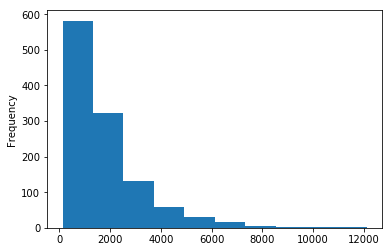

In [9]:
daf.length.plot(bins=10, kind='hist') 

In [10]:
daf.length.describe()  

count     1150.000000
mean      1783.120870
std       1496.079347
min        123.000000
25%        759.000000
50%       1303.500000
75%       2270.000000
max      12114.000000
Name: length, dtype: float64

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x000001F10838A9B0>,
        <matplotlib.axes._subplots.AxesSubplot object at 0x000001F1085299B0>]], dtype=object)

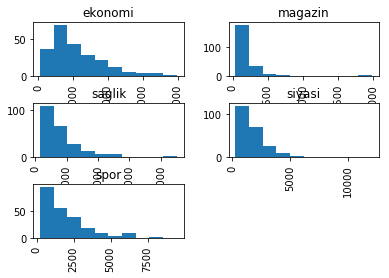

In [11]:
daf.hist(column='length', by='label', bins=10)

In [12]:
print(daf.message.head())

0    Çocuklar Duymasın dizisi bir başrol oyuncusunu...
1    Kurtlar Vadisi’ndeki ‘Çakır’ tiplemesiyle ekra...
2    Bizim evliliğimizde mankenliğe yer yoktu \n\n1...
3    Hep aynı nakarat    \n \n\n\nBeşiktaş'ın yıldı...
4    İnsan kanıyla çalışan mini-pil geliştirildi \n...
Name: message, dtype: object


In [13]:
type(daf['message'])

pandas.core.series.Series

In [14]:
print(stopwords.words("turkish"))

['acaba', 'ama', 'aslında', 'az', 'bazı', 'belki', 'biri', 'birkaç', 'birşey', 'biz', 'bu', 'çok', 'çünkü', 'da', 'daha', 'de', 'defa', 'diye', 'eğer', 'en', 'gibi', 'hem', 'hep', 'hepsi', 'her', 'hiç', 'için', 'ile', 'ise', 'kez', 'ki', 'kim', 'mı', 'mu', 'mü', 'nasıl', 'ne', 'neden', 'nerde', 'nerede', 'nereye', 'niçin', 'niye', 'o', 'sanki', 'şey', 'siz', 'şu', 'tüm', 've', 'veya', 'ya', 'yani']


In [15]:
#!/usr/bin/python
# -*- coding: utf-8 -*- 
# [PACKAGE KURULUMU] :       pip install JPype1-py3
# [KAYNAK] : http://stackoverflow.com/questions/35736763/practical-use-of-java-class-jar-in-python
#            https://blog.notmyidea.org/using-jpype-to-bridge-python-and-java.html
#            http://iacobelli.cl/blog/?p=119
#            https://blog.notmyidea.org/using-jpype-to-bridge-python-and-java.html

import jpype
import os
 
# jvm.dll'nin yolu. Java versiyonu değişirse, alttaki satır güncellenecek.
jvmDLLpath = r"C:\Program Files\Java\jdk1.7.0\jre\bin\server\jvm.dll"


 
# CLASSPATH  ayarlaması. .jar  dosyalarının doğrudan path bilgisi ve .jar ismi burada belirtilecek.7


classpath = r"zemberek-cekirdek-2.1.1.jar"
classpath = os.pathsep.join((classpath, "zemberek-tr-2.1.1.jar"))

    
    
# JVM'nin BAŞLATILMASI
jpype.startJVM(jvmDLLpath,"-Xmx512m", "-Djava.class.path=%s"%classpath)



 

 ################################################################################################
# .JAR'daki class'lardan object'lerin oluşturulması
 
# [JAVA EŞDEĞERİ]  tt = new(net.zemberek.tr.yapi.TurkiyeTurkcesi())
TT = jpype.JClass("net.zemberek.tr.yapi.TurkiyeTurkcesi")
tt = TT()
 
# [JAVA EŞDEĞERİ]  z = new(net.zemberek.erisim.Zemberek(tt))
Z = jpype.JClass("net.zemberek.erisim.Zemberek")
z = Z(tt)
################################################################################################
 
ornSonuc = z.kelimeCozumle("geliyorum")
print(type(ornSonuc))
print(ornSonuc[0])
print(ornSonuc[0].kok().tip().toString())
print(ornSonuc[0].kok().icerik())
 
 
 
# JVM'nin SONLANDIRILMASI
#jpype.shutdownJVM()


<class 'jpype._jarray.net.zemberek.yapi.Kelime[]'>
 [ Kok: gel, FIIL ]  Ekler: FIIL_SIMDIKIZAMAN_IYOR + FIIL_KISI_BEN
FIIL
gel


In [16]:
 
ornSonuc = z.kelimeCozumle("teşhisinde")
print(type(ornSonuc))
print(ornSonuc[0])
print(ornSonuc[0].kok().tip().toString())
print(ornSonuc[0].kok().icerik())
 

<class 'jpype._jarray.net.zemberek.yapi.Kelime[]'>
 [ Kok: teşhis, ISIM ]  Ekler: ISIM_TAMLAMA_IN + ISIM_KALMA_DE
ISIM
teşhis


In [17]:
from nltk.corpus import stopwords
stop_words = set(stopwords.words("turkish"))

def split_into_lemmas(message):
    
    
    #  error #message = re.split('\s|(?<!\d)[,.]|[,.](?!\d)',' '.join(message.split()))

    message = message.lower()
    words2=[]
    words = TextBlob(message).words
    print(words)

    for w2 in words:
        
        try:
            ornSonuc = z.kelimeCozumle(w2)
            words2.append(ornSonuc[0].kok().icerik())
        
        except:
            words2.append(w2)
            continue

    
    
    #filtered_sentence = list([w for w in words if not w in stop_words])
    #return [word.lemma for word in words] #lemmatization
    #return [w for w in words if not w in stop_words]
    return words2
  




    
#messages.message.head().apply(split_into_lemmas)

In [133]:
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.util import ngrams
stop_words = set(stopwords.words("turkish"))
import nltk
from textblob import TextBlob
from nltk import word_tokenize
from nltk import bigrams
import re
from sklearn.feature_extraction.text import CountVectorizer

In [135]:
bigram_vectorizer = CountVectorizer(ngram_range=(1, 2),
                                    token_pattern=r'\b\w+\b', min_df=1)
analyze = bigram_vectorizer.build_analyzer()
analyze('Bi-grams are cool!')

['bi', 'grams', 'are', 'cool', 'bi grams', 'grams are', 'are cool']

In [143]:

def split_into2_lemmas(message):
    
    
    #  error #message = re.split('\s|(?<!\d)[,.]|[,.](?!\d)',' '.join(message.split()))  
    
    message = message.lower()
    words2=[]
    words = TextBlob(message)
    #words3=[]
    words4=[]
    
    words_bigrams = words.ngrams(n=2)
    print(words_bigrams)
    words3 = words_bigrams
    
    #n=2
    #n_grams = ngrams(word_tokenize(message), n)
    #words3.append([grams for grams in n_grams])
    

    for w2 in words3:
        
        for w3 in w2:
            
            try:
                ornSonuc = z.kelimeCozumle(w3)
                words2.append(ornSonuc[0].kok().icerik())
            
            except:
                words2.append(w3)
                continue
    
    #filtered_sentence = list([w for w in words if not w in stop_words])
    #return [word.lemma for word in words] #lemmatization
    #return [w for w in words if not w in stop_words]

    return words2
#messages.message.head().apply(split_into_lemmas)

In [24]:
message = "hey dostum naber"
words = TextBlob(message).words
type(words)

textblob.blob.WordList

In [151]:
#daf.message.head()[1]
split_into2_lemmas("ben ama mehmeti seviyorum herkesi")

[WordList(['ben', 'ama']), WordList(['ama', 'mehmeti']), WordList(['mehmeti', 'seviyorum']), WordList(['seviyorum', 'herkesi'])]


['ben', 'ama', 'ama', 'mehmeti', 'mehmeti', 'sev', 'sev', 'herkes']

In [152]:
print(daf.message.head().apply(split_into2_lemmas)[0])

[WordList(['çocuklar', 'duymasın']), WordList(['duymasın', 'dizisi']), WordList(['dizisi', 'bir']), WordList(['bir', 'başrol']), WordList(['başrol', 'oyuncusunu']), WordList(['oyuncusunu', 'daha']), WordList(['daha', 'kaybetti']), WordList(['kaybetti', 'eşi']), WordList(['eşi', 'askerdeyken']), WordList(['askerdeyken', 'tony']), WordList(['tony', "teodoridis'le"]), WordList(["teodoridis'le", 'ilişkisi']), WordList(['ilişkisi', 'ortaya']), WordList(['ortaya', 'çıkınca']), WordList(['çıkınca', 'diziye']), WordList(['diziye', 'veda']), WordList(['veda', 'eden']), WordList(['eden', 'pınar']), WordList(['pınar', "altuğ'dan"]), WordList(["altuğ'dan", 'sonra']), WordList(['sonra', 'seks']), WordList(['seks', 'kaseti']), WordList(['kaseti', 'skandalı']), WordList(['skandalı', 'yüzünden']), WordList(['yüzünden', 'sıkıntılı']), WordList(['sıkıntılı', 'günler']), WordList(['günler', 'yaşayan']), WordList(['yaşayan', 'tamer']), WordList(['tamer', 'karadağlı']), WordList(['karadağlı', 'da']), WordL

[WordList(['hep', 'aynı']), WordList(['aynı', 'nakarat']), WordList(['nakarat', "beşiktaş'ın"]), WordList(["beşiktaş'ın", 'yıldız']), WordList(['yıldız', 'futbolcusu']), WordList(['futbolcusu', 'sergen']), WordList(['sergen', 'yalçın']), WordList(['yalçın', 'bir']), WordList(['bir', 'dargın']), WordList(['dargın', 'bir']), WordList(['bir', 'barışık']), WordList(['barışık', 'dört']), WordList(['dört', 'yıldır']), WordList(['yıldır', 'birlikte']), WordList(['birlikte', 'olduğu']), WordList(['olduğu', 'stilist']), WordList(['stilist', 'sevgilisi']), WordList(['sevgilisi', 'aslı']), WordList(['aslı', 'sarı']), WordList(['sarı', 'tarafından']), WordList(['tarafından', 'önceki']), WordList(['önceki', 'hafta']), WordList(['hafta', 'bilmem']), WordList(['bilmem', 'kaçıncı']), WordList(['kaçıncı', 'kez']), WordList(['kez', 'terk']), WordList(['terk', 'edilmişti']), WordList(['edilmişti', "sergen'in"]), WordList(["sergen'in", 'çapkınlıkları']), WordList(['çapkınlıkları', 'yüzünden']), WordList([

In [150]:
#daf.message.head()[1]
wd = split_into2_lemmas(daf.message.head()[1])
print(wd)


[WordList(['kurtlar', 'vadisi']), WordList(['vadisi', '’']), WordList(['’', 'ndeki']), WordList(['ndeki', '‘']), WordList(['‘', 'çakır']), WordList(['çakır', '’']), WordList(['’', 'tiplemesiyle']), WordList(['tiplemesiyle', 'ekranlara']), WordList(['ekranlara', 'gelen']), WordList(['gelen', 'oktay']), WordList(['oktay', 'kaynarca']), WordList(['kaynarca', 'yeni']), WordList(['yeni', 'yayın']), WordList(['yayın', 'döneminde']), WordList(['döneminde', 'yepyeni']), WordList(['yepyeni', 'bir']), WordList(['bir', 'projeyle']), WordList(['projeyle', 'sevenlerinin']), WordList(['sevenlerinin', 'karşısına']), WordList(['karşısına', 'çıkacak']), WordList(['çıkacak', 'kaynarca']), WordList(['kaynarca', 'senaryonusu']), WordList(['senaryonusu', 'safa']), WordList(['safa', 'önal']), WordList(['önal', '’']), WordList(['’', 'ın']), WordList(['ın', 'yazdığı']), WordList(['yazdığı', 'bir']), WordList(['bir', 'projede']), WordList(['projede', 'yeniden']), WordList(['yeniden', 'kamera']), WordList(['kam

In [153]:
#daf.message.head().apply(split_into_lemmas)
daf.message.head().apply(split_into2_lemmas)



[WordList(['çocuklar', 'duymasın']), WordList(['duymasın', 'dizisi']), WordList(['dizisi', 'bir']), WordList(['bir', 'başrol']), WordList(['başrol', 'oyuncusunu']), WordList(['oyuncusunu', 'daha']), WordList(['daha', 'kaybetti']), WordList(['kaybetti', 'eşi']), WordList(['eşi', 'askerdeyken']), WordList(['askerdeyken', 'tony']), WordList(['tony', "teodoridis'le"]), WordList(["teodoridis'le", 'ilişkisi']), WordList(['ilişkisi', 'ortaya']), WordList(['ortaya', 'çıkınca']), WordList(['çıkınca', 'diziye']), WordList(['diziye', 'veda']), WordList(['veda', 'eden']), WordList(['eden', 'pınar']), WordList(['pınar', "altuğ'dan"]), WordList(["altuğ'dan", 'sonra']), WordList(['sonra', 'seks']), WordList(['seks', 'kaseti']), WordList(['kaseti', 'skandalı']), WordList(['skandalı', 'yüzünden']), WordList(['yüzünden', 'sıkıntılı']), WordList(['sıkıntılı', 'günler']), WordList(['günler', 'yaşayan']), WordList(['yaşayan', 'tamer']), WordList(['tamer', 'karadağlı']), WordList(['karadağlı', 'da']), WordL

[WordList(['bizim', 'evliliğimizde']), WordList(['evliliğimizde', 'mankenliğe']), WordList(['mankenliğe', 'yer']), WordList(['yer', 'yoktu']), WordList(['yoktu', '15']), WordList(['15', 'yaşındayken']), WordList(['yaşındayken', 'ankara']), WordList(['ankara', 'olgunlaşma']), WordList(['olgunlaşma', "enstitüsü'nde"]), WordList(["enstitüsü'nde", 'mankenliğe']), WordList(['mankenliğe', 'başlayan']), WordList(['başlayan', 'fatoş']), WordList(['fatoş', 'kayacan']), WordList(['kayacan', 'hataylı']), WordList(['hataylı', 'evlendikten']), WordList(['evlendikten', 'sonra']), WordList(['sonra', 'eşinin']), WordList(['eşinin', 'isteğiyle']), WordList(['isteğiyle', 'podyumlara']), WordList(['podyumlara', 'veda']), WordList(['veda', 'ediyor']), WordList(['ediyor', "'i̇kimiz"]), WordList(["'i̇kimiz", 'de']), WordList(['de', 'çocuk']), WordList(['çocuk', 'istiyorduk']), WordList(['istiyorduk', 'diyen']), WordList(['diyen', 'fatoş']), WordList(['fatoş', 'hanım']), WordList(['hanım', "'meslek"]), WordL

[WordList(['hep', 'aynı']), WordList(['aynı', 'nakarat']), WordList(['nakarat', "beşiktaş'ın"]), WordList(["beşiktaş'ın", 'yıldız']), WordList(['yıldız', 'futbolcusu']), WordList(['futbolcusu', 'sergen']), WordList(['sergen', 'yalçın']), WordList(['yalçın', 'bir']), WordList(['bir', 'dargın']), WordList(['dargın', 'bir']), WordList(['bir', 'barışık']), WordList(['barışık', 'dört']), WordList(['dört', 'yıldır']), WordList(['yıldır', 'birlikte']), WordList(['birlikte', 'olduğu']), WordList(['olduğu', 'stilist']), WordList(['stilist', 'sevgilisi']), WordList(['sevgilisi', 'aslı']), WordList(['aslı', 'sarı']), WordList(['sarı', 'tarafından']), WordList(['tarafından', 'önceki']), WordList(['önceki', 'hafta']), WordList(['hafta', 'bilmem']), WordList(['bilmem', 'kaçıncı']), WordList(['kaçıncı', 'kez']), WordList(['kez', 'terk']), WordList(['terk', 'edilmişti']), WordList(['edilmişti', "sergen'in"]), WordList(["sergen'in", 'çapkınlıkları']), WordList(['çapkınlıkları', 'yüzünden']), WordList([

0    [çocuk, duy, duy, dizi, dizi, bir, bir, başrol...
1    [kurt, vadi, vadi, ’, ’, ndeki, ndeki, ‘, ‘, ç...
2    [biz, evlilik, evlilik, manken, manken, yer, y...
3    [hep, aynı, aynı, nakarat, nakarat, beşiktaş'ı...
4    [insan, kanı, kanı, çalış, çalış, mini-pil, mi...
Name: message, dtype: object

In [154]:
print(daf.message.head()[0])

Çocuklar Duymasın dizisi bir başrol oyuncusunu daha kaybetti. Eşi askerdeyken Tony Teodoridis'le ilişkisi ortaya çıkınca diziye veda eden Pınar Altuğ'dan sonra, seks kaseti skandalı yüzünden sıkıntılı günler yaşayan Tamer Karadağlı da Çocuklar Duymasın'dan ayrıldı. Dün yapımcı şirket Mint Production aracılığıyla diziden ayrıldığını kamuoyuna duyuran Karadağlı, VATAN'a yaptığı açıklamada Türkiye'den ayrılıp Amerika'ya yerleşebileceğinin sinyallerini verdi. Karadağlı yaşadığı duyguları ve planlarını şöyle anlattı:

"Benden herkes adeta toplu intikam almaya başladı. Üç gündür yaşadıklarımı aklım hayalim almıyor. Ben de bir insanım, benim de hata yapmış olmam çok normal. Ama anlamıyorum. Neden oldu bunlar? Arzu'ya anlatmışım, savcıya anlatmışım, çıkıp 70 milyonluk Türkiye'nin karşısına hatamı anlatıp, özür dilemişim. Daha ne yapayım. Oyuncu ya da şarkıcı olunca böyle paramparça ediyorlar. İşte oldu. Diziden ayrıldım. Kararımı yapımcı Birol Güven'e açıkladım ve artık Çocuklar Duymasın'da yo

In [155]:
print(daf.message.head()[1])

Kurtlar Vadisi’ndeki ‘Çakır’ tiplemesiyle ekranlara gelen Oktay Kaynarca, yeni yayın döneminde yepyeni bir projeyle sevenlerinin karşısına çıkacak. Kaynarca, senaryonusu Safa Önal’ın yazdığı bir projede yeniden kamera karşısına geçecek. 15 gün sonra çekimlerine başlanacak olan ancak henüz adı belli olmayan bu dizide Kaynarca, tıpkı Çakır gibi bir tetikçiyi canlandıracak. 

Yönetmenliğini Ümit Efekan’ın yapacağı, İbrahim Mertoğlu’nun yapımcı olduğu dizide Oktay Kaynarca, her şeyi tek başına halletmeye çalışan mert bir genç rolünde izleyicinin karşısına çıkacak. 

Yılmaz Güney’in 1971 yılında yönetip başrolünü de Filiz Akın’la paylaştığı, kabadayı Fırat’la balerin Çiğdem’in aşk öyküsünü konu alan ‘Umutsuzlar’ filminden esinlenen dizide, Tetikçi olan Oktay Kaynarca’nın sevdiği kadını ise ‘Zerda’ dizisindeki rolüyle tanınan Ece Uslu oynayacak. 



In [156]:
#bow_transformer = CountVectorizer(analyzer=split_into_lemmas).fit(daf['message'])
bow_transformer = CountVectorizer(analyzer=split_into2_lemmas).fit(daf['message'])
print (len(bow_transformer.vocabulary_)) #sum words

[WordList(['çocuklar', 'duymasın']), WordList(['duymasın', 'dizisi']), WordList(['dizisi', 'bir']), WordList(['bir', 'başrol']), WordList(['başrol', 'oyuncusunu']), WordList(['oyuncusunu', 'daha']), WordList(['daha', 'kaybetti']), WordList(['kaybetti', 'eşi']), WordList(['eşi', 'askerdeyken']), WordList(['askerdeyken', 'tony']), WordList(['tony', "teodoridis'le"]), WordList(["teodoridis'le", 'ilişkisi']), WordList(['ilişkisi', 'ortaya']), WordList(['ortaya', 'çıkınca']), WordList(['çıkınca', 'diziye']), WordList(['diziye', 'veda']), WordList(['veda', 'eden']), WordList(['eden', 'pınar']), WordList(['pınar', "altuğ'dan"]), WordList(["altuğ'dan", 'sonra']), WordList(['sonra', 'seks']), WordList(['seks', 'kaseti']), WordList(['kaseti', 'skandalı']), WordList(['skandalı', 'yüzünden']), WordList(['yüzünden', 'sıkıntılı']), WordList(['sıkıntılı', 'günler']), WordList(['günler', 'yaşayan']), WordList(['yaşayan', 'tamer']), WordList(['tamer', 'karadağlı']), WordList(['karadağlı', 'da']), WordL

[WordList(['hep', 'aynı']), WordList(['aynı', 'nakarat']), WordList(['nakarat', "beşiktaş'ın"]), WordList(["beşiktaş'ın", 'yıldız']), WordList(['yıldız', 'futbolcusu']), WordList(['futbolcusu', 'sergen']), WordList(['sergen', 'yalçın']), WordList(['yalçın', 'bir']), WordList(['bir', 'dargın']), WordList(['dargın', 'bir']), WordList(['bir', 'barışık']), WordList(['barışık', 'dört']), WordList(['dört', 'yıldır']), WordList(['yıldır', 'birlikte']), WordList(['birlikte', 'olduğu']), WordList(['olduğu', 'stilist']), WordList(['stilist', 'sevgilisi']), WordList(['sevgilisi', 'aslı']), WordList(['aslı', 'sarı']), WordList(['sarı', 'tarafından']), WordList(['tarafından', 'önceki']), WordList(['önceki', 'hafta']), WordList(['hafta', 'bilmem']), WordList(['bilmem', 'kaçıncı']), WordList(['kaçıncı', 'kez']), WordList(['kez', 'terk']), WordList(['terk', 'edilmişti']), WordList(['edilmişti', "sergen'in"]), WordList(["sergen'in", 'çapkınlıkları']), WordList(['çapkınlıkları', 'yüzünden']), WordList([

[WordList(['eğer', 'yiyeceklerinizin']), WordList(['yiyeceklerinizin', 'besin']), WordList(['besin', 'değerlerini']), WordList(['değerlerini', 'koruyamazsanız']), WordList(['koruyamazsanız', 'bu']), WordList(['bu', 'savaşa']), WordList(['savaşa', 'girişmenin']), WordList(['girişmenin', 'hiçbir']), WordList(['hiçbir', 'anlamı']), WordList(['anlamı', 'kalmaz']), WordList(['kalmaz', 'size']), WordList(['size', 'birkaç']), WordList(['birkaç', 'ipucu']), WordList(['ipucu', 'verelim']), WordList(['verelim', 'önceden']), WordList(['önceden', 'kesilip']), WordList(['kesilip', 'paketlenmiş']), WordList(['paketlenmiş', 'yiyecekleri']), WordList(['yiyecekleri', 'tercih']), WordList(['tercih', 'etmeyin']), WordList(['etmeyin', 'taze']), WordList(['taze', 'meyve']), WordList(['meyve', 'satın']), WordList(['satın', 'alırken']), WordList(['alırken', 'meyvelerde']), WordList(['meyvelerde', 'zedelenme']), WordList(['zedelenme', 'bulunmamasına']), WordList(['bulunmamasına', 'dikkat']), WordList(['dikkat

[WordList(['paraya', 'para']), WordList(['para', 'demiyor']), WordList(['demiyor', 'dünyaca']), WordList(['dünyaca', 'ünlü']), WordList(['ünlü', 'iç']), WordList(['iç', 'giyim']), WordList(['giyim', 'firması']), WordList(['firması', 'victoria']), WordList(['victoria', "'s"]), WordList(["'s", "secret'ın"]), WordList(["secret'ın", 'gözde']), WordList(['gözde', 'mankeni']), WordList(['mankeni', '27']), WordList(['27', 'yaşındaki']), WordList(['yaşındaki', 'bridget']), WordList(['bridget', 'hall']), WordList(['hall', 'on']), WordList(['on', 'yaşında']), WordList(['yaşında', 'girdiği']), WordList(['girdiği', 'moda']), WordList(['moda', 'dünyasının']), WordList(['dünyasının', 'yıldızları']), WordList(['yıldızları', 'arasındaki']), WordList(['arasındaki', 'yerine']), WordList(['yerine', 'yerleşti']), WordList(['yerleşti', 'vogue']), WordList(['vogue', 'elle']), WordList(['elle', 've']), WordList(['ve', 'cosmopolitan']), WordList(['cosmopolitan', 'gibi']), WordList(['gibi', 'ünlü']), WordList(

[WordList(['sürpriz', 'aşk']), WordList(['aşk', 'işıl']), WordList(['işıl', "sarraf'la"]), WordList(["sarraf'la", 'bir']), WordList(['bir', 'dargın']), WordList(['dargın', 'bir']), WordList(['bir', 'barışık']), WordList(['barışık', 'sürdürdüğü']), WordList(['sürdürdüğü', 'ilişkisini']), WordList(['ilişkisini', 'noktalayan']), WordList(['noktalayan', 'sinan']), WordList(['sinan', "akıman'ın"]), WordList(["akıman'ın", 'yeni']), WordList(['yeni', 'bir']), WordList(['bir', 'aşka']), WordList(['aşka', 'yelken']), WordList(['yelken', 'açtığını']), WordList(['açtığını', 'duydum']), WordList(['duydum', "akıman'ın"]), WordList(["akıman'ın", 'son']), WordList(['son', 'gözdesi']), WordList(['gözdesi', 'ozan']), WordList(['ozan', "doğulu'nun"]), WordList(["doğulu'nun", 'eski']), WordList(['eski', 'sevgilisi']), WordList(['sevgilisi', 'ayşe']), WordList(['ayşe', 'hatun']), WordList(['hatun', 'önal']), WordList(['önal', 'i̇lk']), WordList(['i̇lk', 'duyduğumda']), WordList(['duyduğumda', 'bu']), Word

[WordList(['efendim', 'hafta']), WordList(['hafta', 'sonu']), WordList(['sonu', "bodrum'daydım"]), WordList(["bodrum'daydım", "ankara'nın"]), WordList(["ankara'nın", 'önemli']), WordList(['önemli', 'iş']), WordList(['iş', 'kadınlarından']), WordList(['kadınlarından', 'sevgili']), WordList(['sevgili', 'arkadaşım']), WordList(['arkadaşım', 'nur']), WordList(['nur', "kalgay'ın"]), WordList(["kalgay'ın", 'muhteşem']), WordList(['muhteşem', 'evinde']), WordList(['evinde', 'bir']), WordList(['bir', 'davet']), WordList(['davet', 'vardı']), WordList(['vardı', 'e']), WordList(['e', "bodrum'un"]), WordList(["bodrum'un", 'her']), WordList(['her', 'zaman']), WordList(['zaman', 'varolan']), WordList(['varolan', 'renkli']), WordList(['renkli', 'yaşamı']), WordList(['yaşamı', 'özellikle']), WordList(['özellikle', "göltürkbükü'ndeki"]), WordList(["göltürkbükü'ndeki", 'hareketli']), WordList(['hareketli', 'gün']), WordList(['gün', 've']), WordList(['ve', 'geceler']), WordList(['geceler', 'de']), WordLi

[WordList(['alışkanlık', 'mı']), WordList(['mı', 'imaj']), WordList(['imaj', 'mı']), WordList(['mı', 'daha']), WordList(['daha', 'önce']), WordList(['önce', 'konserlerine']), WordList(['konserlerine', 'elinde']), WordList(['elinde', 'bira']), WordList(['bira', 'şişesiyle']), WordList(['şişesiyle', 'çıkan']), WordList(['çıkan', 've']), WordList(['ve', 'konser']), WordList(['konser', 'boyunca']), WordList(['boyunca', 'içen']), WordList(['içen', "teoman'ın"]), WordList(["teoman'ın", 'önceki']), WordList(['önceki', 'gün']), WordList(['gün', 'de']), WordList(['de', 'sahnede']), WordList(['sahnede', 'iki']), WordList(['iki', 'paketi']), WordList(['paketi', 'aşkın']), WordList(['aşkın', 'sigara']), WordList(['sigara', 'içmesi']), WordList(['içmesi', 'bunun']), WordList(['bunun', 'bir']), WordList(['bir', 'pazarlama']), WordList(['pazarlama', 'taktiği']), WordList(['taktiği', 'olduğu']), WordList(['olduğu', 'şüphesini']), WordList(['şüphesini', 'akıllara']), WordList(['akıllara', 'getirdi']), 

[WordList(['halk', 'arasında']), WordList(['arasında', '‘']), WordList(['‘', 'temriye']), WordList(['temriye', '’']), WordList(['’', 'olarak']), WordList(['olarak', 'bilinen']), WordList(['bilinen', 've']), WordList(['ve', 'hava']), WordList(['hava', 'sıcaklığının']), WordList(['sıcaklığının', 'artması']), WordList(['artması', 'ile']), WordList(['ile', 'birlikte']), WordList(['birlikte', 'kendisini']), WordList(['kendisini', 'gösteren']), WordList(['gösteren', 'mantar']), WordList(['mantar', 'hastalığının']), WordList(['hastalığının', 'başka']), WordList(['başka', 'hastalıklarla']), WordList(['hastalıklarla', 'karıştırılmaması']), WordList(['karıştırılmaması', 'gerektiğini']), WordList(['gerektiğini', 'belirten']), WordList(['belirten', 'prof']), WordList(['prof', 'dr']), WordList(['dr', 'aktaş']), WordList(['aktaş', 'kulaktan']), WordList(['kulaktan', 'duyma']), WordList(['duyma', 'yöntemlerle']), WordList(['yöntemlerle', 'tedavi']), WordList(['tedavi', 'edilmemesini']), WordList(['ed

[WordList(["kopenhag'da", 'cim-bom']), WordList(['cim-bom', 'mriterleri']), WordList(['mriterleri', 'uefa']), WordList(['uefa', 'şampiyonunu']), WordList(['şampiyonunu', 'penaltılar']), WordList(['penaltılar', 'belirleyecekti']), WordList(['belirleyecekti', 'son']), WordList(['son', 'penaltıyı']), WordList(['penaltıyı', 'popescu']), WordList(['popescu', 'atıyordu']), WordList(['atıyordu', 'rumen']), WordList(['rumen', 'libero']), WordList(['libero', 'topa']), WordList(['topa', 'koşarken']), WordList(['koşarken', 'tribünlerden']), WordList(['tribünlerden', 'bir']), WordList(['bir', 'tek']), WordList(['tek', 'ben']), WordList(['ben', 'atmaaaa']), WordList(['atmaaaa', 'diye']), WordList(['diye', 'bağırıyordum']), WordList(['bağırıyordum', 'uyanmıştım']), WordList(['uyanmıştım', 'o']), WordList(['o', 'kupa']), WordList(['kupa', 'için']), WordList(['için', 'sanki']), WordList(['sanki', 'biz']), WordList(['biz', 'gibiydiler']), WordList(['gibiydiler', 'sanki']), WordList(['sanki', 'çünkü']),

[WordList(['vip', 'style']), WordList(['style', 'yarış']), WordList(['yarış', 'arasında']), WordList(['arasında', 'güneş']), WordList(['güneş', 'molası']), WordList(['molası', 'fenerbahçe']), WordList(['fenerbahçe', 'spor']), WordList(['spor', 'kulübü']), WordList(['kulübü', 'eski']), WordList(['eski', 'yöneticilerinden']), WordList(['yöneticilerinden', 'genç']), WordList(['genç', 'işadamı']), WordList(['işadamı', 'mehmet']), WordList(['mehmet', 'karasu']), WordList(['karasu', 'aynı']), WordList(['aynı', 'zamanda']), WordList(['zamanda', 'ünlü']), WordList(['ünlü', 'bir']), WordList(['bir', "'off"]), WordList(["'off", 'shore']), WordList(['shore', 'yarışcısı']), WordList(['yarışcısı', 'türkiye']), WordList(['türkiye', 'off']), WordList(['off', 'shore']), WordList(['shore', 'şampiyonası']), WordList(['şampiyonası', 'için']), WordList(['için', 'geçtiğimiz']), WordList(['geçtiğimiz', 'hafta']), WordList(['hafta', 'sonu']), WordList(['sonu', "bodrum'a"]), WordList(["bodrum'a", 'giden']), W

[WordList(['podyumun', 'tadı']), WordList(['tadı', 'kaçtı']), WordList(['kaçtı', 'dünya']), WordList(['dünya', 'halter']), WordList(['halter', 'şampiyonası']), WordList(['şampiyonası', '’']), WordList(['’', 'nda']), WordList(['nda', 'dün']), WordList(['dün', 'yarışan']), WordList(['yarışan', 'sporcularımız']), WordList(['sporcularımız', 'da']), WordList(['da', 'dereceye']), WordList(['dereceye', 'giremedi']), WordList(['giremedi', 'cemal']), WordList(['cemal', 'ersen']), WordList(['ersen', 'polonya']), WordList(['polonya', '’']), WordList(['’', 'nin']), WordList(['nin', 'varşova']), WordList(['varşova', 'kentinde']), WordList(['kentinde', 'bugün']), WordList(['bugün', 'sona']), WordList(['sona', 'erecek']), WordList(['erecek', 'dünya']), WordList(['dünya', 'halter']), WordList(['halter', 'şampiyonası']), WordList(['şampiyonası', '’']), WordList(['’', 'nda']), WordList(['nda', 'dün']), WordList(['dün', 'de']), WordList(['de', 'kürsüye']), WordList(['kürsüye', 'çıkamadık']), WordList(['ç

[WordList(['evde', 'hazırlayabileceğiniz']), WordList(['hazırlayabileceğiniz', 'basit']), WordList(['basit', 'tariflerle']), WordList(['tariflerle', 'dişlerinizi']), WordList(['dişlerinizi', 'güzelleştirin']), WordList(['güzelleştirin', 'diş']), WordList(['diş', 'etleri']), WordList(['etleri', 've']), WordList(['ve', 'diş']), WordList(['diş', 'taşı']), WordList(['taşı', 'için']), WordList(['için', 'iki']), WordList(['iki', 'tatlı']), WordList(['tatlı', 'kaşığı']), WordList(['kaşığı', 'adaçayı']), WordList(['adaçayı', 'papatya']), WordList(['papatya', 'veya']), WordList(['veya', 'kekiği']), WordList(['kekiği', 'bir']), WordList(['bir', 'bardak']), WordList(['bardak', 'kaynar']), WordList(['kaynar', 'su']), WordList(['su', 'veya']), WordList(['veya', 'sirkede']), WordList(['sirkede', '20']), WordList(['20', 'dakika']), WordList(['dakika', 'beklettikten']), WordList(['beklettikten', 'sonra']), WordList(['sonra', 'süzün']), WordList(['süzün', 'sirkeyle']), WordList(['sirkeyle', 'hazırladıy

[WordList(['tarihi', 'sınav']), WordList(['sınav', 'türk']), WordList(['türk', 'milli']), WordList(['milli', 'takımı']), WordList(['takımı', 'bugün']), WordList(['bugün', 'tarihi']), WordList(['tarihi', 'bir']), WordList(['bir', 'sınava']), WordList(['sınava', 'çıkıyor']), WordList(['çıkıyor', 'grupta']), WordList(['grupta', 'ilk']), WordList(['ilk', 'maçlar']), WordList(['maçlar', 'takımların']), WordList(['takımların', 'gidişatı']), WordList(['gidişatı', 'için']), WordList(['için', 'önemlidir']), WordList(['önemlidir', 'brezilya']), WordList(['brezilya', 'karşısında']), WordList(['karşısında', 'ne']), WordList(['ne', 'sonuç']), WordList(['sonuç', 'alırsak']), WordList(['alırsak', 'alalım']), WordList(['alalım', 'iyimserliğe']), WordList(['iyimserliğe', 'ya']), WordList(['ya', 'da']), WordList(['da', 'karamsarlığa']), WordList(['karamsarlığa', 'kapılmamalıyız']), WordList(['kapılmamalıyız', 'başlangıç']), WordList(['başlangıç', 'açısından']), WordList(['açısından', 'maçın']), WordList

[WordList(['wal-mart', 'rekabeti']), WordList(['rekabeti', '11']), WordList(['11', 'milyar']), WordList(['milyar', 'dolarlık']), WordList(['dolarlık', 'oyuncak']), WordList(['oyuncak', 'devi']), WordList(['devi', 'toys']), WordList(['toys', "'r"]), WordList(["'r", "us'ı"]), WordList(["us'ı", 'pes']), WordList(['pes', 'ettirdi']), WordList(['ettirdi', 'ünlü']), WordList(['ünlü', 'oyuncak']), WordList(['oyuncak', 'firması']), WordList(['firması', 'sektörden']), WordList(['sektörden', 'çekilmeyi']), WordList(['çekilmeyi', 'düşündüğünü']), WordList(['düşündüğünü', 'açıkladı']), WordList(['açıkladı', 'toys']), WordList(['toys', "'r"]), WordList(["'r", 'us']), WordList(['us', 'oyuncak']), WordList(['oyuncak', 'birimini']), WordList(['birimini', 'satarak']), WordList(['satarak', 'ağırlığı']), WordList(['ağırlığı', 'geçen']), WordList(['geçen', 'yıl']), WordList(['yıl', '2']), WordList(['2', 'milyar']), WordList(['milyar', 'dolar']), WordList(['dolar', 'satışla']), WordList(['satışla', 'agre-s

[WordList(['enerji', 'piyasası']), WordList(['piyasası', 'düzenleme']), WordList(['düzenleme', "kurumu'nun"]), WordList(["kurumu'nun", 'epdk']), WordList(['epdk', 'doğalgaz']), WordList(['doğalgaz', 'dağıtım']), WordList(['dağıtım', 'ihalesine']), WordList(['ihalesine', 'katılacak']), WordList(['katılacak', 'firmalardan']), WordList(['firmalardan', 'istediği']), WordList(['istediği', 'teminat']), WordList(['teminat', 'mektubunda']), WordList(['mektubunda', 'aktif']), WordList(['aktif', 'büyüklüğüne']), WordList(['büyüklüğüne', 'göre']), WordList(['göre', 'ilk']), WordList(['ilk', "10'da"]), WordList(["10'da", 'yer']), WordList(['yer', 'alan']), WordList(['alan', 'banka']), WordList(['banka', 'sınırlaması']), WordList(['sınırlaması', 'yayımlanan']), WordList(['yayımlanan', 'bir']), WordList(['bir', 'yönetmelikle']), WordList(['yönetmelikle', 'kaldırıldı']), WordList(['kaldırıldı', 'uygulamaya']), WordList(['uygulamaya', 'rekabet']), WordList(['rekabet', 'kurumu']), WordList(['kurumu', '

[WordList(['amerikalı', 'yıldız']), WordList(['yıldız', 'sharon']), WordList(['sharon', 'stone']), WordList(['stone', 'başkan']), WordList(['başkan', 'george']), WordList(['george', 'w']), WordList(['w', 'bush']), WordList(['bush', '’']), WordList(['’', 'un']), WordList(['un', 'abd']), WordList(['abd', '’']), WordList(['’', 'de']), WordList(['de', 'estirdiği']), WordList(['estirdiği', 'muhafazakar']), WordList(['muhafazakar', 'hava']), WordList(['hava', 'nedeniyle']), WordList(['nedeniyle', '‘']), WordList(['‘', 'catwoman']), WordList(['catwoman', '’']), WordList(['’', 'filminin']), WordList(['filminin', 'çekimlerinde']), WordList(['çekimlerinde', 'halle']), WordList(['halle', 'berry']), WordList(['berry', 'ile']), WordList(['ile', 'birbirlerine']), WordList(['birbirlerine', 'lezbiyen']), WordList(['lezbiyen', 'öpücüğü']), WordList(['öpücüğü', 'veremediklerini']), WordList(['veremediklerini', 'söyledi']), WordList(['söyledi', 'stone']), WordList(['stone', '‘']), WordList(['‘', 'halle']

[WordList(["'gümüş", "leopar'da"]), WordList(["leopar'da", 'türk']), WordList(['türk', 'rüzgârı']), WordList(['rüzgârı', 'esti']), WordList(['esti', 'locarno']), WordList(['locarno', 'film']), WordList(['film', "festivali'nde"]), WordList(["festivali'nde", 'gümüş']), WordList(['gümüş', "leopar'ı"]), WordList(["leopar'ı", 'yönetmen']), WordList(['yönetmen', 'ayşe']), WordList(['ayşe', "polat'ın"]), WordList(["polat'ın", 'en']), WordList(['en', 'garde']), WordList(['garde', 'sı']), WordList(['sı', 'kazandı']), WordList(['kazandı', 'pınar']), WordList(['pınar', 'erincin']), WordList(['erincin', 'de']), WordList(['de', 'en']), WordList(['en', 'i̇yi']), WordList(['i̇yi', 'kadın']), WordList(['kadın', 'oyuncu']), WordList(['oyuncu', 'seçildi']), WordList(['seçildi', 'dünyanın']), WordList(['dünyanın', 'önde']), WordList(['önde', 'gelen']), WordList(['gelen', 'a']), WordList(['a', 'grubu']), WordList(['grubu', 'film']), WordList(['film', 'festivallerinden']), WordList(['festivallerinden', "i̇

[WordList(["'ruhban", 'okulu']), WordList(['okulu', 'formülü']), WordList(['formülü', 'hazır']), WordList(['hazır', 'dışişleri']), WordList(['dışişleri', 'bakanlığı']), WordList(['bakanlığı', 'rum-ortodoks']), WordList(['rum-ortodoks', 'camiası']), WordList(['camiası', 'için']), WordList(['için', 'büyük']), WordList(['büyük', 'önem']), WordList(['önem', 'taşıyan']), WordList(['taşıyan', 'heybeliada']), WordList(['heybeliada', 'ruhban']), WordList(['ruhban', 'okulu']), WordList(['okulu', 'için']), WordList(['için', 'yeni']), WordList(['yeni', 'bir']), WordList(['bir', 'formül']), WordList(['formül', 'hazırladı']), WordList(['hazırladı', 'düzenleme']), WordList(['düzenleme', 'hayata']), WordList(['hayata', 'geçirilirse']), WordList(['geçirilirse', 'okul']), WordList(['okul', 'özel']), WordList(['özel', 'statülü']), WordList(['statülü', 'bir']), WordList(['bir', 'yüksekokul']), WordList(['yüksekokul', 'haline']), WordList(['haline', 'gelecek']), WordList(['gelecek', 'utku']), WordList(['u

[WordList(['tarım', 've']), WordList(['ve', 'köyişleri']), WordList(['köyişleri', 'bakanı']), WordList(['bakanı', 'sami']), WordList(['sami', 'güçlü']), WordList(['güçlü', 'kış']), WordList(['kış', 'aylarında']), WordList(['aylarında', 'polen']), WordList(['polen', 'üretiminin']), WordList(['üretiminin', 'azalması']), WordList(['azalması', 'nedeniyle']), WordList(['nedeniyle', "''meyve"]), WordList(["''meyve", 'tutumu']), WordList(['tutumu', 'için']), WordList(['için', 'hormon']), WordList(['hormon', 'kullanıldığını']), WordList(['kullanıldığını', 'bildirdi']), WordList(['bildirdi', 'güçlü']), WordList(['güçlü', 'dyp']), WordList(['dyp', 'denizli']), WordList(['denizli', 'milletvekili']), WordList(['milletvekili', 'ümmet']), WordList(['ümmet', "kandoğan'ın"]), WordList(["kandoğan'ın", 'sebze']), WordList(['sebze', 've']), WordList(['ve', 'meyvelerde']), WordList(['meyvelerde', 'hormon']), WordList(['hormon', 'kullanımına']), WordList(['kullanımına', 'ilişkin']), WordList(['ilişkin', 's

[WordList(['çevreye', 've']), WordList(['ve', 'insana']), WordList(['insana', 'zararsız']), WordList(['zararsız', 'yenilenebilir']), WordList(['yenilenebilir', 'enerjiye']), WordList(['enerjiye', 'geçilmesi']), WordList(['geçilmesi', 'konusunda']), WordList(['konusunda', 'yasa']), WordList(['yasa', 'çalışmaları']), WordList(['çalışmaları', 'gündemdeyken']), WordList(['gündemdeyken', 'başbakan']), WordList(['başbakan', 've']), WordList(['ve', 'enerji']), WordList(['enerji', "bakanı'nın"]), WordList(["bakanı'nın", 'nükleer']), WordList(['nükleer', 'enerjiye']), WordList(['enerjiye', 'geçilmesi']), WordList(['geçilmesi', 'açıklamalarına']), WordList(['açıklamalarına', 'emo']), WordList(['emo', 'başkanı']), WordList(['başkanı', 'ulusaler']), WordList(['ulusaler', 'tepki']), WordList(['tepki', 'gösterdi']), WordList(['gösterdi', 'nükleer']), WordList(['nükleer', 'santralin']), WordList(['santralin', 'tehlikelerine']), WordList(['tehlikelerine', 'dikkat']), WordList(['dikkat', 'çekti']), Wor

[WordList(['edinilen', 'bilgiye']), WordList(['bilgiye', 'göre']), WordList(['göre', 'göçü']), WordList(['göçü', "köyü'nde"]), WordList(["köyü'nde", 'yaşayan']), WordList(['yaşayan', 'habip']), WordList(['habip', 'kantaş']), WordList(['kantaş', '51']), WordList(['51', 'evine']), WordList(['evine', 'giren']), WordList(['giren', 'yılanın']), WordList(['yılanın', 'ısırması']), WordList(['ısırması', 'sonucu']), WordList(['sonucu', 'yaralandı']), WordList(['yaralandı', 'yılanla']), WordList(['yılanla', 'beyşehir']), WordList(['beyşehir', 'devlet']), WordList(['devlet', "hastanesi'ne"]), WordList(["hastanesi'ne", 'giden']), WordList(['giden', 'kantaş']), WordList(['kantaş', 'doktorlarla']), WordList(['doktorlarla', 'konuşurken']), WordList(['konuşurken', '1.5']), WordList(['1.5', 'metrelik']), WordList(['metrelik', 'zehirli']), WordList(['zehirli', 'yılanı']), WordList(['yılanı', 'elinden']), WordList(['elinden', 'kaçırdı']), WordList(['kaçırdı', 'acil']), WordList(['acil', "servis'in"]), Wo

[WordList(['hayali', 'ihracatçı']), WordList(['ihracatçı', 'kendi']), WordList(['kendi', 'kazdığı']), WordList(['kazdığı', 'kuyuya']), WordList(['kuyuya', 'düştü']), WordList(['düştü', 'halk']), WordList(['halk', 'arasında']), WordList(['arasında', '‘']), WordList(['‘', 'ava']), WordList(['ava', 'giden']), WordList(['giden', 'avlanır']), WordList(['avlanır', '’']), WordList(['’', 'diye']), WordList(['diye', 'birsöz']), WordList(['birsöz', 'var']), WordList(['var', 'hayali']), WordList(['hayali', 'ihracat']), WordList(['ihracat', 'yapan']), WordList(['yapan', 'firmalardan']), WordList(['firmalardan', 'biri']), WordList(['biri', 'de']), WordList(['de', 'bu']), WordList(['bu', 'duruma']), WordList(['duruma', 'düştü']), WordList(['düştü', 'olay']), WordList(['olay', 'şu']), WordList(['şu', 'şekilde']), WordList(['şekilde', 'gelişiyor']), WordList(['gelişiyor', 'hayali']), WordList(['hayali', 'ihracat']), WordList(['ihracat', 'yapan']), WordList(['yapan', 'firmanın']), WordList(['firmanın',

[WordList(['modern', 'tıp']), WordList(['tıp', 'özellikle']), WordList(['özellikle', 'son']), WordList(['son', '10']), WordList(['10', 'yılda']), WordList(['yılda', 'inanılmaz']), WordList(['inanılmaz', 'gelişmeler']), WordList(['gelişmeler', 'kaydediyor']), WordList(['kaydediyor', 'md']), WordList(['md', 'anderson']), WordList(['anderson', '’']), WordList(['’', 'de']), WordList(['de', '3']), WordList(['3', 'yıl']), WordList(['yıl', 'süreyle']), WordList(['süreyle', 'alternatif']), WordList(['alternatif', 'kanser']), WordList(['kanser', 'tedavileri']), WordList(['tedavileri', 'üzerine']), WordList(['üzerine', 'araştırmalar']), WordList(['araştırmalar', 'yapan']), WordList(['yapan', 'acıbadem']), WordList(['acıbadem', 'onkolojik']), WordList(['onkolojik', 've']), WordList(['ve', 'nörolojik']), WordList(['nörolojik', 'bilimler']), WordList(['bilimler', 'hastanesi']), WordList(['hastanesi', 'onkoloji']), WordList(['onkoloji', 'uzmanı']), WordList(['uzmanı', 'dr']), WordList(['dr', 'kerim'

[WordList(['ak', 'parti']), WordList(['parti', 'grup']), WordList(['grup', 'başkanı']), WordList(['başkanı', 'bülent']), WordList(['bülent', 'arınç']), WordList(['arınç', 'genel']), WordList(['genel', 'başkan']), WordList(['başkan', 'recep']), WordList(['recep', 'tayyip']), WordList(['tayyip', "erdoğan'ın"]), WordList(["erdoğan'ın", 'şok']), WordList(['şok', 'etkisi']), WordList(['etkisi', 'yaratan']), WordList(['yaratan', 'eski']), WordList(['eski', 'konuşma']), WordList(['konuşma', 'kaydı']), WordList(['kaydı', 'nedeniyle']), WordList(['nedeniyle', 'yargılanamayacağını']), WordList(['yargılanamayacağını', 'belirterek']), WordList(['belirterek', "meclis'te"]), WordList(["meclis'te", 'adam']), WordList(['adam', 'öldürmekten']), WordList(['öldürmekten', 'hüküm']), WordList(['hüküm', 'giyip']), WordList(['giyip', 'cezaevinde']), WordList(['cezaevinde', 'yatmış']), WordList(['yatmış', '18']), WordList(['18', 'milletvekili']), WordList(['milletvekili', 'var']), WordList(['var', 'dedi']), W

[WordList(['gergi̇nsi̇ni̇z', 'yi̇ne']), WordList(['yi̇ne', 'werner']), WordList(['werner', 'lorant']), WordList(['lorant', 'dün']), WordList(['dün', 'ilginç']), WordList(['ilginç', 'bir']), WordList(['bir', 'basın']), WordList(['basın', 'toplantısı']), WordList(['toplantısı', 'daha']), WordList(['daha', 'düzenledi']), WordList(['düzenledi', 'önce']), WordList(['önce', 'siz']), WordList(['siz', 'sorun']), WordList(['sorun', 'dedi']), WordList(['dedi', 'ardından']), WordList(['ardından', 'vazgeçti']), WordList(['vazgeçti', 'kendi']), WordList(['kendi', 'açıklamalara']), WordList(['açıklamalara', 'başladı']), WordList(['başladı', 'ancak']), WordList(['ancak', 'sinirlenip']), WordList(['sinirlenip', 'toplantıyı']), WordList(['toplantıyı', 'yarıda']), WordList(['yarıda', 'bıraktı']), WordList(['bıraktı', 'yusuf']), WordList(['yusuf', 'kobal']), WordList(['kobal', 'fikir']), WordList(['fikir', 'değiştirdi']), WordList(['değiştirdi', 'fenerbahçe']), WordList(['fenerbahçe', 'teknik']), WordLis

[WordList(['kartal', '’']), WordList(['’', 'ın']), WordList(['ın', 'keyfi']), WordList(['keyfi', 'yerinde']), WordList(['yerinde', 'beşiktaş']), WordList(['beşiktaş', 'fenerbahçe']), WordList(['fenerbahçe', 'derbisinin']), WordList(['derbisinin', 'son']), WordList(['son', 'provasında']), WordList(['provasında', 'dinamo']), WordList(['dinamo', 'bükreş']), WordList(['bükreş', '’']), WordList(['’', 'i']), WordList(['i', 'iki']), WordList(['iki', 'golle']), WordList(['golle', 'geçti']), WordList(['geçti', 'galibiyet']), WordList(['galibiyet', 'kaan']), WordList(['kaan', 'dobra']), WordList(['dobra', 've']), WordList(['ve', 'eser']), WordList(['eser', '’']), WordList(['’', 'in']), WordList(['in', 'sayılarıyla']), WordList(['sayılarıyla', 'geldi']), WordList(['geldi', 'lucescu']), WordList(['lucescu', 'sert']), WordList(['sert', 'oynayan']), WordList(['oynayan', 'rumen']), WordList(['rumen', 'ekibine']), WordList(['ekibine', 'büyük']), WordList(['büyük', 'tepki']), WordList(['tepki', 'göster

[WordList(['1200', 'kalorilik']), WordList(['kalorilik', 'diyet']), WordList(['diyet', 'bugüne']), WordList(['bugüne', 'kadar']), WordList(['kadar', 'yaklaşık']), WordList(['yaklaşık', '146']), WordList(['146', 'kilo']), WordList(['kilo', 'veren']), WordList(['veren', '42']), WordList(['42', 'yaşındaki']), WordList(['yaşındaki', 'patrick']), WordList(['patrick', 'deuel']), WordList(['deuel', '’']), WordList(['’', 'in']), WordList(['in', 'tedaviye']), WordList(['tedaviye', 'başlamadan']), WordList(['başlamadan', 'önce']), WordList(['önce', '486,6']), WordList(['486,6', 'kilo']), WordList(['kilo', 'ağırlığında']), WordList(['ağırlığında', 'olduğu']), WordList(['olduğu', 've']), WordList(['ve', 'rejimini']), WordList(['rejimini', 'tamamlamak']), WordList(['tamamlamak', 'için']), WordList(['için', '218']), WordList(['218', 'kilo']), WordList(['kilo', 'daha']), WordList(['daha', 'vermesi']), WordList(['vermesi', 'gerektiği']), WordList(['gerektiği', 'kaydedildi']), WordList(['kaydedildi', '

[WordList(["kıbrıs'ta", 'çözüm']), WordList(['çözüm', 'artık']), WordList(['artık', 'çok']), WordList(['çok', 'yakın']), WordList(['yakın', 'new']), WordList(['new', "york'taki"]), WordList(["york'taki", 'kıbrıs']), WordList(['kıbrıs', 'zirvesi']), WordList(['zirvesi', 'uzlaşmayla']), WordList(['uzlaşmayla', 'sonuçlandı']), WordList(['sonuçlandı', 'metne']), WordList(['metne', "denktaş'ın"]), WordList(["denktaş'ın", 'önerileri']), WordList(['önerileri', 'girerken']), WordList(['girerken', 'rumların']), WordList(['rumların', 'istekleri']), WordList(['istekleri', 'girmedi']), WordList(['girmedi', 'annan']), WordList(['annan', 'çözüme']), WordList(['çözüme', 'ilk']), WordList(['ilk', 'kez']), WordList(['kez', 'bu']), WordList(['bu', 'kadar']), WordList(['kadar', 'yaklaştık']), WordList(['yaklaştık', 'dedi']), WordList(['dedi', 'sema']), WordList(['sema', 'emiroğlu']), WordList(['emiroğlu', 'bbm']), WordList(['bbm', 'genel']), WordList(['genel', 'sekreteri']), WordList(['sekreteri', 'kofi'

[WordList(['benzin', 'istasyonlarına']), WordList(['istasyonlarına', '6']), WordList(['6', 'yıl']), WordList(['yıl', 'hafızalı']), WordList(['hafızalı', 'yazarkasa']), WordList(['yazarkasa', 'pazarın']), WordList(['pazarın', 'yüzde']), WordList(['yüzde', "50'sine"]), WordList(["50'sine", 'sahip']), WordList(['sahip', 'olan']), WordList(['olan', 'beko']), WordList(['beko', 'pompa']), WordList(['pompa', 'yazar']), WordList(['yazar', 'kasalarından']), WordList(['kasalarından', 'ilk']), WordList(['ilk', 'yıl']), WordList(['yıl', '50']), WordList(['50', 'milyon']), WordList(['milyon', 'dolar']), WordList(['dolar', 'gelir']), WordList(['gelir', 'bekliyor']), WordList(['bekliyor', 'yeni']), WordList(['yeni', 'yazar']), WordList(['yazar', 'kasalar']), WordList(['kasalar', 'aynı']), WordList(['aynı', 'zamanda']), WordList(['zamanda', "ytl'ye"]), WordList(["ytl'ye", 'uyumlu']), WordList(['uyumlu', 'üretildi']), WordList(['üretildi', 'beko']), WordList(['beko', 'elektronik']), WordList(['elektron

[WordList(['oğlu', 'fethi']), WordList(['fethi', 'pekin']), WordList(['pekin', '’']), WordList(['’', 'in']), WordList(['in', 'hande']), WordList(['hande', 'ataizi']), WordList(['ataizi', 'ile']), WordList(['ile', 'birlikteliğine']), WordList(['birlikteliğine', 'bir']), WordList(['bir', 'türlü']), WordList(['türlü', 'sıcak']), WordList(['sıcak', 'bakmayan']), WordList(['bakmayan', 'avukat']), WordList(['avukat', 'ahmet']), WordList(['ahmet', 'pekin']), WordList(['pekin', 'ile']), WordList(['ile', 'ataizi']), WordList(['ataizi', 'arasındaki']), WordList(['arasındaki', 'ilk']), WordList(['ilk', 'gerginlik']), WordList(['gerginlik', 'st.tropez']), WordList(['st.tropez', '’']), WordList(['’', 'de']), WordList(['de', 'yaşandı']), WordList(['yaşandı', 'çiftin']), WordList(['çiftin', 'el']), WordList(['el', 'ele']), WordList(['ele', 'tutuşmasını']), WordList(['tutuşmasını', 'herkesin']), WordList(['herkesin', 'içinde']), WordList(['içinde', 'sert']), WordList(['sert', 'bir']), WordList(['bir',

[WordList(['haluk', 'ulusoy']), WordList(['ulusoy', "'devam"]), WordList(["'devam", 'dedi']), WordList(['dedi', 'beklenen']), WordList(['beklenen', 'adım']), WordList(['adım', 'futbol']), WordList(['futbol', 'federasyonu']), WordList(['federasyonu', 'başkanı']), WordList(['başkanı', 'haluk']), WordList(['haluk', 'ulusoy']), WordList(['ulusoy', 'adaylık']), WordList(['adaylık', 'tartışmasına']), WordList(['tartışmasına', 'son']), WordList(['son', 'noktayı']), WordList(['noktayı', 'koydu']), WordList(['koydu', 've']), WordList(['ve', 'seçimlere']), WordList(['seçimlere', 'gireceğini']), WordList(['gireceğini', 'açıkladı']), WordList(['açıkladı', 'dün']), WordList(['dün', 'sabah']), WordList(['sabah', "adana'dan"]), WordList(["adana'dan", 'karayolu']), WordList(['karayolu', 'ile']), WordList(['ile', "ankara'ya"]), WordList(["ankara'ya", 'geçen']), WordList(['geçen', 'ulusoy']), WordList(['ulusoy', 'yaptığı']), WordList(['yaptığı', 'yazılı']), WordList(['yazılı', 'açıklamada']), WordList([

[WordList(['futbol', 'neşesi']), WordList(['neşesi', 'yabancı']), WordList(['yabancı', 'gazetelerin']), WordList(['gazetelerin', 'spor']), WordList(['spor', 'sayfalarına']), WordList(['sayfalarına', 'bakıyorum']), WordList(['bakıyorum', 'amerikan']), WordList(['amerikan', 'cup']), WordList(['cup', 'yelken']), WordList(['yelken', 'yarışları']), WordList(['yarışları', 'avustralya']), WordList(['avustralya', 'açık']), WordList(['açık', 'tenis']), WordList(['tenis', 'turnuvası']), WordList(['turnuvası', 'kış']), WordList(['kış', 'sporları']), WordList(['sporları', 've']), WordList(['ve', 'fransa']), WordList(['fransa', 'bisiklet']), WordList(['bisiklet', 'turu']), WordList(['turu', 'hazırlıkları']), WordList(['hazırlıkları', 'ile']), WordList(['ile', 'dolular']), WordList(['dolular', 'futbol']), WordList(['futbol', 'ise']), WordList(['ise', 'uykuda']), WordList(['uykuda', 'yapılan']), WordList(['yapılan', 'hazırlık']), WordList(['hazırlık', 'karşılaşmalarının']), WordList(['karşılaşmaların

[WordList(['hakan-okan', 'gündemde']), WordList(['gündemde', 'şampi̇yonlar']), WordList(['şampi̇yonlar', 'ligi']), WordList(['ligi', 'için']), WordList(['için', 'kadrosunu']), WordList(['kadrosunu', 'takviye']), WordList(['takviye', 'etmek']), WordList(['etmek', 'isteyen']), WordList(['isteyen', 'fenerbahçe']), WordList(['fenerbahçe', 'i̇talya']), WordList(['i̇talya', '’']), WordList(['’', 'nın']), WordList(['nın', 'inter']), WordList(['inter', 'takımında']), WordList(['takımında', 'forma']), WordList(['forma', 'şansı']), WordList(['şansı', 'bulamayan']), WordList(['bulamayan', 'hakan']), WordList(['hakan', 'şükür']), WordList(['şükür', 've']), WordList(['ve', 'okan']), WordList(['okan', 'buruk']), WordList(['buruk', '’']), WordList(['’', 'u']), WordList(['u', 'kadrosuna']), WordList(['kadrosuna', 'dahil']), WordList(['dahil', 'etmek']), WordList(['etmek', 'için']), WordList(['için', 'harekete']), WordList(['harekete', 'geçiyor']), WordList(['geçiyor', 'i̇talya']), WordList(['i̇talya',

[WordList(["'papadopulos", 'beni']), WordList(['beni', 'öldürtecekti']), WordList(['öldürtecekti', 'yorgo']), WordList(['yorgo', 'kirbaki̇']), WordList(['kirbaki̇', 'kktc']), WordList(['kktc', 'cumhurbaşkanı']), WordList(['cumhurbaşkanı', 'rauf']), WordList(['rauf', 'denktaş']), WordList(['denktaş', 'kıbrıs']), WordList(['kıbrıs', 'rum']), WordList(['rum', 'yönetimi']), WordList(['yönetimi', 'lideri']), WordList(['lideri', 'tasos']), WordList(['tasos', 'papadopulos']), WordList(['papadopulos', 'ile']), WordList(['ile', 'ilgili']), WordList(['ilgili', 'bir']), WordList(['bir', 'sırrını']), WordList(['sırrını', 'açıkladı']), WordList(['açıkladı', 'denktaş']), WordList(['denktaş', 'rum']), WordList(['rum', "kesimi'nde"]), WordList(["kesimi'nde", 'yayımlanan']), WordList(['yayımlanan', 'politis']), WordList(['politis', 'gazetesine']), WordList(['gazetesine', 'verdiği']), WordList(['verdiği', 'demeçte']), WordList(['demeçte', 'rum']), WordList(['rum', 'liderin']), WordList(['liderin', "1967

[WordList(['güçlerimiz', 'dengede']), WordList(['dengede', 'i̇spanyol']), WordList(['i̇spanyol', 'ekibinin']), WordList(['ekibinin', 'teknik']), WordList(['teknik', 'direktörü']), WordList(['direktörü', 'benitez']), WordList(['benitez', 'tur']), WordList(['tur', 'düğümünün']), WordList(['düğümünün', 'ilk']), WordList(['ilk', 'maçta']), WordList(['maçta', 'çözüleceğini']), WordList(['çözüleceğini', 'iddia']), WordList(['iddia', 'etti']), WordList(['etti', 'beşiktaş']), WordList(['beşiktaş', 'en']), WordList(['en', 'az']), WordList(['az', 'bizim']), WordList(['bizim', 'kadar']), WordList(['kadar', 'şanslı']), WordList(['şanslı', "i̇spanya'daki"]), WordList(["i̇spanya'daki", 'sonuç']), WordList(['sonuç', 'gülen']), WordList(['gülen', 'tarafı']), WordList(['tarafı', 'belli']), WordList(['belli', 'eder']), WordList(['eder', 'dedi']), WordList(['dedi', 'özel']), WordList(['özel', 'haber']), WordList(['haber', 'gökhan']), WordList(['gökhan', 'türe']), WordList(['türe', "'i̇ki"]), WordList(["'

[WordList(['sigara', 'üreticisi']), WordList(['üreticisi', 'bizim']), WordList(['bizim', 'cebimizden']), WordList(['cebimizden', 'efelik']), WordList(['efelik', 'yapmasın']), WordList(['yapmasın', 'mali̇ye']), WordList(['mali̇ye', 'bakanı']), WordList(['bakanı', 'kemal']), WordList(['kemal', 'unakıtan']), WordList(['unakıtan', '‘']), WordList(['‘', 'yeni']), WordList(['yeni', 'vergi']), WordList(['vergi', 'sistemi']), WordList(['sistemi', 'ile']), WordList(['ile', 'sigara']), WordList(['sigara', 'şirketleri']), WordList(['şirketleri', 'benim']), WordList(['benim', 'cebimden']), WordList(['cebimden', 'efelik']), WordList(['efelik', 'yapamayacak']), WordList(['yapamayacak', '’']), WordList(['’', 'mesajı']), WordList(['mesajı', 'verdi']), WordList(['verdi', 'mali̇ye']), WordList(['mali̇ye', 'bakanı']), WordList(['bakanı', 'kemal']), WordList(['kemal', 'unakıtan']), WordList(['unakıtan', 'sigarada']), WordList(['sigarada', 'vergilendirme']), WordList(['vergilendirme', 'sistemini']), WordLi

[WordList(['i̇şadamı', 'ömer']), WordList(['ömer', "gündüz'ün"]), WordList(["gündüz'ün", 'eşi']), WordList(['eşi', 'nursel']), WordList(['nursel', "gündüz'ün"]), WordList(["gündüz'ün", "muğla'nın"]), WordList(["muğla'nın", 'fethiye']), WordList(['fethiye', "ilçesi'ne"]), WordList(["ilçesi'ne", 'bağlı']), WordList(['bağlı', 'göcek']), WordList(['göcek', "beldesi'nde"]), WordList(["beldesi'nde", 'afrodit']), WordList(['afrodit', "restoran'da"]), WordList(["restoran'da", 'verdiği']), WordList(['verdiği', 'yemek']), WordList(['yemek', 'ünlü']), WordList(['ünlü', 'isimleri']), WordList(['isimleri', 'buluşturdu']), WordList(['buluşturdu', 'yemeğe']), WordList(['yemeğe', 'koç']), WordList(['koç', 'holding']), WordList(['holding', 'onursal']), WordList(['onursal', 'başkanı']), WordList(['başkanı', 'rahmi']), WordList(['rahmi', 'koç']), WordList(['koç', 'belma']), WordList(['belma', 'simavi']), WordList(['simavi', 'azize']), WordList(['azize', 'taylan']), WordList(['taylan', 'modacı']), WordLis

[WordList(['i̇ngiliz', 'the']), WordList(['the', 'financial']), WordList(['financial', 'times']), WordList(['times', 'gazetesi']), WordList(['gazetesi', 'yabancı']), WordList(['yabancı', 'yatırımcıların']), WordList(['yatırımcıların', 'türkiye']), WordList(['türkiye', '’']), WordList(['’', 'deki']), WordList(['deki', 'bankaları']), WordList(['bankaları', 'satın']), WordList(['satın', 'alma']), WordList(['alma', 'ya']), WordList(['ya', 'da']), WordList(['da', 'onlara']), WordList(['onlara', 'ortak']), WordList(['ortak', 'olma']), WordList(['olma', 'arayışlarında']), WordList(['arayışlarında', 'bu']), WordList(['bu', 'bankaların']), WordList(['bankaların', 'işlevsiz']), WordList(['işlevsiz', 'kredileri']), WordList(['kredileri', 've']), WordList(['ve', 'yüksek']), WordList(['yüksek', 'fiyatları']), WordList(['fiyatları', 'nedeniyle']), WordList(['nedeniyle', 'geri']), WordList(['geri', 'adım']), WordList(['adım', 'attıkları']), WordList(['attıkları', 'yorumunda']), WordList(['yorumunda',

[WordList(['genç', 'parti']), WordList(['parti', 'genel']), WordList(['genel', 'başkanı']), WordList(['başkanı', 'cem']), WordList(['cem', 'uzan']), WordList(['uzan', 'i̇mar']), WordList(['i̇mar', 'bankası']), WordList(['bankası', 'davasına']), WordList(['davasına', 'bakan']), WordList(['bakan', 'mahkemeye']), WordList(['mahkemeye', 'verdiği']), WordList(['verdiği', 'kitapçıkla']), WordList(['kitapçıkla', 'ilgili']), WordList(['ilgili', 'olarak']), WordList(['olarak', 'i̇stanbul']), WordList(['i̇stanbul', 'cumhuriyet']), WordList(['cumhuriyet', "savcılığı'nca"]), WordList(["savcılığı'nca", 'yürütülen']), WordList(['yürütülen', 'soruşturma']), WordList(['soruşturma', 'kapsamında']), WordList(['kapsamında', 'ifade']), WordList(['ifade', 'verdi']), WordList(['verdi', "uzan'ın"]), WordList(["uzan'ın", 'i̇stanbul']), WordList(['i̇stanbul', "adliyesi'ne"]), WordList(["adliyesi'ne", 'birlikte']), WordList(['birlikte', 'geldiği']), WordList(['geldiği', 'korumaları']), WordList(['korumaları', '

[WordList(['ortaklık', 'bitti']), WordList(['bitti', "akmerkez'in"]), WordList(["akmerkez'in", 'popüler']), WordList(['popüler', 'mekânlarından']), WordList(['mekânlarından', 'home']), WordList(['home', "store'un"]), WordList(["store'un", 'ortakları']), WordList(['ortakları', 'levent']), WordList(['levent', 'penso']), WordList(['penso', 'ile']), WordList(['ile', 'atilla']), WordList(['atilla', 'aksoy']), WordList(['aksoy', 'yıllardan']), WordList(['yıllardan', 'beri']), WordList(['beri', 'süregelen']), WordList(['süregelen', 'ortaklıklarını']), WordList(['ortaklıklarını', 'sonlandırdı']), WordList(['sonlandırdı', 'yanlış']), WordList(['yanlış', 'anlaşılmasın']), WordList(['anlaşılmasın', 'aralarında']), WordList(['aralarında', 'tatsız']), WordList(['tatsız', 'bir']), WordList(['bir', 'durum']), WordList(['durum', 'yok']), WordList(['yok', 'dostlukları']), WordList(['dostlukları', 'hep']), WordList(['hep', 'baki']), WordList(['baki', 'zaten']), WordList(['zaten', 'atilla']), WordList(['

[WordList(['güneş', 'yerine']), WordList(['yerine', 'tavla']), WordList(['tavla', 'denize']), WordList(['denize', 'girmek']), WordList(['girmek', 'güneşlenmek']), WordList(['güneşlenmek', 've']), WordList(['ve', 'beach']), WordList(['beach', 'partilerde']), WordList(['partilerde', 'eğlenmek']), WordList(['eğlenmek', 'yavaş']), WordList(['yavaş', 'yavaş']), WordList(['yavaş', "'out"]), WordList(["'out", 'olurken']), WordList(['olurken', 'tavla']), WordList(['tavla', "'in"]), WordList(["'in", 'listesinin']), WordList(['listesinin', 'başına']), WordList(['başına', 'yerleşti']), WordList(['yerleşti', 'manken']), WordList(['manken', 'tuğba']), WordList(['tuğba', 'özay']), WordList(['özay', 'ile']), WordList(['ile', 'genç']), WordList(['genç', 'şarkıcı']), WordList(['şarkıcı', 'alişan']), WordList(['alişan', 'da']), WordList(['da', 'bu']), WordList(['bu', 'trendin']), WordList(['trendin', 'en']), WordList(['en', 'sıkı']), WordList(['sıkı', 'takipçileri']), WordList(['takipçileri', "çeşme'de"

[WordList(['habersağlık-i̇stanbul', 'astrazeneca']), WordList(['astrazeneca', 'sponsorluğundaki']), WordList(['sponsorluğundaki', '“']), WordList(['“', 'bir']), WordList(['bir', 'nefes']), WordList(['nefes', 'i̇çin']), WordList(['i̇çin', '”']), WordList(['”', 'akut']), WordList(['akut', 'tırı']), WordList(['tırı', 'doğal']), WordList(['doğal', 'afet']), WordList(['afet', 'bilincini']), WordList(['bilincini', 'yaygınlaştırmak']), WordList(['yaygınlaştırmak', 've']), WordList(['ve', 'insanlarımızın']), WordList(['insanlarımızın', 'nefes']), WordList(['nefes', 'almasını']), WordList(['almasını', 'engelleyen']), WordList(['engelleyen', 'solunum']), WordList(['solunum', 'hastalıklarına']), WordList(['hastalıklarına', 'karşı']), WordList(['karşı', 'bilinçlendirme']), WordList(['bilinçlendirme', 'kampanyası']), WordList(['kampanyası', 'yürütmek']), WordList(['yürütmek', 'üzere']), WordList(['üzere', 'çıktığı']), WordList(['çıktığı', 'türkiye']), WordList(['türkiye', 'turundan']), WordList(['t

[WordList(['ankara', 'dün']), WordList(['dün', 'vurgun']), WordList(['vurgun', 'operasyonu']), WordList(['operasyonu', 'depremiyle']), WordList(['depremiyle', 'sarsıldı']), WordList(['sarsıldı', 'türkiye']), WordList(['türkiye', '’']), WordList(['’', 'nin']), WordList(['nin', 'en']), WordList(['en', 'büyük']), WordList(['büyük', 've']), WordList(['ve', 'en']), WordList(['en', 'önemli']), WordList(['önemli', 'ihalelerini']), WordList(['ihalelerini', 'gerçekleştiren']), WordList(['gerçekleştiren', 'bayındırlık']), WordList(['bayındırlık', 'bakanlığı']), WordList(['bakanlığı', '’']), WordList(['’', 'na']), WordList(['na', 'yönelik']), WordList(['yönelik', 'operasyon']), WordList(['operasyon', 'beş']), WordList(['beş', 'ay']), WordList(['ay', 'önce']), WordList(['önce', 'yolsuzluk']), WordList(['yolsuzluk', 'ihbarlarının']), WordList(['ihbarlarının', 'dgm']), WordList(['dgm', '’']), WordList(['’', 'ye']), WordList(['ye', 'ulaşmasıyla']), WordList(['ulaşmasıyla', 'başladı']), WordList(['baş

[WordList(['böbrek', 'hastalarına']), WordList(['hastalarına', 'müjde']), WordList(['müjde', 'böbrek']), WordList(['böbrek', 'yetmezliği']), WordList(['yetmezliği', 'çeken']), WordList(['çeken', 'hastalar']), WordList(['hastalar', 'uykuda']), WordList(['uykuda', 'da']), WordList(['da', 'diyaliz']), WordList(['diyaliz', 'makinesine']), WordList(['makinesine', 'bağlanabilecek']), WordList(['bağlanabilecek', "hollanda'nın"]), WordList(["hollanda'nın", 'utrecht']), WordList(['utrecht', 'kentindeki']), WordList(['kentindeki', 'diyaliz']), WordList(['diyaliz', "merkezi'nde"]), WordList(["merkezi'nde", 'uygulama']), WordList(['uygulama', 'denenmeye']), WordList(['denenmeye', 'başlandı']), WordList(['başlandı', 'hollanda']), WordList(['hollanda', 'böbrek']), WordList(['böbrek', 'hastaları']), WordList(['hastaları', "vakfı'ndan"]), WordList(["vakfı'ndan", 'yapılan']), WordList(['yapılan', 'açıklamada']), WordList(['açıklamada', 'bu']), WordList(['bu', 'yöntemin']), WordList(['yöntemin', "kanada

[WordList(["'i̇lişkimiz", 'aileden']), WordList(['aileden', 'onaylı']), WordList(['onaylı', 'kanal']), WordList(['kanal', "d'nin"]), WordList(["d'nin", 'dizisi']), WordList(['dizisi', "'kampusistan'ın"]), WordList(["'kampusistan'ın", 'başrol']), WordList(['başrol', 'oyuncusu']), WordList(['oyuncusu', 'tuğçe']), WordList(['tuğçe', 'kazaz']), WordList(['kazaz', 'sezen']), WordList(['sezen', "aksu'nun"]), WordList(["aksu'nun", 'oğlu']), WordList(['oğlu', 'mithat']), WordList(['mithat', 'can']), WordList(['can', "özer'le"]), WordList(["özer'le", 'yaşadığı']), WordList(['yaşadığı', 'ilişkinin']), WordList(['ilişkinin', 'çok']), WordList(['çok', 'iyi']), WordList(['iyi', 'gittiğini']), WordList(['gittiğini', 'söyledi']), WordList(['söyledi', 'birlikteliklerinin']), WordList(['birlikteliklerinin', 'ailelerinden']), WordList(['ailelerinden', 'onaylı']), WordList(['onaylı', 'olduğunu']), WordList(['olduğunu', 'belirten']), WordList(['belirten', 'kazaz']), WordList(['kazaz', 'şöyle']), WordList(

[WordList(['yaz', 'başında']), WordList(['başında', 'hem']), WordList(['hem', 'tatil']), WordList(['tatil', 'hem']), WordList(['hem', 'de']), WordList(['de', 'senaryo']), WordList(['senaryo', 'çalışmaları']), WordList(['çalışmaları', 'için']), WordList(['için', "çeşme'de"]), WordList(["çeşme'de", 'villa']), WordList(['villa', 'kiralayan']), WordList(['kiralayan', 'yılmaz']), WordList(['yılmaz', 'erdoğan']), WordList(['erdoğan', 'cem']), WordList(['cem', "yılmaz'la"]), WordList(["yılmaz'la", 'birlikte']), WordList(['birlikte', 'oynayacakları']), WordList(['oynayacakları', 'sinema']), WordList(['sinema', 'filmini']), WordList(['filmini', 'ertelediklerini']), WordList(['ertelediklerini', 'açıkladı']), WordList(['açıkladı', "cem'i"]), WordList(["cem'i", 'de']), WordList(['de', 'beni']), WordList(['beni', 'de']), WordList(['de', 'tatmin']), WordList(['tatmin', 'edecek']), WordList(['edecek', 'bir']), WordList(['bir', 'senaryo']), WordList(['senaryo', 'istiyoruz']), WordList(['istiyoruz', 'd

[WordList(['fevzi', '’']), WordList(['’', 'ye']), WordList(['ye', 'borcumuz']), WordList(['borcumuz', 'yok']), WordList(['yok', 'beşiktaş']), WordList(['beşiktaş', 'menajeri']), WordList(['menajeri', 'sinan']), WordList(['sinan', 'engin']), WordList(['engin', 'haciz']), WordList(['haciz', 'gelen']), WordList(['gelen', 'genç']), WordList(['genç', 'kaleciyi']), WordList(['kaleciyi', 'yarı']), WordList(['yarı', 'yolda']), WordList(['yolda', 'bırakmayacaklarını']), WordList(['bırakmayacaklarını', 'söylerken']), WordList(['söylerken', 'taksitleri']), WordList(['taksitleri', 'zamanında']), WordList(['zamanında', 'ödeniyor']), WordList(['ödeniyor', 'dedi']), WordList(['dedi', 'bi̇lal']), WordList(['bi̇lal', 'meşe']), WordList(['meşe', 'beşi̇ktaş']), WordList(['beşi̇ktaş', '’']), WordList(['’', 'ta']), WordList(['ta', '300']), WordList(['300', 'milyar']), WordList(['milyar', 'lira']), WordList(['lira', 'borçu']), WordList(['borçu', 'olduğu']), WordList(['olduğu', 'gerekçesiyle']), WordList(['g

[WordList(['gümüşhane', 'doğanspor']), WordList(['doğanspor', 'burada']), WordList(['burada', 'halk']), WordList(['halk', 'gümüşhane']), WordList(['gümüşhane', "doğanspor'un"]), WordList(["doğanspor'un", 'gururuyla']), WordList(['gururuyla', 'sorunlarını']), WordList(['sorunlarını', 'unutuyor']), WordList(['unutuyor', 'adeta']), WordList(['adeta', 'yokluklara']), WordList(['yokluklara', 'rağmen']), WordList(['rağmen', 'statlarını']), WordList(['statlarını', 'bile']), WordList(['bile', 'yapmışlar']), WordList(['yapmışlar', 'sıkıntıları']), WordList(['sıkıntıları', 'ise']), WordList(['ise', 'hiç']), WordList(['hiç', 'umursanmamak']), WordList(['umursanmamak', 'gümüşhane']), WordList(['gümüşhane', 'adından']), WordList(['adından', 'da']), WordList(['da', 'belli']), WordList(['belli', 'olduğu']), WordList(['olduğu', 'gibi']), WordList(['gibi', 'değerli']), WordList(['değerli', 'toprak']), WordList(['toprak', 'altı']), WordList(['altı', 'zenginlikleri']), WordList(['zenginlikleri', 'olan'])

[WordList(['merkez', 'bankası']), WordList(['bankası', '’']), WordList(['’', 'nı']), WordList(['nı', 'kim']), WordList(['kim', 'uyarsın']), WordList(['uyarsın', 'merkez']), WordList(['merkez', 'bankası']), WordList(['bankası', 'mb']), WordList(['mb', 'hükümeti']), WordList(['hükümeti', 'uyarmış']), WordList(['uyarmış', 'eğer']), WordList(['eğer', 'rahavete']), WordList(['rahavete', 'kapılınır']), WordList(['kapılınır', 'çok']), WordList(['çok', 'sıktık']), WordList(['sıktık', 'biraz']), WordList(['biraz', 'gevşetelim']), WordList(['gevşetelim', 'denirse']), WordList(['denirse', 'özellikle']), WordList(['özellikle', 'enflasyonun']), WordList(['enflasyonun', 'düşmesi']), WordList(['düşmesi', 'yönünde']), WordList(['yönünde', 'elde']), WordList(['elde', 'edilen']), WordList(['edilen', 'kazanımlar']), WordList(['kazanımlar', 'kaybolur']), WordList(['kaybolur', 'demiş']), WordList(['demiş', 'elhak']), WordList(['elhak', 'doğru']), WordList(['doğru', 'demiş']), WordList(['demiş', 'merak']), 

[WordList(['ahlâksız', 'demedim']), WordList(['demedim', '’']), WordList(['’', 'aurelio']), WordList(['aurelio', 'konusundaki']), WordList(['konusundaki', 'sözlerin']), WordList(['sözlerin', 'çarpıtıldığını']), WordList(['çarpıtıldığını', 'söyleyen']), WordList(['söyleyen', 'başkan']), WordList(['başkan', 'özkan']), WordList(['özkan', 'sümer']), WordList(['sümer', 'sürekli']), WordList(['sürekli', 'yeni']), WordList(['yeni', 'tekliflerle']), WordList(['tekliflerle', 'geldiler']), WordList(['geldiler', 'artık']), WordList(['artık', 'son']), WordList(['son', 'önerimiz']), WordList(['önerimiz', 'de']), WordList(['de', 'geçerli']), WordList(['geçerli', 'değil']), WordList(['değil', 'diyerek']), WordList(['diyerek', 'köprüleri']), WordList(['köprüleri', 'attıklarını']), WordList(['attıklarını', 'belirtti']), WordList(['belirtti', 'trabzonspor']), WordList(['trabzonspor', 'başkanı']), WordList(['başkanı', 'özkan']), WordList(['özkan', 'sümer']), WordList(['sümer', 'dün']), WordList(['dün', '

[WordList(['meme', 'kanseri']), WordList(['kanseri', 'tedavisinde']), WordList(['tedavisinde', 'son']), WordList(['son', 'teknoloji']), WordList(['teknoloji', 'geliyor']), WordList(['geliyor', 'i̇ngiliz']), WordList(['i̇ngiliz', 'bilim']), WordList(['bilim', 'adamları']), WordList(['adamları', 'çok']), WordList(['çok', 'yakında']), WordList(['yakında', 'meme']), WordList(['meme', 'kanseri']), WordList(['kanseri', 'tedavisinde']), WordList(['tedavisinde', 'çığır']), WordList(['çığır', 'açacak']), WordList(['açacak', 'yeni']), WordList(['yeni', 'bir']), WordList(['bir', 'yöntemin']), WordList(['yöntemin', 'uygulanmasına']), WordList(['uygulanmasına', 'başlayacaklarını']), WordList(['başlayacaklarını', 'i̇ngiliz']), WordList(['i̇ngiliz', 'bilim']), WordList(['bilim', 'adamları']), WordList(['adamları', 'çok']), WordList(['çok', 'yakında']), WordList(['yakında', 'meme']), WordList(['meme', 'kanseri']), WordList(['kanseri', 'tedavisinde']), WordList(['tedavisinde', 'çığır']), WordList(['çığ

[WordList(['aslan', '’']), WordList(['’', 'in']), WordList(['in', 'başi']), WordList(['başi', 'dertte']), WordList(['dertte', 'gençlerbirliği']), WordList(['gençlerbirliği', 'deplasmanına']), WordList(['deplasmanına', '6']), WordList(['6', 'eksikle']), WordList(['eksikle', 'giden']), WordList(['giden', 'sarı-kırmızılı']), WordList(['sarı-kırmızılı', 'takımda']), WordList(['takımda', 'cezalı']), WordList(['cezalı', 'hasan']), WordList(['hasan', 'şaş']), WordList(['şaş', '’']), WordList(['’', 'ın']), WordList(['ın', 'yanı']), WordList(['yanı', 'sıra']), WordList(['sıra', 'batista']), WordList(['batista', 'ile']), WordList(['ile', 'ayhan']), WordList(['ayhan', 'da']), WordList(['da', 'forma']), WordList(['forma', 'giyemeyecek']), WordList(['giyemeyecek', 'ümit']), WordList(['ümit', 'davala']), WordList(['davala', 'ile']), WordList(['ile', 'felipe']), WordList(['felipe', 'kadroda']), WordList(['kadroda', 'erhan']), WordList(['erhan', 'telli̇']), WordList(['telli̇', 'terim']), WordList(['te

[WordList(['korsakoff', 'raporu']), WordList(['raporu', "ai̇hm'de"]), WordList(["ai̇hm'de", "'i̇yileşti"]), WordList(["'i̇yileşti", 'denilen']), WordList(['denilen', "korsakoff'lu"]), WordList(["korsakoff'lu", "balyemez'in"]), WordList(["balyemez'in", 'hasta']), WordList(['hasta', 'olduğu']), WordList(['olduğu', 'yönündeki']), WordList(['yönündeki', 'rapor']), WordList(['rapor', "ai̇hm'ye"]), WordList(["ai̇hm'ye", 'gönderildi']), WordList(['gönderildi', 'gökçer']), WordList(['gökçer', 'tahi̇nci̇oğlu']), WordList(['tahi̇nci̇oğlu', 'ankara']), WordList(['ankara', 'i̇stanbul']), WordList(['i̇stanbul', 'üniversitesi']), WordList(['üniversitesi', 'nöroloji']), WordList(['nöroloji', 'ana']), WordList(['ana', 'bilim']), WordList(['bilim', 'dalı']), WordList(['dalı', 'başkanlığı']), WordList(['başkanlığı', 'daha']), WordList(['daha', 'önce']), WordList(['önce', 'adli']), WordList(['adli', 'tıp']), WordList(['tıp', "kurumu'nun"]), WordList(["kurumu'nun", '5']), WordList(['5', 'kez']), WordList(

[WordList(['sevil', 'sabancı']), WordList(['sabancı', 'babası']), WordList(['babası', 'sakıp']), WordList(['sakıp', "sabancı'nın"]), WordList(["sabancı'nın", 'vefatından']), WordList(['vefatından', 'sonra']), WordList(['sonra', 'ortalarda']), WordList(['ortalarda', 'görünmemişti']), WordList(['görünmemişti', 'nisan']), WordList(['nisan', 'ayından']), WordList(['ayından', 'bu']), WordList(['bu', 'yana']), WordList(['yana', 'i̇stanbul']), WordList(['i̇stanbul', 'gecelerinde']), WordList(['gecelerinde', 'bir']), WordList(['bir', 'kaç']), WordList(['kaç', 'önemli']), WordList(['önemli', 'davet']), WordList(['davet', 'hariç']), WordList(['hariç', 'dışarıya']), WordList(['dışarıya', 'çıkmayan']), WordList(['çıkmayan', 'sabancı']), WordList(['sabancı', 'tam']), WordList(['tam', '3']), WordList(['3', 'ay']), WordList(['ay', 'sonra']), WordList(['sonra', 'ilk']), WordList(['ilk', 'kez']), WordList(['kez', 'eğlendi']), WordList(['eğlendi', 'önceki']), WordList(['önceki', 'gece']), WordList(['gec

[WordList(['zülfü', 'livaneli']), WordList(['livaneli', 'uzun']), WordList(['uzun', 'süren']), WordList(['süren', 'sessizliğini']), WordList(['sessizliğini', '‘']), WordList(['‘', '30']), WordList(['30', 'sanat']), WordList(['sanat', 'yılında']), WordList(['yılında', 'zülfü']), WordList(['zülfü', 'livaneli']), WordList(['livaneli', 'şarkıları']), WordList(['şarkıları', '’']), WordList(['’', 'isimli']), WordList(['isimli', 'bir']), WordList(['bir', 'projeyle']), WordList(['projeyle', 'bozuyor']), WordList(['bozuyor', 'projede']), WordList(['projede', 'birçok']), WordList(['birçok', 'ünlü']), WordList(['ünlü', 'isim']), WordList(['isim', 'yer']), WordList(['yer', 'alacak']), WordList(['alacak', '30']), WordList(['30', 'şarkının']), WordList(['şarkının', 'yer']), WordList(['yer', 'alacağı']), WordList(['alacağı', 'iki']), WordList(['iki', 'cd']), WordList(['cd', '’']), WordList(['’', 'den']), WordList(['den', 'oluşacak']), WordList(['oluşacak', '‘']), WordList(['‘', '30']), WordList(['30'

[WordList(['geçen', 'hafta']), WordList(['hafta', 'evlenen']), WordList(['evlenen', 'hande']), WordList(['hande', 'ataizi']), WordList(['ataizi', 'ile']), WordList(['ile', 'fethi']), WordList(['fethi', 'pekin']), WordList(['pekin', 'balayına']), WordList(['balayına', 'giderken']), WordList(['giderken', 'kavga']), WordList(['kavga', 'edip']), WordList(['edip', 'ayrıldılar']), WordList(['ayrıldılar', "göcek'e"]), WordList(["göcek'e", 'balayına']), WordList(['balayına', 'gitmek']), WordList(['gitmek', 'için']), WordList(['için', 'havaalanına']), WordList(['havaalanına', 'doğru']), WordList(['doğru', 'yola']), WordList(['yola', 'çıkan']), WordList(['çıkan', 'çift']), WordList(['çift', 'yolda']), WordList(['yolda', 'büyük']), WordList(['büyük', 'bir']), WordList(['bir', 'kavgaya']), WordList(['kavgaya', 'tutuştu']), WordList(['tutuştu', 'hande']), WordList(['hande', 'de']), WordList(['de', 'bavulunu']), WordList(['bavulunu', 'alıp']), WordList(['alıp', 'evine']), WordList(['evine', 'döndü']

[WordList(['sociedad', '’']), WordList(['’', 'ın']), WordList(['ın', 'rakibi']), WordList(['rakibi', 'celta']), WordList(['celta', 'vigo']), WordList(['vigo', 'i̇spanya']), WordList(['i̇spanya', 'ligi']), WordList(['ligi', '’']), WordList(['’', 'nde']), WordList(['nde', 'liderlik']), WordList(['liderlik', 'koltuğunda']), WordList(['koltuğunda', 'oturan']), WordList(['oturan', 'nihat']), WordList(['nihat', 'kahveci']), WordList(['kahveci', 've']), WordList(['ve', 'tayfun']), WordList(['tayfun', 'korkut']), WordList(['korkut', '’']), WordList(['’', 'un']), WordList(['un', 'takımı']), WordList(['takımı', 'real']), WordList(['real', 'sociedad']), WordList(['sociedad', 'bugün']), WordList(['bugün', 'evinde']), WordList(['evinde', 'celta']), WordList(['celta', 'vigo']), WordList(['vigo', '’']), WordList(['’', 'yu']), WordList(['yu', 'ağırlayacak']), WordList(['ağırlayacak', 'ligde']), WordList(['ligde', 'lider']), WordList(['lider', 'durumda']), WordList(['durumda', 'bulunan']), WordList(['b

[WordList(['i̇ki', 'yıl']), WordList(['yıl', 'önce']), WordList(['önce', 'üretimi']), WordList(['üretimi', 'durdurulan']), WordList(['durdurulan', 'auer']), WordList(['auer', 'ulubaş']), WordList(['ulubaş', 'madeni']), WordList(['madeni', 'eşya']), WordList(['eşya', 'sanayi']), WordList(['sanayi', 'ile']), WordList(['ile', 'küllerinden']), WordList(['küllerinden', 'yeniden']), WordList(['yeniden', 'doğacak']), WordList(['doğacak', 'ulubaş']), WordList(['ulubaş', 'sıcak']), WordList(['sıcak', 'eşya']), WordList(['eşya', 'uzmanı']), WordList(['uzmanı', 'sloganıyla']), WordList(['sloganıyla', 'hafızalarda']), WordList(['hafızalarda', 'yer']), WordList(['yer', 'eden']), WordList(['eden', "auer'i"]), WordList(["auer'i", 'haziran']), WordList(['haziran', 'ayında']), WordList(['ayında', 'satın']), WordList(['satın', 'aldı']), WordList(['aldı', 've']), WordList(['ve', "auer'in"]), WordList(["auer'in", "lüleburgaz'daki"]), WordList(["lüleburgaz'daki", 'fabrikasında']), WordList(['fabrikasında',

[WordList(['damar', 'tıkanıklığına']), WordList(['tıkanıklığına', 'son']), WordList(['son', 'tıkalı']), WordList(['tıkalı', 'kalp']), WordList(['kalp', 'damarlarının']), WordList(['damarlarının', 'açık']), WordList(['açık', 'kalmasını']), WordList(['kalmasını', 'sağlayan']), WordList(['sağlayan', "''cypher"]), WordList(["''cypher", 'adlı']), WordList(['adlı', 'salınımlı']), WordList(['salınımlı', 'yeni']), WordList(['yeni', 'bir']), WordList(['bir', 'tel']), WordList(['tel', 'kafes']), WordList(['kafes', 'stent']), WordList(['stent', 'geliştirildi']), WordList(['geliştirildi', 'antalya']), WordList(['antalya', '’']), WordList(['’', 'nın']), WordList(['nın', 'kemer']), WordList(['kemer', 'i̇lçesi']), WordList(['i̇lçesi', '’']), WordList(['’', 'ndeki']), WordList(['ndeki', 'magic']), WordList(['magic', 'resort']), WordList(['resort', 'otel']), WordList(['otel', '’']), WordList(['’', 'de']), WordList(['de', 'devam']), WordList(['devam', 'eden']), WordList(['eden', '9']), WordList(['9', 'u

[WordList(["'en", 'i̇yi̇si̇']), WordList(['i̇yi̇si̇', 'almeyda']), WordList(['almeyda', 'fenerbahçe']), WordList(['fenerbahçe', '’']), WordList(['’', 'nin']), WordList(['nin', 'eski']), WordList(['eski', 'golcüsü']), WordList(['golcüsü', 'andersson']), WordList(['andersson', 'arjantinli']), WordList(['arjantinli', 'yıldıza']), WordList(['yıldıza', 'övgüler']), WordList(['övgüler', 'yağdırdı']), WordList(['yağdırdı', 'ortega']), WordList(['ortega', 'kaliteli']), WordList(['kaliteli', 'isim']), WordList(['isim', 'ama']), WordList(['ama', 'transfer']), WordList(['transfer', 'edilirse']), WordList(['edilirse', 'almeyda']), WordList(['almeyda', 'takım']), WordList(['takım', 'için']), WordList(['için', 'çok']), WordList(['çok', 'daha']), WordList(['daha', 'yararlı']), WordList(['yararlı', 'olur']), WordList(['olur', 'diye']), WordList(['diye', 'konuştu']), WordList(['konuştu', '‘']), WordList(['‘', 'i̇kisi']), WordList(['i̇kisi', 'de']), WordList(['de', 'bomba']), WordList(['bomba', 'isimler

[WordList(['tekerlekli', 'sandalyeye']), WordList(['sandalyeye', 'düşünce']), WordList(['düşünce', 'gücüyle']), WordList(['gücüyle', 'kumanda']), WordList(['kumanda', 'edilebilecek']), WordList(['edilebilecek', 'tekerlekli']), WordList(['tekerlekli', 'sandalyeye']), WordList(['sandalyeye', 'mahkum']), WordList(['mahkum', 'olan']), WordList(['olan', 'felçliler']), WordList(['felçliler', 'gelecekte']), WordList(['gelecekte', 'sandalyelerini']), WordList(['sandalyelerini', 'düşünce']), WordList(['düşünce', 'güçleriyle']), WordList(['güçleriyle', 'kumanda']), WordList(['kumanda', 'edebilecekler']), WordList(['edebilecekler', 'new']), WordList(['new', 'scientist']), WordList(['scientist', 'dergisinde']), WordList(['dergisinde', 'yayımlanan']), WordList(['yayımlanan', 'habere']), WordList(['habere', 'göre']), WordList(['göre', 'i̇spanyol']), WordList(['i̇spanyol', 've']), WordList(['ve', 'i̇sviçreli']), WordList(['i̇sviçreli', 'bilim']), WordList(['bilim', 'adamlarından']), WordList(['adamla

[WordList(['vücut', 'yağlarını']), WordList(['yağlarını', 'kısa']), WordList(['kısa', 'sürede']), WordList(['sürede', 'eritebilecek']), WordList(['eritebilecek', 'yeni']), WordList(['yeni', 'bir']), WordList(['bir', 'zayflatma']), WordList(['zayflatma', 'aleti']), WordList(['aleti', 'geliştirildi']), WordList(['geliştirildi', 'the']), WordList(['the', 'sunday']), WordList(['sunday', 'telegraph']), WordList(['telegraph', 'gazetesi']), WordList(['gazetesi', "i̇srail'de"]), WordList(["i̇srail'de", 'geliştirilen']), WordList(['geliştirilen', 'bir']), WordList(['bir', 'aygıt']), WordList(['aygıt', 'sayesinde']), WordList(['sayesinde', 'vücut']), WordList(['vücut', 'yağlarının']), WordList(['yağlarının', 'kısa']), WordList(['kısa', 'sürede']), WordList(['sürede', 've']), WordList(['ve', 'kolayca']), WordList(['kolayca', 'eritilebileceğini']), WordList(['eritilebileceğini', 'öne']), WordList(['öne', 'sürdü']), WordList(['sürdü', 'gazetenin']), WordList(['gazetenin', 'haberinde']), WordList(['

[WordList(['zana', '‘']), WordList(['‘', 'tahliye']), WordList(['tahliye', '’']), WordList(['’', 'için']), WordList(['için', 'başvurdu']), WordList(['başvurdu', 'avukatları']), WordList(['avukatları', 'aracılığıyla']), WordList(['aracılığıyla', 'ankara']), WordList(['ankara', 'dgm']), WordList(['dgm', '’']), WordList(['’', 'ye']), WordList(['ye', 'başvuran']), WordList(['başvuran', 'leyla']), WordList(['leyla', 'zana']), WordList(['zana', 'dicle']), WordList(['dicle', 'doğan']), WordList(['doğan', 've']), WordList(['ve', 'sadak']), WordList(['sadak', 'yeniden']), WordList(['yeniden', 'yargılanma']), WordList(['yargılanma', 'istedi']), WordList(['istedi', 'ankara']), WordList(['ankara', 'milliyet']), WordList(['milliyet', 'eski']), WordList(['eski', 'dep']), WordList(['dep', '’']), WordList(['’', 'li']), WordList(['li', 'milletvekilleri']), WordList(['milletvekilleri', 'leyla']), WordList(['leyla', 'zana']), WordList(['zana', 'hatip']), WordList(['hatip', 'dicle']), WordList(['dicle', '

[WordList(['fed', 'faiz']), WordList(['faiz', 'oranlarını']), WordList(['oranlarını', 'çeyrek']), WordList(['çeyrek', 'puan']), WordList(['puan', 'artırdı']), WordList(['artırdı', 'abd']), WordList(['abd', 'merkez']), WordList(['merkez', 'bankası']), WordList(['bankası', 'fed']), WordList(['fed', 'faiz']), WordList(['faiz', 'oranlarını']), WordList(['oranlarını', 'bu']), WordList(['bu', 'yıl']), WordList(['yıl', 'ikinci']), WordList(['ikinci', 'kez']), WordList(['kez', 'çeyrek']), WordList(['çeyrek', 'puan']), WordList(['puan', 'arttırdı']), WordList(['arttırdı', 'fed']), WordList(['fed', '’']), WordList(['’', 'in']), WordList(['in', 'dün']), WordList(['dün', 'yapılan']), WordList(['yapılan', 'toplantısının']), WordList(['toplantısının', 'ardından']), WordList(['ardından', 'faiz']), WordList(['faiz', 'oranları']), WordList(['oranları', 'yüzde']), WordList(['yüzde', '1.50']), WordList(['1.50', '’']), WordList(['’', 'ye']), WordList(['ye', 'çıkartılırken']), WordList(['çıkartılırken', 'f

[WordList(['i̇ktidar', 'partisi']), WordList(['partisi', 'seçmeninin']), WordList(['seçmeninin', 'peşinde']), WordList(['peşinde', 'eski']), WordList(['eski', 'abd']), WordList(['abd', 'ankara']), WordList(['ankara', 'büyükelçisi']), WordList(['büyükelçisi', 'morton']), WordList(['morton', 'abromovitz']), WordList(['abromovitz', 'irak']), WordList(['irak', '’']), WordList(['’', 'la']), WordList(['la', 'ilgili']), WordList(['ilgili', 'olarak']), WordList(['olarak', 'akp']), WordList(['akp', '’']), WordList(['’', 'nin']), WordList(['nin', 'tavrını']), WordList(['tavrını', 'eleştirdi']), WordList(['eleştirdi', 'i̇hsan']), WordList(['i̇hsan', 'dörtkardeş']), WordList(['dörtkardeş', 'dha']), WordList(['dha', 'eski']), WordList(['eski', 'abd']), WordList(['abd', 'ankara']), WordList(['ankara', 'büyükelçisi']), WordList(['büyükelçisi', 'morton']), WordList(['morton', 'abromovitz']), WordList(['abromovitz', 'olası']), WordList(['olası', 'irak']), WordList(['irak', 'operasyonu']), WordList(['op

[WordList(['çukurova', 'ykb']), WordList(['ykb', 'hisselerini']), WordList(['hisselerini', "2006'ya"]), WordList(["2006'ya", 'kadar']), WordList(['kadar', 'satacak']), WordList(['satacak', 'i̇stanbul']), WordList(['i̇stanbul', 'bankacılık']), WordList(['bankacılık', 'düzenleme']), WordList(['düzenleme', 've']), WordList(['ve', 'denetleme']), WordList(['denetleme', 'kurumu']), WordList(['kurumu', 'bddk']), WordList(['bddk', 'ile']), WordList(['ile', 'çukurova']), WordList(['çukurova', 'grubu']), WordList(['grubu', 'arasında']), WordList(['arasında', 'imzalanan']), WordList(['imzalanan', 'sözleşmeye']), WordList(['sözleşmeye', 'göre']), WordList(['göre', "tmsf'nin"]), WordList(["tmsf'nin", 've']), WordList(['ve', 'çukurova']), WordList(['çukurova', 'grubunun']), WordList(['grubunun', 'mülkiyetine']), WordList(['mülkiyetine', 'sahip']), WordList(['sahip', 'olduğu']), WordList(['olduğu', 'yapı']), WordList(['yapı', 've']), WordList(['ve', 'kredi']), WordList(['kredi', 'bankası']), WordList

[WordList(['türk', 'kadınının']), WordList(['kadınının', 'gözdesi']), WordList(['gözdesi', 'julia']), WordList(['julia', 'türk']), WordList(['türk', 'kadınları']), WordList(['kadınları', 'onlar']), WordList(['onlar', 'dünyanın']), WordList(['dünyanın', 'en']), WordList(['en', 'güzelleri']), WordList(['güzelleri', 'siz']), WordList(['siz', 'hangisine']), WordList(['hangisine', 'benzemek']), WordList(['benzemek', 'istersiniz']), WordList(['istersiniz', 'sorusuna']), WordList(['sorusuna', 'julia']), WordList(['julia', 'roberts']), WordList(['roberts', 'yanıtı']), WordList(['yanıtı', 'verdi']), WordList(['verdi', 'ailem.com']), WordList(['ailem.com', 'adlı']), WordList(['adlı', 'sağlık']), WordList(['sağlık', 've']), WordList(['ve', 'yaşam']), WordList(['yaşam', 'sitesinin']), WordList(['sitesinin', '2']), WordList(['2', 'temmuz']), WordList(['temmuz', '2']), WordList(['2', 'ağustos']), WordList(['ağustos', 'günleri']), WordList(['günleri', 'arasında']), WordList(['arasında', 'yaptığı']), 

[WordList(['bronz', 'bir']), WordList(['bir', 'tene']), WordList(['tene', 'sahip']), WordList(['sahip', 'olmak']), WordList(['olmak', 'günümüzde']), WordList(['günümüzde', 'arzu']), WordList(['arzu', 'edilen']), WordList(['edilen', 'bir']), WordList(['bir', 'şey']), WordList(['şey', 'ama']), WordList(['ama', 'bundan']), WordList(['bundan', 'yüzyıllar']), WordList(['yüzyıllar', 'önce']), WordList(['önce', 'durumun']), WordList(['durumun', 'hiç']), WordList(['hiç', 'de']), WordList(['de', 'böyle']), WordList(['böyle', 'olmadığını']), WordList(['olmadığını', 'biliyor']), WordList(['biliyor', 'musunuz']), WordList(['musunuz', '19']), WordList(['19', 'yüzyıl']), WordList(['yüzyıl', 've']), WordList(['ve', 'öncesinde']), WordList(['öncesinde', 'özellikle']), WordList(['özellikle', 'avrupa']), WordList(['avrupa', '’']), WordList(['’', 'da']), WordList(['da', 'beyaz']), WordList(['beyaz', 'bir']), WordList(['bir', 'tene']), WordList(['tene', 'sahip']), WordList(['sahip', 'olmak']), WordList(['

[WordList(['final', "lizbon'a"]), WordList(["lizbon'a", 'kaldı']), WordList(['kaldı', 'st']), WordList(['st', "denis'te"]), WordList(["denis'te", 'yine']), WordList(['yine', 'bildiğimiz']), WordList(['bildiğimiz', 'bir']), WordList(['bir', 'dersi']), WordList(['dersi', 'okuduk']), WordList(['okuduk', 'savunma']), WordList(['savunma', 'sıkıntısı']), WordList(['sıkıntısı', 'milli']), WordList(['milli', 'takım']), WordList(['takım', 'yenilenmiş']), WordList(['yenilenmiş', 'kadrosuyla']), WordList(['kadrosuyla', 'tam']), WordList(['tam', 'da']), WordList(['da', 'yeteneğine']), WordList(['yeteneğine', 'vizyonuna']), WordList(['vizyonuna', 've']), WordList(['ve', 'enerjisine']), WordList(['enerjisine', 'layık']), WordList(['layık', 'bir']), WordList(['bir', 'final']), WordList(['final', 'koşusu']), WordList(['koşusu', 'yaparken']), WordList(['yaparken', "fransa'ya"]), WordList(["fransa'ya", 'değil']), WordList(['değil', 'kendi']), WordList(['kendi', 'savunma']), WordList(['savunma', 'sıkıntı

[WordList(['tayyip', '’']), WordList(['’', 'te']), WordList(['te', 'yolun']), WordList(['yolun', 'sonu']), WordList(['sonu', 'anayasa']), WordList(['anayasa', 'mahkemesi']), WordList(['mahkemesi', 'erdoğan']), WordList(['erdoğan', '’']), WordList(['’', 'ın']), WordList(['ın', 'umudunu']), WordList(['umudunu', 'yok']), WordList(['yok', 'etti']), WordList(['etti', 'tayyip']), WordList(['tayyip', '’']), WordList(['’', 'in']), WordList(['in', 'yeniden']), WordList(['yeniden', 'yargılanması']), WordList(['yargılanması', 've']), WordList(['ve', 'milletvekili']), WordList(['milletvekili', 'olmasının']), WordList(['olmasının', 'yolu']), WordList(['yolu', '‘']), WordList(['‘', 'karar']), WordList(['karar', '’']), WordList(['’', 'la']), WordList(['la', 'kapandı']), WordList(['kapandı', 'ersan']), WordList(['ersan', 'atar']), WordList(['atar', 'ankara']), WordList(['ankara', 'anayasa']), WordList(['anayasa', 'mahkemesi']), WordList(['mahkemesi', 'recep']), WordList(['recep', 'tayyip']), WordList(

[WordList(['mersin', '’']), WordList(['’', 'de']), WordList(['de', 'konser']), WordList(['konser', 'veren']), WordList(['veren', 'rock']), WordList(['rock', 'müziğinin']), WordList(['müziğinin', 'ünlü']), WordList(['ünlü', 'ismi']), WordList(['ismi', 'teoman']), WordList(['teoman', '’']), WordList(['’', 'a']), WordList(['a', 'hayranları']), WordList(['hayranları', 'büyük']), WordList(['büyük', 'ilgi']), WordList(['ilgi', 'gösterdi']), WordList(['gösterdi', 'erdemli']), WordList(['erdemli', 'i̇lçesi']), WordList(['i̇lçesi', '’']), WordList(['’', 'ne']), WordList(['ne', 'bağlı']), WordList(['bağlı', 'kumkuyu']), WordList(['kumkuyu', 'beldesindeki']), WordList(['beldesindeki', 'neoplis']), WordList(['neoplis', 'park']), WordList(['park', 'hotel']), WordList(['hotel', 'sahilinde']), WordList(['sahilinde', 'düzenlenen']), WordList(['düzenlenen', 'teoman']), WordList(['teoman', 'konserine']), WordList(['konserine', '7']), WordList(['7', '’']), WordList(['’', 'den']), WordList(['den', '70']),

[WordList(['i̇stanbulspor', '’']), WordList(['’', 'un']), WordList(['un', '3']), WordList(['3', 'puan']), WordList(['puan', 'orucu']), WordList(['orucu', '0-0']), WordList(['0-0', 'ligde']), WordList(['ligde', 'galibiyete']), WordList(['galibiyete', 'hasret']), WordList(['hasret', 'kalan']), WordList(['kalan', 'sarı-siyahlı']), WordList(['sarı-siyahlı', 'takım']), WordList(['takım', 'evinde']), WordList(['evinde', 'malatyaspor']), WordList(['malatyaspor', 'engelini']), WordList(['engelini', 'de']), WordList(['de', 'aşamadı']), WordList(['aşamadı', 'bir']), WordList(['bir', 'puanla']), WordList(['puanla', 'yetindi']), WordList(['yetindi', 'mithat']), WordList(['mithat', 'çıktı']), WordList(['çıktı', 'işler']), WordList(['işler', 'karıştı']), WordList(['karıştı', 'li̇gde']), WordList(['li̇gde', 'beklenen']), WordList(['beklenen', 'patlamayı']), WordList(['patlamayı', 'bir']), WordList(['bir', 'türlü']), WordList(['türlü', 'gerçekleştiremeyen']), WordList(['gerçekleştiremeyen', 'i̇stanbul

[WordList(['savcılık', "ssk'nın"]), WordList(["ssk'nın", 'ilaç']), WordList(['ilaç', 'alım']), WordList(['alım', 'ihalelerinde']), WordList(['ihalelerinde', 'yaşanan']), WordList(['yaşanan', 'fahiş']), WordList(['fahiş', 'fiyat']), WordList(['fiyat', 'uygulamasının']), WordList(['uygulamasının', 'nedenlerini']), WordList(['nedenlerini', 'ortaya']), WordList(['ortaya', 'koymak']), WordList(['koymak', 'üzere']), WordList(['üzere', 'inceleme']), WordList(['inceleme', 'başlattı']), WordList(['başlattı', 'i̇stanbul']), WordList(['i̇stanbul', 'cumhuriyet']), WordList(['cumhuriyet', "başsavcılığı'nın"]), WordList(["başsavcılığı'nın", 'sorumlu']), WordList(['sorumlu', 'kişilerin']), WordList(['kişilerin', 'tek']), WordList(['tek', 'tek']), WordList(['tek', 'ifadesini']), WordList(['ifadesini', 'alacağı']), WordList(['alacağı', 've']), WordList(['ve', 'inceleme']), WordList(['inceleme', 'sonunda']), WordList(['sonunda', 'hazırlanacak']), WordList(['hazırlanacak', 'raporu']), WordList(['raporu',

[WordList(['24', 'saat']), WordList(['saat', 'süre']), WordList(['süre', 'ankara']), WordList(['ankara', "abd'yi̇"]), WordList(["abd'yi̇", 'uyardi']), WordList(['uyardi', 'genelkurmay']), WordList(['genelkurmay', 'musul']), WordList(['musul', 've']), WordList(['ve', "kerkük'te"]), WordList(["kerkük'te", 'görev']), WordList(['görev', 'yapacak']), WordList(['yapacak', 'birliklere']), WordList(['birliklere', 'hazır']), WordList(['hazır', 'ol']), WordList(['ol', 'emri']), WordList(['emri', 'verdi']), WordList(['verdi', '2']), WordList(['2', 'ordu']), WordList(['ordu', 'hazırlıklarını']), WordList(['hazırlıklarını', 'üst']), WordList(['üst', 'düzeye']), WordList(['düzeye', 'çıkardı']), WordList(['çıkardı', 'ankara']), WordList(['ankara', 'serpi̇l']), WordList(['serpi̇l', 'çevi̇kcan']), WordList(['çevi̇kcan', 'peşmergelerin']), WordList(['peşmergelerin', "kerkük'e"]), WordList(["kerkük'e", 'girişi']), WordList(['girişi', 'üzerine']), WordList(['üzerine', 'çeşitli']), WordList(['çeşitli', 'al

[WordList(['yapay', 'retina']), WordList(['retina', 'geliştirildi']), WordList(['geliştirildi', 'amerikan']), WordList(['amerikan', 'deniz']), WordList(['deniz', 'kuvvetleri']), WordList(['kuvvetleri', 'laboratuvarlarında']), WordList(['laboratuvarlarında', 'geliştirilen']), WordList(['geliştirilen', 'bir']), WordList(['bir', 'bilgisayar']), WordList(['bilgisayar', 'yongasının']), WordList(['yongasının', 'gözdeki']), WordList(['gözdeki', 'hasarlı']), WordList(['hasarlı', 'retinanın']), WordList(['retinanın', 'yerini']), WordList(['yerini', 'alarak']), WordList(['alarak', 'retina']), WordList(['retina', 'görevi']), WordList(['görevi', 'yapabileceği']), WordList(['yapabileceği', 'bildirildi']), WordList(['bildirildi', 'görme']), WordList(['görme', 'özürlülere']), WordList(['özürlülere', 'sürekli']), WordList(['sürekli', 'görüntü']), WordList(['görüntü', 'sağlayabileceği']), WordList(['sağlayabileceği', 'belirtilen']), WordList(['belirtilen', 've']), WordList(['ve', 'doğrusal']), WordList

[WordList(['milli', 'güvenlik']), WordList(['güvenlik', 'kurulu']), WordList(['kurulu', 'genel']), WordList(['genel', 'sekreterliği']), WordList(['sekreterliği', '’']), WordList(['’', 'nde']), WordList(['nde', 'dün']), WordList(['dün', 'düzenlenen']), WordList(['düzenlenen', 'törenle']), WordList(['törenle', 'orgeneral']), WordList(['orgeneral', 'tuncer']), WordList(['tuncer', 'kılınç']), WordList(['kılınç', 'görevi']), WordList(['görevi', 'hava']), WordList(['hava', 'kuvvetleri']), WordList(['kuvvetleri', 'komutanlığı']), WordList(['komutanlığı', '’']), WordList(['’', 'na']), WordList(['na', 'atanan']), WordList(['atanan', 'orgeneral']), WordList(['orgeneral', 'cumhur']), WordList(['cumhur', 'asparuk']), WordList(['asparuk', '’']), WordList(['’', 'tan']), WordList(['tan', 'devir']), WordList(['devir', 'aldı']), WordList(['aldı', 'törene']), WordList(['törene', 'başbakan']), WordList(['başbakan', 'bülent']), WordList(['bülent', 'ecevit']), WordList(['ecevit', 'genelkurmay']), WordList(

[WordList(['pabuç', 'artık']), WordList(['artık', 'pahalı']), WordList(['pahalı', "tbmm'ye"]), WordList(["tbmm'ye", 'sevkedilen']), WordList(['sevkedilen', 'yeni']), WordList(['yeni', 'şiddet']), WordList(['şiddet', 'yasasına']), WordList(['yasasına', 'göre']), WordList(['göre', 'disiplin']), WordList(['disiplin', 'cezalarına']), WordList(['cezalarına', 'uygulanan']), WordList(['uygulanan', '2.5']), WordList(['2.5', 'milyar']), WordList(['milyar', 'lira']), WordList(['lira', '500']), WordList(['500', 'milyara']), WordList(['milyara', 'çıkarıldı']), WordList(['çıkarıldı', 'kulüplere']), WordList(['kulüplere', 'yönelik']), WordList(['yönelik', 'ağır']), WordList(['ağır', 'yaptırımlar']), WordList(['yaptırımlar', 'hazırlandı']), WordList(['hazırlandı', 'günseli̇']), WordList(['günseli̇', 'önal']), WordList(['önal', 'yeni']), WordList(['yeni', 'madde']), WordList(['madde', 'eklendi']), WordList(['eklendi', 'spor']), WordList(['spor', 'müsabakalarında']), WordList(['müsabakalarında', 'şidde

[WordList(['dışişleri', 'bakanı']), WordList(['bakanı', 'abdullah']), WordList(['abdullah', 'gül']), WordList(['gül', '8']), WordList(['8', 'reform']), WordList(['reform', 'paketi']), WordList(['paketi', 'çıkarılacağını']), WordList(['çıkarılacağını', 'açıkladığı']), WordList(['açıkladığı', 'ab']), WordList(['ab', 'büyükelçilerine']), WordList(['büyükelçilerine', "türkiye'ye"]), WordList(["türkiye'ye", 'tarih']), WordList(['tarih', 'vermezseniz']), WordList(['vermezseniz', 'bunu']), WordList(['bunu', 'ne']), WordList(['ne', 'siz']), WordList(['siz', 'ne']), WordList(['ne', 'de']), WordList(['de', 'biz']), WordList(['biz', 'türk']), WordList(['türk', 'halkına']), WordList(['halkına', 'anlatamayız']), WordList(['anlatamayız', 'dedi']), WordList(['dedi', "ab'ye"]), WordList(["ab'ye", 'yargı']), WordList(['yargı', 'reformu']), WordList(['reformu', 'sözü']), WordList(['sözü', 'veren']), WordList(['veren', 'gül']), WordList(['gül', 'her']), WordList(['her', 'yerde']), WordList(['yerde', 'old

[WordList(['dhkpc', 've']), WordList(['ve', 'pkk']), WordList(['pkk', 'terör']), WordList(['terör', 'listesinde']), WordList(['listesinde', 'nedi̇m']), WordList(['nedi̇m', 'şener']), WordList(['şener', 'avrupa']), WordList(['avrupa', 'birliği']), WordList(['birliği', '’']), WordList(['’', 'nin']), WordList(['nin', 'ab']), WordList(['ab', 'pkk']), WordList(['pkk', 've']), WordList(['ve', 'dhkpc']), WordList(['dhkpc', '’']), WordList(['’', 'yi']), WordList(['yi', 'terör']), WordList(['terör', 'listesine']), WordList(['listesine', 'alacağı']), WordList(['alacağı', 'avrupalı']), WordList(['avrupalı', 'bir']), WordList(['bir', 'yetkili']), WordList(['yetkili', 'tarafından']), WordList(['tarafından', 'dün']), WordList(['dün', 'ilk']), WordList(['ilk', 'kez']), WordList(['kez', 'dile']), WordList(['dile', 'getirildi']), WordList(['getirildi', 'avrupa']), WordList(['avrupa', 'birliği']), WordList(['birliği', 'dönem']), WordList(['dönem', 'başkanı']), WordList(['başkanı', 've']), WordList(['ve'

[WordList(['darphane', 've']), WordList(['ve', 'damga']), WordList(['damga', 'matbaası']), WordList(['matbaası', 'genel']), WordList(['genel', "müdürlüğü'nün"]), WordList(["müdürlüğü'nün", 'kuruş']), WordList(['kuruş', 'için']), WordList(['için', 'açtığı']), WordList(['açtığı', 'en']), WordList(['en', 'büyük']), WordList(['büyük', 'toplu']), WordList(['toplu', 'alım']), WordList(['alım', 'ihalesi']), WordList(['ihalesi', 'dün']), WordList(['dün', 'sonuçlandı']), WordList(['sonuçlandı', 'haziran']), WordList(['haziran', 'ayında']), WordList(['ayında', 'düzenlenen']), WordList(['düzenlenen', 'ihaleyi']), WordList(['ihaleyi', 'koreş']), WordList(['koreş', 'kayalar']), WordList(['kayalar', 'altek']), WordList(['altek', 'korsorsiyumu']), WordList(['korsorsiyumu', 've']), WordList(['ve', 'alman']), WordList(['alman', 'firması']), WordList(['firması', 'eurocoine']), WordList(['eurocoine', 'kazandı']), WordList(['kazandı', 'koreş']), WordList(['koreş', 'kayalar']), WordList(['kayalar', 've']),

[WordList(['psikopat', 'rolünde']), WordList(['rolünde', "'bir"]), WordList(["'bir", 'numara']), WordList(['numara', 'oldu']), WordList(['oldu', 'fi̇lmleri̇ni̇n']), WordList(['fi̇lmleri̇ni̇n', 'çoğunda']), WordList(['çoğunda', 'kahraman']), WordList(['kahraman', 'rolünü']), WordList(['rolünü', 'canlandıran']), WordList(['canlandıran', 'tom']), WordList(['tom', "cruise'un"]), WordList(["cruise'un", 'psikopat']), WordList(['psikopat', 'bir']), WordList(['bir', 'katili']), WordList(['katili', 'oynadığı']), WordList(['oynadığı', 'son']), WordList(['son', 'filmi']), WordList(['filmi', 'collateral']), WordList(['collateral', "abd'de"]), WordList(["abd'de", 'gösterime']), WordList(['gösterime', 'girdiği']), WordList(['girdiği', 'ilk']), WordList(['ilk', 'hafta']), WordList(['hafta', 'sonunda']), WordList(['sonunda', 'gişe']), WordList(['gişe', 'hasılatı']), WordList(['hasılatı', 'bakımından']), WordList(['bakımından', 'ilk']), WordList(['ilk', 'sıraya']), WordList(['sıraya', 'yerleşti']), Wor

[WordList(['tarıma', 'rekabet']), WordList(['rekabet', 'geliyor']), WordList(['geliyor', 'bu']), WordList(['bu', 'anlaşmanın']), WordList(['anlaşmanın', 'en']), WordList(['en', 'önemli']), WordList(['önemli', 'yanı']), WordList(['yanı', 'tarımdaki']), WordList(['tarımdaki', 'destekleri']), WordList(['destekleri', 'süreç']), WordList(['süreç', 'içinde']), WordList(['içinde', 'tümüyle']), WordList(['tümüyle', 'ortadan']), WordList(['ortadan', 'kaldırmayı']), WordList(['kaldırmayı', 'hedeflemesi']), WordList(['hedeflemesi', 'bu']), WordList(['bu', 'hedefe']), WordList(['hedefe', 'varıldığında']), WordList(['varıldığında', 'tarım']), WordList(['tarım', 'ticareti']), WordList(['ticareti', 'serbest']), WordList(['serbest', 'rekabet']), WordList(['rekabet', 'şartlarında']), WordList(['şartlarında', 'yürütülecek']), WordList(['yürütülecek', 'dünya']), WordList(['dünya', 'ticaret']), WordList(['ticaret', "örgütü'nün"]), WordList(["örgütü'nün", 'dtö']), WordList(['dtö', "cenevre'de"]), WordList(

[WordList(["sezer'e", 'yetki']), WordList(['yetki', 'törpüsü']), WordList(['törpüsü', 'ankara']), WordList(['ankara', 'kulislerinde']), WordList(['kulislerinde', 'akp']), WordList(['akp', "hükümeti'nin"]), WordList(["hükümeti'nin", "sezer'in"]), WordList(["sezer'in", 'yetkilerini']), WordList(['yetkilerini', 'tırpanlamaya']), WordList(['tırpanlamaya', 'hazırlandığı']), WordList(['hazırlandığı', 'konuşuluyor']), WordList(['konuşuluyor', 'hedeflerden']), WordList(['hedeflerden', 'biri']), WordList(['biri', 'referandum']), WordList(['referandum', 'yetkisini']), WordList(['yetkisini', 'almak']), WordList(['almak', "ankara'da"]), WordList(["ankara'da", 'bunlar']), WordList(['bunlar', 'konuşuluyor']), WordList(['konuşuluyor', 'ayhan']), WordList(['ayhan', 'aydemir']), WordList(['aydemir', 'akp']), WordList(['akp', 'kulislerinde']), WordList(['kulislerinde', 'anlatılanlara']), WordList(['anlatılanlara', 'göre']), WordList(['göre', 'anayasa']), WordList(['anayasa', 'değişikliği']), WordList(['

[WordList(["'tecavüzcü", 'coşkun']), WordList(['coşkun', 'evlendi']), WordList(['evlendi', 'türk']), WordList(['türk', 'sinemasındaki']), WordList(['sinemasındaki', 'tecavüz']), WordList(['tecavüz', 'sahnelerinin']), WordList(['sahnelerinin', 'vazgeçilmez']), WordList(['vazgeçilmez', 'oyuncusu']), WordList(['oyuncusu', 'coşkun']), WordList(['coşkun', 'göğen']), WordList(['göğen', 'rus']), WordList(['rus', 'balerin']), WordList(['balerin', 'angelika']), WordList(['angelika', "cherkashina'yla"]), WordList(["cherkashina'yla", 'evlendi']), WordList(['evlendi', 'i̇kinci']), WordList(['i̇kinci', 'kez']), WordList(['kez', 'dünya']), WordList(['dünya', 'evine']), WordList(['evine', 'giren']), WordList(['giren', '60']), WordList(['60', 'yaşındaki']), WordList(['yaşındaki', 'oyuncunun']), WordList(['oyuncunun', '35']), WordList(['35', 'yaşındaki']), WordList(['yaşındaki', "cherkashina'yla"]), WordList(["cherkashina'yla", '4']), WordList(['4', 'yıllık']), WordList(['yıllık', 'bir']), WordList(['b

[WordList(['gecikmeden', 'doktora']), WordList(['doktora', 'başvurmanız']), WordList(['başvurmanız', 'gereken']), WordList(['gereken', 'durumlar']), WordList(['durumlar', '·dişlerin']), WordList(['·dişlerin', 've']), WordList(['ve', 'dilin']), WordList(['dilin', 'düzenli']), WordList(['düzenli', 've']), WordList(['ve', 'doğru']), WordList(['doğru', 'bir']), WordList(['bir', 'şekilde']), WordList(['şekilde', 'fırçlanması']), WordList(['fırçlanması', 've']), WordList(['ve', 'ağız']), WordList(['ağız', 'içini']), WordList(['içini', 'temizlemesi']), WordList(['temizlemesi', 'kokuyu']), WordList(['kokuyu', 'geçirmiyorsa']), WordList(['geçirmiyorsa', '·ağız']), WordList(['·ağız', 'kokusunu']), WordList(['kokusunu', 'kanama']), WordList(['kanama', 'ağızda']), WordList(['ağızda', 'ya']), WordList(['ya', 'da']), WordList(['da', 'boğazda']), WordList(['boğazda', 'şişme']), WordList(['şişme', 've']), WordList(['ve', 'ağrı']), WordList(['ağrı', 'eşlik']), WordList(['eşlik', 'ediyorsa']), WordList(

[WordList(["'card", 'finans']), WordList(['finans', 'dedi']), WordList(['dedi', 'mahkemelik']), WordList(['mahkemelik', 'oldu']), WordList(['oldu', 'mehmet']), WordList(['mehmet', 'ali']), WordList(['ali', "erbil'in"]), WordList(["erbil'in", 'kız']), WordList(['kız', 'arkadaşı']), WordList(['arkadaşı', 'maddiyata']), WordList(['maddiyata', 'dayalı']), WordList(['dayalı', 'ilişkiler']), WordList(['ilişkiler', 'için']), WordList(['için', "'card"]), WordList(["'card", 'finans']), WordList(['finans', 'benzetmesi']), WordList(['benzetmesi', 'yapan']), WordList(['yapan', "avşar'a"]), WordList(["avşar'a", 'dava']), WordList(['dava', 'açacak']), WordList(['açacak', 'hülya']), WordList(['hülya', "avşar'ın"]), WordList(["avşar'ın", 'kendi']), WordList(['kendi', 'adını']), WordList(['adını', 'taşıdığı']), WordList(['taşıdığı', 'dergisinde']), WordList(['dergisinde', 'maddiyata']), WordList(['maddiyata', 'dayalı']), WordList(['dayalı', 'ilişkiler']), WordList(['ilişkiler', 'için']), WordList(['içi

[WordList(['güvenlik', 'konseyi']), WordList(['konseyi', "kıbrıs'ta"]), WordList(["kıbrıs'ta", 'bölündü']), WordList(['bölündü', 'bm']), WordList(['bm', 'güvenlik']), WordList(['güvenlik', 'konseyi']), WordList(['konseyi', "kıbrıs'la"]), WordList(["kıbrıs'la", 'ilgili']), WordList(['ilgili', 'tartışmada']), WordList(['tartışmada', 'görüş']), WordList(['görüş', 'birliğine']), WordList(['birliğine', 'varamadı']), WordList(['varamadı', 'i̇ngiltere']), WordList(['i̇ngiltere', 've']), WordList(['ve', 'abd']), WordList(['abd', 'tasarısını']), WordList(['tasarısını', 'oylaması']), WordList(['oylaması', 'rus']), WordList(['rus', 've']), WordList(['ve', 'çin']), WordList(['çin', 'diplomatların']), WordList(['diplomatların', 'itirazları']), WordList(['itirazları', 'üzerine']), WordList(['üzerine', 'yapılamadı']), WordList(['yapılamadı', 'sema']), WordList(['sema', 'emi̇roğlu']), WordList(['emi̇roğlu', 'new']), WordList(['new', 'york']), WordList(['york', 'birleşmiş']), WordList(['birleşmiş', 'mi

[WordList(["madonna'nın", 'kocası']), WordList(['kocası', 'olmak']), WordList(['olmak', 'zor']), WordList(['zor', 'ünlü']), WordList(['ünlü', 'şarkıcı']), WordList(['şarkıcı', 'madonna']), WordList(['madonna', 'ile']), WordList(['ile', 'yönetmen']), WordList(['yönetmen', 'eşi']), WordList(['eşi', 'guy']), WordList(['guy', "ritchie'nin"]), WordList(["ritchie'nin", 'kıskançlık']), WordList(['kıskançlık', 'yüzünden']), WordList(['yüzünden', 'boşanma']), WordList(['boşanma', 'yolunda']), WordList(['yolunda', 'olduğu']), WordList(['olduğu', 'ortaya']), WordList(['ortaya', 'çıktı']), WordList(['çıktı', 'i̇nternetteki']), WordList(['i̇nternetteki', 'national']), WordList(['national', 'enquirer']), WordList(['enquirer', 've']), WordList(['ve', 'msnbc']), WordList(['msnbc', 'sitelerinin']), WordList(['sitelerinin', 'haberlerine']), WordList(['haberlerine', 'göre']), WordList(['göre', 'sürekli']), WordList(['sürekli', "madonna'nın"]), WordList(["madonna'nın", 'kendisini']), WordList(['kendisini'

[WordList(["'yabancı", 'sermaye']), WordList(['sermaye', 'çalışmaları']), WordList(['çalışmaları', 'sürüyor']), WordList(['sürüyor', 'ankara']), WordList(['ankara', 'anka']), WordList(['anka', 'devlet']), WordList(['devlet', 'bakanı']), WordList(['bakanı', 'ali']), WordList(['ali', 'babacan']), WordList(['babacan', 'yatırım']), WordList(['yatırım', 'ortamının']), WordList(['ortamının', 'iyileştirilmesi']), WordList(['iyileştirilmesi', 've']), WordList(['ve', 'yabancı']), WordList(['yabancı', 'sermayesinin']), WordList(['sermayesinin', 'girişini']), WordList(['girişini', 'kolaylaştırmaya']), WordList(['kolaylaştırmaya', 'yönelik']), WordList(['yönelik', 'çalışmaların']), WordList(['çalışmaların', 'kararlılıkla']), WordList(['kararlılıkla', 'sürdürüldüğünü']), WordList(['sürdürüldüğünü', 'bildirdi']), WordList(['bildirdi', 'dyp']), WordList(['dyp', 'iğdır']), WordList(['iğdır', 'milletvekili']), WordList(['milletvekili', 'dursun']), WordList(['dursun', "akdemir'in"]), WordList(["akdemir'

[WordList(['çocuklar', 'öksüz']), WordList(['öksüz', 'kaldı']), WordList(['kaldı', 'seks']), WordList(['seks', 'kasetiyle']), WordList(['kasetiyle', 'şantaj']), WordList(['şantaj', 'yapılan']), WordList(['yapılan', 'tamer']), WordList(['tamer', 'karadağlı']), WordList(['karadağlı', '’']), WordList(['’', 'nın']), WordList(['nın', '‘']), WordList(['‘', 'çocuklar']), WordList(['çocuklar', 'duymasın']), WordList(['duymasın', '’']), WordList(['’', 'dizisinden']), WordList(['dizisinden', 'ayrıldığını']), WordList(['ayrıldığını', 'açıklamasından']), WordList(['açıklamasından', 'birkaç']), WordList(['birkaç', 'gün']), WordList(['gün', 'sonra']), WordList(['sonra', 'bu']), WordList(['bu', 'kez']), WordList(['kez', 'de']), WordList(['de', 'anne']), WordList(['anne', 'rolündeki']), WordList(['rolündeki', 'zeynep']), WordList(['zeynep', 'tokuş']), WordList(['tokuş', '’']), WordList(['’', 'la']), WordList(['la', 'yollar']), WordList(['yollar', 'ayrıldı']), WordList(['ayrıldı', 'pınar']), WordList([

[WordList(["ytl'de", 'sahteyi']), WordList(['sahteyi', 'ayıklama']), WordList(['ayıklama', 'makinasında']), WordList(['makinasında', 'yarış']), WordList(['yarış', 'kızıştı']), WordList(['kızıştı', '2005']), WordList(['2005', 'yılı']), WordList(['yılı', 'ile']), WordList(['ile', 'birlikte']), WordList(['birlikte', 'yeni']), WordList(['yeni', 'türk']), WordList(['türk', "lirası'na"]), WordList(["lirası'na", 'geçmeye']), WordList(['geçmeye', 'hazırlanan']), WordList(['hazırlanan', 'piyasalardaki']), WordList(['piyasalardaki', 'madeni']), WordList(['madeni', 'para']), WordList(['para', 'sayısının']), WordList(['sayısının', 'artması']), WordList(['artması', 'sorununu']), WordList(['sorununu', 'çözmek']), WordList(['çözmek', 'için']), WordList(['için', 'şirketler']), WordList(['şirketler', 'yeni']), WordList(['yeni', 'geliştirdikleri']), WordList(['geliştirdikleri', 'çözümleri']), WordList(['çözümleri', 'tanıtmaya']), WordList(['tanıtmaya', 'başladı']), WordList(['başladı', 'bu']), WordList(

[WordList(['tamer', 'karadağlı']), WordList(['karadağlı', 've']), WordList(['ve', 'kuzeni']), WordList(['kuzeni', 'abbas']), WordList(['abbas', "karadağlı'yla"]), WordList(["karadağlı'yla", 'movenpik']), WordList(['movenpik', "otel'de"]), WordList(["otel'de", 'kiraladığı']), WordList(['kiraladığı', '908']), WordList(['908', 'numaralı']), WordList(['numaralı', 'odada']), WordList(['odada', 'birlikte']), WordList(['birlikte', 'olan']), WordList(['olan', 've']), WordList(['ve', 'sevişme']), WordList(['sevişme', 'görüntülerini']), WordList(['görüntülerini', 'kaydettiği']), WordList(['kaydettiği', 'kasetle']), WordList(['kasetle', 'şantaj']), WordList(['şantaj', 'yaparak']), WordList(['yaparak', '150']), WordList(['150', 'bin']), WordList(['bin', 'dolar']), WordList(['dolar', 'rüşvet']), WordList(['rüşvet', 'isteyen']), WordList(['isteyen', 'burcu']), WordList(['burcu', 'mercan']), WordList(['mercan', 'poliste']), WordList(['poliste', 'verdiği']), WordList(['verdiği', 'ifadede']), WordList(

[WordList(['yıldızlar', 'geçidi']), WordList(['geçidi', '4-2']), WordList(['4-2', 'bi̇rleşi̇k']), WordList(['bi̇rleşi̇k', 'arap']), WordList(['arap', 'emirlikleri']), WordList(['emirlikleri', '’']), WordList(['’', 'nin']), WordList(['nin', 'ünlü']), WordList(['ünlü', 'futbolcusu']), WordList(['futbolcusu', 'al']), WordList(['al', 'talyani']), WordList(['talyani', '’']), WordList(['’', 'nin']), WordList(['nin', 'jubilesinde']), WordList(['jubilesinde', 'juventus']), WordList(['juventus', 'dünya']), WordList(['dünya', 'karması']), WordList(['karması', '’']), WordList(['’', 'nı']), WordList(['nı', '4']), WordList(['4', '2']), WordList(['2', 'yendi']), WordList(['yendi', '5']), WordList(['5', 'milyon']), WordList(['milyon', 'dolar']), WordList(['dolar', 'harcanarak']), WordList(['harcanarak', 'yapılan']), WordList(['yapılan', 'muhteşem']), WordList(['muhteşem', 'organizasyonda']), WordList(['organizasyonda', 'futbolcularımızdan']), WordList(['futbolcularımızdan', 'alpay']), WordList(['alpa

[WordList(['büyükelçi', 'atamaları']), WordList(['atamaları', 'gerekli']), WordList(['gerekli', 'agremanların']), WordList(['agremanların', 'alınmasının']), WordList(['alınmasının', 'ardından']), WordList(['ardından', 'resmi']), WordList(['resmi', 'gazete']), WordList(['gazete', '’']), WordList(['’', 'nin']), WordList(['nin', 'dünkü']), WordList(['dünkü', 'sayısında']), WordList(['sayısında', 'yayınlanarak']), WordList(['yayınlanarak', 'yürürlüğe']), WordList(['yürürlüğe', 'girdi']), WordList(['girdi', 'buna']), WordList(['buna', 'göre']), WordList(['göre', 'müsteşar']), WordList(['müsteşar', 'faruk']), WordList(['faruk', 'loğoğlu']), WordList(['loğoğlu', 'merkeze']), WordList(['merkeze', 'alınan']), WordList(['alınan', 'washington']), WordList(['washington', 'büyükelçisi']), WordList(['büyükelçisi', 'baki']), WordList(['baki', 'i̇lkin']), WordList(['i̇lkin', '’']), WordList(['’', 'in']), WordList(['in', 'yerine']), WordList(['yerine', 'atandı']), WordList(['atandı', 'canberra']), Word

[WordList(['roche', '’']), WordList(['’', 'dan']), WordList(['dan', 'vahim']), WordList(['vahim', 'olaylar']), WordList(['olaylar', 'var']), WordList(['var', 'farkli']), WordList(['farkli', 'kurumlara']), WordList(['kurumlara', 'farklı']), WordList(['farklı', 'fiyattan']), WordList(['fiyattan', 'ilaç']), WordList(['ilaç', 'satılmasının']), WordList(['satılmasının', 'yarattığı']), WordList(['yarattığı', 'çarpıklıkların']), WordList(['çarpıklıkların', 'ortaya']), WordList(['ortaya', 'çıkması']), WordList(['çıkması', 'üzerine']), WordList(['üzerine', 'soruşturmalar']), WordList(['soruşturmalar', 'sürerken']), WordList(['sürerken', 'ilaç']), WordList(['ilaç', 'sektöründe']), WordList(['sektöründe', 'yaşananlara']), WordList(['yaşananlara', 'bir']), WordList(['bir', 'farklı']), WordList(['farklı', 'yorum']), WordList(['yorum', 'da']), WordList(['da', 'klinik']), WordList(['klinik', 'farmakoloji']), WordList(['farmakoloji', 'derneği']), WordList(['derneği', '’']), WordList(['’', 'nden']), Wo

[WordList(['hakan', 'peker']), WordList(['peker', "'taşgibi"]), WordList(["'taşgibi", "peker'in"]), WordList(["peker'in", 'albüm']), WordList(['albüm', 'fotoğrafları']), WordList(['fotoğrafları', 'koray']), WordList(['koray', "kasap'ın"]), WordList(["kasap'ın", 'imzasını']), WordList(['imzasını', 'taşıyor']), WordList(['taşıyor', 'türk']), WordList(['türk', 'pop']), WordList(['pop', 'müziğinin']), WordList(['müziğinin', 'sevilen']), WordList(['sevilen', 'yorumcularından']), WordList(['yorumcularından', 'hakan']), WordList(['hakan', 'peker']), WordList(['peker', 'sürpriz']), WordList(['sürpriz', 'bir']), WordList(['bir', 'çalışmayla']), WordList(['çalışmayla', 'hayranlarının']), WordList(['hayranlarının', 'karşısına']), WordList(['karşısına', 'çıkıyor']), WordList(['çıkıyor', 'yaz']), WordList(['yaz', 'başında']), WordList(['başında', 'taş']), WordList(['taş', 'gibi']), WordList(['gibi', 'adlı']), WordList(['adlı', "single'ını"]), WordList(["single'ını", 'piyasaya']), WordList(['piyasay

[WordList(['şampiyondan', 'tanıtım']), WordList(['tanıtım', 'formula']), WordList(['formula', '1']), WordList(['1', '’']), WordList(['’', 'de']), WordList(['de', 'geçen']), WordList(['geçen', 'yılın']), WordList(['yılın', 'şampiyonu']), WordList(['şampiyonu', 'ferrari']), WordList(['ferrari', '2003']), WordList(['2003', 'sezonundaki']), WordList(['sezonundaki', 'yeni']), WordList(['yeni', 'otomobilini']), WordList(['otomobilini', 'dün']), WordList(['dün', 'maranello']), WordList(['maranello', 'kasabasında']), WordList(['kasabasında', 'tanıttı']), WordList(['tanıttı', 'yeni']), WordList(['yeni', 'ferrari']), WordList(['ferrari', '’']), WordList(['’', 'ye']), WordList(['ye', 'kısa']), WordList(['kısa', 'bir']), WordList(['bir', 'süre']), WordList(['süre', 'önce']), WordList(['önce', 'ölen']), WordList(['ölen', 'fiat']), WordList(['fiat', '’']), WordList(['’', 'ın']), WordList(['ın', 've']), WordList(['ve', 'ferrari']), WordList(['ferrari', '’']), WordList(['’', 'nin']), WordList(['nin', 

[WordList(['kalpte', 'contak']), WordList(['contak', 'cd']), WordList(['cd', 'mucizesi']), WordList(['mucizesi', 'abd']), WordList(['abd', 'gıda']), WordList(['gıda', 've']), WordList(['ve', 'i̇laç']), WordList(['i̇laç', 'dairesi']), WordList(['dairesi', 'hem']), WordList(['hem', 'kalbin']), WordList(['kalbin', 'atış']), WordList(['atış', 'hızını']), WordList(['hızını', 'ayarlayan']), WordList(['ayarlayan', 'hem']), WordList(['hem', 'de']), WordList(['de', 'ani']), WordList(['ani', 'kalp']), WordList(['kalp', 'durması']), WordList(['durması', 'halinde']), WordList(['halinde', 'kalbi']), WordList(['kalbi', 'tekrar']), WordList(['tekrar', 'çalıştıran']), WordList(['çalıştıran', 'yeni']), WordList(['yeni', 'kalp']), WordList(['kalp', 'cihazı']), WordList(['cihazı', 'contak']), WordList(['contak', 'cd']), WordList(['cd', '’']), WordList(['’', 'yi']), WordList(['yi', 'onayladı']), WordList(['onayladı', 'contak']), WordList(['contak', 'cd']), WordList(['cd', 'cihazı']), WordList(['cihazı', '

[WordList(['seymen', 'ağa']), WordList(['ağa', 'öldü']), WordList(['öldü', 'yaşasın']), WordList(['yaşasın', "'baran"]), WordList(["'baran", 'özcan']), WordList(['özcan', "deniz'in"]), WordList(["deniz'in", 'senaryosunu']), WordList(['senaryosunu', 'yazdığı']), WordList(['yazdığı', 've']), WordList(['ve', 'oynadığı']), WordList(['oynadığı', 'haziran']), WordList(['haziran', 'gecesi']), WordList(['gecesi', 'adlı']), WordList(['adlı', 'dizinin']), WordList(['dizinin', 'çekimleri']), WordList(['çekimleri', "sultanahmet'teki"]), WordList(["sultanahmet'teki", 'eski']), WordList(['eski', "darphane'de"]), WordList(["darphane'de", 'başladı']), WordList(['başladı', 'eylülde']), WordList(['eylülde', 'kanal']), WordList(['kanal', "d'de"]), WordList(["d'de", 'ekrana']), WordList(['ekrana', 'gelecek']), WordList(['gelecek', 'dizinin']), WordList(['dizinin', 'başrol']), WordList(['başrol', 'oyuncusu']), WordList(['oyuncusu', 'deniz']), WordList(['deniz', 'asmalı']), WordList(['asmalı', 'konak']), Wo

[WordList(['bebeğinize', 'doğmadan']), WordList(['doğmadan', 'dokunabileceksiniz']), WordList(['dokunabileceksiniz', 'yeni']), WordList(['yeni', 'geliştirilen']), WordList(['geliştirilen', 'bir']), WordList(['bir', 'ultrason']), WordList(['ultrason', 'teknolojisi']), WordList(['teknolojisi', 'anne']), WordList(['anne', 'adayının']), WordList(['adayının', 'karnındaki']), WordList(['karnındaki', 'bebeğe']), WordList(['bebeğe', "''dokunmasını"]), WordList(["''dokunmasını", 'sağlıyor']), WordList(['sağlıyor', 'yeni']), WordList(['yeni', 'teknik']), WordList(['teknik', 'new']), WordList(['new', "mexico'daki"]), WordList(["mexico'daki", 'bir']), WordList(['bir', 'şirket']), WordList(['şirket', 'tarafından']), WordList(['tarafından', 'üç']), WordList(['üç', 'boyutlu']), WordList(['boyutlu', 'ultrason']), WordList(['ultrason', 'teknolojisine']), WordList(['teknolojisine', 'dokunma']), WordList(['dokunma', 'hissi']), WordList(['hissi', 'veren']), WordList(['veren', 'bir']), WordList(['bir', 'un

[WordList(['telefon', 'gelince']), WordList(['gelince', 'kaçtı']), WordList(['kaçtı', 'mustafa']), WordList(['mustafa', 'sandal']), WordList(['sandal', 'bulduğu']), WordList(['bulduğu', 'her']), WordList(['her', 'fırsatta']), WordList(['fırsatta', 'soluğu']), WordList(['soluğu', "bodrum'da"]), WordList(["bodrum'da", 'alıyor']), WordList(['alıyor', 'bodrum']), WordList(['bodrum', 'maki']), WordList(['maki', "otel'de"]), WordList(["otel'de", 'kalan']), WordList(['kalan', 'sandal']), WordList(['sandal', 'gündüz']), WordList(['gündüz', 'güneşlenip']), WordList(['güneşlenip', 'geceleri']), WordList(['geceleri', 'eğleniyor']), WordList(['eğleniyor', 'genç']), WordList(['genç', 'kızların']), WordList(['kızların', 'yakın']), WordList(['yakın', 'takibinde']), WordList(['takibinde', 'olan']), WordList(['olan', 'yakışıklı']), WordList(['yakışıklı', 'şarkıcı']), WordList(['şarkıcı', 'hepsiyle']), WordList(['hepsiyle', 'ayrı']), WordList(['ayrı', 'ayrı']), WordList(['ayrı', 'ilgileniyor']), WordLis

[WordList(['uzman', 'estetisyen']), WordList(['estetisyen', 'irmak']), WordList(['irmak', 'koçpınar']), WordList(['koçpınar', 'su']), WordList(['su', 'sporlarının']), WordList(['sporlarının', 'karada']), WordList(['karada', 'yapılan']), WordList(['yapılan', 'egzersizlere']), WordList(['egzersizlere', 'nazaran']), WordList(['nazaran', 'çok']), WordList(['çok', 'daha']), WordList(['daha', 'fazla']), WordList(['fazla', 'kalori']), WordList(['kalori', 'harcattığını']), WordList(['harcattığını', 'açıkladı']), WordList(['açıkladı', 'zayıflamanın']), WordList(['zayıflamanın', 'temel']), WordList(['temel', 'felsefesinin']), WordList(['felsefesinin', 'kalori']), WordList(['kalori', 'harcamaktan']), WordList(['harcamaktan', 'geçtiğini']), WordList(['geçtiğini', 'vurgulayan']), WordList(['vurgulayan', 'koçpınar']), WordList(['koçpınar', '‘']), WordList(['‘', 'vücudun']), WordList(['vücudun', 'tüm']), WordList(['tüm', 'kasları']), WordList(['kasları', 'suda']), WordList(['suda', 'çalışırken']), Wo

[WordList(['cep', 'telefonu']), WordList(['telefonu', 'sinyallerine']), WordList(['sinyallerine', 'karşı']), WordList(['karşı', 'kulaklık']), WordList(['kulaklık', 'koruması']), WordList(['koruması', 'cep']), WordList(['cep', 'telefonlarının']), WordList(['telefonlarının', 'yaydığı']), WordList(['yaydığı', 've']), WordList(['ve', 'zararlı']), WordList(['zararlı', 'olup']), WordList(['olup', 'olmadığı']), WordList(['olmadığı', 'tartışılan']), WordList(['tartışılan', 'mikrodalgalardan']), WordList(['mikrodalgalardan', 'koruyan']), WordList(['koruyan', 'bir']), WordList(['bir', 'kulaklık']), WordList(['kulaklık', 'geliştirildi']), WordList(['geliştirildi', 'i̇ngiltere']), WordList(['i̇ngiltere', '’']), WordList(['’', 'deki']), WordList(['deki', 'warwick']), WordList(['warwick', 'üniversitesi']), WordList(['üniversitesi', 'mühendislik']), WordList(['mühendislik', 'fakültesi']), WordList(['fakültesi', '’']), WordList(['’', 'nde']), WordList(['nde', 'görevli']), WordList(['görevli', 'bilim']

[WordList(['bakanlık', 'işkenceye']), WordList(['işkenceye', 'üzüldü']), WordList(['üzüldü', 'namik']), WordList(['namik', 'durukan']), WordList(['durukan', 'diyarbakır']), WordList(['diyarbakır', 'türkiye']), WordList(['türkiye', 'gözaltında']), WordList(['gözaltında', 'işkence']), WordList(['işkence', 'gördüğü']), WordList(['gördüğü', 'iddiasıyla']), WordList(['iddiasıyla', 'avrupa']), WordList(['avrupa', 'i̇nsan']), WordList(['i̇nsan', 'hakları']), WordList(['hakları', 'mahkemesi']), WordList(['mahkemesi', '’']), WordList(['’', 'ne']), WordList(['ne', 'ai̇hm']), WordList(['ai̇hm', 'başvuran']), WordList(['başvuran', 'abdülbaki']), WordList(['abdülbaki', 'akbay']), WordList(['akbay', '’']), WordList(['’', 'a']), WordList(['a', '250']), WordList(['250', 'bin']), WordList(['bin', 'fransız']), WordList(['fransız', 'frangı']), WordList(['frangı', 'yaklaşık']), WordList(['yaklaşık', '50']), WordList(['50', 'milyar']), WordList(['milyar', 'lira']), WordList(['lira', 'tazminat']), WordList(

[WordList(['terim', 'kredi']), WordList(['kredi', 'hesabı']), WordList(['hesabı', 'kapandı']), WordList(['kapandı', 'takıma']), WordList(['takıma', 'tatlı-sert']), WordList(['tatlı-sert', 'uyarıda']), WordList(['uyarıda', 'bulunan']), WordList(['bulunan', 'galatasaray']), WordList(['galatasaray', 'teknik']), WordList(['teknik', 'direktörü']), WordList(['direktörü', '10']), WordList(['10', 'karşılaşmada']), WordList(['karşılaşmada', '30']), WordList(['30', 'puan']), WordList(['puan', 'hedefliyor']), WordList(['hedefliyor', 'erhan']), WordList(['erhan', 'telli̇']), WordList(['telli̇', 'şimdi']), WordList(['şimdi', 'top']), WordList(['top', 'sizde']), WordList(['sizde', 'galatasaray']), WordList(['galatasaray', 'teknik']), WordList(['teknik', 'direktörü']), WordList(['direktörü', 'fatih']), WordList(['fatih', 'terim']), WordList(['terim', 'elazığspor']), WordList(['elazığspor', 'maçı']), WordList(['maçı', 'öncesinde']), WordList(['öncesinde', 'oyuncularına']), WordList(['oyuncularına', 't

[WordList(['tasarruf', 'mevduatı']), WordList(['mevduatı', 'sigorta']), WordList(['sigorta', 'fonu']), WordList(['fonu', 'karamehmet']), WordList(['karamehmet', 'grubu']), WordList(['grubu', 'ile']), WordList(['ile', 'yaptığı']), WordList(['yaptığı', 'anlaşmanın']), WordList(['anlaşmanın', 'hemen']), WordList(['hemen', 'ardından']), WordList(['ardından', "sümerbank'ın"]), WordList(["sümerbank'ın", 'eski']), WordList(['eski', 'hakim']), WordList(['hakim', 'ortağı']), WordList(['ortağı', 'hayyam']), WordList(['hayyam', 'garipoğlu']), WordList(['garipoğlu', 'ile']), WordList(['ile', 'de']), WordList(['de', 'anlaştı']), WordList(['anlaştı', 'tmsf']), WordList(['tmsf', 'ile']), WordList(['ile', 'garipoğlu']), WordList(['garipoğlu', 'grubu']), WordList(['grubu', 'arasında']), WordList(['arasında', 'dün']), WordList(['dün', 'protokol']), WordList(['protokol', 'imzalandı']), WordList(['imzalandı', "tmsf'den"]), WordList(["tmsf'den", 'yapılan']), WordList(['yapılan', 'açıklamada']), WordList(['

[WordList(['raydaki', 'inekler']), WordList(['inekler', 'haklı']), WordList(['haklı', 'çıktı']), WordList(['çıktı', 'haydarpaşa']), WordList(['haydarpaşa', 'garı']), WordList(['garı', '’']), WordList(['’', 'nda']), WordList(['nda', 'dev']), WordList(['dev', 'bir']), WordList(['bir', 'pankart']), WordList(['pankart', 'bir']), WordList(['bir', 'karikatür']), WordList(['karikatür', 'karikatürde']), WordList(['karikatürde', 'mahkemede']), WordList(['mahkemede', 'yargılanan']), WordList(['yargılanan', 'inekler']), WordList(['inekler', 'karikatürdeki']), WordList(['karikatürdeki', 'savcı']), WordList(['savcı', 'sanık']), WordList(['sanık', 'sandalyesinde']), WordList(['sandalyesinde', 'oturan']), WordList(['oturan', 'inekleri']), WordList(['inekleri', 'göstererek']), WordList(['göstererek', 'şöyle']), WordList(['şöyle', 'konuşuyor']), WordList(['konuşuyor', '‘']), WordList(['‘', 'bu']), WordList(['bu', 'sanıklar']), WordList(['sanıklar', 'rahat']), WordList(['rahat', 'seyredemeyeceğiz']), Wo

[WordList(['hırsız', 'hietanen']), WordList(['hietanen', '’']), WordList(['’', 'in']), WordList(['in', 'başını']), WordList(['başını', 'yaktı']), WordList(['yaktı', 'deni̇zli̇sporlu']), WordList(['deni̇zli̇sporlu', 'hietanen']), WordList(['hietanen', '’']), WordList(['’', 'i']), WordList(['i', 'hırsız']), WordList(['hırsız', 'yaktı']), WordList(['yaktı', 'porto']), WordList(['porto', 'maçı']), WordList(['maçı', 'için']), WordList(['için', 'kampta']), WordList(['kampta', 'olduğu']), WordList(['olduğu', 'saatte']), WordList(['saatte', 'evine']), WordList(['evine', 'giren']), WordList(['giren', 'hırsız']), WordList(['hırsız', 'yatak']), WordList(['yatak', 'odasına']), WordList(['odasına', 'geçip']), WordList(['geçip', 'içki']), WordList(['içki', 'içti']), WordList(['içti', 'eşi']), WordList(['eşi', 'riiena']), WordList(['riiena', 'eve']), WordList(['eve', 'döndüğünde']), WordList(['döndüğünde', 'yatağı']), WordList(['yatağı', 'dağınık']), WordList(['dağınık', 'görünce']), WordList(['görün

[WordList(['asabi', 'futbol']), WordList(['futbol', 'evet']), WordList(['evet', 'futbolu']), WordList(['futbolu', 'her']), WordList(['her', 'şeyin']), WordList(['şeyin', 'üstüne']), WordList(['üstüne', 'taşıyoruz']), WordList(['taşıyoruz', 'ekonomik']), WordList(['ekonomik', 'koşullar']), WordList(['koşullar', 'da']), WordList(['da', 'sinir']), WordList(['sinir', 'katsayımızı']), WordList(['katsayımızı', 'yükseltiyor']), WordList(['yükseltiyor', 've']), WordList(['ve', 'stadlara']), WordList(['stadlara', 'keyif']), WordList(['keyif', 'almak']), WordList(['almak', 'için']), WordList(['için', 'değil']), WordList(['değil', 'öfkemizi']), WordList(['öfkemizi', 'boşaltmak']), WordList(['boşaltmak', 'için']), WordList(['için', 'gidiyoruz']), WordList(['gidiyoruz', 'yetmezmiş']), WordList(['yetmezmiş', 'gibi']), WordList(['gibi', 'anti']), WordList(['anti', 'futbolcu']), WordList(['futbolcu', 'anti']), WordList(['anti', 'teknik']), WordList(['teknik', 'direktör']), WordList(['direktör', 'yorum

[WordList(['sermaye', 'çıkışı']), WordList(['çıkışı', 'azalıyor']), WordList(['azalıyor', 'ankara']), WordList(['ankara', "türkiye'den"]), WordList(["türkiye'den", 'yurtdışına']), WordList(['yurtdışına', 'sermaye']), WordList(['sermaye', 'çıkışı']), WordList(['çıkışı', 'azalıyor']), WordList(['azalıyor', "türkiye'de"]), WordList(["türkiye'de", 'yerleşik']), WordList(['yerleşik', 'yatırımcıların']), WordList(['yatırımcıların', 'geçen']), WordList(['geçen', 'yıl']), WordList(['yıl', '398']), WordList(['398', 'milyon']), WordList(['milyon', 'dolar']), WordList(['dolar', 'olan']), WordList(['olan', 'diğer']), WordList(['diğer', 'ülkelere']), WordList(['ülkelere', 'yaptığı']), WordList(['yaptığı', 'direkt']), WordList(['direkt', 'yatırım']), WordList(['yatırım', 'tutarı']), WordList(['tutarı', 'bu']), WordList(['bu', 'yılın']), WordList(['yılın', 'ilk']), WordList(['ilk', '6']), WordList(['6', 'ayı']), WordList(['ayı', 'sonunda']), WordList(['sonunda', '87']), WordList(['87', 'milyon']), Wo

[WordList(['sağlık', 'bakanlığı']), WordList(['bakanlığı', 'temel']), WordList(['temel', 'sağlık']), WordList(['sağlık', 'hizmetleri']), WordList(['hizmetleri', 'genel']), WordList(['genel', "müdürlüğü'nün"]), WordList(["müdürlüğü'nün", 'hazırladığı']), WordList(['hazırladığı', 'bastırılıp']), WordList(['bastırılıp', 'dağıtılan']), WordList(['dağıtılan', 'önerilerde']), WordList(['önerilerde', 'menopozun']), WordList(['menopozun', 'doğurganlık']), WordList(['doğurganlık', 'yeteneğinin']), WordList(['yeteneğinin', 'kaybolduğu']), WordList(['kaybolduğu', '48-55']), WordList(['48-55', 'yaş']), WordList(['yaş', 'arası']), WordList(['arası', 'dönem']), WordList(['dönem', 'olduğu']), WordList(['olduğu', 'belirtilirken']), WordList(['belirtilirken', 'beslenme']), WordList(['beslenme', 'durumu']), WordList(['durumu', 'sosyo-ekonomik']), WordList(['sosyo-ekonomik', 'durum']), WordList(['durum', 'aşırı']), WordList(['aşırı', 'alkol']), WordList(['alkol', 've']), WordList(['ve', 'aşırı']), WordLi

[WordList(['filede', 'yeni']), WordList(['yeni', 'soluk']), WordList(['soluk', 'voleybolda']), WordList(['voleybolda', 'önemli']), WordList(['önemli', 'boşluğu']), WordList(['boşluğu', 'doldurmayı']), WordList(['doldurmayı', 'amaçlayan']), WordList(['amaçlayan', 'http']), WordList(['http', 'maratonturk.cjb.net']), WordList(['maratonturk.cjb.net', 'sitesi']), WordList(['sitesi', 'türk']), WordList(['türk', 've']), WordList(['ve', 'avrupa']), WordList(['avrupa', 'liglerine']), WordList(['liglerine', 'ayrı']), WordList(['ayrı', 'bir']), WordList(['bir', 'bakış']), WordList(['bakış', 'açısı']), WordList(['açısı', 'getiriyor']), WordList(['getiriyor', 'ragıp']), WordList(['ragıp', 'tekin']), WordList(['tekin', '’']), WordList(['’', 'in']), WordList(['in', 'yönetimindeki']), WordList(['yönetimindeki', 'sitede']), WordList(['sitede', 'i̇ngilizce']), WordList(['i̇ngilizce', 've']), WordList(['ve', 'i̇talyanca']), WordList(['i̇talyanca', 'haberler']), WordList(['haberler', 'de']), WordList(['de

[WordList(['prof', 'dr']), WordList(['dr', 'mehmet']), WordList(['mehmet', 'öz']), WordList(['öz', 'sağlıklı']), WordList(['sağlıklı', 'yaşam']), WordList(['yaşam', 'için']), WordList(['için', 'dikkat']), WordList(['dikkat', 'edilmesi']), WordList(['edilmesi', 'gerekenleri']), WordList(['gerekenleri', '4']), WordList(['4', 'ana']), WordList(['ana', 'başlık']), WordList(['başlık', 'altında']), WordList(['altında', 'topluyor']), WordList(['topluyor', 'i̇yi']), WordList(['i̇yi', 've']), WordList(['ve', 'doğru']), WordList(['doğru', 'beslenme']), WordList(['beslenme', 'yeterli']), WordList(['yeterli', 'miktarda']), WordList(['miktarda', 'fiziksel']), WordList(['fiziksel', 'aktivite-egzersiz']), WordList(['aktivite-egzersiz', 'yüksek']), WordList(['yüksek', 'moral']), WordList(['moral', 've']), WordList(['ve', 'tıptaki']), WordList(['tıptaki', 'teknolojik']), WordList(['teknolojik', 'gelişmeler']), WordList(['gelişmeler', 'prof']), WordList(['prof', 'dr']), WordList(['dr', 'öz']), WordList(

[WordList(['dünya', "bankası'nın"]), WordList(["bankası'nın", 'hazırlağı']), WordList(['hazırlağı', 'şeker']), WordList(['şeker', 'raporunda']), WordList(['raporunda', 'abd']), WordList(['abd', 'avrupa']), WordList(['avrupa', 'birliği']), WordList(['birliği', 'ab']), WordList(['ab', 've']), WordList(['ve', 'japonya']), WordList(['japonya', 'gibi']), WordList(['gibi', 'gelişmiş']), WordList(['gelişmiş', 'ülkelerin']), WordList(['ülkelerin', 'üretime']), WordList(['üretime', 'yönelik']), WordList(['yönelik', 'müdahaleleri']), WordList(['müdahaleleri', 'nedeniyle']), WordList(['nedeniyle', 'bu']), WordList(['bu', 'ülkelerde']), WordList(['ülkelerde', 'üreticilerin']), WordList(['üreticilerin', 'dünya']), WordList(['dünya', 'fiyatlarının']), WordList(['fiyatlarının', 'iki']), WordList(['iki', 'katı']), WordList(['katı', 'fiyatlarla']), WordList(['fiyatlarla', 'üretim']), WordList(['üretim', 'yaptığına']), WordList(['yaptığına', 'dikkat']), WordList(['dikkat', 'çekildi']), WordList(['çekild

[WordList(["aslan'da", 'okan']), WordList(['okan', 'krizi']), WordList(['krizi', 'galatasaray']), WordList(['galatasaray', "inter'den"]), WordList(["inter'den", 'ayrılmaya']), WordList(['ayrılmaya', 'hazırlanan']), WordList(['hazırlanan', 'eski']), WordList(['eski', 'oyuncusunun']), WordList(['oyuncusunun', 'transferinde']), WordList(['transferinde', 'kararsız']), WordList(['kararsız', 'kaldı']), WordList(['kaldı', 'fatih']), WordList(['fatih', 'akyel']), WordList(['akyel', 'konusunda']), WordList(['konusunda', 'ise']), WordList(['ise', 'taraftarların']), WordList(['taraftarların', 'tepkisi']), WordList(['tepkisi', 'karşısında']), WordList(['karşısında', 'yönetim']), WordList(['yönetim', 'geri']), WordList(['geri', 'adım']), WordList(['adım', 'attı']), WordList(['attı', 'hali̇l']), WordList(['hali̇l', 'özer']), WordList(['özer', 'dönmek']), WordList(['dönmek', 'istiyor']), WordList(['istiyor', 'ama']), WordList(['ama', 'sari']), WordList(['sari', 'kırmızılı']), WordList(['kırmızılı', '

[WordList(['ülkesini', 'düşünmeyen']), WordList(['düşünmeyen', 'bankanın']), WordList(['bankanın', 'gözünün']), WordList(['gözünün', 'yaşına']), WordList(['yaşına', 'hiç']), WordList(['hiç', 'bakmayız']), WordList(['bakmayız', 'bankaları']), WordList(['bankaları', 'tüketici']), WordList(['tüketici', 'kredileri']), WordList(['kredileri', 'artışı']), WordList(['artışı', 'konusunda']), WordList(['konusunda', 'uyaran']), WordList(['uyaran', 'maliye']), WordList(['maliye', 'bakanı']), WordList(['bakanı', 'kemal']), WordList(['kemal', 'unakıtan']), WordList(['unakıtan', 'bankalar']), WordList(['bankalar', 'üzerlerine']), WordList(['üzerlerine', 'düşeni']), WordList(['düşeni', 'yapmak']), WordList(['yapmak', 'memleket']), WordList(['memleket', 'çıkarlarını']), WordList(['çıkarlarını', 'kendi']), WordList(['kendi', 'kár']), WordList(['kár', 'çıkarlarının']), WordList(['çıkarlarının', 'önüne']), WordList(['önüne', 'koymak']), WordList(['koymak', 'zorundalar']), WordList(['zorundalar', 'aksi']),

[WordList(['ankara-i̇stanbul', 'trenle']), WordList(['trenle', '5']), WordList(['5', 'saat']), WordList(['saat', '7']), WordList(['7', 'saat']), WordList(['saat', 'olan']), WordList(['olan', 'ankara']), WordList(['ankara', 'i̇stanbul']), WordList(['i̇stanbul', 'tren']), WordList(['tren', 'yolculuğu']), WordList(['yolculuğu', 'hatlardaki']), WordList(['hatlardaki', 'rehabilitasyon']), WordList(['rehabilitasyon', 'çalışması']), WordList(['çalışması', 'sonucunda']), WordList(['sonucunda', '2']), WordList(['2', 'saat']), WordList(['saat', 'kısaldı']), WordList(['kısaldı', 'ankara']), WordList(['ankara', 'i̇stanbul']), WordList(['i̇stanbul', 'tren']), WordList(['tren', 'hattındaki']), WordList(['hattındaki', 'rehabilitasyon']), WordList(['rehabilitasyon', 've']), WordList(['ve', 'trenlerin']), WordList(['trenlerin', 'hızlandırılması']), WordList(['hızlandırılması', 'çalışmalarının']), WordList(['çalışmalarının', 'tamamlanmasıyla']), WordList(['tamamlanmasıyla', 'iki']), WordList(['iki', 'ke

[WordList(['uzanlar', '’']), WordList(['’', 'ın']), WordList(['ın', 'bmw']), WordList(['bmw', '’']), WordList(['’', 'si']), WordList(['si', 'yeniden']), WordList(['yeniden', 'satışta']), WordList(['satışta', 'tasarruf']), WordList(['tasarruf', 'mevduatı']), WordList(['mevduatı', 'sigorta']), WordList(['sigorta', 'fonu']), WordList(['fonu', 'tmsf']), WordList(['tmsf', 'tarafından']), WordList(['tarafından', 'geçtiğimiz']), WordList(['geçtiğimiz', 'günlerde']), WordList(['günlerde', 'düzenlenen']), WordList(['düzenlenen', 'uzan']), WordList(['uzan', 'grubu']), WordList(['grubu', 'araçlarının']), WordList(['araçlarının', 'satışa']), WordList(['satışa', 'çıktığı']), WordList(['çıktığı', 'açık']), WordList(['açık', 'artırmada']), WordList(['artırmada', '270']), WordList(['270', 'milyara']), WordList(['milyara', 'satılan']), WordList(['satılan', 've']), WordList(['ve', 'türkiye']), WordList(['türkiye', '’']), WordList(['’', 'de']), WordList(['de', 'eşi']), WordList(['eşi', 'olmayan']), WordL

[WordList(['milli', 'görüş']), WordList(['görüş', '5']), WordList(['5', 'saadet']), WordList(['saadet', 'erbakan']), WordList(['erbakan', 'damgalı']), WordList(['damgalı', 'saadet']), WordList(['saadet', 'partisi']), WordList(['partisi', '’']), WordList(['’', 'ni']), WordList(['ni', 'tanıtan']), WordList(['tanıtan', 'kutan']), WordList(['kutan', 'yenilikçilere']), WordList(['yenilikçilere', 'şiirli']), WordList(['şiirli', 'mesaj']), WordList(['mesaj', 'gönderdi']), WordList(['gönderdi', '‘']), WordList(['‘', 'ey']), WordList(['ey', 'oğul']), WordList(['oğul', 'sabretmesini']), WordList(['sabretmesini', 'bil']), WordList(['bil', 'vaktinden']), WordList(['vaktinden', 'önce']), WordList(['önce', 'çiçek']), WordList(['çiçek', 'açma']), WordList(['açma', '’']), WordList(['’', 'abdullah']), WordList(['abdullah', 'karakuş']), WordList(['karakuş', 'ankara']), WordList(['ankara', 'yasaklı']), WordList(['yasaklı', 'lider']), WordList(['lider', 'necmettin']), WordList(['necmettin', 'erbakan']), W

[WordList(['türk', 'elçiliğine']), WordList(['elçiliğine', 'roketli']), WordList(['roketli', 'saldırı']), WordList(['saldırı', "türkiye'nin"]), WordList(["türkiye'nin", 'bağdat']), WordList(['bağdat', 'büyükelçiliği']), WordList(['büyükelçiliği', 'dün']), WordList(['dün', 'roketli']), WordList(['roketli', 'saldırıya']), WordList(['saldırıya', 'uğradı']), WordList(['uğradı', 'elçilik']), WordList(['elçilik', 'binasının']), WordList(['binasının', 'yakınında']), WordList(['yakınında', 'da']), WordList(['da', 'bir']), WordList(['bir', 'bomba']), WordList(['bomba', 'bulundu']), WordList(['bulundu', 'diş']), WordList(['diş', 'haberler']), WordList(['haberler', 'servi̇si̇']), WordList(['servi̇si̇', "irak'ın"]), WordList(["irak'ın", 'başkenti']), WordList(['başkenti', "bağdat'taki"]), WordList(["bağdat'taki", 'türkiye']), WordList(['türkiye', "büyükelçiliği'ne"]), WordList(["büyükelçiliği'ne", 'yönelik']), WordList(['yönelik', 'roket']), WordList(['roket', 'saldırısı']), WordList(['saldırısı',

[WordList(['şifozrenler', 'için']), WordList(['için', 'otomatik']), WordList(['otomatik', 'ilaç']), WordList(['ilaç', 'verici']), WordList(['verici', 'cihaz']), WordList(['cihaz', 'geliştirildi']), WordList(['geliştirildi', 'pennsylvania']), WordList(['pennsylvania', 'üniversitesi']), WordList(['üniversitesi', 'uzmanları']), WordList(['uzmanları', 'şizofreni']), WordList(['şizofreni', 'hastaları']), WordList(['hastaları', 'için']), WordList(['için', 'deri']), WordList(['deri', 'altına']), WordList(['altına', 'yerleştirilebilen']), WordList(['yerleştirilebilen', 've']), WordList(['ve', 'otomatik']), WordList(['otomatik', 'olarak']), WordList(['olarak', 'hastanın']), WordList(['hastanın', 'kan']), WordList(['kan', 'dolaşım']), WordList(['dolaşım', 'sistemine']), WordList(['sistemine', 'pennsylvania']), WordList(['pennsylvania', 'üniversitesi']), WordList(['üniversitesi', 'uzmanları']), WordList(['uzmanları', 'şizofreni']), WordList(['şizofreni', 'hastaları']), WordList(['hastaları', 'içi

[WordList(['bağırsak', 'kanserini']), WordList(['kanserini', 'önlemede']), WordList(['önlemede', 'röntgen']), WordList(['röntgen', 'teknolojisi']), WordList(['teknolojisi', 'i̇ngiltere']), WordList(['i̇ngiltere', '’']), WordList(['’', 'de']), WordList(['de', 'geliştirilen']), WordList(['geliştirilen', 've']), WordList(['ve', 'bağırsaklarda']), WordList(['bağırsaklarda', 'polip']), WordList(['polip', 'gelişimini']), WordList(['gelişimini', 'çok']), WordList(['çok', 'erken']), WordList(['erken', 'tespit']), WordList(['tespit', 'edebilen']), WordList(['edebilen', 'yeni']), WordList(['yeni', 'bir']), WordList(['bir', 'röntgen']), WordList(['röntgen', 'teknolojisi']), WordList(['teknolojisi', 'ile']), WordList(['ile', 'bağırsak']), WordList(['bağırsak', 'kanserlerinin']), WordList(['kanserlerinin', 'büyük']), WordList(['büyük', 'ölçüde']), WordList(['ölçüde', 'önlenebileceği']), WordList(['önlenebileceği', 'açıklandı']), WordList(['açıklandı', 'bilim']), WordList(['bilim', 'adamları']), Wor

[WordList(['başbakanlık', 'dini']), WordList(['dini', 'yayında']), WordList(['yayında', 'geriledi']), WordList(['geriledi', 'ezelhan']), WordList(['ezelhan', 'üstünkaya']), WordList(['üstünkaya', 'ankara']), WordList(['ankara', 'başbakanlık']), WordList(['başbakanlık', 'değişiklik']), WordList(['değişiklik', 'yaparak']), WordList(['yaparak', 'i̇slamcı']), WordList(['i̇slamcı', 'yayınlara']), WordList(['yayınlara', 'fırsat']), WordList(['fırsat', 'verdiği']), WordList(['verdiği', 'radyo']), WordList(['radyo', 've']), WordList(['ve', 'televizyon']), WordList(['televizyon', 'üst']), WordList(['üst', "kurulu'nun"]), WordList(["kurulu'nun", 'rtük']), WordList(['rtük', 'hazırladığı']), WordList(['hazırladığı', 'yönetmelikle']), WordList(['yönetmelikle', 'ilgili']), WordList(['ilgili', 'geri']), WordList(['geri', 'adım']), WordList(['adım', 'attı']), WordList(['attı', 'başbakanlık']), WordList(['başbakanlık', 'tarafından']), WordList(['tarafından', 'yönetmelik']), WordList(['yönetmelik', 'tas

[WordList(['merko', 'gıda']), WordList(['gıda', 'dört']), WordList(['dört', 'tesisini']), WordList(['tesisini', 'kiraladı']), WordList(['kiraladı', "oyakbank'a"]), WordList(["oyakbank'a", 'borcu']), WordList(['borcu', 'nedeniyle']), WordList(['nedeniyle', 'yeni']), WordList(['yeni', 'kredi']), WordList(['kredi', 'imkanı']), WordList(['imkanı', 'ortadan']), WordList(['ortadan', 'kalkan']), WordList(['kalkan', 'merko']), WordList(['merko', 'gıda']), WordList(['gıda', 'dört']), WordList(['dört', 'üretim']), WordList(['üretim', 'tesisini']), WordList(['tesisini', 'kiraya']), WordList(['kiraya', 'verdi']), WordList(['verdi', 'ekonomi̇']), WordList(['ekonomi̇', 'servi̇si̇']), WordList(['servi̇si̇', 'kreditör']), WordList(['kreditör', 'bankalarla']), WordList(['bankalarla', 'olan']), WordList(['olan', 'görüşmelerinin']), WordList(['görüşmelerinin', 'oyak']), WordList(['oyak', "bank'ın"]), WordList(["bank'ın", 'yasal']), WordList(['yasal', 'takibe']), WordList(['takibe', 'geçmesi']), WordList(

[WordList(["reina'ya", 'giden']), WordList(['giden', 'oyuncu']), WordList(['oyuncu', 'olamaz']), WordList(['olamaz', 'dizilerin']), WordList(['dizilerin', 'başarılı']), WordList(['başarılı', 'oyuncusu']), WordList(['oyuncusu', 'ayşe']), WordList(['ayşe', 'tolga']), WordList(['tolga', 'bu']), WordList(['bu', 'işe']), WordList(['işe', 'çok']), WordList(['çok', 'emek']), WordList(['emek', 'verdiği']), WordList(['verdiği', 'halde']), WordList(['halde', 'yeteri']), WordList(['yeteri', 'kadar']), WordList(['kadar', 'fark']), WordList(['fark', 'edilmemekten']), WordList(['edilmemekten', 'şikayetçi']), WordList(['şikayetçi', 'tolga']), WordList(['tolga', 'birçok']), WordList(['birçok', 'işin']), WordList(['işin', 'özellikle']), WordList(['özellikle', 'medyatik']), WordList(['medyatik', 'isimlere']), WordList(['isimlere', 'verilmesini']), WordList(['verilmesini', 'eleştiriyor']), WordList(['eleştiriyor', 'güzel']), WordList(['güzel', 'sanatlarda']), WordList(['sanatlarda', 'seramik']), WordList

[WordList(['maalesef', 'boşanıyorlar']), WordList(['boşanıyorlar', 'sezai']), WordList(['sezai', 'taşkent']), WordList(['taşkent', 'ile']), WordList(['ile', '3.5']), WordList(['3.5', 'yıllık']), WordList(['yıllık', 'eşi']), WordList(['eşi', 'mine']), WordList(['mine', "taşkent'in"]), WordList(["taşkent'in", 'evliliklerinin']), WordList(['evliliklerinin', 'üzerinde']), WordList(['üzerinde', 'kara']), WordList(['kara', 'bulutlar']), WordList(['bulutlar', 'dolaşıyordu']), WordList(['dolaşıyordu', 'boşanma']), WordList(['boşanma', 'davası']), WordList(['davası', 'açmayan']), WordList(['açmayan', 'çift']), WordList(['çift', 'bu']), WordList(['bu', 'yazı']), WordList(['yazı', 'ayrı']), WordList(['ayrı', 'geçirmeye']), WordList(['geçirmeye', 'karar']), WordList(['karar', 'vermişti']), WordList(['vermişti', 'sezai']), WordList(['sezai', 'bey']), WordList(['bey', "bodrum'da"]), WordList(["bodrum'da", 'mine']), WordList(['mine', 'hanım']), WordList(['hanım', 'da']), WordList(['da', 'oğlu']), Wor

[WordList(['durmuş', 'liseli']), WordList(['liseli', 'gençlerle']), WordList(['gençlerle', 'temel']), WordList(['temel', 'attı']), WordList(['attı', 'sağlık']), WordList(['sağlık', 'bakanı']), WordList(['bakanı', 'osman']), WordList(['osman', 'durmuş']), WordList(['durmuş', 'liseli']), WordList(['liseli', 'öğrencilerin']), WordList(['öğrencilerin', 'bozkurt']), WordList(['bozkurt', 'işaretleri']), WordList(['işaretleri', 've']), WordList(['ve', 'devletin']), WordList(['devletin', 'başına']), WordList(['başına', 'devlet']), WordList(['devlet', 'gelecek']), WordList(['gelecek', 'bağcılar']), WordList(['bağcılar', 'ovası']), WordList(['ovası', 'bozkurt']), WordList(['bozkurt', 'yuvası']), WordList(['yuvası', 'milliyetçi']), WordList(['milliyetçi', 'türkiye']), WordList(['türkiye', 'sloganları']), WordList(['sloganları', 'eşliğinde']), WordList(['eşliğinde', 'temel']), WordList(['temel', 'attı']), WordList(['attı', 'ayten']), WordList(['ayten', 'görgün']), WordList(['görgün', 'i̇stanbul'])

[WordList(['imf', 'ile']), WordList(['ile', 'ilişkilerin']), WordList(['ilişkilerin', 'programın']), WordList(['programın', 'biteceği']), WordList(['biteceği', '2005']), WordList(['2005', "şubat'ından"]), WordList(["şubat'ından", 'sonra']), WordList(['sonra', 'alacağı']), WordList(['alacağı', 'şekil']), WordList(['şekil', 'uzun']), WordList(['uzun', 'süre']), WordList(['süre', 'ekonomi']), WordList(['ekonomi', 'dünyasının']), WordList(['dünyasının', 'gündemini']), WordList(['gündemini', 'meşgul']), WordList(['meşgul', 'etti']), WordList(['etti', 'herkes']), WordList(['herkes', "ankara'da"]), WordList(["ankara'da", 'yetkili']), WordList(['yetkili', 'ağızlardan']), WordList(['ağızlardan', 'sürdürülecek']), WordList(['sürdürülecek', 'programla']), WordList(['programla', 'ilgili']), WordList(['ilgili', 'sinyal']), WordList(['sinyal', 'almaya']), WordList(['almaya', 'çalışa']), WordList(['çalışa', 'ancak']), WordList(['ancak', 'gelen']), WordList(['gelen', 'açıklamalar']), WordList(['açıkla

[WordList(['akıllı', 'otomobilden']), WordList(['otomobilden', 'alkol']), WordList(['alkol', 'uyarısı']), WordList(['uyarısı', 'geleceğin']), WordList(['geleceğin', 'otomobili']), WordList(['otomobili', 'alkollü']), WordList(['alkollü', 'sürücüyü']), WordList(['sürücüyü', 'önce']), WordList(['önce', 'uyaracak']), WordList(['uyaracak', 'olmazsa']), WordList(['olmazsa', "''yola"]), WordList(["''yola", 'devam']), WordList(['devam', 'edemem']), WordList(['edemem', 'diyecek']), WordList(['diyecek', "i̇ngiltere'deki"]), WordList(["i̇ngiltere'deki", 'bristol']), WordList(['bristol', 'üniversitesi']), WordList(['üniversitesi', 'tarafından']), WordList(['tarafından', 'geliştirilen']), WordList(['geliştirilen', "''alkol"]), WordList(["''alkol", 'ölçüm']), WordList(['ölçüm', 'sistemi']), WordList(['sistemi', 'sürücü']), WordList(['sürücü', 'koltuğuna']), WordList(['koltuğuna', 'oturan']), WordList(['oturan', 'kişinin']), WordList(['kişinin', 'alkollü']), WordList(['alkollü', 'olup']), WordList(['

[WordList(['ülker', "boğa'ya"]), WordList(["boğa'ya", 'çarptı']), WordList(['çarptı', '61-76']), WordList(['61-76', 'turuncu-yeşilliler']), WordList(['turuncu-yeşilliler', 'avrupa']), WordList(['avrupa', 'ligi']), WordList(['ligi', 'a']), WordList(['a', "grubu'ndaki"]), WordList(["grubu'ndaki", 'son']), WordList(['son', 'randevusunda']), WordList(['randevusunda', 'geçen']), WordList(['geçen', 'yılın']), WordList(['yılın', 'şampiyonu']), WordList(['şampiyonu', "barcelona'ya"]), WordList(["barcelona'ya", 'direnemedi']), WordList(['direnemedi', 'ikinci']), WordList(['ikinci', 'turu']), WordList(['turu', 'daha']), WordList(['daha', 'önce']), WordList(['önce', 'garantileyen']), WordList(['garantileyen', 'temsilcimiz']), WordList(['temsilcimiz', 'güçlü']), WordList(['güçlü', 'rakibinden']), WordList(['rakibinden', 'onbeş']), WordList(['onbeş', 'sayı']), WordList(['sayı', 'fark']), WordList(['fark', 'yedi']), WordList(['yedi', 'serhan']), WordList(['serhan', 'egemen']), WordList(['egemen', 'i

[WordList(['dokunulmazlıkların', 'kaldırılması']), WordList(['kaldırılması', 'ya']), WordList(['ya', 'da']), WordList(['da', 'sınırlandırılması']), WordList(['sınırlandırılması', 'için']), WordList(['için', 'kurulması']), WordList(['kurulması', 'öngörülen']), WordList(['öngörülen', 'uzlaşma']), WordList(['uzlaşma', "komisyonu'na"]), WordList(["komisyonu'na", "chp'nin"]), WordList(["chp'nin", 'üye']), WordList(['üye', 'vermemesi']), WordList(['vermemesi', 'tartışma']), WordList(['tartışma', 'yarattı']), WordList(['yarattı', 'başbakan']), WordList(['başbakan', 'recep']), WordList(['recep', 'tayyip']), WordList(['tayyip', 'erdoğan']), WordList(['erdoğan', 'chp']), WordList(['chp', 'üye']), WordList(['üye', 'verir']), WordList(['verir', 'oturup']), WordList(['oturup', 'konuşurlar']), WordList(['konuşurlar', 'bir']), WordList(['bir', 'çözüme']), WordList(['çözüme', 'varırlar']), WordList(['varırlar', 'derken']), WordList(['derken', 'chp']), WordList(['chp', 'grup']), WordList(['grup', 'başk

[WordList(["''nanoteknoloji", 'gelince']), WordList(['gelince', 'kemoterapi']), WordList(['kemoterapi', 've']), WordList(['ve', 'radyoterapi']), WordList(['radyoterapi', 'bitecek']), WordList(['bitecek', 'yakın']), WordList(['yakın', 'gelecekte']), WordList(['gelecekte', "''nanoteknoloji"]), WordList(["''nanoteknoloji", 'sayesinde']), WordList(['sayesinde', 'kemoterapi']), WordList(['kemoterapi', 've']), WordList(['ve', 'radyoterapinin']), WordList(['radyoterapinin', 'ortadan']), WordList(['ortadan', 'kalkacağı']), WordList(['kalkacağı', 'bunun']), WordList(['bunun', 'yerine']), WordList(['yerine', 'lokal']), WordList(['lokal', 'bazda']), WordList(['bazda', 'vücuda']), WordList(['vücuda', 'zarar']), WordList(['zarar', 'vermeden']), WordList(['vermeden', 'tedavi']), WordList(['tedavi', 'yoluna']), WordList(['yoluna', 'gidileceği']), WordList(['gidileceği', 'bildirildi']), WordList(['bildirildi', 'gebze']), WordList(['gebze', 'yüksek']), WordList(['yüksek', 'teknoloji']), WordList(['tekn

[WordList(['trabzon', '’']), WordList(['’', 'a']), WordList(['a', 'taze']), WordList(['taze', 'kan']), WordList(['kan', 'bordo']), WordList(['bordo', 'mavili']), WordList(['mavili', 'yönetim']), WordList(['yönetim', 'bir']), WordList(['bir', 'türlü']), WordList(['türlü', 'beklenen']), WordList(['beklenen', 'sonuçları']), WordList(['sonuçları', 'alamayan']), WordList(['alamayan', 'futbolcularına']), WordList(['futbolcularına', '800']), WordList(['800', 'milyar']), WordList(['milyar', 'liralık']), WordList(['liralık', 'ödeme']), WordList(['ödeme', 'yaptı']), WordList(['yaptı', 'moral']), WordList(['moral', 'dopingi']), WordList(['dopingi', 'süper']), WordList(['süper', 'lig']), WordList(['lig', '’']), WordList(['’', 'de']), WordList(['de', 'başarısız']), WordList(['başarısız', 'bir']), WordList(['bir', 'grafik']), WordList(['grafik', 'çizen']), WordList(['çizen', 'trabzonspor']), WordList(['trabzonspor', '’']), WordList(['’', 'da']), WordList(['da', 'yönetim']), WordList(['yönetim', 'kes

[WordList(['tüketici', 'kredilerinde']), WordList(['kredilerinde', 'kkdf']), WordList(['kkdf', 'artırıldı']), WordList(['artırıldı', 'bankalar']), WordList(['bankalar', 've']), WordList(['ve', 'finansman']), WordList(['finansman', 'şirketlerince']), WordList(['şirketlerince', 'kullandırılan']), WordList(['kullandırılan', 'tüketici']), WordList(['tüketici', 'kredilerinde']), WordList(['kredilerinde', 'kaynak']), WordList(['kaynak', 'kullanımı']), WordList(['kullanımı', 'destekleme']), WordList(['destekleme', 'fonu']), WordList(['fonu', 'kkdf']), WordList(['kkdf', 'kesintisi']), WordList(['kesintisi', 'oranı']), WordList(['oranı', 'beş']), WordList(['beş', 'puan']), WordList(['puan', 'artırılarak']), WordList(['artırılarak', 'yüzde']), WordList(['yüzde', "10'dan"]), WordList(["10'dan", 'yüzde']), WordList(['yüzde', "15'e"]), WordList(["15'e", 'çıkarıldı']), WordList(['çıkarıldı', 'bankalar']), WordList(['bankalar', 've']), WordList(['ve', 'finansman']), WordList(['finansman', 'şirketleri

[WordList(["'görünüm", 'iyi']), WordList(['iyi', 'dedi']), WordList(['dedi', 'not']), WordList(['not', 'artırdı']), WordList(['artırdı', 'cari']), WordList(['cari', 'açığın']), WordList(['açığın', 'dalgalı']), WordList(['dalgalı', 'kur']), WordList(['kur', 've']), WordList(['ve', 'yüksek']), WordList(['yüksek', 'rezervler']), WordList(['rezervler', 'sayesinde']), WordList(['sayesinde', 'yeni']), WordList(['yeni', 'bir']), WordList(['bir', 'kriz']), WordList(['kriz', 'riski']), WordList(['riski', 'oluşturmayacağını']), WordList(['oluşturmayacağını', 'belirten']), WordList(['belirten', 'standard']), WordList(['standard', 'and']), WordList(['and', 'poor']), WordList(['poor', "'s"]), WordList(["'s", "türkiye'nin"]), WordList(["türkiye'nin", 'görünümünün']), WordList(['görünümünün', 'iyileşmesine']), WordList(['iyileşmesine', 'bağlı']), WordList(['bağlı', 'olarak']), WordList(['olarak', 'notunu']), WordList(['notunu', 'yükseltti']), WordList(['yükseltti', 'kredi']), WordList(['kredi', 'dere

[WordList(["gs'nin", 'kârına']), WordList(['kârına', 'en']), WordList(['en', 'çok']), WordList(['çok', 'bankalar']), WordList(['bankalar', 'sevinecek']), WordList(['sevinecek', 'galatasaray']), WordList(['galatasaray', "kulübü'nün"]), WordList(["kulübü'nün", 'pazarlama']), WordList(['pazarlama', 'şirketi']), WordList(['şirketi', 'galatasaray']), WordList(['galatasaray', 'sportif']), WordList(['sportif', '51.8']), WordList(['51.8', 'trilyon']), WordList(['trilyon', 'kâr']), WordList(['kâr', 'açıkladı']), WordList(['açıkladı', 'ancak']), WordList(['ancak', 'şirketin']), WordList(['şirketin', 'temettüleri']), WordList(['temettüleri', 'kulübün']), WordList(['kulübün', 'banka']), WordList(['banka', 'borçlarına']), WordList(['borçlarına', 'gidecek']), WordList(['gidecek', 'galatasaray']), WordList(['galatasaray', 'sportif']), WordList(['sportif', 'aş']), WordList(['aş', '2003']), WordList(['2003', '2004']), WordList(['2004', 'yılı']), WordList(['yılı', '12']), WordList(['12', 'aylık']), Word

[WordList(["pekkan'ın", 'evliliği']), WordList(['evliliği', '6']), WordList(['6', 'gün']), WordList(['gün', 'sürmüştü']), WordList(['sürmüştü', 'hande']), WordList(['hande', 'ataizi']), WordList(['ataizi', 'ile']), WordList(['ile', 'fethi']), WordList(['fethi', "pekin'in"]), WordList(["pekin'in", 'mutlulukları']), WordList(['mutlulukları', 'neredeyse']), WordList(['neredeyse', '24']), WordList(['24', 'saat']), WordList(['saat', 'bile']), WordList(['bile', 'sürmezken']), WordList(['sürmezken', 'boşanma']), WordList(['boşanma', 'süresindeki']), WordList(['süresindeki', 'rekor']), WordList(['rekor', 'ise']), WordList(['ise', 'ajda']), WordList(['ajda', "pekkan'a"]), WordList(["pekkan'a", 'ait']), WordList(['ait', "1973'te"]), WordList(["1973'te", 'coşkun']), WordList(['coşkun', "sapmaz'la"]), WordList(["sapmaz'la", 'nikah']), WordList(['nikah', 'masasına']), WordList(['masasına', 'oturan']), WordList(['oturan', "pekkan'ın"]), WordList(["pekkan'ın", 'evliliği']), WordList(['evliliği', '6']

[WordList(['avukat', 'değil']), WordList(['değil', "'suç"]), WordList(["'suç", 'ortağı']), WordList(['ortağı', "'neşter"]), WordList(["'neşter", 'sanıklarını']), WordList(['sanıklarını', 'savunan']), WordList(['savunan', 'avukatların']), WordList(['avukatların', "dgm'deki"]), WordList(["dgm'deki", 'bir']), WordList(['bir', 'memurdan']), WordList(['memurdan', 'rüşvet']), WordList(['rüşvet', 'karşılığı']), WordList(['karşılığı', 'müvekkillerin']), WordList(['müvekkillerin', 'telefon']), WordList(['telefon', 'konuşmaları']), WordList(['konuşmaları', 'bulunan']), WordList(['bulunan', "cd'leri"]), WordList(["cd'leri", 'satın']), WordList(['satın', 'aldıkları']), WordList(['aldıkları', 'ortaya']), WordList(['ortaya', 'çıktı']), WordList(['çıktı', 'gökçer']), WordList(['gökçer', 'tahi̇nci̇oğlu']), WordList(['tahi̇nci̇oğlu', 'ankara']), WordList(['ankara', "ssk'ya"]), WordList(["ssk'ya", 'fahiş']), WordList(['fahiş', 'fiyatla']), WordList(['fiyatla', 'malzeme']), WordList(['malzeme', 'alımıyla

[WordList(['almanya', 'başbakanı']), WordList(['başbakanı', 'gerhard']), WordList(['gerhard', 'schröder']), WordList(['schröder', 'türkiye']), WordList(['türkiye', 'ile']), WordList(['ile', 'ab']), WordList(['ab', 'üyelik']), WordList(['üyelik', 'müzakerelerin']), WordList(['müzakerelerin', 'başlaması']), WordList(['başlaması', 'konusunda']), WordList(['konusunda', 'fransa']), WordList(['fransa', 'ile']), WordList(['ile', 'uzlaşma']), WordList(['uzlaşma', 'halinde']), WordList(['halinde', 'olduklarını']), WordList(['olduklarını', 'söyleyerek']), WordList(['söyleyerek', 'bu']), WordList(['bu', 'iş']), WordList(['iş', 'yıl']), WordList(['yıl', 'sonunda']), WordList(['sonunda', 'bitecek']), WordList(['bitecek', 'dedi']), WordList(['dedi', 'schröder']), WordList(['schröder', 'cnn']), WordList(['cnn', "türk'te"]), WordList(["türk'te", 'bugün']), WordList(['bugün', 'yayımlanacak']), WordList(['yayımlanacak', 'manşet']), WordList(['manşet', 'özel']), WordList(['özel', 'için']), WordList(['içi

[WordList(['artık', 'geceleri']), WordList(['geceleri', 'de']), WordList(['de', 'uyanıp']), WordList(['uyanıp', 'not']), WordList(['not', 'alıyor']), WordList(['alıyor', '5']), WordList(['5', 'aydır']), WordList(['aydır', 'yolsuzluk']), WordList(['yolsuzluk', 'dosyalarıyla']), WordList(['dosyalarıyla', 'yatıp']), WordList(['yatıp', 'kalkan']), WordList(['kalkan', 'tbmm']), WordList(['tbmm', 'araştırma']), WordList(['araştırma', 'komisyonu']), WordList(['komisyonu', 'başkanı']), WordList(['başkanı', 'ateş']), WordList(['ateş', 'gerginliğini']), WordList(['gerginliğini', 'yürüyüş']), WordList(['yürüyüş', 've']), WordList(['ve', 'alışverişlerle']), WordList(['alışverişlerle', 'atmaya']), WordList(['atmaya', 'çalışıyor']), WordList(['çalışıyor', 'sali̇ha']), WordList(['sali̇ha', 'çolak']), WordList(['çolak', 'ankara']), WordList(['ankara', 'tbmm']), WordList(['tbmm', 'yolsuzlukları']), WordList(['yolsuzlukları', 'araştırma']), WordList(['araştırma', 'komisyonu']), WordList(['komisyonu', 'b

[WordList(['ajda', "pekkan'ın"]), WordList(["pekkan'ın", 'çiçek']), WordList(['çiçek', 'gönderdiği']), WordList(['gönderdiği', 'açılışa']), WordList(['açılışa', 'hülya']), WordList(['hülya', "avşar'ın"]), WordList(["avşar'ın", 'yanı']), WordList(['yanı', 'sıra']), WordList(['sıra', 'gülben']), WordList(['gülben', 'ergen']), WordList(['ergen', 'de']), WordList(['de', 'katılmadı']), WordList(['katılmadı', 'ablasının']), WordList(['ablasının', 'tatilde']), WordList(['tatilde', 'olduğu']), WordList(['olduğu', 'için']), WordList(['için', 'onu']), WordList(['onu', 'temsilen']), WordList(['temsilen', 'geceye']), WordList(['geceye', 'katıldığını']), WordList(['katıldığını', 'söyleyen']), WordList(['söyleyen', 'helin']), WordList(['helin', 'avşar']), WordList(['avşar', 'şıklığıyla']), WordList(['şıklığıyla', 'göz']), WordList(['göz', 'kamaştırdı']), WordList(['kamaştırdı', 'kutlama']), WordList(['kutlama', 'gecesine']), WordList(['gecesine', 'derin']), WordList(['derin', 'göğüs']), WordList(['g

[WordList(['tbmm', 'bünyesinde']), WordList(['bünyesinde', 'yer']), WordList(['yer', 'alan']), WordList(['alan', 'sağlık']), WordList(['sağlık', 'merkezi']), WordList(['merkezi', '1']), WordList(['1', 'ekim']), WordList(['ekim', '2003']), WordList(['2003', 'ile']), WordList(['ile', '28']), WordList(['28', 'haziran']), WordList(['haziran', '2004']), WordList(['2004', 'tarihleri']), WordList(['tarihleri', 'arasında']), WordList(['arasında', 'toplam']), WordList(['toplam', '22']), WordList(['22', 'bin']), WordList(['bin', '617']), WordList(['617', 'kişiye']), WordList(['kişiye', 'hizmet']), WordList(['hizmet', 'verdi']), WordList(['verdi', 'bu']), WordList(['bu', 'rakamın']), WordList(['rakamın', '20']), WordList(['20', 'bin']), WordList(['bin', "806'sını"]), WordList(["806'sını", 'milletvekili']), WordList(['milletvekili', 've']), WordList(['ve', 'bakmakla']), WordList(['bakmakla', 'yükümlü']), WordList(['yükümlü', 'olan']), WordList(['olan', 'yakınları']), WordList(['yakınları', 'oluştu

[WordList(['gençlerbirliği', 'kendini']), WordList(['kendini', 'yormadı']), WordList(['yormadı', '2-2']), WordList(['2-2', 'kupa']), WordList(['kupa', 'öncesi']), WordList(['öncesi', 'prova']), WordList(['prova', 'gençlerbi̇rli̇ği̇']), WordList(['gençlerbi̇rli̇ği̇', 'trabzonspor']), WordList(['trabzonspor', 'ile']), WordList(['ile', 'oynayacağı']), WordList(['oynayacağı', 'türkiye']), WordList(['türkiye', 'kupası']), WordList(['kupası', 'finali']), WordList(['finali', 'öncesinde']), WordList(['öncesinde', 'evinde']), WordList(['evinde', 'malatyaspor']), WordList(['malatyaspor', 'ile']), WordList(['ile', '2']), WordList(['2', '2']), WordList(['2', 'berabere']), WordList(['berabere', 'kaldı']), WordList(['kaldı', 'konuk']), WordList(['konuk', 'takım']), WordList(['takım', "15'te"]), WordList(["15'te", 'mithat']), WordList(['mithat', 'ile']), WordList(['ile', 'öne']), WordList(['öne', 'geçerken']), WordList(['geçerken', "34'te"]), WordList(["34'te", 'ali']), WordList(['ali', 'öztürk']), W

[WordList(["ab'ye", 'karşı']), WordList(['karşı', 'i̇kö']), WordList(['i̇kö', 'resti']), WordList(['resti', 'rumların']), WordList(['rumların', 'ab']), WordList(['ab', 'de']), WordList(['de', 'müzakerelere']), WordList(['müzakerelere', 'dahil']), WordList(['dahil', 'olsun']), WordList(['olsun', 'önerisi']), WordList(['önerisi', 'üzerine']), WordList(['üzerine', 'dışişleri']), WordList(['dışişleri', 'bakanı']), WordList(['bakanı', 'gül']), WordList(['gül', "powell'ı"]), WordList(["powell'ı", 'aradı']), WordList(['aradı', 'gül']), WordList(['gül', 'o']), WordList(['o', 'zaman']), WordList(['zaman', 'i̇slam']), WordList(['i̇slam', 'konferansı']), WordList(['konferansı', 'örgütü']), WordList(['örgütü', 'de']), WordList(['de', 'görüşmelere']), WordList(['görüşmelere', 'girer']), WordList(['girer', 'çözüm']), WordList(['çözüm', 'tıkanır']), WordList(['tıkanır', 'dedi']), WordList(['dedi', 'utku']), WordList(['utku', 'çakırözer']), WordList(['çakırözer', 'dışişleri']), WordList(['dışişleri', 

[WordList(["akp'den", 'şaraplı']), WordList(['şaraplı', 'enginar']), WordList(['enginar', 'tarifi']), WordList(['tarifi', 'dışişleri']), WordList(['dışişleri', 'bakanı']), WordList(['bakanı', 'abdullah']), WordList(['abdullah', "gül'ün"]), WordList(["gül'ün", 'bayramda']), WordList(['bayramda', 'gazetecilere']), WordList(['gazetecilere', 'likör']), WordList(['likör', 'ikram']), WordList(['ikram', 'edilmesinden']), WordList(['edilmesinden', 'haberi']), WordList(['haberi', 'olmadığını']), WordList(['olmadığını', 'açıklamasından']), WordList(['açıklamasından', 'sonra']), WordList(['sonra', 'akp']), WordList(['akp', 'ankara']), WordList(['ankara', 'i̇l']), WordList(['i̇l', 'başkanlığı']), WordList(['başkanlığı', 'internet']), WordList(['internet', 'sitesinde']), WordList(['sitesinde', 'beyaz']), WordList(['beyaz', 'şaraplı']), WordList(['şaraplı', 'baklalı']), WordList(['baklalı', 'enginar']), WordList(['enginar', 'tarifi']), WordList(['tarifi', 'yaptı']), WordList(['yaptı', 'sitede']), Wo

[WordList(['türk', 'eczacılar']), WordList(['eczacılar', 'birliği']), WordList(['birliği', 'tarafından']), WordList(['tarafından', 'hazırlanan']), WordList(['hazırlanan', "'meslek"]), WordList(["'meslek", 'i̇çi']), WordList(['i̇çi', 'sürekli']), WordList(['sürekli', 'eğitim']), WordList(['eğitim', "dergisi'nin"]), WordList(["dergisi'nin", 'mi̇sed']), WordList(['mi̇sed', 'temmuz']), WordList(['temmuz', 'ayı']), WordList(['ayı', 'sayısında']), WordList(['sayısında', "'akılcı"]), WordList(["'akılcı", 'i̇laç']), WordList(['i̇laç', 'kullanımı']), WordList(['kullanımı', 'konusuna']), WordList(['konusuna', 'dikkat']), WordList(['dikkat', 'çekildi']), WordList(['çekildi', 'dergide']), WordList(['dergide', 'yer']), WordList(['yer', 'alan']), WordList(['alan', 've']), WordList(['ve', 'dr']), WordList(['dr', 'salih']), WordList(['salih', 'mollaoğlu']), WordList(['mollaoğlu', 'ile']), WordList(['ile', 'eczacı']), WordList(['eczacı', 'emel']), WordList(['emel', 'aşkın']), WordList(['aşkın', 'tarafı

[WordList(['petrol', 'fiyatları']), WordList(['fiyatları', 'haftanın']), WordList(['haftanın', 'son']), WordList(['son', 'gününde']), WordList(['gününde', 'de']), WordList(['de', 'yeni']), WordList(['yeni', 'rekorlar']), WordList(['rekorlar', 'kırarak']), WordList(['kırarak', 'günlerdir']), WordList(['günlerdir', 'süren']), WordList(['süren', 'amansız']), WordList(['amansız', 'yükselişine']), WordList(['yükselişine', 'devam']), WordList(['devam', 'etti']), WordList(['etti', 'new']), WordList(['new', 'york']), WordList(['york', "borsası'nda"]), WordList(["borsası'nda", 'işlem']), WordList(['işlem', 'gören']), WordList(['gören', 'hafif']), WordList(['hafif', 'türü']), WordList(['türü', 'hampetrolün']), WordList(['hampetrolün', 'varil']), WordList(['varil', 'fiyatı']), WordList(['fiyatı', 'dün']), WordList(['dün', '45.90']), WordList(['45.90', 'dolarla']), WordList(['dolarla', '21']), WordList(['21', 'yıllık']), WordList(['yıllık', 'borsa']), WordList(['borsa', 'tarihinin']), WordList(['t

[WordList(['habersağlık-i̇stanbul', 'uzmanlar']), WordList(['uzmanlar', 'uyarıyor']), WordList(['uyarıyor', 'artan']), WordList(['artan', 'sıcaklarla']), WordList(['sıcaklarla', 'birlikte']), WordList(['birlikte', 'gıda']), WordList(['gıda', 'zehirlenmelerine']), WordList(['zehirlenmelerine', 'dikkat']), WordList(['dikkat', 'vehbi']), WordList(['vehbi', 'koç']), WordList(['koç', 'vakfı']), WordList(['vakfı', 'amerikan']), WordList(['amerikan', 'hastanesi']), WordList(['hastanesi', 'yaz']), WordList(['yaz', 'aylarında']), WordList(['aylarında', 'sıcaklarla']), WordList(['sıcaklarla', 'birlikte']), WordList(['birlikte', 'artan']), WordList(['artan', 'toplum']), WordList(['toplum', 'sağlığını']), WordList(['sağlığını', 'olumsuz']), WordList(['olumsuz', 'yönde']), WordList(['yönde', 'etkileyen']), WordList(['etkileyen', 'yüksek']), WordList(['yüksek', 'ateş']), WordList(['ateş', 'ishal']), WordList(['ishal', 've']), WordList(['ve', 'kusma']), WordList(['kusma', 'gibi']), WordList(['gibi', 

[WordList(['kök', 'söktüren']), WordList(['söktüren', 'ikili']), WordList(['ikili', 'new']), WordList(['new', "york'a"]), WordList(["york'a", 'bm']), WordList(['bm', 'genel']), WordList(['genel', 'sekreteri']), WordList(['sekreteri', "annan'ın"]), WordList(["annan'ın", 'kıbrıs']), WordList(['kıbrıs', 'davetinde']), WordList(['davetinde', "türkiye'yi"]), WordList(["türkiye'yi", 'müsteşar']), WordList(['müsteşar', 'ziyal']), WordList(['ziyal', 'ile']), WordList(['ile', "abd'nin"]), WordList(["abd'nin", 'belalısı']), WordList(['belalısı', 'bölükbaşı']), WordList(['bölükbaşı', 'temsil']), WordList(['temsil', 'edecek']), WordList(['edecek', 'utku']), WordList(['utku', 'çakirözer']), WordList(['çakirözer', 'ankara']), WordList(['ankara', 'bm']), WordList(['bm', 'genel']), WordList(['genel', 'sekreteri']), WordList(['sekreteri', 'kofi']), WordList(['kofi', "annan'ın"]), WordList(["annan'ın", 'kıbrıs']), WordList(['kıbrıs', 'görüşmeleri']), WordList(['görüşmeleri', 'için']), WordList(['için', 

[WordList(['kalp', 'hastalığına']), WordList(['hastalığına', 'karşı']), WordList(['karşı', 'erken']), WordList(['erken', 'uyarı']), WordList(['uyarı', 'elektro']), WordList(['elektro', 'tomografi']), WordList(['tomografi', 'ebt']), WordList(['ebt', 'erken']), WordList(['erken', 'koroner']), WordList(['koroner', 'ateroskleroz']), WordList(['ateroskleroz', 'teşhisi']), WordList(['teşhisi', 'ölçümü']), WordList(['ölçümü', 've']), WordList(['ve', 'takibini']), WordList(['takibini', 'mümkün']), WordList(['mümkün', 'kılan']), WordList(['kılan', 'yeni']), WordList(['yeni', 'bir']), WordList(['bir', 'tomografi']), WordList(['tomografi', 'görüntüleme']), WordList(['görüntüleme', 'teknolojisi']), WordList(['teknolojisi', 'habersaglık-istanbul']), WordList(['habersaglık-istanbul', 'ebt']), WordList(['ebt', 'cihazının']), WordList(['cihazının', 'fark']), WordList(['fark', 'yaratan']), WordList(['yaratan', 'etkinliği']), WordList(['etkinliği', 'çok']), WordList(['çok', 'hızlı']), WordList(['hızlı',

[WordList(['sıcak', 'havalarda']), WordList(['havalarda', 'en']), WordList(['en', 'çok']), WordList(['çok', 'şikayet']), WordList(['şikayet', 'edilen']), WordList(['edilen', 'konularından']), WordList(['konularından', 'biri']), WordList(['biri', 'olan']), WordList(['olan', 'terlemenin']), WordList(['terlemenin', 'normal']), WordList(['normal', 'oranlarda']), WordList(['oranlarda', 'gerçekleşmesi']), WordList(['gerçekleşmesi', 'insan']), WordList(['insan', 'sağlığı']), WordList(['sağlığı', 'açısından']), WordList(['açısından', 'çok']), WordList(['çok', 'faydalı']), WordList(['faydalı', 'erciyes']), WordList(['erciyes', 'üniversitesi']), WordList(['üniversitesi', 'tıp']), WordList(['tıp', 'fakültesi']), WordList(['fakültesi', 'dermatoloji']), WordList(['dermatoloji', 'anabilim']), WordList(['anabilim', 'dalı']), WordList(['dalı', 'öğretim']), WordList(['öğretim', 'üyesi']), WordList(['üyesi', 'prof.dr']), WordList(['prof.dr', 'ekrem']), WordList(['ekrem', 'aktaş']), WordList(['aktaş', 'y

[WordList(["ssk'ya", 'fahiş']), WordList(['fahiş', 'fiyatla']), WordList(['fiyatla', 'ilaç']), WordList(['ilaç', 'alındığı']), WordList(['alındığı', 'iddiasına']), WordList(['iddiasına', 'ilişkin']), WordList(['ilişkin', 'başlatılan']), WordList(['başlatılan', 'soruşturma']), WordList(['soruşturma', 'kapsamında']), WordList(['kapsamında', "roche'nin"]), WordList(["roche'nin", 'muhasebe']), WordList(['muhasebe', 'kayıtlarını']), WordList(['kayıtlarını', 'incelemek']), WordList(['incelemek', 'için']), WordList(['için', 'şirket']), WordList(['şirket', 'merkezini']), WordList(['merkezini', 'polis']), WordList(['polis', 'bastı']), WordList(['bastı', 'roche']), WordList(['roche', 'yaptığı']), WordList(['yaptığı', 'açıklamada']), WordList(['açıklamada', "'hukuka"]), WordList(["'hukuka", 'saygılıyız']), WordList(['saygılıyız', 'dedi']), WordList(['dedi', 'i̇stanbul']), WordList(['i̇stanbul', 'cumhuriyet']), WordList(['cumhuriyet', "başsavcılığı'nın"]), WordList(["başsavcılığı'nın", 'bazı']), W

[WordList(["malatya'nın", 'darende']), WordList(['darende', "i̇lçesi'ne"]), WordList(["i̇lçesi'ne", 'bağlı']), WordList(['bağlı', 'ayvalı']), WordList(['ayvalı', "beldesi'nin"]), WordList(["beldesi'nin", 'şarbon']), WordList(['şarbon', 'hastalığı']), WordList(['hastalığı', 'nedeniyle']), WordList(['nedeniyle', '15']), WordList(['15', 'gün']), WordList(['gün', 'karantinaya']), WordList(['karantinaya', 'alındığı']), WordList(['alındığı', 'bildirildi']), WordList(['bildirildi', 'edinilen']), WordList(['edinilen', 'bilgiye']), WordList(['bilgiye', 'göre']), WordList(['göre', 'ahmet']), WordList(['ahmet', "yılmaz'a"]), WordList(["yılmaz'a", 'ait']), WordList(['ait', '5']), WordList(['5', 'küçükbaş']), WordList(['küçükbaş', 'hayvanın']), WordList(['hayvanın', 'ölmesi']), WordList(['ölmesi', 'üzerine']), WordList(['üzerine', 'hayvanlardan']), WordList(['hayvanlardan', 'alınan']), WordList(['alınan', 'parçalar']), WordList(['parçalar', 'darende']), WordList(['darende', 'i̇lçe']), WordList(['i̇

[WordList(['horoz', '’']), WordList(['’', 'un']), WordList(['un', 'sesi']), WordList(['sesi', 'kısık']), WordList(['kısık', '0-0']), WordList(['0-0', 'fırsatları']), WordList(['fırsatları', 'kaçırdı']), WordList(['kaçırdı', 'ülkemi̇zi̇']), WordList(['ülkemi̇zi̇', 'uefa']), WordList(['uefa', 'kupası']), WordList(['kupası', '’']), WordList(['’', 'nda']), WordList(['nda', 'temsil']), WordList(['temsil', 'eden']), WordList(['eden', 'denizlispor']), WordList(['denizlispor', 'lyon']), WordList(['lyon', 'maçı']), WordList(['maçı', 'öncesinde']), WordList(['öncesinde', 'diyarbakır']), WordList(['diyarbakır', 'deplasmanından']), WordList(['deplasmanından', 'bir']), WordList(['bir', 'puanla']), WordList(['puanla', 'döndü']), WordList(['döndü', 'rakibi']), WordList(['rakibi', 'karşısında']), WordList(['karşısında', 'etkili']), WordList(['etkili', 'bir']), WordList(['bir', 'futbol']), WordList(['futbol', 'sergileyen']), WordList(['sergileyen', 'yeşil-siyahlı']), WordList(['yeşil-siyahlı', 'takım']

[WordList(['beyin', 'haritasıyla']), WordList(['haritasıyla', 'yetenek']), WordList(['yetenek', 'analizi']), WordList(['analizi', 'rus']), WordList(['rus', 'bilim']), WordList(['bilim', 'adamları']), WordList(['adamları', 'beynin']), WordList(['beynin', 'çeşitli']), WordList(['çeşitli', 'bölümlerinin']), WordList(['bölümlerinin', 'gelişimini']), WordList(['gelişimini', 'belirleyerek']), WordList(['belirleyerek', 'bir']), WordList(['bir', 'insanın']), WordList(['insanın', 'hangi']), WordList(['hangi', 'alanda']), WordList(['alanda', 'yetenekli']), WordList(['yetenekli', 'olduğunu']), WordList(['olduğunu', 'tespit']), WordList(['tespit', 'edebilecekler']), WordList(['edebilecekler', 'rus']), WordList(['rus', 'bilim']), WordList(['bilim', 'adamları']), WordList(['adamları', 'artık']), WordList(['artık', 'bilgisayar']), WordList(['bilgisayar', 'yardımıyla']), WordList(['yardımıyla', 'beyin']), WordList(['beyin', 'haritası']), WordList(['haritası', 'çıkarıp']), WordList(['çıkarıp', 'kişinin

[WordList(['deri', 'yüzeyinin']), WordList(['yüzeyinin', 'incelenmesinde']), WordList(['incelenmesinde', 'yeni']), WordList(['yeni', 'buluş']), WordList(['buluş', 'bilimadamları']), WordList(['bilimadamları', 'birbirinin']), WordList(['birbirinin', 'üzerine']), WordList(['üzerine', 'bindirilen']), WordList(['bindirilen', 'iki']), WordList(['iki', 'lazer']), WordList(['lazer', 'ışını']), WordList(['ışını', 'yardımıyla']), WordList(['yardımıyla', 'insan']), WordList(['insan', 'vücudunun']), WordList(['vücudunun', 'ayrıntılarını']), WordList(['ayrıntılarını', 'neredeyse']), WordList(['neredeyse', 'sınırsız']), WordList(['sınırsız', 'derecede']), WordList(['derecede', 'bilimadamları']), WordList(['bilimadamları', 'birbirinin']), WordList(['birbirinin', 'üzerine']), WordList(['üzerine', 'bindirilen']), WordList(['bindirilen', 'iki']), WordList(['iki', 'lazer']), WordList(['lazer', 'ışını']), WordList(['ışını', 'yardımıyla']), WordList(['yardımıyla', 'insan']), WordList(['insan', 'vücudunun'

[WordList(['raydaki', 'inekler']), WordList(['inekler', 'haklı']), WordList(['haklı', 'çıktı']), WordList(['çıktı', 'haydarpaşa']), WordList(['haydarpaşa', 'garı']), WordList(['garı', '’']), WordList(['’', 'nda']), WordList(['nda', 'dev']), WordList(['dev', 'bir']), WordList(['bir', 'pankart']), WordList(['pankart', 'bir']), WordList(['bir', 'karikatür']), WordList(['karikatür', 'karikatürde']), WordList(['karikatürde', 'mahkemede']), WordList(['mahkemede', 'yargılanan']), WordList(['yargılanan', 'inekler']), WordList(['inekler', 'karikatürdeki']), WordList(['karikatürdeki', 'savcı']), WordList(['savcı', 'sanık']), WordList(['sanık', 'sandalyesinde']), WordList(['sandalyesinde', 'oturan']), WordList(['oturan', 'inekleri']), WordList(['inekleri', 'göstererek']), WordList(['göstererek', 'şöyle']), WordList(['şöyle', 'konuşuyor']), WordList(['konuşuyor', '‘']), WordList(['‘', 'bu']), WordList(['bu', 'sanıklar']), WordList(['sanıklar', 'rahat']), WordList(['rahat', 'seyredemeyeceğiz']), Wo

[WordList(["efes'le", 'başa']), WordList(['başa', 'çikilmaz']), WordList(['çikilmaz', '87-101']), WordList(['87-101', 'lacivert']), WordList(['lacivert', 'beyazlılar']), WordList(['beyazlılar', 'fenerbahçe']), WordList(['fenerbahçe', 'karşısında']), WordList(['karşısında', 'fazla']), WordList(['fazla', 'zorlanmadı']), WordList(['zorlanmadı', 'farklı']), WordList(['farklı', 'bir']), WordList(['bir', 'galibiyetle']), WordList(['galibiyetle', 'zirvedeki']), WordList(['zirvedeki', 'yerini']), WordList(['yerini', 'korudu']), WordList(['korudu', 'brown']), WordList(['brown', 've']), WordList(['ve', 'kambala']), WordList(['kambala', 'skorer']), WordList(['skorer', 'oyunlarıyla']), WordList(['oyunlarıyla', 'maçın']), WordList(['maçın', 'yıldızı']), WordList(['yıldızı', 'oldular']), WordList(['oldular', 'gökhan']), WordList(['gökhan', 'türe']), WordList(['türe', 'efes']), WordList(['efes', 'pilsen']), WordList(['pilsen', 'ligin']), WordList(['ligin', '21']), WordList(['21', 'haftasında']), Word

[WordList(["ankara'da", 'bunlar']), WordList(['bunlar', 'konuşuluyor']), WordList(['konuşuluyor', 'yolsuzlukla']), WordList(['yolsuzlukla', 'mücadeleye']), WordList(['mücadeleye', 'basın']), WordList(['basın', 'desteği']), WordList(['desteği', 'bakanlar']), WordList(['bakanlar', 'kurulu']), WordList(['kurulu', '’']), WordList(['’', 'nun']), WordList(['nun', 'gözde']), WordList(['gözde', 'yemeği']), WordList(['yemeği', 'hangisi']), WordList(['hangisi', 'hüsamettin']), WordList(['hüsamettin', 'özkan']), WordList(['özkan', '’']), WordList(['’', 'ın']), WordList(['ın', 'bilinmeyen']), WordList(['bilinmeyen', 'merakı']), WordList(['merakı', 'yılmaz']), WordList(['yılmaz', 'doktor']), WordList(['doktor', 'da']), WordList(['da', 'dinlemiyor']), WordList(['dinlemiyor', 'derviş']), WordList(['derviş', 'neyi']), WordList(['neyi', 'bekliyor']), WordList(['bekliyor', 'serpil']), WordList(['serpil', 'çevikcan']), WordList(['çevikcan', 'hükümet']), WordList(['hükümet', 'yolsuzlukla']), WordList(['yo

[WordList(['kobe', 'braynt']), WordList(['braynt', 'uçurdu']), WordList(['uçurdu', 'nba']), WordList(['nba', '’']), WordList(['’', 'de']), WordList(['de', 'lakers']), WordList(['lakers', 'new']), WordList(['new', 'york']), WordList(['york', 'knicks']), WordList(['knicks', 'deplasmanında']), WordList(['deplasmanında', 'galibiyete']), WordList(['galibiyete', '46']), WordList(['46', 'sayı']), WordList(['sayı', 'atan']), WordList(['atan', 'yıldız']), WordList(['yıldız', 'oyuncusuyla']), WordList(['oyuncusuyla', 'ulaştı']), WordList(['ulaştı', 'şov']), WordList(['şov', 'yaptı']), WordList(['yaptı', 'ameri̇ka']), WordList(['ameri̇ka', 'yine']), WordList(['yine', 'kobe']), WordList(['kobe', 'byrant']), WordList(['byrant', '’']), WordList(['’', 'ı']), WordList(['ı', 'konuşuyor']), WordList(['konuşuyor', 'nba']), WordList(['nba', '’']), WordList(['’', 'de']), WordList(['de', '14']), WordList(['14', 'hafta']), WordList(['hafta', 'mücadelesi']), WordList(['mücadelesi', 'dün']), WordList(['dün', '

[WordList(['kulak', 'cihazı']), WordList(['cihazı', 'menenjit']), WordList(['menenjit', 'yapabiliyor']), WordList(['yapabiliyor', 'i̇şitme']), WordList(['i̇şitme', 'özürlülerin']), WordList(['özürlülerin', 'kullandığı']), WordList(['kullandığı', 'iç']), WordList(['iç', 'kulağa']), WordList(['kulağa', 'yerleştirilen']), WordList(['yerleştirilen', 'koklea']), WordList(['koklea', 'kulak']), WordList(['kulak', 'salyangozu']), WordList(['salyangozu', 'cihazının']), WordList(['cihazının', 'menenjite']), WordList(['menenjite', 'yol']), WordList(['yol', 'açabildiği']), WordList(['açabildiği', 'bildirildi']), WordList(['bildirildi', 'amerikan']), WordList(['amerikan', 'gıda']), WordList(['gıda', 've']), WordList(['ve', 'i̇laç']), WordList(['i̇laç', "dairesi'nin"]), WordList(["dairesi'nin", 'fda']), WordList(['fda', 'cihazı']), WordList(['cihazı', 'kullanan']), WordList(['kullanan', 'kişilerde']), WordList(['kişilerde', '25']), WordList(['25', 'menenjit']), WordList(['menenjit', 've']), WordList

[WordList(['başsavcı', 'protokol']), WordList(['protokol', 'savaşını']), WordList(['savaşını', 'kazandı']), WordList(['kazandı', 'danıştay']), WordList(['danıştay', 'nevşehir']), WordList(['nevşehir', 'başsavcısı']), WordList(['başsavcısı', '’']), WordList(['’', 'nın']), WordList(['nın', 'iptal']), WordList(['iptal', 'davasını']), WordList(['davasını', 'sonuçlandırdı']), WordList(['sonuçlandırdı', 'ankara']), WordList(['ankara', 'dışındaki']), WordList(['dışındaki', 'protokollerde']), WordList(['protokollerde', 'yargı']), WordList(['yargı', 'validen']), WordList(['validen', 'sonra']), WordList(['sonra', 'yer']), WordList(['yer', 'alacak']), WordList(['alacak', 'ankara']), WordList(['ankara', 'anka']), WordList(['anka', 'danıştay']), WordList(['danıştay', 'yargı']), WordList(['yargı', 'mensuplarının']), WordList(['mensuplarının', 'devlet']), WordList(['devlet', 'protokolündeki']), WordList(['protokolündeki', 'yerinin']), WordList(['yerinin', 'general']), WordList(['general', 'belediye']

[WordList(['artık', "helin'in"]), WordList(["helin'in", 'de']), WordList(['de', 'bir']), WordList(['bir', 'butiği']), WordList(['butiği', 'olacak']), WordList(['olacak', 'hülya']), WordList(['hülya', "avşar'ın"]), WordList(["avşar'ın", 'kız']), WordList(['kız', 'kardeşi']), WordList(['kardeşi', 'helin']), WordList(['helin', 'avşar']), WordList(['avşar', 'takı']), WordList(['takı', 'tasarımcısı']), WordList(['tasarımcısı', 'deniz']), WordList(['deniz', "genç'le"]), WordList(["genç'le", 'birlikte']), WordList(['birlikte', "teşvikiye'de"]), WordList(["teşvikiye'de", 'bir']), WordList(['bir', 'butik']), WordList(['butik', 'açmaya']), WordList(['açmaya', 'hazırlanıyor']), WordList(['hazırlanıyor', 'h']), WordList(['h', 'd']), WordList(['d', 'isimli']), WordList(['isimli', 'mağaza']), WordList(['mağaza', 'için']), WordList(['için', 'çok']), WordList(['çok', 'yoğun']), WordList(['yoğun', 'bir']), WordList(['bir', 'çalışma']), WordList(['çalışma', 'temposu']), WordList(['temposu', 'içine']), W

[WordList(['detroit', 'kötü']), WordList(['kötü', 'bitirdi']), WordList(['bitirdi', "nba'de"]), WordList(["nba'de", 'merkez']), WordList(['merkez', "grubu'nda"]), WordList(["grubu'nda", 'ikinciliği']), WordList(['ikinciliği', 'alan']), WordList(['alan', 'detroit']), WordList(['detroit', 'pistons']), WordList(['pistons', 'ligin']), WordList(['ligin', 'normal']), WordList(['normal', 'sezonundaki']), WordList(['sezonundaki', 'son']), WordList(['son', 'maçında']), WordList(['maçında', 'deplasmanda']), WordList(['deplasmanda', 'toronto']), WordList(['toronto', "raptors'a"]), WordList(["raptors'a", '87-78']), WordList(['87-78', 'yenildi']), WordList(['yenildi', "detroit'te"]), WordList(["detroit'te", 'oyuna']), WordList(['oyuna', 'sonradan']), WordList(['sonradan', 'giren']), WordList(['giren', 've']), WordList(['ve', '20']), WordList(['20', 'dakika']), WordList(['dakika', 'süre']), WordList(['süre', 'alan']), WordList(['alan', 'milli']), WordList(['milli', 'pivotumuz']), WordList(['pivotumu

[WordList(['genellikle', 'yaz']), WordList(['yaz', 'mevsiminde']), WordList(['mevsiminde', 'havuz']), WordList(['havuz', 've']), WordList(['ve', 'deniz']), WordList(['deniz', 'suyundan']), WordList(['suyundan', 'gelen']), WordList(['gelen', 'mikropların']), WordList(['mikropların', 'kanal']), WordList(['kanal', 'içerisine']), WordList(['içerisine', 'yerleşmesiyle']), WordList(['yerleşmesiyle', 'şiddetli']), WordList(['şiddetli', 'ağrıların']), WordList(['ağrıların', 'oluştuğunu']), WordList(['oluştuğunu', 'belirten']), WordList(['belirten', 'opr']), WordList(['opr', 'dr']), WordList(['dr', 'zafer']), WordList(['zafer', 'tezel']), WordList(['tezel', 'doğal']), WordList(['doğal', 'ortamlarda']), WordList(['ortamlarda', 'meydana']), WordList(['meydana', 'gelen']), WordList(['gelen', 'mikroplar']), WordList(['mikroplar', 'kulakta']), WordList(['kulakta', 'kanal']), WordList(['kanal', 'içerisine']), WordList(['içerisine', 'girerek']), WordList(['girerek', 'yerleşiyor']), WordList(['yerleşiy

[WordList(['i̇şte', "teri̇m'i̇n"]), WordList(["teri̇m'i̇n", 'aslani']), WordList(['aslani', 'galatasaray']), WordList(['galatasaray', 'teknik']), WordList(['teknik', 'direktörü']), WordList(['direktörü', 'kulübün']), WordList(['kulübün', 'resmi']), WordList(['resmi', 'internet']), WordList(['internet', 'sitesinde']), WordList(['sitesinde', 'kamp']), WordList(['kamp', 'dönemi']), WordList(['dönemi', 've']), WordList(['ve', 'yeni']), WordList(['yeni', 'transferleri']), WordList(['transferleri', 'sarı']), WordList(['sarı', 'kırmızılı']), WordList(['kırmızılı', 'taraftarlara']), WordList(['taraftarlara', 'anlattı']), WordList(['anlattı', 'çarpıcı']), WordList(['çarpıcı', 'yorumlar']), WordList(['yorumlar', 'yaptı']), WordList(['yaptı', 'düşüncelerini']), WordList(['düşüncelerini', 'paylaştı']), WordList(['paylaştı', 'tekni̇k']), WordList(['tekni̇k', 'direktör']), WordList(['direktör', 'fatih']), WordList(['fatih', 'terim']), WordList(['terim', 'galatasaraylı']), WordList(['galatasaraylı', 

[WordList(['kopenhag', 'kriterlerinin']), WordList(['kriterlerinin', 'üçte']), WordList(['üçte', 'ikisi']), WordList(['ikisi', 'tamamlandı']), WordList(['tamamlandı', 'ab']), WordList(['ab', "türkiye'nin"]), WordList(["türkiye'nin", 'yasal']), WordList(['yasal', 'olarak']), WordList(['olarak', 'tamamladığı']), WordList(['tamamladığı', 'kopenhag']), WordList(['kopenhag', 'kriterleri']), WordList(['kriterleri', 'uygulamasında']), WordList(['uygulamasında', 'hâlâ']), WordList(['hâlâ', 'eksikler']), WordList(['eksikler', 'bulunduğunu']), WordList(['bulunduğunu', 'belirtti']), WordList(['belirtti', 'hazirana']), WordList(['hazirana', 'kadar']), WordList(['kadar', 'gözlem']), WordList(['gözlem', 'sürdürülecek']), WordList(['sürdürülecek', 'güven']), WordList(['güven', 'özalp']), WordList(['özalp', 'brüksel']), WordList(['brüksel', 'ab']), WordList(['ab', 'komisyonu']), WordList(['komisyonu', 'türkiye']), WordList(['türkiye', 'avrupa']), WordList(['avrupa', 'birliği']), WordList(['birliği', '

[WordList(['özel', 'güne']), WordList(['güne', 'özel']), WordList(['özel', 'uçak']), WordList(['uçak', 'önceki']), WordList(['önceki', 'gün']), WordList(['gün', 'hülya']), WordList(['hülya', 'avşar']), WordList(['avşar', 'ile']), WordList(['ile', 'kaya']), WordList(['kaya', "çilingiroğlu'nun"]), WordList(["çilingiroğlu'nun", 'evlilik']), WordList(['evlilik', 'yıldönümüydü']), WordList(['yıldönümüydü', '1997']), WordList(['1997', 'yılında']), WordList(['yılında', "zehra'ya"]), WordList(["zehra'ya", 'üç']), WordList(['üç', 'aylık']), WordList(['aylık', 'hamileyken']), WordList(['hamileyken', 'kaya']), WordList(['kaya', 'çilingiroğlu']), WordList(['çilingiroğlu', 'ile']), WordList(['ile', "paris'te"]), WordList(["paris'te", 'nikah']), WordList(['nikah', 'masasına']), WordList(['masasına', 'oturan']), WordList(['oturan', 'hülya']), WordList(['hülya', 'avşar']), WordList(['avşar', 'evliliğinde']), WordList(['evliliğinde', 'altıncı']), WordList(['altıncı', 'yılı']), WordList(['yılı', 'geride

[WordList(['bitkilerin', 'barındırdığı']), WordList(['barındırdığı', 'aktif']), WordList(['aktif', 'maddeler']), WordList(['maddeler', 'üzerinde']), WordList(['üzerinde', 'yaptığı']), WordList(['yaptığı', 'çalışmalarla']), WordList(['çalışmalarla', 'uluslararası']), WordList(['uluslararası', 'alanda']), WordList(['alanda', 'kabul']), WordList(['kabul', 'gören']), WordList(['gören', 'prof']), WordList(['prof', 'dr']), WordList(['dr', 'i̇brahim']), WordList(['i̇brahim', 'saraçoğlu']), WordList(['saraçoğlu', 'çok']), WordList(['çok', 'önemli']), WordList(['önemli', 'bir']), WordList(['bir', 'çalışmasının']), WordList(['çalışmasının', 'sonuçlarını']), WordList(['sonuçlarını', 'tempo']), WordList(['tempo', '’']), WordList(['’', 'ya']), WordList(['ya', 'açıkladı']), WordList(['açıkladı', 'prof']), WordList(['prof', 'dr']), WordList(['dr', 'saraçoğlu']), WordList(['saraçoğlu', 'uyguladığı']), WordList(['uyguladığı', 'havuç']), WordList(['havuç', 'kürü']), WordList(['kürü', 'ile']), WordList([

[WordList(['filede', 'iyi']), WordList(['iyi', 'başladık']), WordList(['başladık', 'a']), WordList(['a', 'milli']), WordList(['milli', 'erkek']), WordList(['erkek', 'voleybol']), WordList(['voleybol', 'takımımız']), WordList(['takımımız', "estonya'da"]), WordList(["estonya'da", 'düzenlenen']), WordList(['düzenlenen', 'bahar']), WordList(['bahar', "kupası'ndaki"]), WordList(["kupası'ndaki", 'ilk']), WordList(['ilk', 'maçında']), WordList(['maçında', "azerbaycan'ı"]), WordList(["azerbaycan'ı", '3']), WordList(['3', '0']), WordList(['0', 'yendi']), WordList(['yendi', 'üstünlüğünü']), WordList(['üstünlüğünü', 'maç']), WordList(['maç', 'boyunca']), WordList(['boyunca', 'elden']), WordList(['elden', 'bırakmayan']), WordList(['bırakmayan', 'ay']), WordList(['ay', 'yıldızlılar']), WordList(['yıldızlılar', 'setleri']), WordList(['setleri', '25-23']), WordList(['25-23', '25']), WordList(['25', '16']), WordList(['16', 've']), WordList(['ve', '25']), WordList(['25', "15'lik"]), WordList(["15'lik",

[WordList(['marjinal', 'partide']), WordList(['partide', 'uluorta']), WordList(['uluorta', 'seviştiler']), WordList(['seviştiler', 'manken']), WordList(['manken', 'çağla']), WordList(['çağla', 'şikel']), WordList(['şikel', 'dizi']), WordList(['dizi', 'arkadaşı']), WordList(['arkadaşı', "alişan'la"]), WordList(["alişan'la", 'aşk']), WordList(['aşk', 'yaşadığını']), WordList(['yaşadığını', 'her']), WordList(['her', 'fırsatta']), WordList(['fırsatta', 'inkar']), WordList(['inkar', 'etse']), WordList(['etse', 'de']), WordList(['de', 'önceki']), WordList(['önceki', 'akşam']), WordList(['akşam', 'harbiye']), WordList(['harbiye', '34.5']), WordList(['34.5', 'balkon']), WordList(['balkon', "bar'daki"]), WordList(["bar'daki", 'gus']), WordList(['gus', 'dergisinin']), WordList(['dergisinin', 'özel']), WordList(['özel', 'partisinde']), WordList(['partisinde', 'birlikteydiler']), WordList(['birlikteydiler', 'gecenin']), WordList(['gecenin', 'ilerleyen']), WordList(['ilerleyen', 'saatlerine']), Wor

[WordList(['hande', 'ataizi']), WordList(['ataizi', 'yaklaşık']), WordList(['yaklaşık', '1.5']), WordList(['1.5', 'yıldır']), WordList(['yıldır', 'birlikte']), WordList(['birlikte', 'olduğu']), WordList(['olduğu', 'avukat']), WordList(['avukat', 'sevgilisi']), WordList(['sevgilisi', 'fethi̇']), WordList(['fethi̇', 'pekin']), WordList(['pekin', 'ile']), WordList(['ile', 'dün']), WordList(['dün', 'akşam']), WordList(['akşam', 'the']), WordList(['the', 'ritz']), WordList(['ritz', 'carlton']), WordList(['carlton', 'oteli']), WordList(['oteli', 'recidence']), WordList(['recidence', 'bölümündeki']), WordList(['bölümündeki', 'dairelerinde']), WordList(['dairelerinde', 'evlendi']), WordList(['evlendi', 'pekin']), WordList(['pekin', '’']), WordList(['’', 'e']), WordList(['e', 'ait']), WordList(['ait', '20']), WordList(['20', '’']), WordList(['’', 'nci']), WordList(['nci', 'kattaki']), WordList(['kattaki', 'dairede']), WordList(['dairede', 'düzenlenen']), WordList(['düzenlenen', 'sade']), WordLi

[WordList(['yaklaşık', '1600']), WordList(['1600', 'nüfuslu']), WordList(['nüfuslu', 'camiliören']), WordList(['camiliören', "köyü'nde"]), WordList(["köyü'nde", 'son']), WordList(['son', 'bir']), WordList(['bir', 'yılda']), WordList(['yılda', 'kanserden']), WordList(['kanserden', 'ölenlerin']), WordList(['ölenlerin', 'sayısı']), WordList(['sayısı', "8'e"]), WordList(["8'e", 'ulaşınca']), WordList(['ulaşınca', 'köy']), WordList(['köy', 'muhtarı']), WordList(['muhtarı', 'hidayet']), WordList(['hidayet', 'dere']), WordList(['dere', 'inceleme']), WordList(['inceleme', 'yapılması']), WordList(['yapılması', 'için']), WordList(['için', 'aksaray']), WordList(['aksaray', 'sağlık']), WordList(['sağlık', 'i̇l']), WordList(['i̇l', "müdürlüğü'ne"]), WordList(["müdürlüğü'ne", 'dilekçe']), WordList(['dilekçe', 'verdi']), WordList(['verdi', 'bunun']), WordList(['bunun', 'üzerine']), WordList(['üzerine', 'sağlık']), WordList(['sağlık', 'bakanlığı']), WordList(['bakanlığı', 'kanser']), WordList(['kanser

[WordList(["i̇stanbul'un", 'vergi']), WordList(['vergi', 'borçluları']), WordList(['borçluları', 'açıklandı']), WordList(['açıklandı', 'i̇stanbul']), WordList(['i̇stanbul', 'defterdarlığı']), WordList(['defterdarlığı', '75']), WordList(['75', 'milyar']), WordList(['milyar', 'lira']), WordList(['lira', 've']), WordList(['ve', 'üzerinde']), WordList(['üzerinde', 'vergi']), WordList(['vergi', 'borcu']), WordList(['borcu', 'olan']), WordList(['olan', '3']), WordList(['3', 'bin']), WordList(['bin', '172']), WordList(['172', 'mükellefi']), WordList(['mükellefi', 'açıkladı']), WordList(['açıkladı', 'vergi']), WordList(['vergi', 'borçluları']), WordList(['borçluları', 'sıralamasında']), WordList(['sıralamasında', 'muharrem']), WordList(['muharrem', 'anul']), WordList(['anul', '92.3']), WordList(['92.3', 'trilyon']), WordList(['trilyon', 'lirayla']), WordList(['lirayla', 'ilk']), WordList(['ilk', 'sırada']), WordList(['sırada', 'yer']), WordList(['yer', 'alırken']), WordList(['alırken', '34.2']

[WordList(['futbol', 'a.ş']), WordList(['a.ş', 'devrimi']), WordList(['devrimi', 'galatasaray']), WordList(['galatasaray', '31']), WordList(['31', 'aralık']), WordList(['aralık', '2003']), WordList(['2003', 'tarihi']), WordList(['tarihi', 'itibarıyla']), WordList(['itibarıyla', 'futbolun']), WordList(['futbolun', 'tüm']), WordList(['tüm', 'gelir']), WordList(['gelir', 've']), WordList(['ve', 'giderlerini']), WordList(['giderlerini', 'futbol']), WordList(['futbol', 'a.ş']), WordList(['a.ş', "'ye"]), WordList(["'ye", 'devretti']), WordList(['devretti', 'sarı']), WordList(['sarı', 'kırmızılı']), WordList(['kırmızılı', 'kulüpte']), WordList(['kulüpte', 'artık']), WordList(['artık', 'futbol']), WordList(['futbol', 'şubesi']), WordList(['şubesi', 'yok']), WordList(['yok', 'florya']), WordList(['florya', 'şirket']), WordList(['şirket', 'oldu']), WordList(['oldu', "galatasaray'da"]), WordList(["galatasaray'da", 'yıllardır']), WordList(['yıllardır', 'planlanan']), WordList(['planlanan', 'operas

[WordList(["'sorumlusu", 'ben']), WordList(['ben', 'olmam']), WordList(['olmam', 'ankara']), WordList(['ankara', 've']), WordList(['ve', "lefkoşa'da"]), WordList(["lefkoşa'da", 'gün']), WordList(['gün', 'boyu']), WordList(['boyu', 'yapılan']), WordList(['yapılan', 'toplantıların']), WordList(['toplantıların', 'ardından']), WordList(['ardından', 'kktc']), WordList(['kktc', 'cumhurbaşkanı']), WordList(['cumhurbaşkanı', 'denktaş']), WordList(['denktaş', 'dışişleri']), WordList(['dışişleri', 'bakanı']), WordList(['bakanı', "gül'den"]), WordList(["gül'den", 'görüşmeler']), WordList(['görüşmeler', 'başarısız']), WordList(['başarısız', 'olursa']), WordList(['olursa', 'sorumluluğun']), WordList(['sorumluluğun', 'kendisine']), WordList(['kendisine', 'yüklenmemesi']), WordList(['yüklenmemesi', 'garantisi']), WordList(['garantisi', 'aldı']), WordList(['aldı', 'utku']), WordList(['utku', 'çakirözer']), WordList(['çakirözer', 'sefa']), WordList(['sefa', 'karahasan']), WordList(['karahasan', 'ankara

[WordList(['dsp', 'i̇stanbul']), WordList(['i̇stanbul', 'i̇l']), WordList(['i̇l', 'başkanı']), WordList(['başkanı', 'soydal']), WordList(['soydal', 'sılay']), WordList(['sılay', 've']), WordList(['ve', 'partililer']), WordList(['partililer', 'genel']), WordList(['genel', 'başkanlığa']), WordList(['başkanlığa', 'aday']), WordList(['aday', 'olmayacağını']), WordList(['olmayacağını', 'açıklayan']), WordList(['açıklayan', 'ecevit']), WordList(['ecevit', 'için']), WordList(['için', 'hazırladıkları']), WordList(['hazırladıkları', 'bağlılık']), WordList(['bağlılık', 'andını']), WordList(['andını', 'okuyup']), WordList(['okuyup', 'i̇lk']), WordList(['i̇lk', 'kurultayımızda']), WordList(['kurultayımızda', 'sizi']), WordList(['sizi', 'yine']), WordList(['yine', 'genel']), WordList(['genel', 'başkanımız']), WordList(['başkanımız', 'olarak']), WordList(['olarak', 'başımızda']), WordList(['başımızda', 'görmek']), WordList(['görmek', 'istiyoruz']), WordList(['istiyoruz', 'dediler']), WordList(['dedi

[WordList(["'önümüzde", 'beş']), WordList(['beş', 'final']), WordList(['final', 'var']), WordList(['var', 'trabzonspor']), WordList(['trabzonspor', 'teknik']), WordList(['teknik', 'direktörü']), WordList(['direktörü', 'ziya']), WordList(['ziya', 'doğan']), WordList(['doğan', 'zirve']), WordList(['zirve', 'konusunda']), WordList(['konusunda', 'uyarıda']), WordList(['uyarıda', 'bulundu']), WordList(['bulundu', 'sanki']), WordList(['sanki', 'her']), WordList(['her', 'maçı']), WordList(['maçı', 'kolay']), WordList(['kolay', 'kazanacakmışız']), WordList(['kazanacakmışız', 'gibi']), WordList(['gibi', 'bir']), WordList(['bir', 'hava']), WordList(['hava', 'estiriliyor']), WordList(['estiriliyor', 'ama']), WordList(['ama', 'başarı']), WordList(['başarı', 'ya']), WordList(['ya', 'da']), WordList(['da', 'başarısızlığı']), WordList(['başarısızlığı', 'küçük']), WordList(['küçük', 'ayrıntılar']), WordList(['ayrıntılar', 'belirliyor']), WordList(['belirliyor', 'dedi']), WordList(['dedi', "'ayaklarımı

[WordList(['ralf', 'ile']), WordList(['ile', "derin'in"]), WordList(["derin'in", 'nişantaşı']), WordList(['nişantaşı', 'molası']), WordList(['molası', 'ender']), WordList(['ender', "mermerci'nin"]), WordList(["mermerci'nin", 'en']), WordList(['en', 'küçük']), WordList(['küçük', 'kızı']), WordList(['kızı', 'derin']), WordList(['derin', 'uzun']), WordList(['uzun', 'zamandan']), WordList(['zamandan', 'beri']), WordList(['beri', 'erol']), WordList(['erol', 've']), WordList(['ve', 'tilda']), WordList(['tilda', 'tezman']), WordList(['tezman', 'çiftinin']), WordList(['çiftinin', 'oğulları']), WordList(['oğulları', 'ralf']), WordList(['ralf', 'ile']), WordList(['ile', 'birlikte']), WordList(['birlikte', 'aileleri']), WordList(['aileleri', 'arasındaki']), WordList(['arasındaki', 'anlaşmazlık']), WordList(['anlaşmazlık', 'nedeniyle']), WordList(['nedeniyle', 'evlilik']), WordList(['evlilik', 'tarihlerini']), WordList(['tarihlerini', 'belirlemekte']), WordList(['belirlemekte', 'zorluk']), WordLis

[WordList(["atasagun'un", "'tatili"]), WordList(["'tatili", 'bitti']), WordList(['bitti', 'ankara']), WordList(['ankara', 'milliyet']), WordList(['milliyet', 'alattin']), WordList(['alattin', 'çakıcı']), WordList(['çakıcı', 'skandalıyla']), WordList(['skandalıyla', 'ilgili']), WordList(['ilgili', 'sorulara']), WordList(['sorulara', 'yanıt']), WordList(['yanıt', 'verirken']), WordList(['verirken', 'konuyu']), WordList(['konuyu', 'tatilim']), WordList(['tatilim', 'bitince']), WordList(['bitince', "başbakan'la"]), WordList(["başbakan'la", 'görüşeceğim']), WordList(['görüşeceğim', 'diyen']), WordList(['diyen', 'mi̇t']), WordList(['mi̇t', 'müsteşarı']), WordList(['müsteşarı', 'şenkal']), WordList(['şenkal', 'atasagun']), WordList(['atasagun', 'tatilini']), WordList(['tatilini', 'kesmek']), WordList(['kesmek', 'zorunda']), WordList(['zorunda', 'kaldı']), WordList(['kaldı', 'erdoğan']), WordList(['erdoğan', 'dün']), WordList(['dün', 'makamında']), WordList(['makamında', 'kabul']), WordList(['

[WordList(['komutanlar', 'ömer']), WordList(['ömer', "dinçer'i"]), WordList(["dinçer'i", 'terletecek']), WordList(['terletecek', 'rejim']), WordList(['rejim', 'karşıtı']), WordList(['karşıtı', 'makalesiyle']), WordList(['makalesiyle', 'tartışma']), WordList(['tartışma', 'yaratan']), WordList(['yaratan', 'başbakanlık']), WordList(['başbakanlık', 'müsteşarı']), WordList(['müsteşarı', 'dinçer']), WordList(['dinçer', 'bugün']), WordList(['bugün', "mgk'ya"]), WordList(["mgk'ya", 'katılacak']), WordList(['katılacak', 'önder']), WordList(['önder', 'yilmaz']), WordList(['yilmaz', 'ankara']), WordList(['ankara', 'i̇şlevini']), WordList(['i̇şlevini', 'yitiren']), WordList(['yitiren', 'cumhuriyet']), WordList(['cumhuriyet', 'rejiminin']), WordList(['rejiminin', 'yerini']), WordList(['yerini', 'müslüman']), WordList(['müslüman', 'yapıya']), WordList(['yapıya', 'devretmesi']), WordList(['devretmesi', 'yönündeki']), WordList(['yönündeki', 'tebliğiyle']), WordList(['tebliğiyle', 'taştışmalara']), Wor

[WordList(["mr'da", 'renkli']), WordList(['renkli', 'dönem']), WordList(['dönem', 'hastalıkların']), WordList(['hastalıkların', 'teşhisinde']), WordList(['teşhisinde', 'son']), WordList(['son', 'yıllarda']), WordList(['yıllarda', 'gittikçe']), WordList(['gittikçe', 'daha']), WordList(['daha', 'çok']), WordList(['çok', 'kullanılan']), WordList(['kullanılan', "''manyetik"]), WordList(["''manyetik", 'rezonans']), WordList(['rezonans', 'mr']), WordList(['mr', 'yöntemi']), WordList(['yöntemi', 'yıldız']), WordList(['yıldız', 'teknik']), WordList(['teknik', 'üniversitesi']), WordList(['üniversitesi', 'öğretim']), WordList(['öğretim', 'üyesi']), WordList(['üyesi', 'hastalıkların']), WordList(['hastalıkların', 'teşhisinde']), WordList(['teşhisinde', 'son']), WordList(['son', 'yıllarda']), WordList(['yıllarda', 'gittikçe']), WordList(['gittikçe', 'daha']), WordList(['daha', 'çok']), WordList(['çok', 'kullanılan']), WordList(['kullanılan', '“']), WordList(['“', 'manyetik']), WordList(['manyetik'

[WordList(['görücü', 'usulüyle']), WordList(['usulüyle', 'tanıştık']), WordList(['tanıştık', 'büyük']), WordList(['büyük', 'bir']), WordList(['bir', 'aşkla']), WordList(['aşkla', 'evlendik']), WordList(['evlendik', 'i̇stanbul']), WordList(['i̇stanbul', 'sosyetesinin']), WordList(['sosyetesinin', 'en']), WordList(['en', 'güzel']), WordList(['güzel', 'kadınlarından']), WordList(['kadınlarından', 'biri']), WordList(['biri', 'olan']), WordList(['olan', 'nedret']), WordList(['nedret', 'taciroğlu']), WordList(['taciroğlu', "'hayatımın"]), WordList(["'hayatımın", 'prensi']), WordList(['prensi', 'diye']), WordList(['diye', 'tanımladığı']), WordList(['tanımladığı', 'eşi']), WordList(['eşi', 'ali']), WordList(['ali', 'zafer']), WordList(['zafer', "taciroğlu'na"]), WordList(["taciroğlu'na", 'ilk']), WordList(['ilk', 'görüşte']), WordList(['görüşte', 'aşık']), WordList(['aşık', 'olmuş']), WordList(['olmuş', '15']), WordList(['15', 'yaşında']), WordList(['yaşında', 'tanıştığı']), WordList(['tanıştı

[WordList(['benzin', 've']), WordList(['ve', 'beyaz']), WordList(['beyaz', 'eşya']), WordList(['eşya', 'satışı']), WordList(['satışı', 'arttı']), WordList(['arttı', 'ekonomideki']), WordList(['ekonomideki', 'canlılık']), WordList(['canlılık', 'akaryakıt']), WordList(['akaryakıt', 've']), WordList(['ve', 'beyaz']), WordList(['beyaz', 'eşya']), WordList(['eşya', 'sektörüne']), WordList(['sektörüne', 'de']), WordList(['de', 'olumlu']), WordList(['olumlu', 'yansıdı']), WordList(['yansıdı', 'petrol']), WordList(['petrol', 'sanayi']), WordList(['sanayi', "derneği'nin"]), WordList(["derneği'nin", 'petder']), WordList(['petder', 'hazırladığı']), WordList(['hazırladığı', 'ocak-haziran']), WordList(['ocak-haziran', 'dönemini']), WordList(['dönemini', 'kapsayan']), WordList(['kapsayan', 'sektör']), WordList(['sektör', 'raporuna']), WordList(['raporuna', 'göre']), WordList(['göre', 'beyaz']), WordList(['beyaz', 'ürün']), WordList(['ürün', 'benzinler']), WordList(['benzinler', 'motorinler']), WordL

[WordList(['küçük', 'cehennem']), WordList(['cehennem', 'cim-bom']), WordList(['cim-bom', 'belçika']), WordList(['belçika', 'basınından']), WordList(['basınından', 'kötü']), WordList(['kötü', 'not']), WordList(['not', 'aldı']), WordList(['aldı', 'i̇talyanlar']), WordList(['i̇talyanlar', 'ise']), WordList(['ise', 'eleştirdi']), WordList(['eleştirdi', 'brugge']), WordList(['brugge', 'ile']), WordList(['ile', 'sahasında']), WordList(['sahasında', 'berabere']), WordList(['berabere', 'kalan']), WordList(['kalan', 'galatasaray']), WordList(['galatasaray', 'belçika']), WordList(['belçika', 'basınından']), WordList(['basınından', 'kötü']), WordList(['kötü', 'not']), WordList(['not', 'aldı']), WordList(['aldı', 'ülkenin']), WordList(['ülkenin', 'en']), WordList(['en', 'büyük']), WordList(['büyük', 'gazetesi']), WordList(['gazetesi', 'het']), WordList(['het', 'laatste']), WordList(['laatste', 'nieuws']), WordList(['nieuws', 'brugge']), WordList(['brugge', '’']), WordList(['’', 'ün']), WordList([

[WordList(['ssk', 'kayseri']), WordList(['kayseri', 'hastanesi']), WordList(['hastanesi', 'nde']), WordList(['nde', 'i̇nternetten']), WordList(['i̇nternetten', 'randevu']), WordList(['randevu', "kayseri'de"]), WordList(["kayseri'de", 'ssk']), WordList(['ssk', 'hastanesi']), WordList(['hastanesi', 'çözüm']), WordList(['çözüm', 'i̇nternetten']), WordList(['i̇nternetten', 'randevu']), WordList(['randevu', "program'ıyla"]), WordList(["program'ıyla", 'çağın']), WordList(['çağın', 'gerektirdiği']), WordList(['gerektirdiği', 'yeniliklere']), WordList(['yeniliklere', 'bir']), WordList(['bir', 'yenisini']), WordList(['yenisini', 'daha']), WordList(['daha', 'ekledi']), WordList(['ekledi', 'habersaglık-istanbul']), WordList(['habersaglık-istanbul', 'çözüm']), WordList(['çözüm', 'bilgisayar']), WordList(['bilgisayar', 'tarafından']), WordList(['tarafından', 'hazırlanmış']), WordList(['hazırlanmış', 'olan']), WordList(['olan', 'i̇nternetten']), WordList(['i̇nternetten', 'randevu']), WordList(['rand

[WordList(['gölge', 'etme']), WordList(['etme', 'i̇lk']), WordList(['i̇lk', 'yarı']), WordList(['yarı', 'bittiğinde']), WordList(['bittiğinde', 'kocaelispor']), WordList(['kocaelispor', 'kalecisi']), WordList(['kalecisi', 'koraç']), WordList(['koraç', 'tek']), WordList(['tek', 'kurtarış']), WordList(['kurtarış', 'yapmamıştı']), WordList(['yapmamıştı', 'ama']), WordList(['ama', 'skor']), WordList(['skor', '1']), WordList(['1', '0']), WordList(['0', 'fenerbahçe']), WordList(['fenerbahçe', 'lehine']), WordList(['lehine', 'idi']), WordList(['idi', 'sarı']), WordList(['sarı', 'lacivertliler']), WordList(['lacivertliler', 'koca']), WordList(['koca', 'bir']), WordList(['bir', '45']), WordList(['45', 'dakikada']), WordList(['dakikada', 'ürettikleri']), WordList(['ürettikleri', 'tek']), WordList(['tek', 'etkili']), WordList(['etkili', 'akınla']), WordList(['akınla', 'golü']), WordList(['golü', 'buldular']), WordList(['buldular', 'i̇kinci']), WordList(['i̇kinci', 'yarı']), WordList(['yarı', 'da'

[WordList(['abd', 'kktc']), WordList(['kktc', 'için']), WordList(['için', 'çalışıyor']), WordList(['çalışıyor', 'dışişleri']), WordList(['dışişleri', 'bakanı']), WordList(['bakanı', "powell'la"]), WordList(["powell'la", 'görüşen']), WordList(['görüşen', 'kktc']), WordList(['kktc', 'başbakanı']), WordList(['başbakanı', 'talat']), WordList(['talat', "abd'nin"]), WordList(["abd'nin", 'kuzey']), WordList(['kuzey', "kıbrıs'a"]), WordList(["kıbrıs'a", 'uygulanan']), WordList(['uygulanan', 'izolasyon']), WordList(['izolasyon', 've']), WordList(['ve', 'ambargonun']), WordList(['ambargonun', 'kaldırılması']), WordList(['kaldırılması', 'için']), WordList(['için', 'çalışma']), WordList(['çalışma', 'yaptığını']), WordList(['yaptığını', 'açıkladı']), WordList(['açıkladı', "amerika'daki"]), WordList(["amerika'daki", 'temasları']), WordList(['temasları', 'çerçevesinde']), WordList(['çerçevesinde', 'new']), WordList(['new', "york'taki"]), WordList(["york'taki", 'bm']), WordList(['bm', 'binasında']), W

[WordList(['tmsf', 'tarafından']), WordList(['tarafından', 'el']), WordList(['el', 'konulan']), WordList(['konulan', '219']), WordList(['219', 'uzan']), WordList(['uzan', 'şirketinden']), WordList(['şirketinden', 'biri']), WordList(['biri', 'olan']), WordList(['olan', 'mavi']), WordList(['mavi', "turizm'in"]), WordList(["turizm'in", 'envanterinde']), WordList(['envanterinde', 'göründüğü']), WordList(['göründüğü', 'halde']), WordList(['halde', 'bugüne']), WordList(['bugüne', 'kadar']), WordList(['kadar', 'bulunamayan']), WordList(['bulunamayan', 've']), WordList(['ve', 'bir']), WordList(['bir', 'tesadüf']), WordList(['tesadüf', 'eseri']), WordList(['eseri', 'güneş']), WordList(['güneş', "taner'in"]), WordList(["taner'in", 'oğlunun']), WordList(['oğlunun', 'düğününde']), WordList(['düğününde', 'ortaya']), WordList(['ortaya', 'çıkan']), WordList(['çıkan', 'cem']), WordList(['cem', "uzan'ın"]), WordList(["uzan'ın", 'kullandığı']), WordList(['kullandığı', '34']), WordList(['34', 'te']), Wor

[WordList(['eczaneler', 've']), WordList(['ve', 'ilaç']), WordList(['ilaç', 'depoları']), WordList(['depoları', 'zamlı']), WordList(['zamlı', 'ilaç']), WordList(['ilaç', 'satışlarına']), WordList(['satışlarına', 'yarından']), WordList(['yarından', 'itibaren']), WordList(['itibaren', 'başlayacaklar']), WordList(['başlayacaklar', 'yapılan']), WordList(['yapılan', 'fiyat']), WordList(['fiyat', 'artışından']), WordList(['artışından', 'sonra']), WordList(['sonra', '1']), WordList(['1', 'milyon']), WordList(['milyon', '520']), WordList(['520', 'bin']), WordList(['bin', 'liraya']), WordList(['liraya', 'satılan']), WordList(['satılan', 'novalgine']), WordList(['novalgine', 'tablet']), WordList(['tablet', '1']), WordList(['1', 'milyon']), WordList(['milyon', '650']), WordList(['650', 'bin']), WordList(['bin', 'liraya']), WordList(['liraya', '5']), WordList(['5', 'milyon']), WordList(['milyon', '490']), WordList(['490', 'liraya']), WordList(['liraya', 'satılan']), WordList(['satılan', 'apranax']

[WordList(['memo', 'pas']), WordList(['pas', 'geçti']), WordList(['geçti', 'nba']), WordList(['nba', '’']), WordList(['’', 'de']), WordList(['de', 'merkez']), WordList(['merkez', 'grubu']), WordList(['grubu', 'lideri']), WordList(['lideri', 'detroit']), WordList(['detroit', 'pistons']), WordList(['pistons', 'new']), WordList(['new', 'york']), WordList(['york', 'knicks']), WordList(['knicks', 'deplasmanından']), WordList(['deplasmanından', '97']), WordList(['97', '93']), WordList(['93', '’']), WordList(['’', 'lük']), WordList(['lük', 'yenilgiyle']), WordList(['yenilgiyle', 'ayrıldı']), WordList(['ayrıldı', 'maçın']), WordList(['maçın', 'yıldızı']), WordList(['yıldızı', '14']), WordList(['14', '’']), WordList(['’', 'ü']), WordList(['ü', 'dördüncü']), WordList(['dördüncü', 'periyotta']), WordList(['periyotta', 'olmak']), WordList(['olmak', 'üzere']), WordList(['üzere', '22']), WordList(['22', 'sayı']), WordList(['sayı', 'kaydeden']), WordList(['kaydeden', 'new']), WordList(['new', 'yorklu

[WordList(['sanat', 'dünyasında']), WordList(['dünyasında', '5']), WordList(['5', 'farklı']), WordList(['farklı', 'hayat']), WordList(['hayat', 'var']), WordList(['var', 'sosyete']), WordList(['sosyete', 'dünyasındaki']), WordList(['dünyasındaki', 'kültürel']), WordList(['kültürel', 'farklılıklar']), WordList(['farklılıklar', 'sanat']), WordList(['sanat', 'aleminde']), WordList(['aleminde', 'de']), WordList(['de', 'kendini']), WordList(['kendini', 'gösteriyor']), WordList(['gösteriyor', 'bazı']), WordList(['bazı', 'ünlüler']), WordList(['ünlüler', 'içe']), WordList(['içe', 'dönük']), WordList(['dönük', 'yaşamayı']), WordList(['yaşamayı', 'seçerken']), WordList(['seçerken', 'kimileri']), WordList(['kimileri', 'de']), WordList(['de', 'arabesk']), WordList(['arabesk', 'bir']), WordList(['bir', 'hayat']), WordList(['hayat', 'tarzını']), WordList(['tarzını', 'benimsiyor']), WordList(['benimsiyor', 'cemiyet']), WordList(['cemiyet', 'hayatındaki']), WordList(['hayatındaki', "'sosyetik"]), Wor

[WordList(['transfere', 'bi̇r']), WordList(['bi̇r', 'çare']), WordList(['çare', 'sezon']), WordList(['sezon', 'başında']), WordList(['başında', 'kesinleşmiş']), WordList(['kesinleşmiş', 'borcu']), WordList(['borcu', 'olan']), WordList(['olan', 'kulüplere']), WordList(['kulüplere', 'transfer']), WordList(['transfer', 'izni']), WordList(['izni', 'verilmeyeceğini']), WordList(['verilmeyeceğini', 'açıklayan']), WordList(['açıklayan', 'futbol']), WordList(['futbol', 'federasyonu']), WordList(['federasyonu', 'baskı']), WordList(['baskı', 'üzerine']), WordList(['üzerine', 'kendi']), WordList(['kendi', 'koyduğu']), WordList(['koyduğu', 'yasağı']), WordList(['yasağı', 'delmek']), WordList(['delmek', 'için']), WordList(['için', 'formül']), WordList(['formül', 'arıyor']), WordList(['arıyor', 'cemal']), WordList(['cemal', 'ersen']), WordList(['ersen', 'yönetim']), WordList(['yönetim', 'toplanıyor']), WordList(['toplanıyor', 'futbol']), WordList(['futbol', 'federasyonu']), WordList(['federasyonu', 

[WordList(['susuz', 've']), WordList(['ve', 'fırçasız']), WordList(['fırçasız', 'diş']), WordList(['diş', 'temizliği']), WordList(['temizliği', 'oral-b']), WordList(['oral-b', 'diş']), WordList(['diş', 'temizliğinde']), WordList(['temizliğinde', 'yeni']), WordList(['yeni', 'bir']), WordList(['bir', 'sayfa']), WordList(['sayfa', 'açtı']), WordList(['açtı', 'diş']), WordList(['diş', 'fırçası']), WordList(['fırçası', 've']), WordList(['ve', 'su']), WordList(['su', 'gerekmeden']), WordList(['gerekmeden', 'dişlerin']), WordList(['dişlerin', 'temizlenmesini']), WordList(['temizlenmesini', 'sağlayan']), WordList(['sağlayan', 'yeni']), WordList(['yeni', 'bir']), WordList(['bir', 'ürün']), WordList(['ürün', 'geliştiren']), WordList(['geliştiren', 'oral-b']), WordList(['oral-b', 'parmağa']), WordList(['parmağa', 'takılan']), WordList(['takılan', 'süngerimsi']), WordList(['süngerimsi', 'bu']), WordList(['bu', 'ürün']), WordList(['ürün', 'sayesinde']), WordList(['sayesinde', 'dişlerin']), WordList

[WordList(['kurtlar', "vadisi'nin"]), WordList(["vadisi'nin", 'konsey']), WordList(['konsey', 'toplantısı']), WordList(['toplantısı', 'gibi']), WordList(['gibi', 'garden']), WordList(['garden', 'parti']), WordList(['parti', 'hem']), WordList(['hem', 'senaryosuyla']), WordList(['senaryosuyla', 'hem']), WordList(['hem', 'içerdiği']), WordList(['içerdiği', 'şiddet']), WordList(['şiddet', 'sahneleriyle']), WordList(['sahneleriyle', 'geçtiğimiz']), WordList(['geçtiğimiz', 'sezon']), WordList(['sezon', 'olay']), WordList(['olay', 'yaratan']), WordList(['yaratan', "'kurtlar"]), WordList(["'kurtlar", 'vadisi']), WordList(['vadisi', 'dizisinin']), WordList(['dizisinin', 'oyuncuları']), WordList(['oyuncuları', "bodrum'da"]), WordList(["bodrum'da", 'biraraya']), WordList(['biraraya', 'geldi']), WordList(['geldi', 'onları']), WordList(['onları', 'buluşturan']), WordList(['buluşturan', 'isim']), WordList(['isim', 'de']), WordList(['de', 'dizide']), WordList(['dizide', "'mossad"]), WordList(["'mossa

[WordList(["türkiye'nin", 'stratejik']), WordList(['stratejik', 'önemi']), WordList(['önemi', 'azalabilir']), WordList(['azalabilir', 'hükümetle']), WordList(['hükümetle', 'uyum']), WordList(['uyum', 'içinde']), WordList(['içinde', 'olduklarını']), WordList(['olduklarını', 'vurgulayan']), WordList(['vurgulayan', 'orgeneral']), WordList(['orgeneral', 'hilmi']), WordList(['hilmi', 'özkök']), WordList(['özkök', "abd'nin"]), WordList(["abd'nin", 'bulgaristan']), WordList(['bulgaristan', 've']), WordList(['ve', "romanya'yı"]), WordList(["romanya'yı", 'öne']), WordList(['öne', 'çıkartmasıyla']), WordList(['çıkartmasıyla', 'stratejik']), WordList(['stratejik', 'önemimiz']), WordList(['önemimiz', 'azaltılabilir']), WordList(['azaltılabilir', 'dedi']), WordList(['dedi', 'sali̇ha']), WordList(['sali̇ha', 'çolak']), WordList(['çolak', 'ankara']), WordList(['ankara', 'genelkurmay']), WordList(['genelkurmay', 'başkanı']), WordList(['başkanı', 'orgeneral']), WordList(['orgeneral', 'hilmi']), WordLis

[WordList(['elvan', 'uçuyor']), WordList(['uçuyor', 'ati̇na']), WordList(['ati̇na', "olimpiyatı'na"]), WordList(["olimpiyatı'na", 'hazırlanan']), WordList(['hazırlanan', 'elvan']), WordList(['elvan', 'abeylegesse']), WordList(['abeylegesse', 'dün']), WordList(['dün', 'ne']), WordList(['ne', 'kadar']), WordList(['kadar', 'formda']), WordList(['formda', 'olduğunu']), WordList(['olduğunu', 'gösterdi']), WordList(['gösterdi', 'kulübü']), WordList(['kulübü', "enka'nın"]), WordList(["enka'nın", 'tesislerinde']), WordList(['tesislerinde', 'çalışan']), WordList(['çalışan', 'milli']), WordList(['milli', 'atlet']), WordList(['atlet', '10']), WordList(['10', 'metrede']), WordList(['metrede', 'çivili']), WordList(['çivili', 'ayakkabıları']), WordList(['ayakkabıları', 'olmadan']), WordList(['olmadan', '31']), WordList(['31', 'dakika']), WordList(['dakika', '39']), WordList(['39', 'saniye']), WordList(['saniye', 'koştu']), WordList(['koştu', 'bu']), WordList(['bu', 'kategoride']), WordList(['kategor

[WordList(['yasa', 'tamam']), WordList(['tamam', 'açık']), WordList(['açık', 'kapanıyor']), WordList(['kapanıyor', 'eleman']), WordList(['eleman', 'temininde']), WordList(['temininde', 'güçlük']), WordList(['güçlük', 'çekilen']), WordList(['çekilen', 'yerlerde']), WordList(['yerlerde', 'sözleşmeli']), WordList(['sözleşmeli', 'sağlık']), WordList(['sağlık', 'personeli']), WordList(['personeli', 'çalıştırılmasına']), WordList(['çalıştırılmasına', 'ilişkin']), WordList(['ilişkin', 'tasarı']), WordList(['tasarı', 'tbmm']), WordList(['tbmm', 'genel']), WordList(['genel', "kurulu'nda"]), WordList(["kurulu'nda", 'kabul']), WordList(['kabul', 'edilerek']), WordList(['edilerek', 'yasalaştı']), WordList(['yasalaştı', 'akp']), WordList(['akp', 'grup']), WordList(['grup', 'başkan']), WordList(['başkan', 'vekili']), WordList(['vekili', 'haluk']), WordList(['haluk', 'i̇pek']), WordList(['i̇pek', 'sağlık']), WordList(['sağlık', "bakanlığı'na"]), WordList(["bakanlığı'na", '1000']), WordList(['1000', '

[WordList(['haftanin', 'anali̇zi̇']), WordList(['anali̇zi̇', 'büyükler']), WordList(['büyükler', 'cezali']), WordList(['cezali', 'ligimizin']), WordList(['ligimizin', 'en']), WordList(['en', 'geniş']), WordList(['geniş', 'olanaklara']), WordList(['olanaklara', 'sahip']), WordList(['sahip', 'takımları']), WordList(['takımları', 'üç']), WordList(['üç', 'büyükler']), WordList(['büyükler', 'kazanmalarına']), WordList(['kazanmalarına', 'rağmen']), WordList(['rağmen', 'iyi']), WordList(['iyi', 'futbol']), WordList(['futbol', 'oynamıyorlar']), WordList(['oynamıyorlar', 'bu']), WordList(['bu', 'hafta']), WordList(['hafta', 'onlara']), WordList(['onlara', 'yer']), WordList(['yer', 'yok']), WordList(['yok', 'hafta']), WordList(['hafta', 'içi']), WordList(['içi', 'avrupa']), WordList(['avrupa', '’']), WordList(['’', 'da']), WordList(['da', 'üç']), WordList(['üç', 'de']), WordList(['de', 'üç']), WordList(['üç', 'yapana']), WordList(['yapana', 'kadar']), WordList(['kadar', 'cezalılar']), WordList([

[WordList(["samsun'da", 'yolda']), WordList(['yolda', 'yürürken']), WordList(['yürürken', 'darp']), WordList(['darp', 'edilen']), WordList(['edilen', 've']), WordList(['ve', 'kanlar']), WordList(['kanlar', 'içinde']), WordList(['içinde', 'kalan']), WordList(['kalan', 'alkollü']), WordList(['alkollü', 'şahıs']), WordList(['şahıs', 'tedavi']), WordList(['tedavi', 'için']), WordList(['için', 'kaldırıldığı']), WordList(['kaldırıldığı', 'hastaneden']), WordList(['hastaneden', 'beyninin']), WordList(['beyninin', 'çalınacağı']), WordList(['çalınacağı', 'korkusuyla']), WordList(['korkusuyla', 'kaçtı']), WordList(['kaçtı', 'edinilen']), WordList(['edinilen', 'bilgiye']), WordList(['bilgiye', 'göre']), WordList(['göre', 'olay']), WordList(['olay', 'kılıçdede']), WordList(['kılıçdede', 'mahallesi']), WordList(['mahallesi', 'atatürk']), WordList(['atatürk', 'bulvarı']), WordList(['bulvarı', 'kenarında']), WordList(['kenarında', 'bulunan']), WordList(['bulunan', 'saray']), WordList(['saray', 'gazin

[WordList(['winston', 'sigarasının']), WordList(['sigarasının', 'fiyatını']), WordList(['fiyatını', '100']), WordList(['100', 'bin']), WordList(['bin', 'lira']), WordList(['lira', 'indirdi']), WordList(['indirdi', 'diye']), WordList(['diye', 'yeni']), WordList(['yeni', 'vergilerle']), WordList(['vergilerle', 'karşılaşan']), WordList(['karşılaşan', 'jti']), WordList(['jti', 'aynı']), WordList(['aynı', 'ürünün']), WordList(['ürünün', 'fiyatını']), WordList(['fiyatını', 'bu']), WordList(['bu', 'kez']), WordList(['kez', '600']), WordList(['600', 'bin']), WordList(['bin', 'lira']), WordList(['lira', 'artırarak']), WordList(['artırarak', 'zammı']), WordList(['zammı', 'protesto']), WordList(['protesto', 'etti']), WordList(['etti', 'jti']), WordList(['jti', 'açıklama']), WordList(['açıklama', 'yaparak']), WordList(['yaparak', 'orantısız']), WordList(['orantısız', 'uluslararası']), WordList(['uluslararası', 'sigaraları']), WordList(['sigaraları', "tekel'e"]), WordList(["tekel'e", 'karşı']), Wor

[WordList(['tom', 'cruise']), WordList(['cruise', 'kendisini']), WordList(['kendisini', 'güldürecek']), WordList(['güldürecek', 'eş']), WordList(['eş', 'arıyor']), WordList(['arıyor', 'kısa']), WordList(['kısa', 'süre']), WordList(['süre', 'önce']), WordList(['önce', 'nişanlısından']), WordList(['nişanlısından', 'ayrılan']), WordList(['ayrılan', 'ünlü']), WordList(['ünlü', 'aktör']), WordList(['aktör', 'tom']), WordList(['tom', 'cruise']), WordList(['cruise', 'yine']), WordList(['yine', 'eş']), WordList(['eş', 'aramaya']), WordList(['aramaya', 'başladı']), WordList(['başladı', 'cruise']), WordList(['cruise', 'kendisini']), WordList(['kendisini', 'güldürecek']), WordList(['güldürecek', 'maceraya']), WordList(['maceraya', 'meraklı']), WordList(['meraklı', 'motosiklet']), WordList(['motosiklet', 've']), WordList(['ve', 'uçağa']), WordList(['uçağa', 'binmeyi']), WordList(['binmeyi', 'seven']), WordList(['seven', 'bir']), WordList(['bir', 'kadınla']), WordList(['kadınla', 'evlenmeye']), Wor

[WordList(['yemek', 'üstü']), WordList(['üstü', 'yürüyüş']), WordList(['yürüyüş', 'galatasaray']), WordList(['galatasaray', 'kulübü']), WordList(['kulübü', 'eski']), WordList(['eski', 'başkanı']), WordList(['başkanı', 'faruk']), WordList(['faruk', 'süren']), WordList(['süren', 'geçtiğimiz']), WordList(['geçtiğimiz', 'hafta']), WordList(['hafta', 'yakın']), WordList(['yakın', 'dostu']), WordList(['dostu', 'ersoy']), WordList(['ersoy', "çetin'le"]), WordList(["çetin'le", "nişantaşı'nın"]), WordList(["nişantaşı'nın", 'gözde']), WordList(['gözde', 'mekanı']), WordList(['mekanı', 'park']), WordList(['park', "şamdan'da"]), WordList(["şamdan'da", 'yemek']), WordList(['yemek', 'yedi']), WordList(['yedi', 'koyu']), WordList(['koyu', 'bir']), WordList(['bir', 'galatasaraylı']), WordList(['galatasaraylı', 'olduğu']), WordList(['olduğu', 'bilinen']), WordList(['bilinen', 'çetin']), WordList(['çetin', 'ile']), WordList(['ile', 'süren']), WordList(['süren', 'yemek']), WordList(['yemek', 'boyunca']),

[WordList(['küçük', 'minogue']), WordList(['minogue', "i̇stanbul'a"]), WordList(["i̇stanbul'a", 'geliyor']), WordList(['geliyor', "bt'nin"]), WordList(["bt'nin", 'iletişim']), WordList(['iletişim', 'danışmanı']), WordList(['danışmanı', 'olan']), WordList(['olan', 'gülay']), WordList(['gülay', 'kamaz']), WordList(['kamaz', '27']), WordList(['27', "ağustos'taki"]), WordList(["ağustos'taki", 'partiye']), WordList(['partiye', 'dünyaca']), WordList(['dünyaca', 'ünlü']), WordList(['ünlü', 'şarkıcıları']), WordList(['şarkıcıları', 'getiriyor']), WordList(['getiriyor', 'avustralyalı']), WordList(['avustralyalı', 'seksi']), WordList(['seksi', 'pop']), WordList(['pop', 'şarkıcı']), WordList(['şarkıcı', 'kylie']), WordList(['kylie', "minogue'un"]), WordList(["minogue'un", 'kendisi']), WordList(['kendisi', 'gibi']), WordList(['gibi', 'popçu']), WordList(['popçu', 'olan']), WordList(['olan', 'kardeşi']), WordList(['kardeşi', 'dannie']), WordList(['dannie', 'minogue']), WordList(['minogue', '27']), 

[WordList(['2003', 'yılının']), WordList(['yılının', 'altı']), WordList(['altı', 'ayında']), WordList(['ayında', 'toplam']), WordList(['toplam', '12']), WordList(['12', 'bin']), WordList(['bin', '665']), WordList(['665', 'bebeğe']), WordList(['bebeğe', 'işitme']), WordList(['işitme', 'kaybı']), WordList(['kaybı', 'testi']), WordList(['testi', 'yapan']), WordList(['yapan', 'bakanlık']), WordList(['bakanlık', 'bu']), WordList(['bu', 'yıl']), WordList(['yıl', 'uygulamanın']), WordList(['uygulamanın', 'kapsamını']), WordList(['kapsamını', 'genişletmeyi']), WordList(['genişletmeyi', 'planlıyor']), WordList(['planlıyor', 'sağlık']), WordList(['sağlık', 'bakanlığı']), WordList(['bakanlığı', 'bu']), WordList(['bu', 'amaçla']), WordList(['amaçla', 'başbakanlık']), WordList(['başbakanlık', 'özürlüler']), WordList(['özürlüler', 'i̇daresi']), WordList(['i̇daresi', 'başkanlığı']), WordList(['başkanlığı', 'gazi']), WordList(['gazi', 'üniversitesi']), WordList(['üniversitesi', 'hacettepe']), WordList

[WordList(["kıbrıs'ta", 'kumarsız']), WordList(['kumarsız', 'tatil']), WordList(['tatil', "girne'nin"]), WordList(["girne'nin", 'ortasında']), WordList(['ortasında', 'the']), WordList(['the', 'colony']), WordList(['colony', 'hotel']), WordList(['hotel', 'farkı']), WordList(['farkı', 'plajı']), WordList(['plajı', 'lokantası']), WordList(['lokantası', 've']), WordList(['ve', 'eğlencesiyle']), WordList(['eğlencesiyle', 'escape']), WordList(['escape', 'keyifli']), WordList(['keyifli', 'bir']), WordList(['bir', 'akşam']), WordList(['akşam', 'için']), WordList(['için', 'the']), WordList(['the', 'brasserie']), WordList(['brasserie', 'thy']), WordList(['thy', 'acınacak']), WordList(['acınacak', 'halde']), WordList(['halde', 'limanda']), WordList(['limanda', 'chimera']), WordList(['chimera', 'the']), WordList(['the', 'harbour']), WordList(['harbour', 'clup']), WordList(['clup', 'efendim']), WordList(['efendim', "allah'ın"]), WordList(["allah'ın", 'sıcağında']), WordList(['sıcağında', 'hele']), 

[WordList(['hande', 'bikinili']), WordList(['bikinili', 'görüntü']), WordList(['görüntü', 'vermek']), WordList(['vermek', 'istemedi']), WordList(['istemedi', 'yaz']), WordList(['yaz', 'ortasında']), WordList(['ortasında', 'çıkardığı']), WordList(['çıkardığı', 'albümüyle']), WordList(['albümüyle', 'kısa']), WordList(['kısa', 'zamanda']), WordList(['zamanda', 'çok']), WordList(['çok', 'satanlar']), WordList(['satanlar', 'listesine']), WordList(['listesine', 'girmeyi']), WordList(['girmeyi', 'başaran']), WordList(['başaran', 'hande']), WordList(['hande', 'yener']), WordList(['yener', 'bunun']), WordList(['bunun', 'keyfini']), WordList(['keyfini', "bodrum'da"]), WordList(["bodrum'da", '3']), WordList(['3', 'aylığını']), WordList(['aylığını', '15']), WordList(['15', 'bin']), WordList(['bin', "dolar'a"]), WordList(["dolar'a", 'kiraladığı']), WordList(['kiraladığı', 'evinde']), WordList(['evinde', 'sürüyor']), WordList(['sürüyor', 'şarkılarının']), WordList(['şarkılarının', 'kendiliğinden']),

[WordList(['başkanlık', 'için']), WordList(['için', 'bülent']), WordList(['bülent', 'arınç']), WordList(['arınç', '’']), WordList(['’', 'ın']), WordList(['ın', 'adı']), WordList(['adı', 'geçiyor']), WordList(['geçiyor', 'ankara']), WordList(['ankara', 'milliyet']), WordList(['milliyet', '22']), WordList(['22', 'dönem']), WordList(['dönem', 'parlamentosu']), WordList(['parlamentosu', 'ilk']), WordList(['ilk', 'çalışma']), WordList(['çalışma', 'haftasında']), WordList(['haftasında', 'başkanını']), WordList(['başkanını', 'seçecek']), WordList(['seçecek', 'başkanlık']), WordList(['başkanlık', 'için']), WordList(['için', 'yarın']), WordList(['yarın', 'yapılacak']), WordList(['yapılacak', 'seçimde']), WordList(['seçimde', 'en']), WordList(['en', 'güçlü']), WordList(['güçlü', 'aday']), WordList(['aday', 'olarak']), WordList(['olarak', 'akp']), WordList(['akp', 'manisa']), WordList(['manisa', 'milletvekili']), WordList(['milletvekili', 'bülent']), WordList(['bülent', 'arınç']), WordList(['arın

[WordList(['ebru', 'şallı']), WordList(['şallı', 've']), WordList(['ve', 'harun']), WordList(['harun', 'tan']), WordList(['tan', 'çifti']), WordList(['çifti', "bodrum'dan"]), WordList(["bodrum'dan", 'döner']), WordList(['döner', 'dönmez']), WordList(['dönmez', 'soluğu']), WordList(['soluğu', "reina'da"]), WordList(["reina'da", 'aldı']), WordList(['aldı', '3']), WordList(['3', 'aylık']), WordList(['aylık', 'bebekleri']), WordList(['bebekleri', "beren'i"]), WordList(["beren'i", 'babaannesine']), WordList(['babaannesine', 'teslim']), WordList(['teslim', 'eden']), WordList(['eden', 'çift']), WordList(['çift', 'gece']), WordList(['gece', 'geç']), WordList(['geç', 'saatlere']), WordList(['saatlere', 'kadar']), WordList(['kadar', 'eğlendi']), WordList(['eğlendi', 'bebeğinin']), WordList(['bebeğinin', 'emin']), WordList(['emin', 'ellerde']), WordList(['ellerde', 'olduğunu']), WordList(['olduğunu', 'söyleyen']), WordList(['söyleyen', 'şallı']), WordList(['şallı', 'gönül']), WordList(['gönül', '

[WordList(['washi̇', 'uyandirdi']), WordList(['uyandirdi', 'fenerbahçeli']), WordList(['fenerbahçeli', 'golcünün']), WordList(['golcünün', 'hastalığı']), WordList(['hastalığı', 'sonrasında']), WordList(['sonrasında', 'tedirgin']), WordList(['tedirgin', 'olan']), WordList(['olan', 'beşiktaş']), WordList(['beşiktaş', 'tüm']), WordList(['tüm', 'futbolcularını']), WordList(['futbolcularını', 'tepeden']), WordList(['tepeden', 'tırnağa']), WordList(['tırnağa', 'muayene']), WordList(['muayene', 'ettiriyor']), WordList(['ettiriyor', 'i̇brahim']), WordList(['i̇brahim', 'tümer']), WordList(['tümer', 'tamer']), WordList(['tamer', 'ali']), WordList(['ali', 've']), WordList(['ve', 'serdar']), WordList(['serdar', 'dün']), WordList(['dün', 'hastaneye']), WordList(['hastaneye', 'giderek']), WordList(['giderek', 'yeniden']), WordList(['yeniden', 'teste']), WordList(['teste', 'tabi']), WordList(['tabi', 'tutuldu']), WordList(['tutuldu', 'rahman']), WordList(['rahman', 'sağiroğlu']), WordList(['sağiroğlu

[WordList(['kadınlardaki', 'idrar']), WordList(['idrar', 'yolları']), WordList(['yolları', 'enfeksiyonuna']), WordList(['enfeksiyonuna', 'karşı']), WordList(['karşı', 'aşı']), WordList(['aşı', 'genellikle']), WordList(['genellikle', 'kadınlarda']), WordList(['kadınlarda', 'görülen']), WordList(['görülen', 've']), WordList(['ve', 'bazı']), WordList(['bazı', 'kadınlarda']), WordList(['kadınlarda', 'yılda']), WordList(['yılda', 'birkaç']), WordList(['birkaç', 'kez']), WordList(['kez', 'meydana']), WordList(['meydana', 'gelen']), WordList(['gelen', 'idrar']), WordList(['idrar', 'yolları']), WordList(['yolları', 'enfeksiyonuna']), WordList(['enfeksiyonuna', 'karşı']), WordList(['karşı', 'fitil']), WordList(['fitil', 'şeklinde']), WordList(['şeklinde', 'aşı']), WordList(['aşı', 'geliştirildi']), WordList(['geliştirildi', 'wisconsin']), WordList(['wisconsin', 'üniversitesi']), WordList(['üniversitesi', 'uzmanlarının']), WordList(['uzmanlarının', 'geliştirdiği']), WordList(['geliştirdiği', 'aş

[WordList(['devlet', 'bakanları']), WordList(['bakanları', 'hüsamettin']), WordList(['hüsamettin', 'özkan']), WordList(['özkan', 've']), WordList(['ve', 'recep']), WordList(['recep', 'önal']), WordList(['önal', 'etibank']), WordList(['etibank', 'egebank']), WordList(['egebank', 've']), WordList(['ve', 'halk']), WordList(['halk', 'bankası']), WordList(['bankası', 'ile']), WordList(['ile', 'ilgili']), WordList(['ilgili', 'murakıp']), WordList(['murakıp', 'raporlarını']), WordList(['raporlarını', 'işleme']), WordList(['işleme', 'koymayarak']), WordList(['koymayarak', 'trilyonlarca']), WordList(['trilyonlarca', 'lira']), WordList(['lira', 'zarara']), WordList(['zarara', 'neden']), WordList(['neden', 'oldukları']), WordList(['oldukları', 'yolundaki']), WordList(['yolundaki', 'iddiaları']), WordList(['iddiaları', 'reddederken']), WordList(['reddederken', 'hukukun']), WordList(['hukukun', 'siyasi']), WordList(['siyasi', 'amaçlara']), WordList(['amaçlara', 'alet']), WordList(['alet', 'edildiği

[WordList(['türkiye', 'aile']), WordList(['aile', 'sağlığı']), WordList(['sağlığı', 've']), WordList(['ve', 'planlaması']), WordList(['planlaması', "vakfı'nın"]), WordList(["vakfı'nın", '2000']), WordList(['2000', 'yılı']), WordList(['yılı', 'haziran']), WordList(['haziran', 'ayından']), WordList(['ayından', 'bu']), WordList(['bu', 'yana']), WordList(['yana', 'hizmet']), WordList(['hizmet', 'veren']), WordList(['veren', 'alo']), WordList(['alo', 'okey']), WordList(['okey', 'cinsel']), WordList(['cinsel', 'sağlık']), WordList(['sağlık', 'bilgi']), WordList(['bilgi', "hattı'na"]), WordList(["hattı'na", '333']), WordList(['333', 'bin']), WordList(['bin', '221']), WordList(['221', 'başvuruda']), WordList(['başvuruda', 'bulunuldu']), WordList(['bulunuldu', 'başvuranların']), WordList(['başvuranların', '103']), WordList(['103', 'bin']), WordList(['bin', "185'i"]), WordList(["185'i", 'cinsel']), WordList(['cinsel', 'sorunlar']), WordList(['sorunlar', '41']), WordList(['41', 'bin']), WordList(

[WordList(['adana', '’']), WordList(['’', 'da']), WordList(['da', 'deprem']), WordList(['deprem', 'demirspor']), WordList(['demirspor', '’']), WordList(['’', 'un']), WordList(['un', 'a']), WordList(['a', 'kategorisi']), WordList(['kategorisi', '’']), WordList(['’', 'ne']), WordList(['ne', 'yükselişi']), WordList(['yükselişi', 'şehri']), WordList(['şehri', 'yerinden']), WordList(['yerinden', 'oynattı']), WordList(['oynattı', 'caddeler']), WordList(['caddeler', '7']), WordList(['7', '’']), WordList(['’', 'den']), WordList(['den', '77']), WordList(['77', '’']), WordList(['’', 'ye']), WordList(['ye', 'taraftarlarla']), WordList(['taraftarlarla', 'dolarken']), WordList(['dolarken', 'her']), WordList(['her', 'yer']), WordList(['yer', 'mavi-lacivert']), WordList(['mavi-lacivert', 'renklerle']), WordList(['renklerle', 'süslendi']), WordList(['süslendi', 'büyük']), WordList(['büyük', 'coşku']), WordList(['coşku', 'a']), WordList(['a', 'kategorisi']), WordList(['kategorisi', '’']), WordList(['’'

[WordList(['şansın', 'böylesi']), WordList(['böylesi', 'heves']), WordList(['heves', 'ekinci']), WordList(['ekinci', 'geçen']), WordList(['geçen', 'hafta']), WordList(['hafta', 'oldukça']), WordList(['oldukça', 'üzüntülü']), WordList(['üzüntülü', 'günler']), WordList(['günler', 'geçirmiş']), WordList(['geçirmiş', 'bir']), WordList(['bir', 'dost']), WordList(['dost', 'düğününe']), WordList(['düğününe', 'katılan']), WordList(['katılan', 'heves']), WordList(['heves', 'hanım']), WordList(['hanım', 'düğünde']), WordList(['düğünde', "adler'den"]), WordList(["adler'den", 'aldığı']), WordList(['aldığı', 'fiyonk']), WordList(['fiyonk', 'şeklindeki']), WordList(['şeklindeki', 'broşunu']), WordList(['broşunu', 'kaybetmiş']), WordList(['kaybetmiş', 'şansına']), WordList(['şansına', 'broş']), WordList(['broş', 'bir']), WordList(['bir', 'süre']), WordList(['süre', 'sonra']), WordList(['sonra', 'bulunmuş']), WordList(['bulunmuş', 'ancak']), WordList(['ancak', 'dikkatsiz']), WordList(['dikkatsiz', 'da

[WordList(['tasarruf', 'mevduatı']), WordList(['mevduatı', 'sigorta']), WordList(['sigorta', 'fonu']), WordList(['fonu', 'tmsf']), WordList(['tmsf', 'tarafından']), WordList(['tarafından', 'el']), WordList(['el', 'konulan']), WordList(['konulan', 'uzan']), WordList(['uzan', 'grubu']), WordList(['grubu', 'mallarının']), WordList(['mallarının', 'listesinde']), WordList(['listesinde', 'olan']), WordList(['olan', 've']), WordList(['ve', 'atatürk']), WordList(['atatürk', "havalimanı'na"]), WordList(["havalimanı'na", 'mühürlenen']), WordList(['mühürlenen', 'iki']), WordList(['iki', 'helikopter']), WordList(['helikopter', 'açık']), WordList(['açık', 'artırma']), WordList(['artırma', 'ile']), WordList(['ile', 'satışa']), WordList(['satışa', 'çıkarılacak']), WordList(['çıkarılacak', 'bell']), WordList(['bell', 'model']), WordList(['model', 'helikopterin']), WordList(['helikopterin', 'muhammen']), WordList(['muhammen', 'bedeli']), WordList(['bedeli', '1']), WordList(['1', 'trilyon']), WordList([

[WordList(["bodrum'un", 'zabıtası']), WordList(['zabıtası', 'yılın']), WordList(['yılın', 'büyük']), WordList(['büyük', 'bölümünü']), WordList(['bölümünü', 'bodrum']), WordList(['bodrum', "yalıkavak'taki"]), WordList(["yalıkavak'taki", 'evinde']), WordList(['evinde', 'geçiren']), WordList(['geçiren', 'şarkıcı']), WordList(['şarkıcı', 'akrep']), WordList(['akrep', 'nalan']), WordList(['nalan', 'bu']), WordList(['bu', 'dev']), WordList(['dev', 'beldenin']), WordList(['beldenin', 'sahibi']), WordList(['sahibi', 'gibi']), WordList(['gibi', 'adeta']), WordList(['adeta', 'yeni']), WordList(['yeni', 'gelen']), WordList(['gelen', 'kafilelerden']), WordList(['kafilelerden', 'sanatçılardan']), WordList(['sanatçılardan', 'hepsinden']), WordList(['hepsinden', 'haberdar']), WordList(['haberdar', 'çünkü']), WordList(['çünkü', 'evinde']), WordList(['evinde', 'oturup']), WordList(['oturup', 'aynı']), WordList(['aynı', 'yerden']), WordList(['yerden', 'denize']), WordList(['denize', 'girenlerden']), Wor

[WordList(['çinliler', '550']), WordList(['550', 'milyar']), WordList(['milyar', 'sms']), WordList(['sms', 'attı']), WordList(['attı', 'çin']), WordList(['çin', '’']), WordList(['’', 'de']), WordList(['de', 'devletin']), WordList(['devletin', 'resmi']), WordList(['resmi', 'yayın']), WordList(['yayın', 'organının']), WordList(['organının', 'aktardığı']), WordList(['aktardığı', 'verilere']), WordList(['verilere', 'göre']), WordList(['göre', 'bu']), WordList(['bu', 'yıl']), WordList(['yıl', '550']), WordList(['550', 'milyar']), WordList(['milyar', 'kısa']), WordList(['kısa', 'mesajın']), WordList(['mesajın', 'gönderileceği']), WordList(['gönderileceği', 'tahmin']), WordList(['tahmin', 'edilirken']), WordList(['edilirken', 'cep']), WordList(['cep', 'telefonu']), WordList(['telefonu', 'operatörlerinin']), WordList(['operatörlerinin', 'de']), WordList(['de', 'gelirlerini']), WordList(['gelirlerini', 'ikiye']), WordList(['ikiye', 'katlayarak']), WordList(['katlayarak', '6.7']), WordList(['6.7

[WordList(['bm', 'genel']), WordList(['genel', 'sekreteri']), WordList(['sekreteri', 'kofi']), WordList(['kofi', "annan'ın"]), WordList(["annan'ın", 'mektubunun']), WordList(['mektubunun', 'ortaya']), WordList(['ortaya', 'çıkmasıyla']), WordList(['çıkmasıyla', 'gerginleşen']), WordList(['gerginleşen', 'ortamın']), WordList(['ortamın', 'nedeni']), WordList(['nedeni', 'kktc']), WordList(['kktc', 'cumhurbaşkanı']), WordList(['cumhurbaşkanı', 'rauf']), WordList(['rauf', "denktaş'tan"]), WordList(["denktaş'tan", 'mı']), WordList(['mı', 'yoksa']), WordList(['yoksa', 'hükümetin']), WordList(['hükümetin', 'tavrından']), WordList(['tavrından', 'mı']), WordList(['mı', 'kaynaklandı']), WordList(['kaynaklandı', 'eski']), WordList(['eski', 'dışişleri']), WordList(['dışişleri', 'bakanı']), WordList(['bakanı', 'i̇lter']), WordList(['i̇lter', "türkmen'le"]), WordList(["türkmen'le", 'emekli']), WordList(['emekli', 'büyükelçi']), WordList(['büyükelçi', 've']), WordList(['ve', 'radikal']), WordList(['rad

[WordList(['amerikalı', 'eşi']), WordList(['eşi', 'tom']), WordList(['tom', "berry'den"]), WordList(["berry'den", 'boşanıp']), WordList(['boşanıp', "türkiye'ye"]), WordList(["türkiye'ye", 'dönen']), WordList(['dönen', 'alara']), WordList(['alara', "uzan'ın"]), WordList(["uzan'ın", 'kardeşi']), WordList(['kardeşi', 'seben']), WordList(['seben', "koçibey'i"]), WordList(["koçibey'i", 'geçenlerde']), WordList(['geçenlerde', "reina'da"]), WordList(["reina'da", 'gördüm']), WordList(['gördüm', 'yanında']), WordList(['yanında', 'da']), WordList(['da', 'i̇zmirli']), WordList(['i̇zmirli', 'playboy']), WordList(['playboy', 'cemal']), WordList(['cemal', "özgörkey'in"]), WordList(["özgörkey'in", 'kardeşi']), WordList(['kardeşi', 'armağan']), WordList(['armağan', 'özgörkey']), WordList(['özgörkey', 'vardı']), WordList(['vardı', 'i̇kilinin']), WordList(['i̇kilinin', 'samimiyetleri']), WordList(['samimiyetleri', 'dikkatimi']), WordList(['dikkatimi', 'çekti']), WordList(['çekti', 'doğrusu']), WordList(

[WordList(['trabzon', '’']), WordList(['’', 'a']), WordList(['a', 'moral']), WordList(['moral', '3-0']), WordList(['3-0', 'bordo']), WordList(['bordo', 'mavili']), WordList(['mavili', 'takım']), WordList(['takım', 'giresunspor']), WordList(['giresunspor', 'ile']), WordList(['ile', 'oynadığı']), WordList(['oynadığı', 'hazırlık']), WordList(['hazırlık', 'maçında']), WordList(['maçında', 'etkili']), WordList(['etkili', 'futboluyla']), WordList(['futboluyla', 'gözdoldurdu']), WordList(['gözdoldurdu', 'fatih']), WordList(['fatih', '2']), WordList(['2', 've']), WordList(['ve', 'mehmet']), WordList(['mehmet', 'yılmaz']), WordList(['yılmaz', 'ile']), WordList(['ile', 'galibiyete']), WordList(['galibiyete', 'ulaştı']), WordList(['ulaştı', 'fatih']), WordList(['fatih', 'tekke']), WordList(['tekke', 'coştu']), WordList(['coştu', 'trafi̇k']), WordList(['trafi̇k', 'kazası']), WordList(['kazası', 'geçiren']), WordList(['geçiren', 've']), WordList(['ve', '9']), WordList(['9', 'sporcusu']), WordList([

[WordList(['pazartesi', 'çıkan']), WordList(['çıkan', "'radikal"]), WordList(["'radikal", 'gazetesinde']), WordList(['gazetesinde', 'iki']), WordList(['iki', 'radikal']), WordList(['radikal', "'başlık"]), WordList(["'başlık", 'gördüm']), WordList(['gördüm', 'bu']), WordList(['bu', 'köşede']), WordList(['köşede', 'çıkan']), WordList(['çıkan', "'tehlike"]), WordList(["'tehlike", 'nereden']), WordList(['nereden', 'gelecek']), WordList(['gelecek', 've']), WordList(['ve', 'gündüz']), WordList(['gündüz', 'aktan']), WordList(['aktan', 'üstadın']), WordList(['üstadın', 'kaleminden']), WordList(['kaleminden', 'dökülen']), WordList(['dökülen', "'devlet"]), WordList(["'devlet", 'biterken']), WordList(['biterken', 'başlıkları']), WordList(['başlıkları', 'gördüm']), WordList(['gördüm', 've']), WordList(['ve', 'sordum']), WordList(['sordum', 'nedir']), WordList(['nedir', 'bizleri']), WordList(['bizleri', 'endişelendiren']), WordList(['endişelendiren', 'bizler']), WordList(['bizler', 'acaba']), WordL

[WordList(['moody', "'s"]), WordList(["'s", 'kredi']), WordList(['kredi', 'notunuz']), WordList(['notunuz', 'hak']), WordList(['hak', 'ettiğinizden']), WordList(['ettiğinizden', 'düşük']), WordList(['düşük', 'değil']), WordList(['değil', 's']), WordList(['s', "p'nin"]), WordList(["p'nin", "türkiye'nin"]), WordList(["türkiye'nin", 'kredi']), WordList(['kredi', 'notunu']), WordList(['notunu', 'yükseltmesine']), WordList(['yükseltmesine', 'karşın']), WordList(['karşın', 'not']), WordList(['not', 'artımını']), WordList(['artımını', 'henüz']), WordList(['henüz', 'erken']), WordList(['erken', 'bulan']), WordList(['bulan', "moody's'in"]), WordList(["moody's'in", 'başkan']), WordList(['başkan', 'yardımcısı']), WordList(['yardımcısı', 'kristin']), WordList(['kristin', 'lindow']), WordList(['lindow', 'halen']), WordList(['halen', 'b1']), WordList(['b1', 'olan']), WordList(['olan', 'notun']), WordList(['notun', 'hak']), WordList(['hak', 'edilenin']), WordList(['edilenin', 'altında']), WordList(['

[WordList(['çift', 'ayaklı']), WordList(['ayaklı', 'avcı']), WordList(['avcı', 'parıltılı']), WordList(['parıltılı', 'başlayan']), WordList(['başlayan', 've']), WordList(['ve', 'milyonların']), WordList(['milyonların', 'arasında']), WordList(['arasında', 'umut']), WordList(['umut', 'vadedenler']), WordList(['vadedenler', 'listesine']), WordList(['listesine', 'giren']), WordList(['giren', 'emek']), WordList(['emek', 'dolu']), WordList(['dolu', 'futbol']), WordList(['futbol', 'yaşamlarının']), WordList(['yaşamlarının', 'yanlış']), WordList(['yanlış', 'tercihlerle']), WordList(['tercihlerle', 'sönüp']), WordList(['sönüp', 'gitmesi']), WordList(['gitmesi', 'acı']), WordList(['acı', 'vericidir']), WordList(['vericidir', 'rebrov']), WordList(['rebrov', 'da']), WordList(['da', 'en']), WordList(['en', 'verimli']), WordList(['verimli', 'döneminde']), WordList(['döneminde', '11']), WordList(['11', 'milyon']), WordList(['milyon', 'poundluk']), WordList(['poundluk', 'i̇ngiltere']), WordList(['i̇ng

[WordList(['yaşlandıkça', 'insanların']), WordList(['insanların', 'daha']), WordList(['daha', 'az']), WordList(['az', 'uyuduğunu']), WordList(['uyuduğunu', 'düşünüyor']), WordList(['düşünüyor', 'olsak']), WordList(['olsak', 'da']), WordList(['da', 'aslında']), WordList(['aslında', 'bu']), WordList(['bu', 'düşünce']), WordList(['düşünce', 'tam']), WordList(['tam', 'olarak']), WordList(['olarak', 'doğru']), WordList(['doğru', 'sayılmaz']), WordList(['sayılmaz', 'vücudumuzun']), WordList(['vücudumuzun', 'biyolojik']), WordList(['biyolojik', 'ritmi']), WordList(['ritmi', 'yaş']), WordList(['yaş', 'ilerledikçe']), WordList(['ilerledikçe', 'bozulur']), WordList(['bozulur', 've']), WordList(['ve', 'gece']), WordList(['gece', 'uykusu']), WordList(['uykusu', 'dönemi']), WordList(['dönemi', 'öne']), WordList(['öne', 'çekilir']), WordList(['çekilir', 'bundan']), WordList(['bundan', 'dolayı']), WordList(['dolayı', 'herkesin']), WordList(['herkesin', 'uyuduğu']), WordList(['uyuduğu', 'zamanlarda'])

[WordList(['rallide', 'buzlu']), WordList(['buzlu', 'start']), WordList(['start', 'dünya']), WordList(['dünya', 'ralli']), WordList(['ralli', 'şampiyonası']), WordList(['şampiyonası', '’']), WordList(['’', 'nın']), WordList(['nın', 'ikinci']), WordList(['ikinci', 'ayağı']), WordList(['ayağı', 'i̇sveç']), WordList(['i̇sveç', '’']), WordList(['’', 'te']), WordList(['te', 'ağır']), WordList(['ağır', 'bir']), WordList(['bir', 'zeminde']), WordList(['zeminde', 'başladı']), WordList(['başladı', 'yarışın']), WordList(['yarışın', 'ilk']), WordList(['ilk', 'parkurlarında']), WordList(['parkurlarında', 'finli']), WordList(['finli', 'pilotlar']), WordList(['pilotlar', 'yine']), WordList(['yine', 'rakiplerini']), WordList(['rakiplerini', 'solladı']), WordList(['solladı', 'heyecanlı']), WordList(['heyecanlı', 'start']), WordList(['start', 'i̇sveç']), WordList(['i̇sveç', '’']), WordList(['’', 'te']), WordList(['te', 'yapılan']), WordList(['yapılan', 'dünya']), WordList(['dünya', 'ralli']), WordList(

[WordList(['i̇stanbul', 'türkiye']), WordList(['türkiye', 'genç']), WordList(['genç', 'i̇ş']), WordList(['i̇ş', 'adamları']), WordList(['adamları', 'derneği']), WordList(['derneği', 'tügi̇ad']), WordList(['tügi̇ad', "avrupa'da"]), WordList(["avrupa'da", 'türkiye']), WordList(['türkiye', 'hakkındaki']), WordList(['hakkındaki', 'önyargıları']), WordList(['önyargıları', 'kırmayı']), WordList(['kırmayı', 'hedeflediği']), WordList(['hedeflediği', 'kampanyayı']), WordList(['kampanyayı', "'kalbinizi"]), WordList(["'kalbinizi", 'açın']), WordList(['açın', 'sloganıyla']), WordList(['sloganıyla', 'başlattı']), WordList(['başlattı', "'open"]), WordList(["'open", 'your']), WordList(['your', 'heart']), WordList(['heart', 'kalbinizi']), WordList(['kalbinizi', 'açın']), WordList(['açın', 'mesajını']), WordList(['mesajını', 'taşıyan']), WordList(['taşıyan', 'projede']), WordList(['projede', 'özellikle']), WordList(['özellikle', 'avrupa']), WordList(['avrupa', 'kamuoyuna']), WordList(['kamuoyuna', 'ula

[WordList(['ünlülerden', 'arzu']), WordList(['arzu', "balkan'a"]), WordList(["balkan'a", 'sakin']), WordList(['sakin', 'ol']), WordList(['ol', 'çağrısı']), WordList(['çağrısı', 'geldi']), WordList(['geldi', 'tamer']), WordList(['tamer', "karadağlı'nın"]), WordList(["karadağlı'nın", 'eşi']), WordList(['eşi', 'arzu']), WordList(['arzu', "balkan'ı"]), WordList(["balkan'ı", 'aldatması']), WordList(['aldatması', 'nedeniyle']), WordList(['nedeniyle', 'evliliklerinin']), WordList(['evliliklerinin', 'yürüyüp']), WordList(['yürüyüp', 'yürümeyeceği']), WordList(['yürümeyeceği', 'merak']), WordList(['merak', 'konusu']), WordList(['konusu', 'oldu']), WordList(['oldu', 'eşleri']), WordList(['eşleri', 'tarafından']), WordList(['tarafından', 'aldatılan']), WordList(['aldatılan', 'ünlü']), WordList(['ünlü', 'isimler']), WordList(['isimler', 'de']), WordList(['de', 'çiftin']), WordList(['çiftin', 'yanında']), WordList(['yanında', 'olduklarını']), WordList(['olduklarını', 'belirterek']), WordList(['beli

[WordList(['demir', 'ağa']), WordList(['ağa', 'ihtiyacımız']), WordList(['ihtiyacımız', 'var']), WordList(['var', 'ama']), WordList(['ama', 'tcdd']), WordList(['tcdd', 'yapmasın']), WordList(['yapmasın', 'yapı']), WordList(['yapı', 'merkezi']), WordList(['merkezi', 'holding']), WordList(['holding', 'başkanı']), WordList(['başkanı', 'başar']), WordList(['başar', "arıoğlu'na"]), WordList(["arıoğlu'na", 'göre']), WordList(['göre', "türkiye'nin"]), WordList(["türkiye'nin", 'taşımacılıkta']), WordList(['taşımacılıkta', 'geleceği']), WordList(['geleceği', 'raylı']), WordList(['raylı', 'sistemlerde']), WordList(['sistemlerde', 'yatıyor']), WordList(['yatıyor', 'yapı']), WordList(['yapı', "merkezi'nin"]), WordList(["merkezi'nin", 'kilometre']), WordList(['kilometre', 'taşlarına']), WordList(['taşlarına', 'bakıyorum']), WordList(['bakıyorum', 'hepimizin']), WordList(['hepimizin', 'hayatına']), WordList(['hayatına', 'şu']), WordList(['şu', 'ya']), WordList(['ya', 'da']), WordList(['da', 'bu']), 

[WordList(['madonna', 'ile']), WordList(['ile', 'eşi']), WordList(['eşi', 'ritchie']), WordList(['ritchie', 'boşanmanın']), WordList(['boşanmanın', 'eşiğinde']), WordList(['eşiğinde', 'madonna']), WordList(['madonna', 'ile']), WordList(['ile', 'yönetmen']), WordList(['yönetmen', 'eşi']), WordList(['eşi', 'guy']), WordList(['guy', 'ritchie']), WordList(['ritchie', '’']), WordList(['’', 'nin']), WordList(['nin', '‘']), WordList(['‘', 'kıskançlık']), WordList(['kıskançlık', '’']), WordList(['’', 'yüzünden']), WordList(['yüzünden', 'boşanma']), WordList(['boşanma', 'yolunda']), WordList(['yolunda', 'olduğu']), WordList(['olduğu', 'ortaya']), WordList(['ortaya', 'çıktı']), WordList(['çıktı', 'internet']), WordList(['internet', 'sitelerinin']), WordList(['sitelerinin', 'haberlerine']), WordList(['haberlerine', 'göre']), WordList(['göre', 'sürekli']), WordList(['sürekli', 'madonna']), WordList(['madonna', '’']), WordList(['’', 'nın']), WordList(['nın', 'kendisini']), WordList(['kendisini', 'a

[WordList(['hey', 'gidi']), WordList(['gidi', 'ankara']), WordList(['ankara', 'palas']), WordList(['palas', 'atatürk']), WordList(['atatürk', 'tarafından']), WordList(['tarafından', 'verilen']), WordList(['verilen', 'balolara']), WordList(['balolara', 'ev']), WordList(['ev', 'sahipliği']), WordList(['sahipliği', 'yapan']), WordList(['yapan', 'ankara']), WordList(['ankara', 'palas']), WordList(['palas', 'yıllar']), WordList(['yıllar', 'sonra']), WordList(['sonra', 'kadın']), WordList(['kadın', 'erkek']), WordList(['erkek', 'tokalaşmalarının']), WordList(['tokalaşmalarının', 'olmadığı']), WordList(['olmadığı', 've']), WordList(['ve', 'çarşaflı']), WordList(['çarşaflı', 'konukların']), WordList(['konukların', 'ağırlandığı']), WordList(['ağırlandığı', 'bir']), WordList(['bir', 'yemeğe']), WordList(['yemeğe', 'sahne']), WordList(['sahne', 'oldu']), WordList(['oldu', 'elçi̇n']), WordList(['elçi̇n', 'ergün']), WordList(['ergün', 'yildiz']), WordList(['yildiz', 'yazicioğlu']), WordList(['yazic

[WordList(['5.1', 'milyar']), WordList(['milyar', 'dolarlık']), WordList(['dolarlık', 'imza']), WordList(['imza', "çukurova'nın"]), WordList(["çukurova'nın", 'patronu']), WordList(['patronu', 'mehmet']), WordList(['mehmet', 'emin']), WordList(['emin', 'karamehmet']), WordList(['karamehmet', 'ile']), WordList(['ile', 'tmsf']), WordList(['tmsf', 'başkanı']), WordList(['başkanı', 'ahmet']), WordList(['ahmet', 'ertürk']), WordList(['ertürk', '1']), WordList(['1', 'saat']), WordList(['saat', 'süren']), WordList(['süren', 'görüşmenin']), WordList(['görüşmenin', 'ardından']), WordList(['ardından', 'protokole']), WordList(['protokole', 'imza']), WordList(['imza', 'attı']), WordList(['attı', 'çukurova']), WordList(['çukurova', 'grubu']), WordList(['grubu', 've']), WordList(['ve', 'tasarruf']), WordList(['tasarruf', 'mevduatı']), WordList(['mevduatı', 'sigorta']), WordList(['sigorta', 'fonu']), WordList(['fonu', 'tmsf']), WordList(['tmsf', 'arasında']), WordList(['arasında', 'iki']), WordList(['

[WordList(['hakan', 'tek']), WordList(['tek', 'tabanca']), WordList(['tabanca', 'şenol']), WordList(['şenol', 'güneş']), WordList(['güneş', '’']), WordList(['’', 'in']), WordList(['in', 'dünya']), WordList(['dünya', 'kupası']), WordList(['kupası', '’']), WordList(['’', 'ndaki']), WordList(['ndaki', 'en']), WordList(['en', 'büyük']), WordList(['büyük', 'kozu']), WordList(['kozu', 'olan']), WordList(['olan', 'golcü']), WordList(['golcü', 'oyuncu']), WordList(['oyuncu', 'brezilya']), WordList(['brezilya', 'karşısında']), WordList(['karşısında', 'tek']), WordList(['tek', 'forvet']), WordList(['forvet', 'olarak']), WordList(['olarak', 'görev']), WordList(['görev', 'yapacak']), WordList(['yapacak', 'brezi̇lya']), WordList(['brezi̇lya', 'maçıyla']), WordList(['maçıyla', 'ilgili']), WordList(['ilgili', 'olarak']), WordList(['olarak', 'son']), WordList(['son', 'uyarılarını']), WordList(['uyarılarını', 'yapan']), WordList(['yapan', 'teknik']), WordList(['teknik', 'direktör']), WordList(['direktö

[WordList(["vatan'ın", 'ortaya']), WordList(['ortaya', 'çıkardığı']), WordList(['çıkardığı', 've']), WordList(['ve', 'belgeleriyle']), WordList(['belgeleriyle', 'yayımladığı']), WordList(['yayımladığı', "ssk'ya"]), WordList(["ssk'ya", 'fahiş']), WordList(['fahiş', 'fiyattan']), WordList(['fiyattan', 'ilaç']), WordList(['ilaç', 'satılması']), WordList(['satılması', 'konusunda']), WordList(['konusunda', 'i̇stanbul']), WordList(['i̇stanbul', 'cumhuriyet']), WordList(['cumhuriyet', 'başsavcılığı']), WordList(['başsavcılığı', 'çete']), WordList(['çete', 'soruşturması']), WordList(['soruşturması', 'başlattı']), WordList(['başlattı', 'i̇stanbul']), WordList(['i̇stanbul', 'cumhuriyet']), WordList(['cumhuriyet', 'başsavcısı']), WordList(['başsavcısı', 'nazmi']), WordList(['nazmi', 'okumuş']), WordList(['okumuş', 'tarafından']), WordList(['tarafından', 'yapılan']), WordList(['yapılan', 'inceleme']), WordList(['inceleme', 'soruşturmaya']), WordList(['soruşturmaya', 'dönüştürüldü']), WordList(['dö

[WordList(['varoğlu', 'var']), WordList(['var', 'beşiktaş']), WordList(['beşiktaş', '’']), WordList(['’', 'ın']), WordList(['ın', 'çok']), WordList(['çok', 'önemli']), WordList(['önemli', 'eksikleri']), WordList(['eksikleri', 'vardı']), WordList(['vardı', 'ali']), WordList(['ali', 'eren']), WordList(['eren', 'dinlendiriliyor']), WordList(['dinlendiriliyor', 'yasin']), WordList(['yasin', 'muhtemelen']), WordList(['muhtemelen', 'dinlendiriliyor']), WordList(['dinlendiriliyor', 'serdar']), WordList(['serdar', 'sakat']), WordList(['sakat', 'hücum']), WordList(['hücum', 'organizasyonundaki']), WordList(['organizasyonundaki', 'önemli']), WordList(['önemli', 'iki']), WordList(['iki', 'oyuncusu']), WordList(['oyuncusu', 'sergen']), WordList(['sergen', 've']), WordList(['ve', 'tümer']), WordList(['tümer', 'yok']), WordList(['yok', 'ama']), WordList(['ama', 'kimsede']), WordList(['kimsede', 'olmayan']), WordList(['olmayan', 'oyun']), WordList(['oyun', 'anlayışı']), WordList(['anlayışı', 've']), 

[WordList(['doğalgaz', 'pastası']), WordList(['pastası', 'görücüye']), WordList(['görücüye', 'çıkıyor']), WordList(['çıkıyor', 'doğalgaz']), WordList(['doğalgaz', 'piyasası']), WordList(['piyasası', 'özel']), WordList(['özel', 'sektöre']), WordList(['sektöre', 'açılıyor']), WordList(['açılıyor', 'enerji']), WordList(['enerji', 'bakanı']), WordList(['bakanı', 'hilmi']), WordList(['hilmi', 'güler']), WordList(['güler', 'bir']), WordList(['bir', 'süredir']), WordList(['süredir', 'devam']), WordList(['devam', 'eden']), WordList(['eden', 'hazırlıkların']), WordList(['hazırlıkların', 'ardından']), WordList(['ardından', "botaş'ın"]), WordList(["botaş'ın", 'doğalgaz']), WordList(['doğalgaz', 'kontratlarını']), WordList(['kontratlarını', 'özel']), WordList(['özel', 'sektöre']), WordList(['sektöre', 'devretmesi']), WordList(['devretmesi', 'için']), WordList(['için', 'ihaleye']), WordList(['ihaleye', 'çıkılması']), WordList(['çıkılması', 'talimatı']), WordList(['talimatı', 'verdi']), WordList(['v

[WordList(["'beyaz", 'saray']), WordList(['saray', 'kursu']), WordList(['kursu', "abd'de"]), WordList(["abd'de", 'birçok']), WordList(['birçok', 'önemli']), WordList(['önemli', 'siyasetçinin']), WordList(['siyasetçinin', 'yetişmesine']), WordList(['yetişmesine', 'katkıda']), WordList(['katkıda', 'bulunan']), WordList(['bulunan', "'beyaz"]), WordList(["'beyaz", 'saray']), WordList(['saray', 'eğitim']), WordList(['eğitim', 'programına']), WordList(['programına', 'katılanlar']), WordList(['katılanlar', "türkiye'de"]), WordList(["türkiye'de", 'incelemelerde']), WordList(['incelemelerde', 'bulunuyor']), WordList(['bulunuyor', 'ayça']), WordList(['ayça', 'atay']), WordList(['atay', "abd'nin"]), WordList(["abd'nin", 'gelecekteki']), WordList(['gelecekteki', 'siyasetçi']), WordList(['siyasetçi', 'kadrosunu']), WordList(['kadrosunu', 'oluşturmak']), WordList(['oluşturmak', 'üzere']), WordList(['üzere', 'beyaz']), WordList(['beyaz', "saray'da"]), WordList(["saray'da", 'özel']), WordList(['özel',

[WordList(['milli', 'eğitim']), WordList(['eğitim', 'bakanı']), WordList(['bakanı', 'hüseyin']), WordList(['hüseyin', 'çelik']), WordList(['çelik', 'rektörlerin']), WordList(['rektörlerin', 'görmediklerini']), WordList(['görmediklerini', 'öne']), WordList(['öne', 'sürdüğü']), WordList(['sürdüğü', 'yök']), WordList(['yök', 'yasa']), WordList(['yasa', 'taslağında']), WordList(['taslağında', 'geri']), WordList(['geri', 'adım']), WordList(['adım', 'attı']), WordList(['attı', 'çelik']), WordList(['çelik', 'türk']), WordList(['türk', 'silahlı']), WordList(['silahlı', 'kuvvetleri']), WordList(['kuvvetleri', 'üniversiteler']), WordList(['üniversiteler', 've']), WordList(['ve', 'sivil']), WordList(['sivil', 'toplum']), WordList(['toplum', 'örgütlerinin']), WordList(['örgütlerinin', 'görüşlerini']), WordList(['görüşlerini', 'alacak']), WordList(['alacak', 'ancak']), WordList(['ancak', 'tbmm']), WordList(['tbmm', 'üç']), WordList(['üç', 'hafta']), WordList(['hafta', 'içinde']), WordList(['içinde'

[WordList(['güle', 'güle']), WordList(['güle', 'patrick']), WordList(['patrick', 'nba']), WordList(['nba', '’']), WordList(['’', 'i̇n']), WordList(['i̇n', 'efsanevi']), WordList(['efsanevi', 'isimlerinden']), WordList(['isimlerinden', 'patrick']), WordList(['patrick', 'ewing']), WordList(['ewing', 'faal']), WordList(['faal', 'basketbol']), WordList(['basketbol', 'yaşantısına']), WordList(['yaşantısına', 'son']), WordList(['son', 'verdiğini']), WordList(['verdiğini', 'açıkladı']), WordList(['açıkladı', 'nba']), WordList(['nba', '’']), WordList(['’', 'in']), WordList(['in', '50']), WordList(['50', 'efsanevi']), WordList(['efsanevi', 'oyuncusu']), WordList(['oyuncusu', 'arasına']), WordList(['arasına', 'giren']), WordList(['giren', '17']), WordList(['17', 'yıldan']), WordList(['yıldan', 'bu']), WordList(['bu', 'yana']), WordList(['yana', 'dünya']), WordList(['dünya', '’']), WordList(['’', 'nın']), WordList(['nın', 'en']), WordList(['en', 'büyük']), WordList(['büyük', 'liginde']), WordList

[WordList(['trabzon', '’']), WordList(['’', 'da']), WordList(['da', 'imza']), WordList(['imza', 'günü']), WordList(['günü', 'trabzonspor']), WordList(['trabzonspor', '’']), WordList(['’', 'un']), WordList(['un', 'türkiye']), WordList(['türkiye', '’']), WordList(['’', 'ye']), WordList(['ye', 'çağırdığı']), WordList(['çağırdığı', 'avustralya']), WordList(['avustralya', 'milli']), WordList(['milli', 'takımı']), WordList(['takımı', '’']), WordList(['’', 'nın']), WordList(['nın', 'hırvat']), WordList(['hırvat', 'asıllı']), WordList(['asıllı', 'kalecisi']), WordList(['kalecisi', 'michael']), WordList(['michael', 'petkoviç']), WordList(['petkoviç', 'ile']), WordList(['ile', 'daha']), WordList(['daha', 'önce']), WordList(['önce', 'anlaşmaya']), WordList(['anlaşmaya', 'varılan']), WordList(['varılan', 'beşiktaşlı']), WordList(['beşiktaşlı', 'erman']), WordList(['erman', '’']), WordList(['’', 'ın']), WordList(['ın', 'bugün']), WordList(['bugün', 'bordo-mavili']), WordList(['bordo-mavili', 'takım

[WordList(['kolera', 'günlerinde']), WordList(['günlerinde', 'aşk']), WordList(['aşk', '’']), WordList(['’', 'beyazperdede']), WordList(['beyazperdede', 'nobel']), WordList(['nobel', 'ödüllü']), WordList(['ödüllü', 'kolombiyalı']), WordList(['kolombiyalı', 'yazar']), WordList(['yazar', 'gabriel']), WordList(['gabriel', 'garcia']), WordList(['garcia', 'marquez']), WordList(['marquez', 'hollywood']), WordList(['hollywood', '’']), WordList(['’', 'un']), WordList(['un', 'ısrarlarına']), WordList(['ısrarlarına', 'yenilerek']), WordList(['yenilerek', '‘']), WordList(['‘', 'kolera']), WordList(['kolera', 'günlerinde']), WordList(['günlerinde', 'aşk']), WordList(['aşk', '’']), WordList(['’', 'ın']), WordList(['ın', 'haklarını']), WordList(['haklarını', 'devretti']), WordList(['devretti', 'stone']), WordList(['stone', 'village']), WordList(['village', 'pictures']), WordList(['pictures', 'romanın']), WordList(['romanın', 'filmini']), WordList(['filmini', 'çekebilmek']), WordList(['çekebilmek', '

[WordList(['sahada', 'biten']), WordList(['biten', 'ömür']), WordList(['ömür', 'kamerunlu']), WordList(['kamerunlu', 'foe']), WordList(['foe', 'kolombiya']), WordList(['kolombiya', 'maçının']), WordList(['maçının', 'bitimine']), WordList(['bitimine', '15']), WordList(['15', 'dakika']), WordList(['dakika', 'kala']), WordList(['kala', 'yere']), WordList(['yere', 'yığıldı']), WordList(['yığıldı', 've']), WordList(['ve', 'kalp']), WordList(['kalp', 'krizi']), WordList(['krizi', 'sonucu']), WordList(['sonucu', 'yaşama']), WordList(['yaşama', 'veda']), WordList(['veda', 'etti']), WordList(['etti', '28']), WordList(['28', 'yaşındaki']), WordList(['yaşındaki', 'futbolcunun']), WordList(['futbolcunun', 'ölümü']), WordList(['ölümü', 'büyük']), WordList(['büyük', 'şok']), WordList(['şok', 'yarattı']), WordList(['yarattı', '65']), WordList(['65', 'kez']), WordList(['kez', 'milli']), WordList(['milli', 'konfederasyon']), WordList(['konfederasyon', 'kupası']), WordList(['kupası', 'kamerunlu']), Word

[WordList(['ny', 'yolcusu']), WordList(['yolcusu', 'lübnan']), WordList(['lübnan', 'asıllı']), WordList(['asıllı', 'dolar']), WordList(['dolar', 'milyoneri']), WordList(['milyoneri', 'reza']), WordList(['reza', "ailesi'nin"]), WordList(["ailesi'nin", 'bankacı']), WordList(['bankacı', 'oğlu']), WordList(['oğlu', 'olivier']), WordList(['olivier', 'ile']), WordList(['ile', 'geçen']), WordList(['geçen', 'yıl']), WordList(['yıl', "paris'te"]), WordList(["paris'te", 'nikah']), WordList(['nikah', 'masasına']), WordList(['masasına', 'oturan']), WordList(['oturan', 'yosun']), WordList(['yosun', 'eylül']), WordList(['eylül', 'ayında']), WordList(['ayında', 'ilk']), WordList(['ilk', 'bebeğini']), WordList(['bebeğini', 'dünyaya']), WordList(['dünyaya', 'getirecek']), WordList(['getirecek', 'reza']), WordList(['reza', 'çiftinin']), WordList(['çiftinin', 'bebeklerinin']), WordList(['bebeklerinin', 'cinsiyeti']), WordList(['cinsiyeti', 'erkek']), WordList(['erkek', 'gerçek']), WordList(['gerçek', 'is

[WordList(['vakıf', 'gureba']), WordList(['gureba', 'hastanesi']), WordList(['hastanesi', '’']), WordList(['’', 'nden']), WordList(['nden', 'dermatoloji']), WordList(['dermatoloji', 'klinik']), WordList(['klinik', 'şefi']), WordList(['şefi', 'doç']), WordList(['doç', 'dr']), WordList(['dr', 'nahide']), WordList(['nahide', 'onsun']), WordList(['onsun', 'yaptığı']), WordList(['yaptığı', 'açıklamada']), WordList(['açıklamada', 'bazı']), WordList(['bazı', 'kadınlarda']), WordList(['kadınlarda', 'iç']), WordList(['iç', 'çamaşırının']), WordList(['çamaşırının', 'lastik']), WordList(['lastik', 'yerinin']), WordList(['yerinin', 'deriyle']), WordList(['deriyle', 'temas']), WordList(['temas', 'ettiği']), WordList(['ettiği', 'bölgede']), WordList(['bölgede', 'kaşıntı']), WordList(['kaşıntı', 'veya']), WordList(['veya', 'kızarıklık']), WordList(['kızarıklık', 'meydana']), WordList(['meydana', 'geldiğini']), WordList(['geldiğini', 'vurgulayarak']), WordList(['vurgulayarak', '“']), WordList(['“', 'b

[WordList(['karşıyaka', 'iyi']), WordList(['iyi', 'başladı']), WordList(['başladı', '66-65']), WordList(['66-65', 'basketbol']), WordList(['basketbol', 'avrupa']), WordList(['avrupa', 'şampiyonlar']), WordList(['şampiyonlar', 'kupası']), WordList(['kupası', 'güney']), WordList(['güney', 'konferansı']), WordList(['konferansı', 'a']), WordList(['a', 'grubu']), WordList(['grubu', '’']), WordList(['’', 'nda']), WordList(['nda', 'pınar']), WordList(['pınar', 'karşıyaka']), WordList(['karşıyaka', 'yugoslavya']), WordList(['yugoslavya', '’']), WordList(['’', 'nın']), WordList(['nın', 'nis']), WordList(['nis', 'vojvodina']), WordList(['vojvodina', 'novisad']), WordList(['novisad', 'takımını']), WordList(['takımını', '66']), WordList(['66', '65']), WordList(['65', 'yendi']), WordList(['yendi', 'oyuna']), WordList(['oyuna', 'iyi']), WordList(['iyi', 'başlayan']), WordList(['başlayan', 'i̇zmir']), WordList(['i̇zmir', 'temsilcisi']), WordList(['temsilcisi', 'ilk']), WordList(['ilk', 'periyodu']), 

[WordList(['çeşme', 'günlüğü']), WordList(['günlüğü', 'yoğun']), WordList(['yoğun', 'kış']), WordList(['kış', 'sezonu']), WordList(['sezonu', 'için']), WordList(['için', 'enerji']), WordList(['enerji', 'topluyor']), WordList(['topluyor', 'özel']), WordList(['özel', 'bir']), WordList(['bir', 'televizyon']), WordList(['televizyon', 'kanalında']), WordList(['kanalında', 'yayınlanan']), WordList(['yayınlanan', "'serseri"]), WordList(["'serseri", 'adlı']), WordList(['adlı', 'diziden']), WordList(['diziden', 'tanıdığınız']), WordList(['tanıdığınız', 'i̇dil']), WordList(['i̇dil', 'vural']), WordList(['vural', 'kış']), WordList(['kış', 'sezonu']), WordList(['sezonu', 'öncesi']), WordList(['öncesi', "çeşme'de"]), WordList(["çeşme'de", 'stres']), WordList(['stres', 'atıyor']), WordList(['atıyor', 'sempatik']), WordList(['sempatik', 'oyuncu']), WordList(['oyuncu', 'dizilerin']), WordList(['dizilerin', 'yanında']), WordList(['yanında', 'çocuk']), WordList(['çocuk', 'tiyatrolarında']), WordList(['t

[WordList(['japonlardan', 'acıtmayan']), WordList(['acıtmayan', 'iğne']), WordList(['iğne', "japonya'da"]), WordList(["japonya'da", 'bir']), WordList(['bir', 'firma']), WordList(['firma', 'hiç']), WordList(['hiç', 'acıtmayan']), WordList(['acıtmayan', 'iğne']), WordList(['iğne', 'yaptı']), WordList(['yaptı', 'ülkenin']), WordList(['ülkenin', 'önde']), WordList(['önde', 'gelen']), WordList(['gelen', 'tıbbi']), WordList(['tıbbi', 'cihaz']), WordList(['cihaz', 'üreticisi']), WordList(['üreticisi', "terumo'nun"]), WordList(["terumo'nun", 'sözcüsü']), WordList(['sözcüsü', 'ürettikleri']), WordList(['ürettikleri', 'iğnenin']), WordList(['iğnenin', 'ucunun']), WordList(['ucunun', '0.2']), WordList(['0.2', 'mm']), WordList(['mm', 'kalınlığında']), WordList(['kalınlığında', 'olduğunu']), WordList(['olduğunu', 'bu']), WordList(['bu', 'sayede']), WordList(['sayede', 'iğnenin']), WordList(['iğnenin', 'acı']), WordList(['acı', 'vermediğini']), WordList(['vermediğini', 'belirtti']), WordList(['belir

[WordList(['tbmm', 'ki̇t']), WordList(['ki̇t', 'komisyonu']), WordList(['komisyonu', 'üyesi']), WordList(['üyesi', 'akp']), WordList(['akp', 'kocaeli']), WordList(['kocaeli', 'milletvekili']), WordList(['milletvekili', 'eyüp']), WordList(['eyüp', 'ayar']), WordList(['ayar', 'meclis']), WordList(['meclis', 'ki̇t']), WordList(['ki̇t', "komisyonu'nda"]), WordList(["komisyonu'nda", 'tekel']), WordList(['tekel', 'genel']), WordList(['genel', "müdürlüğü'nün"]), WordList(["müdürlüğü'nün", '2000']), WordList(['2000', '2001']), WordList(['2001', 'hesaplarının']), WordList(['hesaplarının', 'görüşmeleri']), WordList(['görüşmeleri', 'sırasında']), WordList(['sırasında', 'genel']), WordList(['genel', 'müdür']), WordList(['müdür', 'sezai']), WordList(['sezai', "ensari'ye"]), WordList(["ensari'ye", 'yurtdışına']), WordList(['yurtdışına', 'satılan']), WordList(['satılan', 'içki']), WordList(['içki', 've']), WordList(['ve', 'sigaranın']), WordList(['sigaranın', 'kalitesinin']), WordList(['kalitesinin',

[WordList(['politika', 'turu']), WordList(['turu', 'chp']), WordList(['chp', 'pişmanlık']), WordList(['pişmanlık', 'yasası']), WordList(['yasası', 'çıkmaz']), WordList(['çıkmaz', 'hükümeti̇n']), WordList(['hükümeti̇n', 'kıbrıs']), WordList(['kıbrıs', 'politikasını']), WordList(['politikasını', 'chp']), WordList(['chp', 'tehdit']), WordList(['tehdit', 'gibi']), WordList(['gibi', 'eleştirdi']), WordList(['eleştirdi', 'grup']), WordList(['grup', 'başkanvekili']), WordList(['başkanvekili', 'haluk']), WordList(['haluk', 'koç']), WordList(['koç', "kıbrıs'ta"]), WordList(["kıbrıs'ta", 'tarihi']), WordList(['tarihi', 'yanılgı']), WordList(['yanılgı', 've']), WordList(['ve', 'teslimiyetçi']), WordList(['teslimiyetçi', 'tavır']), WordList(['tavır', 'sergileyenlere']), WordList(['sergileyenlere', 'ileride']), WordList(['ileride', 'pişmanlık']), WordList(['pişmanlık', 'yasası']), WordList(['yasası', 'çıkmayacağı']), WordList(['çıkmayacağı', 'hatırlatılmalıdır']), WordList(['hatırlatılmalıdır', 'de

[WordList(['mehmet', 'ali']), WordList(['ali', 'bayar']), WordList(['bayar', '’']), WordList(['’', 'ın']), WordList(['ın', 'siyasete']), WordList(['siyasete', 'atılmasıyla']), WordList(['atılmasıyla', 'ilgili']), WordList(['ilgili', 'soruları']), WordList(['soruları', 'yanıtlayan']), WordList(['yanıtlayan', '9']), WordList(['9', 'cumhurbaşkanı']), WordList(['cumhurbaşkanı', 'süleyman']), WordList(['süleyman', 'demirel']), WordList(['demirel', 'hareketin']), WordList(['hareketin', 'içinde']), WordList(['içinde', 'ben']), WordList(['ben', 'aranıyorum']), WordList(['aranıyorum', 'ama']), WordList(['ama', 'yokum']), WordList(['yokum', 'hareketin']), WordList(['hareketin', 'üstündeyim']), WordList(['üstündeyim', 'diyerek']), WordList(['diyerek', 'sözlerini']), WordList(['sözlerini', 'şöyle']), WordList(['şöyle', 'sürdürdü']), WordList(['sürdürdü', 'bayar']), WordList(['bayar', '’']), WordList(['’', 'ın']), WordList(['ın', 'babası']), WordList(['babası', 'siyasi']), WordList(['siyasi', 'arka

[WordList(['güneş', 'çok']), WordList(['çok', 'rahat']), WordList(['rahat', 'ay']), WordList(['ay', 'yıldızlı']), WordList(['yıldızlı', 'ekibimizin']), WordList(['ekibimizin', 'teknik']), WordList(['teknik', 'direktörü']), WordList(['direktörü', 'dünya']), WordList(['dünya', 'kupası']), WordList(['kupası', 'maratonu']), WordList(['maratonu', 'başlamadan']), WordList(['başlamadan', 'eksikleri']), WordList(['eksikleri', 'tamamlayacaklarını']), WordList(['tamamlayacaklarını', 'belirtti']), WordList(['belirtti', 'resmi']), WordList(['resmi', 'maçlara']), WordList(['maçlara', 'kadar']), WordList(['kadar', 'taşlar']), WordList(['taşlar', 'yerine']), WordList(['yerine', 'oturacak']), WordList(['oturacak', 'garantisini']), WordList(['garantisini', 'verdi']), WordList(['verdi', 'bi̇lal']), WordList(['bi̇lal', 'meşe']), WordList(['meşe', 'umutlu']), WordList(['umutlu', 'mesajlar']), WordList(['mesajlar', 'eylül']), WordList(['eylül', 'ayında']), WordList(['ayında', 'startı']), WordList(['startı'

[WordList(['erol', 'taş']), WordList(['taş', 'attı']), WordList(['attı', 'gökhan']), WordList(['gökhan', 'türe']), WordList(['türe', 'futbol']), WordList(['futbol', 'yaşamını']), WordList(['yaşamını', 'yunanistan']), WordList(['yunanistan', '’']), WordList(['’', 'ın']), WordList(['ın', 'panionios']), WordList(['panionios', 'takımında']), WordList(['takımında', 'sürdüren']), WordList(['sürdüren', 'eski']), WordList(['eski', 'fenerbahçeli']), WordList(['fenerbahçeli', 'defans']), WordList(['defans', 'oyuncusu']), WordList(['oyuncusu', 'erol']), WordList(['erol', 'bulut']), WordList(['bulut', 'atina']), WordList(['atina', '’']), WordList(['’', 'dan']), WordList(['dan', 'eski']), WordList(['eski', 'kulübüne']), WordList(['kulübüne', 'sitem']), WordList(['sitem', 'dolu']), WordList(['dolu', 'mesajlar']), WordList(['mesajlar', 'yolladı']), WordList(['yolladı', 'ortaya']), WordList(['ortaya', 'koyduğu']), WordList(['koyduğu', 'başarılı']), WordList(['başarılı', 'futbolla']), WordList(['futbol

[WordList(['i̇şte', 'en']), WordList(['en', 'iyi']), WordList(['iyi', 'giyinen']), WordList(['giyinen', 'erkek']), WordList(['erkek', 'amerikan']), WordList(['amerikan', 'esquire']), WordList(['esquire', 'dergisi']), WordList(['dergisi', 'dünyanın']), WordList(['dünyanın', 'en']), WordList(['en', 'iyi']), WordList(['iyi', 'giyinen']), WordList(['giyinen', 'erkeği']), WordList(['erkeği', 'olarak']), WordList(['olarak', 'outkast']), WordList(['outkast', 'müzik']), WordList(['müzik', 'grubu']), WordList(['grubu', 'solisti']), WordList(['solisti', 'andre']), WordList(['andre', "3000'i"]), WordList(["3000'i", 'seçti']), WordList(['seçti', 'dergi']), WordList(['dergi', 'afganistan']), WordList(['afganistan', 'devlet']), WordList(['devlet', 'başkanı']), WordList(['başkanı', 'hamid']), WordList(['hamid', "karzai'yi"]), WordList(["karzai'yi", 'de']), WordList(['de', 'en']), WordList(['en', 'iyi']), WordList(['iyi', 'giyinen']), WordList(['giyinen', 'erkekler']), WordList(['erkekler', 'arasında'

[WordList(['azeri', 'itirafı']), WordList(['itirafı', 'azeri']), WordList(['azeri', 'vekiller']), WordList(['vekiller', "akpm'de"]), WordList(["akpm'de", 'yukarı']), WordList(['yukarı', "karabağ'ın"]), WordList(["karabağ'ın", 'tanınmasına']), WordList(['tanınmasına', 'yol']), WordList(['yol', 'açar']), WordList(['açar', 'korkusuyla']), WordList(['korkusuyla', "kktc'nin"]), WordList(["kktc'nin", 'temsili']), WordList(['temsili', 'oylamasından']), WordList(['oylamasından', 'kaçmış']), WordList(['kaçmış', 'diş']), WordList(['diş', 'haberler']), WordList(['haberler', 'servi̇si̇']), WordList(['servi̇si̇', 'avrupa']), WordList(['avrupa', 'konseyi']), WordList(['konseyi', 'parlamenterler']), WordList(['parlamenterler', "meclisi'ndeki"]), WordList(["meclisi'ndeki", 'akpm']), WordList(['akpm', 'azerbaycan']), WordList(['azerbaycan', 'heyeti']), WordList(['heyeti', 'başkanı']), WordList(['başkanı', 'samed']), WordList(['samed', 'seyidov']), WordList(['seyidov', "akpm'de"]), WordList(["akpm'de", 

[WordList(['arçelik', 'taş']), WordList(['taş', 'gibi']), WordList(['gibi', '1-3']), WordList(['1-3', 'kırmızı-siyahlı']), WordList(['kırmızı-siyahlı', 'takım']), WordList(['takım', 'erdemirspor']), WordList(['erdemirspor', '’']), WordList(['’', 'u']), WordList(['u', 'da']), WordList(['da', 'yenerek']), WordList(['yenerek', 'liderliğini']), WordList(['liderliğini', 'devam']), WordList(['devam', 'ettirdi']), WordList(['ettirdi', 'şampiyonluğun']), WordList(['şampiyonluğun', 'en']), WordList(['en', 'büyük']), WordList(['büyük', 'adayı']), WordList(['adayı', 'olduğunu']), WordList(['olduğunu', 'gösterdi']), WordList(['gösterdi', 'voleybol']), WordList(['voleybol', 'erkekler']), WordList(['erkekler', 'play']), WordList(['play', 'off']), WordList(['off', 'final']), WordList(['final', 'turu']), WordList(['turu', '1']), WordList(['1', 'etap']), WordList(['etap', 'maçlarının']), WordList(['maçlarının', 'üçüncü']), WordList(['üçüncü', 'gününde']), WordList(['gününde', 'arçelik']), WordList(['ar

[WordList(['bush', 'sizinle']), WordList(['sizinle', 'omuz']), WordList(['omuz', 'omuzayız']), WordList(['omuzayız', 'akp']), WordList(['akp', 'lideri']), WordList(['lideri', 'tayyip']), WordList(['tayyip', 'erdoğan']), WordList(['erdoğan', 'kopenhag']), WordList(['kopenhag', 'zirvesi']), WordList(['zirvesi', 'arifesinde']), WordList(['arifesinde', 'washington']), WordList(['washington', '’']), WordList(['’', 'da']), WordList(['da', 'başkan']), WordList(['başkan', 'bush']), WordList(['bush', '’']), WordList(['’', 'tan']), WordList(['tan', 'hem']), WordList(['hem', 'kendi']), WordList(['kendi', 'liderliği']), WordList(['liderliği', 'hem']), WordList(['hem', 'de']), WordList(['de', 'türkiye']), WordList(['türkiye', '’']), WordList(['’', 'nin']), WordList(['nin', 'ab']), WordList(['ab', 'üyeliği']), WordList(['üyeliği', 'için']), WordList(['için', 'büyük']), WordList(['büyük', 'destek']), WordList(['destek', 'aldı']), WordList(['aldı', 'akp']), WordList(['akp', 'lideri']), WordList(['lide

[WordList(['i̇lk', '100']), WordList(['100', 'çapkına']), WordList(['çapkına', 'girmem']), WordList(['girmem', 'çok']), WordList(['çok', 'doğal']), WordList(['doğal', 'bodrum']), WordList(['bodrum', '’']), WordList(['’', 'da']), WordList(['da', 'tatiline']), WordList(['tatiline', 'devam']), WordList(['devam', 'eden']), WordList(['eden', 'yılmaz']), WordList(['yılmaz', 'erdoğan']), WordList(['erdoğan', 'çarşamba']), WordList(['çarşamba', 'günü']), WordList(['günü', 'piyasaya']), WordList(['piyasaya', 'çıkan']), WordList(['çıkan', 'haftasonu']), WordList(['haftasonu', 'dergisinin']), WordList(['dergisinin', 'yaptığı']), WordList(['yaptığı', 'araştırmada']), WordList(['araştırmada', '‘']), WordList(['‘', 'çapkın']), WordList(['çapkın', 'türk']), WordList(['türk', 'erkekleri']), WordList(['erkekleri', '’']), WordList(['’', 'listesinde']), WordList(['listesinde', 'yer']), WordList(['yer', 'almasını']), WordList(['almasını', 'doğal']), WordList(['doğal', 'olarak']), WordList(['olarak', 'karş

[WordList(['annelik', 'yaradı']), WordList(['yaradı', 'brooke']), WordList(['brooke', 'shields']), WordList(['shields', '15']), WordList(['15', 'aylık']), WordList(['aylık', 'bebeği']), WordList(['bebeği', "rowan'dan"]), WordList(["rowan'dan", 'bir']), WordList(['bir', 'dakika']), WordList(['dakika', 'bile']), WordList(['bile', 'ayrı']), WordList(['ayrı', 'kalamıyor']), WordList(['kalamıyor', 'anneliğin']), WordList(['anneliğin', 'tadını']), WordList(['tadını', 'hiçbir']), WordList(['hiçbir', 'şeyde']), WordList(['şeyde', 'bulamadığını']), WordList(['bulamadığını', 'söyleyen']), WordList(['söyleyen', 'shields']), WordList(['shields', 'bebeği']), WordList(['bebeği', 'büyümeden']), WordList(['büyümeden', 'setlere']), WordList(['setlere', 'dönmeyeceğini']), WordList(['dönmeyeceğini', 'vurguluyor']), WordList(['vurguluyor', '38']), WordList(['38', 'yaşında']), WordList(['yaşında', 'anneliği']), WordList(['anneliği', 'tadan']), WordList(['tadan', 'yıldız']), WordList(['yıldız', 'huzurlu']),

[WordList(["samoa'daki", 'mamala']), WordList(['mamala', 'ağacından']), WordList(['ağacından', 'aids']), WordList(['aids', 'ilacı']), WordList(['ilacı', 'geliştirildi']), WordList(['geliştirildi', "okyanusya'daki"]), WordList(["okyanusya'daki", 'samoa']), WordList(['samoa', "adaları'ndan"]), WordList(["adaları'ndan", 'iki']), WordList(['iki', 'yerli']), WordList(['yerli', 'doktor']), WordList(['doktor', 'kadının']), WordList(['kadının', 'yağmur']), WordList(['yağmur', 'ormanındaki']), WordList(['ormanındaki', 'mamala']), WordList(['mamala', 'ağacının']), WordList(['ağacının', 'iyileştirici']), WordList(['iyileştirici', 'gücüne']), WordList(['gücüne', 'dair']), WordList(['dair', 'bilgisinden']), WordList(['bilgisinden', 'yararlanılarak']), WordList(['yararlanılarak', 'aids']), WordList(['aids', 'ilacı']), WordList(['ilacı', 'geliştirildi']), WordList(['geliştirildi', "abd'li"]), WordList(["abd'li", 'kar']), WordList(['kar', 'amacı']), WordList(['amacı', 'gütmeyen']), WordList(['gütmeyen

[WordList(['vagon', 'fabrikası']), WordList(['fabrikası', 'jean']), WordList(['jean', 'üretim']), WordList(['üretim', 'merkezi']), WordList(['merkezi', 'oluyor']), WordList(['oluyor', 'tcdd']), WordList(['tcdd', "malatya'daki"]), WordList(["malatya'daki", 'vagon']), WordList(['vagon', 'onarım']), WordList(['onarım', "fabrikası'nı"]), WordList(["fabrikası'nı", 'borçlarının']), WordList(['borçlarının', 'bir']), WordList(['bir', 'kısmına']), WordList(['kısmına', 'karşılık']), WordList(['karşılık', "maliye'ye"]), WordList(["maliye'ye", 'devrediyor']), WordList(['devrediyor', 'maliye']), WordList(['maliye', 'ise']), WordList(['ise', 'ihracat']), WordList(['ihracat', 've']), WordList(['ve', 'yatırım']), WordList(['yatırım', 'şartı']), WordList(['şartı', 'ile']), WordList(['ile', 'malatyalılara']), WordList(['malatyalılara', 'verecek']), WordList(['verecek', 'hızlandırılmış']), WordList(['hızlandırılmış', 'tren']), WordList(['tren', 'kazası']), WordList(['kazası', 'ile']), WordList(['ile', 'k

[WordList(['avrupa', 'i̇nsan']), WordList(['i̇nsan', 'hakları']), WordList(['hakları', 'mahkemesi']), WordList(['mahkemesi', 'başkanı']), WordList(['başkanı', 'ai̇hm']), WordList(['ai̇hm', 'prof']), WordList(['prof', 'dr']), WordList(['dr', 'luzius']), WordList(['luzius', 'wildhaber']), WordList(['wildhaber', "ai̇hm'nin"]), WordList(["ai̇hm'nin", "rp'nin"]), WordList(["rp'nin", 'kapatılmasına']), WordList(['kapatılmasına', 'ilişkin']), WordList(['ilişkin', 'davayı']), WordList(['davayı', 'teyit']), WordList(['teyit', 'ederken']), WordList(['ederken', 'demokrasinin']), WordList(['demokrasinin', 'şeriat']), WordList(['şeriat', 'üzerine']), WordList(['üzerine', 'kurulu']), WordList(['kurulu', 'çağdışı']), WordList(['çağdışı', 'bir']), WordList(['bir', 'sistemle']), WordList(['sistemle', 'bağdaşmayacağını']), WordList(['bağdaşmayacağını', 'ifade']), WordList(['ifade', 'ettiğini']), WordList(['ettiğini', 'bildirdi']), WordList(['bildirdi', 'avrupa']), WordList(['avrupa', 'konseyi']), WordLi

[WordList(['real', "madrid'de"]), WordList(["madrid'de", 'gerilim']), WordList(['gerilim', "i̇spanya'da"]), WordList(["i̇spanya'da", 'yıldızlar']), WordList(['yıldızlar', 'karması']), WordList(['karması', 'real']), WordList(['real', "madrid'in"]), WordList(["madrid'in", 'aldığı']), WordList(['aldığı', 'başarısız']), WordList(['başarısız', 'sonuçlar']), WordList(['sonuçlar', 'protestoları']), WordList(['protestoları', 'da']), WordList(['da', 'peşinde']), WordList(['peşinde', 'getirdi']), WordList(['getirdi', 'kral']), WordList(['kral', "kupası'nda"]), WordList(["kupası'nda", 'finalde']), WordList(['finalde', 'real']), WordList(['real', "zaragoza'ya"]), WordList(["zaragoza'ya", 'boyun']), WordList(['boyun', 'eğen']), WordList(['eğen', 'şampiyonlar']), WordList(['şampiyonlar', "ligi'ne"]), WordList(["ligi'ne", 'çeyrek']), WordList(['çeyrek', 'finalde']), WordList(['finalde', 'havlu']), WordList(['havlu', 'atan']), WordList(['atan', 'real']), WordList(['real', "madrid'in"]), WordList(["mad

[WordList(['hewitt', 'tamam']), WordList(['tamam', 'capriati']), WordList(['capriati', 'devam']), WordList(['devam', 'fransa']), WordList(['fransa', 'açık']), WordList(['açık', 'tenis']), WordList(['tenis', 'turnuvası']), WordList(['turnuvası', '’']), WordList(['’', 'nda']), WordList(['nda', 'erkeklerin']), WordList(['erkeklerin', 'favorisi']), WordList(['favorisi', 'avustralyalı']), WordList(['avustralyalı', 'lleyton']), WordList(['lleyton', 'hewitt']), WordList(['hewitt', 'arjantinli']), WordList(['arjantinli', 'canas']), WordList(['canas', '’']), WordList(['’', 'a']), WordList(['a', '6']), WordList(['6', '7']), WordList(['7', '7']), WordList(['7', '6']), WordList(['6', '6']), WordList(['6', '4']), WordList(['4', '6']), WordList(['6', '3']), WordList(['3', '’']), WordList(['’', 'lük']), WordList(['lük', 'setlerle']), WordList(['setlerle', 'yenilerek']), WordList(['yenilerek', 'elendi']), WordList(['elendi', '3']), WordList(['3', 'numaralı']), WordList(['numaralı', 'seri']), WordList(

[WordList(['koç', "mhp'li"]), WordList(["mhp'li", 'bakanın']), WordList(['bakanın', 'danışmanı']), WordList(['danışmanı', 'çıktı']), WordList(['çıktı', 'türker']), WordList(['türker', 'karapinar']), WordList(['karapinar', 'ankara']), WordList(['ankara', 'maltepe']), WordList(['maltepe', 'sosyal']), WordList(['sosyal', 'hizmetler']), WordList(['hizmetler', 've']), WordList(['ve', 'çocuk']), WordList(['çocuk', 'esirgeme']), WordList(['esirgeme', "kurumu'na"]), WordList(["kurumu'na", 'ait']), WordList(['ait', 'behice']), WordList(['behice', 'eren']), WordList(['eren', 'çocuk']), WordList(['çocuk', 've']), WordList(['ve', 'gençlik']), WordList(['gençlik', "merkezi'ndeki"]), WordList(["merkezi'ndeki", 'tecavüz']), WordList(['tecavüz', 'skandalı']), WordList(['skandalı', 'nedeniyle']), WordList(['nedeniyle', 'gözaltına']), WordList(['gözaltına', 'alınıp']), WordList(['alınıp', 'tutuksuz']), WordList(['tutuksuz', 'yargılanmak']), WordList(['yargılanmak', 'üzere']), WordList(['üzere', 'serbest

[WordList(['i̇zmir', 'adnan']), WordList(['adnan', 'menderes']), WordList(['menderes', 'havalimanı']), WordList(['havalimanı', '’']), WordList(['’', 'nda']), WordList(['nda', 'bir']), WordList(['bir', '‘']), WordList(['‘', 'güvenlik']), WordList(['güvenlik', '’']), WordList(['’', 'eziyeti']), WordList(['eziyeti', 'yaşanıyor']), WordList(['yaşanıyor', 'thy']), WordList(['thy', 'transit']), WordList(['transit', 'yolcuları']), WordList(['yolcuları', 've']), WordList(['ve', 'iç']), WordList(['iç', 'hat']), WordList(['hat', 'yolcularını']), WordList(['yolcularını', 'ayrı']), WordList(['ayrı', 'otobüslere']), WordList(['otobüslere', 'bindirirken']), WordList(['bindirirken', 'yolcular']), WordList(['yolcular', '1']), WordList(['1', 'saat']), WordList(['saat', 'süren']), WordList(['süren', 'bir']), WordList(['bir', 'işlemle']), WordList(['işlemle', 'tek']), WordList(['tek', 'tek']), WordList(['tek', 'sayılıyor']), WordList(['sayılıyor', 'i̇zmi̇r']), WordList(['i̇zmi̇r', 'adnan']), WordList(['a

[WordList(['mevsim', 'değişikliklerinde']), WordList(['değişikliklerinde', 'sıkça']), WordList(['sıkça', 'karşılaşılan']), WordList(['karşılaşılan', 'sorunlardan']), WordList(['sorunlardan', 'biri']), WordList(['biri', 'yorgunluktur']), WordList(['yorgunluktur', 'uyku']), WordList(['uyku', 'problemleri']), WordList(['problemleri', 'psikolojik']), WordList(['psikolojik', 'değişimler']), WordList(['değişimler', 'yorgunluğun']), WordList(['yorgunluğun', 'bilinen']), WordList(['bilinen', 'önemli']), WordList(['önemli', 'nedenleri']), WordList(['nedenleri', 'arasında']), WordList(['arasında', 'yeralır']), WordList(['yeralır', 'yağmurlu']), WordList(['yağmurlu', 'bol']), WordList(['bol', 'karlı']), WordList(['karlı', 've']), WordList(['ve', 'uzun']), WordList(['uzun', 'bir']), WordList(['bir', 'kış']), WordList(['kış', 'mevsiminin']), WordList(['mevsiminin', 'ardından']), WordList(['ardından', 'güneşli']), WordList(['güneşli', 'günlerin']), WordList(['günlerin', 'cıvıltısı']), WordList(['cıv

[WordList(['kostüm', 'de']), WordList(['de', 'yok']), WordList(['yok', 'prova']), WordList(['prova', 'da']), WordList(['da', 'beşiktaşlılar']), WordList(['beşiktaşlılar', 'fenerbahçe']), WordList(['fenerbahçe', 'derbisi']), WordList(['derbisi', 'için']), WordList(['için', 'geriye']), WordList(['geriye', 'sayarken']), WordList(['sayarken', 'i̇nönü']), WordList(['i̇nönü', '’']), WordList(['’', 'de']), WordList(['de', 'bekledikleri']), WordList(['bekledikleri', 'gibi']), WordList(['gibi', 'bir']), WordList(['bir', 'kostümlü']), WordList(['kostümlü', 'prova']), WordList(['prova', 'izleyemediler']), WordList(['izleyemediler', 'lucescu']), WordList(['lucescu', 'sanki']), WordList(['sanki', 'fenerbahçe']), WordList(['fenerbahçe', 'maçının']), WordList(['maçının', 'yaratacağı']), WordList(['yaratacağı', 'baskıyı']), WordList(['baskıyı', 've']), WordList(['ve', 'heyecanı']), WordList(['heyecanı', 'azaltmak']), WordList(['azaltmak', 'için']), WordList(['için', 'kostümü']), WordList(['kostümü', '

[WordList(["kars'ta", 'bir']), WordList(['bir', 'vatandaş']), WordList(['vatandaş', 'iğdır']), WordList(['iğdır', 'hayvan']), WordList(['hayvan', 'pazarında']), WordList(['pazarında', 'gördüğü']), WordList(['gördüğü', '5']), WordList(['5', 'ayaklı']), WordList(['ayaklı', 'kuzuyu']), WordList(['kuzuyu', 'satın']), WordList(['satın', 'alarak']), WordList(['alarak', "kars'a"]), WordList(["kars'a", 'getirdi']), WordList(['getirdi', "kars'ta"]), WordList(["kars'ta", 'kasaplık']), WordList(['kasaplık', 'yapan']), WordList(['yapan', 'seyfettin']), WordList(['seyfettin', 'i̇lmezli']), WordList(['i̇lmezli', 'hayvan']), WordList(['hayvan', 'almak']), WordList(['almak', 'için']), WordList(['için', 'zaman']), WordList(['zaman', 'zaman']), WordList(['zaman', "iğdır'a"]), WordList(["iğdır'a", 'gittiğini']), WordList(['gittiğini', 'belirterek']), WordList(['belirterek', "iğdır'daki"]), WordList(["iğdır'daki", 'hayvan']), WordList(['hayvan', 'pazarına']), WordList(['pazarına', 'son']), WordList(['son'

[WordList(['hatip', 'dicle']), WordList(['dicle', '’']), WordList(['’', 'ye']), WordList(['ye', '330']), WordList(['330', 'milyar']), WordList(['milyar', 'strasbourg']), WordList(['strasbourg', 'aa']), WordList(['aa', 'avrupa']), WordList(['avrupa', 'i̇nsan']), WordList(['i̇nsan', 'hakları']), WordList(['hakları', 'mahkemesi']), WordList(['mahkemesi', 'ai̇hm']), WordList(['ai̇hm', 'anayasa']), WordList(['anayasa', 'mahkemesi']), WordList(['mahkemesi', 'tarafından']), WordList(['tarafından', 'kapatılan']), WordList(['kapatılan', 'dep']), WordList(['dep', 'yöneticilerinin']), WordList(['yöneticilerinin', 'yaptığı']), WordList(['yaptığı', 'şikâyet']), WordList(['şikâyet', 'başvurusunda']), WordList(['başvurusunda', 'türkiye']), WordList(['türkiye', '’']), WordList(['’', 'yi']), WordList(['yi', 'suçlu']), WordList(['suçlu', 'buldu']), WordList(['buldu', 'ai̇hm']), WordList(['ai̇hm', 'türkiye']), WordList(['türkiye', '’']), WordList(['’', 'nin']), WordList(['nin', '1994']), WordList(['1994'

[WordList(['hayatındaki', 'tek']), WordList(['tek', 'erkekle']), WordList(['erkekle', 'birlikte']), WordList(['birlikte', 'güzel']), WordList(['güzel', 'oyuncu']), WordList(['oyuncu', 'zeynep']), WordList(['zeynep', 'tokuş']), WordList(['tokuş', 'da']), WordList(['da', 'tatil']), WordList(['tatil', 'için']), WordList(['için', "çeşme'yi"]), WordList(["çeşme'yi", 'seçen']), WordList(['seçen', 'ünlüler']), WordList(['ünlüler', 'kervanına']), WordList(['kervanına', 'katıldı']), WordList(['katıldı', 'yaklaşık']), WordList(['yaklaşık', 'bir']), WordList(['bir', 'yıl']), WordList(['yıl', 'önce']), WordList(['önce', 'eşi']), WordList(['eşi', 'bülent']), WordList(['bülent', "helvacı'dan"]), WordList(["helvacı'dan", 'ani']), WordList(['ani', 'bir']), WordList(['bir', 'kararla']), WordList(['kararla', 'ayrılan']), WordList(['ayrılan', 'tokuş']), WordList(['tokuş', 'daha']), WordList(['daha', 'sonra']), WordList(['sonra', 'yönetmen']), WordList(['yönetmen', 'veli']), WordList(['veli', "çelik'le"])

[WordList(['selçuk', 'üniversitesi']), WordList(['üniversitesi', 'meram']), WordList(['meram', 'tıp']), WordList(['tıp', 'fakültesi']), WordList(['fakültesi', 'endokrinoloji']), WordList(['endokrinoloji', 'anabilim']), WordList(['anabilim', 'dalı']), WordList(['dalı', 'öğretim']), WordList(['öğretim', 'üyesi']), WordList(['üyesi', 'türk']), WordList(['türk', 'diyabet']), WordList(['diyabet', 'cemiyeti']), WordList(['cemiyeti', 'konya']), WordList(['konya', 'şube']), WordList(['şube', 'başkanı']), WordList(['başkanı', 'yrd']), WordList(['yrd', 'doç']), WordList(['doç', 'dr']), WordList(['dr', 'sait']), WordList(['sait', 'gönen']), WordList(['gönen', 'aşırı']), WordList(['aşırı', 'sıcakların']), WordList(['sıcakların', 'metabolizmaya']), WordList(['metabolizmaya', 'fazladan']), WordList(['fazladan', 'yük']), WordList(['yük', 'bindirmesi']), WordList(['bindirmesi', 'nedeniyle']), WordList(['nedeniyle', 'birçok']), WordList(['birçok', 'hastalıkta']), WordList(['hastalıkta', 'tetikleyici'])

[WordList(['kısmi', 'felçli']), WordList(['felçli', 'hastalar']), WordList(['hastalar', 'artık']), WordList(['artık', 'yürüyebilecek']), WordList(['yürüyebilecek', 'japon']), WordList(['japon', 'bilim']), WordList(['bilim', 'adamları']), WordList(['adamları', 'iki']), WordList(['iki', 'kısmi']), WordList(['kısmi', 'felçli']), WordList(['felçli', 'hastayı']), WordList(['hastayı', 'bacaklarına']), WordList(['bacaklarına', 'yerleştirdikleri']), WordList(['yerleştirdikleri', 'elektrotlarla']), WordList(['elektrotlarla', 'tekrar']), WordList(['tekrar', 'yürütmeyi']), WordList(['yürütmeyi', 'başardı']), WordList(['başardı', 'alman']), WordList(['alman', 'bild']), WordList(['bild', 'der']), WordList(['der', 'wissenschaft']), WordList(['wissenschaft', 'dergisinin']), WordList(['dergisinin', 'internet']), WordList(['internet', 'sitesindeki']), WordList(['sitesindeki', 'habere']), WordList(['habere', 'göre']), WordList(['göre', 'japon']), WordList(['japon', 'bilim']), WordList(['bilim', 'adamlar

[WordList(['akp', 'genel']), WordList(['genel', 'başkanı']), WordList(['başkanı', 'tayyip']), WordList(['tayyip', 'erdoğan']), WordList(['erdoğan', '’']), WordList(['’', 'a']), WordList(['a', 'milletvekilliği']), WordList(['milletvekilliği', 'ardından']), WordList(['ardından', 'da']), WordList(['da', 'başbakanlık']), WordList(['başbakanlık', 'yolunu']), WordList(['yolunu', 'açan']), WordList(['açan', 'anayasa']), WordList(['anayasa', 'değişikliği']), WordList(['değişikliği', 'dün']), WordList(['dün', 'anayasa']), WordList(['anayasa', 'komisyonu']), WordList(['komisyonu', '’']), WordList(['’', 'nda']), WordList(['nda', 've']), WordList(['ve', 'genel']), WordList(['genel', 'kurul']), WordList(['kurul', '’']), WordList(['’', 'da']), WordList(['da', 'kabul']), WordList(['kabul', 'edildi']), WordList(['edildi', 'chp']), WordList(['chp', '’']), WordList(['’', 'nin']), WordList(['nin', 'erdoğan']), WordList(['erdoğan', '’']), WordList(['’', 'ın']), WordList(['ın', 'yolunu']), WordList(['yolun

[WordList(['tehlikeli', 'yakınlaşma']), WordList(['yakınlaşma', 'aşk']), WordList(['aşk', 'defteri']), WordList(['defteri', 'bir']), WordList(['bir', 'hayli']), WordList(['hayli', 'kabarık']), WordList(['kabarık', 'olan']), WordList(['olan', 'işıl']), WordList(['işıl', 'sarraf']), WordList(['sarraf', 'uzatmalı']), WordList(['uzatmalı', 'sevgilisi']), WordList(['sevgilisi', 'sinan']), WordList(['sinan', "akıman'dan"]), WordList(["akıman'dan", 'ayrıldıktan']), WordList(['ayrıldıktan', 'sonra']), WordList(['sonra', 'soluğu']), WordList(['soluğu', "bodrum'da"]), WordList(["bodrum'da", 'aldı']), WordList(['aldı', 'sarraf']), WordList(['sarraf', 'tampa']), WordList(['tampa', 'havana']), WordList(['havana', 'people']), WordList(['people', 'derken']), WordList(['derken', "'beach"]), WordList(["'beach", 'beach']), WordList(['beach', 'gezip']), WordList(['gezip', 'güneş']), WordList(['güneş', 've']), WordList(['ve', 'denizin']), WordList(['denizin', 'tadını']), WordList(['tadını', 'çıkarıyor']),

[WordList(["abd'de", 'zayıf']), WordList(['zayıf', 'göstergelere']), WordList(['göstergelere', 'rağmen']), WordList(['rağmen', 'çeyrek']), WordList(['çeyrek', 'puanlık']), WordList(['puanlık', 'faiz']), WordList(['faiz', 'artışı']), WordList(['artışı', 'bekleniyor']), WordList(['bekleniyor', 'abd']), WordList(['abd', 'merkez']), WordList(['merkez', "bankası'nın"]), WordList(["bankası'nın", 'bugün']), WordList(['bugün', 'kısa']), WordList(['kısa', 'vadeli']), WordList(['vadeli', 'faiz']), WordList(['faiz', 'oranlarını']), WordList(['oranlarını', 'yüzde']), WordList(['yüzde', "1.5'e"]), WordList(["1.5'e", 'yükseltmesi']), WordList(['yükseltmesi', 'bekleniyor']), WordList(['bekleniyor', 'abd']), WordList(['abd', 'merkez']), WordList(['merkez', "bankası'nın"]), WordList(["bankası'nın", 'fed']), WordList(['fed', 'karar']), WordList(['karar', 'organı']), WordList(['organı', 'açık']), WordList(['açık', 'piyasa']), WordList(['piyasa', "komitesi'nin"]), WordList(["komitesi'nin", 'bugün']), Word

[WordList(['gurbetçilerin', 'tercihi']), WordList(['tercihi', 'o']), WordList(['o', 'şarkılar']), WordList(['şarkılar', 'albümü']), WordList(['albümü', 'yaz']), WordList(['yaz', 'mevsiminin']), WordList(['mevsiminin', 'en']), WordList(['en', 'hareketli']), WordList(['hareketli', 'albümlerinden']), WordList(['albümlerinden', 'biri']), WordList(['biri', 'o']), WordList(['o', 'şarkılar']), WordList(['şarkılar', 'adlı']), WordList(['adlı', 'karışık']), WordList(['karışık', 'yapım']), WordList(['yapım', 'tam']), WordList(['tam', '13']), WordList(['13', 'ünlü']), WordList(['ünlü', 'şarkıcının']), WordList(['şarkıcının', 'biraraya']), WordList(['biraraya', 'geldiği']), WordList(['geldiği', 'bu']), WordList(['bu', 'albüm']), WordList(['albüm', 'özellikle']), WordList(['özellikle', 'gurbetçilerin']), WordList(['gurbetçilerin', 'büyük']), WordList(['büyük', 'ilgisine']), WordList(['ilgisine', 'neden']), WordList(['neden', 'oluyor']), WordList(['oluyor', 'yabancı']), WordList(['yabancı', 'turistl

[WordList(['ayrıldılar', 'mı']), WordList(['mı', 'kayserili']), WordList(['kayserili', 'işadamı']), WordList(['işadamı', 'ali']), WordList(['ali', 'rıza']), WordList(['rıza', 'özderici']), WordList(['özderici', 'ailesi']), WordList(['ailesi', 've']), WordList(['ve', 'dostlarının']), WordList(['dostlarının', 'tüm']), WordList(['tüm', 'baskılarına']), WordList(['baskılarına', 'rağmen']), WordList(['rağmen', 'manken']), WordList(['manken', 'deniz']), WordList(['deniz', 'akkaya']), WordList(['akkaya', 'ile']), WordList(['ile', 'flört']), WordList(['flört', 'etmeye']), WordList(['etmeye', 'devam']), WordList(['devam', 'ediyordu']), WordList(['ediyordu', 'hatta']), WordList(['hatta', 'aşıklar']), WordList(['aşıklar', 'ali']), WordList(['ali', "rıza'nın"]), WordList(["rıza'nın", "maya'daki"]), WordList(["maya'daki", 'evinde']), WordList(['evinde', 'birlikte']), WordList(['birlikte', 'yaşıyordu']), WordList(['yaşıyordu', 'aşıkları']), WordList(['aşıkları', 'her']), WordList(['her', 'gördüğümde

[WordList(['i̇stanbul', 'uluslararası']), WordList(['uluslararası', 'para']), WordList(['para', 'fonu']), WordList(['fonu', 'imf']), WordList(['imf', 'türk']), WordList(['türk', 'ekonomisinin']), WordList(['ekonomisinin', 'makroekonomik']), WordList(['makroekonomik', 'koşullarının']), WordList(['koşullarının', 'onyıllardır']), WordList(['onyıllardır', 'görülen']), WordList(['görülen', 'en']), WordList(['en', 'iyi']), WordList(['iyi', 'düzeyde']), WordList(['düzeyde', 'olduğunu']), WordList(['olduğunu', 'açıkladı']), WordList(['açıkladı', 'imf']), WordList(['imf', 'mevzuatının']), WordList(['mevzuatının', '4']), WordList(['4', 'maddesi']), WordList(['maddesi', 'çerçevesinde']), WordList(['çerçevesinde', 'tüm']), WordList(['tüm', 'üye']), WordList(['üye', 'ülkelere']), WordList(['ülkelere', 'uygulandığı']), WordList(['uygulandığı', 'gibi']), WordList(['gibi', "türkiye'nin"]), WordList(["türkiye'nin", 'genel']), WordList(['genel', 'ekonomik']), WordList(['ekonomik', 'durumunun']), WordLis

[WordList(['kalbe', 'yakın']), WordList(['yakın', 'takip']), WordList(['takip', 'ani']), WordList(['ani', 'kalp']), WordList(['kalp', 'krizi']), WordList(['krizi', 'riskini']), WordList(['riskini', 'teşhise']), WordList(['teşhise', 'yönelik']), WordList(['yönelik', 'geliştirilen']), WordList(['geliştirilen', 'kalbin']), WordList(['kalbin', 'elektronlu']), WordList(['elektronlu', 'bilgisayar']), WordList(['bilgisayar', 'tomografisi']), WordList(['tomografisi', 'ile']), WordList(['ile', 'atardamardaki']), WordList(['atardamardaki', 'damar']), WordList(['damar', 'sertliği']), WordList(['sertliği', 'taranıyor']), WordList(['taranıyor', 've']), WordList(['ve', 'geleceğe']), WordList(['geleceğe', 'yönelik']), WordList(['yönelik', 'riskler']), WordList(['riskler', 'belirlenebiliyor']), WordList(['belirlenebiliyor', 'abd']), WordList(['abd', 'saint']), WordList(['saint', 'louis']), WordList(['louis', 'üniversitesi']), WordList(['üniversitesi', 'radyoloji']), WordList(['radyoloji', 'departmanı'

[WordList(['libya', 'heyeti']), WordList(['heyeti', '200']), WordList(['200', 'bin']), WordList(['bin', 'konut']), WordList(['konut', 've']), WordList(['ve', '6']), WordList(['6', 'milyar']), WordList(['milyar', 'dolarlık']), WordList(['dolarlık', 'enerji']), WordList(['enerji', 'yatırımı']), WordList(['yatırımı', 'için']), WordList(['için', 'türk']), WordList(['türk', 'firmalarını']), WordList(['firmalarını', 'davet']), WordList(['davet', 'etti']), WordList(['etti', 'türkiye-libya']), WordList(['türkiye-libya', 'işbirliği']), WordList(['işbirliği', 'toplantısı']), WordList(['toplantısı', 'ankara']), WordList(['ankara', 'sheraton']), WordList(['sheraton', "oteli'nde"]), WordList(["oteli'nde", 'yapıldı']), WordList(['yapıldı', 'devlet']), WordList(['devlet', 'bakanı']), WordList(['bakanı', 'kürşad']), WordList(['kürşad', 'tüzmen']), WordList(['tüzmen', 'toplantının']), WordList(['toplantının', 'açılışında']), WordList(['açılışında', 'yaptığı']), WordList(['yaptığı', 'konuşmada']), WordL

[WordList(['sisteme', 'karşı']), WordList(['karşı', 'mücadele']), WordList(['mücadele', 'ersun']), WordList(['ersun', 'yanal']), WordList(['yanal', 'pek']), WordList(['pek', 'çok']), WordList(['çok', 'kişinin']), WordList(['kişinin', 'içine']), WordList(['içine', 'sinen']), WordList(['sinen', 'isim']), WordList(['isim', 'olarak']), WordList(['olarak', 'milli']), WordList(['milli', "takım'ın"]), WordList(["takım'ın", 'başına']), WordList(['başına', 'getirildi']), WordList(['getirildi', 'bu']), WordList(['bu', 'atamayı']), WordList(['atamayı', 'gururumuz']), WordList(['gururumuz', 'türk']), WordList(['türk', 'hoca']), WordList(['hoca', 'gibi']), WordList(['gibi', 'duygusal']), WordList(['duygusal', 'tanımlamalarla']), WordList(['tanımlamalarla', 'yorumlamak']), WordList(['yorumlamak', 'yeterli']), WordList(['yeterli', 'değil']), WordList(['değil', 'bunların']), WordList(['bunların', 'dışına']), WordList(['dışına', 'çıkılmalı']), WordList(['çıkılmalı', 'sorumluluk']), WordList(['sorumlulu

[WordList(['önce', 'hayır']), WordList(['hayır', 'duası']), WordList(['duası', 'aldı']), WordList(['aldı', 'eşi']), WordList(['eşi', 've']), WordList(['ve', 'iki']), WordList(['iki', 'oğluyla']), WordList(['oğluyla', 'dün']), WordList(['dün', 'ankara']), WordList(['ankara', '’']), WordList(['’', 'ya']), WordList(['ya', 'geçen']), WordList(['geçen', 'mehmet']), WordList(['mehmet', 'ali']), WordList(['ali', 'bayar']), WordList(['bayar', 'ilk']), WordList(['ilk', 'olarak']), WordList(['olarak', 'annesine']), WordList(['annesine', 'gitti']), WordList(['gitti', 'el']), WordList(['el', 'öpüp']), WordList(['öpüp', 'hayır']), WordList(['hayır', 'duası']), WordList(['duası', 'isteyen']), WordList(['isteyen', 'bayar']), WordList(['bayar', 'daha']), WordList(['daha', 'sonra']), WordList(['sonra', 'dtp']), WordList(['dtp', '’']), WordList(['’', 'ye']), WordList(['ye', 'üye']), WordList(['üye', 'kaydını']), WordList(['kaydını', 'yaptırdı']), WordList(['yaptırdı', 'aydin']), WordList(['aydin', 'hasa

[WordList(['forma', 'girdi']), WordList(['girdi', 'i̇stanbul']), WordList(['i̇stanbul', 'gece']), WordList(['gece', 'hayatının']), WordList(['hayatının', 'önemli']), WordList(['önemli', 'duraklarından']), WordList(['duraklarından', 'biri']), WordList(['biri', 'olan']), WordList(['olan', 'günay']), WordList(['günay', 'restaurant']), WordList(['restaurant', '’']), WordList(['’', 'ın']), WordList(['ın', 'sahibi']), WordList(['sahibi', 'günay']), WordList(['günay', 'tuncel']), WordList(['tuncel', '’']), WordList(['’', 'in']), WordList(['in', 'eşi']), WordList(['eşi', 'ahu']), WordList(['ahu', 'hanım']), WordList(['hanım', 'da']), WordList(['da', 'bodrum']), WordList(['bodrum', 'tatilcileri']), WordList(['tatilcileri', 'arasında']), WordList(['arasında', 'kendinden']), WordList(['kendinden', '38']), WordList(['38', 'yaş']), WordList(['yaş', 'büyük']), WordList(['büyük', 'olan']), WordList(['olan', 'günay']), WordList(['günay', 'bey']), WordList(['bey', '’']), WordList(['’', 'le']), WordList

[WordList(['koç', "grubu'nun"]), WordList(["grubu'nun", 'faktoring']), WordList(['faktoring', 'şirketi']), WordList(['şirketi', 'koçfaktör']), WordList(['koçfaktör', '2003']), WordList(['2003', 'yılında']), WordList(['yılında', 'dünyanın']), WordList(['dünyanın', 'en']), WordList(['en', 'iyi']), WordList(['iyi', 'üçüncü']), WordList(['üçüncü', 'ihracat']), WordList(['ihracat', 'faktoring']), WordList(['faktoring', 'şirketi']), WordList(['şirketi', 'seçildi']), WordList(['seçildi', '2002']), WordList(['2002', 'yılında']), WordList(['yılında', 'da']), WordList(['da', 'aynı']), WordList(['aynı', 'başarıyı']), WordList(['başarıyı', 'elde']), WordList(['elde', 'eden']), WordList(['eden', 'koçfaktör']), WordList(['koçfaktör', 'üst']), WordList(['üst', 'üste']), WordList(['üste', 'iki']), WordList(['iki', 'yıl']), WordList(['yıl', 'aynı']), WordList(['aynı', 'dereceyi']), WordList(['dereceyi', 'alan']), WordList(['alan', 'ilk']), WordList(['ilk', 'türk']), WordList(['türk', 'firması']), WordL

[WordList(['uzmanlar', 'yaz']), WordList(['yaz', 'aylarıyla']), WordList(['aylarıyla', 'birlikte']), WordList(['birlikte', 'plajlarda']), WordList(['plajlarda', 'sıkça']), WordList(['sıkça', 'rastlanan']), WordList(['rastlanan', 'bacakları']), WordList(['bacakları', 'kuma']), WordList(['kuma', 'gömmenin']), WordList(['gömmenin', 'romatizmayı']), WordList(['romatizmayı', 'geçirmek']), WordList(['geçirmek', 'yerine']), WordList(['yerine', 'kalp']), WordList(['kalp', 'rahatsızlıkları']), WordList(['rahatsızlıkları', 'hatta']), WordList(['hatta', 'felce']), WordList(['felce', 'yol']), WordList(['yol', 'açabileceğini']), WordList(['açabileceğini', 'bildirdi']), WordList(['bildirdi', 'halk']), WordList(['halk', 'arasında']), WordList(['arasında', 'yaygın']), WordList(['yaygın', 'olan']), WordList(['olan', "''bacakları"]), WordList(["''bacakları", 'deniz']), WordList(['deniz', 'kumuna']), WordList(['kumuna', 'gömmenin']), WordList(['gömmenin', 'romatizmaya']), WordList(['romatizmaya', 'iyi'])

[WordList(['çocuğuna', 'eskilerini']), WordList(['eskilerini', 'giydiriyor']), WordList(['giydiriyor', 'ünlü']), WordList(['ünlü', 'oyuncu']), WordList(['oyuncu', 'catherine']), WordList(['catherine', "zeta-jones'un"]), WordList(["zeta-jones'un", '1.5']), WordList(['1.5', 'yaşındaki']), WordList(['yaşındaki', 'kızı']), WordList(['kızı', "carys'e"]), WordList(["carys'e", 'kendi']), WordList(['kendi', '“']), WordList(['“', 'eskilerini']), WordList(['eskilerini', '”']), WordList(['”', 'giydirdiği']), WordList(['giydirdiği', 'ortaya']), WordList(['ortaya', 'çıktı']), WordList(['çıktı', 'new']), WordList(['new', 'york']), WordList(['york', "post'un"]), WordList(["post'un", 'internet']), WordList(['internet', 'sitesindeki']), WordList(['sitesindeki', 'habere']), WordList(['habere', 'göre']), WordList(['göre', 'basın']), WordList(['basın', 'tarafından']), WordList(['tarafından', 'her']), WordList(['her', 'görüntülendiğinde']), WordList(['görüntülendiğinde', '“']), WordList(['“', 'rüküş']), Wo

[WordList(['mayoya', 'referandum']), WordList(['referandum', 'voleybol']), WordList(['voleybol', 'federasyonu']), WordList(['federasyonu', 'başkanı']), WordList(['başkanı', 'hüsnü']), WordList(['hüsnü', 'can']), WordList(['can', 'mayo']), WordList(['mayo', 'uygulamasının']), WordList(['uygulamasının', 'bu']), WordList(['bu', 'sezon']), WordList(['sezon', 'kesinlikle']), WordList(['kesinlikle', 'süreceğini']), WordList(['süreceğini', 'ancak']), WordList(['ancak', 'gelecek']), WordList(['gelecek', 'sezon']), WordList(['sezon', 'için']), WordList(['için', 'anket']), WordList(['anket', 'yaptıracağını']), WordList(['yaptıracağını', 'söyledi']), WordList(['söyledi', 'murat']), WordList(['murat', 'ağca']), WordList(['ağca', '‘']), WordList(['‘', 'gerekirse']), WordList(['gerekirse', 'yaparız']), WordList(['yaparız', '’']), WordList(['’', 'voleybolda']), WordList(['voleybolda', 'yaşanan']), WordList(['yaşanan', 'mayo']), WordList(['mayo', 'polemiğine']), WordList(['polemiğine', 'kamuoyu']), Wo

[WordList(["akp-chp'nin", "'dostluk"]), WordList(["'dostluk", 'kavgası']), WordList(['kavgası', "abd'ye"]), WordList(["abd'ye", 'taşındı']), WordList(['taşındı', 'türkiye']), WordList(['türkiye', 'abd']), WordList(['abd', 'dostluk']), WordList(['dostluk', "grubu'nun"]), WordList(["grubu'nun", 'başkanı']), WordList(['başkanı', 'olduklarını']), WordList(['olduklarını', 'söyleyen']), WordList(['söyleyen', "akp'li"]), WordList(["akp'li", 'bağış']), WordList(['bağış', 've']), WordList(['ve', "chp'li"]), WordList(["chp'li", 'ateş']), WordList(['ateş', 'aynı']), WordList(['aynı', 'anda']), WordList(['anda', 'abd']), WordList(['abd', 'ile']), WordList(['ile', 'temaslarda']), WordList(['temaslarda', 'bulundu']), WordList(['bulundu', 'sali̇ha']), WordList(['sali̇ha', 'çolak']), WordList(['çolak', 'ankara']), WordList(['ankara', 'türkiye']), WordList(['türkiye', 'abd']), WordList(['abd', 'parlamentolararası']), WordList(['parlamentolararası', 'dostluk']), WordList(['dostluk', "grubu'nda"]), WordL

[WordList(['10', 'numara']), WordList(['numara', 'futbolda']), WordList(['futbolda', 'bu']), WordList(['bu', '10']), WordList(['10', 'numara']), WordList(['numara', 'ya']), WordList(['ya', 'nedense']), WordList(['nedense', 'herkes']), WordList(['herkes', 'çok']), WordList(['çok', 'meraklı']), WordList(['meraklı', 'genelde']), WordList(['genelde', 'de']), WordList(['de', 'babalar']), WordList(['babalar', 'giyiyor']), WordList(['giyiyor', 've']), WordList(['ve', 'çoğu']), WordList(['çoğu', 'solak']), WordList(['solak', 'hatta']), WordList(['hatta', 'yıllardır']), WordList(['yıllardır', 'bunun']), WordList(['bunun', 'kavgası']), WordList(['kavgası', 'da']), WordList(['da', 'oluyor']), WordList(['oluyor', 'maalesef']), WordList(['maalesef', 'yönetici']), WordList(['yönetici', 've']), WordList(['ve', 'antrenörler']), WordList(['antrenörler', 'bile']), WordList(['bile', 'daha']), WordList(['daha', 'önceki']), WordList(['önceki', 'sezon']), WordList(['sezon', '10']), WordList(['10', 'numara']

[WordList(['angarya', 'belli']), WordList(['belli', 'ki']), WordList(['ki', 'fenerbahçe']), WordList(['fenerbahçe', 'takımı']), WordList(['takımı', 'sezonu']), WordList(['sezonu', 'sadece']), WordList(['sadece', 'puan']), WordList(['puan', 'olarak']), WordList(['olarak', 'değil']), WordList(['değil', 'kafa']), WordList(['kafa', 'olarak']), WordList(['olarak', 'da']), WordList(['da', 'tamamlamış']), WordList(['tamamlamış', 'kalan']), WordList(['kalan', 'haftalar']), WordList(['haftalar', 'nasıl']), WordList(['nasıl', 'geçecek']), WordList(['geçecek', 'diye']), WordList(['diye', 'sıkılıyor']), WordList(['sıkılıyor', 'allahım']), WordList(['allahım', 'bir']), WordList(['bir', 'an']), WordList(['an', 'önce']), WordList(['önce', 'şu']), WordList(['şu', 'maçlar']), WordList(['maçlar', 'bitsin']), WordList(['bitsin', 'diye']), WordList(['diye', 'dua']), WordList(['dua', 'ediyorlar']), WordList(['ediyorlar', 'dün']), WordList(['dün', 'biraz']), WordList(['biraz', 'ilk']), WordList(['ilk', '15'

[WordList(['süleymaniye', 'baskınını']), WordList(['baskınını', 'araştıran']), WordList(['araştıran', 'komisyonun']), WordList(['komisyonun', 'genelkurmay']), WordList(['genelkurmay', 'karargâhındaki']), WordList(['karargâhındaki', 'toplantılarında']), WordList(['toplantılarında', 'abd']), WordList(['abd', 'heyetine']), WordList(['heyetine', 'başkanlık']), WordList(['başkanlık', 'eden']), WordList(['eden', 'amerikalı']), WordList(['amerikalı', 'korgeneral']), WordList(['korgeneral', 'john']), WordList(['john', 'slyvester']), WordList(['slyvester', 'baskını']), WordList(['baskını', 'komuta']), WordList(['komuta', 'eden']), WordList(['eden', '173']), WordList(['173', 'hava']), WordList(['hava', 'i̇ndirme']), WordList(['i̇ndirme', 'tugay']), WordList(['tugay', 'komutanı']), WordList(['komutanı', 'albay']), WordList(['albay', 'billy']), WordList(['billy', "mayville'nin"]), WordList(["mayville'nin", 'ifadesine']), WordList(['ifadesine', 'başvurdu']), WordList(['başvurdu', 'türkiye']), WordL

[WordList(['the', 'interpreter']), WordList(['interpreter', '’']), WordList(['’', 'adlı']), WordList(['adlı', 'filminin']), WordList(['filminin', 'öpüşme']), WordList(['öpüşme', 'sahneleri']), WordList(['sahneleri', 'çekilirken']), WordList(['çekilirken', 'nicole']), WordList(['nicole', 'kidman']), WordList(['kidman', '’']), WordList(['’', 'ın']), WordList(['ın', 'başını']), WordList(['başını', 'başka']), WordList(['başka', 'tarafa']), WordList(['tarafa', 'çevirdiği']), WordList(['çevirdiği', 'görüldü']), WordList(['görüldü', 'kidman']), WordList(['kidman', 'setteki']), WordList(['setteki', 'prodüktöre']), WordList(['prodüktöre', '‘']), WordList(['‘', 'penn']), WordList(['penn', '’']), WordList(['’', 'in']), WordList(['in', 'nefesi']), WordList(['nefesi', 'sigara']), WordList(['sigara', 'kokuyor']), WordList(['kokuyor', 'sanki']), WordList(['sanki', 'bir']), WordList(['bir', 'kül']), WordList(['kül', 'tablasını']), WordList(['tablasını', 'öpüyorum']), WordList(['öpüyorum', '’']), WordL

[WordList(["ankara'da", 'bunlar']), WordList(['bunlar', 'konuşuluyor']), WordList(['konuşuluyor', 'sezer']), WordList(['sezer', '’']), WordList(['’', 'le']), WordList(['le', '‘']), WordList(['‘', 'barış']), WordList(['barış', '’']), WordList(['’', 'nasıl']), WordList(['nasıl', 'yapıldı']), WordList(['yapıldı', 'meclis']), WordList(['meclis', 'lojmanlarının']), WordList(['lojmanlarının', 'ruhsatı']), WordList(['ruhsatı', 'var']), WordList(['var', 'mı']), WordList(['mı', 'ne']), WordList(['ne', 'olacak']), WordList(['olacak', 'bu']), WordList(['bu', 'başbakanlık']), WordList(['başbakanlık', 'konutu']), WordList(['konutu', '’']), WordList(['’', 'na']), WordList(['na', 'serpil']), WordList(['serpil', 'çevikcan']), WordList(['çevikcan', 'erdoğan']), WordList(['erdoğan', 'çankaya']), WordList(['çankaya', '’']), WordList(['’', 'yı']), WordList(['yı', 'küstürmek']), WordList(['küstürmek', 'istemedi']), WordList(['istemedi', 'akp']), WordList(['akp', '’']), WordList(['’', 'nin']), WordList(['ni

[WordList(['ben', 'inanıyorum']), WordList(['inanıyorum', 'başlangıç']), WordList(['başlangıç', 'maçları']), WordList(['maçları', 'gayet']), WordList(['gayet', 'tabii']), WordList(['tabii', 'ki']), WordList(['ki', 'çok']), WordList(['çok', 'önemli']), WordList(['önemli', 'ama']), WordList(['ama', 'hiçbir']), WordList(['hiçbir', 'zaman']), WordList(['zaman', 'kaybedilse']), WordList(['kaybedilse', 'dahi']), WordList(['dahi', 'ümitlerin']), WordList(['ümitlerin', 'tükendiği']), WordList(['tükendiği', 'maçlar']), WordList(['maçlar', 'değildir']), WordList(['değildir', 'son']), WordList(['son', 'avrupa']), WordList(['avrupa', 'şampiyonası']), WordList(['şampiyonası', '’']), WordList(['’', 'na']), WordList(['na', 'mağlubiyetle']), WordList(['mağlubiyetle', 'başladık']), WordList(['başladık', 'ama']), WordList(['ama', 'gruptan']), WordList(['gruptan', 'çıkmasını']), WordList(['çıkmasını', 'bildik']), WordList(['bildik', 'brezilya']), WordList(['brezilya', '’']), WordList(['’', 'ya']), WordLi

[WordList(['yılmaz', 'uyum']), WordList(['uyum', 'bizi']), WordList(['bizi', 'ab']), WordList(['ab', '’']), WordList(['’', 'ye']), WordList(['ye', 'götürüyor']), WordList(['götürüyor', 'anap']), WordList(['anap', 'lideri']), WordList(['lideri', 'hükümetin']), WordList(['hükümetin', 've']), WordList(['ve', 'muhalefetin']), WordList(['muhalefetin', 'ab']), WordList(['ab', 'konusunda']), WordList(['konusunda', 'ortak']), WordList(['ortak', 'anlayışta']), WordList(['anlayışta', 'birleştiğini']), WordList(['birleştiğini', 'söyledi']), WordList(['söyledi', 'hakan']), WordList(['hakan', 'şanlitürk']), WordList(['şanlitürk', 'ankara']), WordList(['ankara', 'başbakan']), WordList(['başbakan', 'yardımcısı']), WordList(['yardımcısı', 'mesut']), WordList(['mesut', 'yılmaz']), WordList(['yılmaz', 'bugüne']), WordList(['bugüne', 'kadar']), WordList(['kadar', 'ab']), WordList(['ab', 'ile']), WordList(['ile', 'ilgili']), WordList(['ilgili', 'gerçekleştirilen']), WordList(['gerçekleştirilen', 'gelişmel

[WordList(['yapay', 'mesane']), WordList(['mesane', 'nakile']), WordList(['nakile', 'hazır']), WordList(['hazır', 'amerikalı']), WordList(['amerikalı', 'bir']), WordList(['bir', 'cerrah']), WordList(['cerrah', 'dünyanın']), WordList(['dünyanın', 'ilk']), WordList(['ilk', 'yapay']), WordList(['yapay', 'mesane']), WordList(['mesane', 'naklini']), WordList(['naklini', 'yapmaya']), WordList(['yapmaya', 'hazırolduğunu']), WordList(['hazırolduğunu', 'söyledi']), WordList(['söyledi', 'boston']), WordList(['boston', 'çocuk']), WordList(['çocuk', "hastanesi'nden"]), WordList(["hastanesi'nden", 'dr']), WordList(['dr', 'anthony']), WordList(['anthony', 'atala']), WordList(['atala', "bbc'ye"]), WordList(["bbc'ye", 'yaptığı']), WordList(['yaptığı', 'açıklamada']), WordList(['açıklamada', 'gerekli']), WordList(['gerekli', 'izni']), WordList(['izni', 'aldığında']), WordList(['aldığında', 'laboratuvarda']), WordList(['laboratuvarda', 'geliştirilmiş']), WordList(['geliştirilmiş', 'mesaneyi']), WordList

[WordList(['özellikle', 'havuzlar']), WordList(['havuzlar', 'plajlar']), WordList(['plajlar', 'jimnastik']), WordList(['jimnastik', 'kulüpleri']), WordList(['kulüpleri', 'güzellik']), WordList(['güzellik', 'salonları']), WordList(['salonları', 've']), WordList(['ve', 'yatılı']), WordList(['yatılı', 'okullar']), WordList(['okullar', 'ile']), WordList(['ile', 'havlu']), WordList(['havlu', 'terlik']), WordList(['terlik', 'ayakkabı']), WordList(['ayakkabı', 'gibi']), WordList(['gibi', 'eşyaların']), WordList(['eşyaların', 'ortak']), WordList(['ortak', 'kullanılması']), WordList(['kullanılması', 'mantarların']), WordList(['mantarların', 'çoğalmasını']), WordList(['çoğalmasını', 've']), WordList(['ve', 'bulaşmasını']), WordList(['bulaşmasını', 'kolaylaştırıyor']), WordList(['kolaylaştırıyor', 'en']), WordList(['en', 'çok']), WordList(['çok', 'ayak']), WordList(['ayak', 've']), WordList(['ve', 'tırnaklarda']), WordList(['tırnaklarda', 'görülen']), WordList(['görülen', 'mantar']), WordList(['m

[WordList(['1956', 'mithatpaşa']), WordList(['mithatpaşa', '’']), WordList(['’', 'dan']), WordList(['dan', '2002']), WordList(['2002', 'kore']), WordList(['kore', '’']), WordList(['’', 'ye']), WordList(['ye', 'futbol']), WordList(['futbol', 'tarihimizde']), WordList(['tarihimizde', 'brezilya']), WordList(['brezilya', 'ile']), WordList(['ile', 'bir']), WordList(['bir', 'maçımız']), WordList(['maçımız', 'daha']), WordList(['daha', 'var']), WordList(['var', 'tam']), WordList(['tam', '46']), WordList(['46', 'yıl']), WordList(['yıl', 'önce']), WordList(['önce', 'takvim']), WordList(['takvim', 'yaprakları']), WordList(['yaprakları', '1']), WordList(['1', 'mayıs']), WordList(['mayıs', '1956']), WordList(['1956', '’']), WordList(['’', 'yı']), WordList(['yı', 'gösterirken']), WordList(['gösterirken', 'i̇stanbul']), WordList(['i̇stanbul', 'mithatpaşa']), WordList(['mithatpaşa', 'stadı']), WordList(['stadı', '’']), WordList(['’', 'na']), WordList(['na', 'çıkan']), WordList(['çıkan', 'türkiye']), 

[WordList(['pahalı', 'ilacı']), WordList(['ilacı', 'başbakanlık']), WordList(['başbakanlık', 'teftiş']), WordList(['teftiş', 'kurulu']), WordList(['kurulu', 'araştırsın']), WordList(['araştırsın', 'roche']), WordList(['roche', '’']), WordList(['’', 'un']), WordList(['un', 'ssky']), WordList(['ssky', '’']), WordList(['’', 'ya']), WordList(['ya', 'pahalı']), WordList(['pahalı', 'ilaç']), WordList(['ilaç', 'sattığı']), WordList(['sattığı', 'iddialarının']), WordList(['iddialarının', 'mutlaka']), WordList(['mutlaka', 'inceleneceğini']), WordList(['inceleneceğini', 'söyleyen']), WordList(['söyleyen', 'çalışma']), WordList(['çalışma', 've']), WordList(['ve', 'sosyal']), WordList(['sosyal', 'güvenlik']), WordList(['güvenlik', 'bakanı']), WordList(['bakanı', 'murat']), WordList(['murat', 'başesgioğlu']), WordList(['başesgioğlu', 'iddialara']), WordList(['iddialara', 'ilişkin']), WordList(['ilişkin', 'inceleme']), WordList(['inceleme', 've']), WordList(['ve', 'araştırmanın']), WordList(['araştı

[WordList(['gece', 'sahnede']), WordList(['sahnede', 'gündüz']), WordList(['gündüz', 'plajda']), WordList(['plajda', 'serdar']), WordList(['serdar', 'uyanık']), WordList(['uyanık', 'adam']), WordList(['adam', 'herkes']), WordList(['herkes', 'yaz']), WordList(['yaz', 'ortasında']), WordList(['ortasında', 'çıkardığı']), WordList(['çıkardığı', 'albümünün']), WordList(['albümünün', 'tutup']), WordList(['tutup', 'şarkılarının']), WordList(['şarkılarının', 'ezberlenmesini']), WordList(['ezberlenmesini', 'beklerken']), WordList(['beklerken', 'serdar']), WordList(['serdar', 'ortaç']), WordList(['ortaç', 'ilkbaharda']), WordList(['ilkbaharda', 'çıkardığı']), WordList(['çıkardığı', 'çakra']), WordList(['çakra', 'adlı']), WordList(['adlı', 'albümünün']), WordList(['albümünün', 'nimetlerinden']), WordList(['nimetlerinden', 'en']), WordList(['en', 'iyi']), WordList(['iyi', 'şekilde']), WordList(['şekilde', 'yararlanmayı']), WordList(['yararlanmayı', 'başardı']), WordList(['başardı', 'şarkıları']), 

[WordList(['ahlat', 'i̇shali']), WordList(['i̇shali', 'keser']), WordList(['keser', 'kalbi']), WordList(['kalbi', 'kuvvetlendirir']), WordList(['kuvvetlendirir', 'idrar']), WordList(['idrar', 'söktürücüdür']), WordList(['söktürücüdür', 'yaprak']), WordList(['yaprak', 've']), WordList(['ve', 'çiçeklerinden']), WordList(['çiçeklerinden', 'hazırlanan']), WordList(['hazırlanan', 'çay']), WordList(['çay', 'iç']), WordList(['iç', 'kanamaya']), WordList(['kanamaya', 'iyi']), WordList(['iyi', 'gelir']), WordList(['gelir', 'ahududu']), WordList(['ahududu', 'anti-tartar']), WordList(['anti-tartar', 'etkisi']), WordList(['etkisi', 'var']), WordList(['var', 'dişler']), WordList(['dişler', 'bu']), WordList(['bu', 'meyveyle']), WordList(['meyveyle', 'fırçalanabilir']), WordList(['fırçalanabilir', 'akasya']), WordList(['akasya', 'çiçek']), WordList(['çiçek', 've']), WordList(['ve', 'yaprakları']), WordList(['yaprakları', 'kaynatılıp']), WordList(['kaynatılıp', 'balla']), WordList(['balla', 'karıştırı

[WordList(["ankara'da", 'bunlar']), WordList(['bunlar', 'konuşuluyor']), WordList(['konuşuluyor', 'paşa']), WordList(['paşa', 'neden']), WordList(['neden', 'sipariş']), WordList(['sipariş', 'vermeden']), WordList(['vermeden', 'kalktı']), WordList(['kalktı', 'başbakanı']), WordList(['başbakanı', "'incitme'nin"]), WordList(["'incitme'nin", 'bedeli']), WordList(['bedeli', 'ne']), WordList(['ne', 'kadar']), WordList(['kadar', '200']), WordList(['200', 'yıllık']), WordList(['yıllık', 'gelinlik']), WordList(['gelinlik', 'neden']), WordList(['neden', 'hediye']), WordList(['hediye', 'edildi']), WordList(['edildi', 'bu']), WordList(['bu', "'sütçüler"]), WordList(["'sütçüler", 'de']), WordList(['de', 'kim']), WordList(['kim', 'ayhan']), WordList(['ayhan', 'aydemir']), WordList(['aydemir', 'org']), WordList(['org', "büyükanıt'ın"]), WordList(["büyükanıt'ın", 'fenerbahçe']), WordList(['fenerbahçe', 'heyecanı']), WordList(['heyecanı', 'fenerbahçeli']), WordList(['fenerbahçeli', 'olmasıyla']), WordL

[WordList(['hemofili', 'hastalarının']), WordList(['hastalarının', 'sünnet']), WordList(['sünnet', 'fobisi']), WordList(['fobisi', 'sona']), WordList(['sona', 'erdi']), WordList(['erdi', 'doğuştan']), WordList(['doğuştan', 'başlayıp']), WordList(['başlayıp', 'ömür']), WordList(['ömür', 'boyu']), WordList(['boyu', 'süren']), WordList(['süren', 'bir']), WordList(['bir', "''kanama"]), WordList(["''kanama", 've']), WordList(['ve', 'pıhtılaşamama']), WordList(['pıhtılaşamama', 'hastalığı']), WordList(['hastalığı', 'olan']), WordList(['olan', 'hemofili']), WordList(['hemofili', '’']), WordList(['’', 'ye']), WordList(['ye', 'yakalanan']), WordList(['yakalanan', 'erkeklerin']), WordList(['erkeklerin', 'korkulu']), WordList(['korkulu', 'rüyası']), WordList(['rüyası', 'sünnet']), WordList(['sünnet', 'türkiye']), WordList(['türkiye', 'hemofili']), WordList(['hemofili', 'derneği']), WordList(['derneği', 'başkanıs']), WordList(['başkanıs', 'prof']), WordList(['prof', 'dr']), WordList(['dr', 'bülent

[WordList(['nihat', '’']), WordList(['’', 'ın']), WordList(['ın', 'zor']), WordList(['zor', 'sınavı']), WordList(['sınavı', 'i̇spanya']), WordList(['i̇spanya', 'ligi']), WordList(['ligi', '’']), WordList(['’', 'nde']), WordList(['nde', 'liderlik']), WordList(['liderlik', 'kovalayan']), WordList(['kovalayan', 'real']), WordList(['real', 'sociedad']), WordList(['sociedad', 'bugün']), WordList(['bugün', 'sahasında']), WordList(['sahasında', 'villareal']), WordList(['villareal', '’']), WordList(['’', 'i']), WordList(['i', 'konuk']), WordList(['konuk', 'edecek']), WordList(['edecek', 'milli']), WordList(['milli', 'takım']), WordList(['takım', 'kadrosuna']), WordList(['kadrosuna', 'çağırılan']), WordList(['çağırılan', 'iki']), WordList(['iki', 'yıldız']), WordList(['yıldız', 'nihat']), WordList(['nihat', 've']), WordList(['ve', 'tayfun']), WordList(['tayfun', '’']), WordList(['’', 'un']), WordList(['un', 'takımı']), WordList(['takımı', 'r.sociedad']), WordList(['r.sociedad', '’']), WordList(

[WordList(['fener', 'dört']), WordList(['dört', 'köşe']), WordList(['köşe', '2-1']), WordList(['2-1', 'son']), WordList(['son', 'üç']), WordList(['üç', 'maçta']), WordList(['maçta', 'rakip']), WordList(['rakip', 'fileleri']), WordList(['fileleri', '16']), WordList(['16', 'kez']), WordList(['kez', 'havalandıran']), WordList(['havalandıran', 've']), WordList(['ve', 'dokuz']), WordList(['dokuz', 'puan']), WordList(['puan', 'toplayan']), WordList(['toplayan', 'sarı-lacivertliler']), WordList(['sarı-lacivertliler', 'körfez']), WordList(['körfez', '’']), WordList(['’', 'de']), WordList(['de', 'dördüncü']), WordList(['dördüncü', 'zafer']), WordList(['zafer', 'haftasını']), WordList(['haftasını', 'yaşadı']), WordList(['yaşadı', 'zirveye']), WordList(['zirveye', 'bir']), WordList(['bir', 'adım']), WordList(['adım', 'daha']), WordList(['daha', 'yaklaştı']), WordList(['yaklaştı', '90']), WordList(['90', 'daki̇ka']), WordList(['daki̇ka', 'mehmet']), WordList(['mehmet', 'demi̇rkol']), WordList(['de

[WordList(['bayern', 'liverpool']), WordList(['liverpool', 'avrupa']), WordList(['avrupa', 'süper']), WordList(['süper', 'kupası']), WordList(['kupası', '27']), WordList(['27', 'sahibini']), WordList(['sahibini', 'bu']), WordList(['bu', 'akşam']), WordList(['akşam', 'bulacak']), WordList(['bulacak', 'geçen']), WordList(['geçen', 'sezonun']), WordList(['sezonun', 'avrupa']), WordList(['avrupa', 'şampiyonlar']), WordList(['şampiyonlar', 'ligi']), WordList(['ligi', 'şampiyonu']), WordList(['şampiyonu', 'alman']), WordList(['alman', 'bayern']), WordList(['bayern', 'münih']), WordList(['münih', 'ile']), WordList(['ile', 'uefa']), WordList(['uefa', 'kupası']), WordList(['kupası', 'şampiyonu']), WordList(['şampiyonu', 'i̇ngiltere']), WordList(['i̇ngiltere', '’']), WordList(['’', 'nin']), WordList(['nin', 'fc']), WordList(['fc', 'liverpool']), WordList(['liverpool', 'takımları']), WordList(['takımları', 'monaco']), WordList(['monaco', '’']), WordList(['’', 'da']), WordList(['da', 'karşı']), Wo

[WordList(['bu', 'şenli̇k']), WordList(['şenli̇k', 'tam']), WordList(['tam', 'fenerli̇k']), WordList(['fenerli̇k', '3-1']), WordList(['3-1', "ankaragücü'nün"]), WordList(["ankaragücü'nün", 'ilk']), WordList(['ilk', 'yarıda']), WordList(['yarıda', "yılmaz'la"]), WordList(["yılmaz'la", 'bulduğu']), WordList(['bulduğu', 'gol']), WordList(['gol', 'yine']), WordList(['yine', 'yürekleri']), WordList(['yürekleri', 'ağızlara']), WordList(['ağızlara', 'getirdi']), WordList(['getirdi', "semih'in"]), WordList(["semih'in", 'ikinci']), WordList(['ikinci', 'devre']), WordList(['devre', 'açtığı']), WordList(['açtığı', 'kapıdan']), WordList(['kapıdan', 'hooijdonk']), WordList(['hooijdonk', 'iki']), WordList(['iki', 'kez']), WordList(['kez', 'girdi']), WordList(['girdi', 'üç']), WordList(['üç', 'puan']), WordList(['puan', 'üç']), WordList(['üç', 'golle']), WordList(['golle', 'geldi']), WordList(['geldi', '90']), WordList(['90', 'dakika']), WordList(['dakika', 'mehmet']), WordList(['mehmet', 'demi̇rkol'

[WordList(['koltuklar', 'sağlam']), WordList(['sağlam', 'basketbol']), WordList(['basketbol', 'avrupa']), WordList(['avrupa', 'ligi']), WordList(['ligi', '’']), WordList(['’', 'nde']), WordList(['nde', 'mücadele']), WordList(['mücadele', 'eden']), WordList(['eden', 'ülker']), WordList(['ülker', 'ile']), WordList(['ile', 'efes']), WordList(['efes', 'haftayı']), WordList(['haftayı', 'galibiyetle']), WordList(['galibiyetle', 'kapatarak']), WordList(['kapatarak', 'yerlerini']), WordList(['yerlerini', 'korudu']), WordList(['korudu', 'son']), WordList(['son', 'maçlar']), WordList(['maçlar', 'yaklaşırken']), WordList(['yaklaşırken', 'temsilcilerimiz']), WordList(['temsilcilerimiz', 'moral']), WordList(['moral', 'buldu']), WordList(['buldu', 'gökhan']), WordList(['gökhan', 'türe']), WordList(['türe', 'rövanşı']), WordList(['rövanşı', 'aldılar']), WordList(['aldılar', 'basketbolda']), WordList(['basketbolda', 'avrupa']), WordList(['avrupa', 'ligi']), WordList(['ligi', '’']), WordList(['’', 'nde

[WordList(["yaşar'a", 'sanal']), WordList(['sanal', 'kâr']), WordList(['kâr', 'suçlaması']), WordList(['suçlaması', 'aralık']), WordList(['aralık', "99'da"]), WordList(["99'da", 'el']), WordList(['el', 'konan']), WordList(['konan', "yaşarbank'ın"]), WordList(["yaşarbank'ın", 'gruba']), WordList(['gruba', 'ait']), WordList(['ait', 'iken']), WordList(['iken', 'açıkladığı']), WordList(['açıkladığı', '7.1']), WordList(['7.1', 'trilyonluk']), WordList(['trilyonluk', 'kârın']), WordList(['kârın', 'fiktif']), WordList(['fiktif', 'olduğu']), WordList(['olduğu', 'aslında']), WordList(['aslında', 'aynı']), WordList(['aynı', 'dönemde']), WordList(['dönemde', '350']), WordList(['350', 'trilyon']), WordList(['trilyon', 'zararı']), WordList(['zararı', 'bulunduğu']), WordList(['bulunduğu', 'iddia']), WordList(['iddia', 'edildi']), WordList(['edildi', 'yine']), WordList(['yine', 'aynı']), WordList(['aynı', 'dönemde']), WordList(['dönemde', 'bankanın']), WordList(['bankanın', 'aktif']), WordList(['akti

[WordList(['kazakistan', 'ile']), WordList(['ile', 'sorun']), WordList(['sorun', 'çözüldü']), WordList(['çözüldü', 'dış']), WordList(['dış', 'ticaret']), WordList(['ticaret', 'müsteşarı']), WordList(['müsteşarı', 'tuncer']), WordList(['tuncer', 'kayalar']), WordList(['kayalar', 'kazakistan']), WordList(['kazakistan', 'ile']), WordList(['ile', 'yaşanan']), WordList(['yaşanan', 'taşımacılık']), WordList(['taşımacılık', 'sorununun']), WordList(['sorununun', 'tamamen']), WordList(['tamamen', 'çözüldüğünü']), WordList(['çözüldüğünü', 'bildirdi']), WordList(['bildirdi', 'resmi']), WordList(['resmi', 'temaslarda']), WordList(['temaslarda', 'bulunmak']), WordList(['bulunmak', 'üzere']), WordList(['üzere', '2-5']), WordList(['2-5', 'ağustos']), WordList(['ağustos', 'tarihlerinde']), WordList(['tarihlerinde', 'gittiği']), WordList(['gittiği', "kazakistan'a"]), WordList(["kazakistan'a", 'giden']), WordList(['giden', 'kayalar']), WordList(['kayalar', 'yaptığı']), WordList(['yaptığı', 'değerlendirm

[WordList(['ziraat', 'bankası']), WordList(['bankası', 'kamuoyunda']), WordList(['kamuoyunda', 'zorunlu']), WordList(['zorunlu', 'tasarruf']), WordList(['tasarruf', 'olarak']), WordList(['olarak', 'bilinen']), WordList(['bilinen', 'hesabın']), WordList(['hesabın', 'tasfiyesine']), WordList(['tasfiyesine', 'yönelik']), WordList(['yönelik', 'yasa']), WordList(['yasa', 'çerçevesinde']), WordList(['çerçevesinde', 'üçüncü']), WordList(['üçüncü', 'taksit']), WordList(['taksit', 'ödemeler']), WordList(['ödemeler', 'ile']), WordList(['ile', 'ilgili']), WordList(['ilgili', 'olarak']), WordList(['olarak', 'kurum']), WordList(['kurum', 've']), WordList(['ve', 'işyeri']), WordList(['işyeri', 'başvurularının']), WordList(['başvurularının', '18']), WordList(['18', "ağustos'tan"]), WordList(["ağustos'tan", 'itibaren']), WordList(['itibaren', 'kabul']), WordList(['kabul', 'edileceğini']), WordList(['edileceğini', 'açıkladı']), WordList(['açıkladı', 'nemalar']), WordList(['nemalar', 'ise']), WordList([

[WordList(['türkiye', 'pazarında']), WordList(['pazarında', '14']), WordList(['14', 'yıldır']), WordList(['yıldır', 'faaliyet']), WordList(['faaliyet', 'gösteren']), WordList(['gösteren', 'metro']), WordList(['metro', "group'un"]), WordList(["group'un", 'yürüttüğü']), WordList(['yürüttüğü', 'sosyal']), WordList(['sosyal', 'sorumluluk']), WordList(['sorumluluk', 'projelerinin']), WordList(['projelerinin', 'rakamsal']), WordList(['rakamsal', 'boyutu']), WordList(['boyutu', '1']), WordList(['1', 'milyon']), WordList(['milyon', 'dolara']), WordList(['dolara', 'yaklaştı']), WordList(['yaklaştı', 'metro']), WordList(['metro', 'group']), WordList(['group', 've']), WordList(['ve', 'metro']), WordList(['metro', 'cash']), WordList(['cash', 'carry']), WordList(['carry', 'fakirlik']), WordList(['fakirlik', 'sınırında']), WordList(['sınırında', 'bulunan']), WordList(['bulunan', "bursa'nın"]), WordList(["bursa'nın", 'büyükorhan']), WordList(['büyükorhan', 'ilçesine']), WordList(['ilçesine', 'bağlı']

[WordList(['aşkı', 'ikinci']), WordList(['ikinci', 'eşinde']), WordList(['eşinde', 'buldu']), WordList(['buldu', 'aşk']), WordList(['aşk', 'şebnem']), WordList(['şebnem', "dinçgör'ü"]), WordList(["dinçgör'ü", "londra'ya"]), WordList(["londra'ya", 'yerleşmeye']), WordList(['yerleşmeye', 'karar']), WordList(['karar', 'verdiği']), WordList(['verdiği', 'bir']), WordList(['bir', 'dönemde']), WordList(['dönemde', 'yakaladı']), WordList(['yakaladı', 'motor']), WordList(['motor', "piston'un"]), WordList(["piston'un", 'sahibi']), WordList(['sahibi', 'mehmet']), WordList(['mehmet', 'dereli']), WordList(['dereli', 'ile']), WordList(['ile', '7']), WordList(['7', 'yıl']), WordList(['yıl', 'büyük']), WordList(['büyük', 'aşk']), WordList(['aşk', 'yaşayan']), WordList(['yaşayan', 'şebnem']), WordList(['şebnem', "hanım'ın"]), WordList(["hanım'ın", 'nikahı']), WordList(['nikahı', 'ise']), WordList(['ise', 'las']), WordList(['las', "vegas'ta"]), WordList(["vegas'ta", 'kıyıldı']), WordList(['kıyıldı', 'yı

[WordList(['sarı', 'sarı']), WordList(['sarı', 'başroldeyim']), WordList(['başroldeyim', 'adlı']), WordList(['adlı', 'albümüyle']), WordList(['albümüyle', 'iyi']), WordList(['iyi', 'bir']), WordList(['bir', 'satış']), WordList(['satış', 'grafiği']), WordList(['grafiği', 'yakalayan']), WordList(['yakalayan', 'mahsun']), WordList(['mahsun', 'kırmızıgül']), WordList(['kırmızıgül', 'klip']), WordList(['klip', 'konusunda']), WordList(['konusunda', 'da']), WordList(['da', 'rekora']), WordList(['rekora', 'koşuyor']), WordList(['koşuyor', 'karayipler']), WordList(['karayipler', '’']), WordList(['’', 'de']), WordList(['de', 'çekilen']), WordList(['çekilen', '‘']), WordList(['‘', 'sarı']), WordList(['sarı', 'sarı']), WordList(['sarı', '’']), WordList(['’', 'nın']), WordList(['nın', 'ardından']), WordList(['ardından', 'geçtiğimiz']), WordList(['geçtiğimiz', 'hafta']), WordList(['hafta', 'harran']), WordList(['harran', 've']), WordList(['ve', 'nemrut']), WordList(['nemrut', '’']), WordList(['’', '

[WordList(['tamer', 'karadağlı']), WordList(['karadağlı', '’']), WordList(['’', 'nın']), WordList(['nın', 'eşi']), WordList(['eşi', 'arzu']), WordList(['arzu', 'balkan']), WordList(['balkan', '‘']), WordList(['‘', 'tamer']), WordList(['tamer', 'evden']), WordList(['evden', 'ayrılıp']), WordList(['ayrılıp', 'kuzeninin']), WordList(['kuzeninin', 'yanına']), WordList(['yanına', 'gitti']), WordList(['gitti', 'bir']), WordList(['bir', 'süre']), WordList(['süre', 'ayrı']), WordList(['ayrı', 'yaşayacağız']), WordList(['yaşayacağız', '’']), WordList(['’', 'dedi']), WordList(['dedi', 'balkan']), WordList(['balkan', 'evliliklerini']), WordList(['evliliklerini', 'devam']), WordList(['devam', 'ettirip']), WordList(['ettirip', 'ettiremeyecekleri']), WordList(['ettiremeyecekleri', 'konusunun']), WordList(['konusunun', 'zaman']), WordList(['zaman', 'içinde']), WordList(['içinde', 'netlik']), WordList(['netlik', 'kazanacağını']), WordList(['kazanacağını', 'söyledi']), WordList(['söyledi', 've']), Word

[WordList(['başbakan', 'yardımcısı']), WordList(['yardımcısı', 'mesut']), WordList(['mesut', 'yılmaz']), WordList(['yılmaz', "anap'lı"]), WordList(["anap'lı", 'bakanlar']), WordList(['bakanlar', 'arasında']), WordList(['arasında', 'mini']), WordList(['mini', 'bir']), WordList(['bir', 'revizyona']), WordList(['revizyona', 'gitti']), WordList(['gitti', 'yeni']), WordList(['yeni', 'oluşturulan']), WordList(['oluşturulan', 'anap']), WordList(['anap', 'merkez']), WordList(['merkez', 'karar']), WordList(['karar', 've']), WordList(['ve', 'yönetim']), WordList(['yönetim', 'kurulu']), WordList(['kurulu', 'toplantısının']), WordList(['toplantısının', 'ardından']), WordList(['ardından', 'partisinin']), WordList(['partisinin', 'yeni']), WordList(['yeni', 'başkanlık']), WordList(['başkanlık', 'divanı']), WordList(['divanı', 'üyelerini']), WordList(['üyelerini', 'belirleyen']), WordList(['belirleyen', 'yılmaz']), WordList(['yılmaz', 'ardından']), WordList(['ardından', 'da']), WordList(['da', 'iki'])

[WordList(['haziran', 'sonunda']), WordList(['sonunda', '10']), WordList(['10', 'milyar']), WordList(['milyar', 'dolara']), WordList(['dolara', 'ulaşarak']), WordList(['ulaşarak', 'piyasalarda']), WordList(['piyasalarda', 'alarm']), WordList(['alarm', 'zilleri']), WordList(['zilleri', 'çaldıran']), WordList(['çaldıran', 'cari']), WordList(['cari', 'açık']), WordList(['açık', 'konusunda']), WordList(['konusunda', 'maliye']), WordList(['maliye', 'bakanı']), WordList(['bakanı', 'kemal']), WordList(['kemal', "unakıtan'ın"]), WordList(["unakıtan'ın", 'sert']), WordList(['sert', 'çıkışının']), WordList(['çıkışının', 'ardından']), WordList(['ardından', 'dün']), WordList(['dün', 'de']), WordList(['de', "imf'den"]), WordList(["imf'den", 'uyarı']), WordList(['uyarı', 'geldi']), WordList(['geldi', 'türk']), WordList(['türk', 'ekonomisinin']), WordList(['ekonomisinin', 've']), WordList(['ve', 'hükümetin']), WordList(['hükümetin', 'performansını']), WordList(['performansını', 'öven']), WordList(['ö

[WordList(['doğru', 'çalışma']), WordList(['çalışma', 'pozisyonu']), WordList(['pozisyonu', 'öncelikle']), WordList(['öncelikle', 'oturuş']), WordList(['oturuş', 've']), WordList(['ve', 'duruş']), WordList(['duruş', 'pozisyonu']), WordList(['pozisyonu', 'çok']), WordList(['çok', 'önemli']), WordList(['önemli', 'ayaktayken']), WordList(['ayaktayken', 'baş']), WordList(['baş', 'dik']), WordList(['dik', 'omuzlar']), WordList(['omuzlar', 'yukarı']), WordList(['yukarı', 've']), WordList(['ve', 'arkaya']), WordList(['arkaya', 'göğüs']), WordList(['göğüs', 'öne']), WordList(['öne', 'kalkık']), WordList(['kalkık', 'karın']), WordList(['karın', 'içeri']), WordList(['içeri', 'çekik']), WordList(['çekik', 've']), WordList(['ve', 'bacaklar']), WordList(['bacaklar', 'gergin']), WordList(['gergin', 'olmalı']), WordList(['olmalı', 'oturduğunuz']), WordList(['oturduğunuz', 'sandalyenin']), WordList(['sandalyenin', 'sırt']), WordList(['sırt', 've']), WordList(['ve', 'bel']), WordList(['bel', 'desteği']

[WordList(['kalpte', 'taşınacak']), WordList(['taşınacak', 'cihaz']), WordList(['cihaz', 'olarak']), WordList(['olarak', 'tasarlanan']), WordList(['tasarlanan', 'kalp']), WordList(['kalp', 'pompası']), WordList(['pompası', 'onaylandı']), WordList(['onaylandı', 'kalp']), WordList(['kalp', 'nakli']), WordList(['nakli', 'olmak']), WordList(['olmak', 'için']), WordList(['için', 'bekleyen']), WordList(['bekleyen', 'hastalarda']), WordList(['hastalarda', 'kullanılan']), WordList(['kullanılan', 'kalbi']), WordList(['kalbi', 'çalıştırıcı']), WordList(['çalıştırıcı', 'pilli']), WordList(['pilli', 'pompa']), WordList(['pompa', 'amerikan']), WordList(['amerikan', 'gıda']), WordList(['gıda', 've']), WordList(['ve', 'i̇laç']), WordList(['i̇laç', 'dairesi']), WordList(['dairesi', 'fda']), WordList(['fda', 'tarafından']), WordList(['tarafından', 'kalbe']), WordList(['kalbe', 'yerleştirilebilecek']), WordList(['yerleştirilebilecek', 'bir']), WordList(['bir', 'cihaz']), WordList(['cihaz', 'olarak']), W

[WordList(['petki̇m', 'limanını']), WordList(['limanını', 'özel']), WordList(['özel', 'sektöre']), WordList(['sektöre', 'açtı']), WordList(['açtı', 'petki̇m']), WordList(['petki̇m', 'genel']), WordList(['genel', 'müdürü']), WordList(['müdürü', 'kenan']), WordList(['kenan', 'yavuz']), WordList(['yavuz', 'aliağa']), WordList(['aliağa', 'tesisleri']), WordList(['tesisleri', 'içindeki']), WordList(['içindeki', 'limanı']), WordList(['limanı', 'özel']), WordList(['özel', 'sektörün']), WordList(['sektörün', 'kullanımına']), WordList(['kullanımına', 'açtıklarını']), WordList(['açtıklarını', 'bildirdi']), WordList(['bildirdi', 'sadece']), WordList(['sadece', 'petrokimyasal']), WordList(['petrokimyasal', 'ürünlerin']), WordList(['ürünlerin', 'yükleme']), WordList(['yükleme', 'boşaltmasında']), WordList(['boşaltmasında', 'kullanılan']), WordList(['kullanılan', 'limanın']), WordList(['limanın', "''tesisler"]), WordList(["''tesisler", 'için']), WordList(['için', 'tehlike']), WordList(['tehlike', 'y

16702


In [157]:
messages_bow = bow_transformer.transform(daf['message'])

print(messages_bow)


[WordList(['çocuklar', 'duymasın']), WordList(['duymasın', 'dizisi']), WordList(['dizisi', 'bir']), WordList(['bir', 'başrol']), WordList(['başrol', 'oyuncusunu']), WordList(['oyuncusunu', 'daha']), WordList(['daha', 'kaybetti']), WordList(['kaybetti', 'eşi']), WordList(['eşi', 'askerdeyken']), WordList(['askerdeyken', 'tony']), WordList(['tony', "teodoridis'le"]), WordList(["teodoridis'le", 'ilişkisi']), WordList(['ilişkisi', 'ortaya']), WordList(['ortaya', 'çıkınca']), WordList(['çıkınca', 'diziye']), WordList(['diziye', 'veda']), WordList(['veda', 'eden']), WordList(['eden', 'pınar']), WordList(['pınar', "altuğ'dan"]), WordList(["altuğ'dan", 'sonra']), WordList(['sonra', 'seks']), WordList(['seks', 'kaseti']), WordList(['kaseti', 'skandalı']), WordList(['skandalı', 'yüzünden']), WordList(['yüzünden', 'sıkıntılı']), WordList(['sıkıntılı', 'günler']), WordList(['günler', 'yaşayan']), WordList(['yaşayan', 'tamer']), WordList(['tamer', 'karadağlı']), WordList(['karadağlı', 'da']), WordL

[WordList(['bizim', 'evliliğimizde']), WordList(['evliliğimizde', 'mankenliğe']), WordList(['mankenliğe', 'yer']), WordList(['yer', 'yoktu']), WordList(['yoktu', '15']), WordList(['15', 'yaşındayken']), WordList(['yaşındayken', 'ankara']), WordList(['ankara', 'olgunlaşma']), WordList(['olgunlaşma', "enstitüsü'nde"]), WordList(["enstitüsü'nde", 'mankenliğe']), WordList(['mankenliğe', 'başlayan']), WordList(['başlayan', 'fatoş']), WordList(['fatoş', 'kayacan']), WordList(['kayacan', 'hataylı']), WordList(['hataylı', 'evlendikten']), WordList(['evlendikten', 'sonra']), WordList(['sonra', 'eşinin']), WordList(['eşinin', 'isteğiyle']), WordList(['isteğiyle', 'podyumlara']), WordList(['podyumlara', 'veda']), WordList(['veda', 'ediyor']), WordList(['ediyor', "'i̇kimiz"]), WordList(["'i̇kimiz", 'de']), WordList(['de', 'çocuk']), WordList(['çocuk', 'istiyorduk']), WordList(['istiyorduk', 'diyen']), WordList(['diyen', 'fatoş']), WordList(['fatoş', 'hanım']), WordList(['hanım', "'meslek"]), WordL

[WordList(['hep', 'aynı']), WordList(['aynı', 'nakarat']), WordList(['nakarat', "beşiktaş'ın"]), WordList(["beşiktaş'ın", 'yıldız']), WordList(['yıldız', 'futbolcusu']), WordList(['futbolcusu', 'sergen']), WordList(['sergen', 'yalçın']), WordList(['yalçın', 'bir']), WordList(['bir', 'dargın']), WordList(['dargın', 'bir']), WordList(['bir', 'barışık']), WordList(['barışık', 'dört']), WordList(['dört', 'yıldır']), WordList(['yıldır', 'birlikte']), WordList(['birlikte', 'olduğu']), WordList(['olduğu', 'stilist']), WordList(['stilist', 'sevgilisi']), WordList(['sevgilisi', 'aslı']), WordList(['aslı', 'sarı']), WordList(['sarı', 'tarafından']), WordList(['tarafından', 'önceki']), WordList(['önceki', 'hafta']), WordList(['hafta', 'bilmem']), WordList(['bilmem', 'kaçıncı']), WordList(['kaçıncı', 'kez']), WordList(['kez', 'terk']), WordList(['terk', 'edilmişti']), WordList(['edilmişti', "sergen'in"]), WordList(["sergen'in", 'çapkınlıkları']), WordList(['çapkınlıkları', 'yüzünden']), WordList([

[WordList(['eğer', 'yiyeceklerinizin']), WordList(['yiyeceklerinizin', 'besin']), WordList(['besin', 'değerlerini']), WordList(['değerlerini', 'koruyamazsanız']), WordList(['koruyamazsanız', 'bu']), WordList(['bu', 'savaşa']), WordList(['savaşa', 'girişmenin']), WordList(['girişmenin', 'hiçbir']), WordList(['hiçbir', 'anlamı']), WordList(['anlamı', 'kalmaz']), WordList(['kalmaz', 'size']), WordList(['size', 'birkaç']), WordList(['birkaç', 'ipucu']), WordList(['ipucu', 'verelim']), WordList(['verelim', 'önceden']), WordList(['önceden', 'kesilip']), WordList(['kesilip', 'paketlenmiş']), WordList(['paketlenmiş', 'yiyecekleri']), WordList(['yiyecekleri', 'tercih']), WordList(['tercih', 'etmeyin']), WordList(['etmeyin', 'taze']), WordList(['taze', 'meyve']), WordList(['meyve', 'satın']), WordList(['satın', 'alırken']), WordList(['alırken', 'meyvelerde']), WordList(['meyvelerde', 'zedelenme']), WordList(['zedelenme', 'bulunmamasına']), WordList(['bulunmamasına', 'dikkat']), WordList(['dikkat

[WordList(['paraya', 'para']), WordList(['para', 'demiyor']), WordList(['demiyor', 'dünyaca']), WordList(['dünyaca', 'ünlü']), WordList(['ünlü', 'iç']), WordList(['iç', 'giyim']), WordList(['giyim', 'firması']), WordList(['firması', 'victoria']), WordList(['victoria', "'s"]), WordList(["'s", "secret'ın"]), WordList(["secret'ın", 'gözde']), WordList(['gözde', 'mankeni']), WordList(['mankeni', '27']), WordList(['27', 'yaşındaki']), WordList(['yaşındaki', 'bridget']), WordList(['bridget', 'hall']), WordList(['hall', 'on']), WordList(['on', 'yaşında']), WordList(['yaşında', 'girdiği']), WordList(['girdiği', 'moda']), WordList(['moda', 'dünyasının']), WordList(['dünyasının', 'yıldızları']), WordList(['yıldızları', 'arasındaki']), WordList(['arasındaki', 'yerine']), WordList(['yerine', 'yerleşti']), WordList(['yerleşti', 'vogue']), WordList(['vogue', 'elle']), WordList(['elle', 've']), WordList(['ve', 'cosmopolitan']), WordList(['cosmopolitan', 'gibi']), WordList(['gibi', 'ünlü']), WordList(

[WordList(['sürpriz', 'aşk']), WordList(['aşk', 'işıl']), WordList(['işıl', "sarraf'la"]), WordList(["sarraf'la", 'bir']), WordList(['bir', 'dargın']), WordList(['dargın', 'bir']), WordList(['bir', 'barışık']), WordList(['barışık', 'sürdürdüğü']), WordList(['sürdürdüğü', 'ilişkisini']), WordList(['ilişkisini', 'noktalayan']), WordList(['noktalayan', 'sinan']), WordList(['sinan', "akıman'ın"]), WordList(["akıman'ın", 'yeni']), WordList(['yeni', 'bir']), WordList(['bir', 'aşka']), WordList(['aşka', 'yelken']), WordList(['yelken', 'açtığını']), WordList(['açtığını', 'duydum']), WordList(['duydum', "akıman'ın"]), WordList(["akıman'ın", 'son']), WordList(['son', 'gözdesi']), WordList(['gözdesi', 'ozan']), WordList(['ozan', "doğulu'nun"]), WordList(["doğulu'nun", 'eski']), WordList(['eski', 'sevgilisi']), WordList(['sevgilisi', 'ayşe']), WordList(['ayşe', 'hatun']), WordList(['hatun', 'önal']), WordList(['önal', 'i̇lk']), WordList(['i̇lk', 'duyduğumda']), WordList(['duyduğumda', 'bu']), Word

[WordList(['efendim', 'hafta']), WordList(['hafta', 'sonu']), WordList(['sonu', "bodrum'daydım"]), WordList(["bodrum'daydım", "ankara'nın"]), WordList(["ankara'nın", 'önemli']), WordList(['önemli', 'iş']), WordList(['iş', 'kadınlarından']), WordList(['kadınlarından', 'sevgili']), WordList(['sevgili', 'arkadaşım']), WordList(['arkadaşım', 'nur']), WordList(['nur', "kalgay'ın"]), WordList(["kalgay'ın", 'muhteşem']), WordList(['muhteşem', 'evinde']), WordList(['evinde', 'bir']), WordList(['bir', 'davet']), WordList(['davet', 'vardı']), WordList(['vardı', 'e']), WordList(['e', "bodrum'un"]), WordList(["bodrum'un", 'her']), WordList(['her', 'zaman']), WordList(['zaman', 'varolan']), WordList(['varolan', 'renkli']), WordList(['renkli', 'yaşamı']), WordList(['yaşamı', 'özellikle']), WordList(['özellikle', "göltürkbükü'ndeki"]), WordList(["göltürkbükü'ndeki", 'hareketli']), WordList(['hareketli', 'gün']), WordList(['gün', 've']), WordList(['ve', 'geceler']), WordList(['geceler', 'de']), WordLi

[WordList(['alışkanlık', 'mı']), WordList(['mı', 'imaj']), WordList(['imaj', 'mı']), WordList(['mı', 'daha']), WordList(['daha', 'önce']), WordList(['önce', 'konserlerine']), WordList(['konserlerine', 'elinde']), WordList(['elinde', 'bira']), WordList(['bira', 'şişesiyle']), WordList(['şişesiyle', 'çıkan']), WordList(['çıkan', 've']), WordList(['ve', 'konser']), WordList(['konser', 'boyunca']), WordList(['boyunca', 'içen']), WordList(['içen', "teoman'ın"]), WordList(["teoman'ın", 'önceki']), WordList(['önceki', 'gün']), WordList(['gün', 'de']), WordList(['de', 'sahnede']), WordList(['sahnede', 'iki']), WordList(['iki', 'paketi']), WordList(['paketi', 'aşkın']), WordList(['aşkın', 'sigara']), WordList(['sigara', 'içmesi']), WordList(['içmesi', 'bunun']), WordList(['bunun', 'bir']), WordList(['bir', 'pazarlama']), WordList(['pazarlama', 'taktiği']), WordList(['taktiği', 'olduğu']), WordList(['olduğu', 'şüphesini']), WordList(['şüphesini', 'akıllara']), WordList(['akıllara', 'getirdi']), 

[WordList(['halk', 'arasında']), WordList(['arasında', '‘']), WordList(['‘', 'temriye']), WordList(['temriye', '’']), WordList(['’', 'olarak']), WordList(['olarak', 'bilinen']), WordList(['bilinen', 've']), WordList(['ve', 'hava']), WordList(['hava', 'sıcaklığının']), WordList(['sıcaklığının', 'artması']), WordList(['artması', 'ile']), WordList(['ile', 'birlikte']), WordList(['birlikte', 'kendisini']), WordList(['kendisini', 'gösteren']), WordList(['gösteren', 'mantar']), WordList(['mantar', 'hastalığının']), WordList(['hastalığının', 'başka']), WordList(['başka', 'hastalıklarla']), WordList(['hastalıklarla', 'karıştırılmaması']), WordList(['karıştırılmaması', 'gerektiğini']), WordList(['gerektiğini', 'belirten']), WordList(['belirten', 'prof']), WordList(['prof', 'dr']), WordList(['dr', 'aktaş']), WordList(['aktaş', 'kulaktan']), WordList(['kulaktan', 'duyma']), WordList(['duyma', 'yöntemlerle']), WordList(['yöntemlerle', 'tedavi']), WordList(['tedavi', 'edilmemesini']), WordList(['ed

[WordList(['vip', 'style']), WordList(['style', 'yarış']), WordList(['yarış', 'arasında']), WordList(['arasında', 'güneş']), WordList(['güneş', 'molası']), WordList(['molası', 'fenerbahçe']), WordList(['fenerbahçe', 'spor']), WordList(['spor', 'kulübü']), WordList(['kulübü', 'eski']), WordList(['eski', 'yöneticilerinden']), WordList(['yöneticilerinden', 'genç']), WordList(['genç', 'işadamı']), WordList(['işadamı', 'mehmet']), WordList(['mehmet', 'karasu']), WordList(['karasu', 'aynı']), WordList(['aynı', 'zamanda']), WordList(['zamanda', 'ünlü']), WordList(['ünlü', 'bir']), WordList(['bir', "'off"]), WordList(["'off", 'shore']), WordList(['shore', 'yarışcısı']), WordList(['yarışcısı', 'türkiye']), WordList(['türkiye', 'off']), WordList(['off', 'shore']), WordList(['shore', 'şampiyonası']), WordList(['şampiyonası', 'için']), WordList(['için', 'geçtiğimiz']), WordList(['geçtiğimiz', 'hafta']), WordList(['hafta', 'sonu']), WordList(['sonu', "bodrum'a"]), WordList(["bodrum'a", 'giden']), W

[WordList(['bi̇r', 'gün']), WordList(['gün', 'olacak']), WordList(['olacak', '3-2']), WordList(['3-2', 'dünya']), WordList(['dünya', "kupası'nda"]), WordList(["kupası'nda", 'final']), WordList(['final', 'kapısından']), WordList(['kapısından', 'dönmüştük']), WordList(['dönmüştük', 'konfederasyon']), WordList(['konfederasyon', "kupası'nda"]), WordList(["kupası'nda", 'finali']), WordList(['finali', "okan'ın"]), WordList(["okan'ın", 'kaçırdığı']), WordList(['kaçırdığı', 'penaltıyla']), WordList(['penaltıyla', 'bu']), WordList(['bu', 'kez']), WordList(['kez', 'ellerimizle']), WordList(['ellerimizle', "fransa'ya"]), WordList(["fransa'ya", 'hediye']), WordList(['hediye', 'ettik']), WordList(['ettik', 'ama']), WordList(['ama', 'umudumuzu']), WordList(['umudumuzu', 'hiç']), WordList(['hiç', 'yitirmedik']), WordList(['yitirmedik', 'defans']), WordList(['defans', 'hataları']), WordList(['hataları', 'konfederasyon']), WordList(['konfederasyon', "kupası'nda"]), WordList(["kupası'nda", 'yaşadığımız'

[WordList(['evde', 'hazırlayabileceğiniz']), WordList(['hazırlayabileceğiniz', 'basit']), WordList(['basit', 'tariflerle']), WordList(['tariflerle', 'dişlerinizi']), WordList(['dişlerinizi', 'güzelleştirin']), WordList(['güzelleştirin', 'diş']), WordList(['diş', 'etleri']), WordList(['etleri', 've']), WordList(['ve', 'diş']), WordList(['diş', 'taşı']), WordList(['taşı', 'için']), WordList(['için', 'iki']), WordList(['iki', 'tatlı']), WordList(['tatlı', 'kaşığı']), WordList(['kaşığı', 'adaçayı']), WordList(['adaçayı', 'papatya']), WordList(['papatya', 'veya']), WordList(['veya', 'kekiği']), WordList(['kekiği', 'bir']), WordList(['bir', 'bardak']), WordList(['bardak', 'kaynar']), WordList(['kaynar', 'su']), WordList(['su', 'veya']), WordList(['veya', 'sirkede']), WordList(['sirkede', '20']), WordList(['20', 'dakika']), WordList(['dakika', 'beklettikten']), WordList(['beklettikten', 'sonra']), WordList(['sonra', 'süzün']), WordList(['süzün', 'sirkeyle']), WordList(['sirkeyle', 'hazırladıy

[WordList(['tarihi', 'sınav']), WordList(['sınav', 'türk']), WordList(['türk', 'milli']), WordList(['milli', 'takımı']), WordList(['takımı', 'bugün']), WordList(['bugün', 'tarihi']), WordList(['tarihi', 'bir']), WordList(['bir', 'sınava']), WordList(['sınava', 'çıkıyor']), WordList(['çıkıyor', 'grupta']), WordList(['grupta', 'ilk']), WordList(['ilk', 'maçlar']), WordList(['maçlar', 'takımların']), WordList(['takımların', 'gidişatı']), WordList(['gidişatı', 'için']), WordList(['için', 'önemlidir']), WordList(['önemlidir', 'brezilya']), WordList(['brezilya', 'karşısında']), WordList(['karşısında', 'ne']), WordList(['ne', 'sonuç']), WordList(['sonuç', 'alırsak']), WordList(['alırsak', 'alalım']), WordList(['alalım', 'iyimserliğe']), WordList(['iyimserliğe', 'ya']), WordList(['ya', 'da']), WordList(['da', 'karamsarlığa']), WordList(['karamsarlığa', 'kapılmamalıyız']), WordList(['kapılmamalıyız', 'başlangıç']), WordList(['başlangıç', 'açısından']), WordList(['açısından', 'maçın']), WordList

[WordList(['wal-mart', 'rekabeti']), WordList(['rekabeti', '11']), WordList(['11', 'milyar']), WordList(['milyar', 'dolarlık']), WordList(['dolarlık', 'oyuncak']), WordList(['oyuncak', 'devi']), WordList(['devi', 'toys']), WordList(['toys', "'r"]), WordList(["'r", "us'ı"]), WordList(["us'ı", 'pes']), WordList(['pes', 'ettirdi']), WordList(['ettirdi', 'ünlü']), WordList(['ünlü', 'oyuncak']), WordList(['oyuncak', 'firması']), WordList(['firması', 'sektörden']), WordList(['sektörden', 'çekilmeyi']), WordList(['çekilmeyi', 'düşündüğünü']), WordList(['düşündüğünü', 'açıkladı']), WordList(['açıkladı', 'toys']), WordList(['toys', "'r"]), WordList(["'r", 'us']), WordList(['us', 'oyuncak']), WordList(['oyuncak', 'birimini']), WordList(['birimini', 'satarak']), WordList(['satarak', 'ağırlığı']), WordList(['ağırlığı', 'geçen']), WordList(['geçen', 'yıl']), WordList(['yıl', '2']), WordList(['2', 'milyar']), WordList(['milyar', 'dolar']), WordList(['dolar', 'satışla']), WordList(['satışla', 'agre-s

[WordList(['enerji', 'piyasası']), WordList(['piyasası', 'düzenleme']), WordList(['düzenleme', "kurumu'nun"]), WordList(["kurumu'nun", 'epdk']), WordList(['epdk', 'doğalgaz']), WordList(['doğalgaz', 'dağıtım']), WordList(['dağıtım', 'ihalesine']), WordList(['ihalesine', 'katılacak']), WordList(['katılacak', 'firmalardan']), WordList(['firmalardan', 'istediği']), WordList(['istediği', 'teminat']), WordList(['teminat', 'mektubunda']), WordList(['mektubunda', 'aktif']), WordList(['aktif', 'büyüklüğüne']), WordList(['büyüklüğüne', 'göre']), WordList(['göre', 'ilk']), WordList(['ilk', "10'da"]), WordList(["10'da", 'yer']), WordList(['yer', 'alan']), WordList(['alan', 'banka']), WordList(['banka', 'sınırlaması']), WordList(['sınırlaması', 'yayımlanan']), WordList(['yayımlanan', 'bir']), WordList(['bir', 'yönetmelikle']), WordList(['yönetmelikle', 'kaldırıldı']), WordList(['kaldırıldı', 'uygulamaya']), WordList(['uygulamaya', 'rekabet']), WordList(['rekabet', 'kurumu']), WordList(['kurumu', '

[WordList(['amerikalı', 'yıldız']), WordList(['yıldız', 'sharon']), WordList(['sharon', 'stone']), WordList(['stone', 'başkan']), WordList(['başkan', 'george']), WordList(['george', 'w']), WordList(['w', 'bush']), WordList(['bush', '’']), WordList(['’', 'un']), WordList(['un', 'abd']), WordList(['abd', '’']), WordList(['’', 'de']), WordList(['de', 'estirdiği']), WordList(['estirdiği', 'muhafazakar']), WordList(['muhafazakar', 'hava']), WordList(['hava', 'nedeniyle']), WordList(['nedeniyle', '‘']), WordList(['‘', 'catwoman']), WordList(['catwoman', '’']), WordList(['’', 'filminin']), WordList(['filminin', 'çekimlerinde']), WordList(['çekimlerinde', 'halle']), WordList(['halle', 'berry']), WordList(['berry', 'ile']), WordList(['ile', 'birbirlerine']), WordList(['birbirlerine', 'lezbiyen']), WordList(['lezbiyen', 'öpücüğü']), WordList(['öpücüğü', 'veremediklerini']), WordList(['veremediklerini', 'söyledi']), WordList(['söyledi', 'stone']), WordList(['stone', '‘']), WordList(['‘', 'halle']

[WordList(["'gümüş", "leopar'da"]), WordList(["leopar'da", 'türk']), WordList(['türk', 'rüzgârı']), WordList(['rüzgârı', 'esti']), WordList(['esti', 'locarno']), WordList(['locarno', 'film']), WordList(['film', "festivali'nde"]), WordList(["festivali'nde", 'gümüş']), WordList(['gümüş', "leopar'ı"]), WordList(["leopar'ı", 'yönetmen']), WordList(['yönetmen', 'ayşe']), WordList(['ayşe', "polat'ın"]), WordList(["polat'ın", 'en']), WordList(['en', 'garde']), WordList(['garde', 'sı']), WordList(['sı', 'kazandı']), WordList(['kazandı', 'pınar']), WordList(['pınar', 'erincin']), WordList(['erincin', 'de']), WordList(['de', 'en']), WordList(['en', 'i̇yi']), WordList(['i̇yi', 'kadın']), WordList(['kadın', 'oyuncu']), WordList(['oyuncu', 'seçildi']), WordList(['seçildi', 'dünyanın']), WordList(['dünyanın', 'önde']), WordList(['önde', 'gelen']), WordList(['gelen', 'a']), WordList(['a', 'grubu']), WordList(['grubu', 'film']), WordList(['film', 'festivallerinden']), WordList(['festivallerinden', "i̇

[WordList(["'ruhban", 'okulu']), WordList(['okulu', 'formülü']), WordList(['formülü', 'hazır']), WordList(['hazır', 'dışişleri']), WordList(['dışişleri', 'bakanlığı']), WordList(['bakanlığı', 'rum-ortodoks']), WordList(['rum-ortodoks', 'camiası']), WordList(['camiası', 'için']), WordList(['için', 'büyük']), WordList(['büyük', 'önem']), WordList(['önem', 'taşıyan']), WordList(['taşıyan', 'heybeliada']), WordList(['heybeliada', 'ruhban']), WordList(['ruhban', 'okulu']), WordList(['okulu', 'için']), WordList(['için', 'yeni']), WordList(['yeni', 'bir']), WordList(['bir', 'formül']), WordList(['formül', 'hazırladı']), WordList(['hazırladı', 'düzenleme']), WordList(['düzenleme', 'hayata']), WordList(['hayata', 'geçirilirse']), WordList(['geçirilirse', 'okul']), WordList(['okul', 'özel']), WordList(['özel', 'statülü']), WordList(['statülü', 'bir']), WordList(['bir', 'yüksekokul']), WordList(['yüksekokul', 'haline']), WordList(['haline', 'gelecek']), WordList(['gelecek', 'utku']), WordList(['u

[WordList(['tarım', 've']), WordList(['ve', 'köyişleri']), WordList(['köyişleri', 'bakanı']), WordList(['bakanı', 'sami']), WordList(['sami', 'güçlü']), WordList(['güçlü', 'kış']), WordList(['kış', 'aylarında']), WordList(['aylarında', 'polen']), WordList(['polen', 'üretiminin']), WordList(['üretiminin', 'azalması']), WordList(['azalması', 'nedeniyle']), WordList(['nedeniyle', "''meyve"]), WordList(["''meyve", 'tutumu']), WordList(['tutumu', 'için']), WordList(['için', 'hormon']), WordList(['hormon', 'kullanıldığını']), WordList(['kullanıldığını', 'bildirdi']), WordList(['bildirdi', 'güçlü']), WordList(['güçlü', 'dyp']), WordList(['dyp', 'denizli']), WordList(['denizli', 'milletvekili']), WordList(['milletvekili', 'ümmet']), WordList(['ümmet', "kandoğan'ın"]), WordList(["kandoğan'ın", 'sebze']), WordList(['sebze', 've']), WordList(['ve', 'meyvelerde']), WordList(['meyvelerde', 'hormon']), WordList(['hormon', 'kullanımına']), WordList(['kullanımına', 'ilişkin']), WordList(['ilişkin', 's

[WordList(['çevreye', 've']), WordList(['ve', 'insana']), WordList(['insana', 'zararsız']), WordList(['zararsız', 'yenilenebilir']), WordList(['yenilenebilir', 'enerjiye']), WordList(['enerjiye', 'geçilmesi']), WordList(['geçilmesi', 'konusunda']), WordList(['konusunda', 'yasa']), WordList(['yasa', 'çalışmaları']), WordList(['çalışmaları', 'gündemdeyken']), WordList(['gündemdeyken', 'başbakan']), WordList(['başbakan', 've']), WordList(['ve', 'enerji']), WordList(['enerji', "bakanı'nın"]), WordList(["bakanı'nın", 'nükleer']), WordList(['nükleer', 'enerjiye']), WordList(['enerjiye', 'geçilmesi']), WordList(['geçilmesi', 'açıklamalarına']), WordList(['açıklamalarına', 'emo']), WordList(['emo', 'başkanı']), WordList(['başkanı', 'ulusaler']), WordList(['ulusaler', 'tepki']), WordList(['tepki', 'gösterdi']), WordList(['gösterdi', 'nükleer']), WordList(['nükleer', 'santralin']), WordList(['santralin', 'tehlikelerine']), WordList(['tehlikelerine', 'dikkat']), WordList(['dikkat', 'çekti']), Wor

[WordList(["toronto'daki", 'hastanelerde']), WordList(['hastanelerde', 'voip']), WordList(['voip', 'çözümler']), WordList(['çözümler', 'toronto']), WordList(['toronto', '’']), WordList(['’', 'daki']), WordList(['daki', 'st.michael']), WordList(['st.michael', '’']), WordList(['’', 's']), WordList(['s', 've']), WordList(['ve', 'mount']), WordList(['mount', 'sinai']), WordList(['sinai', 'hastaneleri']), WordList(['hastaneleri', 'nortel']), WordList(['nortel', 'networkssuccession']), WordList(['networkssuccession', 'kurumsal']), WordList(['kurumsal', 'voip']), WordList(['voip', 'voice']), WordList(['voice', 'over']), WordList(['over', 'ip']), WordList(['ip', 'ip']), WordList(['ip', 'tabanlı']), WordList(['tabanlı', 'ses']), WordList(['ses', 'iletimi']), WordList(['iletimi', 'çözümlerini']), WordList(['çözümlerini', 'kullanarak']), WordList(['kullanarak', 'toronto']), WordList(['toronto', '’']), WordList(['’', 'daki']), WordList(['daki', 'st.michael']), WordList(['st.michael', '’']), WordLi

[WordList(['hayali', 'ihracatçı']), WordList(['ihracatçı', 'kendi']), WordList(['kendi', 'kazdığı']), WordList(['kazdığı', 'kuyuya']), WordList(['kuyuya', 'düştü']), WordList(['düştü', 'halk']), WordList(['halk', 'arasında']), WordList(['arasında', '‘']), WordList(['‘', 'ava']), WordList(['ava', 'giden']), WordList(['giden', 'avlanır']), WordList(['avlanır', '’']), WordList(['’', 'diye']), WordList(['diye', 'birsöz']), WordList(['birsöz', 'var']), WordList(['var', 'hayali']), WordList(['hayali', 'ihracat']), WordList(['ihracat', 'yapan']), WordList(['yapan', 'firmalardan']), WordList(['firmalardan', 'biri']), WordList(['biri', 'de']), WordList(['de', 'bu']), WordList(['bu', 'duruma']), WordList(['duruma', 'düştü']), WordList(['düştü', 'olay']), WordList(['olay', 'şu']), WordList(['şu', 'şekilde']), WordList(['şekilde', 'gelişiyor']), WordList(['gelişiyor', 'hayali']), WordList(['hayali', 'ihracat']), WordList(['ihracat', 'yapan']), WordList(['yapan', 'firmanın']), WordList(['firmanın',

[WordList(['ak', 'parti']), WordList(['parti', 'grup']), WordList(['grup', 'başkanı']), WordList(['başkanı', 'bülent']), WordList(['bülent', 'arınç']), WordList(['arınç', 'genel']), WordList(['genel', 'başkan']), WordList(['başkan', 'recep']), WordList(['recep', 'tayyip']), WordList(['tayyip', "erdoğan'ın"]), WordList(["erdoğan'ın", 'şok']), WordList(['şok', 'etkisi']), WordList(['etkisi', 'yaratan']), WordList(['yaratan', 'eski']), WordList(['eski', 'konuşma']), WordList(['konuşma', 'kaydı']), WordList(['kaydı', 'nedeniyle']), WordList(['nedeniyle', 'yargılanamayacağını']), WordList(['yargılanamayacağını', 'belirterek']), WordList(['belirterek', "meclis'te"]), WordList(["meclis'te", 'adam']), WordList(['adam', 'öldürmekten']), WordList(['öldürmekten', 'hüküm']), WordList(['hüküm', 'giyip']), WordList(['giyip', 'cezaevinde']), WordList(['cezaevinde', 'yatmış']), WordList(['yatmış', '18']), WordList(['18', 'milletvekili']), WordList(['milletvekili', 'var']), WordList(['var', 'dedi']), W

[WordList(['gergi̇nsi̇ni̇z', 'yi̇ne']), WordList(['yi̇ne', 'werner']), WordList(['werner', 'lorant']), WordList(['lorant', 'dün']), WordList(['dün', 'ilginç']), WordList(['ilginç', 'bir']), WordList(['bir', 'basın']), WordList(['basın', 'toplantısı']), WordList(['toplantısı', 'daha']), WordList(['daha', 'düzenledi']), WordList(['düzenledi', 'önce']), WordList(['önce', 'siz']), WordList(['siz', 'sorun']), WordList(['sorun', 'dedi']), WordList(['dedi', 'ardından']), WordList(['ardından', 'vazgeçti']), WordList(['vazgeçti', 'kendi']), WordList(['kendi', 'açıklamalara']), WordList(['açıklamalara', 'başladı']), WordList(['başladı', 'ancak']), WordList(['ancak', 'sinirlenip']), WordList(['sinirlenip', 'toplantıyı']), WordList(['toplantıyı', 'yarıda']), WordList(['yarıda', 'bıraktı']), WordList(['bıraktı', 'yusuf']), WordList(['yusuf', 'kobal']), WordList(['kobal', 'fikir']), WordList(['fikir', 'değiştirdi']), WordList(['değiştirdi', 'fenerbahçe']), WordList(['fenerbahçe', 'teknik']), WordLis

[WordList(['kartal', '’']), WordList(['’', 'ın']), WordList(['ın', 'keyfi']), WordList(['keyfi', 'yerinde']), WordList(['yerinde', 'beşiktaş']), WordList(['beşiktaş', 'fenerbahçe']), WordList(['fenerbahçe', 'derbisinin']), WordList(['derbisinin', 'son']), WordList(['son', 'provasında']), WordList(['provasında', 'dinamo']), WordList(['dinamo', 'bükreş']), WordList(['bükreş', '’']), WordList(['’', 'i']), WordList(['i', 'iki']), WordList(['iki', 'golle']), WordList(['golle', 'geçti']), WordList(['geçti', 'galibiyet']), WordList(['galibiyet', 'kaan']), WordList(['kaan', 'dobra']), WordList(['dobra', 've']), WordList(['ve', 'eser']), WordList(['eser', '’']), WordList(['’', 'in']), WordList(['in', 'sayılarıyla']), WordList(['sayılarıyla', 'geldi']), WordList(['geldi', 'lucescu']), WordList(['lucescu', 'sert']), WordList(['sert', 'oynayan']), WordList(['oynayan', 'rumen']), WordList(['rumen', 'ekibine']), WordList(['ekibine', 'büyük']), WordList(['büyük', 'tepki']), WordList(['tepki', 'göster

[WordList(['sigaranın', 'sayısız']), WordList(['sayısız', 'zararının']), WordList(['zararının', 'yanı']), WordList(['yanı', 'sıra']), WordList(['sıra', 'cilde']), WordList(['cilde', 'de']), WordList(['de', 'zararı']), WordList(['zararı', 'büyüktür']), WordList(['büyüktür', 'sigara']), WordList(['sigara', 'dumanı']), WordList(['dumanı', 've']), WordList(['ve', 'katran']), WordList(['katran', 'cildin']), WordList(['cildin', 'ihtiyacı']), WordList(['ihtiyacı', 'olan']), WordList(['olan', 'oksijeni']), WordList(['oksijeni', 'almasına']), WordList(['almasına', 've']), WordList(['ve', 'besin']), WordList(['besin', 'emilimine']), WordList(['emilimine', 'mani']), WordList(['mani', 'olarak']), WordList(['olarak', 'kuru']), WordList(['kuru', 've']), WordList(['ve', 'cansız']), WordList(['cansız', 'görünmesine']), WordList(['görünmesine', 'sebep']), WordList(['sebep', 'olur']), WordList(['olur', 'ayrıca']), WordList(['ayrıca', 'sigara']), WordList(['sigara', 'tüketimi']), WordList(['tüketimi', 'z

[WordList(["kıbrıs'ta", 'çözüm']), WordList(['çözüm', 'artık']), WordList(['artık', 'çok']), WordList(['çok', 'yakın']), WordList(['yakın', 'new']), WordList(['new', "york'taki"]), WordList(["york'taki", 'kıbrıs']), WordList(['kıbrıs', 'zirvesi']), WordList(['zirvesi', 'uzlaşmayla']), WordList(['uzlaşmayla', 'sonuçlandı']), WordList(['sonuçlandı', 'metne']), WordList(['metne', "denktaş'ın"]), WordList(["denktaş'ın", 'önerileri']), WordList(['önerileri', 'girerken']), WordList(['girerken', 'rumların']), WordList(['rumların', 'istekleri']), WordList(['istekleri', 'girmedi']), WordList(['girmedi', 'annan']), WordList(['annan', 'çözüme']), WordList(['çözüme', 'ilk']), WordList(['ilk', 'kez']), WordList(['kez', 'bu']), WordList(['bu', 'kadar']), WordList(['kadar', 'yaklaştık']), WordList(['yaklaştık', 'dedi']), WordList(['dedi', 'sema']), WordList(['sema', 'emiroğlu']), WordList(['emiroğlu', 'bbm']), WordList(['bbm', 'genel']), WordList(['genel', 'sekreteri']), WordList(['sekreteri', 'kofi'

[WordList(['benzin', 'istasyonlarına']), WordList(['istasyonlarına', '6']), WordList(['6', 'yıl']), WordList(['yıl', 'hafızalı']), WordList(['hafızalı', 'yazarkasa']), WordList(['yazarkasa', 'pazarın']), WordList(['pazarın', 'yüzde']), WordList(['yüzde', "50'sine"]), WordList(["50'sine", 'sahip']), WordList(['sahip', 'olan']), WordList(['olan', 'beko']), WordList(['beko', 'pompa']), WordList(['pompa', 'yazar']), WordList(['yazar', 'kasalarından']), WordList(['kasalarından', 'ilk']), WordList(['ilk', 'yıl']), WordList(['yıl', '50']), WordList(['50', 'milyon']), WordList(['milyon', 'dolar']), WordList(['dolar', 'gelir']), WordList(['gelir', 'bekliyor']), WordList(['bekliyor', 'yeni']), WordList(['yeni', 'yazar']), WordList(['yazar', 'kasalar']), WordList(['kasalar', 'aynı']), WordList(['aynı', 'zamanda']), WordList(['zamanda', "ytl'ye"]), WordList(["ytl'ye", 'uyumlu']), WordList(['uyumlu', 'üretildi']), WordList(['üretildi', 'beko']), WordList(['beko', 'elektronik']), WordList(['elektron

[WordList(['oğlu', 'fethi']), WordList(['fethi', 'pekin']), WordList(['pekin', '’']), WordList(['’', 'in']), WordList(['in', 'hande']), WordList(['hande', 'ataizi']), WordList(['ataizi', 'ile']), WordList(['ile', 'birlikteliğine']), WordList(['birlikteliğine', 'bir']), WordList(['bir', 'türlü']), WordList(['türlü', 'sıcak']), WordList(['sıcak', 'bakmayan']), WordList(['bakmayan', 'avukat']), WordList(['avukat', 'ahmet']), WordList(['ahmet', 'pekin']), WordList(['pekin', 'ile']), WordList(['ile', 'ataizi']), WordList(['ataizi', 'arasındaki']), WordList(['arasındaki', 'ilk']), WordList(['ilk', 'gerginlik']), WordList(['gerginlik', 'st.tropez']), WordList(['st.tropez', '’']), WordList(['’', 'de']), WordList(['de', 'yaşandı']), WordList(['yaşandı', 'çiftin']), WordList(['çiftin', 'el']), WordList(['el', 'ele']), WordList(['ele', 'tutuşmasını']), WordList(['tutuşmasını', 'herkesin']), WordList(['herkesin', 'içinde']), WordList(['içinde', 'sert']), WordList(['sert', 'bir']), WordList(['bir',

[WordList(['güzel', 'haber']), WordList(['haber', 've']), WordList(['ve', 'iyimserlik']), WordList(['iyimserlik', 'fakiri']), WordList(['fakiri', 'türkiyemizde']), WordList(['türkiyemizde', 'bir']), WordList(['bir', 'güzel']), WordList(['güzel', 'gelişme']), WordList(['gelişme', 'sanat']), WordList(['sanat', 've']), WordList(['ve', 'eğlence']), WordList(['eğlence', 'sektörümüzdeki']), WordList(['sektörümüzdeki', 'canlı']), WordList(['canlı', 'gelişmedir']), WordList(['gelişmedir', 'bir']), WordList(['bir', 'bağlantı']), WordList(['bağlantı', 'network']), WordList(['network', 'endüstrisi']), WordList(['endüstrisi', 'olarak']), WordList(['olarak', 'nitelendirebileceğimiz']), WordList(['nitelendirebileceğimiz', 'sektör']), WordList(['sektör', 'yüksek']), WordList(['yüksek', 'yatırım']), WordList(['yatırım', 'değer']), WordList(['değer', 've']), WordList(['ve', 'istihdam']), WordList(['istihdam', 've']), WordList(['ve', 'de']), WordList(['de', 'vergi']), WordList(['vergi', 'tabanı-yaratma'

[WordList(['ustadan', 'al']), WordList(['al', 'haberi']), WordList(['haberi', "bodiroga'dan"]), WordList(["bodiroga'dan", 'övgü']), WordList(['övgü', "ülkerspor'un"]), WordList(["ülkerspor'un", 'avrupa']), WordList(['avrupa', 'ligi']), WordList(['ligi', 'a']), WordList(['a', "grubu'nda"]), WordList(["grubu'nda", 'dün']), WordList(['dün', 'karşılaştığı']), WordList(['karşılaştığı', 'i̇spanyol']), WordList(['i̇spanyol', 'rakibi']), WordList(['rakibi', "barcelona'nın"]), WordList(["barcelona'nın", 'sırp']), WordList(['sırp', 'forveti']), WordList(['forveti', 'dejan']), WordList(['dejan', 'bodiroga']), WordList(['bodiroga', 'türk']), WordList(['türk', 'milli']), WordList(['milli', "takımı'nın"]), WordList(["takımı'nın", 'çok']), WordList(['çok', 'önemli']), WordList(['önemli', 'isimlerden']), WordList(['isimlerden', 'kurulu']), WordList(['kurulu', 'bir']), WordList(['bir', 'kadroya']), WordList(['kadroya', 'sahip']), WordList(['sahip', 'olduğunu']), WordList(['olduğunu', 'söyledi']), WordL

[WordList(['bahti', 'kara']), WordList(['kara', 'kartal']), WordList(['kartal', 'beşiktaş']), WordList(['beşiktaş', 'sezon']), WordList(['sezon', 'başında']), WordList(['başında', 'olduğu']), WordList(['olduğu', 'gibi']), WordList(['gibi', 'ikinci']), WordList(['ikinci', 'devre']), WordList(['devre', 'hazırlıklarının']), WordList(['hazırlıklarının', 'ilk']), WordList(['ilk', 'etabında']), WordList(['etabında', 'da']), WordList(['da', 'sakatlıklarda']), WordList(['sakatlıklarda', 'uğraştı']), WordList(['uğraştı', 'as']), WordList(['as', 'futbolcuların']), WordList(['futbolcuların', 'yokluğunda']), WordList(['yokluğunda', 'yedeklerin']), WordList(['yedeklerin', 'gösterdiği']), WordList(['gösterdiği', 'performans']), WordList(['performans', 'teknik']), WordList(['teknik', 'direktör']), WordList(['direktör', 'lucescu']), WordList(['lucescu', '’']), WordList(['’', 'yu']), WordList(['yu', 'rahatlattı']), WordList(['rahatlattı', 'orhan']), WordList(['orhan', 'yildirim']), WordList(['yildirim'

[WordList(['hakan-okan', 'gündemde']), WordList(['gündemde', 'şampi̇yonlar']), WordList(['şampi̇yonlar', 'ligi']), WordList(['ligi', 'için']), WordList(['için', 'kadrosunu']), WordList(['kadrosunu', 'takviye']), WordList(['takviye', 'etmek']), WordList(['etmek', 'isteyen']), WordList(['isteyen', 'fenerbahçe']), WordList(['fenerbahçe', 'i̇talya']), WordList(['i̇talya', '’']), WordList(['’', 'nın']), WordList(['nın', 'inter']), WordList(['inter', 'takımında']), WordList(['takımında', 'forma']), WordList(['forma', 'şansı']), WordList(['şansı', 'bulamayan']), WordList(['bulamayan', 'hakan']), WordList(['hakan', 'şükür']), WordList(['şükür', 've']), WordList(['ve', 'okan']), WordList(['okan', 'buruk']), WordList(['buruk', '’']), WordList(['’', 'u']), WordList(['u', 'kadrosuna']), WordList(['kadrosuna', 'dahil']), WordList(['dahil', 'etmek']), WordList(['etmek', 'için']), WordList(['için', 'harekete']), WordList(['harekete', 'geçiyor']), WordList(['geçiyor', 'i̇talya']), WordList(['i̇talya',

[WordList(['resmi', 'futbol']), WordList(['futbol', 'futbola']), WordList(['futbola', 'devlet']), WordList(['devlet', 'el']), WordList(['el', 'koysun']), WordList(['koysun', 'diyenlerin']), WordList(['diyenlerin', 'gözü']), WordList(['gözü', 'aydın']), WordList(['aydın', 'koydu']), WordList(['koydu', 'sayelerinde']), WordList(['sayelerinde', 'hem']), WordList(['hem', 'de']), WordList(['de', 'onların']), WordList(['onların', 'tam']), WordList(['tam', 'işaret']), WordList(['işaret', 'ettiği']), WordList(['ettiği', 'yere']), WordList(['yere', 'bir']), WordList(['bir', 'devlet']), WordList(['devlet', 'bakanı']), WordList(['bakanı', "türkiye'deki"]), WordList(["türkiye'deki", 'yabancı']), WordList(['yabancı', 'bir']), WordList(['bir', 'hocayı']), WordList(['hocayı', 'hakemlerden']), WordList(['hakemlerden', 'çok']), WordList(['çok', 'şikayet']), WordList(['şikayet', 'ediyor']), WordList(['ediyor', 'diye']), WordList(['diye', 'eleştirdi']), WordList(['eleştirdi', 'başbakanlık']), WordList(['

[WordList(["'papadopulos", 'beni']), WordList(['beni', 'öldürtecekti']), WordList(['öldürtecekti', 'yorgo']), WordList(['yorgo', 'kirbaki̇']), WordList(['kirbaki̇', 'kktc']), WordList(['kktc', 'cumhurbaşkanı']), WordList(['cumhurbaşkanı', 'rauf']), WordList(['rauf', 'denktaş']), WordList(['denktaş', 'kıbrıs']), WordList(['kıbrıs', 'rum']), WordList(['rum', 'yönetimi']), WordList(['yönetimi', 'lideri']), WordList(['lideri', 'tasos']), WordList(['tasos', 'papadopulos']), WordList(['papadopulos', 'ile']), WordList(['ile', 'ilgili']), WordList(['ilgili', 'bir']), WordList(['bir', 'sırrını']), WordList(['sırrını', 'açıkladı']), WordList(['açıkladı', 'denktaş']), WordList(['denktaş', 'rum']), WordList(['rum', "kesimi'nde"]), WordList(["kesimi'nde", 'yayımlanan']), WordList(['yayımlanan', 'politis']), WordList(['politis', 'gazetesine']), WordList(['gazetesine', 'verdiği']), WordList(['verdiği', 'demeçte']), WordList(['demeçte', 'rum']), WordList(['rum', 'liderin']), WordList(['liderin', "1967

[WordList(['güçlerimiz', 'dengede']), WordList(['dengede', 'i̇spanyol']), WordList(['i̇spanyol', 'ekibinin']), WordList(['ekibinin', 'teknik']), WordList(['teknik', 'direktörü']), WordList(['direktörü', 'benitez']), WordList(['benitez', 'tur']), WordList(['tur', 'düğümünün']), WordList(['düğümünün', 'ilk']), WordList(['ilk', 'maçta']), WordList(['maçta', 'çözüleceğini']), WordList(['çözüleceğini', 'iddia']), WordList(['iddia', 'etti']), WordList(['etti', 'beşiktaş']), WordList(['beşiktaş', 'en']), WordList(['en', 'az']), WordList(['az', 'bizim']), WordList(['bizim', 'kadar']), WordList(['kadar', 'şanslı']), WordList(['şanslı', "i̇spanya'daki"]), WordList(["i̇spanya'daki", 'sonuç']), WordList(['sonuç', 'gülen']), WordList(['gülen', 'tarafı']), WordList(['tarafı', 'belli']), WordList(['belli', 'eder']), WordList(['eder', 'dedi']), WordList(['dedi', 'özel']), WordList(['özel', 'haber']), WordList(['haber', 'gökhan']), WordList(['gökhan', 'türe']), WordList(['türe', "'i̇ki"]), WordList(["'

[WordList(['dünya', 'kupası']), WordList(['kupası', 'notları']), WordList(['notları', 'fransa']), WordList(['fransa', 'gözden']), WordList(['gözden', 'kaçıyor']), WordList(['kaçıyor', '2002']), WordList(['2002', 'dünya']), WordList(['dünya', 'kupası']), WordList(['kupası', '’']), WordList(['’', 'nın']), WordList(['nın', 'açılış']), WordList(['açılış', 'maçında']), WordList(['maçında', 'senegal']), WordList(['senegal', '’']), WordList(['’', 'e']), WordList(['e', '1']), WordList(['1', '0']), WordList(['0', 'yenilerek']), WordList(['yenilerek', 'büyük']), WordList(['büyük', 'sürpriz']), WordList(['sürpriz', 'yapan']), WordList(['yapan', 'fransa']), WordList(['fransa', 'milli']), WordList(['milli', 'takımı']), WordList(['takımı', 'oluşan']), WordList(['oluşan', 'baskılar']), WordList(['baskılar', 'üzerine']), WordList(['üzerine', 'kapılarını']), WordList(['kapılarını', 'dış']), WordList(['dış', 'dünya']), WordList(['dünya', '’']), WordList(['’', 'ya']), WordList(['ya', 'kapadı']), WordList

[WordList(['i̇şadamı', 'ömer']), WordList(['ömer', "gündüz'ün"]), WordList(["gündüz'ün", 'eşi']), WordList(['eşi', 'nursel']), WordList(['nursel', "gündüz'ün"]), WordList(["gündüz'ün", "muğla'nın"]), WordList(["muğla'nın", 'fethiye']), WordList(['fethiye', "ilçesi'ne"]), WordList(["ilçesi'ne", 'bağlı']), WordList(['bağlı', 'göcek']), WordList(['göcek', "beldesi'nde"]), WordList(["beldesi'nde", 'afrodit']), WordList(['afrodit', "restoran'da"]), WordList(["restoran'da", 'verdiği']), WordList(['verdiği', 'yemek']), WordList(['yemek', 'ünlü']), WordList(['ünlü', 'isimleri']), WordList(['isimleri', 'buluşturdu']), WordList(['buluşturdu', 'yemeğe']), WordList(['yemeğe', 'koç']), WordList(['koç', 'holding']), WordList(['holding', 'onursal']), WordList(['onursal', 'başkanı']), WordList(['başkanı', 'rahmi']), WordList(['rahmi', 'koç']), WordList(['koç', 'belma']), WordList(['belma', 'simavi']), WordList(['simavi', 'azize']), WordList(['azize', 'taylan']), WordList(['taylan', 'modacı']), WordLis

[WordList(['avrupa', 'basketbol']), WordList(['basketbol', 'şampi̇yonasi']), WordList(['şampi̇yonasi', '’']), WordList(['’', 'na']), WordList(['na', 'doğru']), WordList(['doğru', 'mi̇lli̇ler']), WordList(['mi̇lli̇ler', 'ter']), WordList(['ter', 'atti']), WordList(['atti', 'avrupa']), WordList(['avrupa', 'şampiyonası']), WordList(['şampiyonası', 'finallerine']), WordList(['finallerine', 'hazırlanan']), WordList(['hazırlanan', 'ay-yıldızlı']), WordList(['ay-yıldızlı', 'ekibimiz']), WordList(['ekibimiz', 'i̇srail']), WordList(['i̇srail', 'karşısında']), WordList(['karşısında', 'zorlandı']), WordList(['zorlandı', 'ancak']), WordList(['ancak', 'yine']), WordList(['yine', 'de']), WordList(['de', 'rakibini']), WordList(['rakibini', 'devirdi']), WordList(['devirdi', 've']), WordList(['ve', 'moral']), WordList(['moral', 'kazandı']), WordList(['kazandı', 'avrupa']), WordList(['avrupa', 'şampiyonası']), WordList(['şampiyonası', 'finallerine']), WordList(['finallerine', 'hazırlanan']), WordList(['

[WordList(['56', 'ülkeden']), WordList(['ülkeden', 'bin']), WordList(['bin', '236']), WordList(['236', 'karikatür']), WordList(['karikatür', 'sanatçısının']), WordList(['sanatçısının', '2']), WordList(['2', 'bin']), WordList(['bin', '348']), WordList(['348', 'eserle']), WordList(['eserle', 'katıldığı']), WordList(['katıldığı', "'uluslararası"]), WordList(["'uluslararası", 'nasreddin']), WordList(['nasreddin', 'hoca']), WordList(['hoca', 'karikatür']), WordList(['karikatür', "yarışması'nda"]), WordList(["yarışması'nda", '3']), WordList(['3', 'bin']), WordList(['bin', 'dolarlık']), WordList(['dolarlık', 'büyük']), WordList(['büyük', 'ödülü']), WordList(['ödülü', 'ahmet']), WordList(['ahmet', 'öztürk']), WordList(['öztürk', 'levent']), WordList(['levent', 'kazandı']), WordList(['kazandı', 'karikatürcüler']), WordList(['karikatürcüler', 'derneği']), WordList(['derneği', 'tarafından']), WordList(['tarafından', 'bu']), WordList(['bu', 'yıl']), WordList(['yıl', "24'üncüsü"]), WordList(["24'ün

[WordList(['botaş', '’']), WordList(['’', 'tan']), WordList(['tan', 'şok']), WordList(['şok', 'karar']), WordList(['karar', 'basketbol']), WordList(['basketbol', 'bayanlar']), WordList(['bayanlar', 'birinci']), WordList(['birinci', 'ligi']), WordList(['ligi', '’']), WordList(['’', 'nde']), WordList(['nde', 'geçtiğimiz']), WordList(['geçtiğimiz', 'sezon']), WordList(['sezon', 'tüm']), WordList(['tüm', 'kupaları']), WordList(['kupaları', 'alan']), WordList(['alan', 'botaş']), WordList(['botaş', 'avrupa']), WordList(['avrupa', 'kupaları']), WordList(['kupaları', '’']), WordList(['’', 'na']), WordList(['na', 'katılmayacak']), WordList(['katılmayacak', 'başkan']), WordList(['başkan', 'gürhan']), WordList(['gürhan', 'ünal']), WordList(['ünal', 'enerji']), WordList(['enerji', 've']), WordList(['ve', 'tabii']), WordList(['tabii', 'kaynaklar']), WordList(['kaynaklar', 'bakanlığı']), WordList(['bakanlığı', '’']), WordList(['’', 'nın']), WordList(['nın', 've']), WordList(['ve', 'genel']), WordLis

[WordList(['ankara', 'türk']), WordList(['türk', 'hava']), WordList(['hava', "kuvvetleri'nin"]), WordList(["kuvvetleri'nin", 'personel']), WordList(['personel', 've']), WordList(['ve', 'kargo']), WordList(['kargo', 'taşıma']), WordList(['taşıma', 'başta']), WordList(['başta', 'olmak']), WordList(['olmak', 'üzere']), WordList(['üzere', 'birçok']), WordList(['birçok', 'alanda']), WordList(['alanda', 'kullandığı']), WordList(['kullandığı', 'casa']), WordList(['casa', 'uçaklarının']), WordList(['uçaklarının', 'uçuşları']), WordList(['uçuşları', 'kuyruklarındaki']), WordList(['kuyruklarındaki', 'dikey']), WordList(['dikey', 'denge']), WordList(['denge', 'problemi']), WordList(['problemi', 'nedeniyle']), WordList(['nedeniyle', 'durduruldu']), WordList(['durduruldu', 'geçtiğimiz']), WordList(['geçtiğimiz', 'yıllarda']), WordList(['yıllarda', "3'ü"]), WordList(["3'ü", 'art']), WordList(['art', 'arda']), WordList(['arda', 'düşen']), WordList(['düşen', 've']), WordList(['ve', "40'a"]), WordList(

[WordList(['detroit', 'nihayet']), WordList(['nihayet', 'nba']), WordList(['nba', '’']), WordList(['’', 'i̇n']), WordList(['i̇n', 'doğu']), WordList(['doğu', 'konferansı']), WordList(['konferansı', '’']), WordList(['’', 'nda']), WordList(['nda', 'ikinci']), WordList(['ikinci', 'sırada']), WordList(['sırada', 'bulunan']), WordList(['bulunan', 'mehmet']), WordList(['mehmet', 'okur']), WordList(['okur', '’']), WordList(['’', 'un']), WordList(['un', 'takımı']), WordList(['takımı', 'detroit']), WordList(['detroit', 'pistons']), WordList(['pistons', 'evinde']), WordList(['evinde', 'houston']), WordList(['houston', 'rockets']), WordList(['rockets', '’']), WordList(['’', 'ı']), WordList(['ı', '96']), WordList(['96', '83']), WordList(['83', 'mağlup']), WordList(['mağlup', 'ederek']), WordList(['ederek', '7']), WordList(['7', 'maç']), WordList(['maç', 'sonra']), WordList(['sonra', 'galibiyete']), WordList(['galibiyete', 'ulaştı']), WordList(['ulaştı', 'detroit']), WordList(['detroit', '’']), Wor

[WordList(['yeni', 'tartışma']), WordList(['tartışma', 'sarhoşlar']), WordList(['sarhoşlar', 'anayasası']), WordList(['anayasası', "erdoğan'ın"]), WordList(["erdoğan'ın", 'arıkan']), WordList(['arıkan', 'o']), WordList(['o', 'kadar']), WordList(['kadar', 'sarhoştu']), WordList(['sarhoştu', 'ki']), WordList(['ki', 'soysal']), WordList(['soysal', 'bile']), WordList(['bile', 'dayanamadı']), WordList(['dayanamadı', 'sözlerini']), WordList(['sözlerini', 'prof']), WordList(['prof', 'soysal']), WordList(['soysal', 'yalanladı']), WordList(['yalanladı', 'tayyip']), WordList(['tayyip', 'erdoğan']), WordList(['erdoğan', 'karıştırıyor']), WordList(['karıştırıyor', 'haber']), WordList(['haber', 'merkezi̇']), WordList(['merkezi̇', 'ak']), WordList(['ak', 'parti']), WordList(['parti', 'lideri']), WordList(['lideri', 'recep']), WordList(['recep', 'tayyip']), WordList(['tayyip', "erdoğan'ın"]), WordList(["erdoğan'ın", '1982']), WordList(['1982', "anayasası'nı"]), WordList(["anayasası'nı", 'sarhoşlar'])

[WordList(["havuç'la", 'duygu']), WordList(['duygu', 'öksüz']), WordList(['öksüz', 'kaldı']), WordList(['kaldı', 'zeynep']), WordList(['zeynep', 'tokuş']), WordList(['tokuş', 'da']), WordList(['da', 'çocuklar']), WordList(['çocuklar', "duymasın'dan"]), WordList(["duymasın'dan", 'ayrıldı']), WordList(['ayrıldı', 'dizinin']), WordList(['dizinin', 'kurgusu']), WordList(['kurgusu', 'değiştirildi']), WordList(['değiştirildi', 'çocuklar']), WordList(['çocuklar', 'selami']), WordList(['selami', 've']), WordList(['ve', 'dominant']), WordList(['dominant', "teyze'ye"]), WordList(["teyze'ye", 'emanet']), WordList(['emanet', 'tamer']), WordList(['tamer', "karadağlı'nın"]), WordList(["karadağlı'nın", 'yaptığı']), WordList(['yaptığı', 'çapkınlığının']), WordList(['çapkınlığının', 'faturası']), WordList(['faturası', 'pınar']), WordList(['pınar', "altuğ'un"]), WordList(["altuğ'un", 'yerine']), WordList(['yerine', 'çocuklar']), WordList(['çocuklar', 'duymasın']), WordList(['duymasın', 'dizisine']), Wor

[WordList(['savcı', 'adalet']), WordList(['adalet', 'istedi']), WordList(['istedi', 'ankara']), WordList(['ankara', 'savcısı']), WordList(['savcısı', 'çetin']), WordList(['çetin', 'mavi']), WordList(['mavi', 'akım']), WordList(['akım', "davası'nda"]), WordList(["davası'nda", 'sanıkların']), WordList(['sanıkların', 'cezalarının']), WordList(['cezalarının', 'ertelenmesi']), WordList(['ertelenmesi', 'kararını']), WordList(['kararını', "'adaletsiz"]), WordList(["'adaletsiz", 'olduğu']), WordList(['olduğu', 'gerekçesiyle']), WordList(['gerekçesiyle', 'temyiz']), WordList(['temyiz', 'etti']), WordList(['etti', 'gökçer']), WordList(['gökçer', 'tahi̇nci̇oğlu']), WordList(['tahi̇nci̇oğlu', 'ankara']), WordList(['ankara', 'ankara']), WordList(['ankara', 'cumhuriyet']), WordList(['cumhuriyet', 'savcısı']), WordList(['savcısı', 'hatice']), WordList(['hatice', 'çetin']), WordList(['çetin', 'mavi']), WordList(['mavi', 'akım']), WordList(['akım', "projesi'nin"]), WordList(["projesi'nin", 'samsun']), 

[WordList(["'i̇lişkimiz", 'aileden']), WordList(['aileden', 'onaylı']), WordList(['onaylı', 'kanal']), WordList(['kanal', "d'nin"]), WordList(["d'nin", 'dizisi']), WordList(['dizisi', "'kampusistan'ın"]), WordList(["'kampusistan'ın", 'başrol']), WordList(['başrol', 'oyuncusu']), WordList(['oyuncusu', 'tuğçe']), WordList(['tuğçe', 'kazaz']), WordList(['kazaz', 'sezen']), WordList(['sezen', "aksu'nun"]), WordList(["aksu'nun", 'oğlu']), WordList(['oğlu', 'mithat']), WordList(['mithat', 'can']), WordList(['can', "özer'le"]), WordList(["özer'le", 'yaşadığı']), WordList(['yaşadığı', 'ilişkinin']), WordList(['ilişkinin', 'çok']), WordList(['çok', 'iyi']), WordList(['iyi', 'gittiğini']), WordList(['gittiğini', 'söyledi']), WordList(['söyledi', 'birlikteliklerinin']), WordList(['birlikteliklerinin', 'ailelerinden']), WordList(['ailelerinden', 'onaylı']), WordList(['onaylı', 'olduğunu']), WordList(['olduğunu', 'belirten']), WordList(['belirten', 'kazaz']), WordList(['kazaz', 'şöyle']), WordList(

[WordList(['yaz', 'başında']), WordList(['başında', 'hem']), WordList(['hem', 'tatil']), WordList(['tatil', 'hem']), WordList(['hem', 'de']), WordList(['de', 'senaryo']), WordList(['senaryo', 'çalışmaları']), WordList(['çalışmaları', 'için']), WordList(['için', "çeşme'de"]), WordList(["çeşme'de", 'villa']), WordList(['villa', 'kiralayan']), WordList(['kiralayan', 'yılmaz']), WordList(['yılmaz', 'erdoğan']), WordList(['erdoğan', 'cem']), WordList(['cem', "yılmaz'la"]), WordList(["yılmaz'la", 'birlikte']), WordList(['birlikte', 'oynayacakları']), WordList(['oynayacakları', 'sinema']), WordList(['sinema', 'filmini']), WordList(['filmini', 'ertelediklerini']), WordList(['ertelediklerini', 'açıkladı']), WordList(['açıkladı', "cem'i"]), WordList(["cem'i", 'de']), WordList(['de', 'beni']), WordList(['beni', 'de']), WordList(['de', 'tatmin']), WordList(['tatmin', 'edecek']), WordList(['edecek', 'bir']), WordList(['bir', 'senaryo']), WordList(['senaryo', 'istiyoruz']), WordList(['istiyoruz', 'd

[WordList(['fevzi', '’']), WordList(['’', 'ye']), WordList(['ye', 'borcumuz']), WordList(['borcumuz', 'yok']), WordList(['yok', 'beşiktaş']), WordList(['beşiktaş', 'menajeri']), WordList(['menajeri', 'sinan']), WordList(['sinan', 'engin']), WordList(['engin', 'haciz']), WordList(['haciz', 'gelen']), WordList(['gelen', 'genç']), WordList(['genç', 'kaleciyi']), WordList(['kaleciyi', 'yarı']), WordList(['yarı', 'yolda']), WordList(['yolda', 'bırakmayacaklarını']), WordList(['bırakmayacaklarını', 'söylerken']), WordList(['söylerken', 'taksitleri']), WordList(['taksitleri', 'zamanında']), WordList(['zamanında', 'ödeniyor']), WordList(['ödeniyor', 'dedi']), WordList(['dedi', 'bi̇lal']), WordList(['bi̇lal', 'meşe']), WordList(['meşe', 'beşi̇ktaş']), WordList(['beşi̇ktaş', '’']), WordList(['’', 'ta']), WordList(['ta', '300']), WordList(['300', 'milyar']), WordList(['milyar', 'lira']), WordList(['lira', 'borçu']), WordList(['borçu', 'olduğu']), WordList(['olduğu', 'gerekçesiyle']), WordList(['g

[WordList(['petrol', '50']), WordList(['50', 'doların']), WordList(['doların', 'üzerine']), WordList(['üzerine', 'çıkacak']), WordList(['çıkacak', 'abd']), WordList(['abd', 'petrolü']), WordList(['petrolü', '46.65']), WordList(['46.65', 'dolara']), WordList(['dolara', 'yükseldi']), WordList(['yükseldi', 'uzmanlar']), WordList(['uzmanlar', 'üretimin']), WordList(['üretimin', 'artmaması']), WordList(['artmaması', 'terör']), WordList(['terör', 'saldırıları']), WordList(['saldırıları', 'nedeniyle']), WordList(['nedeniyle', 'fiyatların']), WordList(['fiyatların', '50']), WordList(['50', 'doların']), WordList(['doların', 'da']), WordList(['da', 'üzerine']), WordList(['üzerine', 'çıkaracağını']), WordList(['çıkaracağını', 'söylüyor']), WordList(['söylüyor', 'petrol']), WordList(['petrol', 'fiyatları']), WordList(['fiyatları', 'neredeyse']), WordList(['neredeyse', 'her']), WordList(['her', 'gün']), WordList(['gün', 'rekor']), WordList(['rekor', 'üstüne']), WordList(['üstüne', 'rekor']), WordLi

[WordList(['ankara', 'rahatlattı']), WordList(['rahatlattı', 'nato']), WordList(['nato', 'avrupa']), WordList(['avrupa', 'müttefik']), WordList(['müttefik', 'kuvvetler']), WordList(['kuvvetler', 'komutanı']), WordList(['komutanı', 've']), WordList(['ve', "abd'nin"]), WordList(["abd'nin", 'avrupa']), WordList(['avrupa', 'kuvvetleri']), WordList(['kuvvetleri', 'komutanı']), WordList(['komutanı', 'orgeneral']), WordList(['orgeneral', 'james']), WordList(['james', 'jones']), WordList(['jones', "ankara'dan"]), WordList(["ankara'dan", "türkiye'nin"]), WordList(["türkiye'nin", 'istikrar']), WordList(['istikrar', 'gücüne']), WordList(['gücüne', 'katılması']), WordList(['katılması', 'durumunda']), WordList(['durumunda', 'görev']), WordList(['görev', 'alacağı']), WordList(['alacağı', 'sektörde']), WordList(['sektörde', 'bir']), WordList(['bir', 'tümen']), WordList(['tümen', 'karargâh']), WordList(['karargâh', 'oluşturabileceği']), WordList(['oluşturabileceği', 've']), WordList(['ve', 'buraya']),

[WordList(['mikroplu', 'sulara']), WordList(['sulara', 'yeni']), WordList(['yeni', 'çözüm']), WordList(['çözüm', 'sudaki']), WordList(['sudaki', 'mikropların']), WordList(['mikropların', "''steri-pen"]), WordList(["''steri-pen", 'adı']), WordList(['adı', 'verilen']), WordList(['verilen', 've']), WordList(['ve', 'morötesi']), WordList(['morötesi', 'ışın']), WordList(['ışın', 'saçan']), WordList(['saçan', 'bir']), WordList(['bir', 'kalemle']), WordList(['kalemle', 'yok']), WordList(['yok', 'edilmesinin']), WordList(['edilmesinin', 'mümkün']), WordList(['mümkün', 'olduğu']), WordList(['olduğu', 'bildirildi']), WordList(['bildirildi', "amerika'da"]), WordList(["amerika'da", 'piyasaya']), WordList(['piyasaya', 'çıkan']), WordList(['çıkan', 'kalemin']), WordList(['kalemin', 'özellikle']), WordList(['özellikle', 'yabancı']), WordList(['yabancı', 'ülkeler']), WordList(['ülkeler', 'ya']), WordList(['ya', 'da']), WordList(['da', 'kırsal']), WordList(['kırsal', 'alanda']), WordList(['alanda', 'ta

[WordList(['jet', 'fadıl']), WordList(['fadıl', 'cezaevinde']), WordList(['cezaevinde', 'siirt']), WordList(['siirt', 'milletvekilliği']), WordList(['milletvekilliği', 'düşen']), WordList(['düşen', 'fadıl']), WordList(['fadıl', 'akgündüz']), WordList(['akgündüz', 'dün']), WordList(['dün', '‘']), WordList(['‘', 'nitelikli']), WordList(['nitelikli', 'dolandırıcılık']), WordList(['dolandırıcılık', '’']), WordList(['’', 'suçundan']), WordList(['suçundan', 'çıkarıldığı']), WordList(['çıkarıldığı', 'mahkemece']), WordList(['mahkemece', 'tutuklanarak']), WordList(['tutuklanarak', 'kartal']), WordList(['kartal', 'cezaevi']), WordList(['cezaevi', '’']), WordList(['’', 'ne']), WordList(['ne', 'gönderildi']), WordList(['gönderildi', 'semra']), WordList(['semra', 'pelek']), WordList(['pelek', 'tahsi̇n']), WordList(['tahsi̇n', 'aksu']), WordList(['aksu', 'i̇stanbul']), WordList(['i̇stanbul', 'siirt']), WordList(['siirt', 'seçimlerinin']), WordList(['seçimlerinin', 'iptaliyle']), WordList(['iptaliyl

[WordList(['günlerdir', 'olumsuz']), WordList(['olumsuz', 'haberler']), WordList(['haberler', 'nedeniyle']), WordList(['nedeniyle', 'yükselişini']), WordList(['yükselişini', 'sürdüren']), WordList(['sürdüren', 'petrol']), WordList(['petrol', 'piyasalarının']), WordList(['piyasalarının', 'ateşi']), WordList(['ateşi', 'venezüella']), WordList(['venezüella', 've']), WordList(['ve', 'suudi']), WordList(['suudi', "arabistan'dan"]), WordList(["arabistan'dan", 'gelen']), WordList(['gelen', 'olumlu']), WordList(['olumlu', 'haberlerle']), WordList(['haberlerle', 'düşme']), WordList(['düşme', 'eğilimine']), WordList(['eğilimine', 'girdi']), WordList(['girdi', 'bu']), WordList(['bu', 'sabah']), WordList(['sabah', 'uluslararası']), WordList(['uluslararası', 'borsalarda']), WordList(['borsalarda', 'petrol']), WordList(['petrol', 'fiyatları']), WordList(['fiyatları', '46.91']), WordList(['46.91', 'ile']), WordList(['ile', 'yeni']), WordList(['yeni', 'bir']), WordList(['bir', 'rekor']), WordList(['re

[WordList(['i̇sviçre', 'merkezli']), WordList(['merkezli', 'roche']), WordList(['roche', 'firmasının']), WordList(['firmasının', 'dünya']), WordList(['dünya', 'arenasında']), WordList(['arenasında', 'ilaç']), WordList(['ilaç', 'fiyatı']), WordList(['fiyatı', 'belirlemede']), WordList(['belirlemede', 'sabıkalı']), WordList(['sabıkalı', 'olduğu']), WordList(['olduğu', 'ortaya']), WordList(['ortaya', 'çıktı']), WordList(['çıktı', "abd'de"]), WordList(["abd'de", 'yayınlanan']), WordList(['yayınlanan', 'multinational']), WordList(['multinational', 'monitör']), WordList(['monitör', 'adlı']), WordList(['adlı', 'derginin']), WordList(['derginin', "roche'u"]), WordList(["roche'u", "90'lı"]), WordList(["90'lı", 'yılların']), WordList(['yılların', 'en']), WordList(['en', 'kanun']), WordList(['kanun', 'tanımaz']), WordList(['tanımaz', 'şirketi']), WordList(['şirketi', 'seçmesine']), WordList(['seçmesine', 'sebep']), WordList(['sebep', 'olan']), WordList(['olan', 'olaylar']), WordList(['olaylar', '

[WordList(['ajda', 'pekkan']), WordList(['pekkan', 'cuma']), WordList(['cuma', 'akşamı']), WordList(['akşamı', "bodrum'da"]), WordList(["bodrum'da", 'geçen']), WordList(['geçen', 'yıl']), WordList(['yıl', 'bodrum']), WordList(['bodrum', 'antik']), WordList(['antik', "tiyatro'da"]), WordList(["tiyatro'da", 'ilki']), WordList(['ilki', 'gerçekleştirilen']), WordList(['gerçekleştirilen', "'yıldızlı"]), WordList(["'yıldızlı", 'turkcell']), WordList(['turkcell', 'geceleri']), WordList(['geceleri', 'isimli']), WordList(['isimli', 'konser']), WordList(['konser', 'dizisinin']), WordList(['dizisinin', 'bu']), WordList(['bu', 'cuma']), WordList(['cuma', 'konuğu']), WordList(['konuğu', 'türk']), WordList(['türk', 'popunun']), WordList(['popunun', 'süperstarı']), WordList(['süperstarı', 'ajda']), WordList(['ajda', 'pekkan']), WordList(['pekkan', 'restorasyonu']), WordList(['restorasyonu', 'geçen']), WordList(['geçen', 'yıl']), WordList(['yıl', 'tamamlanarak']), WordList(['tamamlanarak', 'ziyarete']

[WordList(['sevil', 'sabancı']), WordList(['sabancı', 'babası']), WordList(['babası', 'sakıp']), WordList(['sakıp', "sabancı'nın"]), WordList(["sabancı'nın", 'vefatından']), WordList(['vefatından', 'sonra']), WordList(['sonra', 'ortalarda']), WordList(['ortalarda', 'görünmemişti']), WordList(['görünmemişti', 'nisan']), WordList(['nisan', 'ayından']), WordList(['ayından', 'bu']), WordList(['bu', 'yana']), WordList(['yana', 'i̇stanbul']), WordList(['i̇stanbul', 'gecelerinde']), WordList(['gecelerinde', 'bir']), WordList(['bir', 'kaç']), WordList(['kaç', 'önemli']), WordList(['önemli', 'davet']), WordList(['davet', 'hariç']), WordList(['hariç', 'dışarıya']), WordList(['dışarıya', 'çıkmayan']), WordList(['çıkmayan', 'sabancı']), WordList(['sabancı', 'tam']), WordList(['tam', '3']), WordList(['3', 'ay']), WordList(['ay', 'sonra']), WordList(['sonra', 'ilk']), WordList(['ilk', 'kez']), WordList(['kez', 'eğlendi']), WordList(['eğlendi', 'önceki']), WordList(['önceki', 'gece']), WordList(['gec

[WordList(['zülfü', 'livaneli']), WordList(['livaneli', 'uzun']), WordList(['uzun', 'süren']), WordList(['süren', 'sessizliğini']), WordList(['sessizliğini', '‘']), WordList(['‘', '30']), WordList(['30', 'sanat']), WordList(['sanat', 'yılında']), WordList(['yılında', 'zülfü']), WordList(['zülfü', 'livaneli']), WordList(['livaneli', 'şarkıları']), WordList(['şarkıları', '’']), WordList(['’', 'isimli']), WordList(['isimli', 'bir']), WordList(['bir', 'projeyle']), WordList(['projeyle', 'bozuyor']), WordList(['bozuyor', 'projede']), WordList(['projede', 'birçok']), WordList(['birçok', 'ünlü']), WordList(['ünlü', 'isim']), WordList(['isim', 'yer']), WordList(['yer', 'alacak']), WordList(['alacak', '30']), WordList(['30', 'şarkının']), WordList(['şarkının', 'yer']), WordList(['yer', 'alacağı']), WordList(['alacağı', 'iki']), WordList(['iki', 'cd']), WordList(['cd', '’']), WordList(['’', 'den']), WordList(['den', 'oluşacak']), WordList(['oluşacak', '‘']), WordList(['‘', '30']), WordList(['30'

[WordList(['geçen', 'hafta']), WordList(['hafta', 'evlenen']), WordList(['evlenen', 'hande']), WordList(['hande', 'ataizi']), WordList(['ataizi', 'ile']), WordList(['ile', 'fethi']), WordList(['fethi', 'pekin']), WordList(['pekin', 'balayına']), WordList(['balayına', 'giderken']), WordList(['giderken', 'kavga']), WordList(['kavga', 'edip']), WordList(['edip', 'ayrıldılar']), WordList(['ayrıldılar', "göcek'e"]), WordList(["göcek'e", 'balayına']), WordList(['balayına', 'gitmek']), WordList(['gitmek', 'için']), WordList(['için', 'havaalanına']), WordList(['havaalanına', 'doğru']), WordList(['doğru', 'yola']), WordList(['yola', 'çıkan']), WordList(['çıkan', 'çift']), WordList(['çift', 'yolda']), WordList(['yolda', 'büyük']), WordList(['büyük', 'bir']), WordList(['bir', 'kavgaya']), WordList(['kavgaya', 'tutuştu']), WordList(['tutuştu', 'hande']), WordList(['hande', 'de']), WordList(['de', 'bavulunu']), WordList(['bavulunu', 'alıp']), WordList(['alıp', 'evine']), WordList(['evine', 'döndü']

[WordList(['bebeklerin', 'dilinden']), WordList(['dilinden', 'anlayan']), WordList(['anlayan', 'cihaz']), WordList(['cihaz', 'geliştirildi']), WordList(['geliştirildi', 'üzerindeki']), WordList(['üzerindeki', 'mikrofon']), WordList(['mikrofon', 'yoluyla']), WordList(['yoluyla', 'sesi']), WordList(['sesi', 'inceleyerek']), WordList(['inceleyerek', 'bebeğin']), WordList(['bebeğin', 'ağlama']), WordList(['ağlama', 'nedenini']), WordList(['nedenini', 'gösteren']), WordList(['gösteren', 'cihaz']), WordList(['cihaz', 'bebek']), WordList(['bebek', 'bakımını']), WordList(['bakımını', 'kolaylaştırıyor']), WordList(['kolaylaştırıyor', 'habersaglık-istanbul']), WordList(['habersaglık-istanbul', 'bebeğin']), WordList(['bebeğin', 'ağırlığına']), WordList(['ağırlığına', 'göre']), WordList(['göre', '50']), WordList(['50', 'santimetre']), WordList(['santimetre', 'ila']), WordList(['ila', '2']), WordList(['2', 'metre']), WordList(['metre', 'arasında']), WordList(['arasında', 'bir']), WordList(['bir', '

[WordList(['estetik', 'operasyona']), WordList(['operasyona', 'karşı']), WordList(['karşı', 'oscarlı']), WordList(['oscarlı', 'yıldız']), WordList(['yıldız', 'halle']), WordList(['halle', 'berry']), WordList(['berry', 'estetik']), WordList(['estetik', 'ameliyatlara']), WordList(['ameliyatlara', 'savaş']), WordList(['savaş', 'açtı']), WordList(['açtı', 'vücudunun']), WordList(['vücudunun', 've']), WordList(['ve', 'yüzünün']), WordList(['yüzünün', 'hiçbir']), WordList(['hiçbir', 'yerine']), WordList(['yerine', 'bıçak']), WordList(['bıçak', 'değdirmeyeceğini']), WordList(['değdirmeyeceğini', 'belirten']), WordList(['belirten', 'oyuncu']), WordList(['oyuncu', '“']), WordList(['“', 'estetik']), WordList(['estetik', 'yaptıran']), WordList(['yaptıran', 'kadınlar']), WordList(['kadınlar', 'birbirinin']), WordList(['birbirinin', 'kopyası']), WordList(['kopyası', 'gibi']), WordList(['gibi', 'oluyor']), WordList(['oluyor', 'bu']), WordList(['bu', 'resmen']), WordList(['resmen', 'zorbalık']), Word

[WordList(['sevgilisiyle', 'tatilde']), WordList(['tatilde', 'mustafa']), WordList(['mustafa', 'sandal']), WordList(['sandal', 'uzun']), WordList(['uzun', 'bir']), WordList(['bir', 'aradan']), WordList(['aradan', 'sonra']), WordList(['sonra', 'aradığı']), WordList(['aradığı', 'prensesi']), WordList(['prensesi', 'buldu']), WordList(['buldu', "musti'nin"]), WordList(["musti'nin", 'son']), WordList(['son', 'gözdesi']), WordList(['gözdesi', 'yugoslav']), WordList(['yugoslav', 'bir']), WordList(['bir', 'model']), WordList(['model', 'emina']), WordList(['emina', 'musti']), WordList(['musti', 'ile']), WordList(['ile', 'emina']), WordList(['emina', 'üç']), WordList(['üç', 'ay']), WordList(['ay', 'önce']), WordList(['önce', "almanya'da"]), WordList(["almanya'da", 'tanışmışlar']), WordList(['tanışmışlar', 'bir']), WordList(['bir', 'konser']), WordList(['konser', 'için']), WordList(['için', "almanya'ya"]), WordList(["almanya'ya", 'giden']), WordList(['giden', 'musti']), WordList(['musti', 'ile'])

[WordList(['japan', 'tobacco']), WordList(['tobacco', 'international']), WordList(['international', 'jti']), WordList(['jti', 'geçen']), WordList(['geçen', 'hafta']), WordList(['hafta', 'özel']), WordList(['özel', 'tüketim']), WordList(['tüketim', 'vergisi']), WordList(['vergisi', 'ötv']), WordList(['ötv', 'oranlarında']), WordList(['oranlarında', 'yapılan']), WordList(['yapılan', 'değişikliğin']), WordList(['değişikliğin', 'ardından']), WordList(['ardından', 'orta']), WordList(['orta', 'fiyat']), WordList(['fiyat', 'kategorisinde']), WordList(['kategorisinde', 'yer']), WordList(['yer', 'alan']), WordList(['alan', 'ürünü']), WordList(['ürünü', 'winston']), WordList(['winston', 'sigarasının']), WordList(['sigarasının', 'fiyatına']), WordList(['fiyatına', 'yüzde']), WordList(['yüzde', '26.1']), WordList(['26.1', 'ile']), WordList(['ile', 'yüzde']), WordList(['yüzde', '27.3']), WordList(['27.3', 'arasında']), WordList(['arasında', 'artırdı']), WordList(['artırdı', 'düzenleme']), WordList(

[WordList(['paris', 'köpeğine']), WordList(['köpeğine', 'kavuştu']), WordList(['kavuştu', 'hilton']), WordList(['hilton', 'otellerinin']), WordList(['otellerinin', 'skandallarıyla']), WordList(['skandallarıyla', 'ünlü']), WordList(['ünlü', 'varisi']), WordList(['varisi', 'paris']), WordList(['paris', 'hilton']), WordList(['hilton', 'başına']), WordList(['başına', 'ödül']), WordList(['ödül', 'koyduğu']), WordList(['koyduğu', 'köpeğine']), WordList(['köpeğine', 'kavuştu']), WordList(['kavuştu', 'sözcüsü']), WordList(['sözcüsü', 'gina']), WordList(['gina', 'hoffman']), WordList(['hoffman', 'paris']), WordList(['paris', "hilton'ın"]), WordList(["hilton'ın", 'bir']), WordList(['bir', 'haftadır']), WordList(['haftadır', 'kayıp']), WordList(['kayıp', 'olan']), WordList(['olan', 'köpeğinin']), WordList(['köpeğinin', '“']), WordList(['“', 'evine']), WordList(['evine', 'sağ']), WordList(['sağ', 'salim']), WordList(['salim', 'ulaştığını']), WordList(['ulaştığını', '”']), WordList(['”', 'belirtti'

[WordList(['türk', 'tabipleri']), WordList(['tabipleri', 'birliği']), WordList(['birliği', 'ttb']), WordList(['ttb', 'akp']), WordList(['akp', 'hükümetinin']), WordList(['hükümetinin', 'yürüttüğü']), WordList(['yürüttüğü', 'sağlık']), WordList(['sağlık', 'politikalarına']), WordList(['politikalarına', 'karşı']), WordList(['karşı', '5']), WordList(['5', "kasım'da"]), WordList(["kasım'da", 'g']), WordList(['g', 'ö']), WordList(['ö', 'revdeyiz']), WordList(['revdeyiz', 'sloganıyla']), WordList(['sloganıyla', 'yaptıkları']), WordList(['yaptıkları', 'uyarı']), WordList(['uyarı', 'eylemini']), WordList(['eylemini', '24']), WordList(['24', "aralık'ta"]), WordList(["aralık'ta", 'yineleme']), WordList(['yineleme', 'kararı']), WordList(['kararı', 'aldı']), WordList(['aldı', 'ttb']), WordList(['ttb', 'merkez']), WordList(['merkez', 'konseyi']), WordList(['konseyi', 'i̇kinci']), WordList(['i̇kinci', 'başkanı']), WordList(['başkanı', 'metin']), WordList(['metin', 'bakkalcı']), WordList(['bakkalcı',

[WordList(['zana', '‘']), WordList(['‘', 'tahliye']), WordList(['tahliye', '’']), WordList(['’', 'için']), WordList(['için', 'başvurdu']), WordList(['başvurdu', 'avukatları']), WordList(['avukatları', 'aracılığıyla']), WordList(['aracılığıyla', 'ankara']), WordList(['ankara', 'dgm']), WordList(['dgm', '’']), WordList(['’', 'ye']), WordList(['ye', 'başvuran']), WordList(['başvuran', 'leyla']), WordList(['leyla', 'zana']), WordList(['zana', 'dicle']), WordList(['dicle', 'doğan']), WordList(['doğan', 've']), WordList(['ve', 'sadak']), WordList(['sadak', 'yeniden']), WordList(['yeniden', 'yargılanma']), WordList(['yargılanma', 'istedi']), WordList(['istedi', 'ankara']), WordList(['ankara', 'milliyet']), WordList(['milliyet', 'eski']), WordList(['eski', 'dep']), WordList(['dep', '’']), WordList(['’', 'li']), WordList(['li', 'milletvekilleri']), WordList(['milletvekilleri', 'leyla']), WordList(['leyla', 'zana']), WordList(['zana', 'hatip']), WordList(['hatip', 'dicle']), WordList(['dicle', '

[WordList(['fed', 'faiz']), WordList(['faiz', 'oranlarını']), WordList(['oranlarını', 'çeyrek']), WordList(['çeyrek', 'puan']), WordList(['puan', 'artırdı']), WordList(['artırdı', 'abd']), WordList(['abd', 'merkez']), WordList(['merkez', 'bankası']), WordList(['bankası', 'fed']), WordList(['fed', 'faiz']), WordList(['faiz', 'oranlarını']), WordList(['oranlarını', 'bu']), WordList(['bu', 'yıl']), WordList(['yıl', 'ikinci']), WordList(['ikinci', 'kez']), WordList(['kez', 'çeyrek']), WordList(['çeyrek', 'puan']), WordList(['puan', 'arttırdı']), WordList(['arttırdı', 'fed']), WordList(['fed', '’']), WordList(['’', 'in']), WordList(['in', 'dün']), WordList(['dün', 'yapılan']), WordList(['yapılan', 'toplantısının']), WordList(['toplantısının', 'ardından']), WordList(['ardından', 'faiz']), WordList(['faiz', 'oranları']), WordList(['oranları', 'yüzde']), WordList(['yüzde', '1.50']), WordList(['1.50', '’']), WordList(['’', 'ye']), WordList(['ye', 'çıkartılırken']), WordList(['çıkartılırken', 'f

[WordList(['ünlü', 'şovmen']), WordList(['şovmen', 'm']), WordList(['m', 'ali']), WordList(['ali', 'erbil']), WordList(['erbil', 'ile']), WordList(['ile', 'sevgilisi']), WordList(['sevgilisi', 'tuğba']), WordList(['tuğba', 'coşkun']), WordList(['coşkun', 'önceki']), WordList(['önceki', 'gece']), WordList(['gece', 'i̇stanbul']), WordList(['i̇stanbul', 'turundaydı']), WordList(['turundaydı', 'i̇kiliye']), WordList(['i̇kiliye', 'hummer']), WordList(['hummer', '’']), WordList(['’', 'ıyla']), WordList(['ıyla', 'seren']), WordList(['seren', 'serengil']), WordList(['serengil', 'eşlik']), WordList(['eşlik', 'etti']), WordList(['etti', 'm']), WordList(['m', 'ali']), WordList(['ali', 'erbil']), WordList(['erbil', 've']), WordList(['ve', 'sevgilisinin']), WordList(['sevgilisinin', 'i̇stanbul']), WordList(['i̇stanbul', 'turundaki']), WordList(['turundaki', 'ilk']), WordList(['ilk', 'adresleri']), WordList(['adresleri', 'kuruçeşme']), WordList(['kuruçeşme', '’']), WordList(['’', 'deki']), WordList(

[WordList(['kocam', 'yolsuzluk']), WordList(['yolsuzluk', 'yapıyor']), WordList(['yapıyor', 'araştırın']), WordList(['araştırın', 'kadınlar']), WordList(['kadınlar', 'tbmm']), WordList(['tbmm', 'yolsuzlukları']), WordList(['yolsuzlukları', 'araştırma']), WordList(['araştırma', "komisyonu'na"]), WordList(["komisyonu'na", 'eşlerini']), WordList(['eşlerini', 'ihbar']), WordList(['ihbar', 'etti']), WordList(['etti', 'bir']), WordList(['bir', 'kadın']), WordList(['kadın', 'parası']), WordList(['parası', 'olmadığı']), WordList(['olmadığı', 'halde']), WordList(['halde', 'kocam']), WordList(['kocam', '400']), WordList(['400', 'milyarlık']), WordList(['milyarlık', 'ev']), WordList(['ev', 'aldı']), WordList(['aldı', 'bunu']), WordList(['bunu', 'araştırın']), WordList(['araştırın', 'diye']), WordList(['diye', 'mektup']), WordList(['mektup', 'yazdı']), WordList(['yazdı', 'sali̇ha']), WordList(['sali̇ha', 'çolak']), WordList(['çolak', 'ankara']), WordList(['ankara', 'tbmm']), WordList(['tbmm', 'yol

[WordList(['türkiye', 'işe']), WordList(['işe', 'yanlış']), WordList(['yanlış', 'başladı']), WordList(['başladı', 'bayındırlık']), WordList(['bayındırlık', 'bakanı']), WordList(['bakanı', 'zeki']), WordList(['zeki', 'ergezen']), WordList(['ergezen', 'dünyada']), WordList(['dünyada', 'otoyol']), WordList(['otoyol', 'maliyetinin']), WordList(['maliyetinin', '3.5']), WordList(['3.5', 'milyon']), WordList(['milyon', 'dolar']), WordList(['dolar', 'olduğuna']), WordList(['olduğuna', 'dikkat']), WordList(['dikkat', 'çekti']), WordList(['çekti', 've']), WordList(['ve', 'kilometresi']), WordList(['kilometresi', '10']), WordList(['10', 'milyon']), WordList(['milyon', 'dolar']), WordList(['dolar', 'olan']), WordList(['olan', 'yollarla']), WordList(['yollarla', 'işe']), WordList(['işe', 'başlarsanız']), WordList(['başlarsanız', 'arpa']), WordList(['arpa', 'boyu']), WordList(['boyu', 'yol']), WordList(['yol', 'alamazsınız']), WordList(['alamazsınız', 'dedi']), WordList(['dedi', 'bayındırlık']), Wor

[WordList(['ev', 'elektroniği']), WordList(['elektroniği', 'alanında']), WordList(['alanında', '2010']), WordList(['2010', 'yılında']), WordList(['yılında', 'dünyanın']), WordList(['dünyanın', 'en']), WordList(['en', 'güçlü']), WordList(['güçlü', '3']), WordList(['3', 'markası']), WordList(['markası', 'arasında']), WordList(['arasında', 'olmayı']), WordList(['olmayı', 'hedefleyen']), WordList(['hedefleyen', 'lg']), WordList(['lg', 'electronics']), WordList(['electronics', '’']), WordList(['’', 'in']), WordList(['in', 'başkanı']), WordList(['başkanı', 'moon']), WordList(['moon', 'b.shin']), WordList(['b.shin', 'türkiye']), WordList(['türkiye', '’']), WordList(['’', 'ye']), WordList(['ye', 'güçlü']), WordList(['güçlü', 'türk']), WordList(['türk', 'markalarından']), WordList(['markalarından', 'dolayı']), WordList(['dolayı', 'giremediklerini']), WordList(['giremediklerini', 'belirtti']), WordList(['belirtti', 'shin']), WordList(['shin', '‘']), WordList(['‘', 'bizim']), WordList(['bizim', '

[WordList(['bronz', 'bir']), WordList(['bir', 'tene']), WordList(['tene', 'sahip']), WordList(['sahip', 'olmak']), WordList(['olmak', 'günümüzde']), WordList(['günümüzde', 'arzu']), WordList(['arzu', 'edilen']), WordList(['edilen', 'bir']), WordList(['bir', 'şey']), WordList(['şey', 'ama']), WordList(['ama', 'bundan']), WordList(['bundan', 'yüzyıllar']), WordList(['yüzyıllar', 'önce']), WordList(['önce', 'durumun']), WordList(['durumun', 'hiç']), WordList(['hiç', 'de']), WordList(['de', 'böyle']), WordList(['böyle', 'olmadığını']), WordList(['olmadığını', 'biliyor']), WordList(['biliyor', 'musunuz']), WordList(['musunuz', '19']), WordList(['19', 'yüzyıl']), WordList(['yüzyıl', 've']), WordList(['ve', 'öncesinde']), WordList(['öncesinde', 'özellikle']), WordList(['özellikle', 'avrupa']), WordList(['avrupa', '’']), WordList(['’', 'da']), WordList(['da', 'beyaz']), WordList(['beyaz', 'bir']), WordList(['bir', 'tene']), WordList(['tene', 'sahip']), WordList(['sahip', 'olmak']), WordList(['

[WordList(['final', "lizbon'a"]), WordList(["lizbon'a", 'kaldı']), WordList(['kaldı', 'st']), WordList(['st', "denis'te"]), WordList(["denis'te", 'yine']), WordList(['yine', 'bildiğimiz']), WordList(['bildiğimiz', 'bir']), WordList(['bir', 'dersi']), WordList(['dersi', 'okuduk']), WordList(['okuduk', 'savunma']), WordList(['savunma', 'sıkıntısı']), WordList(['sıkıntısı', 'milli']), WordList(['milli', 'takım']), WordList(['takım', 'yenilenmiş']), WordList(['yenilenmiş', 'kadrosuyla']), WordList(['kadrosuyla', 'tam']), WordList(['tam', 'da']), WordList(['da', 'yeteneğine']), WordList(['yeteneğine', 'vizyonuna']), WordList(['vizyonuna', 've']), WordList(['ve', 'enerjisine']), WordList(['enerjisine', 'layık']), WordList(['layık', 'bir']), WordList(['bir', 'final']), WordList(['final', 'koşusu']), WordList(['koşusu', 'yaparken']), WordList(['yaparken', "fransa'ya"]), WordList(["fransa'ya", 'değil']), WordList(['değil', 'kendi']), WordList(['kendi', 'savunma']), WordList(['savunma', 'sıkıntı

[WordList(['tayyip', '’']), WordList(['’', 'te']), WordList(['te', 'yolun']), WordList(['yolun', 'sonu']), WordList(['sonu', 'anayasa']), WordList(['anayasa', 'mahkemesi']), WordList(['mahkemesi', 'erdoğan']), WordList(['erdoğan', '’']), WordList(['’', 'ın']), WordList(['ın', 'umudunu']), WordList(['umudunu', 'yok']), WordList(['yok', 'etti']), WordList(['etti', 'tayyip']), WordList(['tayyip', '’']), WordList(['’', 'in']), WordList(['in', 'yeniden']), WordList(['yeniden', 'yargılanması']), WordList(['yargılanması', 've']), WordList(['ve', 'milletvekili']), WordList(['milletvekili', 'olmasının']), WordList(['olmasının', 'yolu']), WordList(['yolu', '‘']), WordList(['‘', 'karar']), WordList(['karar', '’']), WordList(['’', 'la']), WordList(['la', 'kapandı']), WordList(['kapandı', 'ersan']), WordList(['ersan', 'atar']), WordList(['atar', 'ankara']), WordList(['ankara', 'anayasa']), WordList(['anayasa', 'mahkemesi']), WordList(['mahkemesi', 'recep']), WordList(['recep', 'tayyip']), WordList(

[WordList(['atatürk', 'üniversitesi']), WordList(['üniversitesi', 'a.ü']), WordList(['a.ü', 'diş']), WordList(['diş', 'hekimliği']), WordList(['hekimliği', 'fakültesi']), WordList(['fakültesi', 'öğretim']), WordList(['öğretim', 'üyesi']), WordList(['üyesi', 'yrd']), WordList(['yrd', 'doç']), WordList(['doç', 'dr']), WordList(['dr', 'sinan']), WordList(['sinan', 'evcil']), WordList(['evcil', 'aa']), WordList(['aa', 'muhabirine']), WordList(['muhabirine', 'yaptığı']), WordList(['yaptığı', 'açıklamada']), WordList(['açıklamada', 'aşırı']), WordList(['aşırı', 'soğuk']), WordList(['soğuk', 'içeceklerin']), WordList(['içeceklerin', 'ağız']), WordList(['ağız', 'ortamındaki']), WordList(['ortamındaki', 'ani']), WordList(['ani', 'ısı']), WordList(['ısı', 'değişikliğine']), WordList(['değişikliğine', 'neden']), WordList(['neden', 'olduğunu']), WordList(['olduğunu', 'belirten']), WordList(['belirten', 'evcil']), WordList(['evcil', 'şunları']), WordList(['şunları', 'kaydetti']), WordList(['kaydett

[WordList(['i̇stanbulspor', '’']), WordList(['’', 'un']), WordList(['un', '3']), WordList(['3', 'puan']), WordList(['puan', 'orucu']), WordList(['orucu', '0-0']), WordList(['0-0', 'ligde']), WordList(['ligde', 'galibiyete']), WordList(['galibiyete', 'hasret']), WordList(['hasret', 'kalan']), WordList(['kalan', 'sarı-siyahlı']), WordList(['sarı-siyahlı', 'takım']), WordList(['takım', 'evinde']), WordList(['evinde', 'malatyaspor']), WordList(['malatyaspor', 'engelini']), WordList(['engelini', 'de']), WordList(['de', 'aşamadı']), WordList(['aşamadı', 'bir']), WordList(['bir', 'puanla']), WordList(['puanla', 'yetindi']), WordList(['yetindi', 'mithat']), WordList(['mithat', 'çıktı']), WordList(['çıktı', 'işler']), WordList(['işler', 'karıştı']), WordList(['karıştı', 'li̇gde']), WordList(['li̇gde', 'beklenen']), WordList(['beklenen', 'patlamayı']), WordList(['patlamayı', 'bir']), WordList(['bir', 'türlü']), WordList(['türlü', 'gerçekleştiremeyen']), WordList(['gerçekleştiremeyen', 'i̇stanbul

[WordList(['savcılık', "ssk'nın"]), WordList(["ssk'nın", 'ilaç']), WordList(['ilaç', 'alım']), WordList(['alım', 'ihalelerinde']), WordList(['ihalelerinde', 'yaşanan']), WordList(['yaşanan', 'fahiş']), WordList(['fahiş', 'fiyat']), WordList(['fiyat', 'uygulamasının']), WordList(['uygulamasının', 'nedenlerini']), WordList(['nedenlerini', 'ortaya']), WordList(['ortaya', 'koymak']), WordList(['koymak', 'üzere']), WordList(['üzere', 'inceleme']), WordList(['inceleme', 'başlattı']), WordList(['başlattı', 'i̇stanbul']), WordList(['i̇stanbul', 'cumhuriyet']), WordList(['cumhuriyet', "başsavcılığı'nın"]), WordList(["başsavcılığı'nın", 'sorumlu']), WordList(['sorumlu', 'kişilerin']), WordList(['kişilerin', 'tek']), WordList(['tek', 'tek']), WordList(['tek', 'ifadesini']), WordList(['ifadesini', 'alacağı']), WordList(['alacağı', 've']), WordList(['ve', 'inceleme']), WordList(['inceleme', 'sonunda']), WordList(['sonunda', 'hazırlanacak']), WordList(['hazırlanacak', 'raporu']), WordList(['raporu',

[WordList(['24', 'saat']), WordList(['saat', 'süre']), WordList(['süre', 'ankara']), WordList(['ankara', "abd'yi̇"]), WordList(["abd'yi̇", 'uyardi']), WordList(['uyardi', 'genelkurmay']), WordList(['genelkurmay', 'musul']), WordList(['musul', 've']), WordList(['ve', "kerkük'te"]), WordList(["kerkük'te", 'görev']), WordList(['görev', 'yapacak']), WordList(['yapacak', 'birliklere']), WordList(['birliklere', 'hazır']), WordList(['hazır', 'ol']), WordList(['ol', 'emri']), WordList(['emri', 'verdi']), WordList(['verdi', '2']), WordList(['2', 'ordu']), WordList(['ordu', 'hazırlıklarını']), WordList(['hazırlıklarını', 'üst']), WordList(['üst', 'düzeye']), WordList(['düzeye', 'çıkardı']), WordList(['çıkardı', 'ankara']), WordList(['ankara', 'serpi̇l']), WordList(['serpi̇l', 'çevi̇kcan']), WordList(['çevi̇kcan', 'peşmergelerin']), WordList(['peşmergelerin', "kerkük'e"]), WordList(["kerkük'e", 'girişi']), WordList(['girişi', 'üzerine']), WordList(['üzerine', 'çeşitli']), WordList(['çeşitli', 'al

[WordList(['yapay', 'retina']), WordList(['retina', 'geliştirildi']), WordList(['geliştirildi', 'amerikan']), WordList(['amerikan', 'deniz']), WordList(['deniz', 'kuvvetleri']), WordList(['kuvvetleri', 'laboratuvarlarında']), WordList(['laboratuvarlarında', 'geliştirilen']), WordList(['geliştirilen', 'bir']), WordList(['bir', 'bilgisayar']), WordList(['bilgisayar', 'yongasının']), WordList(['yongasının', 'gözdeki']), WordList(['gözdeki', 'hasarlı']), WordList(['hasarlı', 'retinanın']), WordList(['retinanın', 'yerini']), WordList(['yerini', 'alarak']), WordList(['alarak', 'retina']), WordList(['retina', 'görevi']), WordList(['görevi', 'yapabileceği']), WordList(['yapabileceği', 'bildirildi']), WordList(['bildirildi', 'görme']), WordList(['görme', 'özürlülere']), WordList(['özürlülere', 'sürekli']), WordList(['sürekli', 'görüntü']), WordList(['görüntü', 'sağlayabileceği']), WordList(['sağlayabileceği', 'belirtilen']), WordList(['belirtilen', 've']), WordList(['ve', 'doğrusal']), WordList

[WordList(['maçi', 'si̇stem']), WordList(['si̇stem', 'kazandirmaz']), WordList(['kazandirmaz', '’']), WordList(['’', 'derbiyi']), WordList(['derbiyi', 'kişiliğini']), WordList(['kişiliğini', 'futbolculara']), WordList(['futbolculara', 'yaklaşımını']), WordList(['yaklaşımını', 'mi̇lli̇yet']), WordList(['mi̇lli̇yet', '’']), WordList(['’', 'e']), WordList(['e', 'anlatan']), WordList(['anlatan', 'beşiktaş']), WordList(['beşiktaş', 'teknik']), WordList(['teknik', 'direktörü']), WordList(['direktörü', 'şükrü']), WordList(['şükrü', 'saracoğlu']), WordList(['saracoğlu', 'stadı']), WordList(['stadı', '’']), WordList(['’', 'nda']), WordList(['nda', 'kazanmak']), WordList(['kazanmak', 'için']), WordList(['için', 'çalışacaklarını']), WordList(['çalışacaklarını', 'ifade']), WordList(['ifade', 'etti']), WordList(['etti', 'engi̇n']), WordList(['engi̇n', 'verel']), WordList(['verel', '2']), WordList(['2', 'şubat']), WordList(['şubat', '’']), WordList(['’', 'taki']), WordList(['taki', 'derbiye']), Word

[WordList(['transfer', 'arası']), WordList(['arası', 'benden']), WordList(['benden', 'söylemesi']), WordList(['söylemesi', 'lig']), WordList(['lig', '’']), WordList(['’', 'in']), WordList(['in', 'ikinci']), WordList(['ikinci', 'yarısında']), WordList(['yarısında', 'zirve']), WordList(['zirve', 'savaşında']), WordList(['savaşında', 'zırvalara']), WordList(['zırvalara', 'yer']), WordList(['yer', 'yok']), WordList(['yok', 'hele']), WordList(['hele', 'beşiktaş']), WordList(['beşiktaş', 'ayağını']), WordList(['ayağını', 'denk']), WordList(['denk', 'atmalı']), WordList(['atmalı', 've']), WordList(['ve', 'ip']), WordList(['ip', 'e']), WordList(['e', 'sapa']), WordList(['sapa', 'gelmez']), WordList(['gelmez', 'tartışmalardan']), WordList(['tartışmalardan', 'uzak']), WordList(['uzak', 'durmalı']), WordList(['durmalı', 'takımın']), WordList(['takımın', 'ahengini']), WordList(['ahengini', 'bozacaksa']), WordList(['bozacaksa', 'yumurta']), WordList(['yumurta', 'bile']), WordList(['bile', 'tokuştur

[WordList(['pabuç', 'artık']), WordList(['artık', 'pahalı']), WordList(['pahalı', "tbmm'ye"]), WordList(["tbmm'ye", 'sevkedilen']), WordList(['sevkedilen', 'yeni']), WordList(['yeni', 'şiddet']), WordList(['şiddet', 'yasasına']), WordList(['yasasına', 'göre']), WordList(['göre', 'disiplin']), WordList(['disiplin', 'cezalarına']), WordList(['cezalarına', 'uygulanan']), WordList(['uygulanan', '2.5']), WordList(['2.5', 'milyar']), WordList(['milyar', 'lira']), WordList(['lira', '500']), WordList(['500', 'milyara']), WordList(['milyara', 'çıkarıldı']), WordList(['çıkarıldı', 'kulüplere']), WordList(['kulüplere', 'yönelik']), WordList(['yönelik', 'ağır']), WordList(['ağır', 'yaptırımlar']), WordList(['yaptırımlar', 'hazırlandı']), WordList(['hazırlandı', 'günseli̇']), WordList(['günseli̇', 'önal']), WordList(['önal', 'yeni']), WordList(['yeni', 'madde']), WordList(['madde', 'eklendi']), WordList(['eklendi', 'spor']), WordList(['spor', 'müsabakalarında']), WordList(['müsabakalarında', 'şidde

[WordList(['dışişleri', 'bakanı']), WordList(['bakanı', 'abdullah']), WordList(['abdullah', 'gül']), WordList(['gül', '8']), WordList(['8', 'reform']), WordList(['reform', 'paketi']), WordList(['paketi', 'çıkarılacağını']), WordList(['çıkarılacağını', 'açıkladığı']), WordList(['açıkladığı', 'ab']), WordList(['ab', 'büyükelçilerine']), WordList(['büyükelçilerine', "türkiye'ye"]), WordList(["türkiye'ye", 'tarih']), WordList(['tarih', 'vermezseniz']), WordList(['vermezseniz', 'bunu']), WordList(['bunu', 'ne']), WordList(['ne', 'siz']), WordList(['siz', 'ne']), WordList(['ne', 'de']), WordList(['de', 'biz']), WordList(['biz', 'türk']), WordList(['türk', 'halkına']), WordList(['halkına', 'anlatamayız']), WordList(['anlatamayız', 'dedi']), WordList(['dedi', "ab'ye"]), WordList(["ab'ye", 'yargı']), WordList(['yargı', 'reformu']), WordList(['reformu', 'sözü']), WordList(['sözü', 'veren']), WordList(['veren', 'gül']), WordList(['gül', 'her']), WordList(['her', 'yerde']), WordList(['yerde', 'old

[WordList(['dhkpc', 've']), WordList(['ve', 'pkk']), WordList(['pkk', 'terör']), WordList(['terör', 'listesinde']), WordList(['listesinde', 'nedi̇m']), WordList(['nedi̇m', 'şener']), WordList(['şener', 'avrupa']), WordList(['avrupa', 'birliği']), WordList(['birliği', '’']), WordList(['’', 'nin']), WordList(['nin', 'ab']), WordList(['ab', 'pkk']), WordList(['pkk', 've']), WordList(['ve', 'dhkpc']), WordList(['dhkpc', '’']), WordList(['’', 'yi']), WordList(['yi', 'terör']), WordList(['terör', 'listesine']), WordList(['listesine', 'alacağı']), WordList(['alacağı', 'avrupalı']), WordList(['avrupalı', 'bir']), WordList(['bir', 'yetkili']), WordList(['yetkili', 'tarafından']), WordList(['tarafından', 'dün']), WordList(['dün', 'ilk']), WordList(['ilk', 'kez']), WordList(['kez', 'dile']), WordList(['dile', 'getirildi']), WordList(['getirildi', 'avrupa']), WordList(['avrupa', 'birliği']), WordList(['birliği', 'dönem']), WordList(['dönem', 'başkanı']), WordList(['başkanı', 've']), WordList(['ve'

[WordList(['islıkçılar', "swatch'u"]), WordList(["swatch'u", 'zora']), WordList(['zora', 'soktu']), WordList(['soktu', 'i̇ki']), WordList(['i̇ki', 'çalışan']), WordList(['çalışan', 'işten']), WordList(['işten', 'çıkarılınca']), WordList(['çıkarılınca', 'swatch']), WordList(['swatch', 'grubunda']), WordList(['grubunda', 'vergi']), WordList(['vergi', 'kaçırılıyor']), WordList(['kaçırılıyor', 've']), WordList(['ve', 'fiyatlar']), WordList(['fiyatlar', 'şişiriliyor']), WordList(['şişiriliyor', 'diyerek']), WordList(['diyerek', 'vergi']), WordList(['vergi', 'otoritelerine']), WordList(['otoritelerine', 'başvurdu']), WordList(['başvurdu', 'dünyanın']), WordList(['dünyanın', 'önde']), WordList(['önde', 'gelen']), WordList(['gelen', 'saat']), WordList(['saat', 'üreticilerinden']), WordList(['üreticilerinden', 'swatch']), WordList(['swatch', 'grubu']), WordList(['grubu', 'işten']), WordList(['işten', 'ayrılan']), WordList(['ayrılan', 'iki']), WordList(['iki', 'çalışanın']), WordList(['çalışanın

[WordList(['tarıma', 'rekabet']), WordList(['rekabet', 'geliyor']), WordList(['geliyor', 'bu']), WordList(['bu', 'anlaşmanın']), WordList(['anlaşmanın', 'en']), WordList(['en', 'önemli']), WordList(['önemli', 'yanı']), WordList(['yanı', 'tarımdaki']), WordList(['tarımdaki', 'destekleri']), WordList(['destekleri', 'süreç']), WordList(['süreç', 'içinde']), WordList(['içinde', 'tümüyle']), WordList(['tümüyle', 'ortadan']), WordList(['ortadan', 'kaldırmayı']), WordList(['kaldırmayı', 'hedeflemesi']), WordList(['hedeflemesi', 'bu']), WordList(['bu', 'hedefe']), WordList(['hedefe', 'varıldığında']), WordList(['varıldığında', 'tarım']), WordList(['tarım', 'ticareti']), WordList(['ticareti', 'serbest']), WordList(['serbest', 'rekabet']), WordList(['rekabet', 'şartlarında']), WordList(['şartlarında', 'yürütülecek']), WordList(['yürütülecek', 'dünya']), WordList(['dünya', 'ticaret']), WordList(['ticaret', "örgütü'nün"]), WordList(["örgütü'nün", 'dtö']), WordList(['dtö', "cenevre'de"]), WordList(

[WordList(["sezer'e", 'yetki']), WordList(['yetki', 'törpüsü']), WordList(['törpüsü', 'ankara']), WordList(['ankara', 'kulislerinde']), WordList(['kulislerinde', 'akp']), WordList(['akp', "hükümeti'nin"]), WordList(["hükümeti'nin", "sezer'in"]), WordList(["sezer'in", 'yetkilerini']), WordList(['yetkilerini', 'tırpanlamaya']), WordList(['tırpanlamaya', 'hazırlandığı']), WordList(['hazırlandığı', 'konuşuluyor']), WordList(['konuşuluyor', 'hedeflerden']), WordList(['hedeflerden', 'biri']), WordList(['biri', 'referandum']), WordList(['referandum', 'yetkisini']), WordList(['yetkisini', 'almak']), WordList(['almak', "ankara'da"]), WordList(["ankara'da", 'bunlar']), WordList(['bunlar', 'konuşuluyor']), WordList(['konuşuluyor', 'ayhan']), WordList(['ayhan', 'aydemir']), WordList(['aydemir', 'akp']), WordList(['akp', 'kulislerinde']), WordList(['kulislerinde', 'anlatılanlara']), WordList(['anlatılanlara', 'göre']), WordList(['göre', 'anayasa']), WordList(['anayasa', 'değişikliği']), WordList(['

[WordList(['kas', 'erimesini']), WordList(['erimesini', 'önleyen']), WordList(['önleyen', 'özel']), WordList(['özel', 'çizmeler']), WordList(['çizmeler', 'için']), WordList(['için', 'çalışıyorlar']), WordList(['çalışıyorlar', 'bilim']), WordList(['bilim', 'adamları']), WordList(['adamları', 'uzun']), WordList(['uzun', 'süre']), WordList(['süre', 'yerçekimsiz']), WordList(['yerçekimsiz', 'ortamda']), WordList(['ortamda', 'kalan']), WordList(['kalan', 'astronotlarda']), WordList(['astronotlarda', 'görülen']), WordList(['görülen', 'kas']), WordList(['kas', 'erimesini']), WordList(['erimesini', 'önleyen']), WordList(['önleyen', 'özel']), WordList(['özel', 'çizmeler']), WordList(['çizmeler', 'geliştiriyor']), WordList(['geliştiriyor', 'i̇nternetteki']), WordList(['i̇nternetteki', '“']), WordList(['“', 'pressetext']), WordList(['pressetext', '”']), WordList(['”', 'sitesinde']), WordList(['sitesinde', 'çıkan']), WordList(['çıkan', 'habere']), WordList(['habere', 'göre']), WordList(['göre', 'h

[WordList(['eşi', 'shery']), WordList(['shery', "shahnavaz'ın"]), WordList(["shahnavaz'ın", 'ısrarlarıyla']), WordList(['ısrarlarıyla', 'mayıs']), WordList(['mayıs', 'ayında']), WordList(['ayında', "londra'ya"]), WordList(["londra'ya", 'yerleşen']), WordList(['yerleşen', 'ceyla']), WordList(['ceyla', 'shahnavaz']), WordList(['shahnavaz', 'bir']), WordList(['bir', 'süredir']), WordList(['süredir', 'kızı']), WordList(['kızı', 'lara']), WordList(['lara', 'ile']), WordList(['ile', "bodrum'da"]), WordList(["bodrum'da", 'tatil']), WordList(['tatil', 'yapıyor']), WordList(['yapıyor', 'geçen']), WordList(['geçen', 'hafta']), WordList(['hafta', 'shery']), WordList(['shery', "bey'in"]), WordList(["bey'in", 'de']), WordList(['de', 'katılmasıyla']), WordList(['katılmasıyla', 'shahnavaz']), WordList(['shahnavaz', 'ailesi']), WordList(['ailesi', 'tamamlanmıştı']), WordList(['tamamlanmıştı', 'bir']), WordList(['bir', 'haftadır']), WordList(['haftadır', 'eşi']), WordList(['eşi', 've']), WordList(['ve'

[WordList(['maliye', 'bakanı']), WordList(['bakanı', 'kemal']), WordList(['kemal', 'unakıtan']), WordList(['unakıtan', 'otomotiv']), WordList(['otomotiv', 've']), WordList(['ve', 'beyazeşya']), WordList(['beyazeşya', 'satışlarını']), WordList(['satışlarını', 'patlatıp']), WordList(['patlatıp', 'ekonomiyi']), WordList(['ekonomiyi', 'rekor']), WordList(['rekor', 'büyüme']), WordList(['büyüme', 'hızına']), WordList(['hızına', 'ulaştıran']), WordList(['ulaştıran', 'tüketici']), WordList(['tüketici', 'kredilerini']), WordList(['kredilerini', 'cari']), WordList(['cari', 'açığı']), WordList(['açığı', 'şişiren']), WordList(['şişiren', 've']), WordList(['ve', 'istikrarı']), WordList(['istikrarı', 'bozan']), WordList(['bozan', 'günah']), WordList(['günah', 'keçisi']), WordList(['keçisi', 'olarak']), WordList(['olarak', 'ilan']), WordList(['ilan', 'etti']), WordList(['etti', 'yılın']), WordList(['yılın', 'ilk']), WordList(['ilk', 'beş']), WordList(['beş', 'ayında']), WordList(['ayında', 'yüzde'])

[WordList(['emeklilik', 'gözetim']), WordList(['gözetim', 'merkezi']), WordList(['merkezi', 'verilerine']), WordList(['verilerine', 'göre']), WordList(['göre', 'bireysel']), WordList(['bireysel', 'emeklilik']), WordList(['emeklilik', 'sisteminde']), WordList(['sisteminde', '9']), WordList(['9', 'ayda']), WordList(['ayda', '181']), WordList(['181', 'bin']), WordList(['bin', '826']), WordList(['826', 'katılımcıya']), WordList(['katılımcıya', 've']), WordList(['ve', '96.5']), WordList(['96.5', 'trilyon']), WordList(['trilyon', 'liralık']), WordList(['liralık', 'fon']), WordList(['fon', 'büyüklüğüne']), WordList(['büyüklüğüne', 'ulaşıldı']), WordList(['ulaşıldı', 'bireysel']), WordList(['bireysel', 'emeklilik']), WordList(['emeklilik', 'sistemi']), WordList(['sistemi', 'dokuz']), WordList(['dokuz', 'aylık']), WordList(['aylık', 'bir']), WordList(['bir', 'dönemde']), WordList(['dönemde', 'hızlı']), WordList(['hızlı', 'bir']), WordList(['bir', 'büyüme']), WordList(['büyüme', 'gösterdi']), Wo

[WordList(['özcan', 'deniz']), WordList(['deniz', 'naz']), WordList(['naz', 'elmas']), WordList(['elmas', 've']), WordList(['ve', 'burcu']), WordList(['burcu', 'kara']), WordList(['kara', '’']), WordList(['’', 'nın']), WordList(['nın', 'başrolleri']), WordList(['başrolleri', 'paylaştığı']), WordList(['paylaştığı', '‘']), WordList(['‘', 'haziran']), WordList(['haziran', 'gecesi']), WordList(['gecesi', '’']), WordList(['’', 'adlı']), WordList(['adlı', 'dizinin']), WordList(['dizinin', 'çekimlerine']), WordList(['çekimlerine', 'geçtiğimiz']), WordList(['geçtiğimiz', 'gün']), WordList(['gün', 'başlandı']), WordList(['başlandı', 'setin']), WordList(['setin', 'ilk']), WordList(['ilk', 'gününde']), WordList(['gününde', 'gerçek']), WordList(['gerçek', 'hayatta']), WordList(['hayatta', 'da']), WordList(['da', 'gizli']), WordList(['gizli', 'bir']), WordList(['bir', 'ilişki']), WordList(['ilişki', 'yaşamaya']), WordList(['yaşamaya', 'başladıkları']), WordList(['başladıkları', 'ileri']), WordList(

[WordList(['insua', 'göz']), WordList(['göz', 'kirpti']), WordList(['kirpti', 'galatasaray']), WordList(['galatasaray', '’']), WordList(['’', 'ın']), WordList(['ın', 'gündeminde']), WordList(['gündeminde', 'yer']), WordList(['yer', 'alan']), WordList(['alan', 'arjantinli']), WordList(['arjantinli', 'yıldız']), WordList(['yıldız', 'sarı-kırmızılı']), WordList(['sarı-kırmızılı', 'formayı']), WordList(['formayı', 'giymek']), WordList(['giymek', 'istediğini']), WordList(['istediğini', 'açıkladı']), WordList(['açıkladı', 'avrupa']), WordList(['avrupa', '’']), WordList(['’', 'daki']), WordList(['daki', 'vitrininiz']), WordList(['vitrininiz', 'beni']), WordList(['beni', 'cezbediyor']), WordList(['cezbediyor', 'dedi']), WordList(['dedi', 'mehmet']), WordList(['mehmet', 'çi̇ftçi̇']), WordList(['çi̇ftçi̇', 'wolfsburg']), WordList(['wolfsburg', '’']), WordList(['’', 'a']), WordList(['a', 'ret']), WordList(['ret', 'galatasaray']), WordList(['galatasaray', '’']), WordList(['’', 'in']), WordList(['i

[WordList(['tamer', 'karadağlı']), WordList(['karadağlı', 've']), WordList(['ve', 'kuzeni']), WordList(['kuzeni', 'abbas']), WordList(['abbas', "karadağlı'yla"]), WordList(["karadağlı'yla", 'movenpik']), WordList(['movenpik', "otel'de"]), WordList(["otel'de", 'kiraladığı']), WordList(['kiraladığı', '908']), WordList(['908', 'numaralı']), WordList(['numaralı', 'odada']), WordList(['odada', 'birlikte']), WordList(['birlikte', 'olan']), WordList(['olan', 've']), WordList(['ve', 'sevişme']), WordList(['sevişme', 'görüntülerini']), WordList(['görüntülerini', 'kaydettiği']), WordList(['kaydettiği', 'kasetle']), WordList(['kasetle', 'şantaj']), WordList(['şantaj', 'yaparak']), WordList(['yaparak', '150']), WordList(['150', 'bin']), WordList(['bin', 'dolar']), WordList(['dolar', 'rüşvet']), WordList(['rüşvet', 'isteyen']), WordList(['isteyen', 'burcu']), WordList(['burcu', 'mercan']), WordList(['mercan', 'poliste']), WordList(['poliste', 'verdiği']), WordList(['verdiği', 'ifadede']), WordList(

[WordList(['yıldızlar', 'geçidi']), WordList(['geçidi', '4-2']), WordList(['4-2', 'bi̇rleşi̇k']), WordList(['bi̇rleşi̇k', 'arap']), WordList(['arap', 'emirlikleri']), WordList(['emirlikleri', '’']), WordList(['’', 'nin']), WordList(['nin', 'ünlü']), WordList(['ünlü', 'futbolcusu']), WordList(['futbolcusu', 'al']), WordList(['al', 'talyani']), WordList(['talyani', '’']), WordList(['’', 'nin']), WordList(['nin', 'jubilesinde']), WordList(['jubilesinde', 'juventus']), WordList(['juventus', 'dünya']), WordList(['dünya', 'karması']), WordList(['karması', '’']), WordList(['’', 'nı']), WordList(['nı', '4']), WordList(['4', '2']), WordList(['2', 'yendi']), WordList(['yendi', '5']), WordList(['5', 'milyon']), WordList(['milyon', 'dolar']), WordList(['dolar', 'harcanarak']), WordList(['harcanarak', 'yapılan']), WordList(['yapılan', 'muhteşem']), WordList(['muhteşem', 'organizasyonda']), WordList(['organizasyonda', 'futbolcularımızdan']), WordList(['futbolcularımızdan', 'alpay']), WordList(['alpa

[WordList(['büyükelçi', 'atamaları']), WordList(['atamaları', 'gerekli']), WordList(['gerekli', 'agremanların']), WordList(['agremanların', 'alınmasının']), WordList(['alınmasının', 'ardından']), WordList(['ardından', 'resmi']), WordList(['resmi', 'gazete']), WordList(['gazete', '’']), WordList(['’', 'nin']), WordList(['nin', 'dünkü']), WordList(['dünkü', 'sayısında']), WordList(['sayısında', 'yayınlanarak']), WordList(['yayınlanarak', 'yürürlüğe']), WordList(['yürürlüğe', 'girdi']), WordList(['girdi', 'buna']), WordList(['buna', 'göre']), WordList(['göre', 'müsteşar']), WordList(['müsteşar', 'faruk']), WordList(['faruk', 'loğoğlu']), WordList(['loğoğlu', 'merkeze']), WordList(['merkeze', 'alınan']), WordList(['alınan', 'washington']), WordList(['washington', 'büyükelçisi']), WordList(['büyükelçisi', 'baki']), WordList(['baki', 'i̇lkin']), WordList(['i̇lkin', '’']), WordList(['’', 'in']), WordList(['in', 'yerine']), WordList(['yerine', 'atandı']), WordList(['atandı', 'canberra']), Word

[WordList(['roche', '’']), WordList(['’', 'dan']), WordList(['dan', 'vahim']), WordList(['vahim', 'olaylar']), WordList(['olaylar', 'var']), WordList(['var', 'farkli']), WordList(['farkli', 'kurumlara']), WordList(['kurumlara', 'farklı']), WordList(['farklı', 'fiyattan']), WordList(['fiyattan', 'ilaç']), WordList(['ilaç', 'satılmasının']), WordList(['satılmasının', 'yarattığı']), WordList(['yarattığı', 'çarpıklıkların']), WordList(['çarpıklıkların', 'ortaya']), WordList(['ortaya', 'çıkması']), WordList(['çıkması', 'üzerine']), WordList(['üzerine', 'soruşturmalar']), WordList(['soruşturmalar', 'sürerken']), WordList(['sürerken', 'ilaç']), WordList(['ilaç', 'sektöründe']), WordList(['sektöründe', 'yaşananlara']), WordList(['yaşananlara', 'bir']), WordList(['bir', 'farklı']), WordList(['farklı', 'yorum']), WordList(['yorum', 'da']), WordList(['da', 'klinik']), WordList(['klinik', 'farmakoloji']), WordList(['farmakoloji', 'derneği']), WordList(['derneği', '’']), WordList(['’', 'nden']), Wo

[WordList(['çin', 'de']), WordList(['de', 'aids']), WordList(['aids', 'tedavi']), WordList(['tedavi', 'merkezi']), WordList(['merkezi', 'sonunda']), WordList(['sonunda', 'açıldı']), WordList(['açıldı', '200']), WordList(['200', 'hastanın']), WordList(['hastanın', 'kalabileceği']), WordList(['kalabileceği', 'merkezde']), WordList(['merkezde', 'ilaç']), WordList(['ilaç', 'geliştirme']), WordList(['geliştirme', 'çalışmaları']), WordList(['çalışmaları', 'yapılacağını']), WordList(['yapılacağını', 've']), WordList(['ve', 'danışma']), WordList(['danışma', 'hizmetleriyle']), WordList(['hizmetleriyle', 'sağlık']), WordList(['sağlık', 'personeline']), WordList(['personeline', 'eğitim']), WordList(['eğitim', 'verileceğini']), WordList(['verileceğini', 'belirtildi']), WordList(['belirtildi', 'yeni']), WordList(['yeni', 'çin']), WordList(['çin', 'haber']), WordList(['haber', 'ajansı']), WordList(['ajansı', 'ülkenin']), WordList(['ülkenin', 'kuzeybatısındaki']), WordList(['kuzeybatısındaki', 'yunna

[WordList(['nazan', 'öncel']), WordList(['öncel', 'coşkusu']), WordList(['coşkusu', 'sahnelere']), WordList(['sahnelere', 'altı']), WordList(['altı', 'yıl']), WordList(['yıl', 'ara']), WordList(['ara', 'verdikten']), WordList(['verdikten', 'sonra']), WordList(['sonra', 'bodrum']), WordList(['bodrum', 'kalesi']), WordList(['kalesi', '’']), WordList(['’', 'nde']), WordList(['nde', 'hayranlarıyla']), WordList(['hayranlarıyla', 'buluşan']), WordList(['buluşan', 'nazan']), WordList(['nazan', 'öncel']), WordList(['öncel', 'formundan']), WordList(['formundan', 've']), WordList(['ve', 'performansından']), WordList(['performansından', 'hiçbir']), WordList(['hiçbir', 'şey']), WordList(['şey', 'kaybetmediğini']), WordList(['kaybetmediğini', 'gösterdi']), WordList(['gösterdi', 'öncel']), WordList(['öncel', '’']), WordList(['’', 'in']), WordList(['in', 'konserini']), WordList(['konserini', 'yaklaşık']), WordList(['yaklaşık', '2']), WordList(['2', 'bin']), WordList(['bin', 'kişi']), WordList(['kişi'

[WordList(['bakü-tiflis-ceyhan', 'petrol']), WordList(['petrol', 'boru']), WordList(['boru', 'hattı']), WordList(['hattı', 'btc']), WordList(['btc', 'projesinin']), WordList(['projesinin', 'türkiye']), WordList(['türkiye', 'içindeki']), WordList(['içindeki', 'en']), WordList(['en', 'zorlu']), WordList(['zorlu', 'etaplarından']), WordList(['etaplarından', 'biri']), WordList(['biri', 'tamamlandı']), WordList(['tamamlandı', 'botaş']), WordList(['botaş', '’']), WordList(['’', 'ın']), WordList(['ın', 'hat']), WordList(['hat', 'yapım']), WordList(['yapım', 'ekibi']), WordList(['ekibi', 'adana']), WordList(['adana', 'yakınlarındaki']), WordList(['yakınlarındaki', '1740']), WordList(['1740', 'metre']), WordList(['metre', 'rakımlı']), WordList(['rakımlı', 'göbek']), WordList(['göbek', 'tepesi']), WordList(['tepesi', '’']), WordList(['’', 'ndeki']), WordList(['ndeki', 'çalışmalarını']), WordList(['çalışmalarını', 'bitirdi']), WordList(['bitirdi', 'hazar']), WordList(['hazar', 'denizi']), WordLis

[WordList(['bebeğinize', 'doğmadan']), WordList(['doğmadan', 'dokunabileceksiniz']), WordList(['dokunabileceksiniz', 'yeni']), WordList(['yeni', 'geliştirilen']), WordList(['geliştirilen', 'bir']), WordList(['bir', 'ultrason']), WordList(['ultrason', 'teknolojisi']), WordList(['teknolojisi', 'anne']), WordList(['anne', 'adayının']), WordList(['adayının', 'karnındaki']), WordList(['karnındaki', 'bebeğe']), WordList(['bebeğe', "''dokunmasını"]), WordList(["''dokunmasını", 'sağlıyor']), WordList(['sağlıyor', 'yeni']), WordList(['yeni', 'teknik']), WordList(['teknik', 'new']), WordList(['new', "mexico'daki"]), WordList(["mexico'daki", 'bir']), WordList(['bir', 'şirket']), WordList(['şirket', 'tarafından']), WordList(['tarafından', 'üç']), WordList(['üç', 'boyutlu']), WordList(['boyutlu', 'ultrason']), WordList(['ultrason', 'teknolojisine']), WordList(['teknolojisine', 'dokunma']), WordList(['dokunma', 'hissi']), WordList(['hissi', 'veren']), WordList(['veren', 'bir']), WordList(['bir', 'un

[WordList(['telefon', 'gelince']), WordList(['gelince', 'kaçtı']), WordList(['kaçtı', 'mustafa']), WordList(['mustafa', 'sandal']), WordList(['sandal', 'bulduğu']), WordList(['bulduğu', 'her']), WordList(['her', 'fırsatta']), WordList(['fırsatta', 'soluğu']), WordList(['soluğu', "bodrum'da"]), WordList(["bodrum'da", 'alıyor']), WordList(['alıyor', 'bodrum']), WordList(['bodrum', 'maki']), WordList(['maki', "otel'de"]), WordList(["otel'de", 'kalan']), WordList(['kalan', 'sandal']), WordList(['sandal', 'gündüz']), WordList(['gündüz', 'güneşlenip']), WordList(['güneşlenip', 'geceleri']), WordList(['geceleri', 'eğleniyor']), WordList(['eğleniyor', 'genç']), WordList(['genç', 'kızların']), WordList(['kızların', 'yakın']), WordList(['yakın', 'takibinde']), WordList(['takibinde', 'olan']), WordList(['olan', 'yakışıklı']), WordList(['yakışıklı', 'şarkıcı']), WordList(['şarkıcı', 'hepsiyle']), WordList(['hepsiyle', 'ayrı']), WordList(['ayrı', 'ayrı']), WordList(['ayrı', 'ilgileniyor']), WordLis

[WordList(['i̇lki', 'geçen']), WordList(['geçen', 'yıl']), WordList(['yıl', 'düzenlenen']), WordList(['düzenlenen', 'rock']), WordList(['rock', '’']), WordList(['’', 'n']), WordList(['n', 'coke']), WordList(['coke', 'festivalinde']), WordList(['festivalinde', 'akbank']), WordList(['akbank', '’']), WordList(['’', 'ın']), WordList(['ın', 'geliştirdiği']), WordList(['geliştirdiği', 've']), WordList(['ve', 'elektronik']), WordList(['elektronik', 'cüzdan']), WordList(['cüzdan', 'olarak']), WordList(['olarak', 'kullanılan']), WordList(['kullanılan', 'cardrock']), WordList(['cardrock', 'akıllı']), WordList(['akıllı', 'karta']), WordList(['karta', 'dönüştürülüp']), WordList(['dönüştürülüp', 'üniversitelerde']), WordList(['üniversitelerde', 'hem']), WordList(['hem', 'elektronik']), WordList(['elektronik', 'cüzdan']), WordList(['cüzdan', 'hem']), WordList(['hem', 'kimlik']), WordList(['kimlik', 'kartı']), WordList(['kartı', 'hem']), WordList(['hem', 'de']), WordList(['de', 'atm']), WordList(['at

[WordList(["karayalçın'dan", 'ankara']), WordList(['ankara', 'formülü']), WordList(['formülü', 'chp']), WordList(['chp', 'ile']), WordList(['ile', 'shp']), WordList(['shp', 'arasında']), WordList(['arasında', "ankara'da"]), WordList(["ankara'da", 'seçim']), WordList(['seçim', 'ittifakı']), WordList(['ittifakı', 'yapılması']), WordList(['yapılması', 'için']), WordList(['için', 'görüşmelere']), WordList(['görüşmelere', 'başlandı']), WordList(['başlandı', 'ezelhan']), WordList(['ezelhan', 'üstünkaya']), WordList(['üstünkaya', 'ankara']), WordList(['ankara', 'chp']), WordList(['chp', 've']), WordList(['ve', 'shp']), WordList(['shp', 'arasında']), WordList(['arasında', 'ankara']), WordList(['ankara', 'büyükşehir']), WordList(['büyükşehir', 'belediye']), WordList(['belediye', 'başkanlığı']), WordList(['başkanlığı', 'için']), WordList(['için', 'tek']), WordList(['tek', 'aday']), WordList(['aday', 'çıkarılması']), WordList(['çıkarılması', 'konusundaki']), WordList(['konusundaki', 'temaslar']),

[WordList(['bakanlık', 'işkenceye']), WordList(['işkenceye', 'üzüldü']), WordList(['üzüldü', 'namik']), WordList(['namik', 'durukan']), WordList(['durukan', 'diyarbakır']), WordList(['diyarbakır', 'türkiye']), WordList(['türkiye', 'gözaltında']), WordList(['gözaltında', 'işkence']), WordList(['işkence', 'gördüğü']), WordList(['gördüğü', 'iddiasıyla']), WordList(['iddiasıyla', 'avrupa']), WordList(['avrupa', 'i̇nsan']), WordList(['i̇nsan', 'hakları']), WordList(['hakları', 'mahkemesi']), WordList(['mahkemesi', '’']), WordList(['’', 'ne']), WordList(['ne', 'ai̇hm']), WordList(['ai̇hm', 'başvuran']), WordList(['başvuran', 'abdülbaki']), WordList(['abdülbaki', 'akbay']), WordList(['akbay', '’']), WordList(['’', 'a']), WordList(['a', '250']), WordList(['250', 'bin']), WordList(['bin', 'fransız']), WordList(['fransız', 'frangı']), WordList(['frangı', 'yaklaşık']), WordList(['yaklaşık', '50']), WordList(['50', 'milyar']), WordList(['milyar', 'lira']), WordList(['lira', 'tazminat']), WordList(

[WordList(['terim', 'kredi']), WordList(['kredi', 'hesabı']), WordList(['hesabı', 'kapandı']), WordList(['kapandı', 'takıma']), WordList(['takıma', 'tatlı-sert']), WordList(['tatlı-sert', 'uyarıda']), WordList(['uyarıda', 'bulunan']), WordList(['bulunan', 'galatasaray']), WordList(['galatasaray', 'teknik']), WordList(['teknik', 'direktörü']), WordList(['direktörü', '10']), WordList(['10', 'karşılaşmada']), WordList(['karşılaşmada', '30']), WordList(['30', 'puan']), WordList(['puan', 'hedefliyor']), WordList(['hedefliyor', 'erhan']), WordList(['erhan', 'telli̇']), WordList(['telli̇', 'şimdi']), WordList(['şimdi', 'top']), WordList(['top', 'sizde']), WordList(['sizde', 'galatasaray']), WordList(['galatasaray', 'teknik']), WordList(['teknik', 'direktörü']), WordList(['direktörü', 'fatih']), WordList(['fatih', 'terim']), WordList(['terim', 'elazığspor']), WordList(['elazığspor', 'maçı']), WordList(['maçı', 'öncesinde']), WordList(['öncesinde', 'oyuncularına']), WordList(['oyuncularına', 't

[WordList(['tasarruf', 'mevduatı']), WordList(['mevduatı', 'sigorta']), WordList(['sigorta', 'fonu']), WordList(['fonu', 'karamehmet']), WordList(['karamehmet', 'grubu']), WordList(['grubu', 'ile']), WordList(['ile', 'yaptığı']), WordList(['yaptığı', 'anlaşmanın']), WordList(['anlaşmanın', 'hemen']), WordList(['hemen', 'ardından']), WordList(['ardından', "sümerbank'ın"]), WordList(["sümerbank'ın", 'eski']), WordList(['eski', 'hakim']), WordList(['hakim', 'ortağı']), WordList(['ortağı', 'hayyam']), WordList(['hayyam', 'garipoğlu']), WordList(['garipoğlu', 'ile']), WordList(['ile', 'de']), WordList(['de', 'anlaştı']), WordList(['anlaştı', 'tmsf']), WordList(['tmsf', 'ile']), WordList(['ile', 'garipoğlu']), WordList(['garipoğlu', 'grubu']), WordList(['grubu', 'arasında']), WordList(['arasında', 'dün']), WordList(['dün', 'protokol']), WordList(['protokol', 'imzalandı']), WordList(['imzalandı', "tmsf'den"]), WordList(["tmsf'den", 'yapılan']), WordList(['yapılan', 'açıklamada']), WordList(['

[WordList(['raydaki', 'inekler']), WordList(['inekler', 'haklı']), WordList(['haklı', 'çıktı']), WordList(['çıktı', 'haydarpaşa']), WordList(['haydarpaşa', 'garı']), WordList(['garı', '’']), WordList(['’', 'nda']), WordList(['nda', 'dev']), WordList(['dev', 'bir']), WordList(['bir', 'pankart']), WordList(['pankart', 'bir']), WordList(['bir', 'karikatür']), WordList(['karikatür', 'karikatürde']), WordList(['karikatürde', 'mahkemede']), WordList(['mahkemede', 'yargılanan']), WordList(['yargılanan', 'inekler']), WordList(['inekler', 'karikatürdeki']), WordList(['karikatürdeki', 'savcı']), WordList(['savcı', 'sanık']), WordList(['sanık', 'sandalyesinde']), WordList(['sandalyesinde', 'oturan']), WordList(['oturan', 'inekleri']), WordList(['inekleri', 'göstererek']), WordList(['göstererek', 'şöyle']), WordList(['şöyle', 'konuşuyor']), WordList(['konuşuyor', '‘']), WordList(['‘', 'bu']), WordList(['bu', 'sanıklar']), WordList(['sanıklar', 'rahat']), WordList(['rahat', 'seyredemeyeceğiz']), Wo

[WordList(['hırsız', 'hietanen']), WordList(['hietanen', '’']), WordList(['’', 'in']), WordList(['in', 'başını']), WordList(['başını', 'yaktı']), WordList(['yaktı', 'deni̇zli̇sporlu']), WordList(['deni̇zli̇sporlu', 'hietanen']), WordList(['hietanen', '’']), WordList(['’', 'i']), WordList(['i', 'hırsız']), WordList(['hırsız', 'yaktı']), WordList(['yaktı', 'porto']), WordList(['porto', 'maçı']), WordList(['maçı', 'için']), WordList(['için', 'kampta']), WordList(['kampta', 'olduğu']), WordList(['olduğu', 'saatte']), WordList(['saatte', 'evine']), WordList(['evine', 'giren']), WordList(['giren', 'hırsız']), WordList(['hırsız', 'yatak']), WordList(['yatak', 'odasına']), WordList(['odasına', 'geçip']), WordList(['geçip', 'içki']), WordList(['içki', 'içti']), WordList(['içti', 'eşi']), WordList(['eşi', 'riiena']), WordList(['riiena', 'eve']), WordList(['eve', 'döndüğünde']), WordList(['döndüğünde', 'yatağı']), WordList(['yatağı', 'dağınık']), WordList(['dağınık', 'görünce']), WordList(['görün

[WordList(['asabi', 'futbol']), WordList(['futbol', 'evet']), WordList(['evet', 'futbolu']), WordList(['futbolu', 'her']), WordList(['her', 'şeyin']), WordList(['şeyin', 'üstüne']), WordList(['üstüne', 'taşıyoruz']), WordList(['taşıyoruz', 'ekonomik']), WordList(['ekonomik', 'koşullar']), WordList(['koşullar', 'da']), WordList(['da', 'sinir']), WordList(['sinir', 'katsayımızı']), WordList(['katsayımızı', 'yükseltiyor']), WordList(['yükseltiyor', 've']), WordList(['ve', 'stadlara']), WordList(['stadlara', 'keyif']), WordList(['keyif', 'almak']), WordList(['almak', 'için']), WordList(['için', 'değil']), WordList(['değil', 'öfkemizi']), WordList(['öfkemizi', 'boşaltmak']), WordList(['boşaltmak', 'için']), WordList(['için', 'gidiyoruz']), WordList(['gidiyoruz', 'yetmezmiş']), WordList(['yetmezmiş', 'gibi']), WordList(['gibi', 'anti']), WordList(['anti', 'futbolcu']), WordList(['futbolcu', 'anti']), WordList(['anti', 'teknik']), WordList(['teknik', 'direktör']), WordList(['direktör', 'yorum

[WordList(['başbakan', 'recep']), WordList(['recep', 'tayyip']), WordList(['tayyip', "erdoğan'ın"]), WordList(["erdoğan'ın", '9']), WordList(['9', 'mart']), WordList(['mart', "2004'te"]), WordList(["2004'te", 'aksaray']), WordList(['aksaray', 'mitinginde']), WordList(['mitinginde', 'yaptığı']), WordList(['yaptığı', 'konuşmada']), WordList(['konuşmada', 'kendisi']), WordList(['kendisi', 'hakkında']), WordList(['hakkında', 'çorba']), WordList(['çorba', 'bu']), WordList(['bu', 'başbakan']), WordList(['başbakan', 'diyerek']), WordList(['diyerek', 'kişilik']), WordList(['kişilik', 'haklarına']), WordList(['haklarına', 'saldırdığı']), WordList(['saldırdığı', 'iddiasıyla']), WordList(['iddiasıyla', 'chp']), WordList(['chp', 'genel']), WordList(['genel', 'başkanı']), WordList(['başkanı', 'deniz']), WordList(['deniz', 'baykal']), WordList(['baykal', 'aleyhine']), WordList(['aleyhine', 'açtığı']), WordList(['açtığı', '25']), WordList(['25', 'milyar']), WordList(['milyar', 'liralık']), WordList([

[WordList(["ssk'ya", 'yüksek']), WordList(['yüksek', 'fiyattan']), WordList(['fiyattan', 'ilaç']), WordList(['ilaç', 'satışı']), WordList(['satışı', 'iddiasına']), WordList(['iddiasına', 'savcılık']), WordList(['savcılık', 'el']), WordList(['el', 'koydu']), WordList(['koydu', 'sosyal']), WordList(['sosyal', 'sigortalar']), WordList(['sigortalar', 'kurumu']), WordList(['kurumu', '’']), WordList(['’', 'na']), WordList(['na', 'piyasa']), WordList(['piyasa', 'fiyatlarının']), WordList(['fiyatlarının', 'üzerinde']), WordList(['üzerinde', 'fahiş']), WordList(['fahiş', 'fiyatlarla']), WordList(['fiyatlarla', 'ilaç']), WordList(['ilaç', 'satıldığı']), WordList(['satıldığı', 'iddiaları']), WordList(['iddiaları', 'üzerine']), WordList(['üzerine', 'i̇stanbul']), WordList(['i̇stanbul', 'cumhuriyet']), WordList(['cumhuriyet', 'başsavcılığı']), WordList(['başsavcılığı', 'soruşturma']), WordList(['soruşturma', 'başlattı']), WordList(['başlattı', 'i̇stanbul']), WordList(['i̇stanbul', 'cumhuriyet']), W

[WordList(['prof', 'dr']), WordList(['dr', 'mehmet']), WordList(['mehmet', 'öz']), WordList(['öz', 'sağlıklı']), WordList(['sağlıklı', 'yaşam']), WordList(['yaşam', 'için']), WordList(['için', 'dikkat']), WordList(['dikkat', 'edilmesi']), WordList(['edilmesi', 'gerekenleri']), WordList(['gerekenleri', '4']), WordList(['4', 'ana']), WordList(['ana', 'başlık']), WordList(['başlık', 'altında']), WordList(['altında', 'topluyor']), WordList(['topluyor', 'i̇yi']), WordList(['i̇yi', 've']), WordList(['ve', 'doğru']), WordList(['doğru', 'beslenme']), WordList(['beslenme', 'yeterli']), WordList(['yeterli', 'miktarda']), WordList(['miktarda', 'fiziksel']), WordList(['fiziksel', 'aktivite-egzersiz']), WordList(['aktivite-egzersiz', 'yüksek']), WordList(['yüksek', 'moral']), WordList(['moral', 've']), WordList(['ve', 'tıptaki']), WordList(['tıptaki', 'teknolojik']), WordList(['teknolojik', 'gelişmeler']), WordList(['gelişmeler', 'prof']), WordList(['prof', 'dr']), WordList(['dr', 'öz']), WordList(

[WordList(['dünya', "bankası'nın"]), WordList(["bankası'nın", 'hazırlağı']), WordList(['hazırlağı', 'şeker']), WordList(['şeker', 'raporunda']), WordList(['raporunda', 'abd']), WordList(['abd', 'avrupa']), WordList(['avrupa', 'birliği']), WordList(['birliği', 'ab']), WordList(['ab', 've']), WordList(['ve', 'japonya']), WordList(['japonya', 'gibi']), WordList(['gibi', 'gelişmiş']), WordList(['gelişmiş', 'ülkelerin']), WordList(['ülkelerin', 'üretime']), WordList(['üretime', 'yönelik']), WordList(['yönelik', 'müdahaleleri']), WordList(['müdahaleleri', 'nedeniyle']), WordList(['nedeniyle', 'bu']), WordList(['bu', 'ülkelerde']), WordList(['ülkelerde', 'üreticilerin']), WordList(['üreticilerin', 'dünya']), WordList(['dünya', 'fiyatlarının']), WordList(['fiyatlarının', 'iki']), WordList(['iki', 'katı']), WordList(['katı', 'fiyatlarla']), WordList(['fiyatlarla', 'üretim']), WordList(['üretim', 'yaptığına']), WordList(['yaptığına', 'dikkat']), WordList(['dikkat', 'çekildi']), WordList(['çekild

[WordList(["aslan'da", 'okan']), WordList(['okan', 'krizi']), WordList(['krizi', 'galatasaray']), WordList(['galatasaray', "inter'den"]), WordList(["inter'den", 'ayrılmaya']), WordList(['ayrılmaya', 'hazırlanan']), WordList(['hazırlanan', 'eski']), WordList(['eski', 'oyuncusunun']), WordList(['oyuncusunun', 'transferinde']), WordList(['transferinde', 'kararsız']), WordList(['kararsız', 'kaldı']), WordList(['kaldı', 'fatih']), WordList(['fatih', 'akyel']), WordList(['akyel', 'konusunda']), WordList(['konusunda', 'ise']), WordList(['ise', 'taraftarların']), WordList(['taraftarların', 'tepkisi']), WordList(['tepkisi', 'karşısında']), WordList(['karşısında', 'yönetim']), WordList(['yönetim', 'geri']), WordList(['geri', 'adım']), WordList(['adım', 'attı']), WordList(['attı', 'hali̇l']), WordList(['hali̇l', 'özer']), WordList(['özer', 'dönmek']), WordList(['dönmek', 'istiyor']), WordList(['istiyor', 'ama']), WordList(['ama', 'sari']), WordList(['sari', 'kırmızılı']), WordList(['kırmızılı', '

[WordList(['ülkesini', 'düşünmeyen']), WordList(['düşünmeyen', 'bankanın']), WordList(['bankanın', 'gözünün']), WordList(['gözünün', 'yaşına']), WordList(['yaşına', 'hiç']), WordList(['hiç', 'bakmayız']), WordList(['bakmayız', 'bankaları']), WordList(['bankaları', 'tüketici']), WordList(['tüketici', 'kredileri']), WordList(['kredileri', 'artışı']), WordList(['artışı', 'konusunda']), WordList(['konusunda', 'uyaran']), WordList(['uyaran', 'maliye']), WordList(['maliye', 'bakanı']), WordList(['bakanı', 'kemal']), WordList(['kemal', 'unakıtan']), WordList(['unakıtan', 'bankalar']), WordList(['bankalar', 'üzerlerine']), WordList(['üzerlerine', 'düşeni']), WordList(['düşeni', 'yapmak']), WordList(['yapmak', 'memleket']), WordList(['memleket', 'çıkarlarını']), WordList(['çıkarlarını', 'kendi']), WordList(['kendi', 'kár']), WordList(['kár', 'çıkarlarının']), WordList(['çıkarlarının', 'önüne']), WordList(['önüne', 'koymak']), WordList(['koymak', 'zorundalar']), WordList(['zorundalar', 'aksi']),

[WordList(['ankara-i̇stanbul', 'trenle']), WordList(['trenle', '5']), WordList(['5', 'saat']), WordList(['saat', '7']), WordList(['7', 'saat']), WordList(['saat', 'olan']), WordList(['olan', 'ankara']), WordList(['ankara', 'i̇stanbul']), WordList(['i̇stanbul', 'tren']), WordList(['tren', 'yolculuğu']), WordList(['yolculuğu', 'hatlardaki']), WordList(['hatlardaki', 'rehabilitasyon']), WordList(['rehabilitasyon', 'çalışması']), WordList(['çalışması', 'sonucunda']), WordList(['sonucunda', '2']), WordList(['2', 'saat']), WordList(['saat', 'kısaldı']), WordList(['kısaldı', 'ankara']), WordList(['ankara', 'i̇stanbul']), WordList(['i̇stanbul', 'tren']), WordList(['tren', 'hattındaki']), WordList(['hattındaki', 'rehabilitasyon']), WordList(['rehabilitasyon', 've']), WordList(['ve', 'trenlerin']), WordList(['trenlerin', 'hızlandırılması']), WordList(['hızlandırılması', 'çalışmalarının']), WordList(['çalışmalarının', 'tamamlanmasıyla']), WordList(['tamamlanmasıyla', 'iki']), WordList(['iki', 'ke

[WordList(['uzanlar', '’']), WordList(['’', 'ın']), WordList(['ın', 'bmw']), WordList(['bmw', '’']), WordList(['’', 'si']), WordList(['si', 'yeniden']), WordList(['yeniden', 'satışta']), WordList(['satışta', 'tasarruf']), WordList(['tasarruf', 'mevduatı']), WordList(['mevduatı', 'sigorta']), WordList(['sigorta', 'fonu']), WordList(['fonu', 'tmsf']), WordList(['tmsf', 'tarafından']), WordList(['tarafından', 'geçtiğimiz']), WordList(['geçtiğimiz', 'günlerde']), WordList(['günlerde', 'düzenlenen']), WordList(['düzenlenen', 'uzan']), WordList(['uzan', 'grubu']), WordList(['grubu', 'araçlarının']), WordList(['araçlarının', 'satışa']), WordList(['satışa', 'çıktığı']), WordList(['çıktığı', 'açık']), WordList(['açık', 'artırmada']), WordList(['artırmada', '270']), WordList(['270', 'milyara']), WordList(['milyara', 'satılan']), WordList(['satılan', 've']), WordList(['ve', 'türkiye']), WordList(['türkiye', '’']), WordList(['’', 'de']), WordList(['de', 'eşi']), WordList(['eşi', 'olmayan']), WordL

[WordList(['milli', 'görüş']), WordList(['görüş', '5']), WordList(['5', 'saadet']), WordList(['saadet', 'erbakan']), WordList(['erbakan', 'damgalı']), WordList(['damgalı', 'saadet']), WordList(['saadet', 'partisi']), WordList(['partisi', '’']), WordList(['’', 'ni']), WordList(['ni', 'tanıtan']), WordList(['tanıtan', 'kutan']), WordList(['kutan', 'yenilikçilere']), WordList(['yenilikçilere', 'şiirli']), WordList(['şiirli', 'mesaj']), WordList(['mesaj', 'gönderdi']), WordList(['gönderdi', '‘']), WordList(['‘', 'ey']), WordList(['ey', 'oğul']), WordList(['oğul', 'sabretmesini']), WordList(['sabretmesini', 'bil']), WordList(['bil', 'vaktinden']), WordList(['vaktinden', 'önce']), WordList(['önce', 'çiçek']), WordList(['çiçek', 'açma']), WordList(['açma', '’']), WordList(['’', 'abdullah']), WordList(['abdullah', 'karakuş']), WordList(['karakuş', 'ankara']), WordList(['ankara', 'yasaklı']), WordList(['yasaklı', 'lider']), WordList(['lider', 'necmettin']), WordList(['necmettin', 'erbakan']), W

[WordList(['türk', 'elçiliğine']), WordList(['elçiliğine', 'roketli']), WordList(['roketli', 'saldırı']), WordList(['saldırı', "türkiye'nin"]), WordList(["türkiye'nin", 'bağdat']), WordList(['bağdat', 'büyükelçiliği']), WordList(['büyükelçiliği', 'dün']), WordList(['dün', 'roketli']), WordList(['roketli', 'saldırıya']), WordList(['saldırıya', 'uğradı']), WordList(['uğradı', 'elçilik']), WordList(['elçilik', 'binasının']), WordList(['binasının', 'yakınında']), WordList(['yakınında', 'da']), WordList(['da', 'bir']), WordList(['bir', 'bomba']), WordList(['bomba', 'bulundu']), WordList(['bulundu', 'diş']), WordList(['diş', 'haberler']), WordList(['haberler', 'servi̇si̇']), WordList(['servi̇si̇', "irak'ın"]), WordList(["irak'ın", 'başkenti']), WordList(['başkenti', "bağdat'taki"]), WordList(["bağdat'taki", 'türkiye']), WordList(['türkiye', "büyükelçiliği'ne"]), WordList(["büyükelçiliği'ne", 'yönelik']), WordList(['yönelik', 'roket']), WordList(['roket', 'saldırısı']), WordList(['saldırısı',

[WordList(['şifozrenler', 'için']), WordList(['için', 'otomatik']), WordList(['otomatik', 'ilaç']), WordList(['ilaç', 'verici']), WordList(['verici', 'cihaz']), WordList(['cihaz', 'geliştirildi']), WordList(['geliştirildi', 'pennsylvania']), WordList(['pennsylvania', 'üniversitesi']), WordList(['üniversitesi', 'uzmanları']), WordList(['uzmanları', 'şizofreni']), WordList(['şizofreni', 'hastaları']), WordList(['hastaları', 'için']), WordList(['için', 'deri']), WordList(['deri', 'altına']), WordList(['altına', 'yerleştirilebilen']), WordList(['yerleştirilebilen', 've']), WordList(['ve', 'otomatik']), WordList(['otomatik', 'olarak']), WordList(['olarak', 'hastanın']), WordList(['hastanın', 'kan']), WordList(['kan', 'dolaşım']), WordList(['dolaşım', 'sistemine']), WordList(['sistemine', 'pennsylvania']), WordList(['pennsylvania', 'üniversitesi']), WordList(['üniversitesi', 'uzmanları']), WordList(['uzmanları', 'şizofreni']), WordList(['şizofreni', 'hastaları']), WordList(['hastaları', 'içi

[WordList(['bağırsak', 'kanserini']), WordList(['kanserini', 'önlemede']), WordList(['önlemede', 'röntgen']), WordList(['röntgen', 'teknolojisi']), WordList(['teknolojisi', 'i̇ngiltere']), WordList(['i̇ngiltere', '’']), WordList(['’', 'de']), WordList(['de', 'geliştirilen']), WordList(['geliştirilen', 've']), WordList(['ve', 'bağırsaklarda']), WordList(['bağırsaklarda', 'polip']), WordList(['polip', 'gelişimini']), WordList(['gelişimini', 'çok']), WordList(['çok', 'erken']), WordList(['erken', 'tespit']), WordList(['tespit', 'edebilen']), WordList(['edebilen', 'yeni']), WordList(['yeni', 'bir']), WordList(['bir', 'röntgen']), WordList(['röntgen', 'teknolojisi']), WordList(['teknolojisi', 'ile']), WordList(['ile', 'bağırsak']), WordList(['bağırsak', 'kanserlerinin']), WordList(['kanserlerinin', 'büyük']), WordList(['büyük', 'ölçüde']), WordList(['ölçüde', 'önlenebileceği']), WordList(['önlenebileceği', 'açıklandı']), WordList(['açıklandı', 'bilim']), WordList(['bilim', 'adamları']), Wor

[WordList(['başbakanlık', 'dini']), WordList(['dini', 'yayında']), WordList(['yayında', 'geriledi']), WordList(['geriledi', 'ezelhan']), WordList(['ezelhan', 'üstünkaya']), WordList(['üstünkaya', 'ankara']), WordList(['ankara', 'başbakanlık']), WordList(['başbakanlık', 'değişiklik']), WordList(['değişiklik', 'yaparak']), WordList(['yaparak', 'i̇slamcı']), WordList(['i̇slamcı', 'yayınlara']), WordList(['yayınlara', 'fırsat']), WordList(['fırsat', 'verdiği']), WordList(['verdiği', 'radyo']), WordList(['radyo', 've']), WordList(['ve', 'televizyon']), WordList(['televizyon', 'üst']), WordList(['üst', "kurulu'nun"]), WordList(["kurulu'nun", 'rtük']), WordList(['rtük', 'hazırladığı']), WordList(['hazırladığı', 'yönetmelikle']), WordList(['yönetmelikle', 'ilgili']), WordList(['ilgili', 'geri']), WordList(['geri', 'adım']), WordList(['adım', 'attı']), WordList(['attı', 'başbakanlık']), WordList(['başbakanlık', 'tarafından']), WordList(['tarafından', 'yönetmelik']), WordList(['yönetmelik', 'tas

[WordList(["karan'ın", 'avukatı']), WordList(['avukatı', 'faik']), WordList(['faik', 'yıldız']), WordList(['yıldız', 'müvekkilinin']), WordList(['müvekkilinin', 'sürekli']), WordList(['sürekli', 'görevden']), WordList(['görevden', 'alınması']), WordList(['alınması', 've']), WordList(['ve', 'davaları']), WordList(['davaları', 'kazanmasına']), WordList(['kazanmasına', 'rağmen']), WordList(['rağmen', 'eski']), WordList(['eski', 'görevlerine']), WordList(['görevlerine', 'iade']), WordList(['iade', 'edilmemesi']), WordList(['edilmemesi', 'nedeniyle']), WordList(['nedeniyle', '2002']), WordList(['2002', 'yılında']), WordList(['yılında', 'sağlık']), WordList(['sağlık', 'bakanlığı']), WordList(['bakanlığı', 'aleyhine']), WordList(['aleyhine', 'manevi']), WordList(['manevi', 'tazminat']), WordList(['tazminat', 'davası']), WordList(['davası', 'açtığını']), WordList(['açtığını', 'bildirdi']), WordList(['bildirdi', 'davanın']), WordList(['davanın', 'sonuçlandığını']), WordList(['sonuçlandığını', '

[WordList(['dupont', 'teflon']), WordList(['teflon', 'insan']), WordList(['insan', 'sağlığına']), WordList(['sağlığına', 'zararlı']), WordList(['zararlı', 'değil']), WordList(['değil', "abd'li"]), WordList(["abd'li", 'kimya']), WordList(['kimya', 'devi']), WordList(['devi', "dupont'tan"]), WordList(["dupont'tan", "'teflon"]), WordList(["'teflon", 'hakkında']), WordList(['hakkında', 'insan']), WordList(['insan', 'sağlığına']), WordList(['sağlığına', 'zararlı']), WordList(['zararlı', 'olmadığı']), WordList(['olmadığı', 'yönünde']), WordList(['yönünde', 'savunma']), WordList(['savunma', 'geldi']), WordList(['geldi', "abd'li"]), WordList(["abd'li", 'çevreciler']), WordList(['çevreciler', 'teflonun']), WordList(['teflonun', 'insan']), WordList(['insan', 've']), WordList(['ve', 'çevre']), WordList(['çevre', 'sağlığına']), WordList(['sağlığına', 'zararlı']), WordList(['zararlı', 'olduğu']), WordList(['olduğu', 'gerekçesiyle']), WordList(['gerekçesiyle', '300']), WordList(['300', 'milyon']), W

[WordList(["reina'ya", 'giden']), WordList(['giden', 'oyuncu']), WordList(['oyuncu', 'olamaz']), WordList(['olamaz', 'dizilerin']), WordList(['dizilerin', 'başarılı']), WordList(['başarılı', 'oyuncusu']), WordList(['oyuncusu', 'ayşe']), WordList(['ayşe', 'tolga']), WordList(['tolga', 'bu']), WordList(['bu', 'işe']), WordList(['işe', 'çok']), WordList(['çok', 'emek']), WordList(['emek', 'verdiği']), WordList(['verdiği', 'halde']), WordList(['halde', 'yeteri']), WordList(['yeteri', 'kadar']), WordList(['kadar', 'fark']), WordList(['fark', 'edilmemekten']), WordList(['edilmemekten', 'şikayetçi']), WordList(['şikayetçi', 'tolga']), WordList(['tolga', 'birçok']), WordList(['birçok', 'işin']), WordList(['işin', 'özellikle']), WordList(['özellikle', 'medyatik']), WordList(['medyatik', 'isimlere']), WordList(['isimlere', 'verilmesini']), WordList(['verilmesini', 'eleştiriyor']), WordList(['eleştiriyor', 'güzel']), WordList(['güzel', 'sanatlarda']), WordList(['sanatlarda', 'seramik']), WordList

[WordList(['maalesef', 'boşanıyorlar']), WordList(['boşanıyorlar', 'sezai']), WordList(['sezai', 'taşkent']), WordList(['taşkent', 'ile']), WordList(['ile', '3.5']), WordList(['3.5', 'yıllık']), WordList(['yıllık', 'eşi']), WordList(['eşi', 'mine']), WordList(['mine', "taşkent'in"]), WordList(["taşkent'in", 'evliliklerinin']), WordList(['evliliklerinin', 'üzerinde']), WordList(['üzerinde', 'kara']), WordList(['kara', 'bulutlar']), WordList(['bulutlar', 'dolaşıyordu']), WordList(['dolaşıyordu', 'boşanma']), WordList(['boşanma', 'davası']), WordList(['davası', 'açmayan']), WordList(['açmayan', 'çift']), WordList(['çift', 'bu']), WordList(['bu', 'yazı']), WordList(['yazı', 'ayrı']), WordList(['ayrı', 'geçirmeye']), WordList(['geçirmeye', 'karar']), WordList(['karar', 'vermişti']), WordList(['vermişti', 'sezai']), WordList(['sezai', 'bey']), WordList(['bey', "bodrum'da"]), WordList(["bodrum'da", 'mine']), WordList(['mine', 'hanım']), WordList(['hanım', 'da']), WordList(['da', 'oğlu']), Wor

[WordList(['dört', 'şarkısı']), WordList(['şarkısı', 'trt']), WordList(['trt', '’']), WordList(['’', 'nin']), WordList(['nin', 'denetimine']), WordList(['denetimine', 'takılan']), WordList(['takılan', 'pop']), WordList(['pop', 'müziğin']), WordList(['müziğin', 'sevilen']), WordList(['sevilen', 'sanatçısı']), WordList(['sanatçısı', 'emrah']), WordList(['emrah', 'bodrum']), WordList(['bodrum', '’']), WordList(['’', 'a']), WordList(['a', 'uçmak']), WordList(['uçmak', 'üzere']), WordList(['üzere', 'gittiği']), WordList(['gittiği', 'havalanında']), WordList(['havalanında', 'aldığı']), WordList(['aldığı', 'şok']), WordList(['şok', 'haberle']), WordList(['haberle', 'sarsıldı']), WordList(['sarsıldı', 've']), WordList(['ve', '‘']), WordList(['‘', 'bunun']), WordList(['bunun', 'bir']), WordList(['bir', 'şaka']), WordList(['şaka', 'olduğunu']), WordList(['olduğunu', 'zannettim']), WordList(['zannettim', '’']), WordList(['’', 'dedi']), WordList(['dedi', 'pop']), WordList(['pop', 'müziğin']), Word

[WordList(['ahu', "tuğba'nın"]), WordList(["tuğba'nın", 'van']), WordList(['van', "damme'lı"]), WordList(["damme'lı", 'tatili']), WordList(['tatili', 'türk']), WordList(['türk', "sineması'nın"]), WordList(["sineması'nın", 'vamp']), WordList(['vamp', 'kadını']), WordList(['kadını', 'ahu']), WordList(['ahu', 'tuğba']), WordList(['tuğba', 'dünyaca']), WordList(['dünyaca', 'ünlü']), WordList(['ünlü', 'aktör']), WordList(['aktör', 'van']), WordList(['van', 'damme']), WordList(['damme', 'ile']), WordList(['ile', '15']), WordList(['15', 'gün']), WordList(['gün', 'baş']), WordList(['baş', 'başa']), WordList(['başa', 'tatil']), WordList(['tatil', 'yaptı']), WordList(['yaptı', 'ortak']), WordList(['ortak', 'bir']), WordList(['bir', 'arkadaşlarının']), WordList(['arkadaşlarının', 'aracılığıyla']), WordList(['aracılığıyla', 'tanışan']), WordList(['tanışan', 'tuğba']), WordList(['tuğba', 'ile']), WordList(['ile', 'ünlü']), WordList(['ünlü', 'aktörün']), WordList(['aktörün', 'özel']), WordList(['öze

[WordList(['ülker', "boğa'ya"]), WordList(["boğa'ya", 'çarptı']), WordList(['çarptı', '61-76']), WordList(['61-76', 'turuncu-yeşilliler']), WordList(['turuncu-yeşilliler', 'avrupa']), WordList(['avrupa', 'ligi']), WordList(['ligi', 'a']), WordList(['a', "grubu'ndaki"]), WordList(["grubu'ndaki", 'son']), WordList(['son', 'randevusunda']), WordList(['randevusunda', 'geçen']), WordList(['geçen', 'yılın']), WordList(['yılın', 'şampiyonu']), WordList(['şampiyonu', "barcelona'ya"]), WordList(["barcelona'ya", 'direnemedi']), WordList(['direnemedi', 'ikinci']), WordList(['ikinci', 'turu']), WordList(['turu', 'daha']), WordList(['daha', 'önce']), WordList(['önce', 'garantileyen']), WordList(['garantileyen', 'temsilcimiz']), WordList(['temsilcimiz', 'güçlü']), WordList(['güçlü', 'rakibinden']), WordList(['rakibinden', 'onbeş']), WordList(['onbeş', 'sayı']), WordList(['sayı', 'fark']), WordList(['fark', 'yedi']), WordList(['yedi', 'serhan']), WordList(['serhan', 'egemen']), WordList(['egemen', 'i

[WordList(['komşularını', 'rahatsız']), WordList(['rahatsız', 'ediyor']), WordList(['ediyor', 'yakışıklı']), WordList(['yakışıklı', 'oyuncu']), WordList(['oyuncu', 'leonardo']), WordList(['leonardo', 'di']), WordList(['di', "caprio'nun"]), WordList(["caprio'nun", 'başı']), WordList(['başı', 'evinin']), WordList(['evinin', 'bahçesine']), WordList(['bahçesine', 'yaptırdığı']), WordList(['yaptırdığı', 'basketbol']), WordList(['basketbol', 'sahası']), WordList(['sahası', 'yüzünden']), WordList(['yüzünden', 'komşularıyla']), WordList(['komşularıyla', 'belaya']), WordList(['belaya', 'girdi']), WordList(['girdi', 'komşuları']), WordList(['komşuları', 'basketbol']), WordList(['basketbol', 'sahasına']), WordList(['sahasına', 'aşırı']), WordList(['aşırı', 'ışıklandırma']), WordList(['ışıklandırma', 'yapan']), WordList(['yapan', 'di']), WordList(['di', "caprio'yu"]), WordList(["caprio'yu", 'manzaralarını']), WordList(['manzaralarını', 'kapattığı']), WordList(['kapattığı', 'gerekçesiyle']), WordLi

[WordList(["''nanoteknoloji", 'gelince']), WordList(['gelince', 'kemoterapi']), WordList(['kemoterapi', 've']), WordList(['ve', 'radyoterapi']), WordList(['radyoterapi', 'bitecek']), WordList(['bitecek', 'yakın']), WordList(['yakın', 'gelecekte']), WordList(['gelecekte', "''nanoteknoloji"]), WordList(["''nanoteknoloji", 'sayesinde']), WordList(['sayesinde', 'kemoterapi']), WordList(['kemoterapi', 've']), WordList(['ve', 'radyoterapinin']), WordList(['radyoterapinin', 'ortadan']), WordList(['ortadan', 'kalkacağı']), WordList(['kalkacağı', 'bunun']), WordList(['bunun', 'yerine']), WordList(['yerine', 'lokal']), WordList(['lokal', 'bazda']), WordList(['bazda', 'vücuda']), WordList(['vücuda', 'zarar']), WordList(['zarar', 'vermeden']), WordList(['vermeden', 'tedavi']), WordList(['tedavi', 'yoluna']), WordList(['yoluna', 'gidileceği']), WordList(['gidileceği', 'bildirildi']), WordList(['bildirildi', 'gebze']), WordList(['gebze', 'yüksek']), WordList(['yüksek', 'teknoloji']), WordList(['tekn

[WordList(['trabzon', '’']), WordList(['’', 'a']), WordList(['a', 'taze']), WordList(['taze', 'kan']), WordList(['kan', 'bordo']), WordList(['bordo', 'mavili']), WordList(['mavili', 'yönetim']), WordList(['yönetim', 'bir']), WordList(['bir', 'türlü']), WordList(['türlü', 'beklenen']), WordList(['beklenen', 'sonuçları']), WordList(['sonuçları', 'alamayan']), WordList(['alamayan', 'futbolcularına']), WordList(['futbolcularına', '800']), WordList(['800', 'milyar']), WordList(['milyar', 'liralık']), WordList(['liralık', 'ödeme']), WordList(['ödeme', 'yaptı']), WordList(['yaptı', 'moral']), WordList(['moral', 'dopingi']), WordList(['dopingi', 'süper']), WordList(['süper', 'lig']), WordList(['lig', '’']), WordList(['’', 'de']), WordList(['de', 'başarısız']), WordList(['başarısız', 'bir']), WordList(['bir', 'grafik']), WordList(['grafik', 'çizen']), WordList(['çizen', 'trabzonspor']), WordList(['trabzonspor', '’']), WordList(['’', 'da']), WordList(['da', 'yönetim']), WordList(['yönetim', 'kes

[WordList(['tüketici', 'kredilerinde']), WordList(['kredilerinde', 'kkdf']), WordList(['kkdf', 'artırıldı']), WordList(['artırıldı', 'bankalar']), WordList(['bankalar', 've']), WordList(['ve', 'finansman']), WordList(['finansman', 'şirketlerince']), WordList(['şirketlerince', 'kullandırılan']), WordList(['kullandırılan', 'tüketici']), WordList(['tüketici', 'kredilerinde']), WordList(['kredilerinde', 'kaynak']), WordList(['kaynak', 'kullanımı']), WordList(['kullanımı', 'destekleme']), WordList(['destekleme', 'fonu']), WordList(['fonu', 'kkdf']), WordList(['kkdf', 'kesintisi']), WordList(['kesintisi', 'oranı']), WordList(['oranı', 'beş']), WordList(['beş', 'puan']), WordList(['puan', 'artırılarak']), WordList(['artırılarak', 'yüzde']), WordList(['yüzde', "10'dan"]), WordList(["10'dan", 'yüzde']), WordList(['yüzde', "15'e"]), WordList(["15'e", 'çıkarıldı']), WordList(['çıkarıldı', 'bankalar']), WordList(['bankalar', 've']), WordList(['ve', 'finansman']), WordList(['finansman', 'şirketleri

[WordList(["'görünüm", 'iyi']), WordList(['iyi', 'dedi']), WordList(['dedi', 'not']), WordList(['not', 'artırdı']), WordList(['artırdı', 'cari']), WordList(['cari', 'açığın']), WordList(['açığın', 'dalgalı']), WordList(['dalgalı', 'kur']), WordList(['kur', 've']), WordList(['ve', 'yüksek']), WordList(['yüksek', 'rezervler']), WordList(['rezervler', 'sayesinde']), WordList(['sayesinde', 'yeni']), WordList(['yeni', 'bir']), WordList(['bir', 'kriz']), WordList(['kriz', 'riski']), WordList(['riski', 'oluşturmayacağını']), WordList(['oluşturmayacağını', 'belirten']), WordList(['belirten', 'standard']), WordList(['standard', 'and']), WordList(['and', 'poor']), WordList(['poor', "'s"]), WordList(["'s", "türkiye'nin"]), WordList(["türkiye'nin", 'görünümünün']), WordList(['görünümünün', 'iyileşmesine']), WordList(['iyileşmesine', 'bağlı']), WordList(['bağlı', 'olarak']), WordList(['olarak', 'notunu']), WordList(['notunu', 'yükseltti']), WordList(['yükseltti', 'kredi']), WordList(['kredi', 'dere

[WordList(["gs'nin", 'kârına']), WordList(['kârına', 'en']), WordList(['en', 'çok']), WordList(['çok', 'bankalar']), WordList(['bankalar', 'sevinecek']), WordList(['sevinecek', 'galatasaray']), WordList(['galatasaray', "kulübü'nün"]), WordList(["kulübü'nün", 'pazarlama']), WordList(['pazarlama', 'şirketi']), WordList(['şirketi', 'galatasaray']), WordList(['galatasaray', 'sportif']), WordList(['sportif', '51.8']), WordList(['51.8', 'trilyon']), WordList(['trilyon', 'kâr']), WordList(['kâr', 'açıkladı']), WordList(['açıkladı', 'ancak']), WordList(['ancak', 'şirketin']), WordList(['şirketin', 'temettüleri']), WordList(['temettüleri', 'kulübün']), WordList(['kulübün', 'banka']), WordList(['banka', 'borçlarına']), WordList(['borçlarına', 'gidecek']), WordList(['gidecek', 'galatasaray']), WordList(['galatasaray', 'sportif']), WordList(['sportif', 'aş']), WordList(['aş', '2003']), WordList(['2003', '2004']), WordList(['2004', 'yılı']), WordList(['yılı', '12']), WordList(['12', 'aylık']), Word

[WordList(['daylight', 'yine']), WordList(['yine', 'kazanabilir']), WordList(['kazanabilir', 'afşın']), WordList(['afşın', 'yakuboğlu']), WordList(['yakuboğlu', '1.ayak']), WordList(['1.ayak', 'son']), WordList(['son', 'çim']), WordList(['çim', 'yarışını']), WordList(['yarışını', 'beğendiğim']), WordList(['beğendiğim', 'daylight']), WordList(['daylight', 'aynı']), WordList(['aynı', 'yarışını']), WordList(['yarışını', 'tekrarlarsa']), WordList(['tekrarlarsa', 'kumda']), WordList(['kumda', 'da']), WordList(['da', 'kazanabilir']), WordList(['kazanabilir', 'sweet']), WordList(['sweet', 'light']), WordList(['light', 'to']), WordList(['to', 'be']), WordList(['be', 'famous']), WordList(['famous', 've']), WordList(['ve', 'ergin']), WordList(['ergin', 'rakipleridir']), WordList(['rakipleridir', '2.ayak']), WordList(['2.ayak', 'akcan']), WordList(['akcan', 've']), WordList(['ve', 'girl']), WordList(['girl', 'arasındaki']), WordList(['arasındaki', 'mücadele']), WordList(['mücadele', 'bence']), Wo

[WordList(['kalp', 'krizini']), WordList(['krizini', 'haber']), WordList(['haber', 'veren']), WordList(['veren', 'cihaz']), WordList(['cihaz', 'geliştirildi']), WordList(['geliştirildi', "i̇ngiltere'de"]), WordList(["i̇ngiltere'de", 'doktorlar']), WordList(['doktorlar', 'insanları']), WordList(['insanları', 'kalp']), WordList(['kalp', 'rahatsızlıkları']), WordList(['rahatsızlıkları', 'konusunda']), WordList(['konusunda', 'uyaran']), WordList(['uyaran', 'kişisel']), WordList(['kişisel', 'kullanıma']), WordList(['kullanıma', 'uygun']), WordList(['uygun', 'bir']), WordList(['bir', 'kalp']), WordList(['kalp', 'krizi']), WordList(['krizi', 'dedektörü']), WordList(['dedektörü', 'geliştirdiler']), WordList(['geliştirdiler', 'kraliyet']), WordList(['kraliyet', 'bournemouth']), WordList(['bournemouth', 'hastanesi']), WordList(['hastanesi', 'doktoru']), WordList(['doktoru', 'michael']), WordList(['michael', 'vassallo']), WordList(['vassallo', 'cihazı']), WordList(['cihazı', 'geliştirmekteki']), 

[WordList(['milli', 'maç']), WordList(['maç', 'krizi']), WordList(['krizi', 'avrupa']), WordList(['avrupa', '’']), WordList(['’', 'nin']), WordList(['nin', 'g14']), WordList(['g14', 'diye']), WordList(['diye', 'nitelendirilen']), WordList(['nitelendirilen', 'dev']), WordList(['dev', 'kulüpleri']), WordList(['kulüpleri', 'futbolcularının']), WordList(['futbolcularının', 'büyük']), WordList(['büyük', 'bölümünün']), WordList(['bölümünün', 'milli']), WordList(['milli', 'takımlarıyla']), WordList(['takımlarıyla', 'özel']), WordList(['özel', 'maçlarına']), WordList(['maçlarına', 'davet']), WordList(['davet', 'edilmesi']), WordList(['edilmesi', 'nedeniyle']), WordList(['nedeniyle', 'fifa']), WordList(['fifa', '’']), WordList(['’', 'yla']), WordList(['yla', 'görüşme']), WordList(['görüşme', 'kararı']), WordList(['kararı', 'aldı']), WordList(['aldı', 'g14']), WordList(['g14', 'oluşumunun']), WordList(['oluşumunun', 've']), WordList(['ve', 'psg']), WordList(['psg', '’']), WordList(['’', 'nin']),

[WordList(['üç', 'büyükten']), WordList(['büyükten', 'doğu']), WordList(['doğu', 'karadeniz']), WordList(['karadeniz', "otoyolu'na"]), WordList(["otoyolu'na", '831']), WordList(['831', 'milyon']), WordList(['milyon', 'kredi']), WordList(['kredi', "akbank'ın"]), WordList(["akbank'ın", 'malta']), WordList(['malta', 'şubesi']), WordList(['şubesi', 'garanti']), WordList(['garanti', "bankası'nın"]), WordList(["bankası'nın", 'lüksemburg']), WordList(['lüksemburg', 'şubesi']), WordList(['şubesi', 've']), WordList(['ve', 'i̇ş']), WordList(['i̇ş', "bankası'nın"]), WordList(["bankası'nın", 'bahreyn']), WordList(['bahreyn', "şubesi'nin"]), WordList(["şubesi'nin", 'oluşturduğu']), WordList(['oluşturduğu', 'konsorsiyum']), WordList(['konsorsiyum', 'doğu']), WordList(['doğu', 'karadeniz']), WordList(['karadeniz', 'devlet']), WordList(['devlet', 'yolları']), WordList(['yolları', 'projesi']), WordList(['projesi', 'için']), WordList(['için', 'kullanılmak']), WordList(['kullanılmak', 'üzere']), WordList

[WordList(['tbmm', 'bünyesinde']), WordList(['bünyesinde', 'yer']), WordList(['yer', 'alan']), WordList(['alan', 'sağlık']), WordList(['sağlık', 'merkezi']), WordList(['merkezi', '1']), WordList(['1', 'ekim']), WordList(['ekim', '2003']), WordList(['2003', 'ile']), WordList(['ile', '28']), WordList(['28', 'haziran']), WordList(['haziran', '2004']), WordList(['2004', 'tarihleri']), WordList(['tarihleri', 'arasında']), WordList(['arasında', 'toplam']), WordList(['toplam', '22']), WordList(['22', 'bin']), WordList(['bin', '617']), WordList(['617', 'kişiye']), WordList(['kişiye', 'hizmet']), WordList(['hizmet', 'verdi']), WordList(['verdi', 'bu']), WordList(['bu', 'rakamın']), WordList(['rakamın', '20']), WordList(['20', 'bin']), WordList(['bin', "806'sını"]), WordList(["806'sını", 'milletvekili']), WordList(['milletvekili', 've']), WordList(['ve', 'bakmakla']), WordList(['bakmakla', 'yükümlü']), WordList(['yükümlü', 'olan']), WordList(['olan', 'yakınları']), WordList(['yakınları', 'oluştu

[WordList(['gençlerbirliği', 'kendini']), WordList(['kendini', 'yormadı']), WordList(['yormadı', '2-2']), WordList(['2-2', 'kupa']), WordList(['kupa', 'öncesi']), WordList(['öncesi', 'prova']), WordList(['prova', 'gençlerbi̇rli̇ği̇']), WordList(['gençlerbi̇rli̇ği̇', 'trabzonspor']), WordList(['trabzonspor', 'ile']), WordList(['ile', 'oynayacağı']), WordList(['oynayacağı', 'türkiye']), WordList(['türkiye', 'kupası']), WordList(['kupası', 'finali']), WordList(['finali', 'öncesinde']), WordList(['öncesinde', 'evinde']), WordList(['evinde', 'malatyaspor']), WordList(['malatyaspor', 'ile']), WordList(['ile', '2']), WordList(['2', '2']), WordList(['2', 'berabere']), WordList(['berabere', 'kaldı']), WordList(['kaldı', 'konuk']), WordList(['konuk', 'takım']), WordList(['takım', "15'te"]), WordList(["15'te", 'mithat']), WordList(['mithat', 'ile']), WordList(['ile', 'öne']), WordList(['öne', 'geçerken']), WordList(['geçerken', "34'te"]), WordList(["34'te", 'ali']), WordList(['ali', 'öztürk']), W

[WordList(["ab'ye", 'karşı']), WordList(['karşı', 'i̇kö']), WordList(['i̇kö', 'resti']), WordList(['resti', 'rumların']), WordList(['rumların', 'ab']), WordList(['ab', 'de']), WordList(['de', 'müzakerelere']), WordList(['müzakerelere', 'dahil']), WordList(['dahil', 'olsun']), WordList(['olsun', 'önerisi']), WordList(['önerisi', 'üzerine']), WordList(['üzerine', 'dışişleri']), WordList(['dışişleri', 'bakanı']), WordList(['bakanı', 'gül']), WordList(['gül', "powell'ı"]), WordList(["powell'ı", 'aradı']), WordList(['aradı', 'gül']), WordList(['gül', 'o']), WordList(['o', 'zaman']), WordList(['zaman', 'i̇slam']), WordList(['i̇slam', 'konferansı']), WordList(['konferansı', 'örgütü']), WordList(['örgütü', 'de']), WordList(['de', 'görüşmelere']), WordList(['görüşmelere', 'girer']), WordList(['girer', 'çözüm']), WordList(['çözüm', 'tıkanır']), WordList(['tıkanır', 'dedi']), WordList(['dedi', 'utku']), WordList(['utku', 'çakırözer']), WordList(['çakırözer', 'dışişleri']), WordList(['dışişleri', 

[WordList(["'ab", "nobel'e"]), WordList(["nobel'e", 'aday']), WordList(['aday', 'olacak']), WordList(['olacak', 'chp']), WordList(['chp', 'lideri']), WordList(['lideri', 'baykal']), WordList(['baykal', 'bu']), WordList(['bu', 'sözü']), WordList(['sözü', 'duyduğu']), WordList(['duyduğu', "i̇sveç'in"]), WordList(["i̇sveç'in", "türkiye'nin"]), WordList(["türkiye'nin", 'ab']), WordList(['ab', 'üyeliğine']), WordList(['üyeliğine', 'açık']), WordList(['açık', 'desteğinin']), WordList(['desteğinin', 'sevindirici']), WordList(['sevindirici', 'olduğunu']), WordList(['olduğunu', 'söyledi']), WordList(['söyledi', 'chp']), WordList(['chp', 'genel']), WordList(['genel', 'başkanı']), WordList(['başkanı', 'deniz']), WordList(['deniz', 'baykal']), WordList(['baykal', 'avrupa']), WordList(['avrupa', "birliği'nin"]), WordList(["birliği'nin", 'ab']), WordList(['ab', "türkiye'ye"]), WordList(["türkiye'ye", 'müzakere']), WordList(['müzakere', 'tarihi']), WordList(['tarihi', 'vermesi']), WordList(['vermesi'

[WordList(['havaların', 'ısınmasıyla']), WordList(['ısınmasıyla', 'birlikte']), WordList(['birlikte', 'serinlemek']), WordList(['serinlemek', 'için']), WordList(['için', 'tercih']), WordList(['tercih', 'edilen']), WordList(['edilen', 'yüzme']), WordList(['yüzme', 'havuzlarının']), WordList(['havuzlarının', 'hijyeni']), WordList(['hijyeni', 'iyi']), WordList(['iyi', 'bir']), WordList(['bir', 'şekilde']), WordList(['şekilde', 'yapılmaması']), WordList(['yapılmaması', 'halinde']), WordList(['halinde', 'sağlık']), WordList(['sağlık', 'açısından']), WordList(['açısından', 'çeşitli']), WordList(['çeşitli', 'riskler']), WordList(['riskler', 'taşıyabileceği']), WordList(['taşıyabileceği', 'bildirildi']), WordList(['bildirildi', 'bursa']), WordList(['bursa', 'sağlık']), WordList(['sağlık', 'müdürlüğü']), WordList(['müdürlüğü', 'gıda']), WordList(['gıda', 've']), WordList(['ve', 'çevre']), WordList(['çevre', 'kontrol']), WordList(['kontrol', 'şube']), WordList(['şube', 'müdürü']), WordList(['müd

[WordList(['yükseköğretim', 'kurulu']), WordList(['kurulu', 'yök']), WordList(['yök', 'başkanı']), WordList(['başkanı', 'prof']), WordList(['prof', 'dr']), WordList(['dr', 'erdoğan']), WordList(['erdoğan', 'teziç']), WordList(['teziç', 'üniversitelere']), WordList(['üniversitelere', 'yeni']), WordList(['yeni', 'düzen']), WordList(['düzen', 'çalışmasının']), WordList(['çalışmasının', 'sınırlarını']), WordList(['sınırlarını', 'çizerken']), WordList(['çizerken', 'önemli']), WordList(['önemli', 'açıklamalar']), WordList(['açıklamalar', 'yaptı']), WordList(['yaptı', 'teziç']), WordList(['teziç', 'türban']), WordList(['türban', 'konusunda']), WordList(['konusunda', 'hiçbir']), WordList(['hiçbir', 'makamın']), WordList(['makamın', 'yargı']), WordList(['yargı', 'kararlarının']), WordList(['kararlarının', 'ötesine']), WordList(['ötesine', 'geçemeyeceğini']), WordList(['geçemeyeceğini', 'vurguladı']), WordList(['vurguladı', 'teziç']), WordList(['teziç', 'başkanlığında']), WordList(['başkanlığınd

[WordList(['kök', 'söktüren']), WordList(['söktüren', 'ikili']), WordList(['ikili', 'new']), WordList(['new', "york'a"]), WordList(["york'a", 'bm']), WordList(['bm', 'genel']), WordList(['genel', 'sekreteri']), WordList(['sekreteri', "annan'ın"]), WordList(["annan'ın", 'kıbrıs']), WordList(['kıbrıs', 'davetinde']), WordList(['davetinde', "türkiye'yi"]), WordList(["türkiye'yi", 'müsteşar']), WordList(['müsteşar', 'ziyal']), WordList(['ziyal', 'ile']), WordList(['ile', "abd'nin"]), WordList(["abd'nin", 'belalısı']), WordList(['belalısı', 'bölükbaşı']), WordList(['bölükbaşı', 'temsil']), WordList(['temsil', 'edecek']), WordList(['edecek', 'utku']), WordList(['utku', 'çakirözer']), WordList(['çakirözer', 'ankara']), WordList(['ankara', 'bm']), WordList(['bm', 'genel']), WordList(['genel', 'sekreteri']), WordList(['sekreteri', 'kofi']), WordList(['kofi', "annan'ın"]), WordList(["annan'ın", 'kıbrıs']), WordList(['kıbrıs', 'görüşmeleri']), WordList(['görüşmeleri', 'için']), WordList(['için', 

[WordList(['dna', 'için']), WordList(['için', 'özel']), WordList(['özel', 'bilgisayar']), WordList(['bilgisayar', 'geliştirildi']), WordList(['geliştirildi', 'i̇srailli']), WordList(['i̇srailli', 'bilim']), WordList(['bilim', 'adamları']), WordList(['adamları', 'bir']), WordList(['bir', 'trilyonu']), WordList(['trilyonu', 'bir']), WordList(['bir', 'deney']), WordList(['deney', 'tüpüne']), WordList(['tüpüne', 'girecek']), WordList(['girecek', 'kadar']), WordList(['kadar', 'küçük']), WordList(['küçük', 'olan']), WordList(['olan', 've']), WordList(['ve', 'yüzde']), WordList(['yüzde', '99.8']), WordList(['99.8', 'oranında']), WordList(['oranında', 'doğrulukla']), WordList(['doğrulukla', 'saniyede']), WordList(['saniyede', 'bir']), WordList(['bir', 'milyar']), WordList(['milyar', 'işlem']), WordList(['işlem', 'yapan']), WordList(['yapan', 'dna']), WordList(['dna', 'bilgisayarı']), WordList(['bilgisayarı', 'geliştirdiler']), WordList(['geliştirdiler', 'geliştirilen']), WordList(['geliştirile

[WordList(['sıcak', 'havalarda']), WordList(['havalarda', 'en']), WordList(['en', 'çok']), WordList(['çok', 'şikayet']), WordList(['şikayet', 'edilen']), WordList(['edilen', 'konularından']), WordList(['konularından', 'biri']), WordList(['biri', 'olan']), WordList(['olan', 'terlemenin']), WordList(['terlemenin', 'normal']), WordList(['normal', 'oranlarda']), WordList(['oranlarda', 'gerçekleşmesi']), WordList(['gerçekleşmesi', 'insan']), WordList(['insan', 'sağlığı']), WordList(['sağlığı', 'açısından']), WordList(['açısından', 'çok']), WordList(['çok', 'faydalı']), WordList(['faydalı', 'erciyes']), WordList(['erciyes', 'üniversitesi']), WordList(['üniversitesi', 'tıp']), WordList(['tıp', 'fakültesi']), WordList(['fakültesi', 'dermatoloji']), WordList(['dermatoloji', 'anabilim']), WordList(['anabilim', 'dalı']), WordList(['dalı', 'öğretim']), WordList(['öğretim', 'üyesi']), WordList(['üyesi', 'prof.dr']), WordList(['prof.dr', 'ekrem']), WordList(['ekrem', 'aktaş']), WordList(['aktaş', 'y

[WordList(["ssk'ya", 'fahiş']), WordList(['fahiş', 'fiyatla']), WordList(['fiyatla', 'ilaç']), WordList(['ilaç', 'alındığı']), WordList(['alındığı', 'iddiasına']), WordList(['iddiasına', 'ilişkin']), WordList(['ilişkin', 'başlatılan']), WordList(['başlatılan', 'soruşturma']), WordList(['soruşturma', 'kapsamında']), WordList(['kapsamında', "roche'nin"]), WordList(["roche'nin", 'muhasebe']), WordList(['muhasebe', 'kayıtlarını']), WordList(['kayıtlarını', 'incelemek']), WordList(['incelemek', 'için']), WordList(['için', 'şirket']), WordList(['şirket', 'merkezini']), WordList(['merkezini', 'polis']), WordList(['polis', 'bastı']), WordList(['bastı', 'roche']), WordList(['roche', 'yaptığı']), WordList(['yaptığı', 'açıklamada']), WordList(['açıklamada', "'hukuka"]), WordList(["'hukuka", 'saygılıyız']), WordList(['saygılıyız', 'dedi']), WordList(['dedi', 'i̇stanbul']), WordList(['i̇stanbul', 'cumhuriyet']), WordList(['cumhuriyet', "başsavcılığı'nın"]), WordList(["başsavcılığı'nın", 'bazı']), W

[WordList(["malatya'nın", 'darende']), WordList(['darende', "i̇lçesi'ne"]), WordList(["i̇lçesi'ne", 'bağlı']), WordList(['bağlı', 'ayvalı']), WordList(['ayvalı', "beldesi'nin"]), WordList(["beldesi'nin", 'şarbon']), WordList(['şarbon', 'hastalığı']), WordList(['hastalığı', 'nedeniyle']), WordList(['nedeniyle', '15']), WordList(['15', 'gün']), WordList(['gün', 'karantinaya']), WordList(['karantinaya', 'alındığı']), WordList(['alındığı', 'bildirildi']), WordList(['bildirildi', 'edinilen']), WordList(['edinilen', 'bilgiye']), WordList(['bilgiye', 'göre']), WordList(['göre', 'ahmet']), WordList(['ahmet', "yılmaz'a"]), WordList(["yılmaz'a", 'ait']), WordList(['ait', '5']), WordList(['5', 'küçükbaş']), WordList(['küçükbaş', 'hayvanın']), WordList(['hayvanın', 'ölmesi']), WordList(['ölmesi', 'üzerine']), WordList(['üzerine', 'hayvanlardan']), WordList(['hayvanlardan', 'alınan']), WordList(['alınan', 'parçalar']), WordList(['parçalar', 'darende']), WordList(['darende', 'i̇lçe']), WordList(['i̇

[WordList(['akdeniz', 'kadını']), WordList(['kadını', 'olarak']), WordList(['olarak', 'en']), WordList(['en', 'çok']), WordList(['çok', 'arkamızda']), WordList(['arkamızda', 'sürüklediğimiz']), WordList(['sürüklediğimiz', 'popolarımızdan']), WordList(['popolarımızdan', 'çekiyoruz']), WordList(['çekiyoruz', 'üstelik']), WordList(['üstelik', 'yeni']), WordList(['yeni', 'teknolojiler']), WordList(['teknolojiler', 'sürekli']), WordList(['sürekli', 'otomobil']), WordList(['otomobil', 'kullanımı']), WordList(['kullanımı', 'televizyon']), WordList(['televizyon', 've']), WordList(['ve', 'bilgisayar']), WordList(['bilgisayar', 'kullanımı']), WordList(['kullanımı', 'da']), WordList(['da', 'bu']), WordList(['bu', 'konudaki']), WordList(['konudaki', 'problemlerimizi']), WordList(['problemlerimizi', 'halletmemize']), WordList(['halletmemize', 'pek']), WordList(['pek', 'yardımcı']), WordList(['yardımcı', 'olmuyor']), WordList(['olmuyor', 'ama']), WordList(['ama', 'endişe']), WordList(['endişe', 'etm

[WordList(['sp', '’']), WordList(['’', 'den']), WordList(['den', 'tayyip']), WordList(['tayyip', '’']), WordList(['’', 'e']), WordList(['e', 'zenci']), WordList(['zenci', 'kalacaksın']), WordList(['kalacaksın', 'haber']), WordList(['haber', 'merkezi̇']), WordList(['merkezi̇', 'yargıtay']), WordList(['yargıtay', 'cumhuriyet']), WordList(['cumhuriyet', 'başsavcısı']), WordList(['başsavcısı', 'sabih']), WordList(['sabih', 'kanadoğlu']), WordList(['kanadoğlu', '’']), WordList(['’', 'nun']), WordList(['nun', 'adalet']), WordList(['adalet', 've']), WordList(['ve', 'kalkınma']), WordList(['kalkınma', 'partisi']), WordList(['partisi', 'akp']), WordList(['akp', 'genel']), WordList(['genel', 'başkanı']), WordList(['başkanı', 'tayyip']), WordList(['tayyip', 'erdoğan']), WordList(['erdoğan', '’']), WordList(['’', 'ın']), WordList(['ın', 'üyelikten']), WordList(['üyelikten', 'çıkarılması']), WordList(['çıkarılması', 'için']), WordList(['için', 'yaptığı']), WordList(['yaptığı', 'başvuru']), WordList

[WordList(['tarihi', 'adım']), WordList(['adım', 'gsgm']), WordList(['gsgm', 'merkez']), WordList(['merkez', 'danışma']), WordList(['danışma', 'kurulu']), WordList(['kurulu', 'satranç']), WordList(['satranç', 'briç']), WordList(['briç', 've']), WordList(['ve', 'otomobil']), WordList(['otomobil', 'sporları']), WordList(['sporları', 'federasyonlarının']), WordList(['federasyonlarının', 'özerklik']), WordList(['özerklik', 'için']), WordList(['için', 'yaptıkları']), WordList(['yaptıkları', 'başvuruları']), WordList(['başvuruları', 'kabul']), WordList(['kabul', 'ederek']), WordList(['ederek', 'türk']), WordList(['türk', 'sporunda']), WordList(['sporunda', 'yeni']), WordList(['yeni', 'bir']), WordList(['bir', 'sayfa']), WordList(['sayfa', 'açtı']), WordList(['açtı', 'devlet']), WordList(['devlet', 'bakanı']), WordList(['bakanı', 've']), WordList(['ve', 'başbakan']), WordList(['başbakan', 'yardımcısı']), WordList(['yardımcısı', 'mehmet']), WordList(['mehmet', 'ali']), WordList(['ali', "şahin'

[WordList(['roche', 'susmam']), WordList(['susmam', 'için']), WordList(['için', '5']), WordList(['5', 'milyon']), WordList(['milyon', 'dolar']), WordList(['dolar', 'teklif']), WordList(['teklif', 'etti']), WordList(['etti', 'ezgi']), WordList(['ezgi', 'başaran']), WordList(['başaran', 'roche']), WordList(['roche', '’']), WordList(['’', 'un']), WordList(['un', 'neorecormon']), WordList(['neorecormon', 'adlı']), WordList(['adlı', 'ilacı']), WordList(['ilacı', 'ssk']), WordList(['ssk', '’']), WordList(['’', 'ya']), WordList(['ya', 'fahiş']), WordList(['fahiş', 'fiyatla']), WordList(['fiyatla', 'sattığının']), WordList(['sattığının', 'ortaya']), WordList(['ortaya', 'çıkmasında']), WordList(['çıkmasında', 'kilit']), WordList(['kilit', 'isim']), WordList(['isim', 'olan']), WordList(['olan', 'roche']), WordList(['roche', 'eski']), WordList(['eski', 'satış']), WordList(['satış', 'müdürlerinden']), WordList(['müdürlerinden', 'veysi']), WordList(['veysi', 'mungan']), WordList(['mungan', 'roche']

[WordList(["ankara'da", 'bunlar']), WordList(['bunlar', 'konuşuluyor']), WordList(['konuşuluyor', 'yolsuzlukla']), WordList(['yolsuzlukla', 'mücadeleye']), WordList(['mücadeleye', 'basın']), WordList(['basın', 'desteği']), WordList(['desteği', 'bakanlar']), WordList(['bakanlar', 'kurulu']), WordList(['kurulu', '’']), WordList(['’', 'nun']), WordList(['nun', 'gözde']), WordList(['gözde', 'yemeği']), WordList(['yemeği', 'hangisi']), WordList(['hangisi', 'hüsamettin']), WordList(['hüsamettin', 'özkan']), WordList(['özkan', '’']), WordList(['’', 'ın']), WordList(['ın', 'bilinmeyen']), WordList(['bilinmeyen', 'merakı']), WordList(['merakı', 'yılmaz']), WordList(['yılmaz', 'doktor']), WordList(['doktor', 'da']), WordList(['da', 'dinlemiyor']), WordList(['dinlemiyor', 'derviş']), WordList(['derviş', 'neyi']), WordList(['neyi', 'bekliyor']), WordList(['bekliyor', 'serpil']), WordList(['serpil', 'çevikcan']), WordList(['çevikcan', 'hükümet']), WordList(['hükümet', 'yolsuzlukla']), WordList(['yo

[WordList(['kobe', 'braynt']), WordList(['braynt', 'uçurdu']), WordList(['uçurdu', 'nba']), WordList(['nba', '’']), WordList(['’', 'de']), WordList(['de', 'lakers']), WordList(['lakers', 'new']), WordList(['new', 'york']), WordList(['york', 'knicks']), WordList(['knicks', 'deplasmanında']), WordList(['deplasmanında', 'galibiyete']), WordList(['galibiyete', '46']), WordList(['46', 'sayı']), WordList(['sayı', 'atan']), WordList(['atan', 'yıldız']), WordList(['yıldız', 'oyuncusuyla']), WordList(['oyuncusuyla', 'ulaştı']), WordList(['ulaştı', 'şov']), WordList(['şov', 'yaptı']), WordList(['yaptı', 'ameri̇ka']), WordList(['ameri̇ka', 'yine']), WordList(['yine', 'kobe']), WordList(['kobe', 'byrant']), WordList(['byrant', '’']), WordList(['’', 'ı']), WordList(['ı', 'konuşuyor']), WordList(['konuşuyor', 'nba']), WordList(['nba', '’']), WordList(['’', 'de']), WordList(['de', '14']), WordList(['14', 'hafta']), WordList(['hafta', 'mücadelesi']), WordList(['mücadelesi', 'dün']), WordList(['dün', '

[WordList(["''technology", 'review']), WordList(['review', 'dergisindeki']), WordList(['dergisindeki', 'habere']), WordList(['habere', 'göre']), WordList(['göre', 'tübingen']), WordList(['tübingen', "üniversitesi'nde"]), WordList(["üniversitesi'nde", 'görevli']), WordList(['görevli', 'bilim']), WordList(['bilim', 'adamı']), WordList(['adamı', 'eberhart']), WordList(['eberhart', "zrenner'in"]), WordList(["zrenner'in", 'geliştirdiği']), WordList(['geliştirdiği', 'retina']), WordList(['retina', 'implantı']), WordList(['implantı', 'hayvanlar']), WordList(['hayvanlar', 'üzerinde']), WordList(['üzerinde', 'başarıyla']), WordList(['başarıyla', 'denendi']), WordList(['denendi', 'i̇mplantın']), WordList(['i̇mplantın', 'insanlara']), WordList(['insanlara', 'birkaç']), WordList(['birkaç', 'ay']), WordList(['ay', 'içinde']), WordList(['içinde', 'takılmaya']), WordList(['takılmaya', 'başlanacağı']), WordList(['başlanacağı', 'kaydedildi']), WordList(['kaydedildi', 'zrenner']), WordList(['zrenner', '

[WordList(['luce', '’']), WordList(['’', 'ni̇n']), WordList(['ni̇n', 'i̇syani']), WordList(['i̇syani', 'zago']), WordList(['zago', '’']), WordList(['’', 'nun']), WordList(['nun', 'pozisyon']), WordList(['pozisyon', 'hatası']), WordList(['hatası', 'yapmasına']), WordList(['yapmasına', 'nouma']), WordList(['nouma', '’']), WordList(['’', 'nın']), WordList(['nın', 'kart']), WordList(['kart', 'görmesine']), WordList(['görmesine', 'kızan']), WordList(['kızan', 'beşiktaş']), WordList(['beşiktaş', 'teknik']), WordList(['teknik', 'direktörü']), WordList(['direktörü', 'kazanmaya']), WordList(['kazanmaya', 'başlayınca']), WordList(['başlayınca', 'antipatik']), WordList(['antipatik', 'oluyoruz']), WordList(['oluyoruz', 'hakemin']), WordList(['hakemin', 'de']), WordList(['de', 'nötr']), WordList(['nötr', 'olmasını']), WordList(['olmasını', 'bekleyemezdim']), WordList(['bekleyemezdim', 'dedi']), WordList(['dedi', 'orhan']), WordList(['orhan', 'yildirim']), WordList(['yildirim', 'özeleştiri']), WordL

[WordList(['kanal', 'd']), WordList(['d', '’']), WordList(['’', 'nin']), WordList(['nin', 'ilgiyle']), WordList(['ilgiyle', 'izlenen']), WordList(['izlenen', 'yarışma']), WordList(['yarışma', 'programı']), WordList(['programı', 'türkstar']), WordList(['türkstar', '’']), WordList(['’', 'ın']), WordList(['ın', 'ilk']), WordList(['ilk', 'iki']), WordList(['iki', 'serisinde']), WordList(['serisinde', 'jüri']), WordList(['jüri', 'üyeliği']), WordList(['üyeliği', 'yapan']), WordList(['yapan', 'med']), WordList(['med', 'yapım']), WordList(['yapım', 'genel']), WordList(['genel', 'müdürü']), WordList(['müdürü', 'armağan']), WordList(['armağan', 'çağlayan']), WordList(['çağlayan', 'yeni']), WordList(['yeni', 'seride']), WordList(['seride', 'yer']), WordList(['yer', 'almamasını']), WordList(['almamasını', 'değerlendirdi']), WordList(['değerlendirdi', 'çağlayan']), WordList(['çağlayan', 'jüri']), WordList(['jüri', 'üyelerinin']), WordList(['üyelerinin', 'hülya']), WordList(['hülya', 'avşar']), Wor

[WordList(['keçeciler', '’']), WordList(['’', 'e']), WordList(['e', 'konya']), WordList(['konya', 'tepkisi']), WordList(['tepkisi', 'fevzi̇']), WordList(['fevzi̇', 'kizilkoyun']), WordList(['kizilkoyun', 'konya']), WordList(['konya', 'devlet']), WordList(['devlet', 'bakanı']), WordList(['bakanı', 'mehmet']), WordList(['mehmet', 'keçeciler']), WordList(['keçeciler', '’']), WordList(['’', 'in']), WordList(['in', 'pkk']), WordList(['pkk', '’']), WordList(['’', 'yı']), WordList(['yı', 'sandıkta']), WordList(['sandıkta', 'yeneriz']), WordList(['yeneriz', 'açıklaması']), WordList(['açıklaması', 'seçim']), WordList(['seçim', 'bölgesi']), WordList(['bölgesi', 've']), WordList(['ve', 'memleketi']), WordList(['memleketi', 'konya']), WordList(['konya', '’']), WordList(['’', 'da']), WordList(['da', 'tepkiyle']), WordList(['tepkiyle', 'karşılandı']), WordList(['karşılandı', 'şehit']), WordList(['şehit', 'aileleri']), WordList(['aileleri', 'derneği']), WordList(['derneği', 'konya']), WordList(['kony

[WordList(['yılmaz', "ankara'da"]), WordList(["ankara'da", "anap'a"]), WordList(["anap'a", 'uğramadı']), WordList(['uğramadı', 'hakan']), WordList(['hakan', 'şanlitürk']), WordList(['şanlitürk', 'ankara']), WordList(['ankara', '3']), WordList(['3', 'kasım']), WordList(['kasım', 'seçimlerinden']), WordList(['seçimlerinden', 'sonra']), WordList(['sonra', 'ilk']), WordList(['ilk', 'kez']), WordList(['kez', "ankara'ya"]), WordList(["ankara'ya", 'gelerek']), WordList(['gelerek', 'tbmm']), WordList(['tbmm', 'yolsuzlukları']), WordList(['yolsuzlukları', 'araştırma']), WordList(['araştırma', "komisyonu'nun"]), WordList(["komisyonu'nun", 'karşısına']), WordList(['karşısına', 'çıkan']), WordList(['çıkan', 'eski']), WordList(['eski', 'anap']), WordList(['anap', 'genel']), WordList(['genel', 'başkanı']), WordList(['başkanı', 'mesut']), WordList(['mesut', "yılmaz'ın"]), WordList(["yılmaz'ın", 'ziyareti']), WordList(['ziyareti', 'sırasında']), WordList(['sırasında', 'uzun']), WordList(['uzun', 'süre

[WordList(['kopenhag', 'kriterlerinin']), WordList(['kriterlerinin', 'üçte']), WordList(['üçte', 'ikisi']), WordList(['ikisi', 'tamamlandı']), WordList(['tamamlandı', 'ab']), WordList(['ab', "türkiye'nin"]), WordList(["türkiye'nin", 'yasal']), WordList(['yasal', 'olarak']), WordList(['olarak', 'tamamladığı']), WordList(['tamamladığı', 'kopenhag']), WordList(['kopenhag', 'kriterleri']), WordList(['kriterleri', 'uygulamasında']), WordList(['uygulamasında', 'hâlâ']), WordList(['hâlâ', 'eksikler']), WordList(['eksikler', 'bulunduğunu']), WordList(['bulunduğunu', 'belirtti']), WordList(['belirtti', 'hazirana']), WordList(['hazirana', 'kadar']), WordList(['kadar', 'gözlem']), WordList(['gözlem', 'sürdürülecek']), WordList(['sürdürülecek', 'güven']), WordList(['güven', 'özalp']), WordList(['özalp', 'brüksel']), WordList(['brüksel', 'ab']), WordList(['ab', 'komisyonu']), WordList(['komisyonu', 'türkiye']), WordList(['türkiye', 'avrupa']), WordList(['avrupa', 'birliği']), WordList(['birliği', '

[WordList(['özel', 'güne']), WordList(['güne', 'özel']), WordList(['özel', 'uçak']), WordList(['uçak', 'önceki']), WordList(['önceki', 'gün']), WordList(['gün', 'hülya']), WordList(['hülya', 'avşar']), WordList(['avşar', 'ile']), WordList(['ile', 'kaya']), WordList(['kaya', "çilingiroğlu'nun"]), WordList(["çilingiroğlu'nun", 'evlilik']), WordList(['evlilik', 'yıldönümüydü']), WordList(['yıldönümüydü', '1997']), WordList(['1997', 'yılında']), WordList(['yılında', "zehra'ya"]), WordList(["zehra'ya", 'üç']), WordList(['üç', 'aylık']), WordList(['aylık', 'hamileyken']), WordList(['hamileyken', 'kaya']), WordList(['kaya', 'çilingiroğlu']), WordList(['çilingiroğlu', 'ile']), WordList(['ile', "paris'te"]), WordList(["paris'te", 'nikah']), WordList(['nikah', 'masasına']), WordList(['masasına', 'oturan']), WordList(['oturan', 'hülya']), WordList(['hülya', 'avşar']), WordList(['avşar', 'evliliğinde']), WordList(['evliliğinde', 'altıncı']), WordList(['altıncı', 'yılı']), WordList(['yılı', 'geride

[WordList(['bitkilerin', 'barındırdığı']), WordList(['barındırdığı', 'aktif']), WordList(['aktif', 'maddeler']), WordList(['maddeler', 'üzerinde']), WordList(['üzerinde', 'yaptığı']), WordList(['yaptığı', 'çalışmalarla']), WordList(['çalışmalarla', 'uluslararası']), WordList(['uluslararası', 'alanda']), WordList(['alanda', 'kabul']), WordList(['kabul', 'gören']), WordList(['gören', 'prof']), WordList(['prof', 'dr']), WordList(['dr', 'i̇brahim']), WordList(['i̇brahim', 'saraçoğlu']), WordList(['saraçoğlu', 'çok']), WordList(['çok', 'önemli']), WordList(['önemli', 'bir']), WordList(['bir', 'çalışmasının']), WordList(['çalışmasının', 'sonuçlarını']), WordList(['sonuçlarını', 'tempo']), WordList(['tempo', '’']), WordList(['’', 'ya']), WordList(['ya', 'açıkladı']), WordList(['açıkladı', 'prof']), WordList(['prof', 'dr']), WordList(['dr', 'saraçoğlu']), WordList(['saraçoğlu', 'uyguladığı']), WordList(['uyguladığı', 'havuç']), WordList(['havuç', 'kürü']), WordList(['kürü', 'ile']), WordList([

[WordList(['filede', 'iyi']), WordList(['iyi', 'başladık']), WordList(['başladık', 'a']), WordList(['a', 'milli']), WordList(['milli', 'erkek']), WordList(['erkek', 'voleybol']), WordList(['voleybol', 'takımımız']), WordList(['takımımız', "estonya'da"]), WordList(["estonya'da", 'düzenlenen']), WordList(['düzenlenen', 'bahar']), WordList(['bahar', "kupası'ndaki"]), WordList(["kupası'ndaki", 'ilk']), WordList(['ilk', 'maçında']), WordList(['maçında', "azerbaycan'ı"]), WordList(["azerbaycan'ı", '3']), WordList(['3', '0']), WordList(['0', 'yendi']), WordList(['yendi', 'üstünlüğünü']), WordList(['üstünlüğünü', 'maç']), WordList(['maç', 'boyunca']), WordList(['boyunca', 'elden']), WordList(['elden', 'bırakmayan']), WordList(['bırakmayan', 'ay']), WordList(['ay', 'yıldızlılar']), WordList(['yıldızlılar', 'setleri']), WordList(['setleri', '25-23']), WordList(['25-23', '25']), WordList(['25', '16']), WordList(['16', 've']), WordList(['ve', '25']), WordList(['25', "15'lik"]), WordList(["15'lik",

[WordList(["ecevit'in", 'yüzü']), WordList(['yüzü', 'güldü']), WordList(['güldü', 'dsp']), WordList(['dsp', 'genel']), WordList(['genel', 'başkanı']), WordList(['başkanı', 'bülent']), WordList(['bülent', "ecevit'in"]), WordList(["ecevit'in", 'yerel']), WordList(['yerel', 'seçim']), WordList(['seçim', 'çalışmaları']), WordList(['çalışmaları', 'çerçevesinde']), WordList(['çerçevesinde', 'çıktığı']), WordList(['çıktığı', '3']), WordList(['3', 'günlük']), WordList(['günlük', 'yurt']), WordList(['yurt', 'gezisinin']), WordList(['gezisinin', 'ilk']), WordList(['ilk', 'durağı']), WordList(['durağı', "ankara'nın"]), WordList(["ankara'nın", 'temelli']), WordList(['temelli', 'beldesi']), WordList(['beldesi', 'oldu']), WordList(['oldu', 'vatandaşlarla']), WordList(['vatandaşlarla', 'sohbet']), WordList(['sohbet', 'eden']), WordList(['eden', "ecevit'le"]), WordList(["ecevit'le", 'eşi']), WordList(['eşi', 'dsp']), WordList(['dsp', 'genel']), WordList(['genel', 'başkan']), WordList(['başkan', 'yardı

[WordList(['marjinal', 'partide']), WordList(['partide', 'uluorta']), WordList(['uluorta', 'seviştiler']), WordList(['seviştiler', 'manken']), WordList(['manken', 'çağla']), WordList(['çağla', 'şikel']), WordList(['şikel', 'dizi']), WordList(['dizi', 'arkadaşı']), WordList(['arkadaşı', "alişan'la"]), WordList(["alişan'la", 'aşk']), WordList(['aşk', 'yaşadığını']), WordList(['yaşadığını', 'her']), WordList(['her', 'fırsatta']), WordList(['fırsatta', 'inkar']), WordList(['inkar', 'etse']), WordList(['etse', 'de']), WordList(['de', 'önceki']), WordList(['önceki', 'akşam']), WordList(['akşam', 'harbiye']), WordList(['harbiye', '34.5']), WordList(['34.5', 'balkon']), WordList(['balkon', "bar'daki"]), WordList(["bar'daki", 'gus']), WordList(['gus', 'dergisinin']), WordList(['dergisinin', 'özel']), WordList(['özel', 'partisinde']), WordList(['partisinde', 'birlikteydiler']), WordList(['birlikteydiler', 'gecenin']), WordList(['gecenin', 'ilerleyen']), WordList(['ilerleyen', 'saatlerine']), Wor

[WordList(["ankara'da", 'bunlar']), WordList(['bunlar', 'konuşuluyor']), WordList(['konuşuluyor', 'tantan']), WordList(['tantan', 'yılmaz']), WordList(['yılmaz', '’']), WordList(['’', 'ın']), WordList(['ın', 'telefonlarını']), WordList(['telefonlarını', 'dinletti']), WordList(['dinletti', 'mi']), WordList(['mi', 'sisam']), WordList(['sisam', '’']), WordList(['’', 'ın']), WordList(['ın', 'denizi']), WordList(['denizi', 'i̇smail']), WordList(['i̇smail', 'cem']), WordList(['cem', '’']), WordList(['’', 'i']), WordList(['i', 'nasıl']), WordList(['nasıl', 'şaşırttı']), WordList(['şaşırttı', 'yılmaz']), WordList(['yılmaz', 'şadan']), WordList(['şadan', 'tuzcu']), WordList(['tuzcu', '’']), WordList(['’', 'yu']), WordList(['yu', 'neden']), WordList(['neden', 'fırçaladı']), WordList(['fırçaladı', 'bahçeli']), WordList(['bahçeli', '’']), WordList(['’', 'ye']), WordList(['ye', 'torpil']), WordList(['torpil', 'istemeye']), WordList(['istemeye', 'gidenlere']), WordList(['gidenlere', 'ne']), WordList

[WordList(['baş', 'ağrılarının']), WordList(['ağrılarının', 'nedenleri']), WordList(['nedenleri', 'saymakla']), WordList(['saymakla', 'bitmez.başımız']), WordList(['bitmez.başımız', 'ağrıdığı']), WordList(['ağrıdığı', 'zaman']), WordList(['zaman', 'çoğumuz']), WordList(['çoğumuz', 'hemen']), WordList(['hemen', 'bir']), WordList(['bir', 'ağrı']), WordList(['ağrı', 'kesici']), WordList(['kesici', 'almak']), WordList(['almak', 'isteriz.ancak']), WordList(['isteriz.ancak', 'her']), WordList(['her', 'baş']), WordList(['baş', 'ağrısını']), WordList(['ağrısını', 'bu']), WordList(['bu', 'yöntemle']), WordList(['yöntemle', 'geçirmek']), WordList(['geçirmek', 'mümkün']), WordList(['mümkün', 'olmaz.başınız']), WordList(['olmaz.başınız', 'ağrıyorsa']), WordList(['ağrıyorsa', 'önce']), WordList(['önce', 'o']), WordList(['o', 'gün']), WordList(['gün', 'neler']), WordList(['neler', 'yediğinizi']), WordList(['yediğinizi', 'hatırlamaya']), WordList(['hatırlamaya', 'çalışın.bilimadamları']), WordList(['

[WordList(['başbakan', 'bülent']), WordList(['bülent', 'ecevit']), WordList(['ecevit', 'dün']), WordList(['dün', 'akşam']), WordList(['akşam', 'saatlerinde']), WordList(['saatlerinde', 'başbakanlık']), WordList(['başbakanlık', '’']), WordList(['’', 'tan']), WordList(['tan', 'ayrılışı']), WordList(['ayrılışı', 'sırasında']), WordList(['sırasında', 'gazetecilere']), WordList(['gazetecilere', 'yaptığı']), WordList(['yaptığı', 'açıklamada']), WordList(['açıklamada', 'i̇ngiltere']), WordList(['i̇ngiltere', 'başbakanı']), WordList(['başbakanı', 'tony']), WordList(['tony', 'blair']), WordList(['blair', '’']), WordList(['’', 'in']), WordList(['in', 'kendisini']), WordList(['kendisini', 'telefonla']), WordList(['telefonla', 'aradığını']), WordList(['aradığını', 'ifade']), WordList(['ifade', 'etti']), WordList(['etti', 'başbakan']), WordList(['başbakan', 'ecevit']), WordList(['ecevit', 'şöyle']), WordList(['şöyle', 'konuştu']), WordList(['konuştu', 'i̇ngiltere']), WordList(['i̇ngiltere', 'başbak

[WordList(['ziraat', 'bankası']), WordList(['bankası', 'hazine']), WordList(['hazine', 'tarafından']), WordList(['tarafından', 'belirlenecek']), WordList(['belirlenecek', 'tarihte']), WordList(['tarihte', 'başlayacak']), WordList(['başlayacak', 'olan']), WordList(['olan', 'üçüncü']), WordList(['üçüncü', 'taksit']), WordList(['taksit', 'nema']), WordList(['nema', 'ödemeleriyle']), WordList(['ödemeleriyle', 'ilgili']), WordList(['ilgili', 'kurum']), WordList(['kurum', 've']), WordList(['ve', 'işyeri']), WordList(['işyeri', 'toplu']), WordList(['toplu', 'başvurularının']), WordList(['başvurularının', '18']), WordList(['18', 'ağustos']), WordList(['ağustos', '’']), WordList(['’', 'tan']), WordList(['tan', 'itibaren']), WordList(['itibaren', 'kabul']), WordList(['kabul', 'edileceğini']), WordList(['edileceğini', 'bildirdi']), WordList(['bildirdi', 'tasarrufu']), WordList(['tasarrufu', 'teşvik']), WordList(['teşvik', 'işyeri']), WordList(['işyeri', 'sicil']), WordList(['sicil', 'numaları']),

[WordList(['başbakan', 'bülent']), WordList(['bülent', 'ecevit']), WordList(['ecevit', 'akp']), WordList(['akp', 've']), WordList(['ve', 'chp']), WordList(['chp', '’']), WordList(['’', 'nin']), WordList(['nin', 'ilk']), WordList(['ilk', 'seçimde']), WordList(['seçimde', 'sabun']), WordList(['sabun', 'köpüğü']), WordList(['köpüğü', 'gibi']), WordList(['gibi', 'dağılacağını']), WordList(['dağılacağını', 'söyledi']), WordList(['söyledi', 'akp']), WordList(['akp', '’']), WordList(['’', 'yi']), WordList(['yi', 'karanlık']), WordList(['karanlık', 'bir']), WordList(['bir', 'geçmişin']), WordList(['geçmişin', 'mirasçısı']), WordList(['mirasçısı', 'diye']), WordList(['diye', 'nitelendiren']), WordList(['nitelendiren', 'ecevit']), WordList(['ecevit', 'chp']), WordList(['chp', '’']), WordList(['’', 'nin']), WordList(['nin', 'de']), WordList(['de', 'oy']), WordList(['oy', 'uğruna']), WordList(['uğruna', 'bölücülerle']), WordList(['bölücülerle', 'işbirliği']), WordList(['işbirliği', 've']), WordLis

[WordList(['ysk', '‘']), WordList(['‘', 'bekleyelim']), WordList(['bekleyelim', '’']), WordList(['’', 'dedi']), WordList(['dedi', 'erdoğan']), WordList(['erdoğan', '’']), WordList(['’', 'a']), WordList(['a', 'gün']), WordList(['gün', 'doğdu']), WordList(['doğdu', 'siirt']), WordList(['siirt', '’']), WordList(['’', 'te']), WordList(['te', 'seçim']), WordList(['seçim', 'için']), WordList(['için', 'anayasa']), WordList(['anayasa', 've']), WordList(['ve', 'yasa']), WordList(['yasa', 'değişiklikleri']), WordList(['değişiklikleri', 'beklenecek']), WordList(['beklenecek', 've']), WordList(['ve', 'seçim']), WordList(['seçim', '9']), WordList(['9', 'mart']), WordList(['mart', '2003']), WordList(['2003', '’']), WordList(['’', 'te']), WordList(['te', 'yapılacak']), WordList(['yapılacak', 'gökçer']), WordList(['gökçer', 'tahi̇nci̇oğlu']), WordList(['tahi̇nci̇oğlu', 'ankara']), WordList(['ankara', 'siirt']), WordList(['siirt', '’']), WordList(['’', 'te']), WordList(['te', 'yenilenecek']), WordList(

[WordList(["'önümüzde", 'beş']), WordList(['beş', 'final']), WordList(['final', 'var']), WordList(['var', 'trabzonspor']), WordList(['trabzonspor', 'teknik']), WordList(['teknik', 'direktörü']), WordList(['direktörü', 'ziya']), WordList(['ziya', 'doğan']), WordList(['doğan', 'zirve']), WordList(['zirve', 'konusunda']), WordList(['konusunda', 'uyarıda']), WordList(['uyarıda', 'bulundu']), WordList(['bulundu', 'sanki']), WordList(['sanki', 'her']), WordList(['her', 'maçı']), WordList(['maçı', 'kolay']), WordList(['kolay', 'kazanacakmışız']), WordList(['kazanacakmışız', 'gibi']), WordList(['gibi', 'bir']), WordList(['bir', 'hava']), WordList(['hava', 'estiriliyor']), WordList(['estiriliyor', 'ama']), WordList(['ama', 'başarı']), WordList(['başarı', 'ya']), WordList(['ya', 'da']), WordList(['da', 'başarısızlığı']), WordList(['başarısızlığı', 'küçük']), WordList(['küçük', 'ayrıntılar']), WordList(['ayrıntılar', 'belirliyor']), WordList(['belirliyor', 'dedi']), WordList(['dedi', "'ayaklarımı

[WordList(['ralf', 'ile']), WordList(['ile', "derin'in"]), WordList(["derin'in", 'nişantaşı']), WordList(['nişantaşı', 'molası']), WordList(['molası', 'ender']), WordList(['ender', "mermerci'nin"]), WordList(["mermerci'nin", 'en']), WordList(['en', 'küçük']), WordList(['küçük', 'kızı']), WordList(['kızı', 'derin']), WordList(['derin', 'uzun']), WordList(['uzun', 'zamandan']), WordList(['zamandan', 'beri']), WordList(['beri', 'erol']), WordList(['erol', 've']), WordList(['ve', 'tilda']), WordList(['tilda', 'tezman']), WordList(['tezman', 'çiftinin']), WordList(['çiftinin', 'oğulları']), WordList(['oğulları', 'ralf']), WordList(['ralf', 'ile']), WordList(['ile', 'birlikte']), WordList(['birlikte', 'aileleri']), WordList(['aileleri', 'arasındaki']), WordList(['arasındaki', 'anlaşmazlık']), WordList(['anlaşmazlık', 'nedeniyle']), WordList(['nedeniyle', 'evlilik']), WordList(['evlilik', 'tarihlerini']), WordList(['tarihlerini', 'belirlemekte']), WordList(['belirlemekte', 'zorluk']), WordLis

[WordList(["atasagun'un", "'tatili"]), WordList(["'tatili", 'bitti']), WordList(['bitti', 'ankara']), WordList(['ankara', 'milliyet']), WordList(['milliyet', 'alattin']), WordList(['alattin', 'çakıcı']), WordList(['çakıcı', 'skandalıyla']), WordList(['skandalıyla', 'ilgili']), WordList(['ilgili', 'sorulara']), WordList(['sorulara', 'yanıt']), WordList(['yanıt', 'verirken']), WordList(['verirken', 'konuyu']), WordList(['konuyu', 'tatilim']), WordList(['tatilim', 'bitince']), WordList(['bitince', "başbakan'la"]), WordList(["başbakan'la", 'görüşeceğim']), WordList(['görüşeceğim', 'diyen']), WordList(['diyen', 'mi̇t']), WordList(['mi̇t', 'müsteşarı']), WordList(['müsteşarı', 'şenkal']), WordList(['şenkal', 'atasagun']), WordList(['atasagun', 'tatilini']), WordList(['tatilini', 'kesmek']), WordList(['kesmek', 'zorunda']), WordList(['zorunda', 'kaldı']), WordList(['kaldı', 'erdoğan']), WordList(['erdoğan', 'dün']), WordList(['dün', 'makamında']), WordList(['makamında', 'kabul']), WordList(['

[WordList(['komutanlar', 'ömer']), WordList(['ömer', "dinçer'i"]), WordList(["dinçer'i", 'terletecek']), WordList(['terletecek', 'rejim']), WordList(['rejim', 'karşıtı']), WordList(['karşıtı', 'makalesiyle']), WordList(['makalesiyle', 'tartışma']), WordList(['tartışma', 'yaratan']), WordList(['yaratan', 'başbakanlık']), WordList(['başbakanlık', 'müsteşarı']), WordList(['müsteşarı', 'dinçer']), WordList(['dinçer', 'bugün']), WordList(['bugün', "mgk'ya"]), WordList(["mgk'ya", 'katılacak']), WordList(['katılacak', 'önder']), WordList(['önder', 'yilmaz']), WordList(['yilmaz', 'ankara']), WordList(['ankara', 'i̇şlevini']), WordList(['i̇şlevini', 'yitiren']), WordList(['yitiren', 'cumhuriyet']), WordList(['cumhuriyet', 'rejiminin']), WordList(['rejiminin', 'yerini']), WordList(['yerini', 'müslüman']), WordList(['müslüman', 'yapıya']), WordList(['yapıya', 'devretmesi']), WordList(['devretmesi', 'yönündeki']), WordList(['yönündeki', 'tebliğiyle']), WordList(['tebliğiyle', 'taştışmalara']), Wor

[WordList(["mr'da", 'renkli']), WordList(['renkli', 'dönem']), WordList(['dönem', 'hastalıkların']), WordList(['hastalıkların', 'teşhisinde']), WordList(['teşhisinde', 'son']), WordList(['son', 'yıllarda']), WordList(['yıllarda', 'gittikçe']), WordList(['gittikçe', 'daha']), WordList(['daha', 'çok']), WordList(['çok', 'kullanılan']), WordList(['kullanılan', "''manyetik"]), WordList(["''manyetik", 'rezonans']), WordList(['rezonans', 'mr']), WordList(['mr', 'yöntemi']), WordList(['yöntemi', 'yıldız']), WordList(['yıldız', 'teknik']), WordList(['teknik', 'üniversitesi']), WordList(['üniversitesi', 'öğretim']), WordList(['öğretim', 'üyesi']), WordList(['üyesi', 'hastalıkların']), WordList(['hastalıkların', 'teşhisinde']), WordList(['teşhisinde', 'son']), WordList(['son', 'yıllarda']), WordList(['yıllarda', 'gittikçe']), WordList(['gittikçe', 'daha']), WordList(['daha', 'çok']), WordList(['çok', 'kullanılan']), WordList(['kullanılan', '“']), WordList(['“', 'manyetik']), WordList(['manyetik'

[WordList(['görücü', 'usulüyle']), WordList(['usulüyle', 'tanıştık']), WordList(['tanıştık', 'büyük']), WordList(['büyük', 'bir']), WordList(['bir', 'aşkla']), WordList(['aşkla', 'evlendik']), WordList(['evlendik', 'i̇stanbul']), WordList(['i̇stanbul', 'sosyetesinin']), WordList(['sosyetesinin', 'en']), WordList(['en', 'güzel']), WordList(['güzel', 'kadınlarından']), WordList(['kadınlarından', 'biri']), WordList(['biri', 'olan']), WordList(['olan', 'nedret']), WordList(['nedret', 'taciroğlu']), WordList(['taciroğlu', "'hayatımın"]), WordList(["'hayatımın", 'prensi']), WordList(['prensi', 'diye']), WordList(['diye', 'tanımladığı']), WordList(['tanımladığı', 'eşi']), WordList(['eşi', 'ali']), WordList(['ali', 'zafer']), WordList(['zafer', "taciroğlu'na"]), WordList(["taciroğlu'na", 'ilk']), WordList(['ilk', 'görüşte']), WordList(['görüşte', 'aşık']), WordList(['aşık', 'olmuş']), WordList(['olmuş', '15']), WordList(['15', 'yaşında']), WordList(['yaşında', 'tanıştığı']), WordList(['tanıştı

[WordList(['benzin', 've']), WordList(['ve', 'beyaz']), WordList(['beyaz', 'eşya']), WordList(['eşya', 'satışı']), WordList(['satışı', 'arttı']), WordList(['arttı', 'ekonomideki']), WordList(['ekonomideki', 'canlılık']), WordList(['canlılık', 'akaryakıt']), WordList(['akaryakıt', 've']), WordList(['ve', 'beyaz']), WordList(['beyaz', 'eşya']), WordList(['eşya', 'sektörüne']), WordList(['sektörüne', 'de']), WordList(['de', 'olumlu']), WordList(['olumlu', 'yansıdı']), WordList(['yansıdı', 'petrol']), WordList(['petrol', 'sanayi']), WordList(['sanayi', "derneği'nin"]), WordList(["derneği'nin", 'petder']), WordList(['petder', 'hazırladığı']), WordList(['hazırladığı', 'ocak-haziran']), WordList(['ocak-haziran', 'dönemini']), WordList(['dönemini', 'kapsayan']), WordList(['kapsayan', 'sektör']), WordList(['sektör', 'raporuna']), WordList(['raporuna', 'göre']), WordList(['göre', 'beyaz']), WordList(['beyaz', 'ürün']), WordList(['ürün', 'benzinler']), WordList(['benzinler', 'motorinler']), WordL

[WordList(['küçük', 'cehennem']), WordList(['cehennem', 'cim-bom']), WordList(['cim-bom', 'belçika']), WordList(['belçika', 'basınından']), WordList(['basınından', 'kötü']), WordList(['kötü', 'not']), WordList(['not', 'aldı']), WordList(['aldı', 'i̇talyanlar']), WordList(['i̇talyanlar', 'ise']), WordList(['ise', 'eleştirdi']), WordList(['eleştirdi', 'brugge']), WordList(['brugge', 'ile']), WordList(['ile', 'sahasında']), WordList(['sahasında', 'berabere']), WordList(['berabere', 'kalan']), WordList(['kalan', 'galatasaray']), WordList(['galatasaray', 'belçika']), WordList(['belçika', 'basınından']), WordList(['basınından', 'kötü']), WordList(['kötü', 'not']), WordList(['not', 'aldı']), WordList(['aldı', 'ülkenin']), WordList(['ülkenin', 'en']), WordList(['en', 'büyük']), WordList(['büyük', 'gazetesi']), WordList(['gazetesi', 'het']), WordList(['het', 'laatste']), WordList(['laatste', 'nieuws']), WordList(['nieuws', 'brugge']), WordList(['brugge', '’']), WordList(['’', 'ün']), WordList([

[WordList(['ssk', 'kayseri']), WordList(['kayseri', 'hastanesi']), WordList(['hastanesi', 'nde']), WordList(['nde', 'i̇nternetten']), WordList(['i̇nternetten', 'randevu']), WordList(['randevu', "kayseri'de"]), WordList(["kayseri'de", 'ssk']), WordList(['ssk', 'hastanesi']), WordList(['hastanesi', 'çözüm']), WordList(['çözüm', 'i̇nternetten']), WordList(['i̇nternetten', 'randevu']), WordList(['randevu', "program'ıyla"]), WordList(["program'ıyla", 'çağın']), WordList(['çağın', 'gerektirdiği']), WordList(['gerektirdiği', 'yeniliklere']), WordList(['yeniliklere', 'bir']), WordList(['bir', 'yenisini']), WordList(['yenisini', 'daha']), WordList(['daha', 'ekledi']), WordList(['ekledi', 'habersaglık-istanbul']), WordList(['habersaglık-istanbul', 'çözüm']), WordList(['çözüm', 'bilgisayar']), WordList(['bilgisayar', 'tarafından']), WordList(['tarafından', 'hazırlanmış']), WordList(['hazırlanmış', 'olan']), WordList(['olan', 'i̇nternetten']), WordList(['i̇nternetten', 'randevu']), WordList(['rand

[WordList(['gölge', 'etme']), WordList(['etme', 'i̇lk']), WordList(['i̇lk', 'yarı']), WordList(['yarı', 'bittiğinde']), WordList(['bittiğinde', 'kocaelispor']), WordList(['kocaelispor', 'kalecisi']), WordList(['kalecisi', 'koraç']), WordList(['koraç', 'tek']), WordList(['tek', 'kurtarış']), WordList(['kurtarış', 'yapmamıştı']), WordList(['yapmamıştı', 'ama']), WordList(['ama', 'skor']), WordList(['skor', '1']), WordList(['1', '0']), WordList(['0', 'fenerbahçe']), WordList(['fenerbahçe', 'lehine']), WordList(['lehine', 'idi']), WordList(['idi', 'sarı']), WordList(['sarı', 'lacivertliler']), WordList(['lacivertliler', 'koca']), WordList(['koca', 'bir']), WordList(['bir', '45']), WordList(['45', 'dakikada']), WordList(['dakikada', 'ürettikleri']), WordList(['ürettikleri', 'tek']), WordList(['tek', 'etkili']), WordList(['etkili', 'akınla']), WordList(['akınla', 'golü']), WordList(['golü', 'buldular']), WordList(['buldular', 'i̇kinci']), WordList(['i̇kinci', 'yarı']), WordList(['yarı', 'da'

[WordList(['vücut', 'içine']), WordList(['içine', 'kamera']), WordList(['kamera', 'teknolojisi']), WordList(['teknolojisi', 'japon']), WordList(['japon', 'uzmanların']), WordList(['uzmanların', 'geliştirdiği']), WordList(['geliştirdiği', 'minik']), WordList(['minik', 'kamera']), WordList(['kamera', 'hap']), WordList(['hap', 'gibi']), WordList(['gibi', 'yutulduktan']), WordList(['yutulduktan', 'sonra']), WordList(['sonra', 'vücut']), WordList(['vücut', 'içinde']), WordList(['içinde', 'gezdiği']), WordList(['gezdiği', 'bölgelerin']), WordList(['bölgelerin', 'görüntülerini']), WordList(['görüntülerini', 'çekecek']), WordList(['çekecek', 'tıbbi']), WordList(['tıbbi', 'optik']), WordList(['optik', 'cihaz']), WordList(['cihaz', 'geliştirme']), WordList(['geliştirme', 'konusunda']), WordList(['konusunda', 'uzman']), WordList(['uzman', 'rf']), WordList(['rf', 'system']), WordList(['system', 'lab']), WordList(['lab', 'şirketi']), WordList(['şirketi', '1']), WordList(['1', 'cm']), WordList(['cm'

[WordList(['tmsf', 'tarafından']), WordList(['tarafından', 'el']), WordList(['el', 'konulan']), WordList(['konulan', '219']), WordList(['219', 'uzan']), WordList(['uzan', 'şirketinden']), WordList(['şirketinden', 'biri']), WordList(['biri', 'olan']), WordList(['olan', 'mavi']), WordList(['mavi', "turizm'in"]), WordList(["turizm'in", 'envanterinde']), WordList(['envanterinde', 'göründüğü']), WordList(['göründüğü', 'halde']), WordList(['halde', 'bugüne']), WordList(['bugüne', 'kadar']), WordList(['kadar', 'bulunamayan']), WordList(['bulunamayan', 've']), WordList(['ve', 'bir']), WordList(['bir', 'tesadüf']), WordList(['tesadüf', 'eseri']), WordList(['eseri', 'güneş']), WordList(['güneş', "taner'in"]), WordList(["taner'in", 'oğlunun']), WordList(['oğlunun', 'düğününde']), WordList(['düğününde', 'ortaya']), WordList(['ortaya', 'çıkan']), WordList(['çıkan', 'cem']), WordList(['cem', "uzan'ın"]), WordList(["uzan'ın", 'kullandığı']), WordList(['kullandığı', '34']), WordList(['34', 'te']), Wor

[WordList(['eczaneler', 've']), WordList(['ve', 'ilaç']), WordList(['ilaç', 'depoları']), WordList(['depoları', 'zamlı']), WordList(['zamlı', 'ilaç']), WordList(['ilaç', 'satışlarına']), WordList(['satışlarına', 'yarından']), WordList(['yarından', 'itibaren']), WordList(['itibaren', 'başlayacaklar']), WordList(['başlayacaklar', 'yapılan']), WordList(['yapılan', 'fiyat']), WordList(['fiyat', 'artışından']), WordList(['artışından', 'sonra']), WordList(['sonra', '1']), WordList(['1', 'milyon']), WordList(['milyon', '520']), WordList(['520', 'bin']), WordList(['bin', 'liraya']), WordList(['liraya', 'satılan']), WordList(['satılan', 'novalgine']), WordList(['novalgine', 'tablet']), WordList(['tablet', '1']), WordList(['1', 'milyon']), WordList(['milyon', '650']), WordList(['650', 'bin']), WordList(['bin', 'liraya']), WordList(['liraya', '5']), WordList(['5', 'milyon']), WordList(['milyon', '490']), WordList(['490', 'liraya']), WordList(['liraya', 'satılan']), WordList(['satılan', 'apranax']

[WordList(["tampa'da", 'kutlama']), WordList(['kutlama', 'eczacıbaşı']), WordList(['eczacıbaşı', 'holding']), WordList(['holding', 'yönetim']), WordList(['yönetim', 'kurulu']), WordList(['kurulu', 'başkanı']), WordList(['başkanı', 'bülent']), WordList(['bülent', 'eczacıbaşı']), WordList(['eczacıbaşı', 'ile']), WordList(['ile', 'eşi']), WordList(['eşi', 'oya']), WordList(['oya', 'eczacıbaşı']), WordList(['eczacıbaşı', 'yurtdışından']), WordList(['yurtdışından', 'gelen']), WordList(['gelen', 'konuklarını']), WordList(['konuklarını', "bodrum'da"]), WordList(["bodrum'da", 'ağırladı']), WordList(['ağırladı', 'çiftin']), WordList(['çiftin', 'çocukları']), WordList(['çocukları', 'emre']), WordList(['emre', 've']), WordList(['ve', 'esra']), WordList(['esra', 'da']), WordList(['da', "bodrum'da"]), WordList(["bodrum'da", 'aileleriyle']), WordList(['aileleriyle', 'birlikteydi']), WordList(['birlikteydi', 'eczacıbaşı']), WordList(['eczacıbaşı', 'çifti']), WordList(['çifti', 'kızları']), WordList([

[WordList(['yüksek', 'fiyattan']), WordList(['fiyattan', 'ilaç']), WordList(['ilaç', 'iddiasına']), WordList(['iddiasına', 'savcılık']), WordList(['savcılık', 'el']), WordList(['el', 'koydu']), WordList(['koydu', 'i̇stanbul']), WordList(['i̇stanbul', 'cumhuriyet']), WordList(['cumhuriyet', "başsavcılığı'nca"]), WordList(["başsavcılığı'nca", 'sosyal']), WordList(['sosyal', 'sigortalar']), WordList(['sigortalar', "kurumu'nun"]), WordList(["kurumu'nun", 'ssk']), WordList(['ssk', 'yüksek']), WordList(['yüksek', 'fiyattan']), WordList(['fiyattan', 'ilaç']), WordList(['ilaç', 'aldığı']), WordList(['aldığı', 'iddiasına']), WordList(['iddiasına', 'ilişkin']), WordList(['ilişkin', 'soruşturma']), WordList(['soruşturma', 'açıldı']), WordList(['açıldı', 'i̇stanbul']), WordList(['i̇stanbul', 'cumhuriyet']), WordList(['cumhuriyet', 'başsavcılığı']), WordList(['başsavcılığı', 'bir']), WordList(['bir', 'ilaç']), WordList(['ilaç', 'firmasının']), WordList(['firmasının', 'eski']), WordList(['eski', 'ça

[WordList(['fischer', 'işkenceye']), WordList(['işkenceye', 'karşı']), WordList(['karşı', 'tavrı']), WordList(['tavrı', 'övdü']), WordList(['övdü', 'alman']), WordList(['alman', 'bakan']), WordList(['bakan', 'fischer']), WordList(['fischer', 'i̇ki']), WordList(['i̇ki', 'yıl']), WordList(['yıl', 'önce']), WordList(['önce', "türkiye'deki"]), WordList(["türkiye'deki", 'değişiklikleri']), WordList(['değişiklikleri', 'asla']), WordList(['asla', 'tahmin']), WordList(['tahmin', 'edemezdik']), WordList(['edemezdik', 'i̇şkenceye']), WordList(['i̇şkenceye', 'ceza']), WordList(['ceza', 'verilmesi']), WordList(['verilmesi', 'olumlu']), WordList(['olumlu', 'oldu']), WordList(['oldu', 'dedi']), WordList(['dedi', 'elçin']), WordList(['elçin', 'ergün']), WordList(['ergün', 'ab']), WordList(['ab', 'ülkelerinin']), WordList(['ülkelerinin', 'işkencenin']), WordList(['işkencenin', 'önlenmesi']), WordList(['önlenmesi', 'konusunda']), WordList(['konusunda', 'her']), WordList(['her', 'fırsatta']), WordList([

[WordList(['hurda', 'indiriminin']), WordList(['indiriminin', 'yanya']), WordList(['yanya', 'indirilmesiyle']), WordList(['indirilmesiyle', 'otomobil']), WordList(['otomobil', 'satışlarında']), WordList(['satışlarında', 'başlayan']), WordList(['başlayan', 'düşüş']), WordList(['düşüş', "haziran'ın"]), WordList(["haziran'ın", 'ardından']), WordList(['ardından', 'temmuz']), WordList(['temmuz', 'ayında']), WordList(['ayında', 'da']), WordList(['da', 'devam']), WordList(['devam', 'etti']), WordList(['etti', 'haziran']), WordList(['haziran', 'ayında']), WordList(['ayında', 'otomobil']), WordList(['otomobil', 'satışı']), WordList(['satışı', '37']), WordList(['37', 'bin']), WordList(['bin', '672']), WordList(['672', 'adet']), WordList(['adet', 'olarak']), WordList(['olarak', 'gerçekleşirken']), WordList(['gerçekleşirken', 'temmuz']), WordList(['temmuz', 'ayında']), WordList(['ayında', '4']), WordList(['4', 'bin']), WordList(['bin', '262']), WordList(['262', 'adet']), WordList(['adet', 'geriley

[WordList(['göz', 'göre']), WordList(['göre', 'göre']), WordList(['göre', 'terim']), WordList(['terim', '’']), WordList(['’', 'in']), WordList(['in', 'inanılmaz']), WordList(['inanılmaz', 'kredisi']), WordList(['kredisi', 'galatasaray']), WordList(['galatasaray', '’']), WordList(['’', 'ın']), WordList(['ın', 'bugünkü']), WordList(['bugünkü', 'sıkıntılarının']), WordList(['sıkıntılarının', 'başlangıcı']), WordList(['başlangıcı', 'oldu']), WordList(['oldu', 'eleştirilmez']), WordList(['eleştirilmez', 'kabul']), WordList(['kabul', 'edilen']), WordList(['edilen', 'tecrübeli']), WordList(['tecrübeli', 'teknik']), WordList(['teknik', 'adam']), WordList(['adam', 'yaptıkları']), WordList(['yaptıkları', 've']), WordList(['ve', 'yapmadıklarıyla']), WordList(['yapmadıklarıyla', 'takımın']), WordList(['takımın', 'kaderini']), WordList(['kaderini', 'çizecek']), WordList(['çizecek', 'halil']), WordList(['halil', 'özer']), WordList(['özer', 'galatasaray']), WordList(['galatasaray', '’']), WordList(['

[WordList(['kurtlar', "vadisi'nin"]), WordList(["vadisi'nin", 'konsey']), WordList(['konsey', 'toplantısı']), WordList(['toplantısı', 'gibi']), WordList(['gibi', 'garden']), WordList(['garden', 'parti']), WordList(['parti', 'hem']), WordList(['hem', 'senaryosuyla']), WordList(['senaryosuyla', 'hem']), WordList(['hem', 'içerdiği']), WordList(['içerdiği', 'şiddet']), WordList(['şiddet', 'sahneleriyle']), WordList(['sahneleriyle', 'geçtiğimiz']), WordList(['geçtiğimiz', 'sezon']), WordList(['sezon', 'olay']), WordList(['olay', 'yaratan']), WordList(['yaratan', "'kurtlar"]), WordList(["'kurtlar", 'vadisi']), WordList(['vadisi', 'dizisinin']), WordList(['dizisinin', 'oyuncuları']), WordList(['oyuncuları', "bodrum'da"]), WordList(["bodrum'da", 'biraraya']), WordList(['biraraya', 'geldi']), WordList(['geldi', 'onları']), WordList(['onları', 'buluşturan']), WordList(['buluşturan', 'isim']), WordList(['isim', 'de']), WordList(['de', 'dizide']), WordList(['dizide', "'mossad"]), WordList(["'mossa

[WordList(['nefes', 'nefese']), WordList(['nefese', 'sacramento']), WordList(['sacramento', 'kings']), WordList(['kings', '’']), WordList(['’', 'i']), WordList(['i', '106']), WordList(['106', '102']), WordList(['102', 'mağlup']), WordList(['mağlup', 'eden']), WordList(['eden', 'l']), WordList(['l', 'a']), WordList(['a', 'lakers']), WordList(['lakers', 'batı']), WordList(['batı', 'konferansı']), WordList(['konferansı', 'finalinde']), WordList(['finalinde', 'durumu']), WordList(['durumu', '3-3']), WordList(['3-3', '’']), WordList(['’', 'e']), WordList(['e', 'getirdi']), WordList(['getirdi', 'hidayet']), WordList(['hidayet', 'türkoğlu']), WordList(['türkoğlu', 'maçı']), WordList(['maçı', '12']), WordList(['12', 'sayı']), WordList(['sayı', 'ile']), WordList(['ile', 'tamamladı']), WordList(['tamamladı', 'o']), WordList(['o', '’']), WordList(['’', 'neal']), WordList(['neal', 'coştu']), WordList(['coştu', 'nba']), WordList(['nba', '’']), WordList(['’', 'de']), WordList(['de', 'batı']), WordLi

[WordList(["konya'da", 'kurulu']), WordList(['kurulu', 'bir']), WordList(['bir', 'firma']), WordList(['firma', 'abd']), WordList(['abd', 'i̇ngiltere']), WordList(['i̇ngiltere', 've']), WordList(['ve', "i̇talya'nın"]), WordList(["i̇talya'nın", 'özel']), WordList(['özel', 've']), WordList(['ve', 'devlet']), WordList(['devlet', 'hastanelerine']), WordList(['hastanelerine', '7']), WordList(['7', 'farklı']), WordList(['farklı', 'konuma']), WordList(['konuma', 'gelen']), WordList(['gelen', 'ağırlık']), WordList(['ağırlık', 've']), WordList(['ve', 'sıcaklık']), WordList(['sıcaklık', 'ölçen']), WordList(['ölçen', 'uzaktan']), WordList(['uzaktan', 'kumandalı']), WordList(['kumandalı', 'elektronik']), WordList(['elektronik', 'yoğun']), WordList(['yoğun', 'bakım']), WordList(['bakım', 'hasta']), WordList(['hasta', 'yatağı']), WordList(['yatağı', 'ihraç']), WordList(['ihraç', 'ediyor']), WordList(['ediyor', 'bu']), WordList(['bu', 'yıl']), WordList(['yıl', 'içinde']), WordList(['içinde', '100']), 

[WordList(['tom', 'cruise']), WordList(['cruise', '’']), WordList(['’', 'dan']), WordList(['dan', 'kidman']), WordList(['kidman', '’']), WordList(['’', 'a']), WordList(['a', 'hayır']), WordList(['hayır', 'tom']), WordList(['tom', 'cruise']), WordList(['cruise', 'eski']), WordList(['eski', 'eşi']), WordList(['eşi', 'nicole']), WordList(['nicole', 'kidman']), WordList(['kidman', 'ile']), WordList(['ile', 'yeniden']), WordList(['yeniden', 'barıştığı']), WordList(['barıştığı', 'yönündeki']), WordList(['yönündeki', 'haberleri']), WordList(['haberleri', 'yalanladı']), WordList(['yalanladı', 'internet']), WordList(['internet', '’']), WordList(['’', 'teki']), WordList(['teki', 'haberlere']), WordList(['haberlere', 'göre']), WordList(['göre', 'bir']), WordList(['bir', 'televizyon']), WordList(['televizyon', 'kanalında']), WordList(['kanalında', 'yayınlanan']), WordList(['yayınlanan', 'diane']), WordList(['diane', 'sawyer']), WordList(['sawyer', '’']), WordList(['’', 'ın']), WordList(['ın', '’']

[WordList(['cumhurbaşkanı', 'ahmet']), WordList(['ahmet', 'necdet']), WordList(['necdet', "sezer'in"]), WordList(["sezer'in", 'i̇srail']), WordList(['i̇srail', 'başbakanı']), WordList(['başbakanı', 'ariel']), WordList(['ariel', "şaron'u"]), WordList(["şaron'u", 'kabulünde']), WordList(['kabulünde', 'barış']), WordList(['barış', 'isteği']), WordList(['isteği', 'ön']), WordList(['ön', 'plana']), WordList(['plana', 'çıktı']), WordList(['çıktı', 'sezer']), WordList(['sezer', "i̇srail'in"]), WordList(["i̇srail'in", 'kendi']), WordList(['kendi', 'yurttaşlarının']), WordList(['yurttaşlarının', 'can']), WordList(['can', 've']), WordList(['ve', 'mal']), WordList(['mal', 'güvenliğini']), WordList(['güvenliğini', 'sağlamak']), WordList(['sağlamak', 'için']), WordList(['için', 'önlemlere']), WordList(['önlemlere', 'başvurmasının']), WordList(['başvurmasının', 'anlayışla']), WordList(['anlayışla', 'karşılandığını']), WordList(['karşılandığını', 'ancak']), WordList(['ancak', 'teröre']), WordList(['t

[WordList(['gergi̇n', 'zi̇rve']), WordList(['zi̇rve', 'ecevit']), WordList(['ecevit', 'tavır']), WordList(['tavır', 'aldı']), WordList(['aldı', 'şiddetin']), WordList(['şiddetin', 'sürmesi']), WordList(['sürmesi', 'ilişkilerimizi']), WordList(['ilişkilerimizi', 'etkiler']), WordList(['etkiler', 'şaron']), WordList(['şaron', 'meydan']), WordList(['meydan', 'okudu']), WordList(['okudu', 'tavır']), WordList(['tavır', 'alırsanız']), WordList(['alırsanız', 'karşılık']), WordList(['karşılık', 'veririz']), WordList(['veririz', 'barçin']), WordList(['barçin', 'yi̇nanç']), WordList(['yi̇nanç', 'ankara']), WordList(['ankara', 'ankara']), WordList(['ankara', 'günübirlik']), WordList(['günübirlik', 'bir']), WordList(['bir', 'ziyaret']), WordList(['ziyaret', 'için']), WordList(['için', "ankara'ya"]), WordList(["ankara'ya", 'gelen']), WordList(['gelen', 'i̇srail']), WordList(['i̇srail', 'başbakanı']), WordList(['başbakanı', 'ariel']), WordList(['ariel', "şaron'u"]), WordList(["şaron'u", 'ortadoğu'])

[WordList(['winston', 'sigarasının']), WordList(['sigarasının', 'fiyatını']), WordList(['fiyatını', '100']), WordList(['100', 'bin']), WordList(['bin', 'lira']), WordList(['lira', 'indirdi']), WordList(['indirdi', 'diye']), WordList(['diye', 'yeni']), WordList(['yeni', 'vergilerle']), WordList(['vergilerle', 'karşılaşan']), WordList(['karşılaşan', 'jti']), WordList(['jti', 'aynı']), WordList(['aynı', 'ürünün']), WordList(['ürünün', 'fiyatını']), WordList(['fiyatını', 'bu']), WordList(['bu', 'kez']), WordList(['kez', '600']), WordList(['600', 'bin']), WordList(['bin', 'lira']), WordList(['lira', 'artırarak']), WordList(['artırarak', 'zammı']), WordList(['zammı', 'protesto']), WordList(['protesto', 'etti']), WordList(['etti', 'jti']), WordList(['jti', 'açıklama']), WordList(['açıklama', 'yaparak']), WordList(['yaparak', 'orantısız']), WordList(['orantısız', 'uluslararası']), WordList(['uluslararası', 'sigaraları']), WordList(['sigaraları', "tekel'e"]), WordList(["tekel'e", 'karşı']), Wor

[WordList(['tom', 'cruise']), WordList(['cruise', 'kendisini']), WordList(['kendisini', 'güldürecek']), WordList(['güldürecek', 'eş']), WordList(['eş', 'arıyor']), WordList(['arıyor', 'kısa']), WordList(['kısa', 'süre']), WordList(['süre', 'önce']), WordList(['önce', 'nişanlısından']), WordList(['nişanlısından', 'ayrılan']), WordList(['ayrılan', 'ünlü']), WordList(['ünlü', 'aktör']), WordList(['aktör', 'tom']), WordList(['tom', 'cruise']), WordList(['cruise', 'yine']), WordList(['yine', 'eş']), WordList(['eş', 'aramaya']), WordList(['aramaya', 'başladı']), WordList(['başladı', 'cruise']), WordList(['cruise', 'kendisini']), WordList(['kendisini', 'güldürecek']), WordList(['güldürecek', 'maceraya']), WordList(['maceraya', 'meraklı']), WordList(['meraklı', 'motosiklet']), WordList(['motosiklet', 've']), WordList(['ve', 'uçağa']), WordList(['uçağa', 'binmeyi']), WordList(['binmeyi', 'seven']), WordList(['seven', 'bir']), WordList(['bir', 'kadınla']), WordList(['kadınla', 'evlenmeye']), Wor

[WordList(['yemek', 'üstü']), WordList(['üstü', 'yürüyüş']), WordList(['yürüyüş', 'galatasaray']), WordList(['galatasaray', 'kulübü']), WordList(['kulübü', 'eski']), WordList(['eski', 'başkanı']), WordList(['başkanı', 'faruk']), WordList(['faruk', 'süren']), WordList(['süren', 'geçtiğimiz']), WordList(['geçtiğimiz', 'hafta']), WordList(['hafta', 'yakın']), WordList(['yakın', 'dostu']), WordList(['dostu', 'ersoy']), WordList(['ersoy', "çetin'le"]), WordList(["çetin'le", "nişantaşı'nın"]), WordList(["nişantaşı'nın", 'gözde']), WordList(['gözde', 'mekanı']), WordList(['mekanı', 'park']), WordList(['park', "şamdan'da"]), WordList(["şamdan'da", 'yemek']), WordList(['yemek', 'yedi']), WordList(['yedi', 'koyu']), WordList(['koyu', 'bir']), WordList(['bir', 'galatasaraylı']), WordList(['galatasaraylı', 'olduğu']), WordList(['olduğu', 'bilinen']), WordList(['bilinen', 'çetin']), WordList(['çetin', 'ile']), WordList(['ile', 'süren']), WordList(['süren', 'yemek']), WordList(['yemek', 'boyunca']),

[WordList(['küçük', 'minogue']), WordList(['minogue', "i̇stanbul'a"]), WordList(["i̇stanbul'a", 'geliyor']), WordList(['geliyor', "bt'nin"]), WordList(["bt'nin", 'iletişim']), WordList(['iletişim', 'danışmanı']), WordList(['danışmanı', 'olan']), WordList(['olan', 'gülay']), WordList(['gülay', 'kamaz']), WordList(['kamaz', '27']), WordList(['27', "ağustos'taki"]), WordList(["ağustos'taki", 'partiye']), WordList(['partiye', 'dünyaca']), WordList(['dünyaca', 'ünlü']), WordList(['ünlü', 'şarkıcıları']), WordList(['şarkıcıları', 'getiriyor']), WordList(['getiriyor', 'avustralyalı']), WordList(['avustralyalı', 'seksi']), WordList(['seksi', 'pop']), WordList(['pop', 'şarkıcı']), WordList(['şarkıcı', 'kylie']), WordList(['kylie', "minogue'un"]), WordList(["minogue'un", 'kendisi']), WordList(['kendisi', 'gibi']), WordList(['gibi', 'popçu']), WordList(['popçu', 'olan']), WordList(['olan', 'kardeşi']), WordList(['kardeşi', 'dannie']), WordList(['dannie', 'minogue']), WordList(['minogue', '27']), 

[WordList(['2003', 'yılının']), WordList(['yılının', 'altı']), WordList(['altı', 'ayında']), WordList(['ayında', 'toplam']), WordList(['toplam', '12']), WordList(['12', 'bin']), WordList(['bin', '665']), WordList(['665', 'bebeğe']), WordList(['bebeğe', 'işitme']), WordList(['işitme', 'kaybı']), WordList(['kaybı', 'testi']), WordList(['testi', 'yapan']), WordList(['yapan', 'bakanlık']), WordList(['bakanlık', 'bu']), WordList(['bu', 'yıl']), WordList(['yıl', 'uygulamanın']), WordList(['uygulamanın', 'kapsamını']), WordList(['kapsamını', 'genişletmeyi']), WordList(['genişletmeyi', 'planlıyor']), WordList(['planlıyor', 'sağlık']), WordList(['sağlık', 'bakanlığı']), WordList(['bakanlığı', 'bu']), WordList(['bu', 'amaçla']), WordList(['amaçla', 'başbakanlık']), WordList(['başbakanlık', 'özürlüler']), WordList(['özürlüler', 'i̇daresi']), WordList(['i̇daresi', 'başkanlığı']), WordList(['başkanlığı', 'gazi']), WordList(['gazi', 'üniversitesi']), WordList(['üniversitesi', 'hacettepe']), WordList

[WordList(["kıbrıs'ta", 'kumarsız']), WordList(['kumarsız', 'tatil']), WordList(['tatil', "girne'nin"]), WordList(["girne'nin", 'ortasında']), WordList(['ortasında', 'the']), WordList(['the', 'colony']), WordList(['colony', 'hotel']), WordList(['hotel', 'farkı']), WordList(['farkı', 'plajı']), WordList(['plajı', 'lokantası']), WordList(['lokantası', 've']), WordList(['ve', 'eğlencesiyle']), WordList(['eğlencesiyle', 'escape']), WordList(['escape', 'keyifli']), WordList(['keyifli', 'bir']), WordList(['bir', 'akşam']), WordList(['akşam', 'için']), WordList(['için', 'the']), WordList(['the', 'brasserie']), WordList(['brasserie', 'thy']), WordList(['thy', 'acınacak']), WordList(['acınacak', 'halde']), WordList(['halde', 'limanda']), WordList(['limanda', 'chimera']), WordList(['chimera', 'the']), WordList(['the', 'harbour']), WordList(['harbour', 'clup']), WordList(['clup', 'efendim']), WordList(['efendim', "allah'ın"]), WordList(["allah'ın", 'sıcağında']), WordList(['sıcağında', 'hele']), 

[WordList(['hande', 'bikinili']), WordList(['bikinili', 'görüntü']), WordList(['görüntü', 'vermek']), WordList(['vermek', 'istemedi']), WordList(['istemedi', 'yaz']), WordList(['yaz', 'ortasında']), WordList(['ortasında', 'çıkardığı']), WordList(['çıkardığı', 'albümüyle']), WordList(['albümüyle', 'kısa']), WordList(['kısa', 'zamanda']), WordList(['zamanda', 'çok']), WordList(['çok', 'satanlar']), WordList(['satanlar', 'listesine']), WordList(['listesine', 'girmeyi']), WordList(['girmeyi', 'başaran']), WordList(['başaran', 'hande']), WordList(['hande', 'yener']), WordList(['yener', 'bunun']), WordList(['bunun', 'keyfini']), WordList(['keyfini', "bodrum'da"]), WordList(["bodrum'da", '3']), WordList(['3', 'aylığını']), WordList(['aylığını', '15']), WordList(['15', 'bin']), WordList(['bin', "dolar'a"]), WordList(["dolar'a", 'kiraladığı']), WordList(['kiraladığı', 'evinde']), WordList(['evinde', 'sürüyor']), WordList(['sürüyor', 'şarkılarının']), WordList(['şarkılarının', 'kendiliğinden']),

[WordList(['alpay', 'aston']), WordList(['aston', 'villa']), WordList(['villa', '’']), WordList(['’', 'da']), WordList(['da', 'yaşadığı']), WordList(['yaşadığı', 'sıkıntıların']), WordList(['sıkıntıların', 'perde']), WordList(['perde', 'arkasını']), WordList(['arkasını', 'ilk']), WordList(['ilk', 'kez']), WordList(['kez', 'milliyet']), WordList(['milliyet', '’']), WordList(['’', 'e']), WordList(['e', 'anlattı']), WordList(['anlattı', 'bi̇r']), WordList(['bi̇r', 'i̇mza']), WordList(['i̇mza', 'attim']), WordList(['attim', 'hayatim']), WordList(['hayatim', 'karardi']), WordList(['karardi', 'milli']), WordList(['milli', 'futbolcu']), WordList(['futbolcu', 'teknik']), WordList(['teknik', 'direktör']), WordList(['direktör', 'graham']), WordList(['graham', 'taylor']), WordList(['taylor', '’']), WordList(['’', 'ın']), WordList(['ın', 'ısrarı']), WordList(['ısrarı', 'üzerine']), WordList(['üzerine', 'kulübe']), WordList(['kulübe', 'ayrılmak']), WordList(['ayrılmak', 'istediğini']), WordList(['i

[WordList(['ebru', 'şallı']), WordList(['şallı', 've']), WordList(['ve', 'harun']), WordList(['harun', 'tan']), WordList(['tan', 'çifti']), WordList(['çifti', "bodrum'dan"]), WordList(["bodrum'dan", 'döner']), WordList(['döner', 'dönmez']), WordList(['dönmez', 'soluğu']), WordList(['soluğu', "reina'da"]), WordList(["reina'da", 'aldı']), WordList(['aldı', '3']), WordList(['3', 'aylık']), WordList(['aylık', 'bebekleri']), WordList(['bebekleri', "beren'i"]), WordList(["beren'i", 'babaannesine']), WordList(['babaannesine', 'teslim']), WordList(['teslim', 'eden']), WordList(['eden', 'çift']), WordList(['çift', 'gece']), WordList(['gece', 'geç']), WordList(['geç', 'saatlere']), WordList(['saatlere', 'kadar']), WordList(['kadar', 'eğlendi']), WordList(['eğlendi', 'bebeğinin']), WordList(['bebeğinin', 'emin']), WordList(['emin', 'ellerde']), WordList(['ellerde', 'olduğunu']), WordList(['olduğunu', 'söyleyen']), WordList(['söyleyen', 'şallı']), WordList(['şallı', 'gönül']), WordList(['gönül', '

[WordList(['washi̇', 'uyandirdi']), WordList(['uyandirdi', 'fenerbahçeli']), WordList(['fenerbahçeli', 'golcünün']), WordList(['golcünün', 'hastalığı']), WordList(['hastalığı', 'sonrasında']), WordList(['sonrasında', 'tedirgin']), WordList(['tedirgin', 'olan']), WordList(['olan', 'beşiktaş']), WordList(['beşiktaş', 'tüm']), WordList(['tüm', 'futbolcularını']), WordList(['futbolcularını', 'tepeden']), WordList(['tepeden', 'tırnağa']), WordList(['tırnağa', 'muayene']), WordList(['muayene', 'ettiriyor']), WordList(['ettiriyor', 'i̇brahim']), WordList(['i̇brahim', 'tümer']), WordList(['tümer', 'tamer']), WordList(['tamer', 'ali']), WordList(['ali', 've']), WordList(['ve', 'serdar']), WordList(['serdar', 'dün']), WordList(['dün', 'hastaneye']), WordList(['hastaneye', 'giderek']), WordList(['giderek', 'yeniden']), WordList(['yeniden', 'teste']), WordList(['teste', 'tabi']), WordList(['tabi', 'tutuldu']), WordList(['tutuldu', 'rahman']), WordList(['rahman', 'sağiroğlu']), WordList(['sağiroğlu

[WordList(['kadınlardaki', 'idrar']), WordList(['idrar', 'yolları']), WordList(['yolları', 'enfeksiyonuna']), WordList(['enfeksiyonuna', 'karşı']), WordList(['karşı', 'aşı']), WordList(['aşı', 'genellikle']), WordList(['genellikle', 'kadınlarda']), WordList(['kadınlarda', 'görülen']), WordList(['görülen', 've']), WordList(['ve', 'bazı']), WordList(['bazı', 'kadınlarda']), WordList(['kadınlarda', 'yılda']), WordList(['yılda', 'birkaç']), WordList(['birkaç', 'kez']), WordList(['kez', 'meydana']), WordList(['meydana', 'gelen']), WordList(['gelen', 'idrar']), WordList(['idrar', 'yolları']), WordList(['yolları', 'enfeksiyonuna']), WordList(['enfeksiyonuna', 'karşı']), WordList(['karşı', 'fitil']), WordList(['fitil', 'şeklinde']), WordList(['şeklinde', 'aşı']), WordList(['aşı', 'geliştirildi']), WordList(['geliştirildi', 'wisconsin']), WordList(['wisconsin', 'üniversitesi']), WordList(['üniversitesi', 'uzmanlarının']), WordList(['uzmanlarının', 'geliştirdiği']), WordList(['geliştirdiği', 'aş

[WordList(['devlet', 'bakanları']), WordList(['bakanları', 'hüsamettin']), WordList(['hüsamettin', 'özkan']), WordList(['özkan', 've']), WordList(['ve', 'recep']), WordList(['recep', 'önal']), WordList(['önal', 'etibank']), WordList(['etibank', 'egebank']), WordList(['egebank', 've']), WordList(['ve', 'halk']), WordList(['halk', 'bankası']), WordList(['bankası', 'ile']), WordList(['ile', 'ilgili']), WordList(['ilgili', 'murakıp']), WordList(['murakıp', 'raporlarını']), WordList(['raporlarını', 'işleme']), WordList(['işleme', 'koymayarak']), WordList(['koymayarak', 'trilyonlarca']), WordList(['trilyonlarca', 'lira']), WordList(['lira', 'zarara']), WordList(['zarara', 'neden']), WordList(['neden', 'oldukları']), WordList(['oldukları', 'yolundaki']), WordList(['yolundaki', 'iddiaları']), WordList(['iddiaları', 'reddederken']), WordList(['reddederken', 'hukukun']), WordList(['hukukun', 'siyasi']), WordList(['siyasi', 'amaçlara']), WordList(['amaçlara', 'alet']), WordList(['alet', 'edildiği

[WordList(['türkiye', 'aile']), WordList(['aile', 'sağlığı']), WordList(['sağlığı', 've']), WordList(['ve', 'planlaması']), WordList(['planlaması', "vakfı'nın"]), WordList(["vakfı'nın", '2000']), WordList(['2000', 'yılı']), WordList(['yılı', 'haziran']), WordList(['haziran', 'ayından']), WordList(['ayından', 'bu']), WordList(['bu', 'yana']), WordList(['yana', 'hizmet']), WordList(['hizmet', 'veren']), WordList(['veren', 'alo']), WordList(['alo', 'okey']), WordList(['okey', 'cinsel']), WordList(['cinsel', 'sağlık']), WordList(['sağlık', 'bilgi']), WordList(['bilgi', "hattı'na"]), WordList(["hattı'na", '333']), WordList(['333', 'bin']), WordList(['bin', '221']), WordList(['221', 'başvuruda']), WordList(['başvuruda', 'bulunuldu']), WordList(['bulunuldu', 'başvuranların']), WordList(['başvuranların', '103']), WordList(['103', 'bin']), WordList(['bin', "185'i"]), WordList(["185'i", 'cinsel']), WordList(['cinsel', 'sorunlar']), WordList(['sorunlar', '41']), WordList(['41', 'bin']), WordList(

[WordList(['adana', '’']), WordList(['’', 'da']), WordList(['da', 'deprem']), WordList(['deprem', 'demirspor']), WordList(['demirspor', '’']), WordList(['’', 'un']), WordList(['un', 'a']), WordList(['a', 'kategorisi']), WordList(['kategorisi', '’']), WordList(['’', 'ne']), WordList(['ne', 'yükselişi']), WordList(['yükselişi', 'şehri']), WordList(['şehri', 'yerinden']), WordList(['yerinden', 'oynattı']), WordList(['oynattı', 'caddeler']), WordList(['caddeler', '7']), WordList(['7', '’']), WordList(['’', 'den']), WordList(['den', '77']), WordList(['77', '’']), WordList(['’', 'ye']), WordList(['ye', 'taraftarlarla']), WordList(['taraftarlarla', 'dolarken']), WordList(['dolarken', 'her']), WordList(['her', 'yer']), WordList(['yer', 'mavi-lacivert']), WordList(['mavi-lacivert', 'renklerle']), WordList(['renklerle', 'süslendi']), WordList(['süslendi', 'büyük']), WordList(['büyük', 'coşku']), WordList(['coşku', 'a']), WordList(['a', 'kategorisi']), WordList(['kategorisi', '’']), WordList(['’'

[WordList(['şansın', 'böylesi']), WordList(['böylesi', 'heves']), WordList(['heves', 'ekinci']), WordList(['ekinci', 'geçen']), WordList(['geçen', 'hafta']), WordList(['hafta', 'oldukça']), WordList(['oldukça', 'üzüntülü']), WordList(['üzüntülü', 'günler']), WordList(['günler', 'geçirmiş']), WordList(['geçirmiş', 'bir']), WordList(['bir', 'dost']), WordList(['dost', 'düğününe']), WordList(['düğününe', 'katılan']), WordList(['katılan', 'heves']), WordList(['heves', 'hanım']), WordList(['hanım', 'düğünde']), WordList(['düğünde', "adler'den"]), WordList(["adler'den", 'aldığı']), WordList(['aldığı', 'fiyonk']), WordList(['fiyonk', 'şeklindeki']), WordList(['şeklindeki', 'broşunu']), WordList(['broşunu', 'kaybetmiş']), WordList(['kaybetmiş', 'şansına']), WordList(['şansına', 'broş']), WordList(['broş', 'bir']), WordList(['bir', 'süre']), WordList(['süre', 'sonra']), WordList(['sonra', 'bulunmuş']), WordList(['bulunmuş', 'ancak']), WordList(['ancak', 'dikkatsiz']), WordList(['dikkatsiz', 'da

[WordList(['tasarruf', 'mevduatı']), WordList(['mevduatı', 'sigorta']), WordList(['sigorta', 'fonu']), WordList(['fonu', 'tmsf']), WordList(['tmsf', 'tarafından']), WordList(['tarafından', 'el']), WordList(['el', 'konulan']), WordList(['konulan', 'uzan']), WordList(['uzan', 'grubu']), WordList(['grubu', 'mallarının']), WordList(['mallarının', 'listesinde']), WordList(['listesinde', 'olan']), WordList(['olan', 've']), WordList(['ve', 'atatürk']), WordList(['atatürk', "havalimanı'na"]), WordList(["havalimanı'na", 'mühürlenen']), WordList(['mühürlenen', 'iki']), WordList(['iki', 'helikopter']), WordList(['helikopter', 'açık']), WordList(['açık', 'artırma']), WordList(['artırma', 'ile']), WordList(['ile', 'satışa']), WordList(['satışa', 'çıkarılacak']), WordList(['çıkarılacak', 'bell']), WordList(['bell', 'model']), WordList(['model', 'helikopterin']), WordList(['helikopterin', 'muhammen']), WordList(['muhammen', 'bedeli']), WordList(['bedeli', '1']), WordList(['1', 'trilyon']), WordList([

[WordList(["bodrum'un", 'zabıtası']), WordList(['zabıtası', 'yılın']), WordList(['yılın', 'büyük']), WordList(['büyük', 'bölümünü']), WordList(['bölümünü', 'bodrum']), WordList(['bodrum', "yalıkavak'taki"]), WordList(["yalıkavak'taki", 'evinde']), WordList(['evinde', 'geçiren']), WordList(['geçiren', 'şarkıcı']), WordList(['şarkıcı', 'akrep']), WordList(['akrep', 'nalan']), WordList(['nalan', 'bu']), WordList(['bu', 'dev']), WordList(['dev', 'beldenin']), WordList(['beldenin', 'sahibi']), WordList(['sahibi', 'gibi']), WordList(['gibi', 'adeta']), WordList(['adeta', 'yeni']), WordList(['yeni', 'gelen']), WordList(['gelen', 'kafilelerden']), WordList(['kafilelerden', 'sanatçılardan']), WordList(['sanatçılardan', 'hepsinden']), WordList(['hepsinden', 'haberdar']), WordList(['haberdar', 'çünkü']), WordList(['çünkü', 'evinde']), WordList(['evinde', 'oturup']), WordList(['oturup', 'aynı']), WordList(['aynı', 'yerden']), WordList(['yerden', 'denize']), WordList(['denize', 'girenlerden']), Wor

[WordList(['missoni', 'tutkunu']), WordList(['tutkunu', 'sosyetik']), WordList(['sosyetik', 'güzeller']), WordList(['güzeller', 'son']), WordList(['son', 'dönemlerde']), WordList(['dönemlerde', "i̇talyanlar'ın"]), WordList(["i̇talyanlar'ın", 'ünlü']), WordList(['ünlü', 'triko']), WordList(['triko', 'markası']), WordList(['markası', "missoni'ye"]), WordList(["missoni'ye", 'epey']), WordList(['epey', 'bir']), WordList(['bir', 'rağbet']), WordList(['rağbet', 'eder']), WordList(['eder', 'oldular']), WordList(['oldular', 'güzelliği']), WordList(['güzelliği', 'dillere']), WordList(['dillere', 'destan']), WordList(['destan', 'son']), WordList(['son', 'zamanlarda']), WordList(['zamanlarda', 'biraz']), WordList(['biraz', 'kilo']), WordList(['kilo', 'alsa']), WordList(['alsa', 'da']), WordList(['da', 'leyla']), WordList(['leyla', 'çebi']), WordList(['çebi', 'de']), WordList(['de', 'bu']), WordList(['bu', 'markanın']), WordList(['markanın', 'tutkunlarından']), WordList(['tutkunlarından', "çebi'yi

[WordList(['bm', 'genel']), WordList(['genel', 'sekreteri']), WordList(['sekreteri', 'kofi']), WordList(['kofi', "annan'ın"]), WordList(["annan'ın", 'mektubunun']), WordList(['mektubunun', 'ortaya']), WordList(['ortaya', 'çıkmasıyla']), WordList(['çıkmasıyla', 'gerginleşen']), WordList(['gerginleşen', 'ortamın']), WordList(['ortamın', 'nedeni']), WordList(['nedeni', 'kktc']), WordList(['kktc', 'cumhurbaşkanı']), WordList(['cumhurbaşkanı', 'rauf']), WordList(['rauf', "denktaş'tan"]), WordList(["denktaş'tan", 'mı']), WordList(['mı', 'yoksa']), WordList(['yoksa', 'hükümetin']), WordList(['hükümetin', 'tavrından']), WordList(['tavrından', 'mı']), WordList(['mı', 'kaynaklandı']), WordList(['kaynaklandı', 'eski']), WordList(['eski', 'dışişleri']), WordList(['dışişleri', 'bakanı']), WordList(['bakanı', 'i̇lter']), WordList(['i̇lter', "türkmen'le"]), WordList(["türkmen'le", 'emekli']), WordList(['emekli', 'büyükelçi']), WordList(['büyükelçi', 've']), WordList(['ve', 'radikal']), WordList(['rad

[WordList(['amerikalı', 'eşi']), WordList(['eşi', 'tom']), WordList(['tom', "berry'den"]), WordList(["berry'den", 'boşanıp']), WordList(['boşanıp', "türkiye'ye"]), WordList(["türkiye'ye", 'dönen']), WordList(['dönen', 'alara']), WordList(['alara', "uzan'ın"]), WordList(["uzan'ın", 'kardeşi']), WordList(['kardeşi', 'seben']), WordList(['seben', "koçibey'i"]), WordList(["koçibey'i", 'geçenlerde']), WordList(['geçenlerde', "reina'da"]), WordList(["reina'da", 'gördüm']), WordList(['gördüm', 'yanında']), WordList(['yanında', 'da']), WordList(['da', 'i̇zmirli']), WordList(['i̇zmirli', 'playboy']), WordList(['playboy', 'cemal']), WordList(['cemal', "özgörkey'in"]), WordList(["özgörkey'in", 'kardeşi']), WordList(['kardeşi', 'armağan']), WordList(['armağan', 'özgörkey']), WordList(['özgörkey', 'vardı']), WordList(['vardı', 'i̇kilinin']), WordList(['i̇kilinin', 'samimiyetleri']), WordList(['samimiyetleri', 'dikkatimi']), WordList(['dikkatimi', 'çekti']), WordList(['çekti', 'doğrusu']), WordList(

[WordList(['trabzon', '’']), WordList(['’', 'a']), WordList(['a', 'moral']), WordList(['moral', '3-0']), WordList(['3-0', 'bordo']), WordList(['bordo', 'mavili']), WordList(['mavili', 'takım']), WordList(['takım', 'giresunspor']), WordList(['giresunspor', 'ile']), WordList(['ile', 'oynadığı']), WordList(['oynadığı', 'hazırlık']), WordList(['hazırlık', 'maçında']), WordList(['maçında', 'etkili']), WordList(['etkili', 'futboluyla']), WordList(['futboluyla', 'gözdoldurdu']), WordList(['gözdoldurdu', 'fatih']), WordList(['fatih', '2']), WordList(['2', 've']), WordList(['ve', 'mehmet']), WordList(['mehmet', 'yılmaz']), WordList(['yılmaz', 'ile']), WordList(['ile', 'galibiyete']), WordList(['galibiyete', 'ulaştı']), WordList(['ulaştı', 'fatih']), WordList(['fatih', 'tekke']), WordList(['tekke', 'coştu']), WordList(['coştu', 'trafi̇k']), WordList(['trafi̇k', 'kazası']), WordList(['kazası', 'geçiren']), WordList(['geçiren', 've']), WordList(['ve', '9']), WordList(['9', 'sporcusu']), WordList([

[WordList(['pazartesi', 'çıkan']), WordList(['çıkan', "'radikal"]), WordList(["'radikal", 'gazetesinde']), WordList(['gazetesinde', 'iki']), WordList(['iki', 'radikal']), WordList(['radikal', "'başlık"]), WordList(["'başlık", 'gördüm']), WordList(['gördüm', 'bu']), WordList(['bu', 'köşede']), WordList(['köşede', 'çıkan']), WordList(['çıkan', "'tehlike"]), WordList(["'tehlike", 'nereden']), WordList(['nereden', 'gelecek']), WordList(['gelecek', 've']), WordList(['ve', 'gündüz']), WordList(['gündüz', 'aktan']), WordList(['aktan', 'üstadın']), WordList(['üstadın', 'kaleminden']), WordList(['kaleminden', 'dökülen']), WordList(['dökülen', "'devlet"]), WordList(["'devlet", 'biterken']), WordList(['biterken', 'başlıkları']), WordList(['başlıkları', 'gördüm']), WordList(['gördüm', 've']), WordList(['ve', 'sordum']), WordList(['sordum', 'nedir']), WordList(['nedir', 'bizleri']), WordList(['bizleri', 'endişelendiren']), WordList(['endişelendiren', 'bizler']), WordList(['bizler', 'acaba']), WordL

[WordList(['başbakan', 'recep']), WordList(['recep', 'tayyip']), WordList(['tayyip', "erdoğan'ın"]), WordList(["erdoğan'ın", "kayseri'de"]), WordList(["kayseri'de", 'i̇l']), WordList(['i̇l', 'müftüsü']), WordList(['müftüsü', 'necmettin']), WordList(['necmettin', "nursaça'nın"]), WordList(["nursaça'nın", 'da']), WordList(['da', 'tanık']), WordList(['tanık', 'olarak']), WordList(['olarak', 'imzaladığı']), WordList(['imzaladığı', "'bir"]), WordList(["'bir", 'günde']), WordList(['günde', '139']), WordList(['139', 'temel']), WordList(['temel', 'atma']), WordList(['atma', 'rekoru']), WordList(['rekoru', 'guinness']), WordList(['guinness', 'rekorlar']), WordList(['rekorlar', "kitabı'nda"]), WordList(["kitabı'nda", 'böyle']), WordList(['böyle', 'bir']), WordList(['bir', 'dal']), WordList(['dal', 'olmadığı']), WordList(['olmadığı', 'gerekçesiyle']), WordList(['gerekçesiyle', 'kabul']), WordList(['kabul', 'görmedi']), WordList(['görmedi', 'guinness']), WordList(['guinness', 'rekorlar']), WordLis

[WordList(['anne', 'karnına']), WordList(['karnına', '4']), WordList(['4', 'boyutlu']), WordList(['boyutlu', 'bakış']), WordList(['bakış', 'ultrasonda']), WordList(['ultrasonda', '4']), WordList(['4', 'boyutlu']), WordList(['boyutlu', 'eş']), WordList(['eş', 'zamanlı']), WordList(['zamanlı', 'teknoloji']), WordList(['teknoloji', 'sayesinde']), WordList(['sayesinde', 'anne']), WordList(['anne', 'karnındaki']), WordList(['karnındaki', 'bebeğin']), WordList(['bebeğin', '4']), WordList(['4', 'haftasından']), WordList(['haftasından', 'itibaren']), WordList(['itibaren', 'renkli']), WordList(['renkli', 'görüntüsü']), WordList(['görüntüsü', 'çekilerek']), WordList(['çekilerek', 'ultrasonda']), WordList(['ultrasonda', '4']), WordList(['4', 'boyutlu']), WordList(['boyutlu', 'eş']), WordList(['eş', 'zamanlı']), WordList(['zamanlı', 'teknoloji']), WordList(['teknoloji', 'sayesinde']), WordList(['sayesinde', 'anne']), WordList(['anne', 'karnındaki']), WordList(['karnındaki', 'bebeğin']), WordList([

[WordList(['piyasada', 'petrol']), WordList(['petrol', 'gerginliği']), WordList(['gerginliği', 'devam']), WordList(['devam', 'eden']), WordList(['eden', 'cari']), WordList(['cari', 'açık']), WordList(['açık', 'endişesi']), WordList(['endişesi', 'petrol']), WordList(['petrol', 'fiyatlarındak']), WordList(['fiyatlarındak', 'yüksek']), WordList(['yüksek', 'seyir']), WordList(['seyir', 've']), WordList(['ve', 'uluslararası']), WordList(['uluslararası', 'borsalardaki']), WordList(['borsalardaki', 'olumsuzluklar']), WordList(['olumsuzluklar', 'piyasaları']), WordList(['piyasaları', 'rahatsız']), WordList(['rahatsız', 'etti']), WordList(['etti', 'borsa']), WordList(['borsa', 'günü']), WordList(['günü', 'sadece']), WordList(['sadece', '6']), WordList(['6', 'puanlık']), WordList(['puanlık', 'yükselişle']), WordList(['yükselişle', '18']), WordList(['18', 'bin']), WordList(['bin', '832']), WordList(['832', 'puandan']), WordList(['puandan', 'tamamladı']), WordList(['tamamladı', 'dövizde']), WordLi

[WordList(['hasreti', 'bitiyor']), WordList(['bitiyor', 'ebru']), WordList(['ebru', 'şallı-harun']), WordList(['şallı-harun', 'tan']), WordList(['tan', 'çiftinin']), WordList(['çiftinin', 'gelişimini']), WordList(['gelişimini', 'erken']), WordList(['erken', 'tamamladığı']), WordList(['tamamladığı', 'için']), WordList(['için', '8']), WordList(['8', 'aylık']), WordList(['aylık', 'doğan']), WordList(['doğan', 'oğulları']), WordList(['oğulları', 'beren']), WordList(['beren', 'altıncı']), WordList(['altıncı', 'ayını']), WordList(['ayını', 'doldurmak']), WordList(['doldurmak', 'üzere']), WordList(['üzere', '46']), WordList(['46', 'kilo']), WordList(['kilo', 'hamile']), WordList(['hamile', 'kalan']), WordList(['kalan', 've']), WordList(['ve', 'doğumun']), WordList(['doğumun', 'ardından']), WordList(['ardından', 'eski']), WordList(['eski', 'kilosuna']), WordList(['kilosuna', 'kavuşan']), WordList(['kavuşan', 'ebru']), WordList(['ebru', "şallı'nın"]), WordList(["şallı'nın", 'bu']), WordList(['b

[WordList(['i̇stanbul', 'türkiye']), WordList(['türkiye', 'genç']), WordList(['genç', 'i̇ş']), WordList(['i̇ş', 'adamları']), WordList(['adamları', 'derneği']), WordList(['derneği', 'tügi̇ad']), WordList(['tügi̇ad', "avrupa'da"]), WordList(["avrupa'da", 'türkiye']), WordList(['türkiye', 'hakkındaki']), WordList(['hakkındaki', 'önyargıları']), WordList(['önyargıları', 'kırmayı']), WordList(['kırmayı', 'hedeflediği']), WordList(['hedeflediği', 'kampanyayı']), WordList(['kampanyayı', "'kalbinizi"]), WordList(["'kalbinizi", 'açın']), WordList(['açın', 'sloganıyla']), WordList(['sloganıyla', 'başlattı']), WordList(['başlattı', "'open"]), WordList(["'open", 'your']), WordList(['your', 'heart']), WordList(['heart', 'kalbinizi']), WordList(['kalbinizi', 'açın']), WordList(['açın', 'mesajını']), WordList(['mesajını', 'taşıyan']), WordList(['taşıyan', 'projede']), WordList(['projede', 'özellikle']), WordList(['özellikle', 'avrupa']), WordList(['avrupa', 'kamuoyuna']), WordList(['kamuoyuna', 'ula

[WordList(['ünlülerden', 'arzu']), WordList(['arzu', "balkan'a"]), WordList(["balkan'a", 'sakin']), WordList(['sakin', 'ol']), WordList(['ol', 'çağrısı']), WordList(['çağrısı', 'geldi']), WordList(['geldi', 'tamer']), WordList(['tamer', "karadağlı'nın"]), WordList(["karadağlı'nın", 'eşi']), WordList(['eşi', 'arzu']), WordList(['arzu', "balkan'ı"]), WordList(["balkan'ı", 'aldatması']), WordList(['aldatması', 'nedeniyle']), WordList(['nedeniyle', 'evliliklerinin']), WordList(['evliliklerinin', 'yürüyüp']), WordList(['yürüyüp', 'yürümeyeceği']), WordList(['yürümeyeceği', 'merak']), WordList(['merak', 'konusu']), WordList(['konusu', 'oldu']), WordList(['oldu', 'eşleri']), WordList(['eşleri', 'tarafından']), WordList(['tarafından', 'aldatılan']), WordList(['aldatılan', 'ünlü']), WordList(['ünlü', 'isimler']), WordList(['isimler', 'de']), WordList(['de', 'çiftin']), WordList(['çiftin', 'yanında']), WordList(['yanında', 'olduklarını']), WordList(['olduklarını', 'belirterek']), WordList(['beli

[WordList(['son', 'kullanma']), WordList(['kullanma', 'tarihi']), WordList(['tarihi', 'geçtiğinde']), WordList(['geçtiğinde', 'açılmayan']), WordList(['açılmayan', 'ilaç']), WordList(['ilaç', 'şişesi']), WordList(['şişesi', 'geliştirildi']), WordList(['geliştirildi', 'i̇ngiliz']), WordList(['i̇ngiliz', 'bilim']), WordList(['bilim', 'adamları']), WordList(['adamları', 'içindeki']), WordList(['içindeki', 'ilacın']), WordList(['ilacın', 'son']), WordList(['son', 'kullanma']), WordList(['kullanma', 'tarihi']), WordList(['tarihi', 'geçtiğinde']), WordList(['geçtiğinde', 'açılmayan']), WordList(['açılmayan', "''akıllı"]), WordList(["''akıllı", 'ilaç']), WordList(['ilaç', 'şişesi']), WordList(['şişesi', 'geliştirdiler']), WordList(['geliştirdiler', 'new']), WordList(['new', 'scientist']), WordList(['scientist', 'dergisindeki']), WordList(['dergisindeki', 'habere']), WordList(['habere', 'göre']), WordList(['göre', 'salford']), WordList(['salford', 'üniversitesi']), WordList(['üniversitesi', 'v

[WordList(['hem', 'damat']), WordList(['damat', 'tarafıydık']), WordList(['tarafıydık', 'hem']), WordList(['hem', 'gelin']), WordList(['gelin', 'gazetemizin']), WordList(['gazetemizin', 'en']), WordList(['en', 'genç']), WordList(['genç', 'iki']), WordList(['iki', 'müdürü']), WordList(['müdürü', 'olma']), WordList(['olma', 'unvanını']), WordList(['unvanını', 'ellerinde']), WordList(['ellerinde', 'bulunduran']), WordList(['bulunduran', 'burcu']), WordList(['burcu', 'yakar']), WordList(['yakar', 'emre']), WordList(['emre', 'ergül']), WordList(['ergül', '4']), WordList(['4', 'yıllık']), WordList(['yıllık', 'büyük']), WordList(['büyük', 'aşklarını']), WordList(['aşklarını', 'önceki']), WordList(['önceki', 'gece']), WordList(['gece', 'yapılan']), WordList(['yapılan', 'düğünle']), WordList(['düğünle', 'resmileştirdiler']), WordList(['resmileştirdiler', 'ben']), WordList(['ben', 'şahit']), WordList(['şahit', 'olmadım']), WordList(['olmadım', 'ama']), WordList(['ama', 'olanların']), WordList(['

[WordList(['bir', 'fındık']), WordList(['fındık', '850']), WordList(['850', 'milyon']), WordList(['milyon', 'dolarlık']), WordList(['dolarlık', 'döviz']), WordList(['döviz', 'getirdi']), WordList(['getirdi', 'türkiye']), WordList(['türkiye', 'hiçbir']), WordList(['hiçbir', 'hammadde']), WordList(['hammadde', 'ithalatı']), WordList(['ithalatı', 'gerektirmeyen']), WordList(['gerektirmeyen', 'fındıktan']), WordList(['fındıktan', '48']), WordList(['48', 'haftada']), WordList(['haftada', '850']), WordList(['850', 'milyon']), WordList(['milyon', 'dolar']), WordList(['dolar', 'kazandı']), WordList(['kazandı', 'bir']), WordList(['bir', 'yıllık']), WordList(['yıllık', 'sürede']), WordList(['sürede', 'bu']), WordList(['bu', 'rakamın']), WordList(['rakamın', '930']), WordList(['930', 'milyon']), WordList(['milyon', 'dolara']), WordList(['dolara', 'çıkacağı']), WordList(['çıkacağı', 'öngörülüyor']), WordList(['öngörülüyor', 'türkiye']), WordList(['türkiye', "fiskobirlik'in"]), WordList(["fiskobirl

[WordList(['zago', 'yeni']), WordList(['yeni', 'kartal']), WordList(['kartal', 'beşiktaş']), WordList(['beşiktaş', '’']), WordList(['’', 'ın']), WordList(['ın', 'roma']), WordList(['roma', '’']), WordList(['’', 'dan']), WordList(['dan', 'aldığı']), WordList(['aldığı', 'brezilyalı']), WordList(['brezilyalı', 'yıldız']), WordList(['yıldız', 'dün']), WordList(['dün', 'i̇stanbul']), WordList(['i̇stanbul', '’']), WordList(['’', 'a']), WordList(['a', 'geldi']), WordList(['geldi', 'iki']), WordList(['iki', 'yıllık']), WordList(['yıllık', 'sözleşmeye']), WordList(['sözleşmeye', 'imza']), WordList(['imza', 'attı']), WordList(['attı', 'orhan']), WordList(['orhan', 'yildirim']), WordList(['yildirim', 'eşiyle']), WordList(['eşiyle', 'i̇stanbul']), WordList(['i̇stanbul', '’']), WordList(['’', 'da']), WordList(['da', 'beşi̇ktaş']), WordList(['beşi̇ktaş', 'günlerdir']), WordList(['günlerdir', 'beklediği']), WordList(['beklediği', 'zago']), WordList(['zago', '’']), WordList(['’', 'ya']), WordList(['ya

[WordList(['hakan', 'tek']), WordList(['tek', 'tabanca']), WordList(['tabanca', 'şenol']), WordList(['şenol', 'güneş']), WordList(['güneş', '’']), WordList(['’', 'in']), WordList(['in', 'dünya']), WordList(['dünya', 'kupası']), WordList(['kupası', '’']), WordList(['’', 'ndaki']), WordList(['ndaki', 'en']), WordList(['en', 'büyük']), WordList(['büyük', 'kozu']), WordList(['kozu', 'olan']), WordList(['olan', 'golcü']), WordList(['golcü', 'oyuncu']), WordList(['oyuncu', 'brezilya']), WordList(['brezilya', 'karşısında']), WordList(['karşısında', 'tek']), WordList(['tek', 'forvet']), WordList(['forvet', 'olarak']), WordList(['olarak', 'görev']), WordList(['görev', 'yapacak']), WordList(['yapacak', 'brezi̇lya']), WordList(['brezi̇lya', 'maçıyla']), WordList(['maçıyla', 'ilgili']), WordList(['ilgili', 'olarak']), WordList(['olarak', 'son']), WordList(['son', 'uyarılarını']), WordList(['uyarılarını', 'yapan']), WordList(['yapan', 'teknik']), WordList(['teknik', 'direktör']), WordList(['direktö

[WordList(["vatan'ın", 'ortaya']), WordList(['ortaya', 'çıkardığı']), WordList(['çıkardığı', 've']), WordList(['ve', 'belgeleriyle']), WordList(['belgeleriyle', 'yayımladığı']), WordList(['yayımladığı', "ssk'ya"]), WordList(["ssk'ya", 'fahiş']), WordList(['fahiş', 'fiyattan']), WordList(['fiyattan', 'ilaç']), WordList(['ilaç', 'satılması']), WordList(['satılması', 'konusunda']), WordList(['konusunda', 'i̇stanbul']), WordList(['i̇stanbul', 'cumhuriyet']), WordList(['cumhuriyet', 'başsavcılığı']), WordList(['başsavcılığı', 'çete']), WordList(['çete', 'soruşturması']), WordList(['soruşturması', 'başlattı']), WordList(['başlattı', 'i̇stanbul']), WordList(['i̇stanbul', 'cumhuriyet']), WordList(['cumhuriyet', 'başsavcısı']), WordList(['başsavcısı', 'nazmi']), WordList(['nazmi', 'okumuş']), WordList(['okumuş', 'tarafından']), WordList(['tarafından', 'yapılan']), WordList(['yapılan', 'inceleme']), WordList(['inceleme', 'soruşturmaya']), WordList(['soruşturmaya', 'dönüştürüldü']), WordList(['dö

[WordList(['varoğlu', 'var']), WordList(['var', 'beşiktaş']), WordList(['beşiktaş', '’']), WordList(['’', 'ın']), WordList(['ın', 'çok']), WordList(['çok', 'önemli']), WordList(['önemli', 'eksikleri']), WordList(['eksikleri', 'vardı']), WordList(['vardı', 'ali']), WordList(['ali', 'eren']), WordList(['eren', 'dinlendiriliyor']), WordList(['dinlendiriliyor', 'yasin']), WordList(['yasin', 'muhtemelen']), WordList(['muhtemelen', 'dinlendiriliyor']), WordList(['dinlendiriliyor', 'serdar']), WordList(['serdar', 'sakat']), WordList(['sakat', 'hücum']), WordList(['hücum', 'organizasyonundaki']), WordList(['organizasyonundaki', 'önemli']), WordList(['önemli', 'iki']), WordList(['iki', 'oyuncusu']), WordList(['oyuncusu', 'sergen']), WordList(['sergen', 've']), WordList(['ve', 'tümer']), WordList(['tümer', 'yok']), WordList(['yok', 'ama']), WordList(['ama', 'kimsede']), WordList(['kimsede', 'olmayan']), WordList(['olmayan', 'oyun']), WordList(['oyun', 'anlayışı']), WordList(['anlayışı', 've']), 

[WordList(['doğalgaz', 'pastası']), WordList(['pastası', 'görücüye']), WordList(['görücüye', 'çıkıyor']), WordList(['çıkıyor', 'doğalgaz']), WordList(['doğalgaz', 'piyasası']), WordList(['piyasası', 'özel']), WordList(['özel', 'sektöre']), WordList(['sektöre', 'açılıyor']), WordList(['açılıyor', 'enerji']), WordList(['enerji', 'bakanı']), WordList(['bakanı', 'hilmi']), WordList(['hilmi', 'güler']), WordList(['güler', 'bir']), WordList(['bir', 'süredir']), WordList(['süredir', 'devam']), WordList(['devam', 'eden']), WordList(['eden', 'hazırlıkların']), WordList(['hazırlıkların', 'ardından']), WordList(['ardından', "botaş'ın"]), WordList(["botaş'ın", 'doğalgaz']), WordList(['doğalgaz', 'kontratlarını']), WordList(['kontratlarını', 'özel']), WordList(['özel', 'sektöre']), WordList(['sektöre', 'devretmesi']), WordList(['devretmesi', 'için']), WordList(['için', 'ihaleye']), WordList(['ihaleye', 'çıkılması']), WordList(['çıkılması', 'talimatı']), WordList(['talimatı', 'verdi']), WordList(['v

[WordList(["'beyaz", 'saray']), WordList(['saray', 'kursu']), WordList(['kursu', "abd'de"]), WordList(["abd'de", 'birçok']), WordList(['birçok', 'önemli']), WordList(['önemli', 'siyasetçinin']), WordList(['siyasetçinin', 'yetişmesine']), WordList(['yetişmesine', 'katkıda']), WordList(['katkıda', 'bulunan']), WordList(['bulunan', "'beyaz"]), WordList(["'beyaz", 'saray']), WordList(['saray', 'eğitim']), WordList(['eğitim', 'programına']), WordList(['programına', 'katılanlar']), WordList(['katılanlar', "türkiye'de"]), WordList(["türkiye'de", 'incelemelerde']), WordList(['incelemelerde', 'bulunuyor']), WordList(['bulunuyor', 'ayça']), WordList(['ayça', 'atay']), WordList(['atay', "abd'nin"]), WordList(["abd'nin", 'gelecekteki']), WordList(['gelecekteki', 'siyasetçi']), WordList(['siyasetçi', 'kadrosunu']), WordList(['kadrosunu', 'oluşturmak']), WordList(['oluşturmak', 'üzere']), WordList(['üzere', 'beyaz']), WordList(['beyaz', "saray'da"]), WordList(["saray'da", 'özel']), WordList(['özel',

[WordList(['milli', 'eğitim']), WordList(['eğitim', 'bakanı']), WordList(['bakanı', 'hüseyin']), WordList(['hüseyin', 'çelik']), WordList(['çelik', 'rektörlerin']), WordList(['rektörlerin', 'görmediklerini']), WordList(['görmediklerini', 'öne']), WordList(['öne', 'sürdüğü']), WordList(['sürdüğü', 'yök']), WordList(['yök', 'yasa']), WordList(['yasa', 'taslağında']), WordList(['taslağında', 'geri']), WordList(['geri', 'adım']), WordList(['adım', 'attı']), WordList(['attı', 'çelik']), WordList(['çelik', 'türk']), WordList(['türk', 'silahlı']), WordList(['silahlı', 'kuvvetleri']), WordList(['kuvvetleri', 'üniversiteler']), WordList(['üniversiteler', 've']), WordList(['ve', 'sivil']), WordList(['sivil', 'toplum']), WordList(['toplum', 'örgütlerinin']), WordList(['örgütlerinin', 'görüşlerini']), WordList(['görüşlerini', 'alacak']), WordList(['alacak', 'ancak']), WordList(['ancak', 'tbmm']), WordList(['tbmm', 'üç']), WordList(['üç', 'hafta']), WordList(['hafta', 'içinde']), WordList(['içinde'

[WordList(['güle', 'güle']), WordList(['güle', 'patrick']), WordList(['patrick', 'nba']), WordList(['nba', '’']), WordList(['’', 'i̇n']), WordList(['i̇n', 'efsanevi']), WordList(['efsanevi', 'isimlerinden']), WordList(['isimlerinden', 'patrick']), WordList(['patrick', 'ewing']), WordList(['ewing', 'faal']), WordList(['faal', 'basketbol']), WordList(['basketbol', 'yaşantısına']), WordList(['yaşantısına', 'son']), WordList(['son', 'verdiğini']), WordList(['verdiğini', 'açıkladı']), WordList(['açıkladı', 'nba']), WordList(['nba', '’']), WordList(['’', 'in']), WordList(['in', '50']), WordList(['50', 'efsanevi']), WordList(['efsanevi', 'oyuncusu']), WordList(['oyuncusu', 'arasına']), WordList(['arasına', 'giren']), WordList(['giren', '17']), WordList(['17', 'yıldan']), WordList(['yıldan', 'bu']), WordList(['bu', 'yana']), WordList(['yana', 'dünya']), WordList(['dünya', '’']), WordList(['’', 'nın']), WordList(['nın', 'en']), WordList(['en', 'büyük']), WordList(['büyük', 'liginde']), WordList

[WordList(['trabzon', '’']), WordList(['’', 'da']), WordList(['da', 'imza']), WordList(['imza', 'günü']), WordList(['günü', 'trabzonspor']), WordList(['trabzonspor', '’']), WordList(['’', 'un']), WordList(['un', 'türkiye']), WordList(['türkiye', '’']), WordList(['’', 'ye']), WordList(['ye', 'çağırdığı']), WordList(['çağırdığı', 'avustralya']), WordList(['avustralya', 'milli']), WordList(['milli', 'takımı']), WordList(['takımı', '’']), WordList(['’', 'nın']), WordList(['nın', 'hırvat']), WordList(['hırvat', 'asıllı']), WordList(['asıllı', 'kalecisi']), WordList(['kalecisi', 'michael']), WordList(['michael', 'petkoviç']), WordList(['petkoviç', 'ile']), WordList(['ile', 'daha']), WordList(['daha', 'önce']), WordList(['önce', 'anlaşmaya']), WordList(['anlaşmaya', 'varılan']), WordList(['varılan', 'beşiktaşlı']), WordList(['beşiktaşlı', 'erman']), WordList(['erman', '’']), WordList(['’', 'ın']), WordList(['ın', 'bugün']), WordList(['bugün', 'bordo-mavili']), WordList(['bordo-mavili', 'takım

[WordList(['kolera', 'günlerinde']), WordList(['günlerinde', 'aşk']), WordList(['aşk', '’']), WordList(['’', 'beyazperdede']), WordList(['beyazperdede', 'nobel']), WordList(['nobel', 'ödüllü']), WordList(['ödüllü', 'kolombiyalı']), WordList(['kolombiyalı', 'yazar']), WordList(['yazar', 'gabriel']), WordList(['gabriel', 'garcia']), WordList(['garcia', 'marquez']), WordList(['marquez', 'hollywood']), WordList(['hollywood', '’']), WordList(['’', 'un']), WordList(['un', 'ısrarlarına']), WordList(['ısrarlarına', 'yenilerek']), WordList(['yenilerek', '‘']), WordList(['‘', 'kolera']), WordList(['kolera', 'günlerinde']), WordList(['günlerinde', 'aşk']), WordList(['aşk', '’']), WordList(['’', 'ın']), WordList(['ın', 'haklarını']), WordList(['haklarını', 'devretti']), WordList(['devretti', 'stone']), WordList(['stone', 'village']), WordList(['village', 'pictures']), WordList(['pictures', 'romanın']), WordList(['romanın', 'filmini']), WordList(['filmini', 'çekebilmek']), WordList(['çekebilmek', '

[WordList(['akaryakıta', 'yüzde']), WordList(['yüzde', '5']), WordList(['5', 'zam']), WordList(['zam', 'akaryakıt']), WordList(['akaryakıt', 'ürünlerine']), WordList(['ürünlerine', 'ortalama']), WordList(['ortalama', 'yüzde']), WordList(['yüzde', '5']), WordList(['5', 'zam']), WordList(['zam', 'yapıldı']), WordList(['yapıldı', 'buna']), WordList(['buna', 'göre']), WordList(['göre', 'süper']), WordList(['süper', 'benzin']), WordList(['benzin', 'yüzde']), WordList(['yüzde', '4.99']), WordList(['4.99', 'zamla']), WordList(['zamla', '2']), WordList(['2', 'milyon']), WordList(['milyon', '84']), WordList(['84', 'bin']), WordList(['bin', 'motorin']), WordList(['motorin', 'yüzde']), WordList(['yüzde', "5'le"]), WordList(["5'le", '1']), WordList(['1', 'milyon']), WordList(['milyon', '714']), WordList(['714', 'bin']), WordList(['bin', '95']), WordList(['95', 'oktanlı']), WordList(['oktanlı', 'kurşunsuz']), WordList(['kurşunsuz', 'benzin']), WordList(['benzin', '2']), WordList(['2', 'milyon']), W

[WordList(['sarı', 'sarı']), WordList(['sarı', 'şarkısına']), WordList(['şarkısına', 'maldiv']), WordList(['maldiv', "adaları'nda"]), WordList(["adaları'nda", 'polonyalı']), WordList(['polonyalı', 'kasia']), WordList(['kasia', "gogoukiewiez'le"]), WordList(["gogoukiewiez'le", 'klip']), WordList(['klip', 'çeken']), WordList(['çeken', 'mansun']), WordList(['mansun', 'kırmızıgül']), WordList(['kırmızıgül', 'yeni']), WordList(['yeni', 'klibi']), WordList(['klibi', 'için']), WordList(['için', 'de']), WordList(['de', 'geleneği']), WordList(['geleneği', 'bozmadı']), WordList(['bozmadı', 'yine']), WordList(['yine', 'yabancı']), WordList(['yabancı', 'bir']), WordList(['bir', 'mankenle']), WordList(['mankenle', 'kamera']), WordList(['kamera', 'karşısına']), WordList(['karşısına', 'geçti']), WordList(['geçti', 'kırmızıgül']), WordList(['kırmızıgül', "'saygımdan"]), WordList(["'saygımdan", 'şarkısı']), WordList(['şarkısı', 'için']), WordList(['için', '100']), WordList(['100', 'manken']), WordList(

[WordList(['f', 'tipi']), WordList(['tipi', 'tutuklunun']), WordList(['tutuklunun', 'ruh']), WordList(['ruh', 'sağlığını']), WordList(['sağlığını', 'bozuyor']), WordList(['bozuyor', 'i̇nsan']), WordList(['i̇nsan', 'hakları']), WordList(['hakları', 'derneği']), WordList(['derneği', 'i̇stanbul']), WordList(['i̇stanbul', 'şubesi']), WordList(['şubesi', 'bakırköy']), WordList(['bakırköy', 'devlet']), WordList(['devlet', 'hastanesi']), WordList(['hastanesi', 'önünde']), WordList(['önünde', 'toplanarak']), WordList(['toplanarak', 'f']), WordList(['f', 'tipi']), WordList(['tipi', 'cezaevlerinde']), WordList(['cezaevlerinde', 'uygulanan']), WordList(['uygulanan', 'tecriti']), WordList(['tecriti', 'protesto']), WordList(['protesto', 'etti']), WordList(['etti', 'hastane']), WordList(['hastane', 'önünde']), WordList(['önünde', 'basın']), WordList(['basın', 'açıklaması']), WordList(['açıklaması', 'yapan']), WordList(['yapan', 'grup']), WordList(['grup', 'uygulanan']), WordList(['uygulanan', 'tecri

[WordList(['telco', "turk'ten"]), WordList(["turk'ten", 'call']), WordList(['call', 'shop']), WordList(['shop', 'atağı']), WordList(['atağı', 'uzak']), WordList(['uzak', 'mesafe']), WordList(['mesafe', 'telekomünikasyon']), WordList(['telekomünikasyon', 'hizmetleri']), WordList(['hizmetleri', 'umth']), WordList(['umth', 'vermeye']), WordList(['vermeye', 'başlayan']), WordList(['başlayan', 'telco']), WordList(['telco', 'turk']), WordList(['turk', 'yönetim']), WordList(['yönetim', 'kurulu']), WordList(['kurulu', 'başkanı']), WordList(['başkanı', 'mehmet']), WordList(['mehmet', 'karasu']), WordList(['karasu', '2005']), WordList(['2005', 'yılı']), WordList(['yılı', 'sonuna']), WordList(['sonuna', 'kadar']), WordList(['kadar', '500']), WordList(['500', 'call']), WordList(['call', 'shop']), WordList(['shop', 'telefon']), WordList(['telefon', 'konuşması']), WordList(['konuşması', 'yapma']), WordList(['yapma', 'yeri']), WordList(['yeri', 'açmayı']), WordList(['açmayı', 'hedeflediklerini']), Wo

[WordList(['sıcak', 've']), WordList(['ve', 'nemli']), WordList(['nemli', 'havaların']), WordList(['havaların', 'insan']), WordList(['insan', 'vücudunda']), WordList(['vücudunda', 'olumsuzluklara']), WordList(['olumsuzluklara', 'neden']), WordList(['neden', 'olduğunu']), WordList(['olduğunu', 'söyleyen']), WordList(['söyleyen', 'i̇l']), WordList(['i̇l', 'sağlık']), WordList(['sağlık', 'müdürü']), WordList(['müdürü', 'saadettin']), WordList(['saadettin', 'yazı']), WordList(['yazı', 'özellikle']), WordList(['özellikle', 'kalp']), WordList(['kalp', 've']), WordList(['ve', 'tansiyon']), WordList(['tansiyon', 'gibi']), WordList(['gibi', 'kronik']), WordList(['kronik', 'hastalar']), WordList(['hastalar', 'ile']), WordList(['ile', 'çocukların']), WordList(['çocukların', 'güneşten']), WordList(['güneşten', 'uzak']), WordList(['uzak', 'durmaları']), WordList(['durmaları', '11.00']), WordList(['11.00', 'ila']), WordList(['ila', '15.00']), WordList(['15.00', 'saatleri']), WordList(['saatleri', 'a

[WordList(['tbmm', 'ki̇t']), WordList(['ki̇t', 'komisyonu']), WordList(['komisyonu', 'üyesi']), WordList(['üyesi', 'akp']), WordList(['akp', 'kocaeli']), WordList(['kocaeli', 'milletvekili']), WordList(['milletvekili', 'eyüp']), WordList(['eyüp', 'ayar']), WordList(['ayar', 'meclis']), WordList(['meclis', 'ki̇t']), WordList(['ki̇t', "komisyonu'nda"]), WordList(["komisyonu'nda", 'tekel']), WordList(['tekel', 'genel']), WordList(['genel', "müdürlüğü'nün"]), WordList(["müdürlüğü'nün", '2000']), WordList(['2000', '2001']), WordList(['2001', 'hesaplarının']), WordList(['hesaplarının', 'görüşmeleri']), WordList(['görüşmeleri', 'sırasında']), WordList(['sırasında', 'genel']), WordList(['genel', 'müdür']), WordList(['müdür', 'sezai']), WordList(['sezai', "ensari'ye"]), WordList(["ensari'ye", 'yurtdışına']), WordList(['yurtdışına', 'satılan']), WordList(['satılan', 'içki']), WordList(['içki', 've']), WordList(['ve', 'sigaranın']), WordList(['sigaranın', 'kalitesinin']), WordList(['kalitesinin',

[WordList(['politika', 'turu']), WordList(['turu', 'chp']), WordList(['chp', 'pişmanlık']), WordList(['pişmanlık', 'yasası']), WordList(['yasası', 'çıkmaz']), WordList(['çıkmaz', 'hükümeti̇n']), WordList(['hükümeti̇n', 'kıbrıs']), WordList(['kıbrıs', 'politikasını']), WordList(['politikasını', 'chp']), WordList(['chp', 'tehdit']), WordList(['tehdit', 'gibi']), WordList(['gibi', 'eleştirdi']), WordList(['eleştirdi', 'grup']), WordList(['grup', 'başkanvekili']), WordList(['başkanvekili', 'haluk']), WordList(['haluk', 'koç']), WordList(['koç', "kıbrıs'ta"]), WordList(["kıbrıs'ta", 'tarihi']), WordList(['tarihi', 'yanılgı']), WordList(['yanılgı', 've']), WordList(['ve', 'teslimiyetçi']), WordList(['teslimiyetçi', 'tavır']), WordList(['tavır', 'sergileyenlere']), WordList(['sergileyenlere', 'ileride']), WordList(['ileride', 'pişmanlık']), WordList(['pişmanlık', 'yasası']), WordList(['yasası', 'çıkmayacağı']), WordList(['çıkmayacağı', 'hatırlatılmalıdır']), WordList(['hatırlatılmalıdır', 'de

[WordList(['mehmet', 'ali']), WordList(['ali', 'bayar']), WordList(['bayar', '’']), WordList(['’', 'ın']), WordList(['ın', 'siyasete']), WordList(['siyasete', 'atılmasıyla']), WordList(['atılmasıyla', 'ilgili']), WordList(['ilgili', 'soruları']), WordList(['soruları', 'yanıtlayan']), WordList(['yanıtlayan', '9']), WordList(['9', 'cumhurbaşkanı']), WordList(['cumhurbaşkanı', 'süleyman']), WordList(['süleyman', 'demirel']), WordList(['demirel', 'hareketin']), WordList(['hareketin', 'içinde']), WordList(['içinde', 'ben']), WordList(['ben', 'aranıyorum']), WordList(['aranıyorum', 'ama']), WordList(['ama', 'yokum']), WordList(['yokum', 'hareketin']), WordList(['hareketin', 'üstündeyim']), WordList(['üstündeyim', 'diyerek']), WordList(['diyerek', 'sözlerini']), WordList(['sözlerini', 'şöyle']), WordList(['şöyle', 'sürdürdü']), WordList(['sürdürdü', 'bayar']), WordList(['bayar', '’']), WordList(['’', 'ın']), WordList(['ın', 'babası']), WordList(['babası', 'siyasi']), WordList(['siyasi', 'arka

[WordList(['güneş', 'çok']), WordList(['çok', 'rahat']), WordList(['rahat', 'ay']), WordList(['ay', 'yıldızlı']), WordList(['yıldızlı', 'ekibimizin']), WordList(['ekibimizin', 'teknik']), WordList(['teknik', 'direktörü']), WordList(['direktörü', 'dünya']), WordList(['dünya', 'kupası']), WordList(['kupası', 'maratonu']), WordList(['maratonu', 'başlamadan']), WordList(['başlamadan', 'eksikleri']), WordList(['eksikleri', 'tamamlayacaklarını']), WordList(['tamamlayacaklarını', 'belirtti']), WordList(['belirtti', 'resmi']), WordList(['resmi', 'maçlara']), WordList(['maçlara', 'kadar']), WordList(['kadar', 'taşlar']), WordList(['taşlar', 'yerine']), WordList(['yerine', 'oturacak']), WordList(['oturacak', 'garantisini']), WordList(['garantisini', 'verdi']), WordList(['verdi', 'bi̇lal']), WordList(['bi̇lal', 'meşe']), WordList(['meşe', 'umutlu']), WordList(['umutlu', 'mesajlar']), WordList(['mesajlar', 'eylül']), WordList(['eylül', 'ayında']), WordList(['ayında', 'startı']), WordList(['startı'

[WordList(['erol', 'taş']), WordList(['taş', 'attı']), WordList(['attı', 'gökhan']), WordList(['gökhan', 'türe']), WordList(['türe', 'futbol']), WordList(['futbol', 'yaşamını']), WordList(['yaşamını', 'yunanistan']), WordList(['yunanistan', '’']), WordList(['’', 'ın']), WordList(['ın', 'panionios']), WordList(['panionios', 'takımında']), WordList(['takımında', 'sürdüren']), WordList(['sürdüren', 'eski']), WordList(['eski', 'fenerbahçeli']), WordList(['fenerbahçeli', 'defans']), WordList(['defans', 'oyuncusu']), WordList(['oyuncusu', 'erol']), WordList(['erol', 'bulut']), WordList(['bulut', 'atina']), WordList(['atina', '’']), WordList(['’', 'dan']), WordList(['dan', 'eski']), WordList(['eski', 'kulübüne']), WordList(['kulübüne', 'sitem']), WordList(['sitem', 'dolu']), WordList(['dolu', 'mesajlar']), WordList(['mesajlar', 'yolladı']), WordList(['yolladı', 'ortaya']), WordList(['ortaya', 'koyduğu']), WordList(['koyduğu', 'başarılı']), WordList(['başarılı', 'futbolla']), WordList(['futbol

[WordList(['keşi̇f', 'uçuşu']), WordList(['uçuşu', 'kürtler']), WordList(['kürtler', 'için']), WordList(['için', 'kosova']), WordList(['kosova', 'senaryosu']), WordList(['senaryosu', 'kadri']), WordList(['kadri', 'gürsel']), WordList(['gürsel', 'savaşı']), WordList(['savaşı', 'yorumluyor']), WordList(['yorumluyor', 'carşamba']), WordList(['carşamba', 'günkü']), WordList(['günkü', 'yazımızı']), WordList(['yazımızı', 'saddam']), WordList(['saddam', 'rejiminin']), WordList(['rejiminin', 'yıkılması']), WordList(['yıkılması', 'ise']), WordList(['ise', 'biraz']), WordList(['biraz', 'daha']), WordList(['daha', 'zaman']), WordList(['zaman', 'alabilir']), WordList(['alabilir', 'diye']), WordList(['diye', 'bitirmiştik']), WordList(['bitirmiştik', 'yanıldığımızı']), WordList(['yanıldığımızı', 'kabul']), WordList(['kabul', 'edelim']), WordList(['edelim', 'i̇htiyatı']), WordList(['i̇htiyatı', 'bir']), WordList(['bir', 'yana']), WordList(['yana', 'bırakıp']), WordList(['bırakıp', 'rejimin']), WordLi

[WordList(['çoraplı', 'bakan']), WordList(['bakan', 'akp']), WordList(['akp', 'genel']), WordList(['genel', 'başkanı']), WordList(['başkanı', 'recep']), WordList(['recep', 'tayyip']), WordList(['tayyip', 'erdoğan']), WordList(['erdoğan', '’']), WordList(['’', 'a']), WordList(['a', 'kopenhag']), WordList(['kopenhag', 've']), WordList(['ve', 'abd']), WordList(['abd', 'gezisinde']), WordList(['gezisinde', 'eşlik']), WordList(['eşlik', 'eden']), WordList(['eden', 'dışişleri']), WordList(['dışişleri', 'bakanı']), WordList(['bakanı', 'yaşar']), WordList(['yaşar', 'yakış']), WordList(['yakış', 'kopenhag']), WordList(['kopenhag', '’']), WordList(['’', 'dan']), WordList(['dan', 'washington']), WordList(['washington', '’']), WordList(['’', 'a']), WordList(['a', '8.5']), WordList(['8.5', 'saat']), WordList(['saat', 'süren']), WordList(['süren', 'uçuşta']), WordList(['uçuşta', 'rahat']), WordList(['rahat', 'etmek']), WordList(['etmek', 'için']), WordList(['için', 'ayakkabılarını']), WordList(['aya

[WordList(['açsap', 'ishal']), WordList(['ishal', 'olan']), WordList(['olan', 'çocuğa']), WordList(['çocuğa', 'bol']), WordList(['bol', 'sıvı']), WordList(['sıvı', 'verilerek']), WordList(['verilerek', 'ölümlerin']), WordList(['ölümlerin', 'azaltılabileceği']), WordList(['azaltılabileceği', 'uyarısında']), WordList(['uyarısında', 'bulundu']), WordList(['bulundu', 'i̇ha']), WordList(['i̇ha', 'muhabirinin']), WordList(['muhabirinin', 'edindiği']), WordList(['edindiği', 'bilgiye']), WordList(['bilgiye', 'göre']), WordList(['göre', 'ishal']), WordList(['ishal', 'enedinyel']), WordList(['enedinyel', 'her']), WordList(['her', 'yıl']), WordList(['yıl', '3']), WordList(['3', 'bin']), WordList(['bin', '500']), WordList(['500', 'çocuk']), WordList(['çocuk', 'hayatını']), WordList(['hayatını', 'kaybediyor']), WordList(['kaybediyor', 'yani']), WordList(['yani', '5']), WordList(['5', 'yaş']), WordList(['yaş', 'altındaki']), WordList(['altındaki', 'her']), WordList(['her', '100']), WordList(['100', 

[WordList(['enflasyon', 'sepetinden']), WordList(['sepetinden', 'tornavida']), WordList(['tornavida', 'çıkıyor']), WordList(['çıkıyor', 'ekmek']), WordList(['ekmek', 'arası']), WordList(['arası', 'köfte']), WordList(['köfte', 'giriyor']), WordList(['giriyor', 'devlet']), WordList(['devlet', 'i̇statistik']), WordList(['i̇statistik', 'enstitüsü']), WordList(['enstitüsü', 'di̇e']), WordList(['di̇e', 'yeni']), WordList(['yeni', 'enflasyon']), WordList(['enflasyon', 'sepetinden']), WordList(['sepetinden', 'cenaze']), WordList(['cenaze', 'masrafları']), WordList(['masrafları', 'hamam']), WordList(['hamam', 'ücreti']), WordList(['ücreti', 'gazyağı']), WordList(['gazyağı', 'pastırma']), WordList(['pastırma', 'kibrit']), WordList(['kibrit', 've']), WordList(['ve', 'tornavida']), WordList(['tornavida', 'gibi']), WordList(['gibi', '60']), WordList(['60', 'malı']), WordList(['malı', 'çıkartıp']), WordList(['çıkartıp', 'sepete']), WordList(['sepete', 'gofret']), WordList(['gofret', 'cips']), WordLi

[WordList(['ajda', "pekkan'ın"]), WordList(["pekkan'ın", 'bodrum']), WordList(['bodrum', 'antik']), WordList(['antik', "tiyatro'da"]), WordList(["tiyatro'da", 'verdiği']), WordList(['verdiği', 'konser']), WordList(['konser', 'görkemli']), WordList(['görkemli', 'bir']), WordList(['bir', 'sahne']), WordList(['sahne', 'şovuna']), WordList(['şovuna', 'dönüşürken']), WordList(['dönüşürken', 'her']), WordList(['her', 'zamanki']), WordList(['zamanki', 'gibi']), WordList(['gibi', 'bir']), WordList(['bir', 'sosyete']), WordList(['sosyete', 'daveti']), WordList(['daveti', 'havasında']), WordList(['havasında', 'geçti']), WordList(['geçti', 'ajda']), WordList(['ajda', 'pekkan']), WordList(['pekkan', 'i̇stanbul']), WordList(['i̇stanbul', 'açıkhava']), WordList(['açıkhava', "tiyatrosu'nda"]), WordList(["tiyatrosu'nda", 'verdiği']), WordList(['verdiği', 'ses']), WordList(['ses', 'getiren']), WordList(['getiren', 'konserini']), WordList(['konserini', 'bodrum']), WordList(['bodrum', 'antik']), WordList

[WordList(['shp', 'lideri']), WordList(['lideri', 'murat']), WordList(['murat', 'karayalçın']), WordList(['karayalçın', "chp'nin"]), WordList(["chp'nin", 'yerel']), WordList(['yerel', 'seçimde']), WordList(['seçimde', 'adaylık']), WordList(['adaylık', 'önerisini']), WordList(['önerisini', 'arkadaşlarını']), WordList(['arkadaşlarını', 'bırak']), WordList(['bırak', 'gel']), WordList(['gel', 'şeklindeki']), WordList(['şeklindeki', 'öneriyi']), WordList(['öneriyi', 'kesinlikle']), WordList(['kesinlikle', 'kabul']), WordList(['kabul', 'edemem']), WordList(['edemem', 'bu']), WordList(['bu', 'vicdani']), WordList(['vicdani', 've']), WordList(['ve', 'siyasi']), WordList(['siyasi', 'olarak']), WordList(['olarak', 'doğru']), WordList(['doğru', 'değil']), WordList(['değil', 'diyerek']), WordList(['diyerek', 'reddetti']), WordList(['reddetti', "chp'nin"]), WordList(["chp'nin", 'tüm']), WordList(['tüm', 'sol']), WordList(['sol', 'partiler']), WordList(['partiler', 'için']), WordList(['için', 'çatı'

[WordList(['kamuoyunda', 'bir']), WordList(['bir', 'süredir']), WordList(['süredir', 'büyük']), WordList(['büyük', 'tartışma']), WordList(['tartışma', 'yaratan']), WordList(['yaratan', 've']), WordList(['ve', 'sınıf']), WordList(['sınıf', 'geçme']), WordList(['geçme', 'yönetmeliğinde']), WordList(['yönetmeliğinde', 'değişiklik']), WordList(['değişiklik', 'yapılmasını']), WordList(['yapılmasını', 'öngören']), WordList(['öngören', 'düzenlemede']), WordList(['düzenlemede', 'ısrar']), WordList(['ısrar', 'eden']), WordList(['eden', 'milli']), WordList(['milli', 'eğitim']), WordList(['eğitim', 'bakanı']), WordList(['bakanı', 'metin']), WordList(['metin', 'bostancıoğlu']), WordList(['bostancıoğlu', 'dsp']), WordList(['dsp', 'genel']), WordList(['genel', 'başkan']), WordList(['başkan', 'yardımcısı']), WordList(['yardımcısı', 'rahşan']), WordList(['rahşan', 'ecevit']), WordList(['ecevit', '’']), WordList(['’', 'in']), WordList(['in', 'de']), WordList(['de', 'ricasıyla']), WordList(['ricasıyla',

[WordList(['vagon', 'fabrikası']), WordList(['fabrikası', 'jean']), WordList(['jean', 'üretim']), WordList(['üretim', 'merkezi']), WordList(['merkezi', 'oluyor']), WordList(['oluyor', 'tcdd']), WordList(['tcdd', "malatya'daki"]), WordList(["malatya'daki", 'vagon']), WordList(['vagon', 'onarım']), WordList(['onarım', "fabrikası'nı"]), WordList(["fabrikası'nı", 'borçlarının']), WordList(['borçlarının', 'bir']), WordList(['bir', 'kısmına']), WordList(['kısmına', 'karşılık']), WordList(['karşılık', "maliye'ye"]), WordList(["maliye'ye", 'devrediyor']), WordList(['devrediyor', 'maliye']), WordList(['maliye', 'ise']), WordList(['ise', 'ihracat']), WordList(['ihracat', 've']), WordList(['ve', 'yatırım']), WordList(['yatırım', 'şartı']), WordList(['şartı', 'ile']), WordList(['ile', 'malatyalılara']), WordList(['malatyalılara', 'verecek']), WordList(['verecek', 'hızlandırılmış']), WordList(['hızlandırılmış', 'tren']), WordList(['tren', 'kazası']), WordList(['kazası', 'ile']), WordList(['ile', 'k

[WordList(['avrupa', 'i̇nsan']), WordList(['i̇nsan', 'hakları']), WordList(['hakları', 'mahkemesi']), WordList(['mahkemesi', 'başkanı']), WordList(['başkanı', 'ai̇hm']), WordList(['ai̇hm', 'prof']), WordList(['prof', 'dr']), WordList(['dr', 'luzius']), WordList(['luzius', 'wildhaber']), WordList(['wildhaber', "ai̇hm'nin"]), WordList(["ai̇hm'nin", "rp'nin"]), WordList(["rp'nin", 'kapatılmasına']), WordList(['kapatılmasına', 'ilişkin']), WordList(['ilişkin', 'davayı']), WordList(['davayı', 'teyit']), WordList(['teyit', 'ederken']), WordList(['ederken', 'demokrasinin']), WordList(['demokrasinin', 'şeriat']), WordList(['şeriat', 'üzerine']), WordList(['üzerine', 'kurulu']), WordList(['kurulu', 'çağdışı']), WordList(['çağdışı', 'bir']), WordList(['bir', 'sistemle']), WordList(['sistemle', 'bağdaşmayacağını']), WordList(['bağdaşmayacağını', 'ifade']), WordList(['ifade', 'ettiğini']), WordList(['ettiğini', 'bildirdi']), WordList(['bildirdi', 'avrupa']), WordList(['avrupa', 'konseyi']), WordLi

[WordList(['real', "madrid'de"]), WordList(["madrid'de", 'gerilim']), WordList(['gerilim', "i̇spanya'da"]), WordList(["i̇spanya'da", 'yıldızlar']), WordList(['yıldızlar', 'karması']), WordList(['karması', 'real']), WordList(['real', "madrid'in"]), WordList(["madrid'in", 'aldığı']), WordList(['aldığı', 'başarısız']), WordList(['başarısız', 'sonuçlar']), WordList(['sonuçlar', 'protestoları']), WordList(['protestoları', 'da']), WordList(['da', 'peşinde']), WordList(['peşinde', 'getirdi']), WordList(['getirdi', 'kral']), WordList(['kral', "kupası'nda"]), WordList(["kupası'nda", 'finalde']), WordList(['finalde', 'real']), WordList(['real', "zaragoza'ya"]), WordList(["zaragoza'ya", 'boyun']), WordList(['boyun', 'eğen']), WordList(['eğen', 'şampiyonlar']), WordList(['şampiyonlar', "ligi'ne"]), WordList(["ligi'ne", 'çeyrek']), WordList(['çeyrek', 'finalde']), WordList(['finalde', 'havlu']), WordList(['havlu', 'atan']), WordList(['atan', 'real']), WordList(['real', "madrid'in"]), WordList(["mad

[WordList(['hewitt', 'tamam']), WordList(['tamam', 'capriati']), WordList(['capriati', 'devam']), WordList(['devam', 'fransa']), WordList(['fransa', 'açık']), WordList(['açık', 'tenis']), WordList(['tenis', 'turnuvası']), WordList(['turnuvası', '’']), WordList(['’', 'nda']), WordList(['nda', 'erkeklerin']), WordList(['erkeklerin', 'favorisi']), WordList(['favorisi', 'avustralyalı']), WordList(['avustralyalı', 'lleyton']), WordList(['lleyton', 'hewitt']), WordList(['hewitt', 'arjantinli']), WordList(['arjantinli', 'canas']), WordList(['canas', '’']), WordList(['’', 'a']), WordList(['a', '6']), WordList(['6', '7']), WordList(['7', '7']), WordList(['7', '6']), WordList(['6', '6']), WordList(['6', '4']), WordList(['4', '6']), WordList(['6', '3']), WordList(['3', '’']), WordList(['’', 'lük']), WordList(['lük', 'setlerle']), WordList(['setlerle', 'yenilerek']), WordList(['yenilerek', 'elendi']), WordList(['elendi', '3']), WordList(['3', 'numaralı']), WordList(['numaralı', 'seri']), WordList(

[WordList(['koç', "mhp'li"]), WordList(["mhp'li", 'bakanın']), WordList(['bakanın', 'danışmanı']), WordList(['danışmanı', 'çıktı']), WordList(['çıktı', 'türker']), WordList(['türker', 'karapinar']), WordList(['karapinar', 'ankara']), WordList(['ankara', 'maltepe']), WordList(['maltepe', 'sosyal']), WordList(['sosyal', 'hizmetler']), WordList(['hizmetler', 've']), WordList(['ve', 'çocuk']), WordList(['çocuk', 'esirgeme']), WordList(['esirgeme', "kurumu'na"]), WordList(["kurumu'na", 'ait']), WordList(['ait', 'behice']), WordList(['behice', 'eren']), WordList(['eren', 'çocuk']), WordList(['çocuk', 've']), WordList(['ve', 'gençlik']), WordList(['gençlik', "merkezi'ndeki"]), WordList(["merkezi'ndeki", 'tecavüz']), WordList(['tecavüz', 'skandalı']), WordList(['skandalı', 'nedeniyle']), WordList(['nedeniyle', 'gözaltına']), WordList(['gözaltına', 'alınıp']), WordList(['alınıp', 'tutuksuz']), WordList(['tutuksuz', 'yargılanmak']), WordList(['yargılanmak', 'üzere']), WordList(['üzere', 'serbest

[WordList(['türk', 'firmaları']), WordList(['firmaları', 'kelle']), WordList(['kelle', 'koltukta']), WordList(['koltukta', "irak'ta"]), WordList(["irak'ta", 'ihracat']), WordList(['ihracat', 'rekorları']), WordList(['rekorları', 'kırıyor']), WordList(['kırıyor', 'bölgede']), WordList(['bölgede', 'yaşanan']), WordList(['yaşanan', 'kaçırma']), WordList(['kaçırma', 'olaylarına']), WordList(['olaylarına', 've']), WordList(['ve', 'bombalara']), WordList(['bombalara', 'rağmen']), WordList(['rağmen', '2004']), WordList(['2004', 'yılının']), WordList(['yılının', 'ilk']), WordList(['ilk', 'yedi']), WordList(['yedi', 'ayında']), WordList(['ayında', 'bir']), WordList(['bir', 'önceki']), WordList(['önceki', 'yılın']), WordList(['yılın', 'tam']), WordList(['tam', 'iki']), WordList(['iki', 'katı']), WordList(['katı', 'ihracat']), WordList(['ihracat', 'yapıldı']), WordList(['yapıldı', 'ocak']), WordList(['ocak', 'temmuz']), WordList(['temmuz', 'döneminde']), WordList(['döneminde', '1.3']), WordList([

[WordList(["'ab", 'sürecinde']), WordList(['sürecinde', 'otoda']), WordList(['otoda', 'vergi']), WordList(['vergi', 'yükü']), WordList(['yükü', 'hafifler']), WordList(['hafifler', 'renault']), WordList(['renault', 'mais']), WordList(['mais', 'genel']), WordList(['genel', 'müdürü']), WordList(['müdürü', 'aybar']), WordList(['aybar', 'ab']), WordList(['ab', 'normlarında']), WordList(['normlarında', 'işlem']), WordList(['işlem', 'yapıldığında']), WordList(['yapıldığında', 'sektörün']), WordList(['sektörün', 'hareketleneceğini']), WordList(['hareketleneceğini', 'söyledi']), WordList(['söyledi', 'renault']), WordList(['renault', 'mais']), WordList(['mais', 'genel']), WordList(['genel', 'müdürü']), WordList(['müdürü', 'i̇brahim']), WordList(['i̇brahim', 'aybar']), WordList(['aybar', 'otomotiv']), WordList(['otomotiv', 'sektöründeki']), WordList(['sektöründeki', 'vergi']), WordList(['vergi', 'yükünün']), WordList(['yükünün', 'hâlâ']), WordList(['hâlâ', 'çok']), WordList(['çok', 'yüksek']), Wo

[WordList(["kars'ta", 'bir']), WordList(['bir', 'vatandaş']), WordList(['vatandaş', 'iğdır']), WordList(['iğdır', 'hayvan']), WordList(['hayvan', 'pazarında']), WordList(['pazarında', 'gördüğü']), WordList(['gördüğü', '5']), WordList(['5', 'ayaklı']), WordList(['ayaklı', 'kuzuyu']), WordList(['kuzuyu', 'satın']), WordList(['satın', 'alarak']), WordList(['alarak', "kars'a"]), WordList(["kars'a", 'getirdi']), WordList(['getirdi', "kars'ta"]), WordList(["kars'ta", 'kasaplık']), WordList(['kasaplık', 'yapan']), WordList(['yapan', 'seyfettin']), WordList(['seyfettin', 'i̇lmezli']), WordList(['i̇lmezli', 'hayvan']), WordList(['hayvan', 'almak']), WordList(['almak', 'için']), WordList(['için', 'zaman']), WordList(['zaman', 'zaman']), WordList(['zaman', "iğdır'a"]), WordList(["iğdır'a", 'gittiğini']), WordList(['gittiğini', 'belirterek']), WordList(['belirterek', "iğdır'daki"]), WordList(["iğdır'daki", 'hayvan']), WordList(['hayvan', 'pazarına']), WordList(['pazarına', 'son']), WordList(['son'

[WordList(['hatip', 'dicle']), WordList(['dicle', '’']), WordList(['’', 'ye']), WordList(['ye', '330']), WordList(['330', 'milyar']), WordList(['milyar', 'strasbourg']), WordList(['strasbourg', 'aa']), WordList(['aa', 'avrupa']), WordList(['avrupa', 'i̇nsan']), WordList(['i̇nsan', 'hakları']), WordList(['hakları', 'mahkemesi']), WordList(['mahkemesi', 'ai̇hm']), WordList(['ai̇hm', 'anayasa']), WordList(['anayasa', 'mahkemesi']), WordList(['mahkemesi', 'tarafından']), WordList(['tarafından', 'kapatılan']), WordList(['kapatılan', 'dep']), WordList(['dep', 'yöneticilerinin']), WordList(['yöneticilerinin', 'yaptığı']), WordList(['yaptığı', 'şikâyet']), WordList(['şikâyet', 'başvurusunda']), WordList(['başvurusunda', 'türkiye']), WordList(['türkiye', '’']), WordList(['’', 'yi']), WordList(['yi', 'suçlu']), WordList(['suçlu', 'buldu']), WordList(['buldu', 'ai̇hm']), WordList(['ai̇hm', 'türkiye']), WordList(['türkiye', '’']), WordList(['’', 'nin']), WordList(['nin', '1994']), WordList(['1994'

[WordList(['hayatındaki', 'tek']), WordList(['tek', 'erkekle']), WordList(['erkekle', 'birlikte']), WordList(['birlikte', 'güzel']), WordList(['güzel', 'oyuncu']), WordList(['oyuncu', 'zeynep']), WordList(['zeynep', 'tokuş']), WordList(['tokuş', 'da']), WordList(['da', 'tatil']), WordList(['tatil', 'için']), WordList(['için', "çeşme'yi"]), WordList(["çeşme'yi", 'seçen']), WordList(['seçen', 'ünlüler']), WordList(['ünlüler', 'kervanına']), WordList(['kervanına', 'katıldı']), WordList(['katıldı', 'yaklaşık']), WordList(['yaklaşık', 'bir']), WordList(['bir', 'yıl']), WordList(['yıl', 'önce']), WordList(['önce', 'eşi']), WordList(['eşi', 'bülent']), WordList(['bülent', "helvacı'dan"]), WordList(["helvacı'dan", 'ani']), WordList(['ani', 'bir']), WordList(['bir', 'kararla']), WordList(['kararla', 'ayrılan']), WordList(['ayrılan', 'tokuş']), WordList(['tokuş', 'daha']), WordList(['daha', 'sonra']), WordList(['sonra', 'yönetmen']), WordList(['yönetmen', 'veli']), WordList(['veli', "çelik'le"])

[WordList(['selçuk', 'üniversitesi']), WordList(['üniversitesi', 'meram']), WordList(['meram', 'tıp']), WordList(['tıp', 'fakültesi']), WordList(['fakültesi', 'endokrinoloji']), WordList(['endokrinoloji', 'anabilim']), WordList(['anabilim', 'dalı']), WordList(['dalı', 'öğretim']), WordList(['öğretim', 'üyesi']), WordList(['üyesi', 'türk']), WordList(['türk', 'diyabet']), WordList(['diyabet', 'cemiyeti']), WordList(['cemiyeti', 'konya']), WordList(['konya', 'şube']), WordList(['şube', 'başkanı']), WordList(['başkanı', 'yrd']), WordList(['yrd', 'doç']), WordList(['doç', 'dr']), WordList(['dr', 'sait']), WordList(['sait', 'gönen']), WordList(['gönen', 'aşırı']), WordList(['aşırı', 'sıcakların']), WordList(['sıcakların', 'metabolizmaya']), WordList(['metabolizmaya', 'fazladan']), WordList(['fazladan', 'yük']), WordList(['yük', 'bindirmesi']), WordList(['bindirmesi', 'nedeniyle']), WordList(['nedeniyle', 'birçok']), WordList(['birçok', 'hastalıkta']), WordList(['hastalıkta', 'tetikleyici'])

[WordList(['kısmi', 'felçli']), WordList(['felçli', 'hastalar']), WordList(['hastalar', 'artık']), WordList(['artık', 'yürüyebilecek']), WordList(['yürüyebilecek', 'japon']), WordList(['japon', 'bilim']), WordList(['bilim', 'adamları']), WordList(['adamları', 'iki']), WordList(['iki', 'kısmi']), WordList(['kısmi', 'felçli']), WordList(['felçli', 'hastayı']), WordList(['hastayı', 'bacaklarına']), WordList(['bacaklarına', 'yerleştirdikleri']), WordList(['yerleştirdikleri', 'elektrotlarla']), WordList(['elektrotlarla', 'tekrar']), WordList(['tekrar', 'yürütmeyi']), WordList(['yürütmeyi', 'başardı']), WordList(['başardı', 'alman']), WordList(['alman', 'bild']), WordList(['bild', 'der']), WordList(['der', 'wissenschaft']), WordList(['wissenschaft', 'dergisinin']), WordList(['dergisinin', 'internet']), WordList(['internet', 'sitesindeki']), WordList(['sitesindeki', 'habere']), WordList(['habere', 'göre']), WordList(['göre', 'japon']), WordList(['japon', 'bilim']), WordList(['bilim', 'adamlar

[WordList(['akp', 'genel']), WordList(['genel', 'başkanı']), WordList(['başkanı', 'tayyip']), WordList(['tayyip', 'erdoğan']), WordList(['erdoğan', '’']), WordList(['’', 'a']), WordList(['a', 'milletvekilliği']), WordList(['milletvekilliği', 'ardından']), WordList(['ardından', 'da']), WordList(['da', 'başbakanlık']), WordList(['başbakanlık', 'yolunu']), WordList(['yolunu', 'açan']), WordList(['açan', 'anayasa']), WordList(['anayasa', 'değişikliği']), WordList(['değişikliği', 'dün']), WordList(['dün', 'anayasa']), WordList(['anayasa', 'komisyonu']), WordList(['komisyonu', '’']), WordList(['’', 'nda']), WordList(['nda', 've']), WordList(['ve', 'genel']), WordList(['genel', 'kurul']), WordList(['kurul', '’']), WordList(['’', 'da']), WordList(['da', 'kabul']), WordList(['kabul', 'edildi']), WordList(['edildi', 'chp']), WordList(['chp', '’']), WordList(['’', 'nin']), WordList(['nin', 'erdoğan']), WordList(['erdoğan', '’']), WordList(['’', 'ın']), WordList(['ın', 'yolunu']), WordList(['yolun

[WordList(['tehlikeli', 'yakınlaşma']), WordList(['yakınlaşma', 'aşk']), WordList(['aşk', 'defteri']), WordList(['defteri', 'bir']), WordList(['bir', 'hayli']), WordList(['hayli', 'kabarık']), WordList(['kabarık', 'olan']), WordList(['olan', 'işıl']), WordList(['işıl', 'sarraf']), WordList(['sarraf', 'uzatmalı']), WordList(['uzatmalı', 'sevgilisi']), WordList(['sevgilisi', 'sinan']), WordList(['sinan', "akıman'dan"]), WordList(["akıman'dan", 'ayrıldıktan']), WordList(['ayrıldıktan', 'sonra']), WordList(['sonra', 'soluğu']), WordList(['soluğu', "bodrum'da"]), WordList(["bodrum'da", 'aldı']), WordList(['aldı', 'sarraf']), WordList(['sarraf', 'tampa']), WordList(['tampa', 'havana']), WordList(['havana', 'people']), WordList(['people', 'derken']), WordList(['derken', "'beach"]), WordList(["'beach", 'beach']), WordList(['beach', 'gezip']), WordList(['gezip', 'güneş']), WordList(['güneş', 've']), WordList(['ve', 'denizin']), WordList(['denizin', 'tadını']), WordList(['tadını', 'çıkarıyor']),

[WordList(["abd'de", 'zayıf']), WordList(['zayıf', 'göstergelere']), WordList(['göstergelere', 'rağmen']), WordList(['rağmen', 'çeyrek']), WordList(['çeyrek', 'puanlık']), WordList(['puanlık', 'faiz']), WordList(['faiz', 'artışı']), WordList(['artışı', 'bekleniyor']), WordList(['bekleniyor', 'abd']), WordList(['abd', 'merkez']), WordList(['merkez', "bankası'nın"]), WordList(["bankası'nın", 'bugün']), WordList(['bugün', 'kısa']), WordList(['kısa', 'vadeli']), WordList(['vadeli', 'faiz']), WordList(['faiz', 'oranlarını']), WordList(['oranlarını', 'yüzde']), WordList(['yüzde', "1.5'e"]), WordList(["1.5'e", 'yükseltmesi']), WordList(['yükseltmesi', 'bekleniyor']), WordList(['bekleniyor', 'abd']), WordList(['abd', 'merkez']), WordList(['merkez', "bankası'nın"]), WordList(["bankası'nın", 'fed']), WordList(['fed', 'karar']), WordList(['karar', 'organı']), WordList(['organı', 'açık']), WordList(['açık', 'piyasa']), WordList(['piyasa', "komitesi'nin"]), WordList(["komitesi'nin", 'bugün']), Word

[WordList(['gurbetçilerin', 'tercihi']), WordList(['tercihi', 'o']), WordList(['o', 'şarkılar']), WordList(['şarkılar', 'albümü']), WordList(['albümü', 'yaz']), WordList(['yaz', 'mevsiminin']), WordList(['mevsiminin', 'en']), WordList(['en', 'hareketli']), WordList(['hareketli', 'albümlerinden']), WordList(['albümlerinden', 'biri']), WordList(['biri', 'o']), WordList(['o', 'şarkılar']), WordList(['şarkılar', 'adlı']), WordList(['adlı', 'karışık']), WordList(['karışık', 'yapım']), WordList(['yapım', 'tam']), WordList(['tam', '13']), WordList(['13', 'ünlü']), WordList(['ünlü', 'şarkıcının']), WordList(['şarkıcının', 'biraraya']), WordList(['biraraya', 'geldiği']), WordList(['geldiği', 'bu']), WordList(['bu', 'albüm']), WordList(['albüm', 'özellikle']), WordList(['özellikle', 'gurbetçilerin']), WordList(['gurbetçilerin', 'büyük']), WordList(['büyük', 'ilgisine']), WordList(['ilgisine', 'neden']), WordList(['neden', 'oluyor']), WordList(['oluyor', 'yabancı']), WordList(['yabancı', 'turistl

[WordList(['ayrıldılar', 'mı']), WordList(['mı', 'kayserili']), WordList(['kayserili', 'işadamı']), WordList(['işadamı', 'ali']), WordList(['ali', 'rıza']), WordList(['rıza', 'özderici']), WordList(['özderici', 'ailesi']), WordList(['ailesi', 've']), WordList(['ve', 'dostlarının']), WordList(['dostlarının', 'tüm']), WordList(['tüm', 'baskılarına']), WordList(['baskılarına', 'rağmen']), WordList(['rağmen', 'manken']), WordList(['manken', 'deniz']), WordList(['deniz', 'akkaya']), WordList(['akkaya', 'ile']), WordList(['ile', 'flört']), WordList(['flört', 'etmeye']), WordList(['etmeye', 'devam']), WordList(['devam', 'ediyordu']), WordList(['ediyordu', 'hatta']), WordList(['hatta', 'aşıklar']), WordList(['aşıklar', 'ali']), WordList(['ali', "rıza'nın"]), WordList(["rıza'nın", "maya'daki"]), WordList(["maya'daki", 'evinde']), WordList(['evinde', 'birlikte']), WordList(['birlikte', 'yaşıyordu']), WordList(['yaşıyordu', 'aşıkları']), WordList(['aşıkları', 'her']), WordList(['her', 'gördüğümde

[WordList(['kalbe', 'yakın']), WordList(['yakın', 'takip']), WordList(['takip', 'ani']), WordList(['ani', 'kalp']), WordList(['kalp', 'krizi']), WordList(['krizi', 'riskini']), WordList(['riskini', 'teşhise']), WordList(['teşhise', 'yönelik']), WordList(['yönelik', 'geliştirilen']), WordList(['geliştirilen', 'kalbin']), WordList(['kalbin', 'elektronlu']), WordList(['elektronlu', 'bilgisayar']), WordList(['bilgisayar', 'tomografisi']), WordList(['tomografisi', 'ile']), WordList(['ile', 'atardamardaki']), WordList(['atardamardaki', 'damar']), WordList(['damar', 'sertliği']), WordList(['sertliği', 'taranıyor']), WordList(['taranıyor', 've']), WordList(['ve', 'geleceğe']), WordList(['geleceğe', 'yönelik']), WordList(['yönelik', 'riskler']), WordList(['riskler', 'belirlenebiliyor']), WordList(['belirlenebiliyor', 'abd']), WordList(['abd', 'saint']), WordList(['saint', 'louis']), WordList(['louis', 'üniversitesi']), WordList(['üniversitesi', 'radyoloji']), WordList(['radyoloji', 'departmanı'

[WordList(['başbakan', 'recep']), WordList(['recep', 'tayyip']), WordList(['tayyip', 'erdoğan']), WordList(['erdoğan', "irak'ın"]), WordList(["irak'ın", 'bütünlüğünün']), WordList(['bütünlüğünün', 'korunması']), WordList(['korunması', 've']), WordList(['ve', 'etnik']), WordList(['etnik', 'temelli']), WordList(['temelli', 'oluşumlara']), WordList(['oluşumlara', 'karşı']), WordList(['karşı', "türkiye'nin"]), WordList(["türkiye'nin", 'hassasiyetini']), WordList(['hassasiyetini', 'abd']), WordList(['abd', 'gezisinde']), WordList(['gezisinde', 'dile']), WordList(['dile', 'getireceklerini']), WordList(['getireceklerini', 'açıkladı']), WordList(['açıkladı', 'ulusa']), WordList(['ulusa', 'sesleniş']), WordList(['sesleniş', 'programında']), WordList(['programında', 'konuşan']), WordList(['konuşan', 'erdoğan']), WordList(['erdoğan', 'hafta']), WordList(['hafta', 'sonu']), WordList(['sonu', 'çıkacağı']), WordList(['çıkacağı', 'abd']), WordList(['abd', 'gezisinin']), WordList(['gezisinin', 'iki'])

[WordList(['i̇stanbul', 'genç']), WordList(['genç', 'parti']), WordList(['parti', 'genel']), WordList(['genel', 'başkanı']), WordList(['başkanı', 'cem']), WordList(['cem', 'uzan']), WordList(['uzan', 'i̇mar']), WordList(['i̇mar', 'bankası']), WordList(['bankası', 'davasına']), WordList(['davasına', 'bakan']), WordList(['bakan', 'mahkemeye']), WordList(['mahkemeye', 'verdiği']), WordList(['verdiği', 'kitapçıkla']), WordList(['kitapçıkla', 'ilgili']), WordList(['ilgili', 'olarak']), WordList(['olarak', 'i̇stanbul']), WordList(['i̇stanbul', 'cumhuriyet']), WordList(['cumhuriyet', "savcılığı'nca"]), WordList(["savcılığı'nca", 'yürütülen']), WordList(['yürütülen', 'soruşturma']), WordList(['soruşturma', 'kapsamında']), WordList(['kapsamında', 'ifade']), WordList(['ifade', 'verdi']), WordList(['verdi', "uzan'ın"]), WordList(["uzan'ın", 'i̇stanbul']), WordList(['i̇stanbul', "adliyesi'ne"]), WordList(["adliyesi'ne", 'birlikte']), WordList(['birlikte', 'geldiği']), WordList(['geldiği', 'korumal

[WordList(['deniz', 'beni']), WordList(['beni', 'aldatmadı']), WordList(['aldatmadı', 'ünlü']), WordList(['ünlü', 'çizgi']), WordList(['çizgi', 'film']), WordList(['film', 'kahramanı']), WordList(['kahramanı', 'garfield']), WordList(['garfield', '’']), WordList(['’', 'ın']), WordList(['ın', 'sinema']), WordList(['sinema', 'filminin']), WordList(['filminin', 'tv8']), WordList(['tv8', 'sponsorluğunda']), WordList(['sponsorluğunda', 'özel']), WordList(['özel', 'gösterimi']), WordList(['gösterimi', 'etiler']), WordList(['etiler', 'movieplex']), WordList(['movieplex', 'sinemasında']), WordList(['sinemasında', 'yapıldı']), WordList(['yapıldı', 'gösterime']), WordList(['gösterime', 'garfield']), WordList(['garfield', '’']), WordList(['’', 'ı']), WordList(['ı', 'türkçe']), WordList(['türkçe', 'seslendiren']), WordList(['seslendiren', 'okan']), WordList(['okan', 'bayülgen']), WordList(['bayülgen', 'de']), WordList(['de', 'katıldı']), WordList(['katıldı', 'bayülgen']), WordList(['bayülgen', 'spo

[WordList(['sam', '’']), WordList(['’', 'ın']), WordList(['ın', 'unvan']), WordList(['unvan', 'günü']), WordList(['günü', 'ağir']), WordList(['ağir', 'sıklette']), WordList(['sıklette', 'avrupa']), WordList(['avrupa', 'profesyonel']), WordList(['profesyonel', 'boks']), WordList(['boks', 'şampiyonu']), WordList(['şampiyonu', 'olan']), WordList(['olan', 'sinan']), WordList(['sinan', 'şamil']), WordList(['şamil', 'sam']), WordList(['sam', 'bu']), WordList(['bu', 'akşam']), WordList(['akşam', 'berlin']), WordList(['berlin', '’']), WordList(['’', 'deki']), WordList(['deki', 'estrel']), WordList(['estrel', 'convention']), WordList(['convention', 'center']), WordList(['center', '’']), WordList(['’', 'de']), WordList(['de', 'i̇ngiliz']), WordList(['i̇ngiliz', 'rakibi']), WordList(['rakibi', 'danny']), WordList(['danny', 'williams']), WordList(['williams', '’']), WordList(['’', 'a']), WordList(['a', 'karşı']), WordList(['karşı', 'unvan']), WordList(['unvan', 'maçı']), WordList(['maçı', 'yapacak

[WordList(['sadece', 'birkaç']), WordList(['birkaç', 'gün']), WordList(['gün', "i̇ngiltere'de"]), WordList(["i̇ngiltere'de", 'işletme']), WordList(['işletme', 'eğitimini']), WordList(['eğitimini', 'tamamladıktan']), WordList(['tamamladıktan', 'sonra']), WordList(['sonra', 'aile']), WordList(['aile', 'şirketi']), WordList(['şirketi', 'olan']), WordList(['olan', 'kosifler']), WordList(['kosifler', "otomotiv'in"]), WordList(["otomotiv'in", 'yönetim']), WordList(['yönetim', 'kurulu']), WordList(['kurulu', 'üyeliğine']), WordList(['üyeliğine', 'geçen']), WordList(['geçen', 'hilal']), WordList(['hilal', 'kosif']), WordList(['kosif', "bodrum'da"]), WordList(["bodrum'da", 'yorgunluk']), WordList(['yorgunluk', 'atıyor']), WordList(['atıyor', "people'da"]), WordList(["people'da", 'yemek']), WordList(['yemek', 'yerken']), WordList(['yerken', 'görüntülediğimiz']), WordList(['görüntülediğimiz', 'hilal']), WordList(['hilal', 'hanım']), WordList(['hanım', 'yoğun']), WordList(['yoğun', 'geçen']), Word

[WordList(["adana'da", "'su"]), WordList(["'su", 'rüşveti']), WordList(['rüşveti', 'ankara']), WordList(['ankara', 'altındağ']), WordList(['altındağ', 'belediyesi']), WordList(['belediyesi', '3']), WordList(['3', 'bine']), WordList(['bine', 'yakın']), WordList(['yakın', 'tapu']), WordList(['tapu', 'dağıtırken']), WordList(['dağıtırken', "adana'da"]), WordList(["adana'da", 'büyükşehir']), WordList(['büyükşehir', 'belediyesi']), WordList(['belediyesi', 'de']), WordList(['de', '130']), WordList(['130', 'bin']), WordList(['bin', 'abonenin']), WordList(['abonenin', 'su']), WordList(['su', 'borçlarının']), WordList(['borçlarının', 'faizlerini']), WordList(['faizlerini', 'sildi']), WordList(['sildi', 'adana']), WordList(['adana', 'dha']), WordList(['dha', 'yerel']), WordList(['yerel', 'seçimlere']), WordList(['seçimlere', '10']), WordList(['10', 'gün']), WordList(['gün', 'kala']), WordList(['kala', 'yurdun']), WordList(['yurdun', 'dört']), WordList(['dört', 'yanından']), WordList(['yanından',

[WordList(['modayla', 'mutfağı']), WordList(['mutfağı', 'bir']), WordList(['bir', 'araya']), WordList(['araya', 'getirdi']), WordList(['getirdi', 'ünlü']), WordList(['ünlü', 'modacı']), WordList(['modacı', 'cemil']), WordList(['cemil', 'i̇pekçi']), WordList(['i̇pekçi', 'yemek']), WordList(['yemek', 'yapmaktaki']), WordList(['yapmaktaki', 'ustalığını']), WordList(['ustalığını', "i̇stanbullular'la"]), WordList(["i̇stanbullular'la", 'paylaşmak']), WordList(['paylaşmak', 'için']), WordList(['için', 'fransız']), WordList(['fransız', "sokağı'nda"]), WordList(["sokağı'nda", "'gitane"]), WordList(["'gitane", 'isimli']), WordList(['isimli', 'kafe-butiğinin']), WordList(['kafe-butiğinin', 'açılışını']), WordList(['açılışını', 'yaptı']), WordList(['yaptı', 'pek']), WordList(['pek', 'çok']), WordList(['çok', 'ünlü']), WordList(['ünlü', 'simanın']), WordList(['simanın', 'katıldığı']), WordList(['katıldığı', 'açılışta']), WordList(['açılışta', 'izdiham']), WordList(['izdiham', 'yaşandı']), WordList(

[WordList(['öğrenciler', 'hem']), WordList(['hem', "yök'ü"]), WordList(["yök'ü", 'hem']), WordList(['hem', "akp'yi"]), WordList(["akp'yi", 'eleştirdi']), WordList(['eleştirdi', 'haluk']), WordList(['haluk', 'atalay']), WordList(['atalay', 'i̇stanbul']), WordList(['i̇stanbul', 'i̇stanbul']), WordList(['i̇stanbul', 'üniversitesi']), WordList(['üniversitesi', 'öğrenci']), WordList(['öğrenci', 'koordinasyonu']), WordList(['koordinasyonu', 'üyesi']), WordList(['üyesi', '20']), WordList(['20', 'kişilik']), WordList(['kişilik', 'öğrenci']), WordList(['öğrenci', 'grubu']), WordList(['grubu', 'yök']), WordList(['yök', 'protestosu']), WordList(['protestosu', 'yaptı']), WordList(['yaptı', 'öğrenciler']), WordList(['öğrenciler', 'i̇ktidar']), WordList(['i̇ktidar', 'kavgası']), WordList(['kavgası', 'değil']), WordList(['değil', 'eşit']), WordList(['eşit', 'parasız']), WordList(['parasız', 'eğitim']), WordList(['eğitim', 'istiyoruz']), WordList(['istiyoruz', 'yazılı']), WordList(['yazılı', 'pankartl

[WordList(["akp-chp'nin", "'dostluk"]), WordList(["'dostluk", 'kavgası']), WordList(['kavgası', "abd'ye"]), WordList(["abd'ye", 'taşındı']), WordList(['taşındı', 'türkiye']), WordList(['türkiye', 'abd']), WordList(['abd', 'dostluk']), WordList(['dostluk', "grubu'nun"]), WordList(["grubu'nun", 'başkanı']), WordList(['başkanı', 'olduklarını']), WordList(['olduklarını', 'söyleyen']), WordList(['söyleyen', "akp'li"]), WordList(["akp'li", 'bağış']), WordList(['bağış', 've']), WordList(['ve', "chp'li"]), WordList(["chp'li", 'ateş']), WordList(['ateş', 'aynı']), WordList(['aynı', 'anda']), WordList(['anda', 'abd']), WordList(['abd', 'ile']), WordList(['ile', 'temaslarda']), WordList(['temaslarda', 'bulundu']), WordList(['bulundu', 'sali̇ha']), WordList(['sali̇ha', 'çolak']), WordList(['çolak', 'ankara']), WordList(['ankara', 'türkiye']), WordList(['türkiye', 'abd']), WordList(['abd', 'parlamentolararası']), WordList(['parlamentolararası', 'dostluk']), WordList(['dostluk', "grubu'nda"]), WordL

[WordList(['10', 'numara']), WordList(['numara', 'futbolda']), WordList(['futbolda', 'bu']), WordList(['bu', '10']), WordList(['10', 'numara']), WordList(['numara', 'ya']), WordList(['ya', 'nedense']), WordList(['nedense', 'herkes']), WordList(['herkes', 'çok']), WordList(['çok', 'meraklı']), WordList(['meraklı', 'genelde']), WordList(['genelde', 'de']), WordList(['de', 'babalar']), WordList(['babalar', 'giyiyor']), WordList(['giyiyor', 've']), WordList(['ve', 'çoğu']), WordList(['çoğu', 'solak']), WordList(['solak', 'hatta']), WordList(['hatta', 'yıllardır']), WordList(['yıllardır', 'bunun']), WordList(['bunun', 'kavgası']), WordList(['kavgası', 'da']), WordList(['da', 'oluyor']), WordList(['oluyor', 'maalesef']), WordList(['maalesef', 'yönetici']), WordList(['yönetici', 've']), WordList(['ve', 'antrenörler']), WordList(['antrenörler', 'bile']), WordList(['bile', 'daha']), WordList(['daha', 'önceki']), WordList(['önceki', 'sezon']), WordList(['sezon', '10']), WordList(['10', 'numara']

[WordList(['özellikle', 'havaların']), WordList(['havaların', 'ısınmasıyla']), WordList(['ısınmasıyla', 'birlikte']), WordList(['birlikte', 'bir']), WordList(['bir', 'çoğunun']), WordList(['çoğunun', 'zayıflamak']), WordList(['zayıflamak', 'için']), WordList(['için', 'diyete']), WordList(['diyete', 'başladığı']), WordList(['başladığı', 'şu']), WordList(['şu', 'günlerde']), WordList(['günlerde', 'uzmanlar']), WordList(['uzmanlar', 'aç']), WordList(['aç', 'kalmanın']), WordList(['kalmanın', 'şişmanlamaya']), WordList(['şişmanlamaya', 'neden']), WordList(['neden', 'olduğu']), WordList(['olduğu', 'uyarısında']), WordList(['uyarısında', 'bulundular']), WordList(['bulundular', 'diyet']), WordList(['diyet', 'denince']), WordList(['denince', 'herkesin']), WordList(['herkesin', 'aklına']), WordList(['aklına', "'az"]), WordList(["'az", 'yemek']), WordList(['yemek', 'yemek']), WordList(['yemek', 'veya']), WordList(['veya', "'aç"]), WordList(["'aç", 'kalmak']), WordList(['kalmak', 'geliyor']), Wor

[WordList(["com.tr'ler", 'kapış']), WordList(['kapış', 'kapış']), WordList(['kapış', 'i̇nternette']), WordList(['i̇nternette', 'adres']), WordList(['adres', 'tescilinde']), WordList(['tescilinde', "türkiye'deki"]), WordList(["türkiye'deki", 'tek']), WordList(['tek', 'yetkili']), WordList(['yetkili', 'kurum']), WordList(['kurum', 'olan']), WordList(['olan', 'odtü']), WordList(['odtü', 'i̇nternet']), WordList(['i̇nternet', 'adı']), WordList(['adı', 'yönetimi']), WordList(['yönetimi', 'istediği']), WordList(['istediği', 'adresle']), WordList(['adresle', 'ilgili']), WordList(['ilgili', 'iş']), WordList(['iş', 'yaptığını']), WordList(['yaptığını', 'gösterenlere']), WordList(['gösterenlere', 'com.tr']), WordList(['com.tr', 'uzantılı']), WordList(['uzantılı', 'sanal']), WordList(['sanal', 'adresleri']), WordList(['adresleri', 'verecek']), WordList(['verecek', 'i̇nternette']), WordList(['i̇nternette', 'adres']), WordList(['adres', 'tescili']), WordList(['tescili', 'konusunda']), WordList(['kon

[WordList(['süleymaniye', 'baskınını']), WordList(['baskınını', 'araştıran']), WordList(['araştıran', 'komisyonun']), WordList(['komisyonun', 'genelkurmay']), WordList(['genelkurmay', 'karargâhındaki']), WordList(['karargâhındaki', 'toplantılarında']), WordList(['toplantılarında', 'abd']), WordList(['abd', 'heyetine']), WordList(['heyetine', 'başkanlık']), WordList(['başkanlık', 'eden']), WordList(['eden', 'amerikalı']), WordList(['amerikalı', 'korgeneral']), WordList(['korgeneral', 'john']), WordList(['john', 'slyvester']), WordList(['slyvester', 'baskını']), WordList(['baskını', 'komuta']), WordList(['komuta', 'eden']), WordList(['eden', '173']), WordList(['173', 'hava']), WordList(['hava', 'i̇ndirme']), WordList(['i̇ndirme', 'tugay']), WordList(['tugay', 'komutanı']), WordList(['komutanı', 'albay']), WordList(['albay', 'billy']), WordList(['billy', "mayville'nin"]), WordList(["mayville'nin", 'ifadesine']), WordList(['ifadesine', 'başvurdu']), WordList(['başvurdu', 'türkiye']), WordL

[WordList(['askeri̇n', 'kaygilari']), WordList(['kaygilari', "erdoğan'la"]), WordList(["erdoğan'la", 'görüşen']), WordList(['görüşen', 'genelkurmay']), WordList(['genelkurmay', 'başkanı']), WordList(['başkanı', 'org']), WordList(['org', 'özkök']), WordList(['özkök', "mgk'da"]), WordList(["mgk'da", 'oluşan']), WordList(['oluşan', 'kıbrıs']), WordList(['kıbrıs', 'politikasıyla']), WordList(['politikasıyla', 'gelinen']), WordList(['gelinen', 'nokta']), WordList(['nokta', 'arasındaki']), WordList(['arasındaki', 'farka']), WordList(['farka', 'dikkati']), WordList(['dikkati', 'çekti']), WordList(['çekti', 'serpil']), WordList(['serpil', 'çevikcan']), WordList(['çevikcan', 'bm']), WordList(['bm', 'genel']), WordList(['genel', 'sekreteri']), WordList(['sekreteri', 'kofi']), WordList(['kofi', "annan'ın"]), WordList(["annan'ın", 'kıbrıs']), WordList(['kıbrıs', 'müzakeresi']), WordList(['müzakeresi', 'için']), WordList(['için', '10']), WordList(['10', "şubat'ta"]), WordList(["şubat'ta", 'taraflar

[WordList(['yatirim', 'fonlari']), WordList(['fonlari', 've']), WordList(['ve', 'bono']), WordList(['bono', 'imf']), WordList(['imf', 'ile']), WordList(['ile', 'anlaşma']), WordList(['anlaşma', 'ilk']), WordList(['ilk', 'meyvesini']), WordList(['meyvesini', 'verdi']), WordList(['verdi', 'hükümetin']), WordList(['hükümetin', 'imf']), WordList(['imf', 'rotasını']), WordList(['rotasını', 'belirlemesinin']), WordList(['belirlemesinin', 'ardından']), WordList(['ardından', 'ilk']), WordList(['ilk', 'not']), WordList(['not', 'artırımı']), WordList(['artırımı', 's']), WordList(['s', "p'den"]), WordList(["p'den", 'geldi']), WordList(['geldi', 'borsa']), WordList(['borsa', '628']), WordList(['628', 'puan']), WordList(['puan', 'yükseldi']), WordList(['yükseldi', 'faiz']), WordList(['faiz', 'ise']), WordList(['ise', 'yüzde']), WordList(['yüzde', '25']), WordList(['25', 'seviyesinin']), WordList(['seviyesinin', 'altına']), WordList(['altına', 'gevşedi']), WordList(['gevşedi', 'başarılı']), WordList

[WordList(["ankara'da", 'bunlar']), WordList(['bunlar', 'konuşuluyor']), WordList(['konuşuluyor', 'sezer']), WordList(['sezer', '’']), WordList(['’', 'le']), WordList(['le', '‘']), WordList(['‘', 'barış']), WordList(['barış', '’']), WordList(['’', 'nasıl']), WordList(['nasıl', 'yapıldı']), WordList(['yapıldı', 'meclis']), WordList(['meclis', 'lojmanlarının']), WordList(['lojmanlarının', 'ruhsatı']), WordList(['ruhsatı', 'var']), WordList(['var', 'mı']), WordList(['mı', 'ne']), WordList(['ne', 'olacak']), WordList(['olacak', 'bu']), WordList(['bu', 'başbakanlık']), WordList(['başbakanlık', 'konutu']), WordList(['konutu', '’']), WordList(['’', 'na']), WordList(['na', 'serpil']), WordList(['serpil', 'çevikcan']), WordList(['çevikcan', 'erdoğan']), WordList(['erdoğan', 'çankaya']), WordList(['çankaya', '’']), WordList(['’', 'yı']), WordList(['yı', 'küstürmek']), WordList(['küstürmek', 'istemedi']), WordList(['istemedi', 'akp']), WordList(['akp', '’']), WordList(['’', 'nin']), WordList(['ni

[WordList(['gunes', '’']), WordList(['’', 'ten']), WordList(['ten', 'zeytin']), WordList(['zeytin', 'dali']), WordList(['dali', 'milli']), WordList(['milli', 'takım']), WordList(['takım', 'hocası']), WordList(['hocası', 'dünya']), WordList(['dünya', 'kupası']), WordList(['kupası', 'öncesi']), WordList(['öncesi', 'son']), WordList(['son', 'anda']), WordList(['anda', 'kadrodan']), WordList(['kadrodan', 'çıkardığı']), WordList(['çıkardığı', 'real']), WordList(['real', 'sociedadlı']), WordList(['sociedadlı', 'tayfun']), WordList(['tayfun', '’']), WordList(['’', 'u']), WordList(['u', 'yedi']), WordList(['yedi', 'ay']), WordList(['ay', 'sonra']), WordList(['sonra', 'yeniden']), WordList(['yeniden', 'ay-yıldızlı']), WordList(['ay-yıldızlı', 'ekibe']), WordList(['ekibe', 'davet']), WordList(['davet', 'etti']), WordList(['etti', 'beşiktaşlı']), WordList(['beşiktaşlı', 'i̇brahim']), WordList(['i̇brahim', 'de']), WordList(['de', 'ilk']), WordList(['ilk', 'kez']), WordList(['kez', 'kampa']), WordL

[WordList(['ankara', 'trafik']), WordList(['trafik', 'vakfı']), WordList(['vakfı', 'tarafından']), WordList(['tarafından', 'yayınlanan']), WordList(['yayınlanan', 'trafik']), WordList(['trafik', "dergisi'nin"]), WordList(["dergisi'nin", 'temmuz-ağustos']), WordList(['temmuz-ağustos', 'sayısında']), WordList(['sayısında', 'türkiye']), WordList(['türkiye', 'trafik']), WordList(['trafik', 'güvenliği']), WordList(['güvenliği', 'vakfı']), WordList(['vakfı', 'kurucu']), WordList(['kurucu', 'başkanı']), WordList(['başkanı', 'prof']), WordList(['prof', 'dr']), WordList(['dr', 'hamit']), WordList(['hamit', 'hancı']), WordList(['hancı', 'tarafından']), WordList(['tarafından', "''emniyet"]), WordList(["''emniyet", 'kemeri']), WordList(['kemeri', 'yaralanmaları']), WordList(['yaralanmaları', 'başlıklı']), WordList(['başlıklı', 'bir']), WordList(['bir', 'yazıya']), WordList(['yazıya', 'yer']), WordList(['yer', 'verildi']), WordList(['verildi', 'yazıda']), WordList(['yazıda', 'motorlu']), WordList([

[WordList(['i̇stifadan', 'dönüş']), WordList(['dönüş', 'yok']), WordList(['yok', 'abdullah']), WordList(['abdullah', 'karakuş']), WordList(['karakuş', "akp'nin"]), WordList(["akp'nin", 'denizli']), WordList(['denizli', 'babadağ']), WordList(['babadağ', 'adayını']), WordList(['adayını', 'beğenmeyerek']), WordList(['beğenmeyerek', 'istifa']), WordList(['istifa', 'eden']), WordList(['eden', 'denizli']), WordList(['denizli', 'milletvekili']), WordList(['milletvekili', 'ümmet']), WordList(['ümmet', 'kandoğan']), WordList(['kandoğan', 'i̇stifamı']), WordList(['i̇stifamı', 'geri']), WordList(['geri', 'almayacağım']), WordList(['almayacağım', 'dedi']), WordList(['dedi', 'parti']), WordList(['parti', 'yönetiminin']), WordList(['yönetiminin', 'istifasını']), WordList(['istifasını', 'geri']), WordList(['geri', 'alacak']), WordList(['alacak', 'sözlerinin']), WordList(['sözlerinin', 'doğru']), WordList(['doğru', 'olmadığını']), WordList(['olmadığını', 'belirten']), WordList(['belirten', "kandoğan'ı

[WordList(['tiyatro', 'oyuncusu']), WordList(['oyuncusu', 'cihan']), WordList(['cihan', 'ünal']), WordList(['ünal', '’']), WordList(['’', 'ın']), WordList(['ın', 'sabiha']), WordList(['sabiha', 'tarhan']), WordList(['tarhan', '’']), WordList(['’', 'la']), WordList(['la', 'evliliğinden']), WordList(['evliliğinden', 'olan']), WordList(['olan', 'kızı']), WordList(['kızı', 'irmak']), WordList(['irmak', 'ünal']), WordList(['ünal', '’']), WordList(['’', 'ın']), WordList(['ın', 'oyunculuk']), WordList(['oyunculuk', 've']), WordList(['ve', 'sinema']), WordList(['sinema', 'eğitimi']), WordList(['eğitimi', 'almaya']), WordList(['almaya', 'gittiği']), WordList(['gittiği', 'amerika']), WordList(['amerika', '’']), WordList(['’', 'da']), WordList(['da', 'taj']), WordList(['taj', 'valdespino']), WordList(['valdespino', '’']), WordList(['’', 'yla']), WordList(['yla', 'yaptığı']), WordList(['yaptığı', 'evliliği']), WordList(['evliliği', 'bitirmeye']), WordList(['bitirmeye', 'karar']), WordList(['karar'

[WordList(['özellikle', 'havuzlar']), WordList(['havuzlar', 'plajlar']), WordList(['plajlar', 'jimnastik']), WordList(['jimnastik', 'kulüpleri']), WordList(['kulüpleri', 'güzellik']), WordList(['güzellik', 'salonları']), WordList(['salonları', 've']), WordList(['ve', 'yatılı']), WordList(['yatılı', 'okullar']), WordList(['okullar', 'ile']), WordList(['ile', 'havlu']), WordList(['havlu', 'terlik']), WordList(['terlik', 'ayakkabı']), WordList(['ayakkabı', 'gibi']), WordList(['gibi', 'eşyaların']), WordList(['eşyaların', 'ortak']), WordList(['ortak', 'kullanılması']), WordList(['kullanılması', 'mantarların']), WordList(['mantarların', 'çoğalmasını']), WordList(['çoğalmasını', 've']), WordList(['ve', 'bulaşmasını']), WordList(['bulaşmasını', 'kolaylaştırıyor']), WordList(['kolaylaştırıyor', 'en']), WordList(['en', 'çok']), WordList(['çok', 'ayak']), WordList(['ayak', 've']), WordList(['ve', 'tırnaklarda']), WordList(['tırnaklarda', 'görülen']), WordList(['görülen', 'mantar']), WordList(['m

[WordList(['yavuz', 'rest']), WordList(['rest', 'çekti']), WordList(['çekti', 'mhk']), WordList(['mhk', 'başkanı']), WordList(['başkanı', 'hakemlere']), WordList(['hakemlere', 'gözdağı']), WordList(['gözdağı', 'verdi']), WordList(['verdi', 'burada']), WordList(['burada', 'otorite']), WordList(['otorite', 'benim']), WordList(['benim', 'kabul']), WordList(['kabul', 'etmeyen']), WordList(['etmeyen', 'çeker']), WordList(['çeker', 'gider']), WordList(['gider', 'dedi']), WordList(['dedi', 'cemal']), WordList(['cemal', 'ersen']), WordList(['ersen', 'fırtına']), WordList(['fırtına', 'estirdi']), WordList(['estirdi', 'süper']), WordList(['süper', 'lig']), WordList(['lig', 'hakemlerinin']), WordList(['hakemlerinin', 'dün']), WordList(['dün', "ankara'da"]), WordList(["ankara'da", 'yapılan']), WordList(['yapılan', 'cooper']), WordList(['cooper', 'testinden']), WordList(['testinden', 'sonra']), WordList(['sonra', 'ikinci']), WordList(['ikinci', 'yarı']), WordList(['yarı', 'değerlendirmesi']), WordL

[WordList(['gökçek', 'ankara']), WordList(['ankara', 'topbaş']), WordList(['topbaş', 'i̇stanbul']), WordList(['i̇stanbul', 'i̇stanbul']), WordList(['i̇stanbul', 'aday']), WordList(['aday', 'adayı']), WordList(['adayı', 'eroğlu']), WordList(['eroğlu', 've']), WordList(['ve', 'ankara']), WordList(['ankara', 'aday']), WordList(['aday', 'adayı']), WordList(['adayı', "altınok'un"]), WordList(["altınok'un", 'morali']), WordList(['morali', 'bozuldu']), WordList(['bozuldu', 'güllüce']), WordList(['güllüce', 'erzurum']), WordList(['erzurum', 'adaylığı']), WordList(['adaylığı', 'teklifini']), WordList(['teklifini', 'kabul']), WordList(['kabul', 'etmedi']), WordList(['etmedi', 'eski']), WordList(['eski', "anap'lı"]), WordList(["anap'lı", "durak'ın"]), WordList(["durak'ın", 'adana']), WordList(['adana', 'adayı']), WordList(['adayı', 'olmasına']), WordList(['olmasına', 'da']), WordList(['da', 'tepki']), WordList(['tepki', 'gösterildi']), WordList(['gösterildi', 'abdullah']), WordList(['abdullah', '

[WordList(['doğalgaz', 'zamlı']), WordList(['zamlı', 'fiyattan']), WordList(['fiyattan', 'satılmaya']), WordList(['satılmaya', 'başlandı']), WordList(['başlandı', "başkent'te"]), WordList(["başkent'te", 'vatandaşlar']), WordList(['vatandaşlar', 'daha']), WordList(['daha', 'önce']), WordList(['önce', '334']), WordList(['334', 'bin']), WordList(['bin', '200']), WordList(['200', 'liradan']), WordList(['liradan', 'satılan']), WordList(['satılan', 'doğalgazın']), WordList(['doğalgazın', 'metreküpünü']), WordList(['metreküpünü', 'ötv']), WordList(['ötv', 'artışıyla']), WordList(['artışıyla', 'birlikte']), WordList(['birlikte', '351']), WordList(['351', 'bin']), WordList(['bin', '15']), WordList(['15', 'liradan']), WordList(['liradan', 'satılın']), WordList(['satılın', 'alıyor']), WordList(['alıyor', 'belediye']), WordList(['belediye', 'yetkilileri']), WordList(['yetkilileri', 'maliye']), WordList(['maliye', "bakanlığı'nın"]), WordList(["bakanlığı'nın", 'ötv']), WordList(['ötv', 'oranını']), 

[WordList(['ankara', "kıbrıs'ta"]), WordList(["kıbrıs'ta", 'koalisyon']), WordList(['koalisyon', 'istiyor']), WordList(['istiyor', 'türkiye']), WordList(['türkiye', "kıbrıs'ta"]), WordList(["kıbrıs'ta", 'yeni']), WordList(['yeni', 'bir']), WordList(['bir', 'seçim']), WordList(['seçim', 've']), WordList(['ve', 'kriz']), WordList(['kriz', 'istemiyor']), WordList(['istemiyor', "gül'ün"]), WordList(["gül'ün", 'başta']), WordList(['başta', 'talat']), WordList(['talat', 'olmak']), WordList(['olmak', 'üzere']), WordList(['üzere', "meclis'e"]), WordList(["meclis'e", 'giren']), WordList(['giren', 'diğer']), WordList(['diğer', 'parti']), WordList(['parti', 'liderlerini']), WordList(['liderlerini', 'japonya']), WordList(['japonya', 'gezisi']), WordList(['gezisi', 'dönüşü']), WordList(['dönüşü', "ankara'ya"]), WordList(["ankara'ya", 'davet']), WordList(['davet', 'edeceği']), WordList(['edeceği', 'belirtildi']), WordList(['belirtildi', 'utku']), WordList(['utku', 'çakırözer']), WordList(['çakırözer

[WordList(["ankara'da", 'bunlar']), WordList(['bunlar', 'konuşuluyor']), WordList(['konuşuluyor', 'paşa']), WordList(['paşa', 'neden']), WordList(['neden', 'sipariş']), WordList(['sipariş', 'vermeden']), WordList(['vermeden', 'kalktı']), WordList(['kalktı', 'başbakanı']), WordList(['başbakanı', "'incitme'nin"]), WordList(["'incitme'nin", 'bedeli']), WordList(['bedeli', 'ne']), WordList(['ne', 'kadar']), WordList(['kadar', '200']), WordList(['200', 'yıllık']), WordList(['yıllık', 'gelinlik']), WordList(['gelinlik', 'neden']), WordList(['neden', 'hediye']), WordList(['hediye', 'edildi']), WordList(['edildi', 'bu']), WordList(['bu', "'sütçüler"]), WordList(["'sütçüler", 'de']), WordList(['de', 'kim']), WordList(['kim', 'ayhan']), WordList(['ayhan', 'aydemir']), WordList(['aydemir', 'org']), WordList(['org', "büyükanıt'ın"]), WordList(["büyükanıt'ın", 'fenerbahçe']), WordList(['fenerbahçe', 'heyecanı']), WordList(['heyecanı', 'fenerbahçeli']), WordList(['fenerbahçeli', 'olmasıyla']), WordL

[WordList(['hemofili', 'hastalarının']), WordList(['hastalarının', 'sünnet']), WordList(['sünnet', 'fobisi']), WordList(['fobisi', 'sona']), WordList(['sona', 'erdi']), WordList(['erdi', 'doğuştan']), WordList(['doğuştan', 'başlayıp']), WordList(['başlayıp', 'ömür']), WordList(['ömür', 'boyu']), WordList(['boyu', 'süren']), WordList(['süren', 'bir']), WordList(['bir', "''kanama"]), WordList(["''kanama", 've']), WordList(['ve', 'pıhtılaşamama']), WordList(['pıhtılaşamama', 'hastalığı']), WordList(['hastalığı', 'olan']), WordList(['olan', 'hemofili']), WordList(['hemofili', '’']), WordList(['’', 'ye']), WordList(['ye', 'yakalanan']), WordList(['yakalanan', 'erkeklerin']), WordList(['erkeklerin', 'korkulu']), WordList(['korkulu', 'rüyası']), WordList(['rüyası', 'sünnet']), WordList(['sünnet', 'türkiye']), WordList(['türkiye', 'hemofili']), WordList(['hemofili', 'derneği']), WordList(['derneği', 'başkanıs']), WordList(['başkanıs', 'prof']), WordList(['prof', 'dr']), WordList(['dr', 'bülent

[WordList(['rahi̇m', 'ağzı']), WordList(['ağzı', 'kanseri']), WordList(['kanseri', 'jinekolojik']), WordList(['jinekolojik', 'kanserler']), WordList(['kanserler', 'içinde']), WordList(['içinde', 'en']), WordList(['en', 'sık']), WordList(['sık', 'görülen']), WordList(['görülen', 'kanser']), WordList(['kanser', 'türlerinden']), WordList(['türlerinden', 'biridir']), WordList(['biridir', 'rahim']), WordList(['rahim', 'ağzı']), WordList(['ağzı', 'kanserinin']), WordList(['kanserinin', 'nedeni']), WordList(['nedeni', 'tam']), WordList(['tam', 'olarak']), WordList(['olarak', 'bilinmemekle']), WordList(['bilinmemekle', 'birlikte']), WordList(['birlikte', 'kansere']), WordList(['kansere', 'yakalanmayı']), WordList(['yakalanmayı', 'arttıran']), WordList(['arttıran', 'nedenler']), WordList(['nedenler', 'çok']), WordList(['çok', 'eşlilik']), WordList(['eşlilik', 'cinselliğin']), WordList(['cinselliğin', '20']), WordList(['20', 'yaşından']), WordList(['yaşından', 'önce']), WordList(['önce', 'yaşanm

[WordList(['i̇lacın', 'haberi']), WordList(['haberi', 'serbest']), WordList(['serbest', 'reklamı']), WordList(['reklamı', 'yasak']), WordList(['yasak', 'medya']), WordList(['medya', 'takip']), WordList(['takip', 'merkezi']), WordList(['merkezi', 'mtm']), WordList(['mtm', 'haziran']), WordList(['haziran', 'ayını']), WordList(['ayını', 'kapsayan']), WordList(['kapsayan', 'bir']), WordList(['bir', 'tarama']), WordList(['tarama', 'sonucu']), WordList(['sonucu', 'göndermiş']), WordList(['göndermiş', 'bu']), WordList(['bu', 'taramaya']), WordList(['taramaya', 'göre']), WordList(['göre', 'haziran']), WordList(['haziran', 'ayında']), WordList(['ayında', 'yazılı']), WordList(['yazılı', 'basında']), WordList(['basında', '4214']), WordList(['4214', 'sağlık']), WordList(['sağlık', 'haberi']), WordList(['haberi', 'yayınlamış']), WordList(['yayınlamış', 'bu']), WordList(['bu', 'haberlerin']), WordList(['haberlerin', '395']), WordList(['395', '’']), WordList(['’', 'i']), WordList(['i', 'ilaç']), Word

[WordList(['fener', 'dört']), WordList(['dört', 'köşe']), WordList(['köşe', '2-1']), WordList(['2-1', 'son']), WordList(['son', 'üç']), WordList(['üç', 'maçta']), WordList(['maçta', 'rakip']), WordList(['rakip', 'fileleri']), WordList(['fileleri', '16']), WordList(['16', 'kez']), WordList(['kez', 'havalandıran']), WordList(['havalandıran', 've']), WordList(['ve', 'dokuz']), WordList(['dokuz', 'puan']), WordList(['puan', 'toplayan']), WordList(['toplayan', 'sarı-lacivertliler']), WordList(['sarı-lacivertliler', 'körfez']), WordList(['körfez', '’']), WordList(['’', 'de']), WordList(['de', 'dördüncü']), WordList(['dördüncü', 'zafer']), WordList(['zafer', 'haftasını']), WordList(['haftasını', 'yaşadı']), WordList(['yaşadı', 'zirveye']), WordList(['zirveye', 'bir']), WordList(['bir', 'adım']), WordList(['adım', 'daha']), WordList(['daha', 'yaklaştı']), WordList(['yaklaştı', '90']), WordList(['90', 'daki̇ka']), WordList(['daki̇ka', 'mehmet']), WordList(['mehmet', 'demi̇rkol']), WordList(['de

[WordList(['bayern', 'liverpool']), WordList(['liverpool', 'avrupa']), WordList(['avrupa', 'süper']), WordList(['süper', 'kupası']), WordList(['kupası', '27']), WordList(['27', 'sahibini']), WordList(['sahibini', 'bu']), WordList(['bu', 'akşam']), WordList(['akşam', 'bulacak']), WordList(['bulacak', 'geçen']), WordList(['geçen', 'sezonun']), WordList(['sezonun', 'avrupa']), WordList(['avrupa', 'şampiyonlar']), WordList(['şampiyonlar', 'ligi']), WordList(['ligi', 'şampiyonu']), WordList(['şampiyonu', 'alman']), WordList(['alman', 'bayern']), WordList(['bayern', 'münih']), WordList(['münih', 'ile']), WordList(['ile', 'uefa']), WordList(['uefa', 'kupası']), WordList(['kupası', 'şampiyonu']), WordList(['şampiyonu', 'i̇ngiltere']), WordList(['i̇ngiltere', '’']), WordList(['’', 'nin']), WordList(['nin', 'fc']), WordList(['fc', 'liverpool']), WordList(['liverpool', 'takımları']), WordList(['takımları', 'monaco']), WordList(['monaco', '’']), WordList(['’', 'da']), WordList(['da', 'karşı']), Wo

[WordList(['bu', 'şenli̇k']), WordList(['şenli̇k', 'tam']), WordList(['tam', 'fenerli̇k']), WordList(['fenerli̇k', '3-1']), WordList(['3-1', "ankaragücü'nün"]), WordList(["ankaragücü'nün", 'ilk']), WordList(['ilk', 'yarıda']), WordList(['yarıda', "yılmaz'la"]), WordList(["yılmaz'la", 'bulduğu']), WordList(['bulduğu', 'gol']), WordList(['gol', 'yine']), WordList(['yine', 'yürekleri']), WordList(['yürekleri', 'ağızlara']), WordList(['ağızlara', 'getirdi']), WordList(['getirdi', "semih'in"]), WordList(["semih'in", 'ikinci']), WordList(['ikinci', 'devre']), WordList(['devre', 'açtığı']), WordList(['açtığı', 'kapıdan']), WordList(['kapıdan', 'hooijdonk']), WordList(['hooijdonk', 'iki']), WordList(['iki', 'kez']), WordList(['kez', 'girdi']), WordList(['girdi', 'üç']), WordList(['üç', 'puan']), WordList(['puan', 'üç']), WordList(['üç', 'golle']), WordList(['golle', 'geldi']), WordList(['geldi', '90']), WordList(['90', 'dakika']), WordList(['dakika', 'mehmet']), WordList(['mehmet', 'demi̇rkol'

[WordList(['koltuklar', 'sağlam']), WordList(['sağlam', 'basketbol']), WordList(['basketbol', 'avrupa']), WordList(['avrupa', 'ligi']), WordList(['ligi', '’']), WordList(['’', 'nde']), WordList(['nde', 'mücadele']), WordList(['mücadele', 'eden']), WordList(['eden', 'ülker']), WordList(['ülker', 'ile']), WordList(['ile', 'efes']), WordList(['efes', 'haftayı']), WordList(['haftayı', 'galibiyetle']), WordList(['galibiyetle', 'kapatarak']), WordList(['kapatarak', 'yerlerini']), WordList(['yerlerini', 'korudu']), WordList(['korudu', 'son']), WordList(['son', 'maçlar']), WordList(['maçlar', 'yaklaşırken']), WordList(['yaklaşırken', 'temsilcilerimiz']), WordList(['temsilcilerimiz', 'moral']), WordList(['moral', 'buldu']), WordList(['buldu', 'gökhan']), WordList(['gökhan', 'türe']), WordList(['türe', 'rövanşı']), WordList(['rövanşı', 'aldılar']), WordList(['aldılar', 'basketbolda']), WordList(['basketbolda', 'avrupa']), WordList(['avrupa', 'ligi']), WordList(['ligi', '’']), WordList(['’', 'nde

[WordList(['denizli', 'devlet']), WordList(['devlet', 'hastanesi']), WordList(['hastanesi', 'uzman']), WordList(['uzman', 'hekim']), WordList(['hekim', 'istihdam']), WordList(['istihdam', 'ihalesi']), WordList(['ihalesi', '5']), WordList(['5', 'ağustos']), WordList(['ağustos', '2004']), WordList(['2004', 'tarihinde']), WordList(['tarihinde', 'gerçekleştirildi']), WordList(['gerçekleştirildi', '4']), WordList(['4', 'aylık']), WordList(['aylık', 'süre']), WordList(['süre', 'için']), WordList(['için', 'ilgili']), WordList(['ilgili', 'dallarda']), WordList(['dallarda', 'yapılan']), WordList(['yapılan', 'ihaleye']), WordList(['ihaleye', '2']), WordList(['2', 'psikiyatri']), WordList(['psikiyatri', 'uzmanı']), WordList(['uzmanı', 've']), WordList(['ve', '1']), WordList(['1', 'eczacı']), WordList(['eczacı', 'başvurdu']), WordList(['başvurdu', 'diğer']), WordList(['diğer', 'branşlarda']), WordList(['branşlarda', 'başvuru']), WordList(['başvuru', 'olmadı']), WordList(['olmadı', '2']), WordList(

[WordList(['artık', 'direksiyon']), WordList(['direksiyon', 'başında']), WordList(['başında', 'uyumak']), WordList(['uyumak', 'yok']), WordList(['yok', "avustralya'da"]), WordList(["avustralya'da", 'bir']), WordList(['bir', 'firmanın']), WordList(['firmanın', 'direksiyon']), WordList(['direksiyon', 'başında']), WordList(['başında', 'uyuyan']), WordList(['uyuyan', 'şoförleri']), WordList(['şoförleri', 'uyandırmaya']), WordList(['uyandırmaya', 'yönelik']), WordList(['yönelik', 'bir']), WordList(['bir', 'ürün']), WordList(['ürün', 'geliştirdiği']), WordList(['geliştirdiği', 'bildirildi']), WordList(['bildirildi', 'teknolojik']), WordList(['teknolojik', 'buluşlarıyla']), WordList(['buluşlarıyla', 'eureka']), WordList(['eureka', 'fizik']), WordList(['fizik', "ödülü'nü"]), WordList(["ödülü'nü", 'kazanan']), WordList(['kazanan', 'seeing']), WordList(['seeing', 'machines']), WordList(['machines', 'pty']), WordList(['pty', 'ltd.şirketi']), WordList(['ltd.şirketi', 'tarafından']), WordList(['tar

[WordList(['kazanın', 'prim']), WordList(['prim', 'benden']), WordList(['benden', 'beşiktaş']), WordList(['beşiktaş', 'teknik']), WordList(['teknik', 'direktörü']), WordList(['direktörü', 'mircea']), WordList(['mircea', "lucescu'nun"]), WordList(["lucescu'nun", 'tüzük']), WordList(['tüzük', 'engeline']), WordList(['engeline', 'takılınca']), WordList(['takılınca', 'adanaspor']), WordList(['adanaspor', 'maçı']), WordList(['maçı', 'öncesi']), WordList(['öncesi', 'oyunculara']), WordList(['oyunculara', 'kendi']), WordList(['kendi', 'cebinden']), WordList(['cebinden', 'biner']), WordList(['biner', 'dolar']), WordList(['dolar', 'prim']), WordList(['prim', 'ödeme']), WordList(['ödeme', 'sözü']), WordList(['sözü', 'verdiği']), WordList(['verdiği', 'ortaya']), WordList(['ortaya', 'çıktı']), WordList(['çıktı', 'ancak']), WordList(['ancak', 'bu']), WordList(['bu', 'durum']), WordList(['durum', 'bile']), WordList(['bile', 'takımı']), WordList(['takımı', 'ateşlemedi']), WordList(['ateşlemedi', 'bi̇

[WordList(['tahran', 'i̇ran']), WordList(['i̇ran', 'cumhurbaşkanı']), WordList(['cumhurbaşkanı', 'muhammed']), WordList(['muhammed', 'hatemi']), WordList(['hatemi', 'yabancı']), WordList(['yabancı', 'şirketlerden']), WordList(['şirketlerden', 'gelen']), WordList(['gelen', 'tüm']), WordList(['tüm', 'itirazlara']), WordList(['itirazlara', 'rağmen']), WordList(['rağmen', 'ülkenin']), WordList(['ülkenin', 'ikinci']), WordList(['ikinci', 'özel']), WordList(['özel', 'sektör']), WordList(['sektör', 'cep']), WordList(['cep', 'telefonu']), WordList(['telefonu', 'lisansını']), WordList(['lisansını', "turkcell'e"]), WordList(["turkcell'e", 'vereceklerini']), WordList(['vereceklerini', 've']), WordList(['ve', 'buna']), WordList(['buna', 'ilişkin']), WordList(['ilişkin', 'anlaşmanın']), WordList(['anlaşmanın', 'yakında']), WordList(['yakında', 'imzalanacağını']), WordList(['imzalanacağını', 'söyledi']), WordList(['söyledi', 'hatemi']), WordList(['hatemi', '3']), WordList(['3', 'milyar']), WordList(

[WordList(['aşkı', 'ikinci']), WordList(['ikinci', 'eşinde']), WordList(['eşinde', 'buldu']), WordList(['buldu', 'aşk']), WordList(['aşk', 'şebnem']), WordList(['şebnem', "dinçgör'ü"]), WordList(["dinçgör'ü", "londra'ya"]), WordList(["londra'ya", 'yerleşmeye']), WordList(['yerleşmeye', 'karar']), WordList(['karar', 'verdiği']), WordList(['verdiği', 'bir']), WordList(['bir', 'dönemde']), WordList(['dönemde', 'yakaladı']), WordList(['yakaladı', 'motor']), WordList(['motor', "piston'un"]), WordList(["piston'un", 'sahibi']), WordList(['sahibi', 'mehmet']), WordList(['mehmet', 'dereli']), WordList(['dereli', 'ile']), WordList(['ile', '7']), WordList(['7', 'yıl']), WordList(['yıl', 'büyük']), WordList(['büyük', 'aşk']), WordList(['aşk', 'yaşayan']), WordList(['yaşayan', 'şebnem']), WordList(['şebnem', "hanım'ın"]), WordList(["hanım'ın", 'nikahı']), WordList(['nikahı', 'ise']), WordList(['ise', 'las']), WordList(['las', "vegas'ta"]), WordList(["vegas'ta", 'kıyıldı']), WordList(['kıyıldı', 'yı

[WordList(['sarı', 'sarı']), WordList(['sarı', 'başroldeyim']), WordList(['başroldeyim', 'adlı']), WordList(['adlı', 'albümüyle']), WordList(['albümüyle', 'iyi']), WordList(['iyi', 'bir']), WordList(['bir', 'satış']), WordList(['satış', 'grafiği']), WordList(['grafiği', 'yakalayan']), WordList(['yakalayan', 'mahsun']), WordList(['mahsun', 'kırmızıgül']), WordList(['kırmızıgül', 'klip']), WordList(['klip', 'konusunda']), WordList(['konusunda', 'da']), WordList(['da', 'rekora']), WordList(['rekora', 'koşuyor']), WordList(['koşuyor', 'karayipler']), WordList(['karayipler', '’']), WordList(['’', 'de']), WordList(['de', 'çekilen']), WordList(['çekilen', '‘']), WordList(['‘', 'sarı']), WordList(['sarı', 'sarı']), WordList(['sarı', '’']), WordList(['’', 'nın']), WordList(['nın', 'ardından']), WordList(['ardından', 'geçtiğimiz']), WordList(['geçtiğimiz', 'hafta']), WordList(['hafta', 'harran']), WordList(['harran', 've']), WordList(['ve', 'nemrut']), WordList(['nemrut', '’']), WordList(['’', '

[WordList(['tamer', 'karadağlı']), WordList(['karadağlı', '’']), WordList(['’', 'nın']), WordList(['nın', 'eşi']), WordList(['eşi', 'arzu']), WordList(['arzu', 'balkan']), WordList(['balkan', '‘']), WordList(['‘', 'tamer']), WordList(['tamer', 'evden']), WordList(['evden', 'ayrılıp']), WordList(['ayrılıp', 'kuzeninin']), WordList(['kuzeninin', 'yanına']), WordList(['yanına', 'gitti']), WordList(['gitti', 'bir']), WordList(['bir', 'süre']), WordList(['süre', 'ayrı']), WordList(['ayrı', 'yaşayacağız']), WordList(['yaşayacağız', '’']), WordList(['’', 'dedi']), WordList(['dedi', 'balkan']), WordList(['balkan', 'evliliklerini']), WordList(['evliliklerini', 'devam']), WordList(['devam', 'ettirip']), WordList(['ettirip', 'ettiremeyecekleri']), WordList(['ettiremeyecekleri', 'konusunun']), WordList(['konusunun', 'zaman']), WordList(['zaman', 'içinde']), WordList(['içinde', 'netlik']), WordList(['netlik', 'kazanacağını']), WordList(['kazanacağını', 'söyledi']), WordList(['söyledi', 've']), Word

[WordList(['kısmi', 'görme']), WordList(['görme', 'yeteneği']), WordList(['yeteneği', 'kazandıran']), WordList(['kazandıran', 'protez']), WordList(['protez', 'geliştiriliyor']), WordList(['geliştiriliyor', 'belçika']), WordList(['belçika', '’']), WordList(['’', 'da']), WordList(['da', 'görme']), WordList(['görme', 'özürlülere']), WordList(['özürlülere', 'kısmi']), WordList(['kısmi', 'görme']), WordList(['görme', 'yeteneği']), WordList(['yeteneği', 'kazandıran']), WordList(['kazandıran', 'protez']), WordList(['protez', 'takılmasına']), WordList(['takılmasına', 'yönelik']), WordList(['yönelik', 'bilimsel']), WordList(['bilimsel', 'araştırmaların']), WordList(['araştırmaların', 'başarıyla']), WordList(['başarıyla', 'devam']), WordList(['devam', 'ettiği']), WordList(['ettiği', 'açıklandı']), WordList(['açıklandı', 'louvain']), WordList(['louvain', 'katolik']), WordList(['katolik', 'üniversitesi']), WordList(['üniversitesi', '’']), WordList(['’', 'ne']), WordList(['ne', 'bağlı']), WordList(

[WordList(['mumcu', 'bizim']), WordList(['bizim', 'turiste']), WordList(['turiste', 'kalitesiz']), WordList(['kalitesiz', 'diyenin']), WordList(['diyenin', 'ağzına']), WordList(['ağzına', 'biber']), WordList(['biber', 'sürerim']), WordList(['sürerim', 'doğan']), WordList(['doğan', 'yayın']), WordList(['yayın', 'holding']), WordList(['holding', '’']), WordList(['’', 'in']), WordList(['in', 'dyh']), WordList(['dyh', 'antalya']), WordList(['antalya', '’']), WordList(['’', 'da']), WordList(['da', 'düzenlediği']), WordList(['düzenlediği', '‘']), WordList(['‘', 'anadolu']), WordList(['anadolu', '’']), WordList(['’', 'daki']), WordList(['daki', 'avrupa']), WordList(['avrupa', '’']), WordList(['’', 'toplantısına']), WordList(['toplantısına', 'katılan']), WordList(['katılan', 'turizm']), WordList(['turizm', 'bakanı']), WordList(['bakanı', 'erkan']), WordList(['erkan', 'mumcu']), WordList(['mumcu', '‘']), WordList(['‘', 'kimse']), WordList(['kimse', 'türkiye']), WordList(['türkiye', '’']), WordL

[WordList(['haziran', 'sonunda']), WordList(['sonunda', '10']), WordList(['10', 'milyar']), WordList(['milyar', 'dolara']), WordList(['dolara', 'ulaşarak']), WordList(['ulaşarak', 'piyasalarda']), WordList(['piyasalarda', 'alarm']), WordList(['alarm', 'zilleri']), WordList(['zilleri', 'çaldıran']), WordList(['çaldıran', 'cari']), WordList(['cari', 'açık']), WordList(['açık', 'konusunda']), WordList(['konusunda', 'maliye']), WordList(['maliye', 'bakanı']), WordList(['bakanı', 'kemal']), WordList(['kemal', "unakıtan'ın"]), WordList(["unakıtan'ın", 'sert']), WordList(['sert', 'çıkışının']), WordList(['çıkışının', 'ardından']), WordList(['ardından', 'dün']), WordList(['dün', 'de']), WordList(['de', "imf'den"]), WordList(["imf'den", 'uyarı']), WordList(['uyarı', 'geldi']), WordList(['geldi', 'türk']), WordList(['türk', 'ekonomisinin']), WordList(['ekonomisinin', 've']), WordList(['ve', 'hükümetin']), WordList(['hükümetin', 'performansını']), WordList(['performansını', 'öven']), WordList(['ö

[WordList(['sevgilisi', 'başucundan']), WordList(['başucundan', 'ayrılmadı']), WordList(['ayrılmadı', 'film']), WordList(['film', 'çekimleri']), WordList(['çekimleri', 'sırasında']), WordList(['sırasında', 'rahatsızlanarak']), WordList(['rahatsızlanarak', 'amerikan']), WordList(['amerikan', "hastanesi'ne"]), WordList(["hastanesi'ne", 'kaldırılan']), WordList(['kaldırılan', 've']), WordList(['ve', 'apandisit']), WordList(['apandisit', 'ameliyatı']), WordList(['ameliyatı', 'olan']), WordList(['olan', 'azra']), WordList(['azra', 'akın']), WordList(['akın', 'taburcu']), WordList(['taburcu', 'oldu']), WordList(['oldu', 'azra']), WordList(['azra', 'hastanede']), WordList(['hastanede', 'yatarken']), WordList(['yatarken', 'sevgilisi']), WordList(['sevgilisi', 'kıvanç']), WordList(['kıvanç', "tatlıtuğ'un"]), WordList(["tatlıtuğ'un", 'bir']), WordList(['bir', 'an']), WordList(['an', 'olsun']), WordList(['olsun', 'yanından']), WordList(['yanından', 'ayrılmadığını']), WordList(['ayrılmadığını', 'd

[WordList(['berlin', 'mustafa']), WordList(['mustafa', '’']), WordList(['’', 'ya']), WordList(['ya', 'talip']), WordList(['talip', 'denizlisporlu']), WordList(['denizlisporlu', 'golcü']), WordList(['golcü', 'oyuncuya']), WordList(['oyuncuya', 'hertha']), WordList(['hertha', 'berlin']), WordList(['berlin', '’']), WordList(['’', 'den']), WordList(['den', 'teklif']), WordList(['teklif', 'geldi']), WordList(['geldi', 'menajerler']), WordList(['menajerler', 'transfer']), WordList(['transfer', 'için']), WordList(['için', 'almanya']), WordList(['almanya', '’']), WordList(['’', 'da']), WordList(['da', 'yaşayan']), WordList(['yaşayan', 'ağabeyi']), WordList(['ağabeyi', 'sadi']), WordList(['sadi', 'özkan']), WordList(['özkan', 'ile']), WordList(['ile', 'temasa']), WordList(['temasa', 'geçti']), WordList(['geçti', 'deni̇zli̇spor']), WordList(['deni̇zli̇spor', '’']), WordList(['’', 'un']), WordList(['un', 'özellikle']), WordList(['özellikle', 'uefa']), WordList(['uefa', 'kupası']), WordList(['kupa

[WordList(['tartışmalı', 'güzel']), WordList(['güzel', 'endonezya']), WordList(['endonezya', '’']), WordList(['’', 'da']), WordList(['da', 'düzenlenen']), WordList(['düzenlenen', 'ulusal']), WordList(['ulusal', 'güzellik']), WordList(['güzellik', 'yarışması']), WordList(['yarışması', 'miss']), WordList(['miss', 'indonesia']), WordList(['indonesia', '’']), WordList(['’', 'ya']), WordList(['ya', 'türbanıyla']), WordList(['türbanıyla', 'katılarak']), WordList(['katılarak', 'tartışma']), WordList(['tartışma', 'yaratan']), WordList(['yaratan', '20']), WordList(['20', 'yaşındaki']), WordList(['yaşındaki', 'andina']), WordList(['andina', 'agustina']), WordList(['agustina', 'dün']), WordList(['dün', 'gece']), WordList(['gece', 'düzenlenen']), WordList(['düzenlenen', 'finalde']), WordList(['finalde', 'kraliçelik']), WordList(['kraliçelik', 'tacına']), WordList(['tacına', 'ulaşmadı']), WordList(['ulaşmadı', 'ancak']), WordList(['ancak', 'güzellik']), WordList(['güzellik', 'yarışmalarına']), Word

  (0, 1261)	2
  (0, 1580)	2
  (0, 1803)	2
  (0, 1818)	8
  (0, 1963)	2
  (0, 1964)	2
  (0, 2008)	6
  (0, 2037)	4
  (0, 2158)	2
  (0, 2159)	2
  (0, 2160)	8
  (0, 2265)	2
  (0, 2317)	6
  (0, 2362)	2
  (0, 2369)	8
  (0, 2422)	2
  (0, 2463)	6
  (0, 2464)	2
  (0, 2536)	2
  (0, 2642)	4
  (0, 2650)	18
  (0, 2715)	2
  (0, 2717)	2
  (0, 3029)	2
  (0, 3054)	6
  :	:
  (1149, 11268)	2
  (1149, 11793)	2
  (1149, 12739)	2
  (1149, 13033)	17
  (1149, 13235)	2
  (1149, 13250)	2
  (1149, 13308)	2
  (1149, 13610)	2
  (1149, 13652)	2
  (1149, 14859)	2
  (1149, 14894)	4
  (1149, 14919)	2
  (1149, 14923)	2
  (1149, 14930)	6
  (1149, 15003)	2
  (1149, 15247)	2
  (1149, 15277)	4
  (1149, 15396)	2
  (1149, 15427)	2
  (1149, 15754)	4
  (1149, 16102)	4
  (1149, 16116)	2
  (1149, 16207)	2
  (1149, 16218)	2
  (1149, 16223)	6


In [158]:
tfidf_transformer = TfidfTransformer().fit(messages_bow)
tfidf4 = tfidf_transformer.transform(messages_bow)
print (tfidf4) #tf-idf 

  (0, 16682)	0.0265096491891
  (0, 16671)	0.0441216630061
  (0, 16651)	0.0276967310566
  (0, 16647)	0.0269517950431
  (0, 16619)	0.0533926584101
  (0, 16551)	0.0346376985543
  (0, 16507)	0.0842113814476
  (0, 16459)	0.0661824945091
  (0, 16458)	0.0459446710333
  (0, 16455)	0.0518319851018
  (0, 16357)	0.0429152171536
  (0, 16305)	0.0624724511612
  (0, 16274)	0.0372429423889
  (0, 16218)	0.0167192518743
  (0, 16156)	0.0518319851018
  (0, 16143)	0.0199709387679
  (0, 16102)	0.0334774205986
  (0, 16100)	0.126595780744
  (0, 15906)	0.0192604489786
  (0, 15758)	0.0343230848532
  (0, 15754)	0.0319183240227
  (0, 15678)	0.0282072296746
  (0, 15674)	0.0749271354987
  (0, 15637)	0.029861683565
  (0, 15522)	0.044866835004
  :	:
  (1149, 5338)	0.0925237780256
  (1149, 5090)	0.043346592818
  (1149, 5089)	0.0558722948552
  (1149, 5002)	0.0696383291176
  (1149, 4948)	0.0492829765941
  (1149, 4938)	0.124017021614
  (1149, 4875)	0.0509187587731
  (1149, 4682)	0.0467508771981
  (1149, 4410)	0.026472235

In [33]:
print (tfidf_transformer.idf_[bow_transformer.vocabulary_['y']])
print (tfidf_transformer.idf_[bow_transformer.vocabulary_['yeni']]) #kelimelerin tf-idf değerleri

7.35523922816
2.12146038275


In [159]:
msg_train, msg_test, label_train, label_test = \
    train_test_split(daf['message'], daf['label'], test_size=0.2)

print (len(msg_train), len(msg_test), len(msg_train) + len(msg_test))



920 230 1150


In [160]:
print(daf['label'])

0       magazin
1       magazin
2       magazin
3       magazin
4        saglik
5       magazin
6       ekonomi
7        saglik
8       magazin
9       magazin
10       siyasi
11         spor
12       siyasi
13      magazin
14      ekonomi
15      ekonomi
16      ekonomi
17      magazin
18       saglik
19         spor
20       saglik
21      magazin
22      magazin
23       saglik
24       saglik
25       saglik
26         spor
27      magazin
28       saglik
29      ekonomi
         ...   
1120    ekonomi
1121     siyasi
1122       spor
1123    magazin
1124     siyasi
1125    magazin
1126     saglik
1127     siyasi
1128     saglik
1129       spor
1130    ekonomi
1131    ekonomi
1132     saglik
1133       spor
1134    magazin
1135     saglik
1136    magazin
1137     saglik
1138    ekonomi
1139     saglik
1140    magazin
1141       spor
1142     saglik
1143     saglik
1144       spor
1145    magazin
1146    ekonomi
1147    magazin
1148     siyasi
1149     saglik
Name: label, Length: 115

In [161]:
vect = CountVectorizer()
vect.fit(msg_train)
X_train_dtm = vect.transform(msg_train)
X_train_dtm = vect.fit_transform(msg_train)
X_test_dtm = vect.transform(msg_test)

In [162]:
nb = MultinomialNB()

In [163]:
%time nb.fit(X_train_dtm, label_train)

Wall time: 15.5 ms


MultinomialNB(alpha=1.0, class_prior=None, fit_prior=True)

In [164]:
y_pred_class = nb.predict(X_test_dtm)

In [165]:
print ("Accuracy :", accuracy_score(label_test, y_pred_class))
print("-----")
confusion_matrix(label_test, y_pred_class)

Accuracy : 0.952173913043
-----


array([[52,  0,  0,  1,  0],
       [ 0, 42,  0,  2,  1],
       [ 3,  2, 36,  0,  0],
       [ 1,  0,  0, 43,  0],
       [ 1,  0,  0,  0, 46]], dtype=int64)

In [175]:
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix  

print ('\nClasification:\n', classification_report(label_test, y_pred_class))
print ('\nConfussion matrix:\n',confusion_matrix(label_test, y_pred_class)  )


Clasification:
              precision    recall  f1-score   support

    ekonomi       0.91      0.98      0.95        53
    magazin       0.95      0.93      0.94        45
     saglik       1.00      0.88      0.94        41
     siyasi       0.93      0.98      0.96        44
       spor       0.98      0.98      0.98        47

avg / total       0.95      0.95      0.95       230


Confussion matrix:
 [[52  0  0  1  0]
 [ 0 42  0  2  1]
 [ 3  2 36  0  0]
 [ 1  0  0 43  0]
 [ 1  0  0  0 46]]


In [174]:
from sklearn.model_selection import cross_val_score
scores = cross_val_score(nb, X_test_dtm, label_test, cv=10)
#nb3.score(X_test_dtm, label_test)
print(scores)

print("Accuracy: %0.2f (+/- %0.2f)" % (scores.mean(), scores.std() * 2))

[ 0.76923077  0.8         0.8         0.75        0.86956522  0.86363636
  0.72727273  0.80952381  0.66666667  0.71428571]
Accuracy: 0.78 (+/- 0.12)


In [43]:
from sklearn.linear_model import SGDClassifier

nb2 = SGDClassifier()

C:\Users\N550JV\Anaconda3\lib\site-packages\sklearn\linear_model\stochastic_gradient.py:84: FutureWarning: max_iter and tol parameters have been added in <class 'sklearn.linear_model.stochastic_gradient.SGDClassifier'> in 0.19. If both are left unset, they default to max_iter=5 and tol=None. If tol is not None, max_iter defaults to max_iter=1000. From 0.21, default max_iter will be 1000, and default tol will be 1e-3.
  "and default tol will be 1e-3." % type(self), FutureWarning)


In [44]:
%time nb2.fit(X_train_dtm, label_train)

Wall time: 27.5 ms


SGDClassifier(alpha=0.0001, average=False, class_weight=None, epsilon=0.1,
       eta0=0.0, fit_intercept=True, l1_ratio=0.15,
       learning_rate='optimal', loss='hinge', max_iter=5, n_iter=None,
       n_jobs=1, penalty='l2', power_t=0.5, random_state=None,
       shuffle=True, tol=None, verbose=0, warm_start=False)

In [45]:
y_pred_class = nb2.predict(X_test_dtm)

In [46]:
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix  

print ('\nClasification:\n', classification_report(label_test, y_pred_class))
print ('\nConfussion matrix:\n',confusion_matrix(label_test, y_pred_class)  )


Clasification:
              precision    recall  f1-score   support

    ekonomi       0.90      0.90      0.90        49
    magazin       0.88      0.90      0.89        50
     saglik       0.86      0.79      0.83        39
     siyasi       0.88      0.90      0.89        51
       spor       0.90      0.93      0.92        41

avg / total       0.89      0.89      0.89       230


Confussion matrix:
 [[44  0  4  1  0]
 [ 1 45  0  1  3]
 [ 2  4 31  2  0]
 [ 2  1  1 46  1]
 [ 0  1  0  2 38]]


In [47]:
from sklearn.model_selection import cross_val_score
scores = cross_val_score(nb2, X_test_dtm, label_test, cv=10)
#nb3.score(X_test_dtm, label_test)
print(scores)

print("Accuracy: %0.2f (+/- %0.2f)" % (scores.mean(), scores.std() * 2))

[ 0.84        0.7826087   0.73913043  0.7826087   0.95652174  1.
  0.73913043  0.73913043  0.91304348  0.80952381]
Accuracy: 0.83 (+/- 0.18)


In [48]:
from sklearn import svm

nb3 = svm.SVC(kernel='linear', C=1)


In [49]:
%time nb3.fit(X_train_dtm, label_train)

Wall time: 1.21 s


SVC(C=1, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma='auto', kernel='linear',
  max_iter=-1, probability=False, random_state=None, shrinking=True,
  tol=0.001, verbose=False)

In [50]:
y_pred_class = nb3.predict(X_test_dtm)

In [51]:
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix  

print ('\nClasification:\n', classification_report(label_test, y_pred_class))
print ('\nConfussion matrix:\n',confusion_matrix(label_test, y_pred_class)  )


Clasification:
              precision    recall  f1-score   support

    ekonomi       0.87      0.82      0.84        49
    magazin       0.80      0.90      0.85        50
     saglik       0.82      0.82      0.82        39
     siyasi       0.85      0.80      0.83        51
       spor       0.90      0.90      0.90        41

avg / total       0.85      0.85      0.85       230


Confussion matrix:
 [[40  1  5  2  1]
 [ 2 45  0  1  2]
 [ 2  4 32  1  0]
 [ 1  6  2 41  1]
 [ 1  0  0  3 37]]


In [52]:
from sklearn.model_selection import cross_val_score
scores = cross_val_score(nb3, X_test_dtm, label_test, cv=10)
#nb3.score(X_test_dtm, label_test)
print(scores)

print("Accuracy: %0.2f (+/- %0.2f)" % (scores.mean(), scores.std() * 2))


[ 0.48        0.65217391  0.73913043  0.73913043  0.91304348  0.86956522
  0.65217391  0.82608696  0.69565217  0.80952381]
Accuracy: 0.74 (+/- 0.24)
